In [1]:
!pip install megadetector

Defaulting to user installation because normal site-packages is not writeable
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ---------------------------------------- 0.0/820.5 kB ? eta -:--:--
     -- ------------------------------------ 51.2/820.5 kB 1.3 MB/s eta 0:00:01
     ------------------------------------  798.7/820.5 kB 10.1 MB/s eta 0:00:01
     -------------------------------------- 820.5/820.5 kB 8.6 MB/s eta 0:00:00
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
     ---------------------------------------- 0.0/88.4 kB ? eta -:--:--
     ---------------------------------------- 88.4/88.4 kB 4.9 MB/s eta 0:00:00
  Preparing metadata (set

  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-intel 2.16.1 requires protobuf!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<5.0.0dev,>=3.20.3, but you have protobuf 3.20.1 which is incompatible.


In [2]:
%pip install megadetector

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [3]:
from megadetector.utils import url_utils
from megadetector.visualization import visualization_utils as vis_utils
from megadetector.detection import run_detector

In [5]:
fp = r"\\vector.e3b.columbia.edu\e3b\Globus Database\UWIN Tagged Photos\batch_001\VID34836-01936.jpg"
image = vis_utils.load_image(fp)

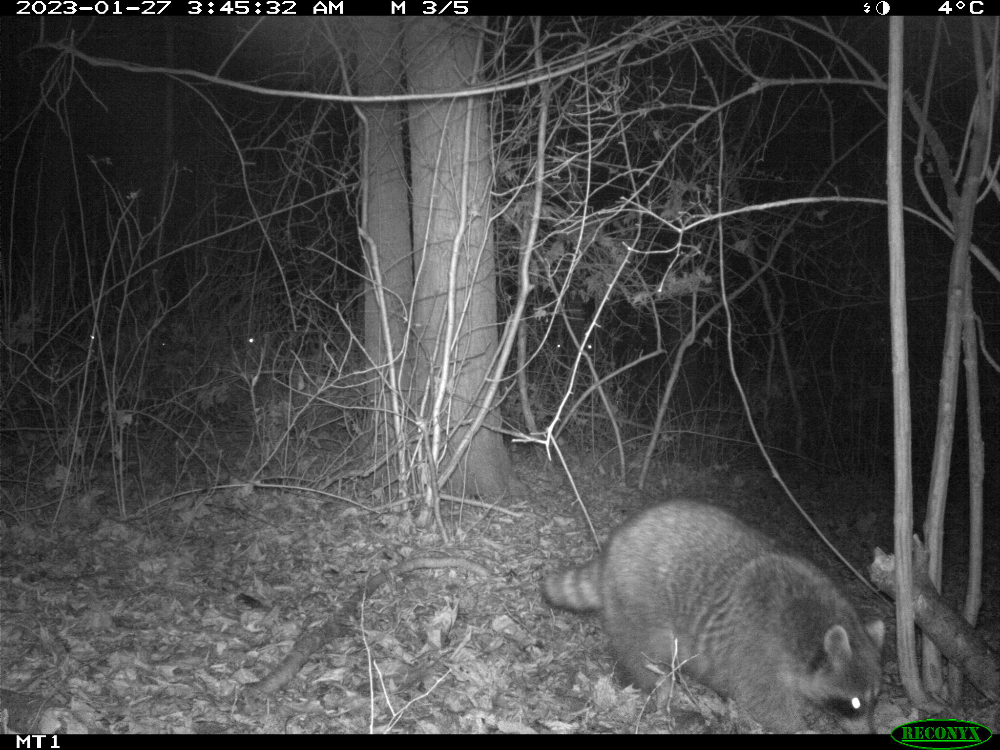

In [6]:
image

In [7]:
model = run_detector.load_detector('MDV5A')

Imported YOLOv5 as utils.*
Using PyTorch version 2.3.1+cpu


Fusing layers... 
Fusing layers... 
Model summary: 733 layers, 140054656 parameters, 0 gradients, 208.8 GFLOPs
Model summary: 733 layers, 140054656 parameters, 0 gradients, 208.8 GFLOPs


Loaded model in 15.99 seconds


In [8]:
result = model.generate_detections_one_image(image)

In [11]:
detections_above_threshold = [d for d in result['detections'] if d['conf'] > 0.9]
print('Found {} detections above threshold'.format(len(detections_above_threshold)))

Found 1 detections above threshold


In [14]:
most_confident_detection

[{'category': '1', 'conf': 0.934, 'bbox': [0.5356, 0.6555, 0.3549, 0.3222]}]

In [20]:
import cv2

# Assuming `result` is the dictionary you provided and `image` is the path to the image file

# Load the image using OpenCV
image = cv2.imread(r"\\vector.e3b.columbia.edu\e3b\Globus Database\UWIN Tagged Photos\batch_001\VID34836-01936.jpg")

# Extract the most confident detection
most_confident_detection = detections_above_threshold

# Get the bounding box coordinates and confidence
bbox = most_confident_detection[0]['bbox']
confidence = most_confident_detection[0]['conf']
category = most_confident_detection[0]['category']

# Convert normalized coordinates to absolute coordinates
height, width, _ = image.shape
x1 = int(bbox[0] * width)
y1 = int(bbox[1] * height)
x2 = int((bbox[0] + bbox[2]) * width)
y2 = int((bbox[1] + bbox[3]) * height)

# Draw the bounding box on the image
color = (0, 0, 255)  # Green color for the bounding box
thickness = 4  # Thickness of the bounding box lines
cv2.rectangle(image, (x1, y1), (x2, y2), color, thickness)

# Optionally, add a label with the confidence score
label = f'Confidence: {confidence:.2f}'
cv2.putText(image, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, thickness)

# Display the image
cv2.imshow('Image with Bounding Box', image)
cv2.waitKey(0)
cv2.destroyAllWindows()

# Save the image with bounding box
cv2.imwrite('output_image.jpg', image)

True

In [21]:
from megadetector.detection.run_detector_batch import load_and_run_detector_batch, write_results_to_file
from megadetector.utils import path_utils
import os

In [22]:
# Pick a folder to run MD on recursively, and an output file
image_folder = os.path.expanduser(r"\\vector.e3b.columbia.edu\e3b\Globus Database\UWIN Tagged Photos\batch_001")
output_file = os.path.expanduser('./batch_001_out.json')

In [23]:
image_file_names = path_utils.find_images(image_folder,recursive=True)

In [24]:
results = load_and_run_detector_batch('MDV5A', image_file_names)

Bypassing download of already-downloaded file md_v5a.0.0.pt
PyTorch reports 0 available CUDA devices
GPU available: False


Fusing layers... 
Fusing layers... 
Model summary: 733 layers, 140054656 parameters, 0 gradients, 208.8 GFLOPs
Model summary: 733 layers, 140054656 parameters, 0 gradients, 208.8 GFLOPs


Loaded model in 1 second
Loaded model in 1 second


  0%|                                                                                        | 0/13019 [00:00<?, ?it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00000.jpg


  0%|                                                                              | 1/13019 [00:01<5:28:55,  1.52s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00001.jpg


  0%|                                                                              | 2/13019 [00:02<4:49:10,  1.33s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00002.jpg


  0%|                                                                              | 3/13019 [00:03<4:39:30,  1.29s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00003.jpg


  0%|                                                                              | 4/13019 [00:05<4:21:49,  1.21s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00004.jpg


  0%|                                                                              | 5/13019 [00:06<4:10:01,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00005.jpg


  0%|                                                                              | 6/13019 [00:07<4:01:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00006.jpg


  0%|                                                                              | 7/13019 [00:08<3:54:44,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00007.jpg


  0%|                                                                              | 8/13019 [00:09<3:51:14,  1.07s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00008.jpg


  0%|                                                                              | 9/13019 [00:10<3:49:39,  1.06s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00009.jpg


  0%|                                                                             | 10/13019 [00:11<3:50:47,  1.06s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00010.jpg


  0%|                                                                             | 11/13019 [00:12<3:50:10,  1.06s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00011.jpg


  0%|                                                                             | 12/13019 [00:13<3:47:38,  1.05s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00012.jpg


  0%|                                                                             | 13/13019 [00:14<3:45:02,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00013.jpg


  0%|                                                                             | 14/13019 [00:15<3:44:18,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00014.jpg


  0%|                                                                             | 15/13019 [00:16<3:41:35,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00015.jpg


  0%|                                                                             | 16/13019 [00:17<3:41:48,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00016.jpg


  0%|                                                                             | 17/13019 [00:18<3:40:15,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00017.jpg


  0%|                                                                             | 18/13019 [00:19<3:41:11,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00018.jpg


  0%|                                                                             | 19/13019 [00:20<3:41:00,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00019.jpg


  0%|                                                                             | 20/13019 [00:21<3:42:34,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00020.jpg


  0%|                                                                             | 21/13019 [00:22<3:41:57,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00021.jpg


  0%|▏                                                                            | 22/13019 [00:23<3:42:55,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00022.jpg


  0%|▏                                                                            | 23/13019 [00:24<3:41:34,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00023.jpg


  0%|▏                                                                            | 24/13019 [00:25<3:41:02,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00024.jpg


  0%|▏                                                                            | 25/13019 [00:26<3:41:13,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00025.jpg


  0%|▏                                                                            | 26/13019 [00:27<3:43:06,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00026.jpg


  0%|▏                                                                            | 27/13019 [00:28<3:42:42,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00027.jpg


  0%|▏                                                                            | 28/13019 [00:29<3:43:40,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00028.jpg


  0%|▏                                                                            | 29/13019 [00:30<3:44:58,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00029.jpg


  0%|▏                                                                            | 30/13019 [00:31<3:44:41,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00030.jpg


  0%|▏                                                                            | 31/13019 [00:32<3:47:19,  1.05s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00031.jpg


  0%|▏                                                                            | 32/13019 [00:33<3:45:41,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00032.jpg


  0%|▏                                                                            | 33/13019 [00:34<3:44:14,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00033.jpg


  0%|▏                                                                            | 34/13019 [00:35<3:43:55,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00034.jpg


  0%|▏                                                                            | 35/13019 [00:37<3:43:56,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00035.jpg


  0%|▏                                                                            | 36/13019 [00:38<3:41:22,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00036.jpg


  0%|▏                                                                            | 37/13019 [00:39<3:41:40,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00037.jpg


  0%|▏                                                                            | 38/13019 [00:40<3:40:20,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00038.jpg


  0%|▏                                                                            | 39/13019 [00:41<3:41:13,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00039.jpg


  0%|▏                                                                            | 40/13019 [00:42<3:40:48,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00040.jpg


  0%|▏                                                                            | 41/13019 [00:43<3:42:13,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00041.jpg


  0%|▏                                                                            | 42/13019 [00:44<3:41:41,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00042.jpg


  0%|▎                                                                            | 43/13019 [00:45<3:39:53,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00043.jpg


  0%|▎                                                                            | 44/13019 [00:46<3:39:47,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00044.jpg


  0%|▎                                                                            | 45/13019 [00:47<3:40:43,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00045.jpg


  0%|▎                                                                            | 46/13019 [00:48<3:40:30,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00046.jpg


  0%|▎                                                                            | 47/13019 [00:49<3:40:03,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00047.jpg


  0%|▎                                                                            | 48/13019 [00:50<3:39:10,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00048.jpg


  0%|▎                                                                            | 49/13019 [00:51<3:41:14,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00049.jpg


  0%|▎                                                                            | 50/13019 [00:52<3:42:10,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00050.jpg


  0%|▎                                                                            | 51/13019 [00:53<3:41:40,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00051.jpg


  0%|▎                                                                            | 52/13019 [00:54<3:41:02,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00052.jpg


  0%|▎                                                                            | 53/13019 [00:55<3:41:34,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00053.jpg


  0%|▎                                                                            | 54/13019 [00:56<3:50:14,  1.07s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00054.jpg


  0%|▎                                                                            | 55/13019 [00:57<3:46:45,  1.05s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00055.jpg


  0%|▎                                                                            | 56/13019 [00:58<3:44:00,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00056.jpg


  0%|▎                                                                            | 57/13019 [00:59<3:42:28,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00057.jpg


  0%|▎                                                                            | 58/13019 [01:00<3:41:22,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00058.jpg


  0%|▎                                                                            | 59/13019 [01:01<3:39:35,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00059.jpg


  0%|▎                                                                            | 60/13019 [01:02<3:41:26,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00060.jpg


  0%|▎                                                                            | 61/13019 [01:03<3:42:54,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00061.jpg


  0%|▎                                                                            | 62/13019 [01:04<3:43:50,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00062.jpg


  0%|▎                                                                            | 63/13019 [01:05<3:46:33,  1.05s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00063.jpg


  0%|▍                                                                            | 64/13019 [01:06<3:45:24,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00064.jpg


  0%|▍                                                                            | 65/13019 [01:07<3:42:27,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00065.jpg


  1%|▍                                                                            | 66/13019 [01:08<3:42:34,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00066.jpg


  1%|▍                                                                            | 67/13019 [01:09<3:43:31,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00067.jpg


  1%|▍                                                                            | 68/13019 [01:10<3:43:43,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00068.jpg


  1%|▍                                                                            | 69/13019 [01:11<3:41:14,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00069.jpg


  1%|▍                                                                            | 70/13019 [01:12<3:40:39,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00070.jpg


  1%|▍                                                                            | 71/13019 [01:14<3:40:59,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00071.jpg


  1%|▍                                                                            | 72/13019 [01:15<3:40:30,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00072.jpg


  1%|▍                                                                            | 73/13019 [01:16<3:41:51,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00073.jpg


  1%|▍                                                                            | 74/13019 [01:17<3:39:56,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00074.jpg


  1%|▍                                                                            | 75/13019 [01:18<3:40:17,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00075.jpg


  1%|▍                                                                            | 76/13019 [01:19<3:40:24,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00076.jpg


  1%|▍                                                                            | 77/13019 [01:20<3:40:09,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00077.jpg


  1%|▍                                                                            | 78/13019 [01:21<3:40:32,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00078.jpg


  1%|▍                                                                            | 79/13019 [01:22<3:39:05,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00079.jpg


  1%|▍                                                                            | 80/13019 [01:23<3:37:57,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00080.jpg


  1%|▍                                                                            | 81/13019 [01:24<3:37:18,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00081.jpg


  1%|▍                                                                            | 82/13019 [01:25<3:37:45,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00082.jpg


  1%|▍                                                                            | 83/13019 [01:26<3:37:08,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00083.jpg


  1%|▍                                                                            | 84/13019 [01:27<3:39:31,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00084.jpg


  1%|▌                                                                            | 85/13019 [01:28<3:40:11,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00085.jpg


  1%|▌                                                                            | 86/13019 [01:29<3:38:05,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00086.jpg


  1%|▌                                                                            | 87/13019 [01:30<3:38:49,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00087.jpg


  1%|▌                                                                            | 88/13019 [01:31<3:37:18,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00088.jpg


  1%|▌                                                                            | 89/13019 [01:32<3:36:16,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00089.jpg


  1%|▌                                                                            | 90/13019 [01:33<3:38:24,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00090.jpg


  1%|▌                                                                            | 91/13019 [01:34<3:36:48,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00091.jpg


  1%|▌                                                                            | 92/13019 [01:35<3:39:12,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00092.jpg


  1%|▌                                                                            | 93/13019 [01:36<3:38:45,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00093.jpg


  1%|▌                                                                            | 94/13019 [01:37<3:40:17,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00094.jpg


  1%|▌                                                                            | 95/13019 [01:38<3:41:41,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00095.jpg


  1%|▌                                                                            | 96/13019 [01:39<3:43:03,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00096.jpg


  1%|▌                                                                            | 97/13019 [01:40<3:42:27,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00097.jpg


  1%|▌                                                                            | 98/13019 [01:41<3:40:19,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00098.jpg


  1%|▌                                                                            | 99/13019 [01:42<3:40:35,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00099.jpg


  1%|▌                                                                           | 100/13019 [01:43<3:39:12,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00100.jpg


  1%|▌                                                                           | 101/13019 [01:44<3:40:03,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00101.jpg


  1%|▌                                                                           | 102/13019 [01:45<3:38:35,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00102.jpg


  1%|▌                                                                           | 103/13019 [01:46<3:40:35,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00103.jpg


  1%|▌                                                                           | 104/13019 [01:47<3:40:00,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00104.jpg


  1%|▌                                                                           | 105/13019 [01:48<3:38:33,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00105.jpg


  1%|▌                                                                           | 106/13019 [01:49<3:39:32,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00106.jpg


  1%|▌                                                                           | 107/13019 [01:50<3:39:09,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00107.jpg


  1%|▋                                                                           | 108/13019 [01:51<3:40:02,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00108.jpg


  1%|▋                                                                           | 109/13019 [01:52<3:40:36,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00109.jpg


  1%|▋                                                                           | 110/13019 [01:53<3:39:57,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00110.jpg


  1%|▋                                                                           | 111/13019 [01:54<3:38:28,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00111.jpg


  1%|▋                                                                           | 112/13019 [01:55<3:39:28,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00112.jpg


  1%|▋                                                                           | 113/13019 [01:56<3:36:46,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00113.jpg


  1%|▋                                                                           | 114/13019 [01:57<3:40:41,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00114.jpg


  1%|▋                                                                           | 115/13019 [01:58<3:40:36,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00115.jpg


  1%|▋                                                                           | 116/13019 [01:59<3:40:09,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00116.jpg


  1%|▋                                                                           | 117/13019 [02:00<3:39:26,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00117.jpg


  1%|▋                                                                           | 118/13019 [02:01<3:37:45,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00118.jpg


  1%|▋                                                                           | 119/13019 [02:02<3:37:18,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00119.jpg


  1%|▋                                                                           | 120/13019 [02:03<3:35:51,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00120.jpg


  1%|▋                                                                           | 121/13019 [02:04<3:35:35,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00121.jpg


  1%|▋                                                                           | 122/13019 [02:05<3:37:36,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00122.jpg


  1%|▋                                                                           | 123/13019 [02:06<3:40:36,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00123.jpg


  1%|▋                                                                           | 124/13019 [02:07<3:39:52,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00124.jpg


  1%|▋                                                                           | 125/13019 [02:09<3:43:17,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00125.jpg


  1%|▋                                                                           | 126/13019 [02:10<3:42:53,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00126.jpg


  1%|▋                                                                           | 127/13019 [02:11<3:41:34,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00127.jpg


  1%|▋                                                                           | 128/13019 [02:12<3:40:32,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00128.jpg


  1%|▊                                                                           | 129/13019 [02:13<3:38:43,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00129.jpg


  1%|▊                                                                           | 130/13019 [02:14<3:36:32,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00130.jpg


  1%|▊                                                                           | 131/13019 [02:15<3:36:00,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00131.jpg


  1%|▊                                                                           | 132/13019 [02:16<3:37:38,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00132.jpg


  1%|▊                                                                           | 133/13019 [02:17<3:36:45,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00133.jpg


  1%|▊                                                                           | 134/13019 [02:18<3:37:08,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00134.jpg


  1%|▊                                                                           | 135/13019 [02:19<3:37:24,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00135.jpg


  1%|▊                                                                           | 136/13019 [02:20<3:36:34,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00136.jpg


  1%|▊                                                                           | 137/13019 [02:21<3:35:07,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00137.jpg


  1%|▊                                                                           | 138/13019 [02:22<3:35:07,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00138.jpg


  1%|▊                                                                           | 139/13019 [02:23<3:34:42,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00139.jpg


  1%|▊                                                                           | 140/13019 [02:24<3:35:41,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00140.jpg


  1%|▊                                                                           | 141/13019 [02:25<3:34:27,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00141.jpg


  1%|▊                                                                           | 142/13019 [02:26<3:34:23,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00142.jpg


  1%|▊                                                                           | 143/13019 [02:27<3:34:25,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00143.jpg


  1%|▊                                                                           | 144/13019 [02:28<3:34:28,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00144.jpg


  1%|▊                                                                           | 145/13019 [02:29<3:34:27,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00145.jpg


  1%|▊                                                                           | 146/13019 [02:30<3:34:29,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00146.jpg


  1%|▊                                                                           | 147/13019 [02:31<3:34:37,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00147.jpg


  1%|▊                                                                           | 148/13019 [02:32<3:35:26,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00148.jpg


  1%|▊                                                                           | 149/13019 [02:33<3:35:18,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00149.jpg


  1%|▉                                                                           | 150/13019 [02:34<3:34:53,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00150.jpg


  1%|▉                                                                           | 151/13019 [02:35<3:35:44,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00151.jpg


  1%|▉                                                                           | 152/13019 [02:36<3:34:21,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00152.jpg


  1%|▉                                                                           | 153/13019 [02:37<3:35:32,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00153.jpg


  1%|▉                                                                           | 154/13019 [02:38<3:36:04,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00154.jpg


  1%|▉                                                                           | 155/13019 [02:39<3:36:40,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00155.jpg


  1%|▉                                                                           | 156/13019 [02:40<3:39:13,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00156.jpg


  1%|▉                                                                           | 157/13019 [02:41<3:36:31,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00157.jpg


  1%|▉                                                                           | 158/13019 [02:42<3:34:46,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00158.jpg


  1%|▉                                                                           | 159/13019 [02:43<3:35:31,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00159.jpg


  1%|▉                                                                           | 160/13019 [02:44<3:35:08,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00160.jpg


  1%|▉                                                                           | 161/13019 [02:45<3:36:07,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00161.jpg


  1%|▉                                                                           | 162/13019 [02:46<3:36:23,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00162.jpg


  1%|▉                                                                           | 163/13019 [02:47<3:37:41,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00163.jpg


  1%|▉                                                                           | 164/13019 [02:48<3:36:50,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00164.jpg


  1%|▉                                                                           | 165/13019 [02:49<3:37:54,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00165.jpg


  1%|▉                                                                           | 166/13019 [02:50<3:40:44,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00166.jpg


  1%|▉                                                                           | 167/13019 [02:51<3:38:45,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00167.jpg


  1%|▉                                                                           | 168/13019 [02:52<3:37:31,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00168.jpg


  1%|▉                                                                           | 169/13019 [02:53<3:37:43,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00169.jpg


  1%|▉                                                                           | 170/13019 [02:54<3:35:24,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00170.jpg


  1%|▉                                                                           | 171/13019 [02:55<3:35:14,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00171.jpg


  1%|█                                                                           | 172/13019 [02:56<3:34:40,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00172.jpg


  1%|█                                                                           | 173/13019 [02:57<3:34:41,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00173.jpg


  1%|█                                                                           | 174/13019 [02:58<3:35:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00174.jpg


  1%|█                                                                           | 175/13019 [02:59<3:35:07,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00175.jpg


  1%|█                                                                           | 176/13019 [03:00<3:35:25,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00176.jpg


  1%|█                                                                           | 177/13019 [03:01<3:35:20,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00177.jpg


  1%|█                                                                           | 178/13019 [03:02<3:34:33,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00178.jpg


  1%|█                                                                           | 179/13019 [03:03<3:35:40,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00179.jpg


  1%|█                                                                           | 180/13019 [03:04<3:36:52,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00180.jpg


  1%|█                                                                           | 181/13019 [03:05<3:36:58,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00181.jpg


  1%|█                                                                           | 182/13019 [03:06<3:36:12,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00182.jpg


  1%|█                                                                           | 183/13019 [03:07<3:35:22,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00183.jpg


  1%|█                                                                           | 184/13019 [03:08<3:34:55,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00184.jpg


  1%|█                                                                           | 185/13019 [03:09<3:37:37,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00185.jpg


  1%|█                                                                           | 186/13019 [03:10<3:37:27,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00186.jpg


  1%|█                                                                           | 187/13019 [03:11<3:38:23,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00187.jpg


  1%|█                                                                           | 188/13019 [03:12<3:37:12,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00188.jpg


  1%|█                                                                           | 189/13019 [03:13<3:36:31,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00189.jpg


  1%|█                                                                           | 190/13019 [03:14<3:35:13,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00190.jpg


  1%|█                                                                           | 191/13019 [03:15<3:36:44,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00191.jpg


  1%|█                                                                           | 192/13019 [03:16<3:33:48,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00192.jpg


  1%|█▏                                                                          | 193/13019 [03:17<3:34:48,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00193.jpg


  1%|█▏                                                                          | 194/13019 [03:18<3:34:27,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00194.jpg


  1%|█▏                                                                          | 195/13019 [03:19<3:35:14,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00195.jpg


  2%|█▏                                                                          | 196/13019 [03:20<3:34:45,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00196.jpg


  2%|█▏                                                                          | 197/13019 [03:21<3:38:15,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00197.jpg


  2%|█▏                                                                          | 198/13019 [03:22<3:38:02,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00198.jpg


  2%|█▏                                                                          | 199/13019 [03:23<3:38:20,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00199.jpg


  2%|█▏                                                                          | 200/13019 [03:24<3:38:36,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00200.jpg


  2%|█▏                                                                          | 201/13019 [03:25<3:39:48,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00201.jpg


  2%|█▏                                                                          | 202/13019 [03:26<3:38:55,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00202.jpg


  2%|█▏                                                                          | 203/13019 [03:27<3:37:57,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00203.jpg


  2%|█▏                                                                          | 204/13019 [03:28<3:36:17,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00204.jpg


  2%|█▏                                                                          | 205/13019 [03:29<3:35:52,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00205.jpg


  2%|█▏                                                                          | 206/13019 [03:30<3:35:43,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00206.jpg


  2%|█▏                                                                          | 207/13019 [03:31<3:34:29,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00207.jpg


  2%|█▏                                                                          | 208/13019 [03:32<3:34:47,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00208.jpg


  2%|█▏                                                                          | 209/13019 [03:33<3:35:04,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00209.jpg


  2%|█▏                                                                          | 210/13019 [03:34<3:36:35,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00210.jpg


  2%|█▏                                                                          | 211/13019 [03:35<3:34:17,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00211.jpg


  2%|█▏                                                                          | 212/13019 [03:36<3:36:21,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00212.jpg


  2%|█▏                                                                          | 213/13019 [03:37<3:35:05,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00213.jpg


  2%|█▏                                                                          | 214/13019 [03:38<3:34:15,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00214.jpg


  2%|█▎                                                                          | 215/13019 [03:39<3:33:22,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00215.jpg


  2%|█▎                                                                          | 216/13019 [03:40<3:32:40,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00216.jpg


  2%|█▎                                                                          | 217/13019 [03:41<3:34:33,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00217.jpg


  2%|█▎                                                                          | 218/13019 [03:42<3:34:30,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00218.jpg


  2%|█▎                                                                          | 219/13019 [03:43<3:33:07,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00219.jpg


  2%|█▎                                                                          | 220/13019 [03:44<3:37:27,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00220.jpg


  2%|█▎                                                                          | 221/13019 [03:46<3:40:45,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00221.jpg


  2%|█▎                                                                          | 222/13019 [03:47<3:40:22,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00222.jpg


  2%|█▎                                                                          | 223/13019 [03:48<3:36:20,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00223.jpg


  2%|█▎                                                                          | 224/13019 [03:49<3:38:35,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00224.jpg


  2%|█▎                                                                          | 225/13019 [03:50<3:37:57,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00225.jpg


  2%|█▎                                                                          | 226/13019 [03:51<3:38:34,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00226.jpg


  2%|█▎                                                                          | 227/13019 [03:52<3:37:52,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00227.jpg


  2%|█▎                                                                          | 228/13019 [03:53<3:35:25,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00228.jpg


  2%|█▎                                                                          | 229/13019 [03:54<3:34:48,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00229.jpg


  2%|█▎                                                                          | 230/13019 [03:55<3:34:17,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00230.jpg


  2%|█▎                                                                          | 231/13019 [03:56<3:36:00,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00231.jpg


  2%|█▎                                                                          | 232/13019 [03:57<3:36:07,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00232.jpg


  2%|█▎                                                                          | 233/13019 [03:58<3:35:04,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00233.jpg


  2%|█▎                                                                          | 234/13019 [03:59<3:35:35,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00234.jpg


  2%|█▎                                                                          | 235/13019 [04:00<3:33:47,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00235.jpg


  2%|█▍                                                                          | 236/13019 [04:01<3:35:35,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00236.jpg


  2%|█▍                                                                          | 237/13019 [04:02<3:36:38,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00237.jpg


  2%|█▍                                                                          | 238/13019 [04:03<3:34:42,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00238.jpg


  2%|█▍                                                                          | 239/13019 [04:04<3:35:14,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00239.jpg


  2%|█▍                                                                          | 240/13019 [04:05<3:34:30,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00240.jpg


  2%|█▍                                                                          | 241/13019 [04:06<3:35:52,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00241.jpg


  2%|█▍                                                                          | 242/13019 [04:07<3:36:57,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00242.jpg


  2%|█▍                                                                          | 243/13019 [04:08<3:35:45,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00243.jpg


  2%|█▍                                                                          | 244/13019 [04:09<3:34:51,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00244.jpg


  2%|█▍                                                                          | 245/13019 [04:10<3:35:17,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00245.jpg


  2%|█▍                                                                          | 246/13019 [04:11<3:34:43,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00246.jpg


  2%|█▍                                                                          | 247/13019 [04:12<3:35:16,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00247.jpg


  2%|█▍                                                                          | 248/13019 [04:13<3:35:21,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00248.jpg


  2%|█▍                                                                          | 249/13019 [04:14<3:33:45,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00249.jpg


  2%|█▍                                                                          | 250/13019 [04:15<3:33:09,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00250.jpg


  2%|█▍                                                                          | 251/13019 [04:16<3:33:15,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00251.jpg


  2%|█▍                                                                          | 252/13019 [04:17<3:33:08,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00252.jpg


  2%|█▍                                                                          | 253/13019 [04:18<3:36:44,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00253.jpg


  2%|█▍                                                                          | 254/13019 [04:19<3:35:31,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00254.jpg


  2%|█▍                                                                          | 255/13019 [04:20<3:34:40,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00255.jpg


  2%|█▍                                                                          | 256/13019 [04:21<3:34:25,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00256.jpg


  2%|█▌                                                                          | 257/13019 [04:22<3:35:55,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00257.jpg


  2%|█▌                                                                          | 258/13019 [04:23<3:36:32,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00258.jpg


  2%|█▌                                                                          | 259/13019 [04:24<3:35:50,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00259.jpg


  2%|█▌                                                                          | 260/13019 [04:25<3:40:25,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00260.jpg


  2%|█▌                                                                          | 261/13019 [04:26<3:38:30,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00261.jpg


  2%|█▌                                                                          | 262/13019 [04:27<3:36:13,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00262.jpg


  2%|█▌                                                                          | 263/13019 [04:28<3:33:37,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00263.jpg


  2%|█▌                                                                          | 264/13019 [04:29<3:37:25,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00264.jpg


  2%|█▌                                                                          | 265/13019 [04:30<3:35:52,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00265.jpg


  2%|█▌                                                                          | 266/13019 [04:31<3:36:54,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00266.jpg


  2%|█▌                                                                          | 267/13019 [04:32<3:36:57,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00267.jpg


  2%|█▌                                                                          | 268/13019 [04:33<3:35:11,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00268.jpg


  2%|█▌                                                                          | 269/13019 [04:34<3:34:48,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00269.jpg


  2%|█▌                                                                          | 270/13019 [04:35<3:34:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00270.jpg


  2%|█▌                                                                          | 271/13019 [04:36<3:38:06,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00271.jpg


  2%|█▌                                                                          | 272/13019 [04:37<3:36:17,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00272.jpg


  2%|█▌                                                                          | 273/13019 [04:38<3:35:04,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00273.jpg


  2%|█▌                                                                          | 274/13019 [04:39<3:37:42,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00274.jpg


  2%|█▌                                                                          | 275/13019 [04:40<3:36:05,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00275.jpg


  2%|█▌                                                                          | 276/13019 [04:41<3:33:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00276.jpg


  2%|█▌                                                                          | 277/13019 [04:42<3:35:14,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00277.jpg


  2%|█▌                                                                          | 278/13019 [04:43<3:34:24,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00278.jpg


  2%|█▋                                                                          | 279/13019 [04:44<3:35:01,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00279.jpg


  2%|█▋                                                                          | 280/13019 [04:45<3:36:11,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00280.jpg


  2%|█▋                                                                          | 281/13019 [04:46<3:33:46,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00281.jpg


  2%|█▋                                                                          | 282/13019 [04:47<3:34:14,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00282.jpg


  2%|█▋                                                                          | 283/13019 [04:48<3:32:37,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00283.jpg


  2%|█▋                                                                          | 284/13019 [04:49<3:33:28,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00284.jpg


  2%|█▋                                                                          | 285/13019 [04:50<3:33:04,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00285.jpg


  2%|█▋                                                                          | 286/13019 [04:51<3:35:09,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00286.jpg


  2%|█▋                                                                          | 287/13019 [04:52<3:36:14,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00287.jpg


  2%|█▋                                                                          | 288/13019 [04:53<3:34:38,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00288.jpg


  2%|█▋                                                                          | 289/13019 [04:54<3:34:15,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00289.jpg


  2%|█▋                                                                          | 290/13019 [04:55<3:32:37,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00290.jpg


  2%|█▋                                                                          | 291/13019 [04:56<3:34:07,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00291.jpg


  2%|█▋                                                                          | 292/13019 [04:57<3:36:48,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00292.jpg


  2%|█▋                                                                          | 293/13019 [04:58<3:35:21,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00293.jpg


  2%|█▋                                                                          | 294/13019 [04:59<3:36:03,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00294.jpg


  2%|█▋                                                                          | 295/13019 [05:00<3:34:49,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00295.jpg


  2%|█▋                                                                          | 296/13019 [05:01<3:34:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00296.jpg


  2%|█▋                                                                          | 297/13019 [05:02<3:32:16,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00297.jpg


  2%|█▋                                                                          | 298/13019 [05:03<3:35:12,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00298.jpg


  2%|█▋                                                                          | 299/13019 [05:04<3:34:32,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00299.jpg


  2%|█▊                                                                          | 300/13019 [05:05<3:34:23,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00300.jpg


  2%|█▊                                                                          | 301/13019 [05:06<3:33:31,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00301.jpg


  2%|█▊                                                                          | 302/13019 [05:08<3:35:25,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00302.jpg


  2%|█▊                                                                          | 303/13019 [05:09<3:36:29,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00303.jpg


  2%|█▊                                                                          | 304/13019 [05:10<3:35:03,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00304.jpg


  2%|█▊                                                                          | 305/13019 [05:11<3:35:06,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00305.jpg


  2%|█▊                                                                          | 306/13019 [05:12<3:36:04,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00306.jpg


  2%|█▊                                                                          | 307/13019 [05:13<3:36:53,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00307.jpg


  2%|█▊                                                                          | 308/13019 [05:14<3:37:13,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00308.jpg


  2%|█▊                                                                          | 309/13019 [05:15<3:34:43,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00309.jpg


  2%|█▊                                                                          | 310/13019 [05:16<3:34:42,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00310.jpg


  2%|█▊                                                                          | 311/13019 [05:17<3:33:50,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00311.jpg


  2%|█▊                                                                          | 312/13019 [05:18<3:35:10,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00312.jpg


  2%|█▊                                                                          | 313/13019 [05:19<3:34:09,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00313.jpg


  2%|█▊                                                                          | 314/13019 [05:20<3:34:24,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00314.jpg


  2%|█▊                                                                          | 315/13019 [05:21<3:33:44,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00315.jpg


  2%|█▊                                                                          | 316/13019 [05:22<3:33:07,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00316.jpg


  2%|█▊                                                                          | 317/13019 [05:23<3:34:46,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00317.jpg


  2%|█▊                                                                          | 318/13019 [05:24<3:33:48,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00318.jpg


  2%|█▊                                                                          | 319/13019 [05:25<3:36:52,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00319.jpg


  2%|█▊                                                                          | 320/13019 [05:26<3:35:19,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00320.jpg


  2%|█▊                                                                          | 321/13019 [05:27<3:34:11,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00321.jpg


  2%|█▉                                                                          | 322/13019 [05:28<3:35:21,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00322.jpg


  2%|█▉                                                                          | 323/13019 [05:29<3:39:34,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00323.jpg


  2%|█▉                                                                          | 324/13019 [05:30<3:37:10,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00324.jpg


  2%|█▉                                                                          | 325/13019 [05:31<3:35:31,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00325.jpg


  3%|█▉                                                                          | 326/13019 [05:32<3:34:04,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00326.jpg


  3%|█▉                                                                          | 327/13019 [05:33<3:35:07,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00327.jpg


  3%|█▉                                                                          | 328/13019 [05:34<3:34:24,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00328.jpg


  3%|█▉                                                                          | 329/13019 [05:35<3:35:05,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00329.jpg


  3%|█▉                                                                          | 330/13019 [05:36<3:33:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00330.jpg


  3%|█▉                                                                          | 331/13019 [05:37<3:32:31,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00331.jpg


  3%|█▉                                                                          | 332/13019 [05:38<3:33:25,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00332.jpg


  3%|█▉                                                                          | 333/13019 [05:39<3:32:50,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00333.jpg


  3%|█▉                                                                          | 334/13019 [05:40<3:34:53,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00334.jpg


  3%|█▉                                                                          | 335/13019 [05:41<3:34:24,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00335.jpg


  3%|█▉                                                                          | 336/13019 [05:42<3:33:52,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00336.jpg


  3%|█▉                                                                          | 337/13019 [05:43<3:31:08,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00337.jpg


  3%|█▉                                                                          | 338/13019 [05:44<3:33:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00338.jpg


  3%|█▉                                                                          | 339/13019 [05:45<3:33:02,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00339.jpg


  3%|█▉                                                                          | 340/13019 [05:46<3:36:42,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00340.jpg


  3%|█▉                                                                          | 341/13019 [05:47<3:35:31,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00341.jpg


  3%|█▉                                                                          | 342/13019 [05:48<3:35:35,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00342.jpg


  3%|██                                                                          | 343/13019 [05:49<3:36:42,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00343.jpg


  3%|██                                                                          | 344/13019 [05:50<3:35:45,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00344.jpg


  3%|██                                                                          | 345/13019 [05:51<3:35:40,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00345.jpg


  3%|██                                                                          | 346/13019 [05:52<3:33:56,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00346.jpg


  3%|██                                                                          | 347/13019 [05:53<3:33:28,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00347.jpg


  3%|██                                                                          | 348/13019 [05:54<3:33:45,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00348.jpg


  3%|██                                                                          | 349/13019 [05:55<3:32:34,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00349.jpg


  3%|██                                                                          | 350/13019 [05:56<3:32:31,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00350.jpg


  3%|██                                                                          | 351/13019 [05:57<3:34:08,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00351.jpg


  3%|██                                                                          | 352/13019 [05:58<3:34:44,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00352.jpg


  3%|██                                                                          | 353/13019 [05:59<3:34:01,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00353.jpg


  3%|██                                                                          | 354/13019 [06:00<3:34:33,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00354.jpg


  3%|██                                                                          | 355/13019 [06:01<3:34:03,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00355.jpg


  3%|██                                                                          | 356/13019 [06:02<3:33:07,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00356.jpg


  3%|██                                                                          | 357/13019 [06:03<3:31:31,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00357.jpg


  3%|██                                                                          | 358/13019 [06:04<3:32:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00358.jpg


  3%|██                                                                          | 359/13019 [06:05<3:32:54,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00359.jpg


  3%|██                                                                          | 360/13019 [06:06<3:33:18,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00360.jpg


  3%|██                                                                          | 361/13019 [06:07<3:33:34,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00361.jpg


  3%|██                                                                          | 362/13019 [06:08<3:32:26,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00362.jpg


  3%|██                                                                          | 363/13019 [06:09<3:33:32,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00363.jpg


  3%|██                                                                          | 364/13019 [06:10<3:33:08,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00364.jpg


  3%|██▏                                                                         | 365/13019 [06:11<3:32:48,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00365.jpg


  3%|██▏                                                                         | 366/13019 [06:12<3:32:54,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00366.jpg


  3%|██▏                                                                         | 367/13019 [06:13<3:31:33,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00367.jpg


  3%|██▏                                                                         | 368/13019 [06:14<3:32:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00368.jpg


  3%|██▏                                                                         | 369/13019 [06:15<3:30:54,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00369.jpg


  3%|██▏                                                                         | 370/13019 [06:16<3:30:26,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00370.jpg


  3%|██▏                                                                         | 371/13019 [06:17<3:31:54,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00371.jpg


  3%|██▏                                                                         | 372/13019 [06:18<3:32:22,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00372.jpg


  3%|██▏                                                                         | 373/13019 [06:19<3:33:10,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00373.jpg


  3%|██▏                                                                         | 374/13019 [06:21<3:35:16,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00374.jpg


  3%|██▏                                                                         | 375/13019 [06:22<3:35:10,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00375.jpg


  3%|██▏                                                                         | 376/13019 [06:23<3:32:28,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00376.jpg


  3%|██▏                                                                         | 377/13019 [06:24<3:32:09,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00377.jpg


  3%|██▏                                                                         | 378/13019 [06:25<3:33:52,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00378.jpg


  3%|██▏                                                                         | 379/13019 [06:26<3:34:30,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00379.jpg


  3%|██▏                                                                         | 380/13019 [06:27<3:36:16,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00380.jpg


  3%|██▏                                                                         | 381/13019 [06:28<3:32:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00381.jpg


  3%|██▏                                                                         | 382/13019 [06:29<3:31:00,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00382.jpg


  3%|██▏                                                                         | 383/13019 [06:30<3:31:51,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00383.jpg


  3%|██▏                                                                         | 384/13019 [06:31<3:30:28,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00384.jpg


  3%|██▏                                                                         | 385/13019 [06:32<3:30:32,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00385.jpg


  3%|██▎                                                                         | 386/13019 [06:33<3:27:31,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00386.jpg


  3%|██▎                                                                         | 387/13019 [06:34<3:27:24,  1.02it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00387.jpg


  3%|██▎                                                                         | 388/13019 [06:34<3:28:03,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00388.jpg


  3%|██▎                                                                         | 389/13019 [06:36<3:29:07,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00389.jpg


  3%|██▎                                                                         | 390/13019 [06:37<3:31:02,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00390.jpg


  3%|██▎                                                                         | 391/13019 [06:38<3:30:49,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00391.jpg


  3%|██▎                                                                         | 392/13019 [06:39<3:30:06,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00392.jpg


  3%|██▎                                                                         | 393/13019 [06:39<3:28:07,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00393.jpg


  3%|██▎                                                                         | 394/13019 [06:40<3:27:32,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00394.jpg


  3%|██▎                                                                         | 395/13019 [06:41<3:28:25,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00395.jpg


  3%|██▎                                                                         | 396/13019 [06:42<3:29:54,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00396.jpg


  3%|██▎                                                                         | 397/13019 [06:43<3:29:08,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00397.jpg


  3%|██▎                                                                         | 398/13019 [06:44<3:30:46,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00398.jpg


  3%|██▎                                                                         | 399/13019 [06:45<3:31:26,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00399.jpg


  3%|██▎                                                                         | 400/13019 [06:47<3:31:27,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00400.jpg


  3%|██▎                                                                         | 401/13019 [06:48<3:31:53,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00401.jpg


  3%|██▎                                                                         | 402/13019 [06:49<3:33:17,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00402.jpg


  3%|██▎                                                                         | 403/13019 [06:50<3:33:39,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00403.jpg


  3%|██▎                                                                         | 404/13019 [06:51<3:32:24,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00404.jpg


  3%|██▎                                                                         | 405/13019 [06:52<3:31:22,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00405.jpg


  3%|██▎                                                                         | 406/13019 [06:53<3:30:23,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00406.jpg


  3%|██▍                                                                         | 407/13019 [06:54<3:31:18,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00407.jpg


  3%|██▍                                                                         | 408/13019 [06:55<3:30:56,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00408.jpg


  3%|██▍                                                                         | 409/13019 [06:56<3:30:42,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00409.jpg


  3%|██▍                                                                         | 410/13019 [06:57<3:30:31,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00410.jpg


  3%|██▍                                                                         | 411/13019 [06:58<3:33:33,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00411.jpg


  3%|██▍                                                                         | 412/13019 [06:59<3:32:22,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00412.jpg


  3%|██▍                                                                         | 413/13019 [07:00<3:31:05,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00413.jpg


  3%|██▍                                                                         | 414/13019 [07:01<3:31:24,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00414.jpg


  3%|██▍                                                                         | 415/13019 [07:02<3:32:06,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00415.jpg


  3%|██▍                                                                         | 416/13019 [07:03<3:32:36,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00416.jpg


  3%|██▍                                                                         | 417/13019 [07:04<3:33:46,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00417.jpg


  3%|██▍                                                                         | 418/13019 [07:05<3:35:28,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00418.jpg


  3%|██▍                                                                         | 419/13019 [07:06<3:34:35,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00419.jpg


  3%|██▍                                                                         | 420/13019 [07:07<3:33:12,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00420.jpg


  3%|██▍                                                                         | 421/13019 [07:08<3:32:27,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00421.jpg


  3%|██▍                                                                         | 422/13019 [07:09<3:32:02,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00422.jpg


  3%|██▍                                                                         | 423/13019 [07:10<3:31:12,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00423.jpg


  3%|██▍                                                                         | 424/13019 [07:11<3:32:21,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00424.jpg


  3%|██▍                                                                         | 425/13019 [07:12<3:32:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00425.jpg


  3%|██▍                                                                         | 426/13019 [07:13<3:32:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00426.jpg


  3%|██▍                                                                         | 427/13019 [07:14<3:30:49,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00427.jpg


  3%|██▍                                                                         | 428/13019 [07:15<3:30:47,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00428.jpg


  3%|██▌                                                                         | 429/13019 [07:16<3:32:11,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00429.jpg


  3%|██▌                                                                         | 430/13019 [07:17<3:31:43,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00430.jpg


  3%|██▌                                                                         | 431/13019 [07:18<3:29:52,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00431.jpg


  3%|██▌                                                                         | 432/13019 [07:19<3:29:07,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00432.jpg


  3%|██▌                                                                         | 433/13019 [07:20<3:28:03,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00433.jpg


  3%|██▌                                                                         | 434/13019 [07:21<3:29:30,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00434.jpg


  3%|██▌                                                                         | 435/13019 [07:22<3:30:40,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00435.jpg


  3%|██▌                                                                         | 436/13019 [07:23<3:31:32,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00436.jpg


  3%|██▌                                                                         | 437/13019 [07:24<3:29:45,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00437.jpg


  3%|██▌                                                                         | 438/13019 [07:25<3:34:51,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00438.jpg


  3%|██▌                                                                         | 439/13019 [07:26<3:35:03,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00439.jpg


  3%|██▌                                                                         | 440/13019 [07:27<3:32:20,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00440.jpg


  3%|██▌                                                                         | 441/13019 [07:28<3:33:28,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00441.jpg


  3%|██▌                                                                         | 442/13019 [07:29<3:31:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00442.jpg


  3%|██▌                                                                         | 443/13019 [07:30<3:29:53,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00443.jpg


  3%|██▌                                                                         | 444/13019 [07:31<3:29:42,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00444.jpg


  3%|██▌                                                                         | 445/13019 [07:32<3:29:42,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00445.jpg


  3%|██▌                                                                         | 446/13019 [07:33<3:28:59,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00446.jpg


  3%|██▌                                                                         | 447/13019 [07:34<3:28:46,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00447.jpg


  3%|██▌                                                                         | 448/13019 [07:35<3:28:18,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00448.jpg


  3%|██▌                                                                         | 449/13019 [07:36<3:28:31,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00449.jpg


  3%|██▋                                                                         | 450/13019 [07:37<3:26:46,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00450.jpg


  3%|██▋                                                                         | 451/13019 [07:38<3:27:25,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00451.jpg


  3%|██▋                                                                         | 452/13019 [07:39<3:28:01,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00452.jpg


  3%|██▋                                                                         | 453/13019 [07:40<3:27:42,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00453.jpg


  3%|██▋                                                                         | 454/13019 [07:41<3:28:56,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00454.jpg


  3%|██▋                                                                         | 455/13019 [07:42<3:29:02,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00455.jpg


  4%|██▋                                                                         | 456/13019 [07:43<3:29:23,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00456.jpg


  4%|██▋                                                                         | 457/13019 [07:44<3:31:05,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00457.jpg


  4%|██▋                                                                         | 458/13019 [07:45<3:30:50,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00458.jpg


  4%|██▋                                                                         | 459/13019 [07:46<3:28:22,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00459.jpg


  4%|██▋                                                                         | 460/13019 [07:47<3:28:38,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00460.jpg


  4%|██▋                                                                         | 461/13019 [07:48<3:29:51,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00461.jpg


  4%|██▋                                                                         | 462/13019 [07:49<3:29:21,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00462.jpg


  4%|██▋                                                                         | 463/13019 [07:50<3:29:37,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00463.jpg


  4%|██▋                                                                         | 464/13019 [07:51<3:30:09,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00464.jpg


  4%|██▋                                                                         | 465/13019 [07:52<3:29:12,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00465.jpg


  4%|██▋                                                                         | 466/13019 [07:53<3:27:09,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00466.jpg


  4%|██▋                                                                         | 467/13019 [07:54<3:28:49,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00467.jpg


  4%|██▋                                                                         | 468/13019 [07:55<3:32:31,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00468.jpg


  4%|██▋                                                                         | 469/13019 [07:56<3:29:32,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00469.jpg


  4%|██▋                                                                         | 470/13019 [07:57<3:28:25,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00470.jpg


  4%|██▋                                                                         | 471/13019 [07:58<3:29:55,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00471.jpg


  4%|██▊                                                                         | 472/13019 [07:59<3:29:21,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00472.jpg


  4%|██▊                                                                         | 473/13019 [08:00<3:29:40,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00473.jpg


  4%|██▊                                                                         | 474/13019 [08:01<3:28:24,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00474.jpg


  4%|██▊                                                                         | 475/13019 [08:02<3:29:14,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00475.jpg


  4%|██▊                                                                         | 476/13019 [08:03<3:29:11,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00476.jpg


  4%|██▊                                                                         | 477/13019 [08:04<3:29:27,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00477.jpg


  4%|██▊                                                                         | 478/13019 [08:05<3:29:20,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00478.jpg


  4%|██▊                                                                         | 479/13019 [08:06<3:30:49,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00479.jpg


  4%|██▊                                                                         | 480/13019 [08:07<3:28:35,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00480.jpg


  4%|██▊                                                                         | 481/13019 [08:08<3:29:22,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00481.jpg


  4%|██▊                                                                         | 482/13019 [08:09<3:28:15,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00482.jpg


  4%|██▊                                                                         | 483/13019 [08:10<3:28:25,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00483.jpg


  4%|██▊                                                                         | 484/13019 [08:11<3:28:34,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00484.jpg


  4%|██▊                                                                         | 485/13019 [08:12<3:27:39,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00485.jpg


  4%|██▊                                                                         | 486/13019 [08:13<3:29:17,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00486.jpg


  4%|██▊                                                                         | 487/13019 [08:14<3:31:12,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00487.jpg


  4%|██▊                                                                         | 488/13019 [08:15<3:31:05,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00488.jpg


  4%|██▊                                                                         | 489/13019 [08:16<3:31:22,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00489.jpg


  4%|██▊                                                                         | 490/13019 [08:17<3:30:34,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00490.jpg


  4%|██▊                                                                         | 491/13019 [08:18<3:30:35,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00491.jpg


  4%|██▊                                                                         | 492/13019 [08:19<3:29:28,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00492.jpg


  4%|██▉                                                                         | 493/13019 [08:20<3:28:38,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00493.jpg


  4%|██▉                                                                         | 494/13019 [08:21<3:28:20,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00494.jpg


  4%|██▉                                                                         | 495/13019 [08:22<3:27:47,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00495.jpg


  4%|██▉                                                                         | 496/13019 [08:23<3:30:36,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00496.jpg


  4%|██▉                                                                         | 497/13019 [08:24<3:31:28,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00497.jpg


  4%|██▉                                                                         | 498/13019 [08:25<3:31:08,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00498.jpg


  4%|██▉                                                                         | 499/13019 [08:26<3:28:25,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00499.jpg


  4%|██▉                                                                         | 500/13019 [08:27<3:28:57,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00500.jpg


  4%|██▉                                                                         | 501/13019 [08:28<3:27:48,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00501.jpg


  4%|██▉                                                                         | 502/13019 [08:29<3:28:58,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00502.jpg


  4%|██▉                                                                         | 503/13019 [08:30<3:30:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00503.jpg


  4%|██▉                                                                         | 504/13019 [08:31<3:25:51,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00504.jpg


  4%|██▉                                                                         | 505/13019 [08:32<3:26:01,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00505.jpg


  4%|██▉                                                                         | 506/13019 [08:33<3:28:45,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00506.jpg


  4%|██▉                                                                         | 507/13019 [08:34<3:27:43,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00507.jpg


  4%|██▉                                                                         | 508/13019 [08:35<3:26:35,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00508.jpg


  4%|██▉                                                                         | 509/13019 [08:36<3:26:09,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00509.jpg


  4%|██▉                                                                         | 510/13019 [08:37<3:26:10,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00510.jpg


  4%|██▉                                                                         | 511/13019 [08:38<3:25:51,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00511.jpg


  4%|██▉                                                                         | 512/13019 [08:39<3:25:20,  1.02it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00512.jpg


  4%|██▉                                                                         | 513/13019 [08:40<3:26:15,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00513.jpg


  4%|███                                                                         | 514/13019 [08:41<3:25:55,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00514.jpg


  4%|███                                                                         | 515/13019 [08:42<3:25:41,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00515.jpg


  4%|███                                                                         | 516/13019 [08:43<3:25:44,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00516.jpg


  4%|███                                                                         | 517/13019 [08:44<3:27:16,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00517.jpg


  4%|███                                                                         | 518/13019 [08:45<3:25:36,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00518.jpg


  4%|███                                                                         | 519/13019 [08:46<3:25:38,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00519.jpg


  4%|███                                                                         | 520/13019 [08:47<3:26:13,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00520.jpg


  4%|███                                                                         | 521/13019 [08:48<3:27:48,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00521.jpg


  4%|███                                                                         | 522/13019 [08:49<3:30:06,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00522.jpg


  4%|███                                                                         | 523/13019 [08:50<3:28:33,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00523.jpg


  4%|███                                                                         | 524/13019 [08:51<3:29:11,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00524.jpg


  4%|███                                                                         | 525/13019 [08:52<3:28:53,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00525.jpg


  4%|███                                                                         | 526/13019 [08:53<3:27:55,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00526.jpg


  4%|███                                                                         | 527/13019 [08:54<3:27:47,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00527.jpg


  4%|███                                                                         | 528/13019 [08:55<3:29:09,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00528.jpg


  4%|███                                                                         | 529/13019 [08:56<3:31:36,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00529.jpg


  4%|███                                                                         | 530/13019 [08:57<3:30:24,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00530.jpg


  4%|███                                                                         | 531/13019 [08:58<3:32:59,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00531.jpg


  4%|███                                                                         | 532/13019 [08:59<3:32:19,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00532.jpg


  4%|███                                                                         | 533/13019 [09:00<3:31:54,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00533.jpg


  4%|███                                                                         | 534/13019 [09:01<3:28:43,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00534.jpg


  4%|███                                                                         | 535/13019 [09:02<3:30:06,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00535.jpg


  4%|███▏                                                                        | 536/13019 [09:03<3:30:05,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00536.jpg


  4%|███▏                                                                        | 537/13019 [09:04<3:31:32,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00537.jpg


  4%|███▏                                                                        | 538/13019 [09:05<3:31:19,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00538.jpg


  4%|███▏                                                                        | 539/13019 [09:06<3:30:02,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00539.jpg


  4%|███▏                                                                        | 540/13019 [09:07<3:30:23,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00540.jpg


  4%|███▏                                                                        | 541/13019 [09:08<3:31:00,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00541.jpg


  4%|███▏                                                                        | 542/13019 [09:09<3:29:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00542.jpg


  4%|███▏                                                                        | 543/13019 [09:10<3:30:50,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00543.jpg


  4%|███▏                                                                        | 544/13019 [09:11<3:29:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00544.jpg


  4%|███▏                                                                        | 545/13019 [09:12<3:29:46,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00545.jpg


  4%|███▏                                                                        | 546/13019 [09:13<3:28:05,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00546.jpg


  4%|███▏                                                                        | 547/13019 [09:14<3:28:28,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00547.jpg


  4%|███▏                                                                        | 548/13019 [09:15<3:28:24,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00548.jpg


  4%|███▏                                                                        | 549/13019 [09:16<3:27:37,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00549.jpg


  4%|███▏                                                                        | 550/13019 [09:17<3:27:39,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00550.jpg


  4%|███▏                                                                        | 551/13019 [09:18<3:27:42,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00551.jpg


  4%|███▏                                                                        | 552/13019 [09:19<3:27:08,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00552.jpg


  4%|███▏                                                                        | 553/13019 [09:20<3:26:14,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00553.jpg


  4%|███▏                                                                        | 554/13019 [09:21<3:25:31,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00554.jpg


  4%|███▏                                                                        | 555/13019 [09:22<3:27:01,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00555.jpg


  4%|███▏                                                                        | 556/13019 [09:23<3:26:41,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00556.jpg


  4%|███▎                                                                        | 557/13019 [09:24<3:28:00,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00557.jpg


  4%|███▎                                                                        | 558/13019 [09:25<3:26:48,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00558.jpg


  4%|███▎                                                                        | 559/13019 [09:26<3:28:08,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00559.jpg


  4%|███▎                                                                        | 560/13019 [09:27<3:27:49,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00560.jpg


  4%|███▎                                                                        | 561/13019 [09:28<3:29:20,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00561.jpg


  4%|███▎                                                                        | 562/13019 [09:29<3:28:10,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00562.jpg


  4%|███▎                                                                        | 563/13019 [09:30<3:27:13,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00563.jpg


  4%|███▎                                                                        | 564/13019 [09:31<3:26:11,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00564.jpg


  4%|███▎                                                                        | 565/13019 [09:32<3:29:36,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00565.jpg


  4%|███▎                                                                        | 566/13019 [09:33<3:31:25,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00566.jpg


  4%|███▎                                                                        | 567/13019 [09:34<3:31:12,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00567.jpg


  4%|███▎                                                                        | 568/13019 [09:35<3:29:06,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00568.jpg


  4%|███▎                                                                        | 569/13019 [09:36<3:29:34,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00569.jpg


  4%|███▎                                                                        | 570/13019 [09:37<3:27:18,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00570.jpg


  4%|███▎                                                                        | 571/13019 [09:38<3:27:01,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00571.jpg


  4%|███▎                                                                        | 572/13019 [09:39<3:27:26,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00572.jpg


  4%|███▎                                                                        | 573/13019 [09:40<3:28:07,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00573.jpg


  4%|███▎                                                                        | 574/13019 [09:41<3:28:08,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00574.jpg


  4%|███▎                                                                        | 575/13019 [09:42<3:25:41,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00575.jpg


  4%|███▎                                                                        | 576/13019 [09:43<3:24:18,  1.02it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00576.jpg


  4%|███▎                                                                        | 577/13019 [09:44<3:24:43,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00577.jpg


  4%|███▎                                                                        | 578/13019 [09:45<3:27:52,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00578.jpg


  4%|███▍                                                                        | 579/13019 [09:46<3:28:09,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00579.jpg


  4%|███▍                                                                        | 580/13019 [09:47<3:28:23,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00580.jpg


  4%|███▍                                                                        | 581/13019 [09:48<3:30:32,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00581.jpg


  4%|███▍                                                                        | 582/13019 [09:49<3:30:16,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00582.jpg


  4%|███▍                                                                        | 583/13019 [09:50<3:32:10,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00583.jpg


  4%|███▍                                                                        | 584/13019 [09:51<3:27:49,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00584.jpg


  4%|███▍                                                                        | 585/13019 [09:52<3:29:01,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00585.jpg


  5%|███▍                                                                        | 586/13019 [09:53<3:28:05,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00586.jpg


  5%|███▍                                                                        | 587/13019 [09:54<3:28:06,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00587.jpg


  5%|███▍                                                                        | 588/13019 [09:55<3:29:09,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00588.jpg


  5%|███▍                                                                        | 589/13019 [09:56<3:28:13,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00589.jpg


  5%|███▍                                                                        | 590/13019 [09:57<3:27:19,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00590.jpg


  5%|███▍                                                                        | 591/13019 [09:58<3:30:05,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00591.jpg


  5%|███▍                                                                        | 592/13019 [09:59<3:27:23,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00592.jpg


  5%|███▍                                                                        | 593/13019 [10:00<3:29:05,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00593.jpg


  5%|███▍                                                                        | 594/13019 [10:01<3:28:42,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00594.jpg


  5%|███▍                                                                        | 595/13019 [10:02<3:28:38,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00595.jpg


  5%|███▍                                                                        | 596/13019 [10:03<3:27:34,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00596.jpg


  5%|███▍                                                                        | 597/13019 [10:04<3:27:54,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00597.jpg


  5%|███▍                                                                        | 598/13019 [10:05<3:28:57,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00598.jpg


  5%|███▍                                                                        | 599/13019 [10:06<3:29:01,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00599.jpg


  5%|███▌                                                                        | 600/13019 [10:07<3:28:54,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00600.jpg


  5%|███▌                                                                        | 601/13019 [10:08<3:29:02,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00601.jpg


  5%|███▌                                                                        | 602/13019 [10:09<3:31:42,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00602.jpg


  5%|███▌                                                                        | 603/13019 [10:10<3:33:28,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00603.jpg


  5%|███▌                                                                        | 604/13019 [10:11<3:30:49,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00604.jpg


  5%|███▌                                                                        | 605/13019 [10:12<3:31:32,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00605.jpg


  5%|███▌                                                                        | 606/13019 [10:13<3:31:30,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00606.jpg


  5%|███▌                                                                        | 607/13019 [10:14<3:28:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00607.jpg


  5%|███▌                                                                        | 608/13019 [10:15<3:28:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00608.jpg


  5%|███▌                                                                        | 609/13019 [10:16<3:28:42,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00609.jpg


  5%|███▌                                                                        | 610/13019 [10:17<3:30:01,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00610.jpg


  5%|███▌                                                                        | 611/13019 [10:18<3:30:02,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00611.jpg


  5%|███▌                                                                        | 612/13019 [10:19<3:28:30,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00612.jpg


  5%|███▌                                                                        | 613/13019 [10:20<3:28:30,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00613.jpg


  5%|███▌                                                                        | 614/13019 [10:21<3:27:15,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00614.jpg


  5%|███▌                                                                        | 615/13019 [10:22<3:28:26,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00615.jpg


  5%|███▌                                                                        | 616/13019 [10:23<3:27:15,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00616.jpg


  5%|███▌                                                                        | 617/13019 [10:24<3:27:41,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00617.jpg


  5%|███▌                                                                        | 618/13019 [10:25<3:27:05,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00618.jpg


  5%|███▌                                                                        | 619/13019 [10:26<3:27:05,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00619.jpg


  5%|███▌                                                                        | 620/13019 [10:27<3:25:45,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00620.jpg


  5%|███▋                                                                        | 621/13019 [10:28<3:26:44,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00621.jpg


  5%|███▋                                                                        | 622/13019 [10:29<3:26:41,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00622.jpg


  5%|███▋                                                                        | 623/13019 [10:30<3:26:37,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00623.jpg


  5%|███▋                                                                        | 624/13019 [10:31<3:26:51,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00624.jpg


  5%|███▋                                                                        | 625/13019 [10:32<3:26:21,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00625.jpg


  5%|███▋                                                                        | 626/13019 [10:33<3:26:32,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00626.jpg


  5%|███▋                                                                        | 627/13019 [10:34<3:28:27,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00627.jpg


  5%|███▋                                                                        | 628/13019 [10:35<3:27:52,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00628.jpg


  5%|███▋                                                                        | 629/13019 [10:36<3:29:22,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00629.jpg


  5%|███▋                                                                        | 630/13019 [10:37<3:27:31,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00630.jpg


  5%|███▋                                                                        | 631/13019 [10:38<3:26:13,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00631.jpg


  5%|███▋                                                                        | 632/13019 [10:39<3:28:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00632.jpg


  5%|███▋                                                                        | 633/13019 [10:41<3:31:31,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00633.jpg


  5%|███▋                                                                        | 634/13019 [10:42<3:30:05,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00634.jpg


  5%|███▋                                                                        | 635/13019 [10:43<3:30:46,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00635.jpg


  5%|███▋                                                                        | 636/13019 [10:44<3:29:30,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00636.jpg


  5%|███▋                                                                        | 637/13019 [10:45<3:28:35,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00637.jpg


  5%|███▋                                                                        | 638/13019 [10:46<3:27:54,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00638.jpg


  5%|███▋                                                                        | 639/13019 [10:47<3:26:21,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00639.jpg


  5%|███▋                                                                        | 640/13019 [10:48<3:27:20,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00640.jpg


  5%|███▋                                                                        | 641/13019 [10:49<3:28:02,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00641.jpg


  5%|███▋                                                                        | 642/13019 [10:50<3:28:25,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00642.jpg


  5%|███▊                                                                        | 643/13019 [10:51<3:29:47,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00643.jpg


  5%|███▊                                                                        | 644/13019 [10:52<3:26:41,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00644.jpg


  5%|███▊                                                                        | 645/13019 [10:53<3:27:25,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00645.jpg


  5%|███▊                                                                        | 646/13019 [10:54<3:25:13,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00646.jpg


  5%|███▊                                                                        | 647/13019 [10:55<3:26:27,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00647.jpg


  5%|███▊                                                                        | 648/13019 [10:56<3:28:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00648.jpg


  5%|███▊                                                                        | 649/13019 [10:57<3:28:30,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00649.jpg


  5%|███▊                                                                        | 650/13019 [10:58<3:27:33,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00650.jpg


  5%|███▊                                                                        | 651/13019 [10:59<3:30:18,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00651.jpg


  5%|███▊                                                                        | 652/13019 [11:00<3:28:58,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00652.jpg


  5%|███▊                                                                        | 653/13019 [11:01<3:28:11,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00653.jpg


  5%|███▊                                                                        | 654/13019 [11:02<3:27:34,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00654.jpg


  5%|███▊                                                                        | 655/13019 [11:03<3:26:57,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00655.jpg


  5%|███▊                                                                        | 656/13019 [11:04<3:26:40,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00656.jpg


  5%|███▊                                                                        | 657/13019 [11:05<3:28:24,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00657.jpg


  5%|███▊                                                                        | 658/13019 [11:06<3:27:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00658.jpg


  5%|███▊                                                                        | 659/13019 [11:07<3:26:24,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00659.jpg


  5%|███▊                                                                        | 660/13019 [11:08<3:29:56,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00660.jpg


  5%|███▊                                                                        | 661/13019 [11:09<3:28:43,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00661.jpg


  5%|███▊                                                                        | 662/13019 [11:10<3:29:04,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00662.jpg


  5%|███▊                                                                        | 663/13019 [11:11<3:28:07,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00663.jpg


  5%|███▉                                                                        | 664/13019 [11:12<3:28:26,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00664.jpg


  5%|███▉                                                                        | 665/13019 [11:13<3:28:20,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00665.jpg


  5%|███▉                                                                        | 666/13019 [11:14<3:25:49,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00666.jpg


  5%|███▉                                                                        | 667/13019 [11:15<3:24:58,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00667.jpg


  5%|███▉                                                                        | 668/13019 [11:16<3:26:53,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00668.jpg


  5%|███▉                                                                        | 669/13019 [11:17<3:27:46,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00669.jpg


  5%|███▉                                                                        | 670/13019 [11:18<3:28:50,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00670.jpg


  5%|███▉                                                                        | 671/13019 [11:19<3:28:16,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00671.jpg


  5%|███▉                                                                        | 672/13019 [11:20<3:27:22,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00672.jpg


  5%|███▉                                                                        | 673/13019 [11:21<3:28:34,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00673.jpg


  5%|███▉                                                                        | 674/13019 [11:22<3:26:46,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00674.jpg


  5%|███▉                                                                        | 675/13019 [11:23<3:27:44,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00675.jpg


  5%|███▉                                                                        | 676/13019 [11:24<3:26:46,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00676.jpg


  5%|███▉                                                                        | 677/13019 [11:25<3:26:26,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00677.jpg


  5%|███▉                                                                        | 678/13019 [11:26<3:26:10,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00678.jpg


  5%|███▉                                                                        | 679/13019 [11:27<3:27:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00679.jpg


  5%|███▉                                                                        | 680/13019 [11:28<3:24:33,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00680.jpg


  5%|███▉                                                                        | 681/13019 [11:29<3:24:51,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00681.jpg


  5%|███▉                                                                        | 682/13019 [11:30<3:24:12,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00682.jpg


  5%|███▉                                                                        | 683/13019 [11:31<3:23:31,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00683.jpg


  5%|███▉                                                                        | 684/13019 [11:32<3:23:10,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00684.jpg


  5%|███▉                                                                        | 685/13019 [11:33<3:24:08,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00685.jpg


  5%|████                                                                        | 686/13019 [11:34<3:27:10,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00686.jpg


  5%|████                                                                        | 687/13019 [11:35<3:27:37,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00687.jpg


  5%|████                                                                        | 688/13019 [11:36<3:27:06,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00688.jpg


  5%|████                                                                        | 689/13019 [11:37<3:27:27,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00689.jpg


  5%|████                                                                        | 690/13019 [11:38<3:26:51,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00690.jpg


  5%|████                                                                        | 691/13019 [11:39<3:25:45,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00691.jpg


  5%|████                                                                        | 692/13019 [11:40<3:25:21,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00692.jpg


  5%|████                                                                        | 693/13019 [11:41<3:26:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00693.jpg


  5%|████                                                                        | 694/13019 [11:42<3:25:56,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00694.jpg


  5%|████                                                                        | 695/13019 [11:43<3:25:08,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00695.jpg


  5%|████                                                                        | 696/13019 [11:44<3:25:52,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00696.jpg


  5%|████                                                                        | 697/13019 [11:45<3:28:32,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00697.jpg


  5%|████                                                                        | 698/13019 [11:46<3:26:36,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00698.jpg


  5%|████                                                                        | 699/13019 [11:47<3:26:33,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00699.jpg


  5%|████                                                                        | 700/13019 [11:48<3:25:49,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00700.jpg


  5%|████                                                                        | 701/13019 [11:49<3:25:05,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00701.jpg


  5%|████                                                                        | 702/13019 [11:50<3:24:47,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00702.jpg


  5%|████                                                                        | 703/13019 [11:51<3:24:12,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00703.jpg


  5%|████                                                                        | 704/13019 [11:52<3:25:12,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00704.jpg


  5%|████                                                                        | 705/13019 [11:53<3:24:29,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00705.jpg


  5%|████                                                                        | 706/13019 [11:54<3:25:22,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00706.jpg


  5%|████▏                                                                       | 707/13019 [11:55<3:24:40,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00707.jpg


  5%|████▏                                                                       | 708/13019 [11:56<3:25:27,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00708.jpg


  5%|████▏                                                                       | 709/13019 [11:57<3:25:34,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00709.jpg


  5%|████▏                                                                       | 710/13019 [11:58<3:25:14,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00710.jpg


  5%|████▏                                                                       | 711/13019 [11:59<3:23:31,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00711.jpg


  5%|████▏                                                                       | 712/13019 [12:00<3:23:00,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00712.jpg


  5%|████▏                                                                       | 713/13019 [12:01<3:22:21,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00713.jpg


  5%|████▏                                                                       | 714/13019 [12:02<3:23:10,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00714.jpg


  5%|████▏                                                                       | 715/13019 [12:03<3:24:57,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00715.jpg


  5%|████▏                                                                       | 716/13019 [12:04<3:25:40,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00716.jpg


  6%|████▏                                                                       | 717/13019 [12:05<3:27:22,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00717.jpg


  6%|████▏                                                                       | 718/13019 [12:06<3:26:42,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00718.jpg


  6%|████▏                                                                       | 719/13019 [12:07<3:28:29,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00719.jpg


  6%|████▏                                                                       | 720/13019 [12:08<3:26:25,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00720.jpg


  6%|████▏                                                                       | 721/13019 [12:09<3:26:30,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00721.jpg


  6%|████▏                                                                       | 722/13019 [12:10<3:26:02,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00722.jpg


  6%|████▏                                                                       | 723/13019 [12:11<3:24:44,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00723.jpg


  6%|████▏                                                                       | 724/13019 [12:12<3:25:09,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00724.jpg


  6%|████▏                                                                       | 725/13019 [12:13<3:24:40,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00725.jpg


  6%|████▏                                                                       | 726/13019 [12:14<3:25:04,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00726.jpg


  6%|████▏                                                                       | 727/13019 [12:15<3:23:42,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00727.jpg


  6%|████▏                                                                       | 728/13019 [12:16<3:23:23,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00728.jpg


  6%|████▎                                                                       | 729/13019 [12:17<3:24:27,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00729.jpg


  6%|████▎                                                                       | 730/13019 [12:18<3:24:53,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00730.jpg


  6%|████▎                                                                       | 731/13019 [12:19<3:24:30,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00731.jpg


  6%|████▎                                                                       | 732/13019 [12:20<3:24:57,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00732.jpg


  6%|████▎                                                                       | 733/13019 [12:21<3:25:27,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00733.jpg


  6%|████▎                                                                       | 734/13019 [12:22<3:24:15,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00734.jpg


  6%|████▎                                                                       | 735/13019 [12:23<3:25:45,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00735.jpg


  6%|████▎                                                                       | 736/13019 [12:24<3:25:59,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00736.jpg


  6%|████▎                                                                       | 737/13019 [12:25<3:25:40,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00737.jpg


  6%|████▎                                                                       | 738/13019 [12:26<3:27:11,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00738.jpg


  6%|████▎                                                                       | 739/13019 [12:27<3:24:53,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00739.jpg


  6%|████▎                                                                       | 740/13019 [12:28<3:22:52,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00740.jpg


  6%|████▎                                                                       | 741/13019 [12:29<3:24:18,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00741.jpg


  6%|████▎                                                                       | 742/13019 [12:30<3:22:33,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00742.jpg


  6%|████▎                                                                       | 743/13019 [12:31<3:23:05,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00743.jpg


  6%|████▎                                                                       | 744/13019 [12:32<3:23:33,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00744.jpg


  6%|████▎                                                                       | 745/13019 [12:33<3:22:51,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00745.jpg


  6%|████▎                                                                       | 746/13019 [12:34<3:25:16,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00746.jpg


  6%|████▎                                                                       | 747/13019 [12:35<3:24:04,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00747.jpg


  6%|████▎                                                                       | 748/13019 [12:36<3:25:06,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00748.jpg


  6%|████▎                                                                       | 749/13019 [12:37<3:26:30,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00749.jpg


  6%|████▍                                                                       | 750/13019 [12:38<3:26:15,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00750.jpg


  6%|████▍                                                                       | 751/13019 [12:39<3:24:43,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00751.jpg


  6%|████▍                                                                       | 752/13019 [12:40<3:25:15,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00752.jpg


  6%|████▍                                                                       | 753/13019 [12:41<3:26:22,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00753.jpg


  6%|████▍                                                                       | 754/13019 [12:42<3:26:44,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00754.jpg


  6%|████▍                                                                       | 755/13019 [12:43<3:27:58,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00755.jpg


  6%|████▍                                                                       | 756/13019 [12:44<3:27:51,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00756.jpg


  6%|████▍                                                                       | 757/13019 [12:45<3:27:15,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00757.jpg


  6%|████▍                                                                       | 758/13019 [12:46<3:26:22,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00758.jpg


  6%|████▍                                                                       | 759/13019 [12:47<3:24:48,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00759.jpg


  6%|████▍                                                                       | 760/13019 [12:48<3:25:34,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00760.jpg


  6%|████▍                                                                       | 761/13019 [12:49<3:24:13,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00761.jpg


  6%|████▍                                                                       | 762/13019 [12:50<3:24:41,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00762.jpg


  6%|████▍                                                                       | 763/13019 [12:51<3:26:58,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00763.jpg


  6%|████▍                                                                       | 764/13019 [12:52<3:26:09,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00764.jpg


  6%|████▍                                                                       | 765/13019 [12:53<3:26:29,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00765.jpg


  6%|████▍                                                                       | 766/13019 [12:54<3:26:46,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00766.jpg


  6%|████▍                                                                       | 767/13019 [12:55<3:27:53,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00767.jpg


  6%|████▍                                                                       | 768/13019 [12:56<3:25:28,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00768.jpg


  6%|████▍                                                                       | 769/13019 [12:57<3:24:54,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00769.jpg


  6%|████▍                                                                       | 770/13019 [12:58<3:23:44,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00770.jpg


  6%|████▌                                                                       | 771/13019 [12:59<3:24:17,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00771.jpg


  6%|████▌                                                                       | 772/13019 [13:00<3:24:14,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00772.jpg


  6%|████▌                                                                       | 773/13019 [13:01<3:25:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00773.jpg


  6%|████▌                                                                       | 774/13019 [13:02<3:24:11,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00774.jpg


  6%|████▌                                                                       | 775/13019 [13:03<3:23:38,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00775.jpg


  6%|████▌                                                                       | 776/13019 [13:04<3:20:53,  1.02it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00776.jpg


  6%|████▌                                                                       | 777/13019 [13:05<3:22:29,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00777.jpg


  6%|████▌                                                                       | 778/13019 [13:06<3:22:15,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00778.jpg


  6%|████▌                                                                       | 779/13019 [13:07<3:22:45,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00779.jpg


  6%|████▌                                                                       | 780/13019 [13:08<3:24:04,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00780.jpg


  6%|████▌                                                                       | 781/13019 [13:09<3:24:02,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00781.jpg


  6%|████▌                                                                       | 782/13019 [13:10<3:22:03,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00782.jpg


  6%|████▌                                                                       | 783/13019 [13:11<3:23:01,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00783.jpg


  6%|████▌                                                                       | 784/13019 [13:12<3:23:02,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00784.jpg


  6%|████▌                                                                       | 785/13019 [13:13<3:25:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00785.jpg


  6%|████▌                                                                       | 786/13019 [13:14<3:24:07,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00786.jpg


  6%|████▌                                                                       | 787/13019 [13:15<3:24:05,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00787.jpg


  6%|████▌                                                                       | 788/13019 [13:16<3:26:11,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00788.jpg


  6%|████▌                                                                       | 789/13019 [13:17<3:28:01,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00789.jpg


  6%|████▌                                                                       | 790/13019 [13:18<3:26:40,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00790.jpg


  6%|████▌                                                                       | 791/13019 [13:19<3:27:09,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00791.jpg


  6%|████▌                                                                       | 792/13019 [13:20<3:26:07,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00792.jpg


  6%|████▋                                                                       | 793/13019 [13:21<3:25:24,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00793.jpg


  6%|████▋                                                                       | 794/13019 [13:22<3:24:20,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00794.jpg


  6%|████▋                                                                       | 795/13019 [13:23<3:24:18,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00795.jpg


  6%|████▋                                                                       | 796/13019 [13:24<3:25:04,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00796.jpg


  6%|████▋                                                                       | 797/13019 [13:25<3:26:06,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00797.jpg


  6%|████▋                                                                       | 798/13019 [13:26<3:24:23,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00798.jpg


  6%|████▋                                                                       | 799/13019 [13:27<3:24:02,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00799.jpg


  6%|████▋                                                                       | 800/13019 [13:28<3:22:58,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00800.jpg


  6%|████▋                                                                       | 801/13019 [13:29<3:26:00,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00801.jpg


  6%|████▋                                                                       | 802/13019 [13:30<3:25:53,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00802.jpg


  6%|████▋                                                                       | 803/13019 [13:31<3:24:15,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00803.jpg


  6%|████▋                                                                       | 804/13019 [13:32<3:24:05,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00804.jpg


  6%|████▋                                                                       | 805/13019 [13:33<3:21:20,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00805.jpg


  6%|████▋                                                                       | 806/13019 [13:34<3:22:33,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00806.jpg


  6%|████▋                                                                       | 807/13019 [13:35<3:24:11,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00807.jpg


  6%|████▋                                                                       | 808/13019 [13:36<3:23:56,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00808.jpg


  6%|████▋                                                                       | 809/13019 [13:37<3:23:48,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00809.jpg


  6%|████▋                                                                       | 810/13019 [13:38<3:24:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00810.jpg


  6%|████▋                                                                       | 811/13019 [13:39<3:24:17,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00811.jpg


  6%|████▋                                                                       | 812/13019 [13:40<3:25:34,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00812.jpg


  6%|████▋                                                                       | 813/13019 [13:41<3:22:57,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00813.jpg


  6%|████▊                                                                       | 814/13019 [13:42<3:23:53,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00814.jpg


  6%|████▊                                                                       | 815/13019 [13:43<3:24:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00815.jpg


  6%|████▊                                                                       | 816/13019 [13:44<3:23:41,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00816.jpg


  6%|████▊                                                                       | 817/13019 [13:45<3:22:48,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00817.jpg


  6%|████▊                                                                       | 818/13019 [13:46<3:24:53,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00818.jpg


  6%|████▊                                                                       | 819/13019 [13:47<3:23:25,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00819.jpg


  6%|████▊                                                                       | 820/13019 [13:48<3:22:25,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00820.jpg


  6%|████▊                                                                       | 821/13019 [13:49<3:23:41,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00821.jpg


  6%|████▊                                                                       | 822/13019 [13:50<3:22:09,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00822.jpg


  6%|████▊                                                                       | 823/13019 [13:51<3:22:26,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00823.jpg


  6%|████▊                                                                       | 824/13019 [13:52<3:23:39,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00824.jpg


  6%|████▊                                                                       | 825/13019 [13:53<3:22:00,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00825.jpg


  6%|████▊                                                                       | 826/13019 [13:54<3:22:55,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00826.jpg


  6%|████▊                                                                       | 827/13019 [13:55<3:24:52,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00827.jpg


  6%|████▊                                                                       | 828/13019 [13:56<3:25:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00828.jpg


  6%|████▊                                                                       | 829/13019 [13:57<3:26:50,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00829.jpg


  6%|████▊                                                                       | 830/13019 [13:58<3:27:16,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00830.jpg


  6%|████▊                                                                       | 831/13019 [13:59<3:26:20,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00831.jpg


  6%|████▊                                                                       | 832/13019 [14:00<3:25:02,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00832.jpg


  6%|████▊                                                                       | 833/13019 [14:01<3:24:02,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00833.jpg


  6%|████▊                                                                       | 834/13019 [14:02<3:24:29,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00834.jpg


  6%|████▊                                                                       | 835/13019 [14:03<3:24:32,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00835.jpg


  6%|████▉                                                                       | 836/13019 [14:04<3:24:10,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00836.jpg


  6%|████▉                                                                       | 837/13019 [14:05<3:27:01,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00837.jpg


  6%|████▉                                                                       | 838/13019 [14:06<3:25:48,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00838.jpg


  6%|████▉                                                                       | 839/13019 [14:07<3:23:59,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00839.jpg


  6%|████▉                                                                       | 840/13019 [14:08<3:25:18,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00840.jpg


  6%|████▉                                                                       | 841/13019 [14:09<3:23:56,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00841.jpg


  6%|████▉                                                                       | 842/13019 [14:10<3:22:17,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00842.jpg


  6%|████▉                                                                       | 843/13019 [14:11<3:23:48,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00843.jpg


  6%|████▉                                                                       | 844/13019 [14:12<3:23:33,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00844.jpg


  6%|████▉                                                                       | 845/13019 [14:13<3:23:18,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00845.jpg


  6%|████▉                                                                       | 846/13019 [14:14<3:21:52,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00846.jpg


  7%|████▉                                                                       | 847/13019 [14:15<3:24:23,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00847.jpg


  7%|████▉                                                                       | 848/13019 [14:16<3:22:59,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00848.jpg


  7%|████▉                                                                       | 849/13019 [14:17<3:24:48,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00849.jpg


  7%|████▉                                                                       | 850/13019 [14:18<3:24:11,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00850.jpg


  7%|████▉                                                                       | 851/13019 [14:19<3:23:46,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00851.jpg


  7%|████▉                                                                       | 852/13019 [14:20<3:22:49,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00852.jpg


  7%|████▉                                                                       | 853/13019 [14:21<3:23:54,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00853.jpg


  7%|████▉                                                                       | 854/13019 [14:22<3:22:42,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00854.jpg


  7%|████▉                                                                       | 855/13019 [14:23<3:23:04,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00855.jpg


  7%|████▉                                                                       | 856/13019 [14:24<3:24:50,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00856.jpg


  7%|█████                                                                       | 857/13019 [14:25<3:26:42,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00857.jpg


  7%|█████                                                                       | 858/13019 [14:26<3:26:45,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00858.jpg


  7%|█████                                                                       | 859/13019 [14:28<3:26:17,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00859.jpg


  7%|█████                                                                       | 860/13019 [14:29<3:25:54,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00860.jpg


  7%|█████                                                                       | 861/13019 [14:30<3:24:20,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00861.jpg


  7%|█████                                                                       | 862/13019 [14:31<3:25:44,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00862.jpg


  7%|█████                                                                       | 863/13019 [14:32<3:24:47,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00863.jpg


  7%|█████                                                                       | 864/13019 [14:33<3:24:10,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00864.jpg


  7%|█████                                                                       | 865/13019 [14:34<3:24:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00865.jpg


  7%|█████                                                                       | 866/13019 [14:35<3:22:58,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00866.jpg


  7%|█████                                                                       | 867/13019 [14:36<3:21:55,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00867.jpg


  7%|█████                                                                       | 868/13019 [14:37<3:21:44,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00868.jpg


  7%|█████                                                                       | 869/13019 [14:38<3:23:12,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00869.jpg


  7%|█████                                                                       | 870/13019 [14:39<3:23:53,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00870.jpg


  7%|█████                                                                       | 871/13019 [14:40<3:21:38,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00871.jpg


  7%|█████                                                                       | 872/13019 [14:41<3:22:46,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00872.jpg


  7%|█████                                                                       | 873/13019 [14:42<3:23:40,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00873.jpg


  7%|█████                                                                       | 874/13019 [14:43<3:24:08,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00874.jpg


  7%|█████                                                                       | 875/13019 [14:44<3:25:34,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00875.jpg


  7%|█████                                                                       | 876/13019 [14:45<3:27:21,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00876.jpg


  7%|█████                                                                       | 877/13019 [14:46<3:26:47,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00877.jpg


  7%|█████▏                                                                      | 878/13019 [14:47<3:24:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00878.jpg


  7%|█████▏                                                                      | 879/13019 [14:48<3:23:57,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00879.jpg


  7%|█████▏                                                                      | 880/13019 [14:49<3:23:16,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00880.jpg


  7%|█████▏                                                                      | 881/13019 [14:50<3:23:06,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00881.jpg


  7%|█████▏                                                                      | 882/13019 [14:51<3:21:54,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00882.jpg


  7%|█████▏                                                                      | 883/13019 [14:52<3:20:54,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00883.jpg


  7%|█████▏                                                                      | 884/13019 [14:53<3:20:15,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00884.jpg


  7%|█████▏                                                                      | 885/13019 [14:54<3:20:51,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00885.jpg


  7%|█████▏                                                                      | 886/13019 [14:55<3:19:20,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00886.jpg


  7%|█████▏                                                                      | 887/13019 [14:56<3:20:13,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00887.jpg


  7%|█████▏                                                                      | 888/13019 [14:57<3:21:42,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00888.jpg


  7%|█████▏                                                                      | 889/13019 [14:58<3:22:53,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00889.jpg


  7%|█████▏                                                                      | 890/13019 [14:59<3:22:31,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00890.jpg


  7%|█████▏                                                                      | 891/13019 [15:00<3:22:28,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00891.jpg


  7%|█████▏                                                                      | 892/13019 [15:01<3:23:20,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00892.jpg


  7%|█████▏                                                                      | 893/13019 [15:02<3:21:53,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00893.jpg


  7%|█████▏                                                                      | 894/13019 [15:03<3:23:01,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00894.jpg


  7%|█████▏                                                                      | 895/13019 [15:04<3:24:28,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00895.jpg


  7%|█████▏                                                                      | 896/13019 [15:05<3:24:48,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00896.jpg


  7%|█████▏                                                                      | 897/13019 [15:06<3:22:52,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00897.jpg


  7%|█████▏                                                                      | 898/13019 [15:07<3:21:45,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00898.jpg


  7%|█████▏                                                                      | 899/13019 [15:08<3:20:52,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00899.jpg


  7%|█████▎                                                                      | 900/13019 [15:09<3:22:59,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00900.jpg


  7%|█████▎                                                                      | 901/13019 [15:10<3:22:39,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00901.jpg


  7%|█████▎                                                                      | 902/13019 [15:11<3:24:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00902.jpg


  7%|█████▎                                                                      | 903/13019 [15:12<3:24:32,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00903.jpg


  7%|█████▎                                                                      | 904/13019 [15:13<3:22:57,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00904.jpg


  7%|█████▎                                                                      | 905/13019 [15:14<3:21:30,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00905.jpg


  7%|█████▎                                                                      | 906/13019 [15:15<3:23:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00906.jpg


  7%|█████▎                                                                      | 907/13019 [15:16<3:23:54,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00907.jpg


  7%|█████▎                                                                      | 908/13019 [15:17<3:23:26,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00908.jpg


  7%|█████▎                                                                      | 909/13019 [15:18<3:22:45,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00909.jpg


  7%|█████▎                                                                      | 910/13019 [15:19<3:22:42,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00910.jpg


  7%|█████▎                                                                      | 911/13019 [15:20<3:23:07,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00911.jpg


  7%|█████▎                                                                      | 912/13019 [15:21<3:22:52,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00912.jpg


  7%|█████▎                                                                      | 913/13019 [15:22<3:22:21,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00913.jpg


  7%|█████▎                                                                      | 914/13019 [15:23<3:23:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00914.jpg


  7%|█████▎                                                                      | 915/13019 [15:24<3:23:46,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00915.jpg


  7%|█████▎                                                                      | 916/13019 [15:25<3:24:10,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00916.jpg


  7%|█████▎                                                                      | 917/13019 [15:26<3:24:22,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00917.jpg


  7%|█████▎                                                                      | 918/13019 [15:27<3:24:12,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00918.jpg


  7%|█████▎                                                                      | 919/13019 [15:28<3:23:25,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00919.jpg


  7%|█████▎                                                                      | 920/13019 [15:29<3:22:09,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00920.jpg


  7%|█████▍                                                                      | 921/13019 [15:30<3:21:46,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00921.jpg


  7%|█████▍                                                                      | 922/13019 [15:31<3:22:58,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00922.jpg


  7%|█████▍                                                                      | 923/13019 [15:32<3:25:03,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00923.jpg


  7%|█████▍                                                                      | 924/13019 [15:33<3:23:59,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00924.jpg


  7%|█████▍                                                                      | 925/13019 [15:34<3:22:18,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00925.jpg


  7%|█████▍                                                                      | 926/13019 [15:35<3:22:04,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00926.jpg


  7%|█████▍                                                                      | 927/13019 [15:36<3:24:01,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00927.jpg


  7%|█████▍                                                                      | 928/13019 [15:37<3:23:57,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00928.jpg


  7%|█████▍                                                                      | 929/13019 [15:38<3:22:36,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00929.jpg


  7%|█████▍                                                                      | 930/13019 [15:39<3:23:48,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00930.jpg


  7%|█████▍                                                                      | 931/13019 [15:40<3:23:04,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00931.jpg


  7%|█████▍                                                                      | 932/13019 [15:41<3:20:42,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00932.jpg


  7%|█████▍                                                                      | 933/13019 [15:42<3:20:54,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00933.jpg


  7%|█████▍                                                                      | 934/13019 [15:43<3:22:20,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00934.jpg


  7%|█████▍                                                                      | 935/13019 [15:44<3:22:37,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00935.jpg


  7%|█████▍                                                                      | 936/13019 [15:45<3:22:34,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00936.jpg


  7%|█████▍                                                                      | 937/13019 [15:46<3:23:07,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00937.jpg


  7%|█████▍                                                                      | 938/13019 [15:47<3:22:15,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00938.jpg


  7%|█████▍                                                                      | 939/13019 [15:48<3:23:17,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00939.jpg


  7%|█████▍                                                                      | 940/13019 [15:49<3:22:44,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00940.jpg


  7%|█████▍                                                                      | 941/13019 [15:50<3:23:44,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00941.jpg


  7%|█████▍                                                                      | 942/13019 [15:51<3:24:01,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00942.jpg


  7%|█████▌                                                                      | 943/13019 [15:52<3:23:27,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00943.jpg


  7%|█████▌                                                                      | 944/13019 [15:53<3:22:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00944.jpg


  7%|█████▌                                                                      | 945/13019 [15:54<3:23:52,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00945.jpg


  7%|█████▌                                                                      | 946/13019 [15:55<3:22:07,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00946.jpg


  7%|█████▌                                                                      | 947/13019 [15:56<3:22:45,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00947.jpg


  7%|█████▌                                                                      | 948/13019 [15:57<3:21:43,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00948.jpg


  7%|█████▌                                                                      | 949/13019 [15:58<3:20:30,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00949.jpg


  7%|█████▌                                                                      | 950/13019 [15:59<3:19:26,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00950.jpg


  7%|█████▌                                                                      | 951/13019 [16:00<3:21:10,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00951.jpg


  7%|█████▌                                                                      | 952/13019 [16:01<3:21:15,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00952.jpg


  7%|█████▌                                                                      | 953/13019 [16:02<3:20:00,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00953.jpg


  7%|█████▌                                                                      | 954/13019 [16:03<3:21:05,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00954.jpg


  7%|█████▌                                                                      | 955/13019 [16:04<3:22:20,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00955.jpg


  7%|█████▌                                                                      | 956/13019 [16:05<3:22:59,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00956.jpg


  7%|█████▌                                                                      | 957/13019 [16:06<3:21:01,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00957.jpg


  7%|█████▌                                                                      | 958/13019 [16:07<3:21:56,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00958.jpg


  7%|█████▌                                                                      | 959/13019 [16:08<3:21:54,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00959.jpg


  7%|█████▌                                                                      | 960/13019 [16:09<3:22:43,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00960.jpg


  7%|█████▌                                                                      | 961/13019 [16:10<3:21:09,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00961.jpg


  7%|█████▌                                                                      | 962/13019 [16:11<3:17:54,  1.02it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00962.jpg


  7%|█████▌                                                                      | 963/13019 [16:12<3:18:47,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00963.jpg


  7%|█████▋                                                                      | 964/13019 [16:13<3:18:51,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00964.jpg


  7%|█████▋                                                                      | 965/13019 [16:14<3:19:04,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00965.jpg


  7%|█████▋                                                                      | 966/13019 [16:15<3:17:07,  1.02it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00966.jpg


  7%|█████▋                                                                      | 967/13019 [16:16<3:17:58,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00967.jpg


  7%|█████▋                                                                      | 968/13019 [16:17<3:20:37,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00968.jpg


  7%|█████▋                                                                      | 969/13019 [16:18<3:20:39,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00969.jpg


  7%|█████▋                                                                      | 970/13019 [16:19<3:21:03,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00970.jpg


  7%|█████▋                                                                      | 971/13019 [16:20<3:21:43,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00971.jpg


  7%|█████▋                                                                      | 972/13019 [16:21<3:23:09,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00972.jpg


  7%|█████▋                                                                      | 973/13019 [16:22<3:23:21,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00973.jpg


  7%|█████▋                                                                      | 974/13019 [16:23<3:22:58,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00974.jpg


  7%|█████▋                                                                      | 975/13019 [16:24<3:21:52,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00975.jpg


  7%|█████▋                                                                      | 976/13019 [16:25<3:19:24,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00976.jpg


  8%|█████▋                                                                      | 977/13019 [16:26<3:18:15,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00977.jpg


  8%|█████▋                                                                      | 978/13019 [16:27<3:18:16,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00978.jpg


  8%|█████▋                                                                      | 979/13019 [16:28<3:20:37,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00979.jpg


  8%|█████▋                                                                      | 980/13019 [16:29<3:21:47,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00980.jpg


  8%|█████▋                                                                      | 981/13019 [16:30<3:21:59,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00981.jpg


  8%|█████▋                                                                      | 982/13019 [16:31<3:22:56,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00982.jpg


  8%|█████▋                                                                      | 983/13019 [16:32<3:22:51,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00983.jpg


  8%|█████▋                                                                      | 984/13019 [16:33<3:21:29,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00984.jpg


  8%|█████▊                                                                      | 985/13019 [16:34<3:21:44,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00985.jpg


  8%|█████▊                                                                      | 986/13019 [16:35<3:22:18,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00986.jpg


  8%|█████▊                                                                      | 987/13019 [16:36<3:20:50,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00987.jpg


  8%|█████▊                                                                      | 988/13019 [16:37<3:21:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00988.jpg


  8%|█████▊                                                                      | 989/13019 [16:38<3:19:24,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00989.jpg


  8%|█████▊                                                                      | 990/13019 [16:39<3:18:16,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00990.jpg


  8%|█████▊                                                                      | 991/13019 [16:40<3:17:33,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00991.jpg


  8%|█████▊                                                                      | 992/13019 [16:41<3:18:46,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00992.jpg


  8%|█████▊                                                                      | 993/13019 [16:42<3:19:52,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00993.jpg


  8%|█████▊                                                                      | 994/13019 [16:43<3:19:58,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00994.jpg


  8%|█████▊                                                                      | 995/13019 [16:44<3:21:05,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00995.jpg


  8%|█████▊                                                                      | 996/13019 [16:45<3:22:10,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00996.jpg


  8%|█████▊                                                                      | 997/13019 [16:46<3:20:16,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00997.jpg


  8%|█████▊                                                                      | 998/13019 [16:47<3:19:44,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00998.jpg


  8%|█████▊                                                                      | 999/13019 [16:48<3:20:59,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00999.jpg


  8%|█████▊                                                                     | 1000/13019 [16:49<3:20:56,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01000.jpg


  8%|█████▊                                                                     | 1001/13019 [16:50<3:20:31,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01001.jpg


  8%|█████▊                                                                     | 1002/13019 [16:51<3:19:29,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01002.jpg


  8%|█████▊                                                                     | 1003/13019 [16:52<3:19:12,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01003.jpg


  8%|█████▊                                                                     | 1004/13019 [16:53<3:18:17,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01004.jpg


  8%|█████▊                                                                     | 1005/13019 [16:54<3:14:43,  1.03it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01005.jpg


  8%|█████▊                                                                     | 1006/13019 [16:55<3:17:29,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01006.jpg


  8%|█████▊                                                                     | 1007/13019 [16:56<3:15:56,  1.02it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01007.jpg


  8%|█████▊                                                                     | 1008/13019 [16:57<3:17:11,  1.02it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01008.jpg


  8%|█████▊                                                                     | 1009/13019 [16:58<3:17:25,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01009.jpg


  8%|█████▊                                                                     | 1010/13019 [16:59<3:19:12,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01010.jpg


  8%|█████▊                                                                     | 1011/13019 [17:00<3:21:23,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01011.jpg


  8%|█████▊                                                                     | 1012/13019 [17:01<3:21:49,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01012.jpg


  8%|█████▊                                                                     | 1013/13019 [17:02<3:21:00,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01013.jpg


  8%|█████▊                                                                     | 1014/13019 [17:03<3:21:40,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01014.jpg


  8%|█████▊                                                                     | 1015/13019 [17:04<3:20:35,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01015.jpg


  8%|█████▊                                                                     | 1016/13019 [17:05<3:21:55,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01016.jpg


  8%|█████▊                                                                     | 1017/13019 [17:06<3:19:49,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01017.jpg


  8%|█████▊                                                                     | 1018/13019 [17:07<3:20:49,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01018.jpg


  8%|█████▊                                                                     | 1019/13019 [17:08<3:20:35,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01019.jpg


  8%|█████▉                                                                     | 1020/13019 [17:09<3:20:55,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01020.jpg


  8%|█████▉                                                                     | 1021/13019 [17:10<3:21:37,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01021.jpg


  8%|█████▉                                                                     | 1022/13019 [17:11<3:20:28,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01022.jpg


  8%|█████▉                                                                     | 1023/13019 [17:12<3:20:18,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01023.jpg


  8%|█████▉                                                                     | 1024/13019 [17:13<3:20:12,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01024.jpg


  8%|█████▉                                                                     | 1025/13019 [17:14<3:21:34,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01025.jpg


  8%|█████▉                                                                     | 1026/13019 [17:15<3:20:06,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01026.jpg


  8%|█████▉                                                                     | 1027/13019 [17:16<3:21:25,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01027.jpg


  8%|█████▉                                                                     | 1028/13019 [17:17<3:21:25,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01028.jpg


  8%|█████▉                                                                     | 1029/13019 [17:18<3:20:17,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01029.jpg


  8%|█████▉                                                                     | 1030/13019 [17:19<3:20:45,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01030.jpg


  8%|█████▉                                                                     | 1031/13019 [17:20<3:21:38,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01031.jpg


  8%|█████▉                                                                     | 1032/13019 [17:21<3:21:46,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01032.jpg


  8%|█████▉                                                                     | 1033/13019 [17:22<3:22:04,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01033.jpg


  8%|█████▉                                                                     | 1034/13019 [17:23<3:24:36,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01034.jpg


  8%|█████▉                                                                     | 1035/13019 [17:24<3:24:34,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01035.jpg


  8%|█████▉                                                                     | 1036/13019 [17:25<3:23:44,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01036.jpg


  8%|█████▉                                                                     | 1037/13019 [17:26<3:22:48,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01037.jpg


  8%|█████▉                                                                     | 1038/13019 [17:27<3:20:29,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01038.jpg


  8%|█████▉                                                                     | 1039/13019 [17:28<3:22:12,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01039.jpg


  8%|█████▉                                                                     | 1040/13019 [17:29<3:23:52,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01040.jpg


  8%|█████▉                                                                     | 1041/13019 [17:30<3:22:00,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01041.jpg


  8%|██████                                                                     | 1042/13019 [17:31<3:20:12,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01042.jpg


  8%|██████                                                                     | 1043/13019 [17:32<3:20:28,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01043.jpg


  8%|██████                                                                     | 1044/13019 [17:33<3:20:11,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01044.jpg


  8%|██████                                                                     | 1045/13019 [17:34<3:22:28,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01045.jpg


  8%|██████                                                                     | 1046/13019 [17:35<3:21:34,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01046.jpg


  8%|██████                                                                     | 1047/13019 [17:36<3:21:18,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01047.jpg


  8%|██████                                                                     | 1048/13019 [17:37<3:21:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01048.jpg


  8%|██████                                                                     | 1049/13019 [17:38<3:21:38,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01049.jpg


  8%|██████                                                                     | 1050/13019 [17:39<3:22:52,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01050.jpg


  8%|██████                                                                     | 1051/13019 [17:40<3:21:44,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01051.jpg


  8%|██████                                                                     | 1052/13019 [17:41<3:21:24,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01052.jpg


  8%|██████                                                                     | 1053/13019 [17:42<3:21:23,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01053.jpg


  8%|██████                                                                     | 1054/13019 [17:43<3:21:07,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01054.jpg


  8%|██████                                                                     | 1055/13019 [17:44<3:19:40,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01055.jpg


  8%|██████                                                                     | 1056/13019 [17:45<3:19:15,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01056.jpg


  8%|██████                                                                     | 1057/13019 [17:46<3:19:14,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01057.jpg


  8%|██████                                                                     | 1058/13019 [17:47<3:19:12,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01058.jpg


  8%|██████                                                                     | 1059/13019 [17:48<3:19:17,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01059.jpg


  8%|██████                                                                     | 1060/13019 [17:49<3:17:18,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01060.jpg


  8%|██████                                                                     | 1061/13019 [17:50<3:17:24,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01061.jpg


  8%|██████                                                                     | 1062/13019 [17:51<3:18:25,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01062.jpg


  8%|██████                                                                     | 1063/13019 [17:52<3:18:11,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01063.jpg


  8%|██████▏                                                                    | 1064/13019 [17:53<3:18:59,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01064.jpg


  8%|██████▏                                                                    | 1065/13019 [17:54<3:17:56,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01065.jpg


  8%|██████▏                                                                    | 1066/13019 [17:55<3:17:29,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01066.jpg


  8%|██████▏                                                                    | 1067/13019 [17:56<3:18:29,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01067.jpg


  8%|██████▏                                                                    | 1068/13019 [17:57<3:18:14,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01068.jpg


  8%|██████▏                                                                    | 1069/13019 [17:58<3:19:52,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01069.jpg


  8%|██████▏                                                                    | 1070/13019 [17:59<3:19:10,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01070.jpg


  8%|██████▏                                                                    | 1071/13019 [18:00<3:18:19,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01071.jpg


  8%|██████▏                                                                    | 1072/13019 [18:01<3:18:18,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01072.jpg


  8%|██████▏                                                                    | 1073/13019 [18:02<3:19:41,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01073.jpg


  8%|██████▏                                                                    | 1074/13019 [18:03<3:17:03,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01074.jpg


  8%|██████▏                                                                    | 1075/13019 [18:04<3:17:18,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01075.jpg


  8%|██████▏                                                                    | 1076/13019 [18:05<3:18:33,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01076.jpg


  8%|██████▏                                                                    | 1077/13019 [18:06<3:18:50,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01077.jpg


  8%|██████▏                                                                    | 1078/13019 [18:07<3:20:12,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01078.jpg


  8%|██████▏                                                                    | 1079/13019 [18:08<3:19:49,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01079.jpg


  8%|██████▏                                                                    | 1080/13019 [18:09<3:20:28,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01080.jpg


  8%|██████▏                                                                    | 1081/13019 [18:10<3:20:57,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01081.jpg


  8%|██████▏                                                                    | 1082/13019 [18:11<3:19:23,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01082.jpg


  8%|██████▏                                                                    | 1083/13019 [18:12<3:20:11,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01083.jpg


  8%|██████▏                                                                    | 1084/13019 [18:13<3:20:08,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01084.jpg


  8%|██████▎                                                                    | 1085/13019 [18:14<3:19:26,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01085.jpg


  8%|██████▎                                                                    | 1086/13019 [18:15<3:19:35,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01086.jpg


  8%|██████▎                                                                    | 1087/13019 [18:16<3:18:03,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01087.jpg


  8%|██████▎                                                                    | 1088/13019 [18:17<3:20:33,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01088.jpg


  8%|██████▎                                                                    | 1089/13019 [18:18<3:19:37,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01089.jpg


  8%|██████▎                                                                    | 1090/13019 [18:19<3:19:21,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01090.jpg


  8%|██████▎                                                                    | 1091/13019 [18:20<3:18:02,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01091.jpg


  8%|██████▎                                                                    | 1092/13019 [18:21<3:20:25,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01092.jpg


  8%|██████▎                                                                    | 1093/13019 [18:22<3:19:35,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01093.jpg


  8%|██████▎                                                                    | 1094/13019 [18:23<3:18:36,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01094.jpg


  8%|██████▎                                                                    | 1095/13019 [18:24<3:19:13,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01095.jpg


  8%|██████▎                                                                    | 1096/13019 [18:25<3:16:52,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01096.jpg


  8%|██████▎                                                                    | 1097/13019 [18:26<3:15:51,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01097.jpg


  8%|██████▎                                                                    | 1098/13019 [18:27<3:16:22,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01098.jpg


  8%|██████▎                                                                    | 1099/13019 [18:28<3:18:57,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01099.jpg


  8%|██████▎                                                                    | 1100/13019 [18:29<3:16:39,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01100.jpg


  8%|██████▎                                                                    | 1101/13019 [18:30<3:17:45,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01101.jpg


  8%|██████▎                                                                    | 1102/13019 [18:31<3:18:24,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01102.jpg


  8%|██████▎                                                                    | 1103/13019 [18:32<3:19:56,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01103.jpg


  8%|██████▎                                                                    | 1104/13019 [18:33<3:18:02,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01104.jpg


  8%|██████▎                                                                    | 1105/13019 [18:34<3:17:15,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01105.jpg


  8%|██████▎                                                                    | 1106/13019 [18:35<3:15:57,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01106.jpg


  9%|██████▍                                                                    | 1107/13019 [18:36<3:17:03,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01107.jpg


  9%|██████▍                                                                    | 1108/13019 [18:37<3:18:05,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01108.jpg


  9%|██████▍                                                                    | 1109/13019 [18:38<3:18:54,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01109.jpg


  9%|██████▍                                                                    | 1110/13019 [18:39<3:17:51,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01110.jpg


  9%|██████▍                                                                    | 1111/13019 [18:40<3:19:30,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01111.jpg


  9%|██████▍                                                                    | 1112/13019 [18:41<3:18:51,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01112.jpg


  9%|██████▍                                                                    | 1113/13019 [18:42<3:18:04,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01113.jpg


  9%|██████▍                                                                    | 1114/13019 [18:43<3:18:42,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01114.jpg


  9%|██████▍                                                                    | 1115/13019 [18:44<3:18:26,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01115.jpg


  9%|██████▍                                                                    | 1116/13019 [18:45<3:16:32,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01116.jpg


  9%|██████▍                                                                    | 1117/13019 [18:46<3:17:39,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01117.jpg


  9%|██████▍                                                                    | 1118/13019 [18:47<3:19:09,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01118.jpg


  9%|██████▍                                                                    | 1119/13019 [18:48<3:19:50,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01119.jpg


  9%|██████▍                                                                    | 1120/13019 [18:49<3:20:45,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01120.jpg


  9%|██████▍                                                                    | 1121/13019 [18:50<3:19:32,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01121.jpg


  9%|██████▍                                                                    | 1122/13019 [18:51<3:19:17,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01122.jpg


  9%|██████▍                                                                    | 1123/13019 [18:52<3:20:40,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01123.jpg


  9%|██████▍                                                                    | 1124/13019 [18:53<3:21:47,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01124.jpg


  9%|██████▍                                                                    | 1125/13019 [18:54<3:20:22,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01125.jpg


  9%|██████▍                                                                    | 1126/13019 [18:55<3:19:15,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01126.jpg


  9%|██████▍                                                                    | 1127/13019 [18:56<3:19:42,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01127.jpg


  9%|██████▍                                                                    | 1128/13019 [18:57<3:20:10,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01128.jpg


  9%|██████▌                                                                    | 1129/13019 [18:58<3:20:28,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01129.jpg


  9%|██████▌                                                                    | 1130/13019 [18:59<3:18:03,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01130.jpg


  9%|██████▌                                                                    | 1131/13019 [19:00<3:22:18,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01131.jpg


  9%|██████▌                                                                    | 1132/13019 [19:01<3:20:34,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01132.jpg


  9%|██████▌                                                                    | 1133/13019 [19:02<3:18:19,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01133.jpg


  9%|██████▌                                                                    | 1134/13019 [19:03<3:17:51,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01134.jpg


  9%|██████▌                                                                    | 1135/13019 [19:04<3:17:42,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01135.jpg


  9%|██████▌                                                                    | 1136/13019 [19:05<3:17:58,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01136.jpg


  9%|██████▌                                                                    | 1137/13019 [19:06<3:18:21,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01137.jpg


  9%|██████▌                                                                    | 1138/13019 [19:07<3:16:44,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01138.jpg


  9%|██████▌                                                                    | 1139/13019 [19:08<3:16:10,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01139.jpg


  9%|██████▌                                                                    | 1140/13019 [19:09<3:19:29,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01140.jpg


  9%|██████▌                                                                    | 1141/13019 [19:10<3:19:36,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01141.jpg


  9%|██████▌                                                                    | 1142/13019 [19:11<3:18:30,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01142.jpg


  9%|██████▌                                                                    | 1143/13019 [19:12<3:17:23,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01143.jpg


  9%|██████▌                                                                    | 1144/13019 [19:13<3:16:36,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01144.jpg


  9%|██████▌                                                                    | 1145/13019 [19:14<3:16:38,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01145.jpg


  9%|██████▌                                                                    | 1146/13019 [19:15<3:18:23,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01146.jpg


  9%|██████▌                                                                    | 1147/13019 [19:16<3:18:44,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01147.jpg


  9%|██████▌                                                                    | 1148/13019 [19:17<3:20:36,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01148.jpg


  9%|██████▌                                                                    | 1149/13019 [19:18<3:24:24,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01149.jpg


  9%|██████▌                                                                    | 1150/13019 [19:19<3:23:31,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01150.jpg


  9%|██████▋                                                                    | 1151/13019 [19:20<3:22:11,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01151.jpg


  9%|██████▋                                                                    | 1152/13019 [19:21<3:19:21,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01152.jpg


  9%|██████▋                                                                    | 1153/13019 [19:22<3:18:51,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01153.jpg


  9%|██████▋                                                                    | 1154/13019 [19:23<3:16:38,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01154.jpg


  9%|██████▋                                                                    | 1155/13019 [19:24<3:15:40,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01155.jpg


  9%|██████▋                                                                    | 1156/13019 [19:25<3:16:44,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01156.jpg


  9%|██████▋                                                                    | 1157/13019 [19:26<3:16:33,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01157.jpg


  9%|██████▋                                                                    | 1158/13019 [19:27<3:16:25,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01158.jpg


  9%|██████▋                                                                    | 1159/13019 [19:28<3:17:19,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01159.jpg


  9%|██████▋                                                                    | 1160/13019 [19:29<3:15:53,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01160.jpg


  9%|██████▋                                                                    | 1161/13019 [19:30<3:16:57,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01161.jpg


  9%|██████▋                                                                    | 1162/13019 [19:31<3:18:30,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01162.jpg


  9%|██████▋                                                                    | 1163/13019 [19:32<3:19:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01163.jpg


  9%|██████▋                                                                    | 1164/13019 [19:33<3:19:22,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01164.jpg


  9%|██████▋                                                                    | 1165/13019 [19:34<3:19:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01165.jpg


  9%|██████▋                                                                    | 1166/13019 [19:35<3:19:00,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01166.jpg


  9%|██████▋                                                                    | 1167/13019 [19:36<3:18:10,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01167.jpg


  9%|██████▋                                                                    | 1168/13019 [19:37<3:18:20,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01168.jpg


  9%|██████▋                                                                    | 1169/13019 [19:38<3:18:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01169.jpg


  9%|██████▋                                                                    | 1170/13019 [19:39<3:18:37,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01170.jpg


  9%|██████▋                                                                    | 1171/13019 [19:40<3:16:04,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01171.jpg


  9%|██████▊                                                                    | 1172/13019 [19:41<3:16:50,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01172.jpg


  9%|██████▊                                                                    | 1173/13019 [19:42<3:16:41,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01173.jpg


  9%|██████▊                                                                    | 1174/13019 [19:43<3:20:02,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01174.jpg


  9%|██████▊                                                                    | 1175/13019 [19:44<3:19:49,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01175.jpg


  9%|██████▊                                                                    | 1176/13019 [19:45<3:18:33,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01176.jpg


  9%|██████▊                                                                    | 1177/13019 [19:46<3:18:02,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01177.jpg


  9%|██████▊                                                                    | 1178/13019 [19:47<3:17:13,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01178.jpg


  9%|██████▊                                                                    | 1179/13019 [19:49<3:20:35,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01179.jpg


  9%|██████▊                                                                    | 1180/13019 [19:49<3:18:49,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01180.jpg


  9%|██████▊                                                                    | 1181/13019 [19:50<3:18:01,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01181.jpg


  9%|██████▊                                                                    | 1182/13019 [19:51<3:17:11,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01182.jpg


  9%|██████▊                                                                    | 1183/13019 [19:53<3:18:51,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01183.jpg


  9%|██████▊                                                                    | 1184/13019 [19:54<3:19:11,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01184.jpg


  9%|██████▊                                                                    | 1185/13019 [19:55<3:19:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01185.jpg


  9%|██████▊                                                                    | 1186/13019 [19:56<3:18:29,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01186.jpg


  9%|██████▊                                                                    | 1187/13019 [19:57<3:18:31,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01187.jpg


  9%|██████▊                                                                    | 1188/13019 [19:58<3:18:46,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01188.jpg


  9%|██████▊                                                                    | 1189/13019 [19:59<3:18:31,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01189.jpg


  9%|██████▊                                                                    | 1190/13019 [20:00<3:17:45,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01190.jpg


  9%|██████▊                                                                    | 1191/13019 [20:01<3:18:49,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01191.jpg


  9%|██████▊                                                                    | 1192/13019 [20:02<3:17:03,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01192.jpg


  9%|██████▊                                                                    | 1193/13019 [20:03<3:16:27,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01193.jpg


  9%|██████▉                                                                    | 1194/13019 [20:04<3:17:39,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01194.jpg


  9%|██████▉                                                                    | 1195/13019 [20:05<3:19:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01195.jpg


  9%|██████▉                                                                    | 1196/13019 [20:06<3:21:18,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01196.jpg


  9%|██████▉                                                                    | 1197/13019 [20:07<3:20:54,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01197.jpg


  9%|██████▉                                                                    | 1198/13019 [20:08<3:19:46,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01198.jpg


  9%|██████▉                                                                    | 1199/13019 [20:09<3:18:59,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01199.jpg


  9%|██████▉                                                                    | 1200/13019 [20:10<3:18:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01200.jpg


  9%|██████▉                                                                    | 1201/13019 [20:11<3:15:59,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01201.jpg


  9%|██████▉                                                                    | 1202/13019 [20:12<3:16:17,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01202.jpg


  9%|██████▉                                                                    | 1203/13019 [20:13<3:16:26,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01203.jpg


  9%|██████▉                                                                    | 1204/13019 [20:14<3:16:53,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01204.jpg


  9%|██████▉                                                                    | 1205/13019 [20:15<3:16:40,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01205.jpg


  9%|██████▉                                                                    | 1206/13019 [20:16<3:16:52,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01206.jpg


  9%|██████▉                                                                    | 1207/13019 [20:17<3:18:26,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01207.jpg


  9%|██████▉                                                                    | 1208/13019 [20:18<3:19:30,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01208.jpg


  9%|██████▉                                                                    | 1209/13019 [20:19<3:17:15,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01209.jpg


  9%|██████▉                                                                    | 1210/13019 [20:20<3:18:06,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01210.jpg


  9%|██████▉                                                                    | 1211/13019 [20:21<3:18:25,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01211.jpg


  9%|██████▉                                                                    | 1212/13019 [20:22<3:19:46,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01212.jpg


  9%|██████▉                                                                    | 1213/13019 [20:23<3:18:59,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01213.jpg


  9%|██████▉                                                                    | 1214/13019 [20:24<3:20:03,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01214.jpg


  9%|██████▉                                                                    | 1215/13019 [20:25<3:18:05,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01215.jpg


  9%|███████                                                                    | 1216/13019 [20:26<3:18:02,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01216.jpg


  9%|███████                                                                    | 1217/13019 [20:27<3:18:08,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01217.jpg


  9%|███████                                                                    | 1218/13019 [20:28<3:17:42,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01218.jpg


  9%|███████                                                                    | 1219/13019 [20:29<3:18:18,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01219.jpg


  9%|███████                                                                    | 1220/13019 [20:30<3:18:43,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01220.jpg


  9%|███████                                                                    | 1221/13019 [20:31<3:18:04,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01221.jpg


  9%|███████                                                                    | 1222/13019 [20:32<3:19:27,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01222.jpg


  9%|███████                                                                    | 1223/13019 [20:33<3:19:45,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01223.jpg


  9%|███████                                                                    | 1224/13019 [20:34<3:19:31,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01224.jpg


  9%|███████                                                                    | 1225/13019 [20:35<3:19:29,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01225.jpg


  9%|███████                                                                    | 1226/13019 [20:36<3:20:33,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01226.jpg


  9%|███████                                                                    | 1227/13019 [20:37<3:19:31,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01227.jpg


  9%|███████                                                                    | 1228/13019 [20:38<3:18:17,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01228.jpg


  9%|███████                                                                    | 1229/13019 [20:39<3:17:10,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01229.jpg


  9%|███████                                                                    | 1230/13019 [20:40<3:16:36,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01230.jpg


  9%|███████                                                                    | 1231/13019 [20:41<3:16:51,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01231.jpg


  9%|███████                                                                    | 1232/13019 [20:42<3:18:15,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01232.jpg


  9%|███████                                                                    | 1233/13019 [20:43<3:18:35,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01233.jpg


  9%|███████                                                                    | 1234/13019 [20:44<3:20:42,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01234.jpg


  9%|███████                                                                    | 1235/13019 [20:45<3:19:23,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01235.jpg


  9%|███████                                                                    | 1236/13019 [20:46<3:17:33,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01236.jpg


 10%|███████▏                                                                   | 1237/13019 [20:47<3:18:29,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01237.jpg


 10%|███████▏                                                                   | 1238/13019 [20:48<3:17:30,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01238.jpg


 10%|███████▏                                                                   | 1239/13019 [20:49<3:17:05,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01239.jpg


 10%|███████▏                                                                   | 1240/13019 [20:50<3:16:00,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01240.jpg


 10%|███████▏                                                                   | 1241/13019 [20:51<3:17:07,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01241.jpg


 10%|███████▏                                                                   | 1242/13019 [20:52<3:18:28,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01242.jpg


 10%|███████▏                                                                   | 1243/13019 [20:53<3:16:54,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01243.jpg


 10%|███████▏                                                                   | 1244/13019 [20:54<3:15:45,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01244.jpg


 10%|███████▏                                                                   | 1245/13019 [20:55<3:14:58,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01245.jpg


 10%|███████▏                                                                   | 1246/13019 [20:56<3:17:13,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01246.jpg


 10%|███████▏                                                                   | 1247/13019 [20:57<3:17:46,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01247.jpg


 10%|███████▏                                                                   | 1248/13019 [20:58<3:16:25,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01248.jpg


 10%|███████▏                                                                   | 1249/13019 [20:59<3:17:37,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01249.jpg


 10%|███████▏                                                                   | 1250/13019 [21:00<3:16:44,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01250.jpg


 10%|███████▏                                                                   | 1251/13019 [21:01<3:15:37,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01251.jpg


 10%|███████▏                                                                   | 1252/13019 [21:02<3:18:43,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01252.jpg


 10%|███████▏                                                                   | 1253/13019 [21:03<3:18:37,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01253.jpg


 10%|███████▏                                                                   | 1254/13019 [21:04<3:16:56,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01254.jpg


 10%|███████▏                                                                   | 1255/13019 [21:05<3:18:29,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01255.jpg


 10%|███████▏                                                                   | 1256/13019 [21:06<3:18:40,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01256.jpg


 10%|███████▏                                                                   | 1257/13019 [21:07<3:18:00,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01257.jpg


 10%|███████▏                                                                   | 1258/13019 [21:08<3:19:09,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01258.jpg


 10%|███████▎                                                                   | 1259/13019 [21:09<3:18:36,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01259.jpg


 10%|███████▎                                                                   | 1260/13019 [21:10<3:18:18,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01260.jpg


 10%|███████▎                                                                   | 1261/13019 [21:11<3:17:24,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01261.jpg


 10%|███████▎                                                                   | 1262/13019 [21:12<3:17:59,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01262.jpg


 10%|███████▎                                                                   | 1263/13019 [21:13<3:17:21,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01263.jpg


 10%|███████▎                                                                   | 1264/13019 [21:14<3:16:59,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01264.jpg


 10%|███████▎                                                                   | 1265/13019 [21:15<3:17:04,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01265.jpg


 10%|███████▎                                                                   | 1266/13019 [21:16<3:17:11,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01266.jpg


 10%|███████▎                                                                   | 1267/13019 [21:17<3:18:08,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01267.jpg


 10%|███████▎                                                                   | 1268/13019 [21:18<3:17:59,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01268.jpg


 10%|███████▎                                                                   | 1269/13019 [21:19<3:18:59,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01269.jpg


 10%|███████▎                                                                   | 1270/13019 [21:20<3:18:57,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01270.jpg


 10%|███████▎                                                                   | 1271/13019 [21:21<3:16:10,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01271.jpg


 10%|███████▎                                                                   | 1272/13019 [21:22<3:15:07,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01272.jpg


 10%|███████▎                                                                   | 1273/13019 [21:23<3:14:54,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01273.jpg


 10%|███████▎                                                                   | 1274/13019 [21:24<3:14:41,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01274.jpg


 10%|███████▎                                                                   | 1275/13019 [21:25<3:14:31,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01275.jpg


 10%|███████▎                                                                   | 1276/13019 [21:26<3:16:11,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01276.jpg


 10%|███████▎                                                                   | 1277/13019 [21:27<3:17:30,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01277.jpg


 10%|███████▎                                                                   | 1278/13019 [21:28<3:15:27,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01278.jpg


 10%|███████▎                                                                   | 1279/13019 [21:29<3:15:29,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01279.jpg


 10%|███████▎                                                                   | 1280/13019 [21:30<3:16:44,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01280.jpg


 10%|███████▍                                                                   | 1281/13019 [21:31<3:17:56,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01281.jpg


 10%|███████▍                                                                   | 1282/13019 [21:32<3:17:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01282.jpg


 10%|███████▍                                                                   | 1283/13019 [21:33<3:17:37,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01283.jpg


 10%|███████▍                                                                   | 1284/13019 [21:34<3:16:59,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01284.jpg


 10%|███████▍                                                                   | 1285/13019 [21:35<3:17:27,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01285.jpg


 10%|███████▍                                                                   | 1286/13019 [21:36<3:17:47,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01286.jpg


 10%|███████▍                                                                   | 1287/13019 [21:37<3:19:33,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01287.jpg


 10%|███████▍                                                                   | 1288/13019 [21:38<3:17:48,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01288.jpg


 10%|███████▍                                                                   | 1289/13019 [21:39<3:15:41,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01289.jpg


 10%|███████▍                                                                   | 1290/13019 [21:40<3:17:03,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01290.jpg


 10%|███████▍                                                                   | 1291/13019 [21:41<3:17:55,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01291.jpg


 10%|███████▍                                                                   | 1292/13019 [21:42<3:16:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01292.jpg


 10%|███████▍                                                                   | 1293/13019 [21:43<3:17:44,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01293.jpg


 10%|███████▍                                                                   | 1294/13019 [21:44<3:17:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01294.jpg


 10%|███████▍                                                                   | 1295/13019 [21:45<3:17:38,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01295.jpg


 10%|███████▍                                                                   | 1296/13019 [21:46<3:16:57,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01296.jpg


 10%|███████▍                                                                   | 1297/13019 [21:47<3:15:16,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01297.jpg


 10%|███████▍                                                                   | 1298/13019 [21:48<3:15:43,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01298.jpg


 10%|███████▍                                                                   | 1299/13019 [21:49<3:14:30,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01299.jpg


 10%|███████▍                                                                   | 1300/13019 [21:50<3:17:13,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01300.jpg


 10%|███████▍                                                                   | 1301/13019 [21:51<3:19:17,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01301.jpg


 10%|███████▌                                                                   | 1302/13019 [21:52<3:18:17,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01302.jpg


 10%|███████▌                                                                   | 1303/13019 [21:53<3:16:36,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01303.jpg


 10%|███████▌                                                                   | 1304/13019 [21:54<3:15:15,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01304.jpg


 10%|███████▌                                                                   | 1305/13019 [21:55<3:15:14,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01305.jpg


 10%|███████▌                                                                   | 1306/13019 [21:56<3:15:17,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01306.jpg


 10%|███████▌                                                                   | 1307/13019 [21:57<3:15:44,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01307.jpg


 10%|███████▌                                                                   | 1308/13019 [21:58<3:15:54,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01308.jpg


 10%|███████▌                                                                   | 1309/13019 [21:59<3:17:14,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01309.jpg


 10%|███████▌                                                                   | 1310/13019 [22:00<3:19:55,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01310.jpg


 10%|███████▌                                                                   | 1311/13019 [22:01<3:18:28,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01311.jpg


 10%|███████▌                                                                   | 1312/13019 [22:03<3:18:58,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01312.jpg


 10%|███████▌                                                                   | 1313/13019 [22:04<3:18:46,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01313.jpg


 10%|███████▌                                                                   | 1314/13019 [22:05<3:18:33,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01314.jpg


 10%|███████▌                                                                   | 1315/13019 [22:06<3:18:25,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01315.jpg


 10%|███████▌                                                                   | 1316/13019 [22:07<3:17:20,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01316.jpg


 10%|███████▌                                                                   | 1317/13019 [22:08<3:16:40,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01317.jpg


 10%|███████▌                                                                   | 1318/13019 [22:09<3:17:01,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01318.jpg


 10%|███████▌                                                                   | 1319/13019 [22:10<3:17:26,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01319.jpg


 10%|███████▌                                                                   | 1320/13019 [22:11<3:15:39,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01320.jpg


 10%|███████▌                                                                   | 1321/13019 [22:12<3:15:29,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01321.jpg


 10%|███████▌                                                                   | 1322/13019 [22:13<3:15:15,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01322.jpg


 10%|███████▌                                                                   | 1323/13019 [22:14<3:17:06,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01323.jpg


 10%|███████▋                                                                   | 1324/13019 [22:15<3:16:26,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01324.jpg


 10%|███████▋                                                                   | 1325/13019 [22:16<3:16:43,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01325.jpg


 10%|███████▋                                                                   | 1326/13019 [22:17<3:17:04,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01326.jpg


 10%|███████▋                                                                   | 1327/13019 [22:18<3:17:18,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01327.jpg


 10%|███████▋                                                                   | 1328/13019 [22:19<3:17:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01328.jpg


 10%|███████▋                                                                   | 1329/13019 [22:20<3:18:25,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01329.jpg


 10%|███████▋                                                                   | 1330/13019 [22:21<3:17:29,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01330.jpg


 10%|███████▋                                                                   | 1331/13019 [22:22<3:16:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01331.jpg


 10%|███████▋                                                                   | 1332/13019 [22:23<3:16:51,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01332.jpg


 10%|███████▋                                                                   | 1333/13019 [22:24<3:16:25,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01333.jpg


 10%|███████▋                                                                   | 1334/13019 [22:25<3:15:40,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01334.jpg


 10%|███████▋                                                                   | 1335/13019 [22:26<3:15:24,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01335.jpg


 10%|███████▋                                                                   | 1336/13019 [22:27<3:15:24,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01336.jpg


 10%|███████▋                                                                   | 1337/13019 [22:28<3:16:47,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01337.jpg


 10%|███████▋                                                                   | 1338/13019 [22:29<3:16:07,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01338.jpg


 10%|███████▋                                                                   | 1339/13019 [22:30<3:17:42,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01339.jpg


 10%|███████▋                                                                   | 1340/13019 [22:31<3:16:33,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01340.jpg


 10%|███████▋                                                                   | 1341/13019 [22:32<3:17:08,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01341.jpg


 10%|███████▋                                                                   | 1342/13019 [22:33<3:17:56,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01342.jpg


 10%|███████▋                                                                   | 1343/13019 [22:34<3:18:06,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01343.jpg


 10%|███████▋                                                                   | 1344/13019 [22:35<3:17:40,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01344.jpg


 10%|███████▋                                                                   | 1345/13019 [22:36<3:17:39,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01345.jpg


 10%|███████▊                                                                   | 1346/13019 [22:37<3:16:56,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01346.jpg


 10%|███████▊                                                                   | 1347/13019 [22:38<3:17:15,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01347.jpg


 10%|███████▊                                                                   | 1348/13019 [22:39<3:18:05,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01348.jpg


 10%|███████▊                                                                   | 1349/13019 [22:40<3:16:09,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01349.jpg


 10%|███████▊                                                                   | 1350/13019 [22:41<3:16:27,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01350.jpg


 10%|███████▊                                                                   | 1351/13019 [22:42<3:17:27,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01351.jpg


 10%|███████▊                                                                   | 1352/13019 [22:43<3:16:33,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01352.jpg


 10%|███████▊                                                                   | 1353/13019 [22:44<3:16:47,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01353.jpg


 10%|███████▊                                                                   | 1354/13019 [22:45<3:18:11,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01354.jpg


 10%|███████▊                                                                   | 1355/13019 [22:46<3:17:39,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01355.jpg


 10%|███████▊                                                                   | 1356/13019 [22:47<3:17:34,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01356.jpg


 10%|███████▊                                                                   | 1357/13019 [22:48<3:17:29,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01357.jpg


 10%|███████▊                                                                   | 1358/13019 [22:49<3:17:26,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01358.jpg


 10%|███████▊                                                                   | 1359/13019 [22:50<3:16:58,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01359.jpg


 10%|███████▊                                                                   | 1360/13019 [22:51<3:17:30,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01360.jpg


 10%|███████▊                                                                   | 1361/13019 [22:52<3:16:44,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01361.jpg


 10%|███████▊                                                                   | 1362/13019 [22:53<3:16:05,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01362.jpg


 10%|███████▊                                                                   | 1363/13019 [22:54<3:16:07,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01363.jpg


 10%|███████▊                                                                   | 1364/13019 [22:55<3:15:50,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01364.jpg


 10%|███████▊                                                                   | 1365/13019 [22:56<3:15:34,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01365.jpg


 10%|███████▊                                                                   | 1366/13019 [22:57<3:14:57,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01366.jpg


 11%|███████▉                                                                   | 1367/13019 [22:58<3:14:56,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01367.jpg


 11%|███████▉                                                                   | 1368/13019 [22:59<3:15:04,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01368.jpg


 11%|███████▉                                                                   | 1369/13019 [23:00<3:16:36,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01369.jpg


 11%|███████▉                                                                   | 1370/13019 [23:01<3:15:51,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01370.jpg


 11%|███████▉                                                                   | 1371/13019 [23:02<3:16:13,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01371.jpg


 11%|███████▉                                                                   | 1372/13019 [23:03<3:16:30,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01372.jpg


 11%|███████▉                                                                   | 1373/13019 [23:04<3:15:45,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01373.jpg


 11%|███████▉                                                                   | 1374/13019 [23:05<3:14:35,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01374.jpg


 11%|███████▉                                                                   | 1375/13019 [23:06<3:13:43,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01375.jpg


 11%|███████▉                                                                   | 1376/13019 [23:07<3:13:29,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01376.jpg


 11%|███████▉                                                                   | 1377/13019 [23:08<3:15:00,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01377.jpg


 11%|███████▉                                                                   | 1378/13019 [23:09<3:14:24,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01378.jpg


 11%|███████▉                                                                   | 1379/13019 [23:10<3:14:27,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01379.jpg


 11%|███████▉                                                                   | 1380/13019 [23:11<3:15:36,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01380.jpg


 11%|███████▉                                                                   | 1381/13019 [23:12<3:15:05,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01381.jpg


 11%|███████▉                                                                   | 1382/13019 [23:13<3:15:38,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01382.jpg


 11%|███████▉                                                                   | 1383/13019 [23:14<3:16:36,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01383.jpg


 11%|███████▉                                                                   | 1384/13019 [23:15<3:17:22,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01384.jpg


 11%|███████▉                                                                   | 1385/13019 [23:16<3:16:36,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01385.jpg


 11%|███████▉                                                                   | 1386/13019 [23:17<3:17:28,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01386.jpg


 11%|███████▉                                                                   | 1387/13019 [23:18<3:17:40,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01387.jpg


 11%|███████▉                                                                   | 1388/13019 [23:19<3:15:44,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01388.jpg


 11%|████████                                                                   | 1389/13019 [23:20<3:15:56,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01389.jpg


 11%|████████                                                                   | 1390/13019 [23:21<3:16:17,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01390.jpg


 11%|████████                                                                   | 1391/13019 [23:22<3:15:09,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01391.jpg


 11%|████████                                                                   | 1392/13019 [23:23<3:15:55,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01392.jpg


 11%|████████                                                                   | 1393/13019 [23:24<3:15:15,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01393.jpg


 11%|████████                                                                   | 1394/13019 [23:25<3:14:04,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01394.jpg


 11%|████████                                                                   | 1395/13019 [23:26<3:14:40,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01395.jpg


 11%|████████                                                                   | 1396/13019 [23:27<3:13:44,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01396.jpg


 11%|████████                                                                   | 1397/13019 [23:28<3:13:05,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01397.jpg


 11%|████████                                                                   | 1398/13019 [23:29<3:14:37,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01398.jpg


 11%|████████                                                                   | 1399/13019 [23:30<3:13:00,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01399.jpg


 11%|████████                                                                   | 1400/13019 [23:31<3:14:22,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01400.jpg


 11%|████████                                                                   | 1401/13019 [23:32<3:14:08,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01401.jpg


 11%|████████                                                                   | 1402/13019 [23:33<3:13:58,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01402.jpg


 11%|████████                                                                   | 1403/13019 [23:34<3:17:29,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01403.jpg


 11%|████████                                                                   | 1404/13019 [23:35<3:18:36,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01404.jpg


 11%|████████                                                                   | 1405/13019 [23:36<3:16:36,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01405.jpg


 11%|████████                                                                   | 1406/13019 [23:37<3:15:47,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01406.jpg


 11%|████████                                                                   | 1407/13019 [23:38<3:15:04,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01407.jpg


 11%|████████                                                                   | 1408/13019 [23:39<3:14:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01408.jpg


 11%|████████                                                                   | 1409/13019 [23:40<3:15:56,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01409.jpg


 11%|████████                                                                   | 1410/13019 [23:42<3:16:36,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01410.jpg


 11%|████████▏                                                                  | 1411/13019 [23:43<3:16:04,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01411.jpg


 11%|████████▏                                                                  | 1412/13019 [23:44<3:16:10,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01412.jpg


 11%|████████▏                                                                  | 1413/13019 [23:45<3:16:13,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01413.jpg


 11%|████████▏                                                                  | 1414/13019 [23:46<3:16:16,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01414.jpg


 11%|████████▏                                                                  | 1415/13019 [23:47<3:16:18,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01415.jpg


 11%|████████▏                                                                  | 1416/13019 [23:48<3:15:28,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01416.jpg


 11%|████████▏                                                                  | 1417/13019 [23:49<3:14:52,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01417.jpg


 11%|████████▏                                                                  | 1418/13019 [23:50<3:15:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01418.jpg


 11%|████████▏                                                                  | 1419/13019 [23:51<3:16:29,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01419.jpg


 11%|████████▏                                                                  | 1420/13019 [23:52<3:19:12,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01420.jpg


 11%|████████▏                                                                  | 1421/13019 [23:53<3:19:14,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01421.jpg


 11%|████████▏                                                                  | 1422/13019 [23:54<3:18:25,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01422.jpg


 11%|████████▏                                                                  | 1423/13019 [23:55<3:16:38,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01423.jpg


 11%|████████▏                                                                  | 1424/13019 [23:56<3:16:44,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01424.jpg


 11%|████████▏                                                                  | 1425/13019 [23:57<3:15:42,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01425.jpg


 11%|████████▏                                                                  | 1426/13019 [23:58<3:16:49,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01426.jpg


 11%|████████▏                                                                  | 1427/13019 [23:59<3:16:31,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01427.jpg


 11%|████████▏                                                                  | 1428/13019 [24:00<3:17:24,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01428.jpg


 11%|████████▏                                                                  | 1429/13019 [24:01<3:17:36,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01429.jpg


 11%|████████▏                                                                  | 1430/13019 [24:02<3:16:38,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01430.jpg


 11%|████████▏                                                                  | 1431/13019 [24:03<3:16:31,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01431.jpg


 11%|████████▏                                                                  | 1432/13019 [24:04<3:14:09,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01432.jpg


 11%|████████▎                                                                  | 1433/13019 [24:05<3:14:09,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01433.jpg


 11%|████████▎                                                                  | 1434/13019 [24:06<3:15:42,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01434.jpg


 11%|████████▎                                                                  | 1435/13019 [24:07<3:15:24,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01435.jpg


 11%|████████▎                                                                  | 1436/13019 [24:08<3:15:55,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01436.jpg


 11%|████████▎                                                                  | 1437/13019 [24:09<3:14:06,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01437.jpg


 11%|████████▎                                                                  | 1438/13019 [24:10<3:14:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01438.jpg


 11%|████████▎                                                                  | 1439/13019 [24:11<3:14:45,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01439.jpg


 11%|████████▎                                                                  | 1440/13019 [24:12<3:16:05,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01440.jpg


 11%|████████▎                                                                  | 1441/13019 [24:13<3:15:30,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01441.jpg


 11%|████████▎                                                                  | 1442/13019 [24:14<3:13:45,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01442.jpg


 11%|████████▎                                                                  | 1443/13019 [24:15<3:13:32,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01443.jpg


 11%|████████▎                                                                  | 1444/13019 [24:16<3:13:19,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01444.jpg


 11%|████████▎                                                                  | 1445/13019 [24:17<3:14:34,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01445.jpg


 11%|████████▎                                                                  | 1446/13019 [24:18<3:15:22,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01446.jpg


 11%|████████▎                                                                  | 1447/13019 [24:19<3:18:42,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01447.jpg


 11%|████████▎                                                                  | 1448/13019 [24:20<3:17:27,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01448.jpg


 11%|████████▎                                                                  | 1449/13019 [24:21<3:16:58,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01449.jpg


 11%|████████▎                                                                  | 1450/13019 [24:22<3:18:47,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01450.jpg


 11%|████████▎                                                                  | 1451/13019 [24:23<3:19:41,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01451.jpg


 11%|████████▎                                                                  | 1452/13019 [24:24<3:18:13,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01452.jpg


 11%|████████▎                                                                  | 1453/13019 [24:25<3:17:54,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01453.jpg


 11%|████████▍                                                                  | 1454/13019 [24:26<3:16:11,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01454.jpg


 11%|████████▍                                                                  | 1455/13019 [24:27<3:15:09,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01455.jpg


 11%|████████▍                                                                  | 1456/13019 [24:28<3:13:11,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01456.jpg


 11%|████████▍                                                                  | 1457/13019 [24:29<3:14:49,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01457.jpg


 11%|████████▍                                                                  | 1458/13019 [24:30<3:13:00,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01458.jpg


 11%|████████▍                                                                  | 1459/13019 [24:31<3:13:28,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01459.jpg


 11%|████████▍                                                                  | 1460/13019 [24:32<3:13:12,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01460.jpg


 11%|████████▍                                                                  | 1461/13019 [24:33<3:12:40,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01461.jpg


 11%|████████▍                                                                  | 1462/13019 [24:34<3:12:39,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01462.jpg


 11%|████████▍                                                                  | 1463/13019 [24:35<3:12:03,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01463.jpg


 11%|████████▍                                                                  | 1464/13019 [24:36<3:12:11,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01464.jpg


 11%|████████▍                                                                  | 1465/13019 [24:37<3:15:00,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01465.jpg


 11%|████████▍                                                                  | 1466/13019 [24:38<3:12:59,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01466.jpg


 11%|████████▍                                                                  | 1467/13019 [24:39<3:12:55,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01467.jpg


 11%|████████▍                                                                  | 1468/13019 [24:40<3:12:26,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01468.jpg


 11%|████████▍                                                                  | 1469/13019 [24:41<3:13:58,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01469.jpg


 11%|████████▍                                                                  | 1470/13019 [24:42<3:14:01,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01470.jpg


 11%|████████▍                                                                  | 1471/13019 [24:43<3:13:38,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01471.jpg


 11%|████████▍                                                                  | 1472/13019 [24:44<3:14:28,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01472.jpg


 11%|████████▍                                                                  | 1473/13019 [24:45<3:14:24,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01473.jpg


 11%|████████▍                                                                  | 1474/13019 [24:46<3:14:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01474.jpg


 11%|████████▍                                                                  | 1475/13019 [24:47<3:14:53,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01475.jpg


 11%|████████▌                                                                  | 1476/13019 [24:48<3:14:28,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01476.jpg


 11%|████████▌                                                                  | 1477/13019 [24:49<3:13:30,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01477.jpg


 11%|████████▌                                                                  | 1478/13019 [24:50<3:13:07,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01478.jpg


 11%|████████▌                                                                  | 1479/13019 [24:51<3:14:45,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01479.jpg


 11%|████████▌                                                                  | 1480/13019 [24:52<3:13:21,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01480.jpg


 11%|████████▌                                                                  | 1481/13019 [24:53<3:13:37,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01481.jpg


 11%|████████▌                                                                  | 1482/13019 [24:54<3:12:37,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01482.jpg


 11%|████████▌                                                                  | 1483/13019 [24:55<3:12:29,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01483.jpg


 11%|████████▌                                                                  | 1484/13019 [24:56<3:11:08,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01484.jpg


 11%|████████▌                                                                  | 1485/13019 [24:57<3:10:36,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01485.jpg


 11%|████████▌                                                                  | 1486/13019 [24:58<3:11:23,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01486.jpg


 11%|████████▌                                                                  | 1487/13019 [24:59<3:13:08,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01487.jpg


 11%|████████▌                                                                  | 1488/13019 [25:00<3:14:54,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01488.jpg


 11%|████████▌                                                                  | 1489/13019 [25:01<3:14:04,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01489.jpg


 11%|████████▌                                                                  | 1490/13019 [25:02<3:17:05,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01490.jpg


 11%|████████▌                                                                  | 1491/13019 [25:03<3:17:11,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01491.jpg


 11%|████████▌                                                                  | 1492/13019 [25:04<3:15:06,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01492.jpg


 11%|████████▌                                                                  | 1493/13019 [25:05<3:14:55,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01493.jpg


 11%|████████▌                                                                  | 1494/13019 [25:06<3:14:11,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01494.jpg


 11%|████████▌                                                                  | 1495/13019 [25:07<3:14:04,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01495.jpg


 11%|████████▌                                                                  | 1496/13019 [25:08<3:13:47,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01496.jpg


 11%|████████▌                                                                  | 1497/13019 [25:10<3:14:57,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01497.jpg


 12%|████████▋                                                                  | 1498/13019 [25:11<3:15:00,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01498.jpg


 12%|████████▋                                                                  | 1499/13019 [25:12<3:15:02,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01499.jpg


 12%|████████▋                                                                  | 1500/13019 [25:13<3:14:01,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01500.jpg


 12%|████████▋                                                                  | 1501/13019 [25:14<3:12:29,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01501.jpg


 12%|████████▋                                                                  | 1502/13019 [25:15<3:14:11,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01502.jpg


 12%|████████▋                                                                  | 1503/13019 [25:16<3:14:49,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01503.jpg


 12%|████████▋                                                                  | 1504/13019 [25:17<3:17:11,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01504.jpg


 12%|████████▋                                                                  | 1505/13019 [25:18<3:15:33,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01505.jpg


 12%|████████▋                                                                  | 1506/13019 [25:19<3:15:23,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01506.jpg


 12%|████████▋                                                                  | 1507/13019 [25:20<3:13:27,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01507.jpg


 12%|████████▋                                                                  | 1508/13019 [25:21<3:13:47,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01508.jpg


 12%|████████▋                                                                  | 1509/13019 [25:22<3:13:02,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01509.jpg


 12%|████████▋                                                                  | 1510/13019 [25:23<3:12:39,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01510.jpg


 12%|████████▋                                                                  | 1511/13019 [25:24<3:12:22,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01511.jpg


 12%|████████▋                                                                  | 1512/13019 [25:25<3:12:23,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01512.jpg


 12%|████████▋                                                                  | 1513/13019 [25:26<3:11:05,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01513.jpg


 12%|████████▋                                                                  | 1514/13019 [25:27<3:11:16,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01514.jpg


 12%|████████▋                                                                  | 1515/13019 [25:28<3:10:37,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01515.jpg


 12%|████████▋                                                                  | 1516/13019 [25:29<3:11:00,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01516.jpg


 12%|████████▋                                                                  | 1517/13019 [25:30<3:10:15,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01517.jpg


 12%|████████▋                                                                  | 1518/13019 [25:31<3:12:47,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01518.jpg


 12%|████████▊                                                                  | 1519/13019 [25:32<3:13:49,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01519.jpg


 12%|████████▊                                                                  | 1520/13019 [25:33<3:12:11,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01520.jpg


 12%|████████▊                                                                  | 1521/13019 [25:34<3:13:58,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01521.jpg


 12%|████████▊                                                                  | 1522/13019 [25:35<3:14:52,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01522.jpg


 12%|████████▊                                                                  | 1523/13019 [25:36<3:17:33,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01523.jpg


 12%|████████▊                                                                  | 1524/13019 [25:37<3:17:47,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01524.jpg


 12%|████████▊                                                                  | 1525/13019 [25:38<3:15:18,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01525.jpg


 12%|████████▊                                                                  | 1526/13019 [25:39<3:15:05,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01526.jpg


 12%|████████▊                                                                  | 1527/13019 [25:40<3:16:06,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01527.jpg


 12%|████████▊                                                                  | 1528/13019 [25:41<3:14:26,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01528.jpg


 12%|████████▊                                                                  | 1529/13019 [25:42<3:13:25,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01529.jpg


 12%|████████▊                                                                  | 1530/13019 [25:43<3:13:28,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01530.jpg


 12%|████████▊                                                                  | 1531/13019 [25:44<3:14:20,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01531.jpg


 12%|████████▊                                                                  | 1532/13019 [25:45<3:12:45,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01532.jpg


 12%|████████▊                                                                  | 1533/13019 [25:46<3:13:07,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01533.jpg


 12%|████████▊                                                                  | 1534/13019 [25:47<3:13:27,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01534.jpg


 12%|████████▊                                                                  | 1535/13019 [25:48<3:14:24,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01535.jpg


 12%|████████▊                                                                  | 1536/13019 [25:49<3:11:55,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01536.jpg


 12%|████████▊                                                                  | 1537/13019 [25:50<3:12:51,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01537.jpg


 12%|████████▊                                                                  | 1538/13019 [25:51<3:13:55,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01538.jpg


 12%|████████▊                                                                  | 1539/13019 [25:52<3:13:08,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01539.jpg


 12%|████████▊                                                                  | 1540/13019 [25:53<3:12:04,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01540.jpg


 12%|████████▉                                                                  | 1541/13019 [25:54<3:13:13,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01541.jpg


 12%|████████▉                                                                  | 1542/13019 [25:55<3:12:37,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01542.jpg


 12%|████████▉                                                                  | 1543/13019 [25:56<3:12:37,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01543.jpg


 12%|████████▉                                                                  | 1544/13019 [25:57<3:12:13,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01544.jpg


 12%|████████▉                                                                  | 1545/13019 [25:58<3:13:15,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01545.jpg


 12%|████████▉                                                                  | 1546/13019 [25:59<3:14:55,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01546.jpg


 12%|████████▉                                                                  | 1547/13019 [26:00<3:16:26,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01547.jpg


 12%|████████▉                                                                  | 1548/13019 [26:01<3:13:59,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01548.jpg


 12%|████████▉                                                                  | 1549/13019 [26:02<3:14:52,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01549.jpg


 12%|████████▉                                                                  | 1550/13019 [26:03<3:16:32,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01550.jpg


 12%|████████▉                                                                  | 1551/13019 [26:04<3:15:14,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01551.jpg


 12%|████████▉                                                                  | 1552/13019 [26:05<3:15:47,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01552.jpg


 12%|████████▉                                                                  | 1553/13019 [26:06<3:12:53,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01553.jpg


 12%|████████▉                                                                  | 1554/13019 [26:07<3:15:36,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01554.jpg


 12%|████████▉                                                                  | 1555/13019 [26:08<3:14:28,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01555.jpg


 12%|████████▉                                                                  | 1556/13019 [26:09<3:13:44,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01556.jpg


 12%|████████▉                                                                  | 1557/13019 [26:10<3:12:46,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01557.jpg


 12%|████████▉                                                                  | 1558/13019 [26:11<3:13:36,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01558.jpg


 12%|████████▉                                                                  | 1559/13019 [26:12<3:13:24,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01559.jpg


 12%|████████▉                                                                  | 1560/13019 [26:13<3:11:45,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01560.jpg


 12%|████████▉                                                                  | 1561/13019 [26:14<3:14:31,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01561.jpg


 12%|████████▉                                                                  | 1562/13019 [26:15<3:13:07,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01562.jpg


 12%|█████████                                                                  | 1563/13019 [26:16<3:14:33,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01563.jpg


 12%|█████████                                                                  | 1564/13019 [26:17<3:13:11,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01564.jpg


 12%|█████████                                                                  | 1565/13019 [26:18<3:12:45,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01565.jpg


 12%|█████████                                                                  | 1566/13019 [26:19<3:13:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01566.jpg


 12%|█████████                                                                  | 1567/13019 [26:20<3:14:58,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01567.jpg


 12%|█████████                                                                  | 1568/13019 [26:21<3:14:58,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01568.jpg


 12%|█████████                                                                  | 1569/13019 [26:22<3:13:20,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01569.jpg


 12%|█████████                                                                  | 1570/13019 [26:23<3:13:07,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01570.jpg


 12%|█████████                                                                  | 1571/13019 [26:24<3:12:42,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01571.jpg


 12%|█████████                                                                  | 1572/13019 [26:25<3:12:58,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01572.jpg


 12%|█████████                                                                  | 1573/13019 [26:26<3:12:32,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01573.jpg


 12%|█████████                                                                  | 1574/13019 [26:27<3:11:25,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01574.jpg


 12%|█████████                                                                  | 1575/13019 [26:28<3:12:26,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01575.jpg


 12%|█████████                                                                  | 1576/13019 [26:29<3:12:36,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01576.jpg


 12%|█████████                                                                  | 1577/13019 [26:30<3:11:25,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01577.jpg


 12%|█████████                                                                  | 1578/13019 [26:31<3:10:56,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01578.jpg


 12%|█████████                                                                  | 1579/13019 [26:33<3:14:34,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01579.jpg


 12%|█████████                                                                  | 1580/13019 [26:34<3:15:14,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01580.jpg


 12%|█████████                                                                  | 1581/13019 [26:35<3:12:52,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01581.jpg


 12%|█████████                                                                  | 1582/13019 [26:36<3:14:02,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01582.jpg


 12%|█████████                                                                  | 1583/13019 [26:37<3:12:57,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01583.jpg


 12%|█████████▏                                                                 | 1584/13019 [26:38<3:12:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01584.jpg


 12%|█████████▏                                                                 | 1585/13019 [26:39<3:10:45,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01585.jpg


 12%|█████████▏                                                                 | 1586/13019 [26:40<3:11:34,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01586.jpg


 12%|█████████▏                                                                 | 1587/13019 [26:41<3:12:11,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01587.jpg


 12%|█████████▏                                                                 | 1588/13019 [26:42<3:12:37,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01588.jpg


 12%|█████████▏                                                                 | 1589/13019 [26:43<3:12:23,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01589.jpg


 12%|█████████▏                                                                 | 1590/13019 [26:44<3:13:11,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01590.jpg


 12%|█████████▏                                                                 | 1591/13019 [26:45<3:12:24,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01591.jpg


 12%|█████████▏                                                                 | 1592/13019 [26:46<3:13:24,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01592.jpg


 12%|█████████▏                                                                 | 1593/13019 [26:47<3:12:30,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01593.jpg


 12%|█████████▏                                                                 | 1594/13019 [26:48<3:12:45,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01594.jpg


 12%|█████████▏                                                                 | 1595/13019 [26:49<3:13:04,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01595.jpg


 12%|█████████▏                                                                 | 1596/13019 [26:50<3:13:11,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01596.jpg


 12%|█████████▏                                                                 | 1597/13019 [26:51<3:13:55,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01597.jpg


 12%|█████████▏                                                                 | 1598/13019 [26:52<3:13:43,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01598.jpg


 12%|█████████▏                                                                 | 1599/13019 [26:53<3:12:54,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01599.jpg


 12%|█████████▏                                                                 | 1600/13019 [26:54<3:14:35,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01600.jpg


 12%|█████████▏                                                                 | 1601/13019 [26:55<3:13:27,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01601.jpg


 12%|█████████▏                                                                 | 1602/13019 [26:56<3:14:06,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01602.jpg


 12%|█████████▏                                                                 | 1603/13019 [26:57<3:14:01,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01603.jpg


 12%|█████████▏                                                                 | 1604/13019 [26:58<3:13:34,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01604.jpg


 12%|█████████▏                                                                 | 1605/13019 [26:59<3:13:27,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01605.jpg


 12%|█████████▎                                                                 | 1606/13019 [27:00<3:14:15,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01606.jpg


 12%|█████████▎                                                                 | 1607/13019 [27:01<3:15:02,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01607.jpg


 12%|█████████▎                                                                 | 1608/13019 [27:02<3:16:00,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01608.jpg


 12%|█████████▎                                                                 | 1609/13019 [27:03<3:15:07,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01609.jpg


 12%|█████████▎                                                                 | 1610/13019 [27:04<3:15:51,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01610.jpg


 12%|█████████▎                                                                 | 1611/13019 [27:05<3:15:27,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01611.jpg


 12%|█████████▎                                                                 | 1612/13019 [27:06<3:16:30,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01612.jpg


 12%|█████████▎                                                                 | 1613/13019 [27:07<3:14:35,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01613.jpg


 12%|█████████▎                                                                 | 1614/13019 [27:08<3:14:05,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01614.jpg


 12%|█████████▎                                                                 | 1615/13019 [27:09<3:12:52,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01615.jpg


 12%|█████████▎                                                                 | 1616/13019 [27:10<3:12:57,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01616.jpg


 12%|█████████▎                                                                 | 1617/13019 [27:11<3:12:55,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01617.jpg


 12%|█████████▎                                                                 | 1618/13019 [27:12<3:13:10,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01618.jpg


 12%|█████████▎                                                                 | 1619/13019 [27:13<3:11:23,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01619.jpg


 12%|█████████▎                                                                 | 1620/13019 [27:14<3:08:50,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01620.jpg


 12%|█████████▎                                                                 | 1621/13019 [27:15<3:10:23,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01621.jpg


 12%|█████████▎                                                                 | 1622/13019 [27:16<3:10:54,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01622.jpg


 12%|█████████▎                                                                 | 1623/13019 [27:17<3:09:35,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01623.jpg


 12%|█████████▎                                                                 | 1624/13019 [27:18<3:11:08,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01624.jpg


 12%|█████████▎                                                                 | 1625/13019 [27:19<3:11:22,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01625.jpg


 12%|█████████▎                                                                 | 1626/13019 [27:20<3:13:17,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01626.jpg


 12%|█████████▎                                                                 | 1627/13019 [27:21<3:12:38,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01627.jpg


 13%|█████████▍                                                                 | 1628/13019 [27:22<3:11:58,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01628.jpg


 13%|█████████▍                                                                 | 1629/13019 [27:23<3:10:44,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01629.jpg


 13%|█████████▍                                                                 | 1630/13019 [27:24<3:12:14,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01630.jpg


 13%|█████████▍                                                                 | 1631/13019 [27:25<3:12:22,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01631.jpg


 13%|█████████▍                                                                 | 1632/13019 [27:26<3:14:14,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01632.jpg


 13%|█████████▍                                                                 | 1633/13019 [27:27<3:12:54,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01633.jpg


 13%|█████████▍                                                                 | 1634/13019 [27:28<3:12:31,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01634.jpg


 13%|█████████▍                                                                 | 1635/13019 [27:29<3:11:57,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01635.jpg


 13%|█████████▍                                                                 | 1636/13019 [27:30<3:10:59,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01636.jpg


 13%|█████████▍                                                                 | 1637/13019 [27:31<3:11:46,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01637.jpg


 13%|█████████▍                                                                 | 1638/13019 [27:32<3:11:08,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01638.jpg


 13%|█████████▍                                                                 | 1639/13019 [27:33<3:14:14,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01639.jpg


 13%|█████████▍                                                                 | 1640/13019 [27:34<3:13:44,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01640.jpg


 13%|█████████▍                                                                 | 1641/13019 [27:35<3:13:54,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01641.jpg


 13%|█████████▍                                                                 | 1642/13019 [27:36<3:12:42,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01642.jpg


 13%|█████████▍                                                                 | 1643/13019 [27:37<3:13:19,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01643.jpg


 13%|█████████▍                                                                 | 1644/13019 [27:38<3:12:38,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01644.jpg


 13%|█████████▍                                                                 | 1645/13019 [27:39<3:11:18,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01645.jpg


 13%|█████████▍                                                                 | 1646/13019 [27:40<3:10:03,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01646.jpg


 13%|█████████▍                                                                 | 1647/13019 [27:41<3:09:20,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01647.jpg


 13%|█████████▍                                                                 | 1648/13019 [27:42<3:09:04,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01648.jpg


 13%|█████████▍                                                                 | 1649/13019 [27:43<3:09:35,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01649.jpg


 13%|█████████▌                                                                 | 1650/13019 [27:44<3:10:14,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01650.jpg


 13%|█████████▌                                                                 | 1651/13019 [27:45<3:09:12,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01651.jpg


 13%|█████████▌                                                                 | 1652/13019 [27:46<3:10:37,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01652.jpg


 13%|█████████▌                                                                 | 1653/13019 [27:48<3:11:28,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01653.jpg


 13%|█████████▌                                                                 | 1654/13019 [27:48<3:10:31,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01654.jpg


 13%|█████████▌                                                                 | 1655/13019 [27:49<3:09:56,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01655.jpg


 13%|█████████▌                                                                 | 1656/13019 [27:50<3:09:05,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01656.jpg


 13%|█████████▌                                                                 | 1657/13019 [27:51<3:06:57,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01657.jpg


 13%|█████████▌                                                                 | 1658/13019 [27:52<3:09:17,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01658.jpg


 13%|█████████▌                                                                 | 1659/13019 [27:53<3:09:21,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01659.jpg


 13%|█████████▌                                                                 | 1660/13019 [27:54<3:09:03,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01660.jpg


 13%|█████████▌                                                                 | 1661/13019 [27:55<3:08:33,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01661.jpg


 13%|█████████▌                                                                 | 1662/13019 [27:56<3:08:21,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01662.jpg


 13%|█████████▌                                                                 | 1663/13019 [27:57<3:08:32,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01663.jpg


 13%|█████████▌                                                                 | 1664/13019 [27:58<3:09:12,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01664.jpg


 13%|█████████▌                                                                 | 1665/13019 [27:59<3:10:06,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01665.jpg


 13%|█████████▌                                                                 | 1666/13019 [28:00<3:09:30,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01666.jpg


 13%|█████████▌                                                                 | 1667/13019 [28:02<3:12:15,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01667.jpg


 13%|█████████▌                                                                 | 1668/13019 [28:03<3:12:11,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01668.jpg


 13%|█████████▌                                                                 | 1669/13019 [28:04<3:11:16,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01669.jpg


 13%|█████████▌                                                                 | 1670/13019 [28:05<3:10:37,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01670.jpg


 13%|█████████▋                                                                 | 1671/13019 [28:06<3:11:55,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01671.jpg


 13%|█████████▋                                                                 | 1672/13019 [28:07<3:11:09,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01672.jpg


 13%|█████████▋                                                                 | 1673/13019 [28:08<3:12:12,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01673.jpg


 13%|█████████▋                                                                 | 1674/13019 [28:09<3:13:01,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01674.jpg


 13%|█████████▋                                                                 | 1675/13019 [28:10<3:10:56,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01675.jpg


 13%|█████████▋                                                                 | 1676/13019 [28:11<3:12:16,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01676.jpg


 13%|█████████▋                                                                 | 1677/13019 [28:12<3:12:11,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01677.jpg


 13%|█████████▋                                                                 | 1678/13019 [28:13<3:11:15,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01678.jpg


 13%|█████████▋                                                                 | 1679/13019 [28:14<3:10:23,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01679.jpg


 13%|█████████▋                                                                 | 1680/13019 [28:15<3:10:58,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01680.jpg


 13%|█████████▋                                                                 | 1681/13019 [28:16<3:11:17,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01681.jpg


 13%|█████████▋                                                                 | 1682/13019 [28:17<3:09:42,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01682.jpg


 13%|█████████▋                                                                 | 1683/13019 [28:18<3:09:14,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01683.jpg


 13%|█████████▋                                                                 | 1684/13019 [28:19<3:10:13,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01684.jpg


 13%|█████████▋                                                                 | 1685/13019 [28:20<3:08:43,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01685.jpg


 13%|█████████▋                                                                 | 1686/13019 [28:21<3:11:38,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01686.jpg


 13%|█████████▋                                                                 | 1687/13019 [28:22<3:12:21,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01687.jpg


 13%|█████████▋                                                                 | 1688/13019 [28:23<3:11:16,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01688.jpg


 13%|█████████▋                                                                 | 1689/13019 [28:24<3:10:48,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01689.jpg


 13%|█████████▋                                                                 | 1690/13019 [28:25<3:10:48,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01690.jpg


 13%|█████████▋                                                                 | 1691/13019 [28:26<3:09:31,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01691.jpg


 13%|█████████▋                                                                 | 1692/13019 [28:27<3:09:04,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01692.jpg


 13%|█████████▊                                                                 | 1693/13019 [28:28<3:10:03,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01693.jpg


 13%|█████████▊                                                                 | 1694/13019 [28:29<3:10:34,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01694.jpg


 13%|█████████▊                                                                 | 1695/13019 [28:30<3:11:31,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01695.jpg


 13%|█████████▊                                                                 | 1696/13019 [28:31<3:12:44,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01696.jpg


 13%|█████████▊                                                                 | 1697/13019 [28:32<3:13:17,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01697.jpg


 13%|█████████▊                                                                 | 1698/13019 [28:33<3:12:48,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01698.jpg


 13%|█████████▊                                                                 | 1699/13019 [28:34<3:12:05,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01699.jpg


 13%|█████████▊                                                                 | 1700/13019 [28:35<3:12:49,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01700.jpg


 13%|█████████▊                                                                 | 1701/13019 [28:36<3:14:12,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01701.jpg


 13%|█████████▊                                                                 | 1702/13019 [28:37<3:13:49,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01702.jpg


 13%|█████████▊                                                                 | 1703/13019 [28:38<3:13:08,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01703.jpg


 13%|█████████▊                                                                 | 1704/13019 [28:39<3:12:39,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01704.jpg


 13%|█████████▊                                                                 | 1705/13019 [28:40<3:14:29,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01705.jpg


 13%|█████████▊                                                                 | 1706/13019 [28:41<3:14:27,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01706.jpg


 13%|█████████▊                                                                 | 1707/13019 [28:42<3:12:40,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01707.jpg


 13%|█████████▊                                                                 | 1708/13019 [28:43<3:12:18,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01708.jpg


 13%|█████████▊                                                                 | 1709/13019 [28:44<3:12:01,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01709.jpg


 13%|█████████▊                                                                 | 1710/13019 [28:45<3:10:57,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01710.jpg


 13%|█████████▊                                                                 | 1711/13019 [28:46<3:11:04,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01711.jpg


 13%|█████████▊                                                                 | 1712/13019 [28:47<3:12:55,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01712.jpg


 13%|█████████▊                                                                 | 1713/13019 [28:48<3:12:07,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01713.jpg


 13%|█████████▊                                                                 | 1714/13019 [28:49<3:11:00,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01714.jpg


 13%|█████████▉                                                                 | 1715/13019 [28:50<3:11:59,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01715.jpg


 13%|█████████▉                                                                 | 1716/13019 [28:51<3:12:03,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01716.jpg


 13%|█████████▉                                                                 | 1717/13019 [28:52<3:12:43,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01717.jpg


 13%|█████████▉                                                                 | 1718/13019 [28:53<3:13:09,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01718.jpg


 13%|█████████▉                                                                 | 1719/13019 [28:54<3:13:27,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01719.jpg


 13%|█████████▉                                                                 | 1720/13019 [28:55<3:12:33,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01720.jpg


 13%|█████████▉                                                                 | 1721/13019 [28:56<3:11:10,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01721.jpg


 13%|█████████▉                                                                 | 1722/13019 [28:57<3:09:44,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01722.jpg


 13%|█████████▉                                                                 | 1723/13019 [28:58<3:07:31,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01723.jpg


 13%|█████████▉                                                                 | 1724/13019 [28:59<3:07:42,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01724.jpg


 13%|█████████▉                                                                 | 1725/13019 [29:00<3:06:05,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01725.jpg


 13%|█████████▉                                                                 | 1726/13019 [29:01<3:06:44,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01726.jpg


 13%|█████████▉                                                                 | 1727/13019 [29:02<3:04:18,  1.02it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01727.jpg


 13%|█████████▉                                                                 | 1728/13019 [29:03<3:06:32,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01728.jpg


 13%|█████████▉                                                                 | 1729/13019 [29:04<3:07:00,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01729.jpg


 13%|█████████▉                                                                 | 1730/13019 [29:05<3:09:06,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01730.jpg


 13%|█████████▉                                                                 | 1731/13019 [29:06<3:09:21,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01731.jpg


 13%|█████████▉                                                                 | 1732/13019 [29:07<3:10:09,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01732.jpg


 13%|█████████▉                                                                 | 1733/13019 [29:08<3:09:35,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01733.jpg


 13%|█████████▉                                                                 | 1734/13019 [29:09<3:09:38,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01734.jpg


 13%|█████████▉                                                                 | 1735/13019 [29:10<3:08:34,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01735.jpg


 13%|██████████                                                                 | 1736/13019 [29:11<3:09:00,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01736.jpg


 13%|██████████                                                                 | 1737/13019 [29:12<3:09:51,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01737.jpg


 13%|██████████                                                                 | 1738/13019 [29:13<3:08:05,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01738.jpg


 13%|██████████                                                                 | 1739/13019 [29:14<3:12:46,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01739.jpg


 13%|██████████                                                                 | 1740/13019 [29:15<3:11:20,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01740.jpg


 13%|██████████                                                                 | 1741/13019 [29:16<3:09:26,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01741.jpg


 13%|██████████                                                                 | 1742/13019 [29:17<3:09:31,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01742.jpg


 13%|██████████                                                                 | 1743/13019 [29:18<3:08:13,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01743.jpg


 13%|██████████                                                                 | 1744/13019 [29:19<3:07:50,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01744.jpg


 13%|██████████                                                                 | 1745/13019 [29:20<3:08:05,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01745.jpg


 13%|██████████                                                                 | 1746/13019 [29:21<3:08:52,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01746.jpg


 13%|██████████                                                                 | 1747/13019 [29:22<3:08:56,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01747.jpg


 13%|██████████                                                                 | 1748/13019 [29:23<3:09:13,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01748.jpg


 13%|██████████                                                                 | 1749/13019 [29:24<3:08:44,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01749.jpg


 13%|██████████                                                                 | 1750/13019 [29:25<3:09:34,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01750.jpg


 13%|██████████                                                                 | 1751/13019 [29:26<3:09:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01751.jpg


 13%|██████████                                                                 | 1752/13019 [29:28<3:11:04,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01752.jpg


 13%|██████████                                                                 | 1753/13019 [29:28<3:09:13,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01753.jpg


 13%|██████████                                                                 | 1754/13019 [29:30<3:09:36,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01754.jpg


 13%|██████████                                                                 | 1755/13019 [29:31<3:09:57,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01755.jpg


 13%|██████████                                                                 | 1756/13019 [29:32<3:09:16,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01756.jpg


 13%|██████████                                                                 | 1757/13019 [29:33<3:08:49,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01757.jpg


 14%|██████████▏                                                                | 1758/13019 [29:34<3:08:22,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01758.jpg


 14%|██████████▏                                                                | 1759/13019 [29:35<3:09:59,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01759.jpg


 14%|██████████▏                                                                | 1760/13019 [29:36<3:10:04,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01760.jpg


 14%|██████████▏                                                                | 1761/13019 [29:37<3:09:20,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01761.jpg


 14%|██████████▏                                                                | 1762/13019 [29:38<3:07:59,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01762.jpg


 14%|██████████▏                                                                | 1763/13019 [29:39<3:07:54,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01763.jpg


 14%|██████████▏                                                                | 1764/13019 [29:40<3:07:45,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01764.jpg


 14%|██████████▏                                                                | 1765/13019 [29:41<3:08:29,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01765.jpg


 14%|██████████▏                                                                | 1766/13019 [29:42<3:12:45,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01766.jpg


 14%|██████████▏                                                                | 1767/13019 [29:43<3:12:46,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01767.jpg


 14%|██████████▏                                                                | 1768/13019 [29:44<3:11:20,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01768.jpg


 14%|██████████▏                                                                | 1769/13019 [29:45<3:11:57,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01769.jpg


 14%|██████████▏                                                                | 1770/13019 [29:46<3:10:25,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01770.jpg


 14%|██████████▏                                                                | 1771/13019 [29:47<3:08:50,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01771.jpg


 14%|██████████▏                                                                | 1772/13019 [29:48<3:09:15,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01772.jpg


 14%|██████████▏                                                                | 1773/13019 [29:49<3:10:16,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01773.jpg


 14%|██████████▏                                                                | 1774/13019 [29:50<3:09:24,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01774.jpg


 14%|██████████▏                                                                | 1775/13019 [29:51<3:08:49,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01775.jpg


 14%|██████████▏                                                                | 1776/13019 [29:52<3:10:05,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01776.jpg


 14%|██████████▏                                                                | 1777/13019 [29:53<3:11:18,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01777.jpg


 14%|██████████▏                                                                | 1778/13019 [29:54<3:10:41,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01778.jpg


 14%|██████████▏                                                                | 1779/13019 [29:55<3:09:59,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01779.jpg


 14%|██████████▎                                                                | 1780/13019 [29:56<3:10:02,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01780.jpg


 14%|██████████▎                                                                | 1781/13019 [29:57<3:09:47,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01781.jpg


 14%|██████████▎                                                                | 1782/13019 [29:58<3:10:12,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01782.jpg


 14%|██████████▎                                                                | 1783/13019 [29:59<3:13:31,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01783.jpg


 14%|██████████▎                                                                | 1784/13019 [30:00<3:12:22,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01784.jpg


 14%|██████████▎                                                                | 1785/13019 [30:01<3:12:33,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01785.jpg


 14%|██████████▎                                                                | 1786/13019 [30:02<3:10:50,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01786.jpg


 14%|██████████▎                                                                | 1787/13019 [30:03<3:10:43,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01787.jpg


 14%|██████████▎                                                                | 1788/13019 [30:04<3:12:16,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01788.jpg


 14%|██████████▎                                                                | 1789/13019 [30:05<3:10:52,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01789.jpg


 14%|██████████▎                                                                | 1790/13019 [30:06<3:10:30,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01790.jpg


 14%|██████████▎                                                                | 1791/13019 [30:07<3:09:01,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01791.jpg


 14%|██████████▎                                                                | 1792/13019 [30:08<3:10:37,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01792.jpg


 14%|██████████▎                                                                | 1793/13019 [30:09<3:09:33,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01793.jpg


 14%|██████████▎                                                                | 1794/13019 [30:10<3:10:33,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01794.jpg


 14%|██████████▎                                                                | 1795/13019 [30:11<3:12:07,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01795.jpg


 14%|██████████▎                                                                | 1796/13019 [30:12<3:13:12,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01796.jpg


 14%|██████████▎                                                                | 1797/13019 [30:13<3:11:00,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01797.jpg


 14%|██████████▎                                                                | 1798/13019 [30:14<3:10:08,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01798.jpg


 14%|██████████▎                                                                | 1799/13019 [30:15<3:08:50,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01799.jpg


 14%|██████████▎                                                                | 1800/13019 [30:16<3:10:32,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01800.jpg


 14%|██████████▍                                                                | 1801/13019 [30:17<3:10:45,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01801.jpg


 14%|██████████▍                                                                | 1802/13019 [30:18<3:09:10,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01802.jpg


 14%|██████████▍                                                                | 1803/13019 [30:19<3:08:54,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01803.jpg


 14%|██████████▍                                                                | 1804/13019 [30:20<3:09:26,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01804.jpg


 14%|██████████▍                                                                | 1805/13019 [30:21<3:09:08,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01805.jpg


 14%|██████████▍                                                                | 1806/13019 [30:22<3:08:15,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01806.jpg


 14%|██████████▍                                                                | 1807/13019 [30:23<3:08:08,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01807.jpg


 14%|██████████▍                                                                | 1808/13019 [30:24<3:08:54,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01808.jpg


 14%|██████████▍                                                                | 1809/13019 [30:25<3:08:15,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01809.jpg


 14%|██████████▍                                                                | 1810/13019 [30:26<3:08:53,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01810.jpg


 14%|██████████▍                                                                | 1811/13019 [30:27<3:09:33,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01811.jpg


 14%|██████████▍                                                                | 1812/13019 [30:28<3:10:02,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01812.jpg


 14%|██████████▍                                                                | 1813/13019 [30:29<3:09:26,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01813.jpg


 14%|██████████▍                                                                | 1814/13019 [30:30<3:09:03,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01814.jpg


 14%|██████████▍                                                                | 1815/13019 [30:31<3:09:45,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01815.jpg


 14%|██████████▍                                                                | 1816/13019 [30:32<3:08:14,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01816.jpg


 14%|██████████▍                                                                | 1817/13019 [30:33<3:08:15,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01817.jpg


 14%|██████████▍                                                                | 1818/13019 [30:34<3:07:16,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01818.jpg


 14%|██████████▍                                                                | 1819/13019 [30:35<3:06:29,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01819.jpg


 14%|██████████▍                                                                | 1820/13019 [30:36<3:07:11,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01820.jpg


 14%|██████████▍                                                                | 1821/13019 [30:37<3:08:23,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01821.jpg


 14%|██████████▍                                                                | 1822/13019 [30:38<3:08:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01822.jpg


 14%|██████████▌                                                                | 1823/13019 [30:40<3:10:05,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01823.jpg


 14%|██████████▌                                                                | 1824/13019 [30:41<3:09:52,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01824.jpg


 14%|██████████▌                                                                | 1825/13019 [30:42<3:09:48,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01825.jpg


 14%|██████████▌                                                                | 1826/13019 [30:43<3:10:27,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01826.jpg


 14%|██████████▌                                                                | 1827/13019 [30:44<3:10:17,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01827.jpg


 14%|██████████▌                                                                | 1828/13019 [30:45<3:08:59,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01828.jpg


 14%|██████████▌                                                                | 1829/13019 [30:46<3:09:14,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01829.jpg


 14%|██████████▌                                                                | 1830/13019 [30:47<3:09:19,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01830.jpg


 14%|██████████▌                                                                | 1831/13019 [30:48<3:10:09,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01831.jpg


 14%|██████████▌                                                                | 1832/13019 [30:49<3:09:46,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01832.jpg


 14%|██████████▌                                                                | 1833/13019 [30:50<3:08:57,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01833.jpg


 14%|██████████▌                                                                | 1834/13019 [30:51<3:08:50,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01834.jpg


 14%|██████████▌                                                                | 1835/13019 [30:52<3:10:10,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01835.jpg


 14%|██████████▌                                                                | 1836/13019 [30:53<3:09:46,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01836.jpg


 14%|██████████▌                                                                | 1837/13019 [30:54<3:08:34,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01837.jpg


 14%|██████████▌                                                                | 1838/13019 [30:55<3:08:06,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01838.jpg


 14%|██████████▌                                                                | 1839/13019 [30:56<3:09:55,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01839.jpg


 14%|██████████▌                                                                | 1840/13019 [30:57<3:09:07,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01840.jpg


 14%|██████████▌                                                                | 1841/13019 [30:58<3:08:14,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01841.jpg


 14%|██████████▌                                                                | 1842/13019 [30:59<3:07:21,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01842.jpg


 14%|██████████▌                                                                | 1843/13019 [31:00<3:07:16,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01843.jpg


 14%|██████████▌                                                                | 1844/13019 [31:01<3:06:42,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-01844.jpg


 14%|██████████▋                                                                | 1845/13019 [31:02<3:06:48,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00000.jpg


 14%|██████████▋                                                                | 1846/13019 [31:03<3:07:30,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00001.jpg


 14%|██████████▋                                                                | 1847/13019 [31:04<3:08:01,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00002.jpg


 14%|██████████▋                                                                | 1848/13019 [31:05<3:07:24,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00003.jpg


 14%|██████████▋                                                                | 1849/13019 [31:06<3:05:52,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00004.jpg


 14%|██████████▋                                                                | 1850/13019 [31:07<3:06:13,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00005.jpg


 14%|██████████▋                                                                | 1851/13019 [31:08<3:06:47,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00006.jpg


 14%|██████████▋                                                                | 1852/13019 [31:09<3:07:37,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00007.jpg


 14%|██████████▋                                                                | 1853/13019 [31:10<3:09:01,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00008.jpg


 14%|██████████▋                                                                | 1854/13019 [31:11<3:08:54,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00009.jpg


 14%|██████████▋                                                                | 1855/13019 [31:12<3:07:49,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00010.jpg


 14%|██████████▋                                                                | 1856/13019 [31:13<3:07:30,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00011.jpg


 14%|██████████▋                                                                | 1857/13019 [31:14<3:10:40,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00012.jpg


 14%|██████████▋                                                                | 1858/13019 [31:15<3:11:48,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00013.jpg


 14%|██████████▋                                                                | 1859/13019 [31:16<3:11:04,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00014.jpg


 14%|██████████▋                                                                | 1860/13019 [31:17<3:10:50,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00015.jpg


 14%|██████████▋                                                                | 1861/13019 [31:18<3:08:28,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00016.jpg


 14%|██████████▋                                                                | 1862/13019 [31:19<3:08:54,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00017.jpg


 14%|██████████▋                                                                | 1863/13019 [31:20<3:09:25,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00018.jpg


 14%|██████████▋                                                                | 1864/13019 [31:21<3:10:06,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00019.jpg


 14%|██████████▋                                                                | 1865/13019 [31:22<3:12:01,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00020.jpg


 14%|██████████▋                                                                | 1866/13019 [31:23<3:13:56,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00021.jpg


 14%|██████████▊                                                                | 1867/13019 [31:24<3:13:58,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00022.jpg


 14%|██████████▊                                                                | 1868/13019 [31:25<3:12:32,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00023.jpg


 14%|██████████▊                                                                | 1869/13019 [31:26<3:13:58,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00024.jpg


 14%|██████████▊                                                                | 1870/13019 [31:27<3:09:47,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00025.jpg


 14%|██████████▊                                                                | 1871/13019 [31:28<3:08:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00026.jpg


 14%|██████████▊                                                                | 1872/13019 [31:29<3:06:54,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00027.jpg


 14%|██████████▊                                                                | 1873/13019 [31:30<3:08:01,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00028.jpg


 14%|██████████▊                                                                | 1874/13019 [31:31<3:08:29,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00029.jpg


 14%|██████████▊                                                                | 1875/13019 [31:32<3:09:58,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00030.jpg


 14%|██████████▊                                                                | 1876/13019 [31:33<3:08:16,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00031.jpg


 14%|██████████▊                                                                | 1877/13019 [31:34<3:10:33,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00032.jpg


 14%|██████████▊                                                                | 1878/13019 [31:35<3:11:04,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00033.jpg


 14%|██████████▊                                                                | 1879/13019 [31:36<3:09:37,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00034.jpg


 14%|██████████▊                                                                | 1880/13019 [31:37<3:09:31,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00035.jpg


 14%|██████████▊                                                                | 1881/13019 [31:38<3:08:06,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00036.jpg


 14%|██████████▊                                                                | 1882/13019 [31:39<3:06:53,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00037.jpg


 14%|██████████▊                                                                | 1883/13019 [31:40<3:06:00,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00038.jpg


 14%|██████████▊                                                                | 1884/13019 [31:41<3:07:25,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00039.jpg


 14%|██████████▊                                                                | 1885/13019 [31:42<3:06:13,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00040.jpg


 14%|██████████▊                                                                | 1886/13019 [31:43<3:05:28,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00041.jpg


 14%|██████████▊                                                                | 1887/13019 [31:44<3:06:18,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00042.jpg


 15%|██████████▉                                                                | 1888/13019 [31:45<3:06:26,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00043.jpg


 15%|██████████▉                                                                | 1889/13019 [31:47<3:08:47,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00044.jpg


 15%|██████████▉                                                                | 1890/13019 [31:48<3:08:37,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00045.jpg


 15%|██████████▉                                                                | 1891/13019 [31:49<3:12:08,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00046.jpg


 15%|██████████▉                                                                | 1892/13019 [31:50<3:09:05,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00047.jpg


 15%|██████████▉                                                                | 1893/13019 [31:51<3:08:00,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00048.jpg


 15%|██████████▉                                                                | 1894/13019 [31:52<3:07:16,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00049.jpg


 15%|██████████▉                                                                | 1895/13019 [31:53<3:07:38,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00050.jpg


 15%|██████████▉                                                                | 1896/13019 [31:54<3:07:40,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00051.jpg


 15%|██████████▉                                                                | 1897/13019 [31:55<3:07:04,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00052.jpg


 15%|██████████▉                                                                | 1898/13019 [31:56<3:07:17,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00053.jpg


 15%|██████████▉                                                                | 1899/13019 [31:57<3:07:45,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00054.jpg


 15%|██████████▉                                                                | 1900/13019 [31:58<3:05:56,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00055.jpg


 15%|██████████▉                                                                | 1901/13019 [31:59<3:05:01,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00056.jpg


 15%|██████████▉                                                                | 1902/13019 [32:00<3:05:48,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00057.jpg


 15%|██████████▉                                                                | 1903/13019 [32:01<3:04:46,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00058.jpg


 15%|██████████▉                                                                | 1904/13019 [32:02<3:05:55,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00059.jpg


 15%|██████████▉                                                                | 1905/13019 [32:03<3:05:35,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00060.jpg


 15%|██████████▉                                                                | 1906/13019 [32:04<3:05:36,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00061.jpg


 15%|██████████▉                                                                | 1907/13019 [32:05<3:06:08,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00062.jpg


 15%|██████████▉                                                                | 1908/13019 [32:06<3:09:19,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00063.jpg


 15%|██████████▉                                                                | 1909/13019 [32:07<3:09:08,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00064.jpg


 15%|███████████                                                                | 1910/13019 [32:08<3:07:43,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00065.jpg


 15%|███████████                                                                | 1911/13019 [32:09<3:07:47,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00066.jpg


 15%|███████████                                                                | 1912/13019 [32:10<3:07:51,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00067.jpg


 15%|███████████                                                                | 1913/13019 [32:11<3:12:33,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00068.jpg


 15%|███████████                                                                | 1914/13019 [32:12<3:10:57,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00069.jpg


 15%|███████████                                                                | 1915/13019 [32:13<3:10:15,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00070.jpg


 15%|███████████                                                                | 1916/13019 [32:14<3:08:20,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00071.jpg


 15%|███████████                                                                | 1917/13019 [32:15<3:07:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00072.jpg


 15%|███████████                                                                | 1918/13019 [32:16<3:08:37,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00073.jpg


 15%|███████████                                                                | 1919/13019 [32:17<3:07:08,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00074.jpg


 15%|███████████                                                                | 1920/13019 [32:18<3:07:43,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00075.jpg


 15%|███████████                                                                | 1921/13019 [32:19<3:10:17,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00076.jpg


 15%|███████████                                                                | 1922/13019 [32:20<3:12:17,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00077.jpg


 15%|███████████                                                                | 1923/13019 [32:21<3:12:25,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00078.jpg


 15%|███████████                                                                | 1924/13019 [32:22<3:09:18,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00079.jpg


 15%|███████████                                                                | 1925/13019 [32:23<3:11:02,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00080.jpg


 15%|███████████                                                                | 1926/13019 [32:24<3:09:21,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00081.jpg


 15%|███████████                                                                | 1927/13019 [32:25<3:08:52,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00082.jpg


 15%|███████████                                                                | 1928/13019 [32:26<3:07:37,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00083.jpg


 15%|███████████                                                                | 1929/13019 [32:27<3:06:47,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00084.jpg


 15%|███████████                                                                | 1930/13019 [32:28<3:07:01,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00085.jpg


 15%|███████████                                                                | 1931/13019 [32:29<3:08:58,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00086.jpg


 15%|███████████▏                                                               | 1932/13019 [32:30<3:10:16,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00087.jpg


 15%|███████████▏                                                               | 1933/13019 [32:31<3:10:20,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00088.jpg


 15%|███████████▏                                                               | 1934/13019 [32:32<3:08:39,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00089.jpg


 15%|███████████▏                                                               | 1935/13019 [32:33<3:07:27,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00090.jpg


 15%|███████████▏                                                               | 1936/13019 [32:34<3:08:21,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00091.jpg


 15%|███████████▏                                                               | 1937/13019 [32:35<3:08:16,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00092.jpg


 15%|███████████▏                                                               | 1938/13019 [32:36<3:06:44,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00093.jpg


 15%|███████████▏                                                               | 1939/13019 [32:37<3:06:23,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00094.jpg


 15%|███████████▏                                                               | 1940/13019 [32:38<3:07:10,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00095.jpg


 15%|███████████▏                                                               | 1941/13019 [32:39<3:06:56,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00096.jpg


 15%|███████████▏                                                               | 1942/13019 [32:40<3:08:36,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00097.jpg


 15%|███████████▏                                                               | 1943/13019 [32:41<3:08:35,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00098.jpg


 15%|███████████▏                                                               | 1944/13019 [32:43<3:09:46,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00099.jpg


 15%|███████████▏                                                               | 1945/13019 [32:44<3:09:01,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00100.jpg


 15%|███████████▏                                                               | 1946/13019 [32:45<3:08:35,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00101.jpg


 15%|███████████▏                                                               | 1947/13019 [32:46<3:07:21,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00102.jpg


 15%|███████████▏                                                               | 1948/13019 [32:47<3:07:17,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00103.jpg


 15%|███████████▏                                                               | 1949/13019 [32:48<3:08:09,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00104.jpg


 15%|███████████▏                                                               | 1950/13019 [32:49<3:07:03,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00105.jpg


 15%|███████████▏                                                               | 1951/13019 [32:50<3:07:07,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00106.jpg


 15%|███████████▏                                                               | 1952/13019 [32:51<3:05:35,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00107.jpg


 15%|███████████▎                                                               | 1953/13019 [32:52<3:04:12,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00108.jpg


 15%|███████████▎                                                               | 1954/13019 [32:53<3:07:44,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00109.jpg


 15%|███████████▎                                                               | 1955/13019 [32:54<3:06:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00110.jpg


 15%|███████████▎                                                               | 1956/13019 [32:55<3:07:44,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00111.jpg


 15%|███████████▎                                                               | 1957/13019 [32:56<3:08:37,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00112.jpg


 15%|███████████▎                                                               | 1958/13019 [32:57<3:08:00,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00113.jpg


 15%|███████████▎                                                               | 1959/13019 [32:58<3:06:01,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00114.jpg


 15%|███████████▎                                                               | 1960/13019 [32:59<3:07:55,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00115.jpg


 15%|███████████▎                                                               | 1961/13019 [33:00<3:08:32,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00116.jpg


 15%|███████████▎                                                               | 1962/13019 [33:01<3:10:07,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00117.jpg


 15%|███████████▎                                                               | 1963/13019 [33:02<3:11:17,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00118.jpg


 15%|███████████▎                                                               | 1964/13019 [33:03<3:10:35,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00119.jpg


 15%|███████████▎                                                               | 1965/13019 [33:04<3:08:41,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00120.jpg


 15%|███████████▎                                                               | 1966/13019 [33:05<3:08:36,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00121.jpg


 15%|███████████▎                                                               | 1967/13019 [33:06<3:08:27,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00122.jpg


 15%|███████████▎                                                               | 1968/13019 [33:07<3:07:58,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00123.jpg


 15%|███████████▎                                                               | 1969/13019 [33:08<3:09:48,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00124.jpg


 15%|███████████▎                                                               | 1970/13019 [33:09<3:07:42,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00125.jpg


 15%|███████████▎                                                               | 1971/13019 [33:10<3:05:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00126.jpg


 15%|███████████▎                                                               | 1972/13019 [33:11<3:06:13,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00127.jpg


 15%|███████████▎                                                               | 1973/13019 [33:12<3:07:18,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00128.jpg


 15%|███████████▎                                                               | 1974/13019 [33:13<3:06:20,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00129.jpg


 15%|███████████▍                                                               | 1975/13019 [33:14<3:05:38,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00130.jpg


 15%|███████████▍                                                               | 1976/13019 [33:15<3:05:23,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00131.jpg


 15%|███████████▍                                                               | 1977/13019 [33:16<3:08:11,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00132.jpg


 15%|███████████▍                                                               | 1978/13019 [33:17<3:06:55,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00133.jpg


 15%|███████████▍                                                               | 1979/13019 [33:18<3:05:28,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00134.jpg


 15%|███████████▍                                                               | 1980/13019 [33:19<3:04:30,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00135.jpg


 15%|███████████▍                                                               | 1981/13019 [33:20<3:03:38,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00136.jpg


 15%|███████████▍                                                               | 1982/13019 [33:21<3:04:37,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00137.jpg


 15%|███████████▍                                                               | 1983/13019 [33:22<3:04:50,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00138.jpg


 15%|███████████▍                                                               | 1984/13019 [33:23<3:06:40,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00139.jpg


 15%|███████████▍                                                               | 1985/13019 [33:24<3:07:32,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00140.jpg


 15%|███████████▍                                                               | 1986/13019 [33:25<3:10:29,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00141.jpg


 15%|███████████▍                                                               | 1987/13019 [33:26<3:09:54,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00142.jpg


 15%|███████████▍                                                               | 1988/13019 [33:27<3:09:29,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00143.jpg


 15%|███████████▍                                                               | 1989/13019 [33:28<3:07:47,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00144.jpg


 15%|███████████▍                                                               | 1990/13019 [33:29<3:07:11,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00145.jpg


 15%|███████████▍                                                               | 1991/13019 [33:30<3:05:32,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00146.jpg


 15%|███████████▍                                                               | 1992/13019 [33:31<3:04:09,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00147.jpg


 15%|███████████▍                                                               | 1993/13019 [33:32<3:03:10,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00148.jpg


 15%|███████████▍                                                               | 1994/13019 [33:33<3:03:18,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00149.jpg


 15%|███████████▍                                                               | 1995/13019 [33:34<3:04:46,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00150.jpg


 15%|███████████▍                                                               | 1996/13019 [33:35<3:03:40,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00151.jpg


 15%|███████████▌                                                               | 1997/13019 [33:36<3:07:05,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00152.jpg


 15%|███████████▌                                                               | 1998/13019 [33:37<3:05:29,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00153.jpg


 15%|███████████▌                                                               | 1999/13019 [33:38<3:04:55,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00154.jpg


 15%|███████████▌                                                               | 2000/13019 [33:39<3:05:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00155.jpg


 15%|███████████▌                                                               | 2001/13019 [33:40<3:05:38,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00156.jpg


 15%|███████████▌                                                               | 2002/13019 [33:41<3:04:45,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00157.jpg


 15%|███████████▌                                                               | 2003/13019 [33:42<3:03:26,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00158.jpg


 15%|███████████▌                                                               | 2004/13019 [33:43<3:04:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00159.jpg


 15%|███████████▌                                                               | 2005/13019 [33:44<3:03:40,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00160.jpg


 15%|███████████▌                                                               | 2006/13019 [33:45<3:03:59,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00161.jpg


 15%|███████████▌                                                               | 2007/13019 [33:46<3:02:24,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00162.jpg


 15%|███████████▌                                                               | 2008/13019 [33:47<3:03:37,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00163.jpg


 15%|███████████▌                                                               | 2009/13019 [33:48<3:02:20,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00164.jpg


 15%|███████████▌                                                               | 2010/13019 [33:49<3:03:01,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00165.jpg


 15%|███████████▌                                                               | 2011/13019 [33:50<3:03:08,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00166.jpg


 15%|███████████▌                                                               | 2012/13019 [33:51<3:02:04,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00167.jpg


 15%|███████████▌                                                               | 2013/13019 [33:52<3:04:02,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00168.jpg


 15%|███████████▌                                                               | 2014/13019 [33:53<3:05:07,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00169.jpg


 15%|███████████▌                                                               | 2015/13019 [33:54<3:05:05,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00170.jpg


 15%|███████████▌                                                               | 2016/13019 [33:55<3:04:04,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00171.jpg


 15%|███████████▌                                                               | 2017/13019 [33:56<3:02:34,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00172.jpg


 16%|███████████▋                                                               | 2018/13019 [33:57<3:02:20,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00173.jpg


 16%|███████████▋                                                               | 2019/13019 [33:58<3:02:00,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00174.jpg


 16%|███████████▋                                                               | 2020/13019 [33:59<3:03:35,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00175.jpg


 16%|███████████▋                                                               | 2021/13019 [34:00<3:02:02,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00176.jpg


 16%|███████████▋                                                               | 2022/13019 [34:01<3:02:25,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00177.jpg


 16%|███████████▋                                                               | 2023/13019 [34:02<3:02:38,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00178.jpg


 16%|███████████▋                                                               | 2024/13019 [34:03<3:04:20,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00179.jpg


 16%|███████████▋                                                               | 2025/13019 [34:04<3:05:03,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00180.jpg


 16%|███████████▋                                                               | 2026/13019 [34:05<3:04:12,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00181.jpg


 16%|███████████▋                                                               | 2027/13019 [34:06<3:03:42,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00182.jpg


 16%|███████████▋                                                               | 2028/13019 [34:07<3:04:00,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00183.jpg


 16%|███████████▋                                                               | 2029/13019 [34:08<3:06:18,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00184.jpg


 16%|███████████▋                                                               | 2030/13019 [34:09<3:06:12,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00185.jpg


 16%|███████████▋                                                               | 2031/13019 [34:10<3:06:42,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00186.jpg


 16%|███████████▋                                                               | 2032/13019 [34:11<3:06:48,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00187.jpg


 16%|███████████▋                                                               | 2033/13019 [34:12<3:06:24,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00188.jpg


 16%|███████████▋                                                               | 2034/13019 [34:13<3:05:32,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00189.jpg


 16%|███████████▋                                                               | 2035/13019 [34:14<3:04:14,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00190.jpg


 16%|███████████▋                                                               | 2036/13019 [34:15<3:03:08,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00191.jpg


 16%|███████████▋                                                               | 2037/13019 [34:16<3:02:15,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00192.jpg


 16%|███████████▋                                                               | 2038/13019 [34:17<3:01:55,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00193.jpg


 16%|███████████▋                                                               | 2039/13019 [34:18<3:03:54,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00194.jpg


 16%|███████████▊                                                               | 2040/13019 [34:19<3:02:06,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00195.jpg


 16%|███████████▊                                                               | 2041/13019 [34:20<3:01:35,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00196.jpg


 16%|███████████▊                                                               | 2042/13019 [34:22<3:06:02,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00197.jpg


 16%|███████████▊                                                               | 2043/13019 [34:23<3:05:06,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00198.jpg


 16%|███████████▊                                                               | 2044/13019 [34:24<3:07:04,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00199.jpg


 16%|███████████▊                                                               | 2045/13019 [34:25<3:07:25,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00200.jpg


 16%|███████████▊                                                               | 2046/13019 [34:26<3:08:48,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00201.jpg


 16%|███████████▊                                                               | 2047/13019 [34:27<3:07:42,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00202.jpg


 16%|███████████▊                                                               | 2048/13019 [34:28<3:06:13,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00203.jpg


 16%|███████████▊                                                               | 2049/13019 [34:29<3:06:07,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00204.jpg


 16%|███████████▊                                                               | 2050/13019 [34:30<3:05:53,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00205.jpg


 16%|███████████▊                                                               | 2051/13019 [34:31<3:04:57,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00206.jpg


 16%|███████████▊                                                               | 2052/13019 [34:32<3:02:36,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00207.jpg


 16%|███████████▊                                                               | 2053/13019 [34:33<3:02:47,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00208.jpg


 16%|███████████▊                                                               | 2054/13019 [34:34<3:06:00,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00209.jpg


 16%|███████████▊                                                               | 2055/13019 [34:35<3:05:17,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00210.jpg


 16%|███████████▊                                                               | 2056/13019 [34:36<3:07:52,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00211.jpg


 16%|███████████▊                                                               | 2057/13019 [34:37<3:05:10,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00212.jpg


 16%|███████████▊                                                               | 2058/13019 [34:38<3:02:11,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00213.jpg


 16%|███████████▊                                                               | 2059/13019 [34:39<3:01:23,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00214.jpg


 16%|███████████▊                                                               | 2060/13019 [34:40<3:00:50,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00215.jpg


 16%|███████████▊                                                               | 2061/13019 [34:41<3:01:13,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00216.jpg


 16%|███████████▉                                                               | 2062/13019 [34:42<3:00:45,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00217.jpg


 16%|███████████▉                                                               | 2063/13019 [34:43<3:02:21,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00218.jpg


 16%|███████████▉                                                               | 2064/13019 [34:44<3:03:04,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00219.jpg


 16%|███████████▉                                                               | 2065/13019 [34:45<3:03:44,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00220.jpg


 16%|███████████▉                                                               | 2066/13019 [34:46<3:03:34,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00221.jpg


 16%|███████████▉                                                               | 2067/13019 [34:47<3:03:15,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00222.jpg


 16%|███████████▉                                                               | 2068/13019 [34:48<3:02:07,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00223.jpg


 16%|███████████▉                                                               | 2069/13019 [34:49<3:03:46,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00224.jpg


 16%|███████████▉                                                               | 2070/13019 [34:50<3:05:57,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00225.jpg


 16%|███████████▉                                                               | 2071/13019 [34:51<3:03:22,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00226.jpg


 16%|███████████▉                                                               | 2072/13019 [34:52<3:03:56,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00227.jpg


 16%|███████████▉                                                               | 2073/13019 [34:53<3:02:38,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00228.jpg


 16%|███████████▉                                                               | 2074/13019 [34:54<3:02:33,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00229.jpg


 16%|███████████▉                                                               | 2075/13019 [34:55<3:01:38,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00230.jpg


 16%|███████████▉                                                               | 2076/13019 [34:56<3:00:58,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00231.jpg


 16%|███████████▉                                                               | 2077/13019 [34:57<3:01:13,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00232.jpg


 16%|███████████▉                                                               | 2078/13019 [34:58<3:01:44,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00233.jpg


 16%|███████████▉                                                               | 2079/13019 [34:59<3:02:45,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00234.jpg


 16%|███████████▉                                                               | 2080/13019 [35:00<3:03:33,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00235.jpg


 16%|███████████▉                                                               | 2081/13019 [35:01<3:04:31,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00236.jpg


 16%|███████████▉                                                               | 2082/13019 [35:02<3:04:14,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00237.jpg


 16%|███████████▉                                                               | 2083/13019 [35:03<3:04:57,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00238.jpg


 16%|████████████                                                               | 2084/13019 [35:04<3:07:00,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00239.jpg


 16%|████████████                                                               | 2085/13019 [35:05<3:04:43,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00240.jpg


 16%|████████████                                                               | 2086/13019 [35:06<3:07:22,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00241.jpg


 16%|████████████                                                               | 2087/13019 [35:07<3:07:34,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00242.jpg


 16%|████████████                                                               | 2088/13019 [35:08<3:07:15,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00243.jpg


 16%|████████████                                                               | 2089/13019 [35:09<3:07:25,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00244.jpg


 16%|████████████                                                               | 2090/13019 [35:10<3:07:31,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00245.jpg


 16%|████████████                                                               | 2091/13019 [35:11<3:08:44,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00246.jpg


 16%|████████████                                                               | 2092/13019 [35:12<3:09:23,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00247.jpg


 16%|████████████                                                               | 2093/13019 [35:13<3:09:02,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00248.jpg


 16%|████████████                                                               | 2094/13019 [35:14<3:07:00,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00249.jpg


 16%|████████████                                                               | 2095/13019 [35:15<3:08:21,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00250.jpg


 16%|████████████                                                               | 2096/13019 [35:16<3:08:09,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00251.jpg


 16%|████████████                                                               | 2097/13019 [35:17<3:05:26,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00252.jpg


 16%|████████████                                                               | 2098/13019 [35:18<3:05:52,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00253.jpg


 16%|████████████                                                               | 2099/13019 [35:19<3:03:14,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00254.jpg


 16%|████████████                                                               | 2100/13019 [35:20<3:05:24,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00255.jpg


 16%|████████████                                                               | 2101/13019 [35:21<3:06:04,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00256.jpg


 16%|████████████                                                               | 2102/13019 [35:22<3:08:51,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00257.jpg


 16%|████████████                                                               | 2103/13019 [35:23<3:07:18,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00258.jpg


 16%|████████████                                                               | 2104/13019 [35:24<3:05:06,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00259.jpg


 16%|████████████▏                                                              | 2105/13019 [35:25<3:03:31,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00260.jpg


 16%|████████████▏                                                              | 2106/13019 [35:26<3:04:26,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00261.jpg


 16%|████████████▏                                                              | 2107/13019 [35:27<3:04:47,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00262.jpg


 16%|████████████▏                                                              | 2108/13019 [35:28<3:06:33,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00263.jpg


 16%|████████████▏                                                              | 2109/13019 [35:29<3:04:00,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00264.jpg


 16%|████████████▏                                                              | 2110/13019 [35:30<3:03:23,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00265.jpg


 16%|████████████▏                                                              | 2111/13019 [35:31<3:01:51,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00266.jpg


 16%|████████████▏                                                              | 2112/13019 [35:32<3:02:50,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00267.jpg


 16%|████████████▏                                                              | 2113/13019 [35:33<3:02:26,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00268.jpg


 16%|████████████▏                                                              | 2114/13019 [35:34<3:01:43,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00269.jpg


 16%|████████████▏                                                              | 2115/13019 [35:35<3:04:11,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00270.jpg


 16%|████████████▏                                                              | 2116/13019 [35:36<3:04:13,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00271.jpg


 16%|████████████▏                                                              | 2117/13019 [35:38<3:04:20,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00272.jpg


 16%|████████████▏                                                              | 2118/13019 [35:39<3:05:00,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00273.jpg


 16%|████████████▏                                                              | 2119/13019 [35:40<3:03:18,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00274.jpg


 16%|████████████▏                                                              | 2120/13019 [35:41<3:05:25,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00275.jpg


 16%|████████████▏                                                              | 2121/13019 [35:42<3:04:16,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00276.jpg


 16%|████████████▏                                                              | 2122/13019 [35:43<3:02:52,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00277.jpg


 16%|████████████▏                                                              | 2123/13019 [35:44<3:02:12,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00278.jpg


 16%|████████████▏                                                              | 2124/13019 [35:45<3:03:11,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00279.jpg


 16%|████████████▏                                                              | 2125/13019 [35:46<3:01:30,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00280.jpg


 16%|████████████▏                                                              | 2126/13019 [35:47<3:02:25,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00281.jpg


 16%|████████████▎                                                              | 2127/13019 [35:48<3:01:09,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00282.jpg


 16%|████████████▎                                                              | 2128/13019 [35:49<3:01:19,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00283.jpg


 16%|████████████▎                                                              | 2129/13019 [35:50<3:01:21,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00284.jpg


 16%|████████████▎                                                              | 2130/13019 [35:51<3:01:19,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00285.jpg


 16%|████████████▎                                                              | 2131/13019 [35:52<3:00:33,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00286.jpg


 16%|████████████▎                                                              | 2132/13019 [35:53<3:02:33,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00287.jpg


 16%|████████████▎                                                              | 2133/13019 [35:54<3:03:37,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00288.jpg


 16%|████████████▎                                                              | 2134/13019 [35:55<3:07:57,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00289.jpg


 16%|████████████▎                                                              | 2135/13019 [35:56<3:06:49,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00290.jpg


 16%|████████████▎                                                              | 2136/13019 [35:57<3:04:19,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00291.jpg


 16%|████████████▎                                                              | 2137/13019 [35:58<3:03:00,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00292.jpg


 16%|████████████▎                                                              | 2138/13019 [35:59<3:03:56,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00293.jpg


 16%|████████████▎                                                              | 2139/13019 [36:00<3:03:13,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00294.jpg


 16%|████████████▎                                                              | 2140/13019 [36:01<3:05:33,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00295.jpg


 16%|████████████▎                                                              | 2141/13019 [36:02<3:06:31,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00296.jpg


 16%|████████████▎                                                              | 2142/13019 [36:03<3:04:53,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00297.jpg


 16%|████████████▎                                                              | 2143/13019 [36:04<3:05:29,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00298.jpg


 16%|████████████▎                                                              | 2144/13019 [36:05<3:04:14,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00299.jpg


 16%|████████████▎                                                              | 2145/13019 [36:06<3:04:24,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00300.jpg


 16%|████████████▎                                                              | 2146/13019 [36:07<3:04:51,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00301.jpg


 16%|████████████▎                                                              | 2147/13019 [36:08<3:03:11,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00302.jpg


 16%|████████████▎                                                              | 2148/13019 [36:09<3:03:08,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00303.jpg


 17%|████████████▍                                                              | 2149/13019 [36:10<3:01:58,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00304.jpg


 17%|████████████▍                                                              | 2150/13019 [36:11<3:03:09,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00305.jpg


 17%|████████████▍                                                              | 2151/13019 [36:12<3:02:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00306.jpg


 17%|████████████▍                                                              | 2152/13019 [36:13<3:01:59,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00307.jpg


 17%|████████████▍                                                              | 2153/13019 [36:14<3:01:43,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00308.jpg


 17%|████████████▍                                                              | 2154/13019 [36:15<3:02:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00309.jpg


 17%|████████████▍                                                              | 2155/13019 [36:16<3:01:50,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00310.jpg


 17%|████████████▍                                                              | 2156/13019 [36:17<3:03:29,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00311.jpg


 17%|████████████▍                                                              | 2157/13019 [36:18<3:04:04,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00312.jpg


 17%|████████████▍                                                              | 2158/13019 [36:19<3:03:01,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00313.jpg


 17%|████████████▍                                                              | 2159/13019 [36:20<3:02:48,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00314.jpg


 17%|████████████▍                                                              | 2160/13019 [36:21<3:03:07,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00315.jpg


 17%|████████████▍                                                              | 2161/13019 [36:22<3:03:18,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00316.jpg


 17%|████████████▍                                                              | 2162/13019 [36:23<3:03:45,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00317.jpg


 17%|████████████▍                                                              | 2163/13019 [36:24<3:05:03,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00318.jpg


 17%|████████████▍                                                              | 2164/13019 [36:25<3:04:49,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00319.jpg


 17%|████████████▍                                                              | 2165/13019 [36:26<3:05:04,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00320.jpg


 17%|████████████▍                                                              | 2166/13019 [36:27<3:04:06,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00321.jpg


 17%|████████████▍                                                              | 2167/13019 [36:28<3:05:21,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00322.jpg


 17%|████████████▍                                                              | 2168/13019 [36:29<3:04:07,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00323.jpg


 17%|████████████▍                                                              | 2169/13019 [36:30<3:04:49,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00324.jpg


 17%|████████████▌                                                              | 2170/13019 [36:31<3:04:22,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00325.jpg


 17%|████████████▌                                                              | 2171/13019 [36:32<3:02:35,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00326.jpg


 17%|████████████▌                                                              | 2172/13019 [36:33<3:01:53,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00327.jpg


 17%|████████████▌                                                              | 2173/13019 [36:34<3:01:23,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00328.jpg


 17%|████████████▌                                                              | 2174/13019 [36:35<3:00:00,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00329.jpg


 17%|████████████▌                                                              | 2175/13019 [36:36<2:59:47,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00330.jpg


 17%|████████████▌                                                              | 2176/13019 [36:37<3:01:59,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00331.jpg


 17%|████████████▌                                                              | 2177/13019 [36:38<3:01:21,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00332.jpg


 17%|████████████▌                                                              | 2178/13019 [36:39<3:01:58,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00333.jpg


 17%|████████████▌                                                              | 2179/13019 [36:40<3:04:57,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00334.jpg


 17%|████████████▌                                                              | 2180/13019 [36:41<3:02:48,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00335.jpg


 17%|████████████▌                                                              | 2181/13019 [36:42<3:02:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00336.jpg


 17%|████████████▌                                                              | 2182/13019 [36:43<3:00:57,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00337.jpg


 17%|████████████▌                                                              | 2183/13019 [36:44<3:00:33,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00338.jpg


 17%|████████████▌                                                              | 2184/13019 [36:45<3:03:18,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00339.jpg


 17%|████████████▌                                                              | 2185/13019 [36:46<3:03:38,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00340.jpg


 17%|████████████▌                                                              | 2186/13019 [36:47<3:03:50,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00341.jpg


 17%|████████████▌                                                              | 2187/13019 [36:48<3:02:51,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00342.jpg


 17%|████████████▌                                                              | 2188/13019 [36:49<3:03:49,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00343.jpg


 17%|████████████▌                                                              | 2189/13019 [36:50<3:02:47,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00344.jpg


 17%|████████████▌                                                              | 2190/13019 [36:51<3:01:31,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00345.jpg


 17%|████████████▌                                                              | 2191/13019 [36:52<3:01:46,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00346.jpg


 17%|████████████▋                                                              | 2192/13019 [36:53<3:00:36,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00347.jpg


 17%|████████████▋                                                              | 2193/13019 [36:54<3:02:43,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00348.jpg


 17%|████████████▋                                                              | 2194/13019 [36:55<3:03:25,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00349.jpg


 17%|████████████▋                                                              | 2195/13019 [36:56<3:03:03,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00350.jpg


 17%|████████████▋                                                              | 2196/13019 [36:57<3:04:42,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00351.jpg


 17%|████████████▋                                                              | 2197/13019 [36:58<3:04:19,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00352.jpg


 17%|████████████▋                                                              | 2198/13019 [36:59<3:02:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00353.jpg


 17%|████████████▋                                                              | 2199/13019 [37:00<3:01:06,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00354.jpg


 17%|████████████▋                                                              | 2200/13019 [37:01<3:01:32,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00355.jpg


 17%|████████████▋                                                              | 2201/13019 [37:03<3:03:31,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00356.jpg


 17%|████████████▋                                                              | 2202/13019 [37:04<3:01:40,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00357.jpg


 17%|████████████▋                                                              | 2203/13019 [37:05<3:02:00,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00358.jpg


 17%|████████████▋                                                              | 2204/13019 [37:06<3:00:41,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00359.jpg


 17%|████████████▋                                                              | 2205/13019 [37:07<3:02:12,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00360.jpg


 17%|████████████▋                                                              | 2206/13019 [37:08<3:00:42,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00361.jpg


 17%|████████████▋                                                              | 2207/13019 [37:09<3:00:35,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00362.jpg


 17%|████████████▋                                                              | 2208/13019 [37:10<3:00:24,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00363.jpg


 17%|████████████▋                                                              | 2209/13019 [37:11<3:01:12,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00364.jpg


 17%|████████████▋                                                              | 2210/13019 [37:12<3:00:50,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00365.jpg


 17%|████████████▋                                                              | 2211/13019 [37:13<2:59:48,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00366.jpg


 17%|████████████▋                                                              | 2212/13019 [37:13<2:58:10,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00367.jpg


 17%|████████████▋                                                              | 2213/13019 [37:14<2:57:50,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00368.jpg


 17%|████████████▊                                                              | 2214/13019 [37:15<2:59:12,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00369.jpg


 17%|████████████▊                                                              | 2215/13019 [37:16<2:59:38,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00370.jpg


 17%|████████████▊                                                              | 2216/13019 [37:17<3:00:35,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00371.jpg


 17%|████████████▊                                                              | 2217/13019 [37:18<2:59:33,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00372.jpg


 17%|████████████▊                                                              | 2218/13019 [37:19<2:58:49,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00373.jpg


 17%|████████████▊                                                              | 2219/13019 [37:20<2:59:09,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00374.jpg


 17%|████████████▊                                                              | 2220/13019 [37:21<3:00:15,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00375.jpg


 17%|████████████▊                                                              | 2221/13019 [37:22<3:00:10,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00376.jpg


 17%|████████████▊                                                              | 2222/13019 [37:24<3:02:35,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00377.jpg


 17%|████████████▊                                                              | 2223/13019 [37:25<3:01:12,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00378.jpg


 17%|████████████▊                                                              | 2224/13019 [37:26<3:00:37,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30156-00379.jpg


 17%|████████████▊                                                              | 2225/13019 [37:27<3:00:20,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00000.jpg


 17%|████████████▊                                                              | 2226/13019 [37:28<2:59:39,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00001.jpg


 17%|████████████▊                                                              | 2227/13019 [37:29<3:01:04,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00002.jpg


 17%|████████████▊                                                              | 2228/13019 [37:30<2:59:51,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00003.jpg


 17%|████████████▊                                                              | 2229/13019 [37:31<3:00:41,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00004.jpg


 17%|████████████▊                                                              | 2230/13019 [37:32<3:01:12,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00005.jpg


 17%|████████████▊                                                              | 2231/13019 [37:33<3:01:36,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00006.jpg


 17%|████████████▊                                                              | 2232/13019 [37:34<3:01:56,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00007.jpg


 17%|████████████▊                                                              | 2233/13019 [37:35<3:02:09,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00008.jpg


 17%|████████████▊                                                              | 2234/13019 [37:36<3:01:25,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00009.jpg


 17%|████████████▉                                                              | 2235/13019 [37:37<3:01:48,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00010.jpg


 17%|████████████▉                                                              | 2236/13019 [37:38<3:01:58,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00011.jpg


 17%|████████████▉                                                              | 2237/13019 [37:39<3:04:31,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00012.jpg


 17%|████████████▉                                                              | 2238/13019 [37:40<3:03:54,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00013.jpg


 17%|████████████▉                                                              | 2239/13019 [37:41<3:02:50,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00014.jpg


 17%|████████████▉                                                              | 2240/13019 [37:42<3:03:31,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00015.jpg


 17%|████████████▉                                                              | 2241/13019 [37:43<3:03:00,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00016.jpg


 17%|████████████▉                                                              | 2242/13019 [37:44<3:03:46,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00017.jpg


 17%|████████████▉                                                              | 2243/13019 [37:45<3:03:29,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00018.jpg


 17%|████████████▉                                                              | 2244/13019 [37:46<3:03:43,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00019.jpg


 17%|████████████▉                                                              | 2245/13019 [37:47<3:03:35,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00020.jpg


 17%|████████████▉                                                              | 2246/13019 [37:48<3:02:25,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00021.jpg


 17%|████████████▉                                                              | 2247/13019 [37:49<3:02:21,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00022.jpg


 17%|████████████▉                                                              | 2248/13019 [37:50<3:01:10,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00023.jpg


 17%|████████████▉                                                              | 2249/13019 [37:51<3:01:50,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00024.jpg


 17%|████████████▉                                                              | 2250/13019 [37:52<3:01:54,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00025.jpg


 17%|████████████▉                                                              | 2251/13019 [37:53<3:01:42,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00026.jpg


 17%|████████████▉                                                              | 2252/13019 [37:54<3:05:35,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00027.jpg


 17%|████████████▉                                                              | 2253/13019 [37:55<3:06:00,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00028.jpg


 17%|████████████▉                                                              | 2254/13019 [37:56<3:05:14,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00029.jpg


 17%|████████████▉                                                              | 2255/13019 [37:57<3:03:25,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00030.jpg


 17%|████████████▉                                                              | 2256/13019 [37:58<3:01:44,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00031.jpg


 17%|█████████████                                                              | 2257/13019 [37:59<3:02:41,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00032.jpg


 17%|█████████████                                                              | 2258/13019 [38:00<3:02:54,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00033.jpg


 17%|█████████████                                                              | 2259/13019 [38:01<3:01:52,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00034.jpg


 17%|█████████████                                                              | 2260/13019 [38:02<3:04:51,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00035.jpg


 17%|█████████████                                                              | 2261/13019 [38:03<3:03:46,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00036.jpg


 17%|█████████████                                                              | 2262/13019 [38:04<3:03:29,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00037.jpg


 17%|█████████████                                                              | 2263/13019 [38:05<3:02:19,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00038.jpg


 17%|█████████████                                                              | 2264/13019 [38:06<3:01:28,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00039.jpg


 17%|█████████████                                                              | 2265/13019 [38:07<3:01:57,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00040.jpg


 17%|█████████████                                                              | 2266/13019 [38:08<3:00:13,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00041.jpg


 17%|█████████████                                                              | 2267/13019 [38:09<2:59:25,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00042.jpg


 17%|█████████████                                                              | 2268/13019 [38:10<3:00:40,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00043.jpg


 17%|█████████████                                                              | 2269/13019 [38:11<3:00:33,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00044.jpg


 17%|█████████████                                                              | 2270/13019 [38:12<3:02:17,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00045.jpg


 17%|█████████████                                                              | 2271/13019 [38:13<3:03:22,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00046.jpg


 17%|█████████████                                                              | 2272/13019 [38:14<3:02:55,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00047.jpg


 17%|█████████████                                                              | 2273/13019 [38:15<3:01:44,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00048.jpg


 17%|█████████████                                                              | 2274/13019 [38:16<3:03:28,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00049.jpg


 17%|█████████████                                                              | 2275/13019 [38:17<3:03:20,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00050.jpg


 17%|█████████████                                                              | 2276/13019 [38:18<3:05:43,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00051.jpg


 17%|█████████████                                                              | 2277/13019 [38:19<3:03:55,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00052.jpg


 17%|█████████████                                                              | 2278/13019 [38:20<3:03:12,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00053.jpg


 18%|█████████████▏                                                             | 2279/13019 [38:22<3:03:40,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00054.jpg


 18%|█████████████▏                                                             | 2280/13019 [38:22<3:01:20,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00055.jpg


 18%|█████████████▏                                                             | 2281/13019 [38:24<3:01:26,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00056.jpg


 18%|█████████████▏                                                             | 2282/13019 [38:24<2:59:01,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00057.jpg


 18%|█████████████▏                                                             | 2283/13019 [38:25<2:59:52,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00058.jpg


 18%|█████████████▏                                                             | 2284/13019 [38:27<3:02:08,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00059.jpg


 18%|█████████████▏                                                             | 2285/13019 [38:28<3:04:23,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00060.jpg


 18%|█████████████▏                                                             | 2286/13019 [38:29<3:01:03,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00061.jpg


 18%|█████████████▏                                                             | 2287/13019 [38:30<3:00:27,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00062.jpg


 18%|█████████████▏                                                             | 2288/13019 [38:31<2:59:52,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00063.jpg


 18%|█████████████▏                                                             | 2289/13019 [38:32<3:02:54,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00064.jpg


 18%|█████████████▏                                                             | 2290/13019 [38:33<3:01:40,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00065.jpg


 18%|█████████████▏                                                             | 2291/13019 [38:34<3:00:58,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00066.jpg


 18%|█████████████▏                                                             | 2292/13019 [38:35<3:01:10,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00067.jpg


 18%|█████████████▏                                                             | 2293/13019 [38:36<3:01:13,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00068.jpg


 18%|█████████████▏                                                             | 2294/13019 [38:37<2:59:38,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00069.jpg


 18%|█████████████▏                                                             | 2295/13019 [38:38<3:00:10,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00070.jpg


 18%|█████████████▏                                                             | 2296/13019 [38:39<2:59:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00071.jpg


 18%|█████████████▏                                                             | 2297/13019 [38:40<2:59:24,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00072.jpg


 18%|█████████████▏                                                             | 2298/13019 [38:41<2:59:14,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00073.jpg


 18%|█████████████▏                                                             | 2299/13019 [38:42<2:58:59,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00074.jpg


 18%|█████████████▏                                                             | 2300/13019 [38:43<2:58:51,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00075.jpg


 18%|█████████████▎                                                             | 2301/13019 [38:44<2:56:57,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00076.jpg


 18%|█████████████▎                                                             | 2302/13019 [38:45<2:55:55,  1.02it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00077.jpg


 18%|█████████████▎                                                             | 2303/13019 [38:46<2:56:42,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00078.jpg


 18%|█████████████▎                                                             | 2304/13019 [38:47<2:56:23,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00079.jpg


 18%|█████████████▎                                                             | 2305/13019 [38:48<2:54:29,  1.02it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00080.jpg


 18%|█████████████▎                                                             | 2306/13019 [38:49<2:54:49,  1.02it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00081.jpg


 18%|█████████████▎                                                             | 2307/13019 [38:50<2:55:52,  1.02it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00082.jpg


 18%|█████████████▎                                                             | 2308/13019 [38:51<2:56:39,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00083.jpg


 18%|█████████████▎                                                             | 2309/13019 [38:52<2:57:14,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00084.jpg


 18%|█████████████▎                                                             | 2310/13019 [38:53<2:57:36,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00085.jpg


 18%|█████████████▎                                                             | 2311/13019 [38:54<2:58:01,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00086.jpg


 18%|█████████████▎                                                             | 2312/13019 [38:55<2:58:44,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00087.jpg


 18%|█████████████▎                                                             | 2313/13019 [38:56<2:59:34,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00088.jpg


 18%|█████████████▎                                                             | 2314/13019 [38:57<3:02:28,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00089.jpg


 18%|█████████████▎                                                             | 2315/13019 [38:58<3:01:20,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00090.jpg


 18%|█████████████▎                                                             | 2316/13019 [38:59<3:01:21,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00091.jpg


 18%|█████████████▎                                                             | 2317/13019 [39:00<3:01:05,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00092.jpg


 18%|█████████████▎                                                             | 2318/13019 [39:01<3:04:44,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00093.jpg


 18%|█████████████▎                                                             | 2319/13019 [39:02<3:04:09,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00094.jpg


 18%|█████████████▎                                                             | 2320/13019 [39:03<3:01:48,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00095.jpg


 18%|█████████████▎                                                             | 2321/13019 [39:04<3:00:43,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00096.jpg


 18%|█████████████▍                                                             | 2322/13019 [39:05<3:04:11,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00097.jpg


 18%|█████████████▍                                                             | 2323/13019 [39:06<3:02:26,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00098.jpg


 18%|█████████████▍                                                             | 2324/13019 [39:07<3:02:32,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00099.jpg


 18%|█████████████▍                                                             | 2325/13019 [39:08<3:01:34,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00100.jpg


 18%|█████████████▍                                                             | 2326/13019 [39:09<3:02:10,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00101.jpg


 18%|█████████████▍                                                             | 2327/13019 [39:10<3:02:44,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00102.jpg


 18%|█████████████▍                                                             | 2328/13019 [39:11<3:04:33,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00103.jpg


 18%|█████████████▍                                                             | 2329/13019 [39:12<3:03:38,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00104.jpg


 18%|█████████████▍                                                             | 2330/13019 [39:13<3:00:42,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00105.jpg


 18%|█████████████▍                                                             | 2331/13019 [39:14<3:01:35,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00106.jpg


 18%|█████████████▍                                                             | 2332/13019 [39:15<2:59:17,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00107.jpg


 18%|█████████████▍                                                             | 2333/13019 [39:16<2:58:29,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00108.jpg


 18%|█████████████▍                                                             | 2334/13019 [39:17<2:56:41,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00109.jpg


 18%|█████████████▍                                                             | 2335/13019 [39:18<2:57:29,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00110.jpg


 18%|█████████████▍                                                             | 2336/13019 [39:19<2:56:52,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00111.jpg


 18%|█████████████▍                                                             | 2337/13019 [39:20<2:58:51,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00112.jpg


 18%|█████████████▍                                                             | 2338/13019 [39:21<2:57:39,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00113.jpg


 18%|█████████████▍                                                             | 2339/13019 [39:22<3:01:08,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00114.jpg


 18%|█████████████▍                                                             | 2340/13019 [39:23<3:01:26,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00115.jpg


 18%|█████████████▍                                                             | 2341/13019 [39:24<3:00:28,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00116.jpg


 18%|█████████████▍                                                             | 2342/13019 [39:25<3:02:57,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00117.jpg


 18%|█████████████▍                                                             | 2343/13019 [39:26<3:01:26,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00118.jpg


 18%|█████████████▌                                                             | 2344/13019 [39:27<3:02:01,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00119.jpg


 18%|█████████████▌                                                             | 2345/13019 [39:28<3:00:47,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00120.jpg


 18%|█████████████▌                                                             | 2346/13019 [39:29<3:01:34,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00121.jpg


 18%|█████████████▌                                                             | 2347/13019 [39:30<3:00:25,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00122.jpg


 18%|█████████████▌                                                             | 2348/13019 [39:31<2:58:49,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00123.jpg


 18%|█████████████▌                                                             | 2349/13019 [39:32<2:59:46,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00124.jpg


 18%|█████████████▌                                                             | 2350/13019 [39:33<3:02:03,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00125.jpg


 18%|█████████████▌                                                             | 2351/13019 [39:34<3:00:29,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00126.jpg


 18%|█████████████▌                                                             | 2352/13019 [39:35<2:59:56,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00127.jpg


 18%|█████████████▌                                                             | 2353/13019 [39:36<2:59:48,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00128.jpg


 18%|█████████████▌                                                             | 2354/13019 [39:37<3:00:04,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00129.jpg


 18%|█████████████▌                                                             | 2355/13019 [39:38<2:59:35,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00130.jpg


 18%|█████████████▌                                                             | 2356/13019 [39:39<2:59:37,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00131.jpg


 18%|█████████████▌                                                             | 2357/13019 [39:40<2:58:59,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00132.jpg


 18%|█████████████▌                                                             | 2358/13019 [39:41<3:01:22,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00133.jpg


 18%|█████████████▌                                                             | 2359/13019 [39:42<3:01:53,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00134.jpg


 18%|█████████████▌                                                             | 2360/13019 [39:43<3:00:37,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00135.jpg


 18%|█████████████▌                                                             | 2361/13019 [39:44<3:01:22,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00136.jpg


 18%|█████████████▌                                                             | 2362/13019 [39:45<3:01:07,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00137.jpg


 18%|█████████████▌                                                             | 2363/13019 [39:46<3:00:49,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00138.jpg


 18%|█████████████▌                                                             | 2364/13019 [39:47<2:58:42,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00139.jpg


 18%|█████████████▌                                                             | 2365/13019 [39:48<2:59:37,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00140.jpg


 18%|█████████████▋                                                             | 2366/13019 [39:49<3:01:08,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00141.jpg


 18%|█████████████▋                                                             | 2367/13019 [39:50<3:00:24,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00142.jpg


 18%|█████████████▋                                                             | 2368/13019 [39:51<3:01:03,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00143.jpg


 18%|█████████████▋                                                             | 2369/13019 [39:53<3:00:49,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00144.jpg


 18%|█████████████▋                                                             | 2370/13019 [39:54<3:00:39,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00145.jpg


 18%|█████████████▋                                                             | 2371/13019 [39:55<2:59:38,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00146.jpg


 18%|█████████████▋                                                             | 2372/13019 [39:56<2:58:57,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00147.jpg


 18%|█████████████▋                                                             | 2373/13019 [39:57<2:59:22,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00148.jpg


 18%|█████████████▋                                                             | 2374/13019 [39:58<3:00:31,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00149.jpg


 18%|█████████████▋                                                             | 2375/13019 [39:59<2:59:25,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00150.jpg


 18%|█████████████▋                                                             | 2376/13019 [40:00<3:00:34,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00151.jpg


 18%|█████████████▋                                                             | 2377/13019 [40:01<2:59:30,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00152.jpg


 18%|█████████████▋                                                             | 2378/13019 [40:02<2:58:05,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00153.jpg


 18%|█████████████▋                                                             | 2379/13019 [40:03<3:00:15,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00154.jpg


 18%|█████████████▋                                                             | 2380/13019 [40:04<2:59:30,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00155.jpg


 18%|█████████████▋                                                             | 2381/13019 [40:05<2:59:31,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00156.jpg


 18%|█████████████▋                                                             | 2382/13019 [40:06<2:59:48,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00157.jpg


 18%|█████████████▋                                                             | 2383/13019 [40:07<3:00:35,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00158.jpg


 18%|█████████████▋                                                             | 2384/13019 [40:08<2:57:51,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00159.jpg


 18%|█████████████▋                                                             | 2385/13019 [40:09<2:58:36,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00160.jpg


 18%|█████████████▋                                                             | 2386/13019 [40:10<2:59:55,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00161.jpg


 18%|█████████████▊                                                             | 2387/13019 [40:11<2:57:14,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00162.jpg


 18%|█████████████▊                                                             | 2388/13019 [40:12<2:57:23,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00163.jpg


 18%|█████████████▊                                                             | 2389/13019 [40:13<2:58:00,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00164.jpg


 18%|█████████████▊                                                             | 2390/13019 [40:14<2:57:50,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00165.jpg


 18%|█████████████▊                                                             | 2391/13019 [40:15<2:57:27,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00166.jpg


 18%|█████████████▊                                                             | 2392/13019 [40:16<2:56:41,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00167.jpg


 18%|█████████████▊                                                             | 2393/13019 [40:17<2:56:41,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00168.jpg


 18%|█████████████▊                                                             | 2394/13019 [40:18<2:59:12,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00169.jpg


 18%|█████████████▊                                                             | 2395/13019 [40:19<3:01:52,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00170.jpg


 18%|█████████████▊                                                             | 2396/13019 [40:20<3:00:39,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00171.jpg


 18%|█████████████▊                                                             | 2397/13019 [40:21<2:59:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00172.jpg


 18%|█████████████▊                                                             | 2398/13019 [40:22<2:59:25,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00173.jpg


 18%|█████████████▊                                                             | 2399/13019 [40:23<2:59:32,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00174.jpg


 18%|█████████████▊                                                             | 2400/13019 [40:24<2:58:44,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00175.jpg


 18%|█████████████▊                                                             | 2401/13019 [40:25<2:58:11,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00176.jpg


 18%|█████████████▊                                                             | 2402/13019 [40:26<2:57:13,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00177.jpg


 18%|█████████████▊                                                             | 2403/13019 [40:27<2:58:31,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00178.jpg


 18%|█████████████▊                                                             | 2404/13019 [40:28<2:57:29,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00179.jpg


 18%|█████████████▊                                                             | 2405/13019 [40:29<2:57:01,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00180.jpg


 18%|█████████████▊                                                             | 2406/13019 [40:30<2:56:25,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00181.jpg


 18%|█████████████▊                                                             | 2407/13019 [40:31<2:55:29,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00182.jpg


 18%|█████████████▊                                                             | 2408/13019 [40:32<2:57:29,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00183.jpg


 19%|█████████████▉                                                             | 2409/13019 [40:33<2:57:18,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00184.jpg


 19%|█████████████▉                                                             | 2410/13019 [40:34<2:57:06,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00185.jpg


 19%|█████████████▉                                                             | 2411/13019 [40:35<3:00:19,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00186.jpg


 19%|█████████████▉                                                             | 2412/13019 [40:36<2:58:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00187.jpg


 19%|█████████████▉                                                             | 2413/13019 [40:37<3:00:18,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00188.jpg


 19%|█████████████▉                                                             | 2414/13019 [40:38<3:01:42,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00189.jpg


 19%|█████████████▉                                                             | 2415/13019 [40:39<3:03:31,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00190.jpg


 19%|█████████████▉                                                             | 2416/13019 [40:40<3:02:18,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00191.jpg


 19%|█████████████▉                                                             | 2417/13019 [40:41<2:59:46,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00192.jpg


 19%|█████████████▉                                                             | 2418/13019 [40:42<2:59:39,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00193.jpg


 19%|█████████████▉                                                             | 2419/13019 [40:43<3:03:01,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00194.jpg


 19%|█████████████▉                                                             | 2420/13019 [40:44<3:01:47,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00195.jpg


 19%|█████████████▉                                                             | 2421/13019 [40:45<3:00:25,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00196.jpg


 19%|█████████████▉                                                             | 2422/13019 [40:46<3:00:44,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00197.jpg


 19%|█████████████▉                                                             | 2423/13019 [40:47<3:02:12,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00198.jpg


 19%|█████████████▉                                                             | 2424/13019 [40:48<3:01:38,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00199.jpg


 19%|█████████████▉                                                             | 2425/13019 [40:49<2:59:47,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00200.jpg


 19%|█████████████▉                                                             | 2426/13019 [40:50<3:01:03,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00201.jpg


 19%|█████████████▉                                                             | 2427/13019 [40:51<3:00:49,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00202.jpg


 19%|█████████████▉                                                             | 2428/13019 [40:52<2:59:42,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00203.jpg


 19%|█████████████▉                                                             | 2429/13019 [40:53<3:01:00,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00204.jpg


 19%|█████████████▉                                                             | 2430/13019 [40:54<3:00:10,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00205.jpg


 19%|██████████████                                                             | 2431/13019 [40:55<2:59:01,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00206.jpg


 19%|██████████████                                                             | 2432/13019 [40:56<2:58:45,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00207.jpg


 19%|██████████████                                                             | 2433/13019 [40:57<3:00:19,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00208.jpg


 19%|██████████████                                                             | 2434/13019 [40:58<3:00:11,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00209.jpg


 19%|██████████████                                                             | 2435/13019 [40:59<3:01:29,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00210.jpg


 19%|██████████████                                                             | 2436/13019 [41:01<3:01:54,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00211.jpg


 19%|██████████████                                                             | 2437/13019 [41:01<2:59:26,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00212.jpg


 19%|██████████████                                                             | 2438/13019 [41:02<2:58:32,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00213.jpg


 19%|██████████████                                                             | 2439/13019 [41:03<2:57:52,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00214.jpg


 19%|██████████████                                                             | 2440/13019 [41:05<2:58:08,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00215.jpg


 19%|██████████████                                                             | 2441/13019 [41:06<2:57:38,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00216.jpg


 19%|██████████████                                                             | 2442/13019 [41:07<2:57:09,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00217.jpg


 19%|██████████████                                                             | 2443/13019 [41:08<2:56:54,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00218.jpg


 19%|██████████████                                                             | 2444/13019 [41:09<2:57:29,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00219.jpg


 19%|██████████████                                                             | 2445/13019 [41:10<2:57:11,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00220.jpg


 19%|██████████████                                                             | 2446/13019 [41:11<2:57:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00221.jpg


 19%|██████████████                                                             | 2447/13019 [41:12<2:59:47,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00222.jpg


 19%|██████████████                                                             | 2448/13019 [41:13<2:59:31,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00223.jpg


 19%|██████████████                                                             | 2449/13019 [41:14<3:00:09,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00224.jpg


 19%|██████████████                                                             | 2450/13019 [41:15<2:57:57,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00225.jpg


 19%|██████████████                                                             | 2451/13019 [41:16<2:57:32,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00226.jpg


 19%|██████████████▏                                                            | 2452/13019 [41:17<2:58:35,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00227.jpg


 19%|██████████████▏                                                            | 2453/13019 [41:18<2:57:55,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00228.jpg


 19%|██████████████▏                                                            | 2454/13019 [41:19<3:02:03,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00229.jpg


 19%|██████████████▏                                                            | 2455/13019 [41:20<3:05:14,  1.05s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00230.jpg


 19%|██████████████▏                                                            | 2456/13019 [41:21<3:03:53,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00231.jpg


 19%|██████████████▏                                                            | 2457/13019 [41:22<3:01:32,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00232.jpg


 19%|██████████████▏                                                            | 2458/13019 [41:23<2:58:46,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00233.jpg


 19%|██████████████▏                                                            | 2459/13019 [41:24<2:58:44,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00234.jpg


 19%|██████████████▏                                                            | 2460/13019 [41:25<2:59:33,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00235.jpg


 19%|██████████████▏                                                            | 2461/13019 [41:26<2:59:16,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00236.jpg


 19%|██████████████▏                                                            | 2462/13019 [41:27<2:58:16,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00237.jpg


 19%|██████████████▏                                                            | 2463/13019 [41:28<2:56:41,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00238.jpg


 19%|██████████████▏                                                            | 2464/13019 [41:29<2:56:32,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00239.jpg


 19%|██████████████▏                                                            | 2465/13019 [41:30<2:56:03,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00240.jpg


 19%|██████████████▏                                                            | 2466/13019 [41:31<2:56:00,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00241.jpg


 19%|██████████████▏                                                            | 2467/13019 [41:32<2:56:19,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00242.jpg


 19%|██████████████▏                                                            | 2468/13019 [41:33<2:54:59,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00243.jpg


 19%|██████████████▏                                                            | 2469/13019 [41:34<2:57:10,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00244.jpg


 19%|██████████████▏                                                            | 2470/13019 [41:35<2:58:06,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00245.jpg


 19%|██████████████▏                                                            | 2471/13019 [41:36<3:02:21,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00246.jpg


 19%|██████████████▏                                                            | 2472/13019 [41:37<3:03:14,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00247.jpg


 19%|██████████████▏                                                            | 2473/13019 [41:38<3:02:40,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00248.jpg


 19%|██████████████▎                                                            | 2474/13019 [41:39<3:01:46,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00249.jpg


 19%|██████████████▎                                                            | 2475/13019 [41:40<2:58:17,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00250.jpg


 19%|██████████████▎                                                            | 2476/13019 [41:41<3:00:00,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00251.jpg


 19%|██████████████▎                                                            | 2477/13019 [41:42<3:02:48,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00252.jpg


 19%|██████████████▎                                                            | 2478/13019 [41:43<3:03:20,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00253.jpg


 19%|██████████████▎                                                            | 2479/13019 [41:44<3:00:48,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00254.jpg


 19%|██████████████▎                                                            | 2480/13019 [41:45<3:01:42,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00255.jpg


 19%|██████████████▎                                                            | 2481/13019 [41:46<3:00:24,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00256.jpg


 19%|██████████████▎                                                            | 2482/13019 [41:47<2:58:25,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00257.jpg


 19%|██████████████▎                                                            | 2483/13019 [41:48<2:58:56,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00258.jpg


 19%|██████████████▎                                                            | 2484/13019 [41:49<2:57:22,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00259.jpg


 19%|██████████████▎                                                            | 2485/13019 [41:50<3:00:05,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00260.jpg


 19%|██████████████▎                                                            | 2486/13019 [41:51<2:59:32,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00261.jpg


 19%|██████████████▎                                                            | 2487/13019 [41:52<2:58:20,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00262.jpg


 19%|██████████████▎                                                            | 2488/13019 [41:53<3:00:30,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00263.jpg


 19%|██████████████▎                                                            | 2489/13019 [41:54<3:00:08,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00264.jpg


 19%|██████████████▎                                                            | 2490/13019 [41:56<2:59:32,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00265.jpg


 19%|██████████████▎                                                            | 2491/13019 [41:57<2:59:59,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00266.jpg


 19%|██████████████▎                                                            | 2492/13019 [41:58<2:58:34,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00267.jpg


 19%|██████████████▎                                                            | 2493/13019 [41:59<2:58:26,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00268.jpg


 19%|██████████████▎                                                            | 2494/13019 [42:00<2:58:16,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00269.jpg


 19%|██████████████▎                                                            | 2495/13019 [42:01<2:57:31,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00270.jpg


 19%|██████████████▍                                                            | 2496/13019 [42:02<3:00:02,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00271.jpg


 19%|██████████████▍                                                            | 2497/13019 [42:03<3:01:04,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00272.jpg


 19%|██████████████▍                                                            | 2498/13019 [42:04<3:00:34,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00273.jpg


 19%|██████████████▍                                                            | 2499/13019 [42:05<3:00:13,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00274.jpg


 19%|██████████████▍                                                            | 2500/13019 [42:06<2:59:36,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00275.jpg


 19%|██████████████▍                                                            | 2501/13019 [42:07<2:58:20,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00276.jpg


 19%|██████████████▍                                                            | 2502/13019 [42:08<2:59:14,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00277.jpg


 19%|██████████████▍                                                            | 2503/13019 [42:09<2:59:33,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00278.jpg


 19%|██████████████▍                                                            | 2504/13019 [42:10<2:58:21,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00279.jpg


 19%|██████████████▍                                                            | 2505/13019 [42:11<2:57:27,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00280.jpg


 19%|██████████████▍                                                            | 2506/13019 [42:12<2:55:38,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00281.jpg


 19%|██████████████▍                                                            | 2507/13019 [42:13<2:55:40,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00282.jpg


 19%|██████████████▍                                                            | 2508/13019 [42:14<2:55:20,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00283.jpg


 19%|██████████████▍                                                            | 2509/13019 [42:15<2:56:05,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00284.jpg


 19%|██████████████▍                                                            | 2510/13019 [42:16<2:55:16,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00285.jpg


 19%|██████████████▍                                                            | 2511/13019 [42:17<2:53:34,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00286.jpg


 19%|██████████████▍                                                            | 2512/13019 [42:18<2:52:55,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00287.jpg


 19%|██████████████▍                                                            | 2513/13019 [42:19<2:53:45,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00288.jpg


 19%|██████████████▍                                                            | 2514/13019 [42:20<2:52:28,  1.02it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00289.jpg


 19%|██████████████▍                                                            | 2515/13019 [42:21<2:54:05,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00290.jpg


 19%|██████████████▍                                                            | 2516/13019 [42:22<2:54:17,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00291.jpg


 19%|██████████████▍                                                            | 2517/13019 [42:23<2:55:10,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00292.jpg


 19%|██████████████▌                                                            | 2518/13019 [42:24<2:55:18,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00293.jpg


 19%|██████████████▌                                                            | 2519/13019 [42:25<2:57:42,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00294.jpg


 19%|██████████████▌                                                            | 2520/13019 [42:26<2:56:02,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00295.jpg


 19%|██████████████▌                                                            | 2521/13019 [42:27<2:59:34,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00296.jpg


 19%|██████████████▌                                                            | 2522/13019 [42:28<2:58:59,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00297.jpg


 19%|██████████████▌                                                            | 2523/13019 [42:29<2:58:36,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00298.jpg


 19%|██████████████▌                                                            | 2524/13019 [42:30<3:00:44,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00299.jpg


 19%|██████████████▌                                                            | 2525/13019 [42:31<2:58:10,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00300.jpg


 19%|██████████████▌                                                            | 2526/13019 [42:32<2:57:23,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00301.jpg


 19%|██████████████▌                                                            | 2527/13019 [42:33<2:58:56,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00302.jpg


 19%|██████████████▌                                                            | 2528/13019 [42:34<3:02:25,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00303.jpg


 19%|██████████████▌                                                            | 2529/13019 [42:35<2:58:54,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00304.jpg


 19%|██████████████▌                                                            | 2530/13019 [42:36<2:58:59,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00305.jpg


 19%|██████████████▌                                                            | 2531/13019 [42:37<2:59:22,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00306.jpg


 19%|██████████████▌                                                            | 2532/13019 [42:38<3:00:26,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00307.jpg


 19%|██████████████▌                                                            | 2533/13019 [42:39<2:59:32,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00308.jpg


 19%|██████████████▌                                                            | 2534/13019 [42:40<2:58:05,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00309.jpg


 19%|██████████████▌                                                            | 2535/13019 [42:41<2:57:57,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00310.jpg


 19%|██████████████▌                                                            | 2536/13019 [42:42<3:00:11,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00311.jpg


 19%|██████████████▌                                                            | 2537/13019 [42:43<2:57:20,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00312.jpg


 19%|██████████████▌                                                            | 2538/13019 [42:44<2:55:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00313.jpg


 20%|██████████████▋                                                            | 2539/13019 [42:45<2:57:12,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00314.jpg


 20%|██████████████▋                                                            | 2540/13019 [42:46<2:56:09,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00315.jpg


 20%|██████████████▋                                                            | 2541/13019 [42:47<2:56:57,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00316.jpg


 20%|██████████████▋                                                            | 2542/13019 [42:48<2:58:09,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00317.jpg


 20%|██████████████▋                                                            | 2543/13019 [42:49<2:56:48,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00318.jpg


 20%|██████████████▋                                                            | 2544/13019 [42:50<2:56:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00319.jpg


 20%|██████████████▋                                                            | 2545/13019 [42:51<3:00:10,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00320.jpg


 20%|██████████████▋                                                            | 2546/13019 [42:52<2:59:11,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00321.jpg


 20%|██████████████▋                                                            | 2547/13019 [42:53<2:59:36,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00322.jpg


 20%|██████████████▋                                                            | 2548/13019 [42:54<2:58:18,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00323.jpg


 20%|██████████████▋                                                            | 2549/13019 [42:56<3:01:07,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00324.jpg


 20%|██████████████▋                                                            | 2550/13019 [42:57<3:00:01,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00325.jpg


 20%|██████████████▋                                                            | 2551/13019 [42:58<2:58:15,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00326.jpg


 20%|██████████████▋                                                            | 2552/13019 [42:59<2:58:44,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00327.jpg


 20%|██████████████▋                                                            | 2553/13019 [43:00<2:58:14,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00328.jpg


 20%|██████████████▋                                                            | 2554/13019 [43:01<2:57:53,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00329.jpg


 20%|██████████████▋                                                            | 2555/13019 [43:02<2:55:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00330.jpg


 20%|██████████████▋                                                            | 2556/13019 [43:03<2:54:55,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00331.jpg


 20%|██████████████▋                                                            | 2557/13019 [43:04<2:53:55,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00332.jpg


 20%|██████████████▋                                                            | 2558/13019 [43:05<2:54:02,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00333.jpg


 20%|██████████████▋                                                            | 2559/13019 [43:06<2:54:12,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00334.jpg


 20%|██████████████▋                                                            | 2560/13019 [43:07<2:53:18,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00335.jpg


 20%|██████████████▊                                                            | 2561/13019 [43:08<2:53:38,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00336.jpg


 20%|██████████████▊                                                            | 2562/13019 [43:09<2:53:00,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00337.jpg


 20%|██████████████▊                                                            | 2563/13019 [43:10<2:54:57,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00338.jpg


 20%|██████████████▊                                                            | 2564/13019 [43:11<2:55:32,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00339.jpg


 20%|██████████████▊                                                            | 2565/13019 [43:12<2:58:23,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00340.jpg


 20%|██████████████▊                                                            | 2566/13019 [43:13<2:57:56,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00341.jpg


 20%|██████████████▊                                                            | 2567/13019 [43:14<2:56:57,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00342.jpg


 20%|██████████████▊                                                            | 2568/13019 [43:15<2:56:57,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00343.jpg


 20%|██████████████▊                                                            | 2569/13019 [43:16<2:57:44,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00344.jpg


 20%|██████████████▊                                                            | 2570/13019 [43:17<2:57:30,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00345.jpg


 20%|██████████████▊                                                            | 2571/13019 [43:18<2:56:16,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00346.jpg


 20%|██████████████▊                                                            | 2572/13019 [43:19<2:57:28,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00347.jpg


 20%|██████████████▊                                                            | 2573/13019 [43:20<2:57:50,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00348.jpg


 20%|██████████████▊                                                            | 2574/13019 [43:21<2:58:38,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00349.jpg


 20%|██████████████▊                                                            | 2575/13019 [43:22<2:57:13,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00350.jpg


 20%|██████████████▊                                                            | 2576/13019 [43:23<2:56:13,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00351.jpg


 20%|██████████████▊                                                            | 2577/13019 [43:24<2:56:22,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00352.jpg


 20%|██████████████▊                                                            | 2578/13019 [43:25<2:57:21,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00353.jpg


 20%|██████████████▊                                                            | 2579/13019 [43:26<2:56:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00354.jpg


 20%|██████████████▊                                                            | 2580/13019 [43:27<2:57:16,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00355.jpg


 20%|██████████████▊                                                            | 2581/13019 [43:28<2:57:53,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00356.jpg


 20%|██████████████▊                                                            | 2582/13019 [43:29<2:59:58,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00357.jpg


 20%|██████████████▉                                                            | 2583/13019 [43:30<2:57:47,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00358.jpg


 20%|██████████████▉                                                            | 2584/13019 [43:31<2:58:40,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00359.jpg


 20%|██████████████▉                                                            | 2585/13019 [43:32<2:59:14,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00360.jpg


 20%|██████████████▉                                                            | 2586/13019 [43:33<2:54:49,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00361.jpg


 20%|██████████████▉                                                            | 2587/13019 [43:34<2:54:29,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00362.jpg


 20%|██████████████▉                                                            | 2588/13019 [43:35<2:53:25,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00363.jpg


 20%|██████████████▉                                                            | 2589/13019 [43:36<2:53:33,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00364.jpg


 20%|██████████████▉                                                            | 2590/13019 [43:37<2:54:23,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00365.jpg


 20%|██████████████▉                                                            | 2591/13019 [43:38<2:52:33,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00366.jpg


 20%|██████████████▉                                                            | 2592/13019 [43:39<2:52:55,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00367.jpg


 20%|██████████████▉                                                            | 2593/13019 [43:40<2:51:59,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00368.jpg


 20%|██████████████▉                                                            | 2594/13019 [43:41<2:50:52,  1.02it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00369.jpg


 20%|██████████████▉                                                            | 2595/13019 [43:42<2:52:53,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00370.jpg


 20%|██████████████▉                                                            | 2596/13019 [43:43<2:56:21,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00371.jpg


 20%|██████████████▉                                                            | 2597/13019 [43:44<2:54:46,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00372.jpg


 20%|██████████████▉                                                            | 2598/13019 [43:45<2:54:17,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00373.jpg


 20%|██████████████▉                                                            | 2599/13019 [43:46<2:55:01,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00374.jpg


 20%|██████████████▉                                                            | 2600/13019 [43:47<2:53:46,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00375.jpg


 20%|██████████████▉                                                            | 2601/13019 [43:48<2:53:42,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00376.jpg


 20%|██████████████▉                                                            | 2602/13019 [43:49<2:54:31,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00377.jpg


 20%|██████████████▉                                                            | 2603/13019 [43:50<2:55:27,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00378.jpg


 20%|███████████████                                                            | 2604/13019 [43:51<2:53:40,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00379.jpg


 20%|███████████████                                                            | 2605/13019 [43:52<2:55:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00380.jpg


 20%|███████████████                                                            | 2606/13019 [43:53<2:58:23,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00381.jpg


 20%|███████████████                                                            | 2607/13019 [43:54<2:59:14,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00382.jpg


 20%|███████████████                                                            | 2608/13019 [43:55<2:57:58,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00383.jpg


 20%|███████████████                                                            | 2609/13019 [43:56<2:57:46,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00384.jpg


 20%|███████████████                                                            | 2610/13019 [43:57<2:56:59,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00385.jpg


 20%|███████████████                                                            | 2611/13019 [43:58<2:57:33,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00386.jpg


 20%|███████████████                                                            | 2612/13019 [43:59<2:56:01,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00387.jpg


 20%|███████████████                                                            | 2613/13019 [44:00<2:54:58,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00388.jpg


 20%|███████████████                                                            | 2614/13019 [44:01<2:53:41,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00389.jpg


 20%|███████████████                                                            | 2615/13019 [44:02<2:54:57,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00390.jpg


 20%|███████████████                                                            | 2616/13019 [44:03<2:56:05,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00391.jpg


 20%|███████████████                                                            | 2617/13019 [44:04<2:56:03,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00392.jpg


 20%|███████████████                                                            | 2618/13019 [44:05<2:56:00,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00393.jpg


 20%|███████████████                                                            | 2619/13019 [44:06<2:56:50,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00394.jpg


 20%|███████████████                                                            | 2620/13019 [44:07<2:55:46,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00395.jpg


 20%|███████████████                                                            | 2621/13019 [44:08<2:54:51,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00396.jpg


 20%|███████████████                                                            | 2622/13019 [44:09<2:55:38,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00397.jpg


 20%|███████████████                                                            | 2623/13019 [44:10<2:56:44,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00398.jpg


 20%|███████████████                                                            | 2624/13019 [44:11<2:56:02,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00399.jpg


 20%|███████████████                                                            | 2625/13019 [44:12<2:56:00,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00400.jpg


 20%|███████████████▏                                                           | 2626/13019 [44:13<2:57:00,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00401.jpg


 20%|███████████████▏                                                           | 2627/13019 [44:14<2:57:33,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00402.jpg


 20%|███████████████▏                                                           | 2628/13019 [44:15<2:56:09,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00403.jpg


 20%|███████████████▏                                                           | 2629/13019 [44:16<2:56:51,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00404.jpg


 20%|███████████████▏                                                           | 2630/13019 [44:18<2:57:22,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00405.jpg


 20%|███████████████▏                                                           | 2631/13019 [44:19<2:59:24,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00406.jpg


 20%|███████████████▏                                                           | 2632/13019 [44:20<2:58:18,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00407.jpg


 20%|███████████████▏                                                           | 2633/13019 [44:21<2:57:36,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00408.jpg


 20%|███████████████▏                                                           | 2634/13019 [44:22<2:57:03,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00409.jpg


 20%|███████████████▏                                                           | 2635/13019 [44:23<2:55:41,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00410.jpg


 20%|███████████████▏                                                           | 2636/13019 [44:24<2:54:10,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00411.jpg


 20%|███████████████▏                                                           | 2637/13019 [44:25<2:53:43,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00412.jpg


 20%|███████████████▏                                                           | 2638/13019 [44:26<2:53:39,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00413.jpg


 20%|███████████████▏                                                           | 2639/13019 [44:27<2:52:28,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00414.jpg


 20%|███████████████▏                                                           | 2640/13019 [44:28<2:52:44,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00415.jpg


 20%|███████████████▏                                                           | 2641/13019 [44:29<2:51:28,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00416.jpg


 20%|███████████████▏                                                           | 2642/13019 [44:30<2:52:22,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00417.jpg


 20%|███████████████▏                                                           | 2643/13019 [44:31<2:53:15,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00418.jpg


 20%|███████████████▏                                                           | 2644/13019 [44:32<2:53:07,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00419.jpg


 20%|███████████████▏                                                           | 2645/13019 [44:33<2:53:03,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00420.jpg


 20%|███████████████▏                                                           | 2646/13019 [44:34<2:53:47,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00421.jpg


 20%|███████████████▏                                                           | 2647/13019 [44:35<2:54:24,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00422.jpg


 20%|███████████████▎                                                           | 2648/13019 [44:36<2:59:48,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00423.jpg


 20%|███████████████▎                                                           | 2649/13019 [44:37<2:57:24,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00424.jpg


 20%|███████████████▎                                                           | 2650/13019 [44:38<2:57:37,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00425.jpg


 20%|███████████████▎                                                           | 2651/13019 [44:39<2:55:32,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00426.jpg


 20%|███████████████▎                                                           | 2652/13019 [44:40<2:54:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00427.jpg


 20%|███████████████▎                                                           | 2653/13019 [44:41<2:53:56,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00428.jpg


 20%|███████████████▎                                                           | 2654/13019 [44:42<2:53:36,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00429.jpg


 20%|███████████████▎                                                           | 2655/13019 [44:43<2:54:06,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00430.jpg


 20%|███████████████▎                                                           | 2656/13019 [44:44<2:52:51,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00431.jpg


 20%|███████████████▎                                                           | 2657/13019 [44:45<2:52:47,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00432.jpg


 20%|███████████████▎                                                           | 2658/13019 [44:46<2:53:34,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00433.jpg


 20%|███████████████▎                                                           | 2659/13019 [44:47<2:53:16,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00434.jpg


 20%|███████████████▎                                                           | 2660/13019 [44:48<2:52:16,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00435.jpg


 20%|███████████████▎                                                           | 2661/13019 [44:49<2:52:21,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00436.jpg


 20%|███████████████▎                                                           | 2662/13019 [44:50<2:53:27,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00437.jpg


 20%|███████████████▎                                                           | 2663/13019 [44:51<2:56:20,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00438.jpg


 20%|███████████████▎                                                           | 2664/13019 [44:52<2:56:11,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00439.jpg


 20%|███████████████▎                                                           | 2665/13019 [44:53<2:54:45,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00440.jpg


 20%|███████████████▎                                                           | 2666/13019 [44:54<2:54:21,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00441.jpg


 20%|███████████████▎                                                           | 2667/13019 [44:55<2:54:28,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00442.jpg


 20%|███████████████▎                                                           | 2668/13019 [44:56<2:53:43,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00443.jpg


 21%|███████████████▍                                                           | 2669/13019 [44:57<2:53:30,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00444.jpg


 21%|███████████████▍                                                           | 2670/13019 [44:58<2:53:11,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00445.jpg


 21%|███████████████▍                                                           | 2671/13019 [44:59<2:53:36,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00446.jpg


 21%|███████████████▍                                                           | 2672/13019 [45:00<2:54:03,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00447.jpg


 21%|███████████████▍                                                           | 2673/13019 [45:01<2:52:45,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00448.jpg


 21%|███████████████▍                                                           | 2674/13019 [45:02<2:53:26,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00449.jpg


 21%|███████████████▍                                                           | 2675/13019 [45:03<2:53:06,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00450.jpg


 21%|███████████████▍                                                           | 2676/13019 [45:04<2:53:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00451.jpg


 21%|███████████████▍                                                           | 2677/13019 [45:05<2:53:25,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00452.jpg


 21%|███████████████▍                                                           | 2678/13019 [45:06<2:52:08,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00453.jpg


 21%|███████████████▍                                                           | 2679/13019 [45:07<2:54:45,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00454.jpg


 21%|███████████████▍                                                           | 2680/13019 [45:08<2:53:32,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00455.jpg


 21%|███████████████▍                                                           | 2681/13019 [45:09<2:54:16,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00456.jpg


 21%|███████████████▍                                                           | 2682/13019 [45:10<2:54:35,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00457.jpg


 21%|███████████████▍                                                           | 2683/13019 [45:11<2:54:34,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00458.jpg


 21%|███████████████▍                                                           | 2684/13019 [45:12<2:53:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00459.jpg


 21%|███████████████▍                                                           | 2685/13019 [45:13<2:53:30,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00460.jpg


 21%|███████████████▍                                                           | 2686/13019 [45:14<2:51:54,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00461.jpg


 21%|███████████████▍                                                           | 2687/13019 [45:15<2:54:05,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00462.jpg


 21%|███████████████▍                                                           | 2688/13019 [45:16<2:53:25,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00463.jpg


 21%|███████████████▍                                                           | 2689/13019 [45:17<2:53:50,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00464.jpg


 21%|███████████████▍                                                           | 2690/13019 [45:18<2:53:44,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00465.jpg


 21%|███████████████▌                                                           | 2691/13019 [45:19<2:54:33,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00466.jpg


 21%|███████████████▌                                                           | 2692/13019 [45:20<2:51:38,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00467.jpg


 21%|███████████████▌                                                           | 2693/13019 [45:21<2:53:08,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00468.jpg


 21%|███████████████▌                                                           | 2694/13019 [45:22<2:54:23,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00469.jpg


 21%|███████████████▌                                                           | 2695/13019 [45:23<2:52:54,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00470.jpg


 21%|███████████████▌                                                           | 2696/13019 [45:24<2:54:37,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00471.jpg


 21%|███████████████▌                                                           | 2697/13019 [45:25<2:57:20,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00472.jpg


 21%|███████████████▌                                                           | 2698/13019 [45:26<2:56:31,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00473.jpg


 21%|███████████████▌                                                           | 2699/13019 [45:27<2:56:02,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00474.jpg


 21%|███████████████▌                                                           | 2700/13019 [45:28<2:56:05,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00475.jpg


 21%|███████████████▌                                                           | 2701/13019 [45:29<2:55:18,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00476.jpg


 21%|███████████████▌                                                           | 2702/13019 [45:30<2:55:29,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00477.jpg


 21%|███████████████▌                                                           | 2703/13019 [45:31<2:54:43,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00478.jpg


 21%|███████████████▌                                                           | 2704/13019 [45:32<2:56:10,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00479.jpg


 21%|███████████████▌                                                           | 2705/13019 [45:33<2:58:08,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00480.jpg


 21%|███████████████▌                                                           | 2706/13019 [45:34<2:57:02,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00481.jpg


 21%|███████████████▌                                                           | 2707/13019 [45:35<2:57:04,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00482.jpg


 21%|███████████████▌                                                           | 2708/13019 [45:36<2:56:42,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00483.jpg


 21%|███████████████▌                                                           | 2709/13019 [45:37<2:57:25,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00484.jpg


 21%|███████████████▌                                                           | 2710/13019 [45:38<2:56:21,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00485.jpg


 21%|███████████████▌                                                           | 2711/13019 [45:39<2:56:33,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00486.jpg


 21%|███████████████▌                                                           | 2712/13019 [45:40<2:54:20,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00487.jpg


 21%|███████████████▋                                                           | 2713/13019 [45:41<2:54:22,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00488.jpg


 21%|███████████████▋                                                           | 2714/13019 [45:42<2:53:32,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00489.jpg


 21%|███████████████▋                                                           | 2715/13019 [45:43<2:53:03,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00490.jpg


 21%|███████████████▋                                                           | 2716/13019 [45:44<2:52:38,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00491.jpg


 21%|███████████████▋                                                           | 2717/13019 [45:45<2:52:16,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00492.jpg


 21%|███████████████▋                                                           | 2718/13019 [45:47<2:52:55,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00493.jpg


 21%|███████████████▋                                                           | 2719/13019 [45:48<2:52:28,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00494.jpg


 21%|███████████████▋                                                           | 2720/13019 [45:49<2:52:14,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00495.jpg


 21%|███████████████▋                                                           | 2721/13019 [45:50<2:53:45,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00496.jpg


 21%|███████████████▋                                                           | 2722/13019 [45:51<2:53:47,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00497.jpg


 21%|███████████████▋                                                           | 2723/13019 [45:52<2:52:26,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00498.jpg


 21%|███████████████▋                                                           | 2724/13019 [45:53<2:52:02,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00499.jpg


 21%|███████████████▋                                                           | 2725/13019 [45:54<2:52:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00500.jpg


 21%|███████████████▋                                                           | 2726/13019 [45:55<2:53:15,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00501.jpg


 21%|███████████████▋                                                           | 2727/13019 [45:56<2:55:58,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00502.jpg


 21%|███████████████▋                                                           | 2728/13019 [45:57<2:55:28,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00503.jpg


 21%|███████████████▋                                                           | 2729/13019 [45:58<2:54:04,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00504.jpg


 21%|███████████████▋                                                           | 2730/13019 [45:59<2:53:16,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00505.jpg


 21%|███████████████▋                                                           | 2731/13019 [46:00<2:53:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00506.jpg


 21%|███████████████▋                                                           | 2732/13019 [46:01<2:53:01,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00507.jpg


 21%|███████████████▋                                                           | 2733/13019 [46:02<2:55:00,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00508.jpg


 21%|███████████████▊                                                           | 2734/13019 [46:03<2:53:55,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00509.jpg


 21%|███████████████▊                                                           | 2735/13019 [46:04<2:54:46,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00510.jpg


 21%|███████████████▊                                                           | 2736/13019 [46:05<2:55:17,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00511.jpg


 21%|███████████████▊                                                           | 2737/13019 [46:06<2:56:35,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00512.jpg


 21%|███████████████▊                                                           | 2738/13019 [46:07<2:55:50,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00513.jpg


 21%|███████████████▊                                                           | 2739/13019 [46:08<2:55:45,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00514.jpg


 21%|███████████████▊                                                           | 2740/13019 [46:09<2:55:13,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00515.jpg


 21%|███████████████▊                                                           | 2741/13019 [46:10<2:56:50,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00516.jpg


 21%|███████████████▊                                                           | 2742/13019 [46:11<2:55:06,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00517.jpg


 21%|███████████████▊                                                           | 2743/13019 [46:12<2:55:35,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00518.jpg


 21%|███████████████▊                                                           | 2744/13019 [46:13<2:53:53,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00519.jpg


 21%|███████████████▊                                                           | 2745/13019 [46:14<2:54:16,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00520.jpg


 21%|███████████████▊                                                           | 2746/13019 [46:15<2:52:56,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00521.jpg


 21%|███████████████▊                                                           | 2747/13019 [46:16<2:51:58,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00522.jpg


 21%|███████████████▊                                                           | 2748/13019 [46:17<2:53:22,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00523.jpg


 21%|███████████████▊                                                           | 2749/13019 [46:18<2:53:54,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00524.jpg


 21%|███████████████▊                                                           | 2750/13019 [46:19<2:53:28,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00525.jpg


 21%|███████████████▊                                                           | 2751/13019 [46:20<2:52:20,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00526.jpg


 21%|███████████████▊                                                           | 2752/13019 [46:21<2:52:45,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00527.jpg


 21%|███████████████▊                                                           | 2753/13019 [46:22<2:53:50,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00528.jpg


 21%|███████████████▊                                                           | 2754/13019 [46:23<2:55:24,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00529.jpg


 21%|███████████████▊                                                           | 2755/13019 [46:24<2:53:17,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00530.jpg


 21%|███████████████▉                                                           | 2756/13019 [46:25<2:52:14,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00531.jpg


 21%|███████████████▉                                                           | 2757/13019 [46:26<2:51:51,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00532.jpg


 21%|███████████████▉                                                           | 2758/13019 [46:27<2:50:45,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00533.jpg


 21%|███████████████▉                                                           | 2759/13019 [46:28<2:50:24,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00534.jpg


 21%|███████████████▉                                                           | 2760/13019 [46:29<2:51:48,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00535.jpg


 21%|███████████████▉                                                           | 2761/13019 [46:30<2:52:23,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00536.jpg


 21%|███████████████▉                                                           | 2762/13019 [46:31<2:52:27,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00537.jpg


 21%|███████████████▉                                                           | 2763/13019 [46:32<2:52:18,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00538.jpg


 21%|███████████████▉                                                           | 2764/13019 [46:33<2:54:07,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00539.jpg


 21%|███████████████▉                                                           | 2765/13019 [46:34<2:53:34,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00540.jpg


 21%|███████████████▉                                                           | 2766/13019 [46:35<2:54:21,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00541.jpg


 21%|███████████████▉                                                           | 2767/13019 [46:36<2:53:49,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00542.jpg


 21%|███████████████▉                                                           | 2768/13019 [46:37<2:52:24,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00543.jpg


 21%|███████████████▉                                                           | 2769/13019 [46:38<2:55:42,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00544.jpg


 21%|███████████████▉                                                           | 2770/13019 [46:39<2:54:11,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00545.jpg


 21%|███████████████▉                                                           | 2771/13019 [46:40<2:54:11,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00546.jpg


 21%|███████████████▉                                                           | 2772/13019 [46:41<2:55:14,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00547.jpg


 21%|███████████████▉                                                           | 2773/13019 [46:42<2:56:36,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00548.jpg


 21%|███████████████▉                                                           | 2774/13019 [46:43<2:55:27,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00549.jpg


 21%|███████████████▉                                                           | 2775/13019 [46:44<2:52:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00550.jpg


 21%|███████████████▉                                                           | 2776/13019 [46:45<2:52:55,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00551.jpg


 21%|███████████████▉                                                           | 2777/13019 [46:46<2:52:48,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00552.jpg


 21%|████████████████                                                           | 2778/13019 [46:47<2:50:28,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00553.jpg


 21%|████████████████                                                           | 2779/13019 [46:48<2:49:13,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00554.jpg


 21%|████████████████                                                           | 2780/13019 [46:49<2:47:42,  1.02it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00555.jpg


 21%|████████████████                                                           | 2781/13019 [46:50<2:48:29,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00556.jpg


 21%|████████████████                                                           | 2782/13019 [46:51<2:49:14,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00557.jpg


 21%|████████████████                                                           | 2783/13019 [46:52<2:49:37,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00558.jpg


 21%|████████████████                                                           | 2784/13019 [46:53<2:49:54,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00559.jpg


 21%|████████████████                                                           | 2785/13019 [46:54<2:51:33,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00560.jpg


 21%|████████████████                                                           | 2786/13019 [46:55<2:53:02,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00561.jpg


 21%|████████████████                                                           | 2787/13019 [46:56<2:53:01,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00562.jpg


 21%|████████████████                                                           | 2788/13019 [46:57<2:53:08,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00563.jpg


 21%|████████████████                                                           | 2789/13019 [46:58<2:52:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00564.jpg


 21%|████████████████                                                           | 2790/13019 [46:59<2:51:47,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00565.jpg


 21%|████████████████                                                           | 2791/13019 [47:00<2:52:43,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00566.jpg


 21%|████████████████                                                           | 2792/13019 [47:01<2:52:58,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00567.jpg


 21%|████████████████                                                           | 2793/13019 [47:02<2:54:07,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00568.jpg


 21%|████████████████                                                           | 2794/13019 [47:03<2:52:57,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00569.jpg


 21%|████████████████                                                           | 2795/13019 [47:05<2:53:59,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00570.jpg


 21%|████████████████                                                           | 2796/13019 [47:06<2:55:52,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00571.jpg


 21%|████████████████                                                           | 2797/13019 [47:07<2:55:00,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00572.jpg


 21%|████████████████                                                           | 2798/13019 [47:08<2:53:43,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00573.jpg


 21%|████████████████                                                           | 2799/13019 [47:09<2:54:09,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00574.jpg


 22%|████████████████▏                                                          | 2800/13019 [47:10<2:55:23,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00575.jpg


 22%|████████████████▏                                                          | 2801/13019 [47:11<2:54:04,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00576.jpg


 22%|████████████████▏                                                          | 2802/13019 [47:12<2:53:42,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00577.jpg


 22%|████████████████▏                                                          | 2803/13019 [47:13<2:51:38,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00578.jpg


 22%|████████████████▏                                                          | 2804/13019 [47:14<2:52:01,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00579.jpg


 22%|████████████████▏                                                          | 2805/13019 [47:15<2:51:27,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00580.jpg


 22%|████████████████▏                                                          | 2806/13019 [47:16<2:53:29,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00581.jpg


 22%|████████████████▏                                                          | 2807/13019 [47:17<2:51:07,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00582.jpg


 22%|████████████████▏                                                          | 2808/13019 [47:18<2:52:09,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00583.jpg


 22%|████████████████▏                                                          | 2809/13019 [47:19<2:53:09,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00584.jpg


 22%|████████████████▏                                                          | 2810/13019 [47:20<2:52:14,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00585.jpg


 22%|████████████████▏                                                          | 2811/13019 [47:21<2:54:47,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00586.jpg


 22%|████████████████▏                                                          | 2812/13019 [47:22<2:56:03,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00587.jpg


 22%|████████████████▏                                                          | 2813/13019 [47:23<2:57:57,  1.05s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00588.jpg


 22%|████████████████▏                                                          | 2814/13019 [47:24<2:54:17,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00589.jpg


 22%|████████████████▏                                                          | 2815/13019 [47:25<2:53:30,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00590.jpg


 22%|████████████████▏                                                          | 2816/13019 [47:26<2:51:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00591.jpg


 22%|████████████████▏                                                          | 2817/13019 [47:27<2:52:44,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00592.jpg


 22%|████████████████▏                                                          | 2818/13019 [47:28<2:53:52,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00593.jpg


 22%|████████████████▏                                                          | 2819/13019 [47:29<2:52:42,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00594.jpg


 22%|████████████████▏                                                          | 2820/13019 [47:30<2:55:07,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00595.jpg


 22%|████████████████▎                                                          | 2821/13019 [47:31<2:55:10,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00596.jpg


 22%|████████████████▎                                                          | 2822/13019 [47:32<2:54:43,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00597.jpg


 22%|████████████████▎                                                          | 2823/13019 [47:33<2:54:33,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00598.jpg


 22%|████████████████▎                                                          | 2824/13019 [47:34<2:52:23,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00599.jpg


 22%|████████████████▎                                                          | 2825/13019 [47:35<2:54:17,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00600.jpg


 22%|████████████████▎                                                          | 2826/13019 [47:36<2:53:39,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00601.jpg


 22%|████████████████▎                                                          | 2827/13019 [47:37<2:53:23,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00602.jpg


 22%|████████████████▎                                                          | 2828/13019 [47:38<2:51:31,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00603.jpg


 22%|████████████████▎                                                          | 2829/13019 [47:39<2:50:43,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00604.jpg


 22%|████████████████▎                                                          | 2830/13019 [47:40<2:50:47,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00605.jpg


 22%|████████████████▎                                                          | 2831/13019 [47:41<2:49:36,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00606.jpg


 22%|████████████████▎                                                          | 2832/13019 [47:42<2:51:18,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00607.jpg


 22%|████████████████▎                                                          | 2833/13019 [47:43<2:51:07,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00608.jpg


 22%|████████████████▎                                                          | 2834/13019 [47:44<2:51:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00609.jpg


 22%|████████████████▎                                                          | 2835/13019 [47:45<2:51:20,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00610.jpg


 22%|████████████████▎                                                          | 2836/13019 [47:46<2:52:21,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00611.jpg


 22%|████████████████▎                                                          | 2837/13019 [47:47<2:52:07,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00612.jpg


 22%|████████████████▎                                                          | 2838/13019 [47:48<2:53:16,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00613.jpg


 22%|████████████████▎                                                          | 2839/13019 [47:49<2:54:17,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00614.jpg


 22%|████████████████▎                                                          | 2840/13019 [47:50<2:54:03,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00615.jpg


 22%|████████████████▎                                                          | 2841/13019 [47:51<2:52:35,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00616.jpg


 22%|████████████████▎                                                          | 2842/13019 [47:52<2:50:58,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00617.jpg


 22%|████████████████▍                                                          | 2843/13019 [47:53<2:51:00,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00618.jpg


 22%|████████████████▍                                                          | 2844/13019 [47:54<2:52:34,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00619.jpg


 22%|████████████████▍                                                          | 2845/13019 [47:55<2:53:53,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00620.jpg


 22%|████████████████▍                                                          | 2846/13019 [47:56<2:52:36,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00621.jpg


 22%|████████████████▍                                                          | 2847/13019 [47:57<2:51:34,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00622.jpg


 22%|████████████████▍                                                          | 2848/13019 [47:58<2:48:00,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00623.jpg


 22%|████████████████▍                                                          | 2849/13019 [47:59<2:48:55,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00624.jpg


 22%|████████████████▍                                                          | 2850/13019 [48:00<2:47:34,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00625.jpg


 22%|████████████████▍                                                          | 2851/13019 [48:01<2:48:48,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00626.jpg


 22%|████████████████▍                                                          | 2852/13019 [48:02<2:49:09,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00627.jpg


 22%|████████████████▍                                                          | 2853/13019 [48:03<2:48:05,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00628.jpg


 22%|████████████████▍                                                          | 2854/13019 [48:04<2:48:49,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00629.jpg


 22%|████████████████▍                                                          | 2855/13019 [48:05<2:49:22,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00630.jpg


 22%|████████████████▍                                                          | 2856/13019 [48:06<2:51:42,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00631.jpg


 22%|████████████████▍                                                          | 2857/13019 [48:07<2:52:13,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00632.jpg


 22%|████████████████▍                                                          | 2858/13019 [48:08<2:51:23,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00633.jpg


 22%|████████████████▍                                                          | 2859/13019 [48:09<2:50:08,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00634.jpg


 22%|████████████████▍                                                          | 2860/13019 [48:11<2:53:37,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00635.jpg


 22%|████████████████▍                                                          | 2861/13019 [48:12<2:52:18,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00636.jpg


 22%|████████████████▍                                                          | 2862/13019 [48:13<2:51:26,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00637.jpg


 22%|████████████████▍                                                          | 2863/13019 [48:14<2:52:24,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00638.jpg


 22%|████████████████▍                                                          | 2864/13019 [48:15<2:53:05,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00639.jpg


 22%|████████████████▌                                                          | 2865/13019 [48:16<2:52:39,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00640.jpg


 22%|████████████████▌                                                          | 2866/13019 [48:17<2:53:11,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00641.jpg


 22%|████████████████▌                                                          | 2867/13019 [48:18<2:52:03,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00642.jpg


 22%|████████████████▌                                                          | 2868/13019 [48:19<2:51:47,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00643.jpg


 22%|████████████████▌                                                          | 2869/13019 [48:20<2:51:10,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00644.jpg


 22%|████████████████▌                                                          | 2870/13019 [48:21<2:50:21,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00645.jpg


 22%|████████████████▌                                                          | 2871/13019 [48:22<2:49:58,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00646.jpg


 22%|████████████████▌                                                          | 2872/13019 [48:23<2:50:36,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00647.jpg


 22%|████████████████▌                                                          | 2873/13019 [48:24<2:50:49,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00648.jpg


 22%|████████████████▌                                                          | 2874/13019 [48:25<2:51:10,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00649.jpg


 22%|████████████████▌                                                          | 2875/13019 [48:26<2:49:49,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00650.jpg


 22%|████████████████▌                                                          | 2876/13019 [48:27<2:49:24,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00651.jpg


 22%|████████████████▌                                                          | 2877/13019 [48:28<2:50:51,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00652.jpg


 22%|████████████████▌                                                          | 2878/13019 [48:29<2:51:06,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00653.jpg


 22%|████████████████▌                                                          | 2879/13019 [48:30<2:50:26,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00654.jpg


 22%|████████████████▌                                                          | 2880/13019 [48:31<2:49:11,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00655.jpg


 22%|████████████████▌                                                          | 2881/13019 [48:32<2:49:21,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00656.jpg


 22%|████████████████▌                                                          | 2882/13019 [48:33<2:48:11,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00657.jpg


 22%|████████████████▌                                                          | 2883/13019 [48:34<2:48:24,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00658.jpg


 22%|████████████████▌                                                          | 2884/13019 [48:35<2:49:24,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00659.jpg


 22%|████████████████▌                                                          | 2885/13019 [48:36<2:49:18,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00660.jpg


 22%|████████████████▋                                                          | 2886/13019 [48:37<2:49:08,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00661.jpg


 22%|████████████████▋                                                          | 2887/13019 [48:38<2:51:36,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00662.jpg


 22%|████████████████▋                                                          | 2888/13019 [48:39<2:52:09,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00663.jpg


 22%|████████████████▋                                                          | 2889/13019 [48:40<2:53:25,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00664.jpg


 22%|████████████████▋                                                          | 2890/13019 [48:41<2:51:13,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00665.jpg


 22%|████████████████▋                                                          | 2891/13019 [48:42<2:52:03,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00666.jpg


 22%|████████████████▋                                                          | 2892/13019 [48:43<2:51:17,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00667.jpg


 22%|████████████████▋                                                          | 2893/13019 [48:44<2:52:11,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00668.jpg


 22%|████████████████▋                                                          | 2894/13019 [48:45<2:50:50,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00669.jpg


 22%|████████████████▋                                                          | 2895/13019 [48:46<2:51:07,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00670.jpg


 22%|████████████████▋                                                          | 2896/13019 [48:47<2:49:27,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00671.jpg


 22%|████████████████▋                                                          | 2897/13019 [48:48<2:53:31,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00672.jpg


 22%|████████████████▋                                                          | 2898/13019 [48:49<2:51:42,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00673.jpg


 22%|████████████████▋                                                          | 2899/13019 [48:50<2:50:45,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00674.jpg


 22%|████████████████▋                                                          | 2900/13019 [48:51<2:51:42,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00675.jpg


 22%|████████████████▋                                                          | 2901/13019 [48:52<2:51:04,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00676.jpg


 22%|████████████████▋                                                          | 2902/13019 [48:53<2:51:36,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00677.jpg


 22%|████████████████▋                                                          | 2903/13019 [48:54<2:50:41,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00678.jpg


 22%|████████████████▋                                                          | 2904/13019 [48:55<2:51:36,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00679.jpg


 22%|████████████████▋                                                          | 2905/13019 [48:56<2:51:42,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00680.jpg


 22%|████████████████▋                                                          | 2906/13019 [48:57<2:51:18,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00681.jpg


 22%|████████████████▋                                                          | 2907/13019 [48:58<2:50:55,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00682.jpg


 22%|████████████████▊                                                          | 2908/13019 [48:59<2:50:44,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00683.jpg


 22%|████████████████▊                                                          | 2909/13019 [49:00<2:49:30,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00684.jpg


 22%|████████████████▊                                                          | 2910/13019 [49:01<2:49:31,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00685.jpg


 22%|████████████████▊                                                          | 2911/13019 [49:02<2:50:45,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00686.jpg


 22%|████████████████▊                                                          | 2912/13019 [49:03<2:51:07,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00687.jpg


 22%|████████████████▊                                                          | 2913/13019 [49:04<2:52:07,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00688.jpg


 22%|████████████████▊                                                          | 2914/13019 [49:05<2:54:26,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00689.jpg


 22%|████████████████▊                                                          | 2915/13019 [49:06<2:57:06,  1.05s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00690.jpg


 22%|████████████████▊                                                          | 2916/13019 [49:07<2:55:29,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00691.jpg


 22%|████████████████▊                                                          | 2917/13019 [49:08<2:53:21,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00692.jpg


 22%|████████████████▊                                                          | 2918/13019 [49:09<2:52:37,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00693.jpg


 22%|████████████████▊                                                          | 2919/13019 [49:10<2:52:06,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00694.jpg


 22%|████████████████▊                                                          | 2920/13019 [49:11<2:51:29,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00695.jpg


 22%|████████████████▊                                                          | 2921/13019 [49:12<2:49:59,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00696.jpg


 22%|████████████████▊                                                          | 2922/13019 [49:13<2:51:05,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00697.jpg


 22%|████████████████▊                                                          | 2923/13019 [49:14<2:50:17,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00698.jpg


 22%|████████████████▊                                                          | 2924/13019 [49:15<2:47:58,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00699.jpg


 22%|████████████████▊                                                          | 2925/13019 [49:16<2:48:01,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00700.jpg


 22%|████████████████▊                                                          | 2926/13019 [49:17<2:48:37,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00701.jpg


 22%|████████████████▊                                                          | 2927/13019 [49:18<2:48:33,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00702.jpg


 22%|████████████████▊                                                          | 2928/13019 [49:20<2:53:20,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00703.jpg


 22%|████████████████▊                                                          | 2929/13019 [49:20<2:50:58,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00704.jpg


 23%|████████████████▉                                                          | 2930/13019 [49:21<2:50:09,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00705.jpg


 23%|████████████████▉                                                          | 2931/13019 [49:23<2:50:19,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00706.jpg


 23%|████████████████▉                                                          | 2932/13019 [49:24<2:52:05,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00707.jpg


 23%|████████████████▉                                                          | 2933/13019 [49:25<2:50:02,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00708.jpg


 23%|████████████████▉                                                          | 2934/13019 [49:26<2:53:19,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00709.jpg


 23%|████████████████▉                                                          | 2935/13019 [49:27<2:51:50,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00710.jpg


 23%|████████████████▉                                                          | 2936/13019 [49:28<2:52:17,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00711.jpg


 23%|████████████████▉                                                          | 2937/13019 [49:29<2:51:02,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00712.jpg


 23%|████████████████▉                                                          | 2938/13019 [49:30<2:51:30,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00713.jpg


 23%|████████████████▉                                                          | 2939/13019 [49:31<2:50:25,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00714.jpg


 23%|████████████████▉                                                          | 2940/13019 [49:32<2:50:29,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00715.jpg


 23%|████████████████▉                                                          | 2941/13019 [49:33<2:50:29,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00716.jpg


 23%|████████████████▉                                                          | 2942/13019 [49:34<2:51:17,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00717.jpg


 23%|████████████████▉                                                          | 2943/13019 [49:35<2:50:29,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00718.jpg


 23%|████████████████▉                                                          | 2944/13019 [49:36<2:50:15,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00719.jpg


 23%|████████████████▉                                                          | 2945/13019 [49:37<2:50:36,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00720.jpg


 23%|████████████████▉                                                          | 2946/13019 [49:38<2:51:04,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00721.jpg


 23%|████████████████▉                                                          | 2947/13019 [49:39<2:50:52,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00722.jpg


 23%|████████████████▉                                                          | 2948/13019 [49:40<2:49:27,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00723.jpg


 23%|████████████████▉                                                          | 2949/13019 [49:41<2:50:14,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00724.jpg


 23%|████████████████▉                                                          | 2950/13019 [49:42<2:49:30,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00725.jpg


 23%|█████████████████                                                          | 2951/13019 [49:43<2:49:15,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00726.jpg


 23%|█████████████████                                                          | 2952/13019 [49:44<2:48:49,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00727.jpg


 23%|█████████████████                                                          | 2953/13019 [49:45<2:48:28,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00728.jpg


 23%|█████████████████                                                          | 2954/13019 [49:46<2:47:27,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00729.jpg


 23%|█████████████████                                                          | 2955/13019 [49:47<2:48:20,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00730.jpg


 23%|█████████████████                                                          | 2956/13019 [49:48<2:49:44,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00731.jpg


 23%|█████████████████                                                          | 2957/13019 [49:49<2:49:34,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00732.jpg


 23%|█████████████████                                                          | 2958/13019 [49:50<2:51:20,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00733.jpg


 23%|█████████████████                                                          | 2959/13019 [49:51<2:50:14,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00734.jpg


 23%|█████████████████                                                          | 2960/13019 [49:52<2:49:50,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00735.jpg


 23%|█████████████████                                                          | 2961/13019 [49:53<2:49:53,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00736.jpg


 23%|█████████████████                                                          | 2962/13019 [49:54<2:48:51,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00737.jpg


 23%|█████████████████                                                          | 2963/13019 [49:55<2:50:02,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00738.jpg


 23%|█████████████████                                                          | 2964/13019 [49:56<2:50:03,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00739.jpg


 23%|█████████████████                                                          | 2965/13019 [49:57<2:50:53,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00740.jpg


 23%|█████████████████                                                          | 2966/13019 [49:58<2:51:25,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00741.jpg


 23%|█████████████████                                                          | 2967/13019 [49:59<2:51:49,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00742.jpg


 23%|█████████████████                                                          | 2968/13019 [50:00<2:50:31,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00743.jpg


 23%|█████████████████                                                          | 2969/13019 [50:01<2:49:36,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00744.jpg


 23%|█████████████████                                                          | 2970/13019 [50:02<2:49:27,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00745.jpg


 23%|█████████████████                                                          | 2971/13019 [50:03<2:48:02,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00746.jpg


 23%|█████████████████                                                          | 2972/13019 [50:04<2:49:43,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00747.jpg


 23%|█████████████████▏                                                         | 2973/13019 [50:05<2:52:33,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00748.jpg


 23%|█████████████████▏                                                         | 2974/13019 [50:06<2:52:10,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00749.jpg


 23%|█████████████████▏                                                         | 2975/13019 [50:07<2:54:26,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00750.jpg


 23%|█████████████████▏                                                         | 2976/13019 [50:08<2:51:43,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00751.jpg


 23%|█████████████████▏                                                         | 2977/13019 [50:09<2:50:25,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00752.jpg


 23%|█████████████████▏                                                         | 2978/13019 [50:10<2:51:02,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00753.jpg


 23%|█████████████████▏                                                         | 2979/13019 [50:11<2:51:11,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00754.jpg


 23%|█████████████████▏                                                         | 2980/13019 [50:12<2:54:06,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00755.jpg


 23%|█████████████████▏                                                         | 2981/13019 [50:13<2:52:16,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00756.jpg


 23%|█████████████████▏                                                         | 2982/13019 [50:14<2:51:36,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00757.jpg


 23%|█████████████████▏                                                         | 2983/13019 [50:15<2:49:51,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00758.jpg


 23%|█████████████████▏                                                         | 2984/13019 [50:16<2:49:33,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00759.jpg


 23%|█████████████████▏                                                         | 2985/13019 [50:17<2:48:52,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00760.jpg


 23%|█████████████████▏                                                         | 2986/13019 [50:18<2:48:16,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00761.jpg


 23%|█████████████████▏                                                         | 2987/13019 [50:19<2:49:05,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00762.jpg


 23%|█████████████████▏                                                         | 2988/13019 [50:20<2:48:46,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00763.jpg


 23%|█████████████████▏                                                         | 2989/13019 [50:21<2:49:32,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00764.jpg


 23%|█████████████████▏                                                         | 2990/13019 [50:22<2:48:18,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00765.jpg


 23%|█████████████████▏                                                         | 2991/13019 [50:23<2:47:10,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00766.jpg


 23%|█████████████████▏                                                         | 2992/13019 [50:24<2:46:13,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00767.jpg


 23%|█████████████████▏                                                         | 2993/13019 [50:25<2:46:48,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00768.jpg


 23%|█████████████████▏                                                         | 2994/13019 [50:26<2:46:30,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00769.jpg


 23%|█████████████████▎                                                         | 2995/13019 [50:28<2:51:05,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00770.jpg


 23%|█████████████████▎                                                         | 2996/13019 [50:29<2:48:48,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00771.jpg


 23%|█████████████████▎                                                         | 2997/13019 [50:30<2:52:07,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00772.jpg


 23%|█████████████████▎                                                         | 2998/13019 [50:31<2:51:28,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00773.jpg


 23%|█████████████████▎                                                         | 2999/13019 [50:32<2:50:51,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00774.jpg


 23%|█████████████████▎                                                         | 3000/13019 [50:33<2:49:45,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00775.jpg


 23%|█████████████████▎                                                         | 3001/13019 [50:34<2:48:46,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00776.jpg


 23%|█████████████████▎                                                         | 3002/13019 [50:35<2:47:33,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00777.jpg


 23%|█████████████████▎                                                         | 3003/13019 [50:36<2:46:17,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00778.jpg


 23%|█████████████████▎                                                         | 3004/13019 [50:37<2:45:07,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00779.jpg


 23%|█████████████████▎                                                         | 3005/13019 [50:38<2:45:33,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00780.jpg


 23%|█████████████████▎                                                         | 3006/13019 [50:39<2:47:29,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00781.jpg


 23%|█████████████████▎                                                         | 3007/13019 [50:40<2:49:43,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00782.jpg


 23%|█████████████████▎                                                         | 3008/13019 [50:41<2:48:53,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00783.jpg


 23%|█████████████████▎                                                         | 3009/13019 [50:42<2:51:17,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00784.jpg


 23%|█████████████████▎                                                         | 3010/13019 [50:43<2:49:53,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00785.jpg


 23%|█████████████████▎                                                         | 3011/13019 [50:44<2:48:58,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00786.jpg


 23%|█████████████████▎                                                         | 3012/13019 [50:45<2:49:16,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00787.jpg


 23%|█████████████████▎                                                         | 3013/13019 [50:46<2:49:05,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00788.jpg


 23%|█████████████████▎                                                         | 3014/13019 [50:47<2:49:22,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00789.jpg


 23%|█████████████████▎                                                         | 3015/13019 [50:48<2:49:54,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00790.jpg


 23%|█████████████████▎                                                         | 3016/13019 [50:49<2:51:35,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00791.jpg


 23%|█████████████████▍                                                         | 3017/13019 [50:50<2:50:42,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00792.jpg


 23%|█████████████████▍                                                         | 3018/13019 [50:51<2:49:21,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00793.jpg


 23%|█████████████████▍                                                         | 3019/13019 [50:52<2:49:24,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00794.jpg


 23%|█████████████████▍                                                         | 3020/13019 [50:53<2:47:59,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00795.jpg


 23%|█████████████████▍                                                         | 3021/13019 [50:54<2:49:37,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00796.jpg


 23%|█████████████████▍                                                         | 3022/13019 [50:55<2:49:28,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00797.jpg


 23%|█████████████████▍                                                         | 3023/13019 [50:56<2:51:04,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00798.jpg


 23%|█████████████████▍                                                         | 3024/13019 [50:57<2:48:53,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00799.jpg


 23%|█████████████████▍                                                         | 3025/13019 [50:58<2:48:28,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00800.jpg


 23%|█████████████████▍                                                         | 3026/13019 [50:59<2:47:51,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00801.jpg


 23%|█████████████████▍                                                         | 3027/13019 [51:00<2:47:52,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00802.jpg


 23%|█████████████████▍                                                         | 3028/13019 [51:01<2:48:15,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00803.jpg


 23%|█████████████████▍                                                         | 3029/13019 [51:02<2:48:40,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00804.jpg


 23%|█████████████████▍                                                         | 3030/13019 [51:03<2:49:48,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00805.jpg


 23%|█████████████████▍                                                         | 3031/13019 [51:04<2:48:21,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00806.jpg


 23%|█████████████████▍                                                         | 3032/13019 [51:05<2:51:21,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00807.jpg


 23%|█████████████████▍                                                         | 3033/13019 [51:06<2:50:10,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00808.jpg


 23%|█████████████████▍                                                         | 3034/13019 [51:07<2:48:21,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00809.jpg


 23%|█████████████████▍                                                         | 3035/13019 [51:08<2:47:40,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00810.jpg


 23%|█████████████████▍                                                         | 3036/13019 [51:09<2:48:02,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00811.jpg


 23%|█████████████████▍                                                         | 3037/13019 [51:10<2:46:45,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00812.jpg


 23%|█████████████████▌                                                         | 3038/13019 [51:11<2:47:50,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00813.jpg


 23%|█████████████████▌                                                         | 3039/13019 [51:12<2:46:55,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00814.jpg


 23%|█████████████████▌                                                         | 3040/13019 [51:13<2:46:44,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00815.jpg


 23%|█████████████████▌                                                         | 3041/13019 [51:14<2:46:47,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00816.jpg


 23%|█████████████████▌                                                         | 3042/13019 [51:15<2:46:51,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00817.jpg


 23%|█████████████████▌                                                         | 3043/13019 [51:16<2:47:47,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00818.jpg


 23%|█████████████████▌                                                         | 3044/13019 [51:17<2:51:03,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00819.jpg


 23%|█████████████████▌                                                         | 3045/13019 [51:18<2:49:58,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00820.jpg


 23%|█████████████████▌                                                         | 3046/13019 [51:19<2:49:54,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00821.jpg


 23%|█████████████████▌                                                         | 3047/13019 [51:20<2:49:16,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00822.jpg


 23%|█████████████████▌                                                         | 3048/13019 [51:21<2:49:20,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00823.jpg


 23%|█████████████████▌                                                         | 3049/13019 [51:22<2:49:44,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00824.jpg


 23%|█████████████████▌                                                         | 3050/13019 [51:23<2:49:55,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00825.jpg


 23%|█████████████████▌                                                         | 3051/13019 [51:24<2:50:53,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00826.jpg


 23%|█████████████████▌                                                         | 3052/13019 [51:25<2:51:03,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00827.jpg


 23%|█████████████████▌                                                         | 3053/13019 [51:26<2:50:21,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00828.jpg


 23%|█████████████████▌                                                         | 3054/13019 [51:27<2:48:26,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00829.jpg


 23%|█████████████████▌                                                         | 3055/13019 [51:28<2:50:06,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00830.jpg


 23%|█████████████████▌                                                         | 3056/13019 [51:29<2:48:08,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00831.jpg


 23%|█████████████████▌                                                         | 3057/13019 [51:30<2:49:44,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00832.jpg


 23%|█████████████████▌                                                         | 3058/13019 [51:32<2:51:46,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00833.jpg


 23%|█████████████████▌                                                         | 3059/13019 [51:33<2:50:00,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00834.jpg


 24%|█████████████████▋                                                         | 3060/13019 [51:34<2:49:37,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00835.jpg


 24%|█████████████████▋                                                         | 3061/13019 [51:35<2:50:02,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00836.jpg


 24%|█████████████████▋                                                         | 3062/13019 [51:36<2:47:56,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00837.jpg


 24%|█████████████████▋                                                         | 3063/13019 [51:37<2:47:24,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00838.jpg


 24%|█████████████████▋                                                         | 3064/13019 [51:38<2:48:24,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00839.jpg


 24%|█████████████████▋                                                         | 3065/13019 [51:39<2:48:32,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00840.jpg


 24%|█████████████████▋                                                         | 3066/13019 [51:40<2:51:40,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00841.jpg


 24%|█████████████████▋                                                         | 3067/13019 [51:41<2:51:18,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00842.jpg


 24%|█████████████████▋                                                         | 3068/13019 [51:42<2:49:54,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00843.jpg


 24%|█████████████████▋                                                         | 3069/13019 [51:43<2:48:39,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00844.jpg


 24%|█████████████████▋                                                         | 3070/13019 [51:44<2:49:52,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00845.jpg


 24%|█████████████████▋                                                         | 3071/13019 [51:45<2:47:52,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00846.jpg


 24%|█████████████████▋                                                         | 3072/13019 [51:46<2:50:38,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00847.jpg


 24%|█████████████████▋                                                         | 3073/13019 [51:47<2:48:19,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00848.jpg


 24%|█████████████████▋                                                         | 3074/13019 [51:48<2:46:48,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00849.jpg


 24%|█████████████████▋                                                         | 3075/13019 [51:49<2:44:51,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00850.jpg


 24%|█████████████████▋                                                         | 3076/13019 [51:50<2:45:07,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00851.jpg


 24%|█████████████████▋                                                         | 3077/13019 [51:51<2:44:16,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00852.jpg


 24%|█████████████████▋                                                         | 3078/13019 [51:52<2:43:17,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00853.jpg


 24%|█████████████████▋                                                         | 3079/13019 [51:53<2:43:51,  1.01it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00854.jpg


 24%|█████████████████▋                                                         | 3080/13019 [51:54<2:45:18,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00855.jpg


 24%|█████████████████▋                                                         | 3081/13019 [51:55<2:48:17,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00856.jpg


 24%|█████████████████▊                                                         | 3082/13019 [51:56<2:49:01,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00857.jpg


 24%|█████████████████▊                                                         | 3083/13019 [51:57<2:48:17,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00858.jpg


 24%|█████████████████▊                                                         | 3084/13019 [51:58<2:49:00,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00859.jpg


 24%|█████████████████▊                                                         | 3085/13019 [51:59<2:48:28,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00860.jpg


 24%|█████████████████▊                                                         | 3086/13019 [52:00<2:50:13,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00861.jpg


 24%|█████████████████▊                                                         | 3087/13019 [52:01<2:48:47,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00862.jpg


 24%|█████████████████▊                                                         | 3088/13019 [52:02<2:51:38,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00863.jpg


 24%|█████████████████▊                                                         | 3089/13019 [52:03<2:52:15,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00864.jpg


 24%|█████████████████▊                                                         | 3090/13019 [52:04<2:52:52,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00865.jpg


 24%|█████████████████▊                                                         | 3091/13019 [52:05<2:49:53,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00866.jpg


 24%|█████████████████▊                                                         | 3092/13019 [52:06<2:51:53,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00867.jpg


 24%|█████████████████▊                                                         | 3093/13019 [52:07<2:54:20,  1.05s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00868.jpg


 24%|█████████████████▊                                                         | 3094/13019 [52:08<2:55:31,  1.06s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00869.jpg


 24%|█████████████████▊                                                         | 3095/13019 [52:09<2:52:58,  1.05s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00870.jpg


 24%|█████████████████▊                                                         | 3096/13019 [52:10<2:51:44,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00871.jpg


 24%|█████████████████▊                                                         | 3097/13019 [52:11<2:49:47,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00872.jpg


 24%|█████████████████▊                                                         | 3098/13019 [52:12<2:50:47,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00873.jpg


 24%|█████████████████▊                                                         | 3099/13019 [52:13<2:49:53,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00874.jpg


 24%|█████████████████▊                                                         | 3100/13019 [52:14<2:48:38,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00875.jpg


 24%|█████████████████▊                                                         | 3101/13019 [52:15<2:48:52,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00876.jpg


 24%|█████████████████▊                                                         | 3102/13019 [52:16<2:48:38,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00877.jpg


 24%|█████████████████▉                                                         | 3103/13019 [52:17<2:48:30,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00878.jpg


 24%|█████████████████▉                                                         | 3104/13019 [52:18<2:47:30,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00879.jpg


 24%|█████████████████▉                                                         | 3105/13019 [52:19<2:46:42,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00880.jpg


 24%|█████████████████▉                                                         | 3106/13019 [52:20<2:45:47,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00881.jpg


 24%|█████████████████▉                                                         | 3107/13019 [52:21<2:46:56,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00882.jpg


 24%|█████████████████▉                                                         | 3108/13019 [52:22<2:45:41,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00883.jpg


 24%|█████████████████▉                                                         | 3109/13019 [52:23<2:46:13,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00884.jpg


 24%|█████████████████▉                                                         | 3110/13019 [52:24<2:45:53,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00885.jpg


 24%|█████████████████▉                                                         | 3111/13019 [52:25<2:46:26,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00886.jpg


 24%|█████████████████▉                                                         | 3112/13019 [52:27<2:49:12,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00887.jpg


 24%|█████████████████▉                                                         | 3113/13019 [52:28<2:51:43,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00888.jpg


 24%|█████████████████▉                                                         | 3114/13019 [52:29<2:50:35,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00889.jpg


 24%|█████████████████▉                                                         | 3115/13019 [52:30<2:48:10,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00890.jpg


 24%|█████████████████▉                                                         | 3116/13019 [52:31<2:48:01,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00891.jpg


 24%|█████████████████▉                                                         | 3117/13019 [52:32<2:48:40,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00892.jpg


 24%|█████████████████▉                                                         | 3118/13019 [52:33<2:47:31,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00893.jpg


 24%|█████████████████▉                                                         | 3119/13019 [52:34<2:47:23,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00894.jpg


 24%|█████████████████▉                                                         | 3120/13019 [52:35<2:48:12,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00895.jpg


 24%|█████████████████▉                                                         | 3121/13019 [52:36<2:49:31,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00896.jpg


 24%|█████████████████▉                                                         | 3122/13019 [52:37<2:48:16,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00897.jpg


 24%|█████████████████▉                                                         | 3123/13019 [52:38<2:51:45,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00898.jpg


 24%|█████████████████▉                                                         | 3124/13019 [52:39<2:48:26,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00899.jpg


 24%|██████████████████                                                         | 3125/13019 [52:40<2:46:18,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00900.jpg


 24%|██████████████████                                                         | 3126/13019 [52:41<2:49:14,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00901.jpg


 24%|██████████████████                                                         | 3127/13019 [52:42<2:46:55,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00902.jpg


 24%|██████████████████                                                         | 3128/13019 [52:43<2:47:45,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00903.jpg


 24%|██████████████████                                                         | 3129/13019 [52:44<2:47:39,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00904.jpg


 24%|██████████████████                                                         | 3130/13019 [52:45<2:46:46,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00905.jpg


 24%|██████████████████                                                         | 3131/13019 [52:46<2:47:17,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00906.jpg


 24%|██████████████████                                                         | 3132/13019 [52:47<2:48:02,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00907.jpg


 24%|██████████████████                                                         | 3133/13019 [52:48<2:48:41,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00908.jpg


 24%|██████████████████                                                         | 3134/13019 [52:49<2:49:24,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00909.jpg


 24%|██████████████████                                                         | 3135/13019 [52:50<2:48:24,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00910.jpg


 24%|██████████████████                                                         | 3136/13019 [52:51<2:48:25,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00911.jpg


 24%|██████████████████                                                         | 3137/13019 [52:52<2:48:28,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00912.jpg


 24%|██████████████████                                                         | 3138/13019 [52:53<2:49:13,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00913.jpg


 24%|██████████████████                                                         | 3139/13019 [52:54<2:49:05,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00914.jpg


 24%|██████████████████                                                         | 3140/13019 [52:55<2:48:28,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00915.jpg


 24%|██████████████████                                                         | 3141/13019 [52:56<2:47:38,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00916.jpg


 24%|██████████████████                                                         | 3142/13019 [52:57<2:48:16,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00917.jpg


 24%|██████████████████                                                         | 3143/13019 [52:58<2:47:39,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00918.jpg


 24%|██████████████████                                                         | 3144/13019 [52:59<2:47:45,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00919.jpg


 24%|██████████████████                                                         | 3145/13019 [53:00<2:48:50,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00920.jpg


 24%|██████████████████                                                         | 3146/13019 [53:01<2:48:34,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00921.jpg


 24%|██████████████████▏                                                        | 3147/13019 [53:02<2:49:21,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00922.jpg


 24%|██████████████████▏                                                        | 3148/13019 [53:03<2:48:13,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00923.jpg


 24%|██████████████████▏                                                        | 3149/13019 [53:04<2:46:45,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00924.jpg


 24%|██████████████████▏                                                        | 3150/13019 [53:05<2:46:05,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00925.jpg


 24%|██████████████████▏                                                        | 3151/13019 [53:06<2:46:38,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00926.jpg


 24%|██████████████████▏                                                        | 3152/13019 [53:07<2:46:25,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00927.jpg


 24%|██████████████████▏                                                        | 3153/13019 [53:08<2:47:24,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00928.jpg


 24%|██████████████████▏                                                        | 3154/13019 [53:09<2:46:38,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00929.jpg


 24%|██████████████████▏                                                        | 3155/13019 [53:10<2:47:57,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00930.jpg


 24%|██████████████████▏                                                        | 3156/13019 [53:11<2:47:21,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00931.jpg


 24%|██████████████████▏                                                        | 3157/13019 [53:12<2:47:10,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00932.jpg


 24%|██████████████████▏                                                        | 3158/13019 [53:14<2:47:51,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00933.jpg


 24%|██████████████████▏                                                        | 3159/13019 [53:14<2:45:14,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00934.jpg


 24%|██████████████████▏                                                        | 3160/13019 [53:16<2:46:29,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00935.jpg


 24%|██████████████████▏                                                        | 3161/13019 [53:16<2:45:07,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00936.jpg


 24%|██████████████████▏                                                        | 3162/13019 [53:18<2:45:33,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00937.jpg


 24%|██████████████████▏                                                        | 3163/13019 [53:19<2:45:09,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00938.jpg


 24%|██████████████████▏                                                        | 3164/13019 [53:20<2:45:38,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00939.jpg


 24%|██████████████████▏                                                        | 3165/13019 [53:21<2:46:01,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00940.jpg


 24%|██████████████████▏                                                        | 3166/13019 [53:22<2:46:56,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00941.jpg


 24%|██████████████████▏                                                        | 3167/13019 [53:23<2:46:07,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00942.jpg


 24%|██████████████████▎                                                        | 3168/13019 [53:24<2:44:51,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00943.jpg


 24%|██████████████████▎                                                        | 3169/13019 [53:25<2:45:18,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00944.jpg


 24%|██████████████████▎                                                        | 3170/13019 [53:26<2:46:29,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00945.jpg


 24%|██████████████████▎                                                        | 3171/13019 [53:27<2:47:27,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00946.jpg


 24%|██████████████████▎                                                        | 3172/13019 [53:28<2:48:46,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00947.jpg


 24%|██████████████████▎                                                        | 3173/13019 [53:29<2:48:06,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00948.jpg


 24%|██████████████████▎                                                        | 3174/13019 [53:30<2:46:09,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00949.jpg


 24%|██████████████████▎                                                        | 3175/13019 [53:31<2:46:51,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00950.jpg


 24%|██████████████████▎                                                        | 3176/13019 [53:32<2:46:59,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00951.jpg


 24%|██████████████████▎                                                        | 3177/13019 [53:33<2:45:58,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00952.jpg


 24%|██████████████████▎                                                        | 3178/13019 [53:34<2:46:02,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00953.jpg


 24%|██████████████████▎                                                        | 3179/13019 [53:35<2:47:10,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00954.jpg


 24%|██████████████████▎                                                        | 3180/13019 [53:36<2:47:44,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00955.jpg


 24%|██████████████████▎                                                        | 3181/13019 [53:37<2:46:21,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00956.jpg


 24%|██████████████████▎                                                        | 3182/13019 [53:38<2:45:54,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00957.jpg


 24%|██████████████████▎                                                        | 3183/13019 [53:39<2:46:51,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00958.jpg


 24%|██████████████████▎                                                        | 3184/13019 [53:40<2:44:54,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00959.jpg


 24%|██████████████████▎                                                        | 3185/13019 [53:41<2:45:39,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00960.jpg


 24%|██████████████████▎                                                        | 3186/13019 [53:42<2:46:23,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00961.jpg


 24%|██████████████████▎                                                        | 3187/13019 [53:43<2:46:20,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00962.jpg


 24%|██████████████████▎                                                        | 3188/13019 [53:44<2:46:45,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00963.jpg


 24%|██████████████████▎                                                        | 3189/13019 [53:45<2:48:35,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00964.jpg


 25%|██████████████████▍                                                        | 3190/13019 [53:46<2:48:10,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00965.jpg


 25%|██████████████████▍                                                        | 3191/13019 [53:47<2:48:24,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00966.jpg


 25%|██████████████████▍                                                        | 3192/13019 [53:48<2:48:37,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00967.jpg


 25%|██████████████████▍                                                        | 3193/13019 [53:49<2:48:14,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00968.jpg


 25%|██████████████████▍                                                        | 3194/13019 [53:50<2:48:09,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00969.jpg


 25%|██████████████████▍                                                        | 3195/13019 [53:51<2:46:47,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00970.jpg


 25%|██████████████████▍                                                        | 3196/13019 [53:52<2:47:44,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00971.jpg


 25%|██████████████████▍                                                        | 3197/13019 [53:53<2:47:44,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00972.jpg


 25%|██████████████████▍                                                        | 3198/13019 [53:54<2:47:47,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00973.jpg


 25%|██████████████████▍                                                        | 3199/13019 [53:55<2:46:43,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00974.jpg


 25%|██████████████████▍                                                        | 3200/13019 [53:56<2:46:52,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00975.jpg


 25%|██████████████████▍                                                        | 3201/13019 [53:57<2:47:24,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00976.jpg


 25%|██████████████████▍                                                        | 3202/13019 [53:58<2:47:47,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00977.jpg


 25%|██████████████████▍                                                        | 3203/13019 [53:59<2:46:31,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00978.jpg


 25%|██████████████████▍                                                        | 3204/13019 [54:00<2:46:23,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00979.jpg


 25%|██████████████████▍                                                        | 3205/13019 [54:01<2:47:17,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00980.jpg


 25%|██████████████████▍                                                        | 3206/13019 [54:02<2:46:41,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00981.jpg


 25%|██████████████████▍                                                        | 3207/13019 [54:03<2:46:28,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00982.jpg


 25%|██████████████████▍                                                        | 3208/13019 [54:04<2:45:20,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00983.jpg


 25%|██████████████████▍                                                        | 3209/13019 [54:05<2:45:38,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00984.jpg


 25%|██████████████████▍                                                        | 3210/13019 [54:06<2:47:20,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00985.jpg


 25%|██████████████████▍                                                        | 3211/13019 [54:07<2:46:23,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00986.jpg


 25%|██████████████████▌                                                        | 3212/13019 [54:08<2:46:57,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00987.jpg


 25%|██████████████████▌                                                        | 3213/13019 [54:09<2:45:23,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00988.jpg


 25%|██████████████████▌                                                        | 3214/13019 [54:10<2:45:28,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00989.jpg


 25%|██████████████████▌                                                        | 3215/13019 [54:11<2:47:43,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00990.jpg


 25%|██████████████████▌                                                        | 3216/13019 [54:13<2:46:25,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00991.jpg


 25%|██████████████████▌                                                        | 3217/13019 [54:14<2:46:57,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00992.jpg


 25%|██████████████████▌                                                        | 3218/13019 [54:15<2:45:08,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00993.jpg


 25%|██████████████████▌                                                        | 3219/13019 [54:16<2:47:35,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00994.jpg


 25%|██████████████████▌                                                        | 3220/13019 [54:17<2:48:44,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00995.jpg


 25%|██████████████████▌                                                        | 3221/13019 [54:18<2:49:20,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00996.jpg


 25%|██████████████████▌                                                        | 3222/13019 [54:19<2:48:10,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00997.jpg


 25%|██████████████████▌                                                        | 3223/13019 [54:20<2:48:13,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00998.jpg


 25%|██████████████████▌                                                        | 3224/13019 [54:21<2:49:46,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-00999.jpg


 25%|██████████████████▌                                                        | 3225/13019 [54:22<2:48:34,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01000.jpg


 25%|██████████████████▌                                                        | 3226/13019 [54:23<2:48:28,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01001.jpg


 25%|██████████████████▌                                                        | 3227/13019 [54:24<2:46:53,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01002.jpg


 25%|██████████████████▌                                                        | 3228/13019 [54:25<2:45:53,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01003.jpg


 25%|██████████████████▌                                                        | 3229/13019 [54:26<2:45:07,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01004.jpg


 25%|██████████████████▌                                                        | 3230/13019 [54:27<2:46:07,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01005.jpg


 25%|██████████████████▌                                                        | 3231/13019 [54:28<2:45:09,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01006.jpg


 25%|██████████████████▌                                                        | 3232/13019 [54:29<2:45:54,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01007.jpg


 25%|██████████████████▌                                                        | 3233/13019 [54:30<2:47:16,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01008.jpg


 25%|██████████████████▋                                                        | 3234/13019 [54:31<2:49:03,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01009.jpg


 25%|██████████████████▋                                                        | 3235/13019 [54:32<2:48:01,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01010.jpg


 25%|██████████████████▋                                                        | 3236/13019 [54:33<2:46:54,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01011.jpg


 25%|██████████████████▋                                                        | 3237/13019 [54:34<2:46:06,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01012.jpg


 25%|██████████████████▋                                                        | 3238/13019 [54:35<2:49:25,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01013.jpg


 25%|██████████████████▋                                                        | 3239/13019 [54:36<2:48:34,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01014.jpg


 25%|██████████████████▋                                                        | 3240/13019 [54:37<2:47:37,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01015.jpg


 25%|██████████████████▋                                                        | 3241/13019 [54:38<2:45:49,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01016.jpg


 25%|██████████████████▋                                                        | 3242/13019 [54:39<2:45:50,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01017.jpg


 25%|██████████████████▋                                                        | 3243/13019 [54:40<2:44:04,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01018.jpg


 25%|██████████████████▋                                                        | 3244/13019 [54:41<2:44:52,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01019.jpg


 25%|██████████████████▋                                                        | 3245/13019 [54:42<2:45:01,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01020.jpg


 25%|██████████████████▋                                                        | 3246/13019 [54:43<2:45:36,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01021.jpg


 25%|██████████████████▋                                                        | 3247/13019 [54:44<2:44:38,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01022.jpg


 25%|██████████████████▋                                                        | 3248/13019 [54:45<2:48:54,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01023.jpg


 25%|██████████████████▋                                                        | 3249/13019 [54:46<2:51:03,  1.05s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01024.jpg


 25%|██████████████████▋                                                        | 3250/13019 [54:47<2:48:43,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01025.jpg


 25%|██████████████████▋                                                        | 3251/13019 [54:48<2:47:25,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01026.jpg


 25%|██████████████████▋                                                        | 3252/13019 [54:49<2:47:19,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01027.jpg


 25%|██████████████████▋                                                        | 3253/13019 [54:50<2:46:06,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01028.jpg


 25%|██████████████████▋                                                        | 3254/13019 [54:51<2:46:03,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01029.jpg


 25%|██████████████████▊                                                        | 3255/13019 [54:52<2:45:05,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01030.jpg


 25%|██████████████████▊                                                        | 3256/13019 [54:53<2:45:04,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01031.jpg


 25%|██████████████████▊                                                        | 3257/13019 [54:54<2:45:06,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01032.jpg


 25%|██████████████████▊                                                        | 3258/13019 [54:56<2:45:59,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01033.jpg


 25%|██████████████████▊                                                        | 3259/13019 [54:57<2:46:24,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01034.jpg


 25%|██████████████████▊                                                        | 3260/13019 [54:58<2:46:01,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01035.jpg


 25%|██████████████████▊                                                        | 3261/13019 [54:59<2:46:41,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01036.jpg


 25%|██████████████████▊                                                        | 3262/13019 [55:00<2:46:48,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01037.jpg


 25%|██████████████████▊                                                        | 3263/13019 [55:01<2:46:17,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01038.jpg


 25%|██████████████████▊                                                        | 3264/13019 [55:02<2:46:04,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01039.jpg


 25%|██████████████████▊                                                        | 3265/13019 [55:03<2:45:01,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01040.jpg


 25%|██████████████████▊                                                        | 3266/13019 [55:04<2:44:51,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01041.jpg


 25%|██████████████████▊                                                        | 3267/13019 [55:05<2:44:21,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01042.jpg


 25%|██████████████████▊                                                        | 3268/13019 [55:06<2:45:20,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01043.jpg


 25%|██████████████████▊                                                        | 3269/13019 [55:07<2:45:47,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01044.jpg


 25%|██████████████████▊                                                        | 3270/13019 [55:08<2:44:59,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01045.jpg


 25%|██████████████████▊                                                        | 3271/13019 [55:09<2:46:17,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01046.jpg


 25%|██████████████████▊                                                        | 3272/13019 [55:10<2:46:39,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01047.jpg


 25%|██████████████████▊                                                        | 3273/13019 [55:11<2:44:36,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01048.jpg


 25%|██████████████████▊                                                        | 3274/13019 [55:12<2:46:13,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01049.jpg


 25%|██████████████████▊                                                        | 3275/13019 [55:13<2:45:49,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01050.jpg


 25%|██████████████████▊                                                        | 3276/13019 [55:14<2:45:08,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01051.jpg


 25%|██████████████████▉                                                        | 3277/13019 [55:15<2:45:45,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01052.jpg


 25%|██████████████████▉                                                        | 3278/13019 [55:16<2:47:39,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01053.jpg


 25%|██████████████████▉                                                        | 3279/13019 [55:17<2:45:50,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01054.jpg


 25%|██████████████████▉                                                        | 3280/13019 [55:18<2:47:49,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01055.jpg


 25%|██████████████████▉                                                        | 3281/13019 [55:19<2:47:18,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01056.jpg


 25%|██████████████████▉                                                        | 3282/13019 [55:20<2:45:23,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01057.jpg


 25%|██████████████████▉                                                        | 3283/13019 [55:21<2:48:14,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01058.jpg


 25%|██████████████████▉                                                        | 3284/13019 [55:22<2:50:32,  1.05s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01059.jpg


 25%|██████████████████▉                                                        | 3285/13019 [55:23<2:48:10,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01060.jpg


 25%|██████████████████▉                                                        | 3286/13019 [55:24<2:47:26,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01061.jpg


 25%|██████████████████▉                                                        | 3287/13019 [55:25<2:46:22,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01062.jpg


 25%|██████████████████▉                                                        | 3288/13019 [55:26<2:45:29,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01063.jpg


 25%|██████████████████▉                                                        | 3289/13019 [55:27<2:46:21,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01064.jpg


 25%|██████████████████▉                                                        | 3290/13019 [55:28<2:46:05,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01065.jpg


 25%|██████████████████▉                                                        | 3291/13019 [55:29<2:48:28,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01066.jpg


 25%|██████████████████▉                                                        | 3292/13019 [55:30<2:50:14,  1.05s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01067.jpg


 25%|██████████████████▉                                                        | 3293/13019 [55:31<2:47:58,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01068.jpg


 25%|██████████████████▉                                                        | 3294/13019 [55:32<2:45:35,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01069.jpg


 25%|██████████████████▉                                                        | 3295/13019 [55:34<2:48:20,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01070.jpg


 25%|██████████████████▉                                                        | 3296/13019 [55:35<2:48:50,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01071.jpg


 25%|██████████████████▉                                                        | 3297/13019 [55:36<2:52:16,  1.06s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01072.jpg


 25%|██████████████████▉                                                        | 3298/13019 [55:37<2:50:39,  1.05s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01073.jpg


 25%|███████████████████                                                        | 3299/13019 [55:38<2:49:17,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01074.jpg


 25%|███████████████████                                                        | 3300/13019 [55:39<2:48:54,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01075.jpg


 25%|███████████████████                                                        | 3301/13019 [55:40<2:50:18,  1.05s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01076.jpg


 25%|███████████████████                                                        | 3302/13019 [55:41<2:50:29,  1.05s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01077.jpg


 25%|███████████████████                                                        | 3303/13019 [55:42<2:48:33,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01078.jpg


 25%|███████████████████                                                        | 3304/13019 [55:43<2:46:58,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01079.jpg


 25%|███████████████████                                                        | 3305/13019 [55:44<2:44:41,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01080.jpg


 25%|███████████████████                                                        | 3306/13019 [55:45<2:44:08,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01081.jpg


 25%|███████████████████                                                        | 3307/13019 [55:46<2:43:09,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01082.jpg


 25%|███████████████████                                                        | 3308/13019 [55:47<2:42:18,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01083.jpg


 25%|███████████████████                                                        | 3309/13019 [55:48<2:42:34,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01084.jpg


 25%|███████████████████                                                        | 3310/13019 [55:49<2:42:20,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01085.jpg


 25%|███████████████████                                                        | 3311/13019 [55:50<2:43:40,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01086.jpg


 25%|███████████████████                                                        | 3312/13019 [55:51<2:44:13,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01087.jpg


 25%|███████████████████                                                        | 3313/13019 [55:52<2:44:38,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01088.jpg


 25%|███████████████████                                                        | 3314/13019 [55:53<2:44:10,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01089.jpg


 25%|███████████████████                                                        | 3315/13019 [55:54<2:46:48,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01090.jpg


 25%|███████████████████                                                        | 3316/13019 [55:55<2:45:06,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01091.jpg


 25%|███████████████████                                                        | 3317/13019 [55:56<2:43:46,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01092.jpg


 25%|███████████████████                                                        | 3318/13019 [55:57<2:43:48,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01093.jpg


 25%|███████████████████                                                        | 3319/13019 [55:58<2:42:13,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01094.jpg


 26%|███████████████████▏                                                       | 3320/13019 [55:59<2:45:25,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01095.jpg


 26%|███████████████████▏                                                       | 3321/13019 [56:00<2:45:22,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01096.jpg


 26%|███████████████████▏                                                       | 3322/13019 [56:01<2:44:43,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01097.jpg


 26%|███████████████████▏                                                       | 3323/13019 [56:02<2:43:43,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01098.jpg


 26%|███████████████████▏                                                       | 3324/13019 [56:03<2:43:50,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01099.jpg


 26%|███████████████████▏                                                       | 3325/13019 [56:04<2:45:26,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01100.jpg


 26%|███████████████████▏                                                       | 3326/13019 [56:05<2:45:49,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01101.jpg


 26%|███████████████████▏                                                       | 3327/13019 [56:06<2:45:58,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01102.jpg


 26%|███████████████████▏                                                       | 3328/13019 [56:07<2:45:39,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01103.jpg


 26%|███████████████████▏                                                       | 3329/13019 [56:08<2:42:53,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01104.jpg


 26%|███████████████████▏                                                       | 3330/13019 [56:09<2:42:11,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01105.jpg


 26%|███████████████████▏                                                       | 3331/13019 [56:10<2:44:17,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01106.jpg


 26%|███████████████████▏                                                       | 3332/13019 [56:11<2:45:38,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01107.jpg


 26%|███████████████████▏                                                       | 3333/13019 [56:12<2:47:35,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01108.jpg


 26%|███████████████████▏                                                       | 3334/13019 [56:13<2:45:51,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01109.jpg


 26%|███████████████████▏                                                       | 3335/13019 [56:14<2:45:42,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01110.jpg


 26%|███████████████████▏                                                       | 3336/13019 [56:15<2:46:11,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01111.jpg


 26%|███████████████████▏                                                       | 3337/13019 [56:17<2:45:59,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01112.jpg


 26%|███████████████████▏                                                       | 3338/13019 [56:18<2:44:51,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01113.jpg


 26%|███████████████████▏                                                       | 3339/13019 [56:19<2:44:22,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01114.jpg


 26%|███████████████████▏                                                       | 3340/13019 [56:20<2:42:48,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01115.jpg


 26%|███████████████████▏                                                       | 3341/13019 [56:21<2:43:40,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01116.jpg


 26%|███████████████████▎                                                       | 3342/13019 [56:22<2:42:25,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01117.jpg


 26%|███████████████████▎                                                       | 3343/13019 [56:23<2:43:11,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01118.jpg


 26%|███████████████████▎                                                       | 3344/13019 [56:24<2:42:08,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01119.jpg


 26%|███████████████████▎                                                       | 3345/13019 [56:25<2:42:59,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01120.jpg


 26%|███████████████████▎                                                       | 3346/13019 [56:26<2:42:49,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01121.jpg


 26%|███████████████████▎                                                       | 3347/13019 [56:27<2:42:09,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01122.jpg


 26%|███████████████████▎                                                       | 3348/13019 [56:28<2:42:02,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01123.jpg


 26%|███████████████████▎                                                       | 3349/13019 [56:29<2:41:07,  1.00it/s]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01124.jpg


 26%|███████████████████▎                                                       | 3350/13019 [56:30<2:41:50,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01125.jpg


 26%|███████████████████▎                                                       | 3351/13019 [56:31<2:41:30,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01126.jpg


 26%|███████████████████▎                                                       | 3352/13019 [56:32<2:43:00,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01127.jpg


 26%|███████████████████▎                                                       | 3353/13019 [56:33<2:43:31,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01128.jpg


 26%|███████████████████▎                                                       | 3354/13019 [56:34<2:44:00,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01129.jpg


 26%|███████████████████▎                                                       | 3355/13019 [56:35<2:44:10,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01130.jpg


 26%|███████████████████▎                                                       | 3356/13019 [56:36<2:42:54,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01131.jpg


 26%|███████████████████▎                                                       | 3357/13019 [56:37<2:43:17,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01132.jpg


 26%|███████████████████▎                                                       | 3358/13019 [56:38<2:43:12,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01133.jpg


 26%|███████████████████▎                                                       | 3359/13019 [56:39<2:43:49,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01134.jpg


 26%|███████████████████▎                                                       | 3360/13019 [56:40<2:44:26,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01135.jpg


 26%|███████████████████▎                                                       | 3361/13019 [56:41<2:44:09,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01136.jpg


 26%|███████████████████▎                                                       | 3362/13019 [56:42<2:44:59,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01137.jpg


 26%|███████████████████▎                                                       | 3363/13019 [56:43<2:45:03,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01138.jpg


 26%|███████████████████▍                                                       | 3364/13019 [56:44<2:43:13,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01139.jpg


 26%|███████████████████▍                                                       | 3365/13019 [56:45<2:44:30,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01140.jpg


 26%|███████████████████▍                                                       | 3366/13019 [56:46<2:42:55,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01141.jpg


 26%|███████████████████▍                                                       | 3367/13019 [56:47<2:45:09,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01142.jpg


 26%|███████████████████▍                                                       | 3368/13019 [56:48<2:43:43,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01143.jpg


 26%|███████████████████▍                                                       | 3369/13019 [56:49<2:44:20,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01144.jpg


 26%|███████████████████▍                                                       | 3370/13019 [56:50<2:42:51,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01145.jpg


 26%|███████████████████▍                                                       | 3371/13019 [56:51<2:41:53,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID31205-01146.jpg


 26%|███████████████████▍                                                       | 3372/13019 [56:52<2:41:09,  1.00s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00000.jpg


 26%|███████████████████▍                                                       | 3373/13019 [56:53<2:45:21,  1.03s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00001.jpg


 26%|███████████████████▍                                                       | 3374/13019 [56:54<2:49:20,  1.05s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00002.jpg


 26%|███████████████████▍                                                       | 3375/13019 [56:55<2:51:16,  1.07s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00003.jpg


 26%|███████████████████▍                                                       | 3376/13019 [56:56<2:53:05,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00004.jpg


 26%|███████████████████▍                                                       | 3377/13019 [56:57<2:54:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00005.jpg


 26%|███████████████████▍                                                       | 3378/13019 [56:59<2:54:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00006.jpg


 26%|███████████████████▍                                                       | 3379/13019 [57:00<2:54:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00007.jpg


 26%|███████████████████▍                                                       | 3380/13019 [57:01<2:56:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00008.jpg


 26%|███████████████████▍                                                       | 3381/13019 [57:02<2:56:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00009.jpg


 26%|███████████████████▍                                                       | 3382/13019 [57:03<2:55:04,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00010.jpg


 26%|███████████████████▍                                                       | 3383/13019 [57:04<2:55:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00011.jpg


 26%|███████████████████▍                                                       | 3384/13019 [57:05<2:56:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00012.jpg


 26%|███████████████████▌                                                       | 3385/13019 [57:06<2:58:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00013.jpg


 26%|███████████████████▌                                                       | 3386/13019 [57:07<2:56:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00014.jpg


 26%|███████████████████▌                                                       | 3387/13019 [57:08<2:57:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00015.jpg


 26%|███████████████████▌                                                       | 3388/13019 [57:10<2:59:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00016.jpg


 26%|███████████████████▌                                                       | 3389/13019 [57:11<2:57:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00017.jpg


 26%|███████████████████▌                                                       | 3390/13019 [57:12<2:59:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00018.jpg


 26%|███████████████████▌                                                       | 3391/13019 [57:13<2:59:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00019.jpg


 26%|███████████████████▌                                                       | 3392/13019 [57:14<3:00:02,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00020.jpg


 26%|███████████████████▌                                                       | 3393/13019 [57:15<2:57:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00021.jpg


 26%|███████████████████▌                                                       | 3394/13019 [57:16<2:57:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00022.jpg


 26%|███████████████████▌                                                       | 3395/13019 [57:17<2:56:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00023.jpg


 26%|███████████████████▌                                                       | 3396/13019 [57:18<2:56:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00024.jpg


 26%|███████████████████▌                                                       | 3397/13019 [57:20<2:54:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00025.jpg


 26%|███████████████████▌                                                       | 3398/13019 [57:21<2:54:57,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00026.jpg


 26%|███████████████████▌                                                       | 3399/13019 [57:22<2:54:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00027.jpg


 26%|███████████████████▌                                                       | 3400/13019 [57:23<2:56:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00028.jpg


 26%|███████████████████▌                                                       | 3401/13019 [57:24<2:55:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00029.jpg


 26%|███████████████████▌                                                       | 3402/13019 [57:25<2:57:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00030.jpg


 26%|███████████████████▌                                                       | 3403/13019 [57:26<2:57:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00031.jpg


 26%|███████████████████▌                                                       | 3404/13019 [57:27<2:57:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00032.jpg


 26%|███████████████████▌                                                       | 3405/13019 [57:28<2:56:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00033.jpg


 26%|███████████████████▌                                                       | 3406/13019 [57:29<2:56:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00034.jpg


 26%|███████████████████▋                                                       | 3407/13019 [57:31<2:55:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00035.jpg


 26%|███████████████████▋                                                       | 3408/13019 [57:32<2:54:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00036.jpg


 26%|███████████████████▋                                                       | 3409/13019 [57:33<2:55:06,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00037.jpg


 26%|███████████████████▋                                                       | 3410/13019 [57:34<2:54:55,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00038.jpg


 26%|███████████████████▋                                                       | 3411/13019 [57:35<2:55:20,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00039.jpg


 26%|███████████████████▋                                                       | 3412/13019 [57:36<2:56:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00040.jpg


 26%|███████████████████▋                                                       | 3413/13019 [57:37<2:56:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00041.jpg


 26%|███████████████████▋                                                       | 3414/13019 [57:38<2:58:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00042.jpg


 26%|███████████████████▋                                                       | 3415/13019 [57:39<2:57:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00043.jpg


 26%|███████████████████▋                                                       | 3416/13019 [57:40<2:57:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00044.jpg


 26%|███████████████████▋                                                       | 3417/13019 [57:42<2:58:55,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00045.jpg


 26%|███████████████████▋                                                       | 3418/13019 [57:43<2:57:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00046.jpg


 26%|███████████████████▋                                                       | 3419/13019 [57:44<2:56:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00047.jpg


 26%|███████████████████▋                                                       | 3420/13019 [57:45<2:56:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00048.jpg


 26%|███████████████████▋                                                       | 3421/13019 [57:46<2:56:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00049.jpg


 26%|███████████████████▋                                                       | 3422/13019 [57:47<2:56:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00050.jpg


 26%|███████████████████▋                                                       | 3423/13019 [57:48<2:55:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00051.jpg


 26%|███████████████████▋                                                       | 3424/13019 [57:49<2:54:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00052.jpg


 26%|███████████████████▋                                                       | 3425/13019 [57:50<2:54:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00053.jpg


 26%|███████████████████▋                                                       | 3426/13019 [57:51<2:54:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00054.jpg


 26%|███████████████████▋                                                       | 3427/13019 [57:53<2:55:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00055.jpg


 26%|███████████████████▋                                                       | 3428/13019 [57:54<2:53:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00056.jpg


 26%|███████████████████▊                                                       | 3429/13019 [57:55<2:54:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00057.jpg


 26%|███████████████████▊                                                       | 3430/13019 [57:56<2:55:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00058.jpg


 26%|███████████████████▊                                                       | 3431/13019 [57:57<2:55:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00059.jpg


 26%|███████████████████▊                                                       | 3432/13019 [57:58<2:55:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00060.jpg


 26%|███████████████████▊                                                       | 3433/13019 [57:59<2:56:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00061.jpg


 26%|███████████████████▊                                                       | 3434/13019 [58:00<2:56:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00062.jpg


 26%|███████████████████▊                                                       | 3435/13019 [58:01<2:55:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00063.jpg


 26%|███████████████████▊                                                       | 3436/13019 [58:02<2:54:51,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00064.jpg


 26%|███████████████████▊                                                       | 3437/13019 [58:04<2:55:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00065.jpg


 26%|███████████████████▊                                                       | 3438/13019 [58:05<2:55:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00066.jpg


 26%|███████████████████▊                                                       | 3439/13019 [58:06<2:55:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00067.jpg


 26%|███████████████████▊                                                       | 3440/13019 [58:07<2:56:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00068.jpg


 26%|███████████████████▊                                                       | 3441/13019 [58:08<2:56:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00069.jpg


 26%|███████████████████▊                                                       | 3442/13019 [58:09<2:55:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00070.jpg


 26%|███████████████████▊                                                       | 3443/13019 [58:10<2:54:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00071.jpg


 26%|███████████████████▊                                                       | 3444/13019 [58:11<2:55:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00072.jpg


 26%|███████████████████▊                                                       | 3445/13019 [58:12<2:55:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00073.jpg


 26%|███████████████████▊                                                       | 3446/13019 [58:13<2:56:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00074.jpg


 26%|███████████████████▊                                                       | 3447/13019 [58:15<2:55:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00075.jpg


 26%|███████████████████▊                                                       | 3448/13019 [58:16<2:54:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00076.jpg


 26%|███████████████████▊                                                       | 3449/13019 [58:17<2:56:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00077.jpg


 26%|███████████████████▊                                                       | 3450/13019 [58:18<2:56:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00078.jpg


 27%|███████████████████▉                                                       | 3451/13019 [58:19<2:55:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00079.jpg


 27%|███████████████████▉                                                       | 3452/13019 [58:20<2:55:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00080.jpg


 27%|███████████████████▉                                                       | 3453/13019 [58:21<2:57:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00081.jpg


 27%|███████████████████▉                                                       | 3454/13019 [58:22<2:56:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00082.jpg


 27%|███████████████████▉                                                       | 3455/13019 [58:23<2:55:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00083.jpg


 27%|███████████████████▉                                                       | 3456/13019 [58:24<2:56:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00084.jpg


 27%|███████████████████▉                                                       | 3457/13019 [58:26<2:54:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00085.jpg


 27%|███████████████████▉                                                       | 3458/13019 [58:27<2:56:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00086.jpg


 27%|███████████████████▉                                                       | 3459/13019 [58:28<2:56:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00087.jpg


 27%|███████████████████▉                                                       | 3460/13019 [58:29<2:57:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00088.jpg


 27%|███████████████████▉                                                       | 3461/13019 [58:30<2:55:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00089.jpg


 27%|███████████████████▉                                                       | 3462/13019 [58:31<2:55:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00090.jpg


 27%|███████████████████▉                                                       | 3463/13019 [58:32<2:56:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00091.jpg


 27%|███████████████████▉                                                       | 3464/13019 [58:33<2:55:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00092.jpg


 27%|███████████████████▉                                                       | 3465/13019 [58:34<2:54:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00093.jpg


 27%|███████████████████▉                                                       | 3466/13019 [58:35<2:55:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00094.jpg


 27%|███████████████████▉                                                       | 3467/13019 [58:37<2:54:08,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00095.jpg


 27%|███████████████████▉                                                       | 3468/13019 [58:38<2:54:01,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00096.jpg


 27%|███████████████████▉                                                       | 3469/13019 [58:39<2:54:00,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00097.jpg


 27%|███████████████████▉                                                       | 3470/13019 [58:40<2:54:01,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00098.jpg


 27%|███████████████████▉                                                       | 3471/13019 [58:41<2:54:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00099.jpg


 27%|████████████████████                                                       | 3472/13019 [58:42<2:55:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00100.jpg


 27%|████████████████████                                                       | 3473/13019 [58:43<2:57:36,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00101.jpg


 27%|████████████████████                                                       | 3474/13019 [58:44<2:56:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00102.jpg


 27%|████████████████████                                                       | 3475/13019 [58:45<2:57:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00103.jpg


 27%|████████████████████                                                       | 3476/13019 [58:47<2:57:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00104.jpg


 27%|████████████████████                                                       | 3477/13019 [58:48<2:56:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00105.jpg


 27%|████████████████████                                                       | 3478/13019 [58:49<2:56:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00106.jpg


 27%|████████████████████                                                       | 3479/13019 [58:50<2:54:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00107.jpg


 27%|████████████████████                                                       | 3480/13019 [58:51<2:54:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00108.jpg


 27%|████████████████████                                                       | 3481/13019 [58:52<2:55:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00109.jpg


 27%|████████████████████                                                       | 3482/13019 [58:53<2:54:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00110.jpg


 27%|████████████████████                                                       | 3483/13019 [58:54<2:53:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00111.jpg


 27%|████████████████████                                                       | 3484/13019 [58:55<2:55:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00112.jpg


 27%|████████████████████                                                       | 3485/13019 [58:56<2:55:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00113.jpg


 27%|████████████████████                                                       | 3486/13019 [58:58<2:54:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00114.jpg


 27%|████████████████████                                                       | 3487/13019 [58:59<2:54:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00115.jpg


 27%|████████████████████                                                       | 3488/13019 [59:00<2:56:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00116.jpg


 27%|████████████████████                                                       | 3489/13019 [59:01<2:56:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00117.jpg


 27%|████████████████████                                                       | 3490/13019 [59:02<2:54:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00118.jpg


 27%|████████████████████                                                       | 3491/13019 [59:03<2:54:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00119.jpg


 27%|████████████████████                                                       | 3492/13019 [59:04<2:54:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00120.jpg


 27%|████████████████████                                                       | 3493/13019 [59:05<2:56:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00121.jpg


 27%|████████████████████▏                                                      | 3494/13019 [59:06<2:55:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00122.jpg


 27%|████████████████████▏                                                      | 3495/13019 [59:07<2:54:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00123.jpg


 27%|████████████████████▏                                                      | 3496/13019 [59:09<2:53:11,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00124.jpg


 27%|████████████████████▏                                                      | 3497/13019 [59:10<2:54:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00125.jpg


 27%|████████████████████▏                                                      | 3498/13019 [59:11<2:53:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00126.jpg


 27%|████████████████████▏                                                      | 3499/13019 [59:12<2:53:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00127.jpg


 27%|████████████████████▏                                                      | 3500/13019 [59:13<2:53:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00128.jpg


 27%|████████████████████▏                                                      | 3501/13019 [59:14<2:53:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00129.jpg


 27%|████████████████████▏                                                      | 3502/13019 [59:15<2:54:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00130.jpg


 27%|████████████████████▏                                                      | 3503/13019 [59:16<2:53:38,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00131.jpg


 27%|████████████████████▏                                                      | 3504/13019 [59:17<2:53:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00132.jpg


 27%|████████████████████▏                                                      | 3505/13019 [59:18<2:53:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00133.jpg


 27%|████████████████████▏                                                      | 3506/13019 [59:20<2:54:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00134.jpg


 27%|████████████████████▏                                                      | 3507/13019 [59:21<2:56:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00135.jpg


 27%|████████████████████▏                                                      | 3508/13019 [59:22<2:56:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00136.jpg


 27%|████████████████████▏                                                      | 3509/13019 [59:23<2:55:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00137.jpg


 27%|████████████████████▏                                                      | 3510/13019 [59:24<2:55:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00138.jpg


 27%|████████████████████▏                                                      | 3511/13019 [59:25<2:55:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00139.jpg


 27%|████████████████████▏                                                      | 3512/13019 [59:26<2:55:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00140.jpg


 27%|████████████████████▏                                                      | 3513/13019 [59:27<2:52:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00141.jpg


 27%|████████████████████▏                                                      | 3514/13019 [59:28<2:53:22,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00142.jpg


 27%|████████████████████▏                                                      | 3515/13019 [59:29<2:53:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00143.jpg


 27%|████████████████████▎                                                      | 3516/13019 [59:31<2:52:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00144.jpg


 27%|████████████████████▎                                                      | 3517/13019 [59:32<2:52:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00145.jpg


 27%|████████████████████▎                                                      | 3518/13019 [59:33<2:52:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00146.jpg


 27%|████████████████████▎                                                      | 3519/13019 [59:34<2:52:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00147.jpg


 27%|████████████████████▎                                                      | 3520/13019 [59:35<2:53:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00148.jpg


 27%|████████████████████▎                                                      | 3521/13019 [59:36<2:54:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00149.jpg


 27%|████████████████████▎                                                      | 3522/13019 [59:37<2:54:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00150.jpg


 27%|████████████████████▎                                                      | 3523/13019 [59:38<2:54:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00151.jpg


 27%|████████████████████▎                                                      | 3524/13019 [59:39<2:54:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00152.jpg


 27%|████████████████████▎                                                      | 3525/13019 [59:40<2:54:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00153.jpg


 27%|████████████████████▎                                                      | 3526/13019 [59:42<2:56:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00154.jpg


 27%|████████████████████▎                                                      | 3527/13019 [59:43<2:55:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00155.jpg


 27%|████████████████████▎                                                      | 3528/13019 [59:44<2:55:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00156.jpg


 27%|████████████████████▎                                                      | 3529/13019 [59:45<2:53:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00157.jpg


 27%|████████████████████▎                                                      | 3530/13019 [59:46<2:54:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00158.jpg


 27%|████████████████████▎                                                      | 3531/13019 [59:47<2:54:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00159.jpg


 27%|████████████████████▎                                                      | 3532/13019 [59:48<2:54:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00160.jpg


 27%|████████████████████▎                                                      | 3533/13019 [59:49<2:52:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00161.jpg


 27%|████████████████████▎                                                      | 3534/13019 [59:50<2:52:00,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00162.jpg


 27%|████████████████████▎                                                      | 3535/13019 [59:51<2:52:27,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00163.jpg


 27%|████████████████████▎                                                      | 3536/13019 [59:53<2:52:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00164.jpg


 27%|████████████████████▍                                                      | 3537/13019 [59:54<2:53:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00165.jpg


 27%|████████████████████▍                                                      | 3538/13019 [59:55<2:53:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00166.jpg


 27%|████████████████████▍                                                      | 3539/13019 [59:56<2:52:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00167.jpg


 27%|████████████████████▍                                                      | 3540/13019 [59:57<2:52:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00168.jpg


 27%|████████████████████▍                                                      | 3541/13019 [59:58<2:51:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00169.jpg


 27%|████████████████████▍                                                      | 3542/13019 [59:59<2:52:01,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00170.jpg


 27%|███████████████████▊                                                     | 3543/13019 [1:00:00<2:51:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00171.jpg


 27%|███████████████████▊                                                     | 3544/13019 [1:00:01<2:52:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00172.jpg


 27%|███████████████████▉                                                     | 3545/13019 [1:00:02<2:52:33,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00173.jpg


 27%|███████████████████▉                                                     | 3546/13019 [1:00:03<2:54:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00174.jpg


 27%|███████████████████▉                                                     | 3547/13019 [1:00:05<2:54:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00175.jpg


 27%|███████████████████▉                                                     | 3548/13019 [1:00:06<2:53:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00176.jpg


 27%|███████████████████▉                                                     | 3549/13019 [1:00:07<2:54:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00177.jpg


 27%|███████████████████▉                                                     | 3550/13019 [1:00:08<2:54:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00178.jpg


 27%|███████████████████▉                                                     | 3551/13019 [1:00:09<2:55:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00179.jpg


 27%|███████████████████▉                                                     | 3552/13019 [1:00:10<2:55:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00180.jpg


 27%|███████████████████▉                                                     | 3553/13019 [1:00:11<2:55:59,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00181.jpg


 27%|███████████████████▉                                                     | 3554/13019 [1:00:12<2:55:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00182.jpg


 27%|███████████████████▉                                                     | 3555/13019 [1:00:13<2:54:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00183.jpg


 27%|███████████████████▉                                                     | 3556/13019 [1:00:15<2:53:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00184.jpg


 27%|███████████████████▉                                                     | 3557/13019 [1:00:16<2:52:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00185.jpg


 27%|███████████████████▉                                                     | 3558/13019 [1:00:17<2:52:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00186.jpg


 27%|███████████████████▉                                                     | 3559/13019 [1:00:18<2:53:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00187.jpg


 27%|███████████████████▉                                                     | 3560/13019 [1:00:19<2:52:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00188.jpg


 27%|███████████████████▉                                                     | 3561/13019 [1:00:20<2:52:33,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00189.jpg


 27%|███████████████████▉                                                     | 3562/13019 [1:00:21<2:52:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00190.jpg


 27%|███████████████████▉                                                     | 3563/13019 [1:00:22<2:53:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00191.jpg


 27%|███████████████████▉                                                     | 3564/13019 [1:00:23<2:51:57,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00192.jpg


 27%|███████████████████▉                                                     | 3565/13019 [1:00:24<2:51:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00193.jpg


 27%|███████████████████▉                                                     | 3566/13019 [1:00:25<2:51:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00194.jpg


 27%|████████████████████                                                     | 3567/13019 [1:00:27<2:51:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00195.jpg


 27%|████████████████████                                                     | 3568/13019 [1:00:28<2:51:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00196.jpg


 27%|████████████████████                                                     | 3569/13019 [1:00:29<2:51:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00197.jpg


 27%|████████████████████                                                     | 3570/13019 [1:00:30<2:52:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00198.jpg


 27%|████████████████████                                                     | 3571/13019 [1:00:31<2:54:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00199.jpg


 27%|████████████████████                                                     | 3572/13019 [1:00:32<2:53:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00200.jpg


 27%|████████████████████                                                     | 3573/13019 [1:00:33<2:55:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00201.jpg


 27%|████████████████████                                                     | 3574/13019 [1:00:34<2:54:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00202.jpg


 27%|████████████████████                                                     | 3575/13019 [1:00:35<2:53:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00203.jpg


 27%|████████████████████                                                     | 3576/13019 [1:00:36<2:52:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00204.jpg


 27%|████████████████████                                                     | 3577/13019 [1:00:38<2:53:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00205.jpg


 27%|████████████████████                                                     | 3578/13019 [1:00:39<2:52:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00206.jpg


 27%|████████████████████                                                     | 3579/13019 [1:00:40<2:52:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00207.jpg


 27%|████████████████████                                                     | 3580/13019 [1:00:41<2:52:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00208.jpg


 28%|████████████████████                                                     | 3581/13019 [1:00:42<2:54:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00209.jpg


 28%|████████████████████                                                     | 3582/13019 [1:00:43<2:53:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00210.jpg


 28%|████████████████████                                                     | 3583/13019 [1:00:44<2:54:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00211.jpg


 28%|████████████████████                                                     | 3584/13019 [1:00:45<2:54:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00212.jpg


 28%|████████████████████                                                     | 3585/13019 [1:00:46<2:53:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00213.jpg


 28%|████████████████████                                                     | 3586/13019 [1:00:47<2:51:57,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00214.jpg


 28%|████████████████████                                                     | 3587/13019 [1:00:49<2:53:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00215.jpg


 28%|████████████████████                                                     | 3588/13019 [1:00:50<2:52:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00216.jpg


 28%|████████████████████                                                     | 3589/13019 [1:00:51<2:52:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00217.jpg


 28%|████████████████████▏                                                    | 3590/13019 [1:00:52<2:52:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00218.jpg


 28%|████████████████████▏                                                    | 3591/13019 [1:00:53<2:50:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00219.jpg


 28%|████████████████████▏                                                    | 3592/13019 [1:00:54<2:50:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00220.jpg


 28%|████████████████████▏                                                    | 3593/13019 [1:00:55<2:50:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00221.jpg


 28%|████████████████████▏                                                    | 3594/13019 [1:00:56<2:52:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00222.jpg


 28%|████████████████████▏                                                    | 3595/13019 [1:00:57<2:51:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00223.jpg


 28%|████████████████████▏                                                    | 3596/13019 [1:00:58<2:50:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00224.jpg


 28%|████████████████████▏                                                    | 3597/13019 [1:00:59<2:50:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00225.jpg


 28%|████████████████████▏                                                    | 3598/13019 [1:01:01<2:51:16,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00226.jpg


 28%|████████████████████▏                                                    | 3599/13019 [1:01:02<2:51:16,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00227.jpg


 28%|████████████████████▏                                                    | 3600/13019 [1:01:03<2:50:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00228.jpg


 28%|████████████████████▏                                                    | 3601/13019 [1:01:04<2:51:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00229.jpg


 28%|████████████████████▏                                                    | 3602/13019 [1:01:05<2:53:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00230.jpg


 28%|████████████████████▏                                                    | 3603/13019 [1:01:06<2:56:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00231.jpg


 28%|████████████████████▏                                                    | 3604/13019 [1:01:07<2:55:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00232.jpg


 28%|████████████████████▏                                                    | 3605/13019 [1:01:08<2:53:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00233.jpg


 28%|████████████████████▏                                                    | 3606/13019 [1:01:09<2:53:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00234.jpg


 28%|████████████████████▏                                                    | 3607/13019 [1:01:11<2:52:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00235.jpg


 28%|████████████████████▏                                                    | 3608/13019 [1:01:12<2:52:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00236.jpg


 28%|████████████████████▏                                                    | 3609/13019 [1:01:13<2:51:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00237.jpg


 28%|████████████████████▏                                                    | 3610/13019 [1:01:14<2:51:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00238.jpg


 28%|████████████████████▏                                                    | 3611/13019 [1:01:15<2:51:06,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00239.jpg


 28%|████████████████████▎                                                    | 3612/13019 [1:01:16<2:50:08,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00240.jpg


 28%|████████████████████▎                                                    | 3613/13019 [1:01:17<2:49:48,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00241.jpg


 28%|████████████████████▎                                                    | 3614/13019 [1:01:18<2:51:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00242.jpg


 28%|████████████████████▎                                                    | 3615/13019 [1:01:19<2:51:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00243.jpg


 28%|████████████████████▎                                                    | 3616/13019 [1:01:20<2:50:52,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00244.jpg


 28%|████████████████████▎                                                    | 3617/13019 [1:01:21<2:51:01,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00245.jpg


 28%|████████████████████▎                                                    | 3618/13019 [1:01:23<2:51:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00246.jpg


 28%|████████████████████▎                                                    | 3619/13019 [1:01:24<2:51:16,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00247.jpg


 28%|████████████████████▎                                                    | 3620/13019 [1:01:25<2:51:08,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00248.jpg


 28%|████████████████████▎                                                    | 3621/13019 [1:01:26<2:49:59,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00249.jpg


 28%|████████████████████▎                                                    | 3622/13019 [1:01:27<2:50:52,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00250.jpg


 28%|████████████████████▎                                                    | 3623/13019 [1:01:28<2:51:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00251.jpg


 28%|████████████████████▎                                                    | 3624/13019 [1:01:29<2:50:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00252.jpg


 28%|████████████████████▎                                                    | 3625/13019 [1:01:30<2:50:08,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00253.jpg


 28%|████████████████████▎                                                    | 3626/13019 [1:01:31<2:52:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00254.jpg


 28%|████████████████████▎                                                    | 3627/13019 [1:01:32<2:52:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00255.jpg


 28%|████████████████████▎                                                    | 3628/13019 [1:01:34<2:53:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00256.jpg


 28%|████████████████████▎                                                    | 3629/13019 [1:01:35<2:53:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00257.jpg


 28%|████████████████████▎                                                    | 3630/13019 [1:01:36<2:54:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00258.jpg


 28%|████████████████████▎                                                    | 3631/13019 [1:01:37<2:54:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00259.jpg


 28%|████████████████████▎                                                    | 3632/13019 [1:01:38<2:53:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00260.jpg


 28%|████████████████████▎                                                    | 3633/13019 [1:01:39<2:51:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00261.jpg


 28%|████████████████████▍                                                    | 3634/13019 [1:01:40<2:51:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00262.jpg


 28%|████████████████████▍                                                    | 3635/13019 [1:01:41<2:52:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00263.jpg


 28%|████████████████████▍                                                    | 3636/13019 [1:01:42<2:52:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00264.jpg


 28%|████████████████████▍                                                    | 3637/13019 [1:01:43<2:51:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00265.jpg


 28%|████████████████████▍                                                    | 3638/13019 [1:01:45<2:50:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00266.jpg


 28%|████████████████████▍                                                    | 3639/13019 [1:01:46<2:52:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00267.jpg


 28%|████████████████████▍                                                    | 3640/13019 [1:01:47<2:52:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00268.jpg


 28%|████████████████████▍                                                    | 3641/13019 [1:01:48<2:50:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00269.jpg


 28%|████████████████████▍                                                    | 3642/13019 [1:01:49<2:51:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00270.jpg


 28%|████████████████████▍                                                    | 3643/13019 [1:01:50<2:50:38,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00271.jpg


 28%|████████████████████▍                                                    | 3644/13019 [1:01:51<2:50:07,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00272.jpg


 28%|████████████████████▍                                                    | 3645/13019 [1:01:52<2:49:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00273.jpg


 28%|████████████████████▍                                                    | 3646/13019 [1:01:53<2:50:51,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00274.jpg


 28%|████████████████████▍                                                    | 3647/13019 [1:01:54<2:50:55,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00275.jpg


 28%|████████████████████▍                                                    | 3648/13019 [1:01:55<2:50:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00276.jpg


 28%|████████████████████▍                                                    | 3649/13019 [1:01:57<2:51:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00277.jpg


 28%|████████████████████▍                                                    | 3650/13019 [1:01:58<2:52:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00278.jpg


 28%|████████████████████▍                                                    | 3651/13019 [1:01:59<2:53:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00279.jpg


 28%|████████████████████▍                                                    | 3652/13019 [1:02:00<2:52:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00280.jpg


 28%|████████████████████▍                                                    | 3653/13019 [1:02:01<2:52:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00281.jpg


 28%|████████████████████▍                                                    | 3654/13019 [1:02:02<2:51:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00282.jpg


 28%|████████████████████▍                                                    | 3655/13019 [1:02:03<2:52:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00283.jpg


 28%|████████████████████▍                                                    | 3656/13019 [1:02:04<2:51:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00284.jpg


 28%|████████████████████▌                                                    | 3657/13019 [1:02:05<2:51:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00285.jpg


 28%|████████████████████▌                                                    | 3658/13019 [1:02:07<2:54:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00286.jpg


 28%|████████████████████▌                                                    | 3659/13019 [1:02:08<2:52:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00287.jpg


 28%|████████████████████▌                                                    | 3660/13019 [1:02:09<2:53:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00288.jpg


 28%|████████████████████▌                                                    | 3661/13019 [1:02:10<2:52:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00289.jpg


 28%|████████████████████▌                                                    | 3662/13019 [1:02:11<2:51:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00290.jpg


 28%|████████████████████▌                                                    | 3663/13019 [1:02:12<2:51:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00291.jpg


 28%|████████████████████▌                                                    | 3664/13019 [1:02:13<2:53:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00292.jpg


 28%|████████████████████▌                                                    | 3665/13019 [1:02:14<2:53:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00293.jpg


 28%|████████████████████▌                                                    | 3666/13019 [1:02:15<2:51:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00294.jpg


 28%|████████████████████▌                                                    | 3667/13019 [1:02:16<2:51:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00295.jpg


 28%|████████████████████▌                                                    | 3668/13019 [1:02:18<2:52:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00296.jpg


 28%|████████████████████▌                                                    | 3669/13019 [1:02:19<2:52:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00297.jpg


 28%|████████████████████▌                                                    | 3670/13019 [1:02:20<2:52:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00298.jpg


 28%|████████████████████▌                                                    | 3671/13019 [1:02:21<2:51:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00299.jpg


 28%|████████████████████▌                                                    | 3672/13019 [1:02:22<2:49:45,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00300.jpg


 28%|████████████████████▌                                                    | 3673/13019 [1:02:23<2:50:23,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00301.jpg


 28%|████████████████████▌                                                    | 3674/13019 [1:02:24<2:48:53,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00302.jpg


 28%|████████████████████▌                                                    | 3675/13019 [1:02:25<2:52:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00303.jpg


 28%|████████████████████▌                                                    | 3676/13019 [1:02:26<2:50:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00304.jpg


 28%|████████████████████▌                                                    | 3677/13019 [1:02:27<2:51:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00305.jpg


 28%|████████████████████▌                                                    | 3678/13019 [1:02:29<2:52:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00306.jpg


 28%|████████████████████▋                                                    | 3679/13019 [1:02:30<2:51:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00307.jpg


 28%|████████████████████▋                                                    | 3680/13019 [1:02:31<2:50:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00308.jpg


 28%|████████████████████▋                                                    | 3681/13019 [1:02:32<2:51:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00309.jpg


 28%|████████████████████▋                                                    | 3682/13019 [1:02:33<2:50:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00310.jpg


 28%|████████████████████▋                                                    | 3683/13019 [1:02:34<2:50:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00311.jpg


 28%|████████████████████▋                                                    | 3684/13019 [1:02:35<2:50:06,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00312.jpg


 28%|████████████████████▋                                                    | 3685/13019 [1:02:36<2:50:18,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00313.jpg


 28%|████████████████████▋                                                    | 3686/13019 [1:02:37<2:50:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00314.jpg


 28%|████████████████████▋                                                    | 3687/13019 [1:02:38<2:50:16,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00315.jpg


 28%|████████████████████▋                                                    | 3688/13019 [1:02:40<2:49:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00316.jpg


 28%|████████████████████▋                                                    | 3689/13019 [1:02:41<2:49:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00317.jpg


 28%|████████████████████▋                                                    | 3690/13019 [1:02:42<2:50:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00318.jpg


 28%|████████████████████▋                                                    | 3691/13019 [1:02:43<2:50:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00319.jpg


 28%|████████████████████▋                                                    | 3692/13019 [1:02:44<2:51:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00320.jpg


 28%|████████████████████▋                                                    | 3693/13019 [1:02:45<2:51:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00321.jpg


 28%|████████████████████▋                                                    | 3694/13019 [1:02:46<2:50:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00322.jpg


 28%|████████████████████▋                                                    | 3695/13019 [1:02:47<2:53:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00323.jpg


 28%|████████████████████▋                                                    | 3696/13019 [1:02:48<2:52:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00324.jpg


 28%|████████████████████▋                                                    | 3697/13019 [1:02:49<2:50:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00325.jpg


 28%|████████████████████▋                                                    | 3698/13019 [1:02:51<2:51:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00326.jpg


 28%|████████████████████▋                                                    | 3699/13019 [1:02:52<2:50:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00327.jpg


 28%|████████████████████▋                                                    | 3700/13019 [1:02:53<2:50:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00328.jpg


 28%|████████████████████▊                                                    | 3701/13019 [1:02:54<2:49:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00329.jpg


 28%|████████████████████▊                                                    | 3702/13019 [1:02:55<2:49:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00330.jpg


 28%|████████████████████▊                                                    | 3703/13019 [1:02:56<2:49:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00331.jpg


 28%|████████████████████▊                                                    | 3704/13019 [1:02:57<2:50:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00332.jpg


 28%|████████████████████▊                                                    | 3705/13019 [1:02:58<2:51:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00333.jpg


 28%|████████████████████▊                                                    | 3706/13019 [1:02:59<2:50:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00334.jpg


 28%|████████████████████▊                                                    | 3707/13019 [1:03:00<2:50:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00335.jpg


 28%|████████████████████▊                                                    | 3708/13019 [1:03:01<2:49:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00336.jpg


 28%|████████████████████▊                                                    | 3709/13019 [1:03:03<2:48:12,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00337.jpg


 28%|████████████████████▊                                                    | 3710/13019 [1:03:04<2:49:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00338.jpg


 29%|████████████████████▊                                                    | 3711/13019 [1:03:05<2:50:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00339.jpg


 29%|████████████████████▊                                                    | 3712/13019 [1:03:06<2:49:27,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00340.jpg


 29%|████████████████████▊                                                    | 3713/13019 [1:03:07<2:50:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00341.jpg


 29%|████████████████████▊                                                    | 3714/13019 [1:03:08<2:50:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00342.jpg


 29%|████████████████████▊                                                    | 3715/13019 [1:03:09<2:51:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00343.jpg


 29%|████████████████████▊                                                    | 3716/13019 [1:03:10<2:50:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00344.jpg


 29%|████████████████████▊                                                    | 3717/13019 [1:03:11<2:50:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00345.jpg


 29%|████████████████████▊                                                    | 3718/13019 [1:03:12<2:51:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00346.jpg


 29%|████████████████████▊                                                    | 3719/13019 [1:03:14<2:49:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00347.jpg


 29%|████████████████████▊                                                    | 3720/13019 [1:03:15<2:49:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00348.jpg


 29%|████████████████████▊                                                    | 3721/13019 [1:03:16<2:49:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00349.jpg


 29%|████████████████████▊                                                    | 3722/13019 [1:03:17<2:49:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00350.jpg


 29%|████████████████████▉                                                    | 3723/13019 [1:03:18<2:49:29,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00351.jpg


 29%|████████████████████▉                                                    | 3724/13019 [1:03:19<2:52:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00352.jpg


 29%|████████████████████▉                                                    | 3725/13019 [1:03:20<2:51:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00353.jpg


 29%|████████████████████▉                                                    | 3726/13019 [1:03:21<2:51:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00354.jpg


 29%|████████████████████▉                                                    | 3727/13019 [1:03:22<2:49:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00355.jpg


 29%|████████████████████▉                                                    | 3728/13019 [1:03:23<2:49:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00356.jpg


 29%|████████████████████▉                                                    | 3729/13019 [1:03:25<2:50:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00357.jpg


 29%|████████████████████▉                                                    | 3730/13019 [1:03:26<2:51:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00358.jpg


 29%|████████████████████▉                                                    | 3731/13019 [1:03:27<2:50:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00359.jpg


 29%|████████████████████▉                                                    | 3732/13019 [1:03:28<2:50:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00360.jpg


 29%|████████████████████▉                                                    | 3733/13019 [1:03:29<2:52:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00361.jpg


 29%|████████████████████▉                                                    | 3734/13019 [1:03:30<2:53:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00362.jpg


 29%|████████████████████▉                                                    | 3735/13019 [1:03:31<2:51:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00363.jpg


 29%|████████████████████▉                                                    | 3736/13019 [1:03:32<2:51:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00364.jpg


 29%|████████████████████▉                                                    | 3737/13019 [1:03:33<2:51:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00365.jpg


 29%|████████████████████▉                                                    | 3738/13019 [1:03:35<2:51:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00366.jpg


 29%|████████████████████▉                                                    | 3739/13019 [1:03:36<2:51:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00367.jpg


 29%|████████████████████▉                                                    | 3740/13019 [1:03:37<2:50:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00368.jpg


 29%|████████████████████▉                                                    | 3741/13019 [1:03:38<2:50:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00369.jpg


 29%|████████████████████▉                                                    | 3742/13019 [1:03:39<2:49:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00370.jpg


 29%|████████████████████▉                                                    | 3743/13019 [1:03:40<2:50:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00371.jpg


 29%|████████████████████▉                                                    | 3744/13019 [1:03:41<2:51:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00372.jpg


 29%|████████████████████▉                                                    | 3745/13019 [1:03:42<2:51:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00373.jpg


 29%|█████████████████████                                                    | 3746/13019 [1:03:43<2:50:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00374.jpg


 29%|█████████████████████                                                    | 3747/13019 [1:03:44<2:49:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00375.jpg


 29%|█████████████████████                                                    | 3748/13019 [1:03:46<2:51:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00376.jpg


 29%|█████████████████████                                                    | 3749/13019 [1:03:47<2:51:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00377.jpg


 29%|█████████████████████                                                    | 3750/13019 [1:03:48<2:49:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00378.jpg


 29%|█████████████████████                                                    | 3751/13019 [1:03:49<2:48:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00379.jpg


 29%|█████████████████████                                                    | 3752/13019 [1:03:50<2:49:01,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00380.jpg


 29%|█████████████████████                                                    | 3753/13019 [1:03:51<2:48:11,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00381.jpg


 29%|█████████████████████                                                    | 3754/13019 [1:03:52<2:48:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00382.jpg


 29%|█████████████████████                                                    | 3755/13019 [1:03:53<2:48:04,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00383.jpg


 29%|█████████████████████                                                    | 3756/13019 [1:03:54<2:50:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00384.jpg


 29%|█████████████████████                                                    | 3757/13019 [1:03:56<2:51:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00385.jpg


 29%|█████████████████████                                                    | 3758/13019 [1:03:57<2:51:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00386.jpg


 29%|█████████████████████                                                    | 3759/13019 [1:03:58<2:50:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00387.jpg


 29%|█████████████████████                                                    | 3760/13019 [1:03:59<2:49:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00388.jpg


 29%|█████████████████████                                                    | 3761/13019 [1:04:00<2:49:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00389.jpg


 29%|█████████████████████                                                    | 3762/13019 [1:04:01<2:49:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00390.jpg


 29%|█████████████████████                                                    | 3763/13019 [1:04:02<2:49:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00391.jpg


 29%|█████████████████████                                                    | 3764/13019 [1:04:03<2:49:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00392.jpg


 29%|█████████████████████                                                    | 3765/13019 [1:04:04<2:50:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00393.jpg


 29%|█████████████████████                                                    | 3766/13019 [1:04:05<2:50:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00394.jpg


 29%|█████████████████████                                                    | 3767/13019 [1:04:07<2:49:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00395.jpg


 29%|█████████████████████▏                                                   | 3768/13019 [1:04:08<2:50:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00396.jpg


 29%|█████████████████████▏                                                   | 3769/13019 [1:04:09<2:49:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00397.jpg


 29%|█████████████████████▏                                                   | 3770/13019 [1:04:10<2:49:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00398.jpg


 29%|█████████████████████▏                                                   | 3771/13019 [1:04:11<2:52:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00399.jpg


 29%|█████████████████████▏                                                   | 3772/13019 [1:04:12<2:51:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00400.jpg


 29%|█████████████████████▏                                                   | 3773/13019 [1:04:13<2:50:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00401.jpg


 29%|█████████████████████▏                                                   | 3774/13019 [1:04:14<2:49:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00402.jpg


 29%|█████████████████████▏                                                   | 3775/13019 [1:04:15<2:48:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00403.jpg


 29%|█████████████████████▏                                                   | 3776/13019 [1:04:16<2:48:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00404.jpg


 29%|█████████████████████▏                                                   | 3777/13019 [1:04:17<2:47:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00405.jpg


 29%|█████████████████████▏                                                   | 3778/13019 [1:04:19<2:47:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00406.jpg


 29%|█████████████████████▏                                                   | 3779/13019 [1:04:20<2:48:23,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00407.jpg


 29%|█████████████████████▏                                                   | 3780/13019 [1:04:21<2:48:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00408.jpg


 29%|█████████████████████▏                                                   | 3781/13019 [1:04:22<2:49:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00409.jpg


 29%|█████████████████████▏                                                   | 3782/13019 [1:04:23<2:49:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00410.jpg


 29%|█████████████████████▏                                                   | 3783/13019 [1:04:24<2:49:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00411.jpg


 29%|█████████████████████▏                                                   | 3784/13019 [1:04:25<2:49:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00412.jpg


 29%|█████████████████████▏                                                   | 3785/13019 [1:04:26<2:47:20,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00413.jpg


 29%|█████████████████████▏                                                   | 3786/13019 [1:04:27<2:47:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00414.jpg


 29%|█████████████████████▏                                                   | 3787/13019 [1:04:28<2:47:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00415.jpg


 29%|█████████████████████▏                                                   | 3788/13019 [1:04:30<2:47:17,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00416.jpg


 29%|█████████████████████▏                                                   | 3789/13019 [1:04:31<2:47:29,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00417.jpg


 29%|█████████████████████▎                                                   | 3790/13019 [1:04:32<2:48:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00418.jpg


 29%|█████████████████████▎                                                   | 3791/13019 [1:04:33<2:47:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00419.jpg


 29%|█████████████████████▎                                                   | 3792/13019 [1:04:34<2:48:06,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00420.jpg


 29%|█████████████████████▎                                                   | 3793/13019 [1:04:35<2:49:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00421.jpg


 29%|█████████████████████▎                                                   | 3794/13019 [1:04:36<2:49:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00422.jpg


 29%|█████████████████████▎                                                   | 3795/13019 [1:04:37<2:49:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00423.jpg


 29%|█████████████████████▎                                                   | 3796/13019 [1:04:38<2:49:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00424.jpg


 29%|█████████████████████▎                                                   | 3797/13019 [1:04:39<2:48:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00425.jpg


 29%|█████████████████████▎                                                   | 3798/13019 [1:04:41<2:49:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00426.jpg


 29%|█████████████████████▎                                                   | 3799/13019 [1:04:42<2:48:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00427.jpg


 29%|█████████████████████▎                                                   | 3800/13019 [1:04:43<2:48:09,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00428.jpg


 29%|█████████████████████▎                                                   | 3801/13019 [1:04:44<2:47:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00429.jpg


 29%|█████████████████████▎                                                   | 3802/13019 [1:04:45<2:48:11,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00430.jpg


 29%|█████████████████████▎                                                   | 3803/13019 [1:04:46<2:48:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00431.jpg


 29%|█████████████████████▎                                                   | 3804/13019 [1:04:47<2:48:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00432.jpg


 29%|█████████████████████▎                                                   | 3805/13019 [1:04:48<2:49:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00433.jpg


 29%|█████████████████████▎                                                   | 3806/13019 [1:04:49<2:49:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00434.jpg


 29%|█████████████████████▎                                                   | 3807/13019 [1:04:50<2:51:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00435.jpg


 29%|█████████████████████▎                                                   | 3808/13019 [1:04:52<2:49:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00436.jpg


 29%|█████████████████████▎                                                   | 3809/13019 [1:04:53<2:49:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00437.jpg


 29%|█████████████████████▎                                                   | 3810/13019 [1:04:54<2:49:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00438.jpg


 29%|█████████████████████▎                                                   | 3811/13019 [1:04:55<2:48:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00439.jpg


 29%|█████████████████████▎                                                   | 3812/13019 [1:04:56<2:47:59,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00440.jpg


 29%|█████████████████████▍                                                   | 3813/13019 [1:04:57<2:49:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00441.jpg


 29%|█████████████████████▍                                                   | 3814/13019 [1:04:58<2:48:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00442.jpg


 29%|█████████████████████▍                                                   | 3815/13019 [1:04:59<2:47:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00443.jpg


 29%|█████████████████████▍                                                   | 3816/13019 [1:05:00<2:51:24,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00444.jpg


 29%|█████████████████████▍                                                   | 3817/13019 [1:05:01<2:50:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00445.jpg


 29%|█████████████████████▍                                                   | 3818/13019 [1:05:03<2:48:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00446.jpg


 29%|█████████████████████▍                                                   | 3819/13019 [1:05:04<2:48:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00447.jpg


 29%|█████████████████████▍                                                   | 3820/13019 [1:05:05<2:48:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00448.jpg


 29%|█████████████████████▍                                                   | 3821/13019 [1:05:06<2:47:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00449.jpg


 29%|█████████████████████▍                                                   | 3822/13019 [1:05:07<2:50:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00450.jpg


 29%|█████████████████████▍                                                   | 3823/13019 [1:05:08<2:49:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00451.jpg


 29%|█████████████████████▍                                                   | 3824/13019 [1:05:09<2:49:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00452.jpg


 29%|█████████████████████▍                                                   | 3825/13019 [1:05:10<2:49:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00453.jpg


 29%|█████████████████████▍                                                   | 3826/13019 [1:05:11<2:49:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00454.jpg


 29%|█████████████████████▍                                                   | 3827/13019 [1:05:13<2:50:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00455.jpg


 29%|█████████████████████▍                                                   | 3828/13019 [1:05:14<2:49:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00456.jpg


 29%|█████████████████████▍                                                   | 3829/13019 [1:05:15<2:49:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00457.jpg


 29%|█████████████████████▍                                                   | 3830/13019 [1:05:16<2:48:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00458.jpg


 29%|█████████████████████▍                                                   | 3831/13019 [1:05:17<2:48:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00459.jpg


 29%|█████████████████████▍                                                   | 3832/13019 [1:05:18<2:48:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00460.jpg


 29%|█████████████████████▍                                                   | 3833/13019 [1:05:19<2:46:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00461.jpg


 29%|█████████████████████▍                                                   | 3834/13019 [1:05:20<2:49:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00462.jpg


 29%|█████████████████████▌                                                   | 3835/13019 [1:05:21<2:49:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00463.jpg


 29%|█████████████████████▌                                                   | 3836/13019 [1:05:22<2:49:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00464.jpg


 29%|█████████████████████▌                                                   | 3837/13019 [1:05:24<2:48:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00465.jpg


 29%|█████████████████████▌                                                   | 3838/13019 [1:05:25<2:49:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00466.jpg


 29%|█████████████████████▌                                                   | 3839/13019 [1:05:26<2:48:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00467.jpg


 29%|█████████████████████▌                                                   | 3840/13019 [1:05:27<2:48:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00468.jpg


 30%|█████████████████████▌                                                   | 3841/13019 [1:05:28<2:47:22,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00469.jpg


 30%|█████████████████████▌                                                   | 3842/13019 [1:05:29<2:47:00,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00470.jpg


 30%|█████████████████████▌                                                   | 3843/13019 [1:05:30<2:47:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00471.jpg


 30%|█████████████████████▌                                                   | 3844/13019 [1:05:31<2:47:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00472.jpg


 30%|█████████████████████▌                                                   | 3845/13019 [1:05:32<2:48:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00473.jpg


 30%|█████████████████████▌                                                   | 3846/13019 [1:05:33<2:49:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00474.jpg


 30%|█████████████████████▌                                                   | 3847/13019 [1:05:35<2:49:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00475.jpg


 30%|█████████████████████▌                                                   | 3848/13019 [1:05:36<2:49:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00476.jpg


 30%|█████████████████████▌                                                   | 3849/13019 [1:05:37<2:48:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00477.jpg


 30%|█████████████████████▌                                                   | 3850/13019 [1:05:38<2:48:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00478.jpg


 30%|█████████████████████▌                                                   | 3851/13019 [1:05:39<2:49:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00479.jpg


 30%|█████████████████████▌                                                   | 3852/13019 [1:05:40<2:48:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00480.jpg


 30%|█████████████████████▌                                                   | 3853/13019 [1:05:41<2:48:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00481.jpg


 30%|█████████████████████▌                                                   | 3854/13019 [1:05:42<2:48:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00482.jpg


 30%|█████████████████████▌                                                   | 3855/13019 [1:05:43<2:47:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00483.jpg


 30%|█████████████████████▌                                                   | 3856/13019 [1:05:44<2:47:07,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00484.jpg


 30%|█████████████████████▋                                                   | 3857/13019 [1:05:46<2:47:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00485.jpg


 30%|█████████████████████▋                                                   | 3858/13019 [1:05:47<2:47:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00486.jpg


 30%|█████████████████████▋                                                   | 3859/13019 [1:05:48<2:46:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00487.jpg


 30%|█████████████████████▋                                                   | 3860/13019 [1:05:49<2:47:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00488.jpg


 30%|█████████████████████▋                                                   | 3861/13019 [1:05:50<2:46:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00489.jpg


 30%|█████████████████████▋                                                   | 3862/13019 [1:05:51<2:48:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00490.jpg


 30%|█████████████████████▋                                                   | 3863/13019 [1:05:52<2:49:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00491.jpg


 30%|█████████████████████▋                                                   | 3864/13019 [1:05:53<2:48:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00492.jpg


 30%|█████████████████████▋                                                   | 3865/13019 [1:05:54<2:49:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00493.jpg


 30%|█████████████████████▋                                                   | 3866/13019 [1:05:56<2:52:43,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00494.jpg


 30%|█████████████████████▋                                                   | 3867/13019 [1:05:57<2:52:21,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00495.jpg


 30%|█████████████████████▋                                                   | 3868/13019 [1:05:58<2:50:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00496.jpg


 30%|█████████████████████▋                                                   | 3869/13019 [1:05:59<2:51:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00497.jpg


 30%|█████████████████████▋                                                   | 3870/13019 [1:06:00<2:50:28,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00498.jpg


 30%|█████████████████████▋                                                   | 3871/13019 [1:06:01<2:49:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00499.jpg


 30%|█████████████████████▋                                                   | 3872/13019 [1:06:02<2:49:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00500.jpg


 30%|█████████████████████▋                                                   | 3873/13019 [1:06:03<2:48:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00501.jpg


 30%|█████████████████████▋                                                   | 3874/13019 [1:06:04<2:48:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00502.jpg


 30%|█████████████████████▋                                                   | 3875/13019 [1:06:06<2:48:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00503.jpg


 30%|█████████████████████▋                                                   | 3876/13019 [1:06:07<2:49:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00504.jpg


 30%|█████████████████████▋                                                   | 3877/13019 [1:06:08<2:48:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00505.jpg


 30%|█████████████████████▋                                                   | 3878/13019 [1:06:09<2:48:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00506.jpg


 30%|█████████████████████▊                                                   | 3879/13019 [1:06:10<2:48:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00507.jpg


 30%|█████████████████████▊                                                   | 3880/13019 [1:06:11<2:48:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00508.jpg


 30%|█████████████████████▊                                                   | 3881/13019 [1:06:12<2:48:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00509.jpg


 30%|█████████████████████▊                                                   | 3882/13019 [1:06:13<2:47:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00510.jpg


 30%|█████████████████████▊                                                   | 3883/13019 [1:06:14<2:48:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00511.jpg


 30%|█████████████████████▊                                                   | 3884/13019 [1:06:16<2:49:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00512.jpg


 30%|█████████████████████▊                                                   | 3885/13019 [1:06:17<2:49:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00513.jpg


 30%|█████████████████████▊                                                   | 3886/13019 [1:06:18<2:48:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00514.jpg


 30%|█████████████████████▊                                                   | 3887/13019 [1:06:19<2:48:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00515.jpg


 30%|█████████████████████▊                                                   | 3888/13019 [1:06:20<2:47:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00516.jpg


 30%|█████████████████████▊                                                   | 3889/13019 [1:06:21<2:47:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00517.jpg


 30%|█████████████████████▊                                                   | 3890/13019 [1:06:22<2:46:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00518.jpg


 30%|█████████████████████▊                                                   | 3891/13019 [1:06:23<2:47:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00519.jpg


 30%|█████████████████████▊                                                   | 3892/13019 [1:06:24<2:47:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00520.jpg


 30%|█████████████████████▊                                                   | 3893/13019 [1:06:25<2:48:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00521.jpg


 30%|█████████████████████▊                                                   | 3894/13019 [1:06:27<2:47:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00522.jpg


 30%|█████████████████████▊                                                   | 3895/13019 [1:06:28<2:47:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00523.jpg


 30%|█████████████████████▊                                                   | 3896/13019 [1:06:29<2:47:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00524.jpg


 30%|█████████████████████▊                                                   | 3897/13019 [1:06:30<2:48:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00525.jpg


 30%|█████████████████████▊                                                   | 3898/13019 [1:06:31<2:47:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00526.jpg


 30%|█████████████████████▊                                                   | 3899/13019 [1:06:32<2:47:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00527.jpg


 30%|█████████████████████▊                                                   | 3900/13019 [1:06:33<2:48:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00528.jpg


 30%|█████████████████████▊                                                   | 3901/13019 [1:06:34<2:48:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00529.jpg


 30%|█████████████████████▉                                                   | 3902/13019 [1:06:35<2:49:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00530.jpg


 30%|█████████████████████▉                                                   | 3903/13019 [1:06:37<2:48:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00531.jpg


 30%|█████████████████████▉                                                   | 3904/13019 [1:06:38<2:49:35,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00532.jpg


 30%|█████████████████████▉                                                   | 3905/13019 [1:06:39<2:49:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00533.jpg


 30%|█████████████████████▉                                                   | 3906/13019 [1:06:40<2:49:33,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00534.jpg


 30%|█████████████████████▉                                                   | 3907/13019 [1:06:41<2:48:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00535.jpg


 30%|█████████████████████▉                                                   | 3908/13019 [1:06:42<2:47:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00536.jpg


 30%|█████████████████████▉                                                   | 3909/13019 [1:06:43<2:47:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00537.jpg


 30%|█████████████████████▉                                                   | 3910/13019 [1:06:44<2:46:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00538.jpg


 30%|█████████████████████▉                                                   | 3911/13019 [1:06:45<2:47:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00539.jpg


 30%|█████████████████████▉                                                   | 3912/13019 [1:06:46<2:46:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00540.jpg


 30%|█████████████████████▉                                                   | 3913/13019 [1:06:48<2:47:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00541.jpg


 30%|█████████████████████▉                                                   | 3914/13019 [1:06:49<2:50:07,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00542.jpg


 30%|█████████████████████▉                                                   | 3915/13019 [1:06:50<2:50:48,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00543.jpg


 30%|█████████████████████▉                                                   | 3916/13019 [1:06:51<2:49:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00544.jpg


 30%|█████████████████████▉                                                   | 3917/13019 [1:06:52<2:50:47,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00545.jpg


 30%|█████████████████████▉                                                   | 3918/13019 [1:06:53<2:49:24,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00546.jpg


 30%|█████████████████████▉                                                   | 3919/13019 [1:06:54<2:49:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00547.jpg


 30%|█████████████████████▉                                                   | 3920/13019 [1:06:55<2:48:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00548.jpg


 30%|█████████████████████▉                                                   | 3921/13019 [1:06:56<2:47:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00549.jpg


 30%|█████████████████████▉                                                   | 3922/13019 [1:06:58<2:46:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00550.jpg


 30%|█████████████████████▉                                                   | 3923/13019 [1:06:59<2:47:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00551.jpg


 30%|██████████████████████                                                   | 3924/13019 [1:07:00<2:47:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00552.jpg


 30%|██████████████████████                                                   | 3925/13019 [1:07:01<2:47:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00553.jpg


 30%|██████████████████████                                                   | 3926/13019 [1:07:02<2:46:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00554.jpg


 30%|██████████████████████                                                   | 3927/13019 [1:07:03<2:46:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00555.jpg


 30%|██████████████████████                                                   | 3928/13019 [1:07:04<2:46:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00556.jpg


 30%|██████████████████████                                                   | 3929/13019 [1:07:05<2:46:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00557.jpg


 30%|██████████████████████                                                   | 3930/13019 [1:07:06<2:47:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00558.jpg


 30%|██████████████████████                                                   | 3931/13019 [1:07:08<2:47:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00559.jpg


 30%|██████████████████████                                                   | 3932/13019 [1:07:09<2:48:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00560.jpg


 30%|██████████████████████                                                   | 3933/13019 [1:07:10<2:48:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00561.jpg


 30%|██████████████████████                                                   | 3934/13019 [1:07:11<2:47:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00562.jpg


 30%|██████████████████████                                                   | 3935/13019 [1:07:12<2:48:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00563.jpg


 30%|██████████████████████                                                   | 3936/13019 [1:07:13<2:47:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00564.jpg


 30%|██████████████████████                                                   | 3937/13019 [1:07:14<2:46:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00565.jpg


 30%|██████████████████████                                                   | 3938/13019 [1:07:15<2:46:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00566.jpg


 30%|██████████████████████                                                   | 3939/13019 [1:07:16<2:46:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00567.jpg


 30%|██████████████████████                                                   | 3940/13019 [1:07:17<2:45:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00568.jpg


 30%|██████████████████████                                                   | 3941/13019 [1:07:19<2:46:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00569.jpg


 30%|██████████████████████                                                   | 3942/13019 [1:07:20<2:45:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00570.jpg


 30%|██████████████████████                                                   | 3943/13019 [1:07:21<2:45:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00571.jpg


 30%|██████████████████████                                                   | 3944/13019 [1:07:22<2:45:08,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00572.jpg


 30%|██████████████████████                                                   | 3945/13019 [1:07:23<2:45:27,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00573.jpg


 30%|██████████████████████▏                                                  | 3946/13019 [1:07:24<2:45:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00574.jpg


 30%|██████████████████████▏                                                  | 3947/13019 [1:07:25<2:45:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00575.jpg


 30%|██████████████████████▏                                                  | 3948/13019 [1:07:26<2:44:01,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00576.jpg


 30%|██████████████████████▏                                                  | 3949/13019 [1:07:27<2:43:55,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00577.jpg


 30%|██████████████████████▏                                                  | 3950/13019 [1:07:28<2:45:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00578.jpg


 30%|██████████████████████▏                                                  | 3951/13019 [1:07:29<2:45:06,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00579.jpg


 30%|██████████████████████▏                                                  | 3952/13019 [1:07:31<2:45:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00580.jpg


 30%|██████████████████████▏                                                  | 3953/13019 [1:07:32<2:45:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00581.jpg


 30%|██████████████████████▏                                                  | 3954/13019 [1:07:33<2:45:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00582.jpg


 30%|██████████████████████▏                                                  | 3955/13019 [1:07:34<2:45:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00583.jpg


 30%|██████████████████████▏                                                  | 3956/13019 [1:07:35<2:46:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00584.jpg


 30%|██████████████████████▏                                                  | 3957/13019 [1:07:36<2:46:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00585.jpg


 30%|██████████████████████▏                                                  | 3958/13019 [1:07:37<2:46:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00586.jpg


 30%|██████████████████████▏                                                  | 3959/13019 [1:07:38<2:47:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00587.jpg


 30%|██████████████████████▏                                                  | 3960/13019 [1:07:39<2:49:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00588.jpg


 30%|██████████████████████▏                                                  | 3961/13019 [1:07:41<2:48:47,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00589.jpg


 30%|██████████████████████▏                                                  | 3962/13019 [1:07:42<2:47:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00590.jpg


 30%|██████████████████████▏                                                  | 3963/13019 [1:07:43<2:46:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00591.jpg


 30%|██████████████████████▏                                                  | 3964/13019 [1:07:44<2:45:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00592.jpg


 30%|██████████████████████▏                                                  | 3965/13019 [1:07:45<2:45:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00593.jpg


 30%|██████████████████████▏                                                  | 3966/13019 [1:07:46<2:45:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00594.jpg


 30%|██████████████████████▏                                                  | 3967/13019 [1:07:47<2:46:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00595.jpg


 30%|██████████████████████▏                                                  | 3968/13019 [1:07:48<2:46:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00596.jpg


 30%|██████████████████████▎                                                  | 3969/13019 [1:07:49<2:45:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00597.jpg


 30%|██████████████████████▎                                                  | 3970/13019 [1:07:50<2:45:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00598.jpg


 31%|██████████████████████▎                                                  | 3971/13019 [1:07:52<2:46:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00599.jpg


 31%|██████████████████████▎                                                  | 3972/13019 [1:07:53<2:46:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00600.jpg


 31%|██████████████████████▎                                                  | 3973/13019 [1:07:54<2:46:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00601.jpg


 31%|██████████████████████▎                                                  | 3974/13019 [1:07:55<2:46:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00602.jpg


 31%|██████████████████████▎                                                  | 3975/13019 [1:07:56<2:46:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00603.jpg


 31%|██████████████████████▎                                                  | 3976/13019 [1:07:57<2:46:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00604.jpg


 31%|██████████████████████▎                                                  | 3977/13019 [1:07:58<2:47:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00605.jpg


 31%|██████████████████████▎                                                  | 3978/13019 [1:07:59<2:48:40,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00606.jpg


 31%|██████████████████████▎                                                  | 3979/13019 [1:08:00<2:47:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00607.jpg


 31%|██████████████████████▎                                                  | 3980/13019 [1:08:01<2:46:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00608.jpg


 31%|██████████████████████▎                                                  | 3981/13019 [1:08:03<2:47:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00609.jpg


 31%|██████████████████████▎                                                  | 3982/13019 [1:08:04<2:46:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00610.jpg


 31%|██████████████████████▎                                                  | 3983/13019 [1:08:05<2:47:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00611.jpg


 31%|██████████████████████▎                                                  | 3984/13019 [1:08:06<2:46:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00612.jpg


 31%|██████████████████████▎                                                  | 3985/13019 [1:08:07<2:48:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00613.jpg


 31%|██████████████████████▎                                                  | 3986/13019 [1:08:08<2:50:54,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00614.jpg


 31%|██████████████████████▎                                                  | 3987/13019 [1:08:09<2:48:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00615.jpg


 31%|██████████████████████▎                                                  | 3988/13019 [1:08:10<2:47:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00616.jpg


 31%|██████████████████████▎                                                  | 3989/13019 [1:08:12<2:46:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00617.jpg


 31%|██████████████████████▎                                                  | 3990/13019 [1:08:13<2:48:55,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00618.jpg


 31%|██████████████████████▍                                                  | 3991/13019 [1:08:14<2:49:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00619.jpg


 31%|██████████████████████▍                                                  | 3992/13019 [1:08:15<2:47:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00620.jpg


 31%|██████████████████████▍                                                  | 3993/13019 [1:08:16<2:45:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00621.jpg


 31%|██████████████████████▍                                                  | 3994/13019 [1:08:17<2:45:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00622.jpg


 31%|██████████████████████▍                                                  | 3995/13019 [1:08:18<2:44:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00623.jpg


 31%|██████████████████████▍                                                  | 3996/13019 [1:08:19<2:44:17,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00624.jpg


 31%|██████████████████████▍                                                  | 3997/13019 [1:08:20<2:44:18,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00625.jpg


 31%|██████████████████████▍                                                  | 3998/13019 [1:08:21<2:44:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00626.jpg


 31%|██████████████████████▍                                                  | 3999/13019 [1:08:23<2:47:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00627.jpg


 31%|██████████████████████▍                                                  | 4000/13019 [1:08:24<2:47:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00628.jpg


 31%|██████████████████████▍                                                  | 4001/13019 [1:08:25<2:48:23,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00629.jpg


 31%|██████████████████████▍                                                  | 4002/13019 [1:08:26<2:46:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00630.jpg


 31%|██████████████████████▍                                                  | 4003/13019 [1:08:27<2:48:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00631.jpg


 31%|██████████████████████▍                                                  | 4004/13019 [1:08:28<2:46:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00632.jpg


 31%|██████████████████████▍                                                  | 4005/13019 [1:08:29<2:46:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00633.jpg


 31%|██████████████████████▍                                                  | 4006/13019 [1:08:30<2:46:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00634.jpg


 31%|██████████████████████▍                                                  | 4007/13019 [1:08:31<2:45:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00635.jpg


 31%|██████████████████████▍                                                  | 4008/13019 [1:08:33<2:47:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00636.jpg


 31%|██████████████████████▍                                                  | 4009/13019 [1:08:34<2:47:44,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00637.jpg


 31%|██████████████████████▍                                                  | 4010/13019 [1:08:35<2:46:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00638.jpg


 31%|██████████████████████▍                                                  | 4011/13019 [1:08:36<2:46:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00639.jpg


 31%|██████████████████████▍                                                  | 4012/13019 [1:08:37<2:47:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00640.jpg


 31%|██████████████████████▌                                                  | 4013/13019 [1:08:38<2:46:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00641.jpg


 31%|██████████████████████▌                                                  | 4014/13019 [1:08:39<2:45:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00642.jpg


 31%|██████████████████████▌                                                  | 4015/13019 [1:08:40<2:49:05,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00643.jpg


 31%|██████████████████████▌                                                  | 4016/13019 [1:08:42<2:47:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00644.jpg


 31%|██████████████████████▌                                                  | 4017/13019 [1:08:43<2:46:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00645.jpg


 31%|██████████████████████▌                                                  | 4018/13019 [1:08:44<2:46:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00646.jpg


 31%|██████████████████████▌                                                  | 4019/13019 [1:08:45<2:46:17,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00647.jpg


 31%|██████████████████████▌                                                  | 4020/13019 [1:08:46<2:49:07,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00648.jpg


 31%|██████████████████████▌                                                  | 4021/13019 [1:08:47<2:49:21,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00649.jpg


 31%|██████████████████████▌                                                  | 4022/13019 [1:08:48<2:47:23,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00650.jpg


 31%|██████████████████████▌                                                  | 4023/13019 [1:08:49<2:46:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00651.jpg


 31%|██████████████████████▌                                                  | 4024/13019 [1:08:50<2:46:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00652.jpg


 31%|██████████████████████▌                                                  | 4025/13019 [1:08:52<2:46:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00653.jpg


 31%|██████████████████████▌                                                  | 4026/13019 [1:08:53<2:46:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00654.jpg


 31%|██████████████████████▌                                                  | 4027/13019 [1:08:54<2:46:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00655.jpg


 31%|██████████████████████▌                                                  | 4028/13019 [1:08:55<2:45:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00656.jpg


 31%|██████████████████████▌                                                  | 4029/13019 [1:08:56<2:47:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00657.jpg


 31%|██████████████████████▌                                                  | 4030/13019 [1:08:57<2:46:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00658.jpg


 31%|██████████████████████▌                                                  | 4031/13019 [1:08:58<2:45:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00659.jpg


 31%|██████████████████████▌                                                  | 4032/13019 [1:08:59<2:45:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00660.jpg


 31%|██████████████████████▌                                                  | 4033/13019 [1:09:00<2:44:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00661.jpg


 31%|██████████████████████▌                                                  | 4034/13019 [1:09:01<2:44:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00662.jpg


 31%|██████████████████████▋                                                  | 4035/13019 [1:09:03<2:44:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00663.jpg


 31%|██████████████████████▋                                                  | 4036/13019 [1:09:04<2:44:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00664.jpg


 31%|██████████████████████▋                                                  | 4037/13019 [1:09:05<2:43:23,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00665.jpg


 31%|██████████████████████▋                                                  | 4038/13019 [1:09:06<2:42:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00666.jpg


 31%|██████████████████████▋                                                  | 4039/13019 [1:09:07<2:42:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00667.jpg


 31%|██████████████████████▋                                                  | 4040/13019 [1:09:08<2:43:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00668.jpg


 31%|██████████████████████▋                                                  | 4041/13019 [1:09:09<2:42:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00669.jpg


 31%|██████████████████████▋                                                  | 4042/13019 [1:09:10<2:43:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00670.jpg


 31%|██████████████████████▋                                                  | 4043/13019 [1:09:11<2:44:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00671.jpg


 31%|██████████████████████▋                                                  | 4044/13019 [1:09:12<2:43:40,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00672.jpg


 31%|██████████████████████▋                                                  | 4045/13019 [1:09:13<2:44:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00673.jpg


 31%|██████████████████████▋                                                  | 4046/13019 [1:09:15<2:44:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00674.jpg


 31%|██████████████████████▋                                                  | 4047/13019 [1:09:16<2:43:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00675.jpg


 31%|██████████████████████▋                                                  | 4048/13019 [1:09:17<2:45:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00676.jpg


 31%|██████████████████████▋                                                  | 4049/13019 [1:09:18<2:46:52,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00677.jpg


 31%|██████████████████████▋                                                  | 4050/13019 [1:09:19<2:44:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00678.jpg


 31%|██████████████████████▋                                                  | 4051/13019 [1:09:20<2:46:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00679.jpg


 31%|██████████████████████▋                                                  | 4052/13019 [1:09:21<2:47:44,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00680.jpg


 31%|██████████████████████▋                                                  | 4053/13019 [1:09:22<2:47:49,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00681.jpg


 31%|██████████████████████▋                                                  | 4054/13019 [1:09:24<2:48:35,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00682.jpg


 31%|██████████████████████▋                                                  | 4055/13019 [1:09:25<2:47:43,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00683.jpg


 31%|██████████████████████▋                                                  | 4056/13019 [1:09:26<2:46:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00684.jpg


 31%|██████████████████████▋                                                  | 4057/13019 [1:09:27<2:46:52,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00685.jpg


 31%|██████████████████████▊                                                  | 4058/13019 [1:09:28<2:45:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00686.jpg


 31%|██████████████████████▊                                                  | 4059/13019 [1:09:29<2:45:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00687.jpg


 31%|██████████████████████▊                                                  | 4060/13019 [1:09:30<2:44:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00688.jpg


 31%|██████████████████████▊                                                  | 4061/13019 [1:09:31<2:44:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00689.jpg


 31%|██████████████████████▊                                                  | 4062/13019 [1:09:32<2:43:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00690.jpg


 31%|██████████████████████▊                                                  | 4063/13019 [1:09:33<2:44:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00691.jpg


 31%|██████████████████████▊                                                  | 4064/13019 [1:09:35<2:44:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00692.jpg


 31%|██████████████████████▊                                                  | 4065/13019 [1:09:36<2:45:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00693.jpg


 31%|██████████████████████▊                                                  | 4066/13019 [1:09:37<2:44:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00694.jpg


 31%|██████████████████████▊                                                  | 4067/13019 [1:09:38<2:45:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00695.jpg


 31%|██████████████████████▊                                                  | 4068/13019 [1:09:39<2:45:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00696.jpg


 31%|██████████████████████▊                                                  | 4069/13019 [1:09:40<2:44:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00697.jpg


 31%|██████████████████████▊                                                  | 4070/13019 [1:09:41<2:44:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00698.jpg


 31%|██████████████████████▊                                                  | 4071/13019 [1:09:42<2:44:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00699.jpg


 31%|██████████████████████▊                                                  | 4072/13019 [1:09:43<2:44:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00700.jpg


 31%|██████████████████████▊                                                  | 4073/13019 [1:09:45<2:44:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00701.jpg


 31%|██████████████████████▊                                                  | 4074/13019 [1:09:46<2:44:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00702.jpg


 31%|██████████████████████▊                                                  | 4075/13019 [1:09:47<2:44:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00703.jpg


 31%|██████████████████████▊                                                  | 4076/13019 [1:09:48<2:45:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00704.jpg


 31%|██████████████████████▊                                                  | 4077/13019 [1:09:49<2:44:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00705.jpg


 31%|██████████████████████▊                                                  | 4078/13019 [1:09:50<2:44:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00706.jpg


 31%|██████████████████████▊                                                  | 4079/13019 [1:09:51<2:44:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00707.jpg


 31%|██████████████████████▉                                                  | 4080/13019 [1:09:52<2:43:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00708.jpg


 31%|██████████████████████▉                                                  | 4081/13019 [1:09:53<2:45:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00709.jpg


 31%|██████████████████████▉                                                  | 4082/13019 [1:09:54<2:44:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00710.jpg


 31%|██████████████████████▉                                                  | 4083/13019 [1:09:56<2:43:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00711.jpg


 31%|██████████████████████▉                                                  | 4084/13019 [1:09:57<2:44:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00712.jpg


 31%|██████████████████████▉                                                  | 4085/13019 [1:09:58<2:44:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00713.jpg


 31%|██████████████████████▉                                                  | 4086/13019 [1:09:59<2:43:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00714.jpg


 31%|██████████████████████▉                                                  | 4087/13019 [1:10:00<2:44:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00715.jpg


 31%|██████████████████████▉                                                  | 4088/13019 [1:10:01<2:46:25,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00716.jpg


 31%|██████████████████████▉                                                  | 4089/13019 [1:10:02<2:46:15,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00717.jpg


 31%|██████████████████████▉                                                  | 4090/13019 [1:10:03<2:45:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00718.jpg


 31%|██████████████████████▉                                                  | 4091/13019 [1:10:04<2:44:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00719.jpg


 31%|██████████████████████▉                                                  | 4092/13019 [1:10:06<2:44:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00720.jpg


 31%|██████████████████████▉                                                  | 4093/13019 [1:10:07<2:43:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00721.jpg


 31%|██████████████████████▉                                                  | 4094/13019 [1:10:08<2:43:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00722.jpg


 31%|██████████████████████▉                                                  | 4095/13019 [1:10:09<2:42:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00723.jpg


 31%|██████████████████████▉                                                  | 4096/13019 [1:10:10<2:42:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00724.jpg


 31%|██████████████████████▉                                                  | 4097/13019 [1:10:11<2:43:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00725.jpg


 31%|██████████████████████▉                                                  | 4098/13019 [1:10:12<2:42:38,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00726.jpg


 31%|██████████████████████▉                                                  | 4099/13019 [1:10:13<2:43:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00727.jpg


 31%|██████████████████████▉                                                  | 4100/13019 [1:10:14<2:44:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00728.jpg


 32%|██████████████████████▉                                                  | 4101/13019 [1:10:15<2:44:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00729.jpg


 32%|███████████████████████                                                  | 4102/13019 [1:10:17<2:43:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00730.jpg


 32%|███████████████████████                                                  | 4103/13019 [1:10:18<2:43:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00731.jpg


 32%|███████████████████████                                                  | 4104/13019 [1:10:19<2:43:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00732.jpg


 32%|███████████████████████                                                  | 4105/13019 [1:10:20<2:43:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00733.jpg


 32%|███████████████████████                                                  | 4106/13019 [1:10:21<2:42:01,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00734.jpg


 32%|███████████████████████                                                  | 4107/13019 [1:10:22<2:42:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00735.jpg


 32%|███████████████████████                                                  | 4108/13019 [1:10:23<2:41:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00736.jpg


 32%|███████████████████████                                                  | 4109/13019 [1:10:24<2:43:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00737.jpg


 32%|███████████████████████                                                  | 4110/13019 [1:10:25<2:43:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00738.jpg


 32%|███████████████████████                                                  | 4111/13019 [1:10:26<2:43:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00739.jpg


 32%|███████████████████████                                                  | 4112/13019 [1:10:28<2:45:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00740.jpg


 32%|███████████████████████                                                  | 4113/13019 [1:10:29<2:44:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00741.jpg


 32%|███████████████████████                                                  | 4114/13019 [1:10:30<2:43:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00742.jpg


 32%|███████████████████████                                                  | 4115/13019 [1:10:31<2:43:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00743.jpg


 32%|███████████████████████                                                  | 4116/13019 [1:10:32<2:43:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00744.jpg


 32%|███████████████████████                                                  | 4117/13019 [1:10:33<2:43:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00745.jpg


 32%|███████████████████████                                                  | 4118/13019 [1:10:34<2:43:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00746.jpg


 32%|███████████████████████                                                  | 4119/13019 [1:10:35<2:44:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00747.jpg


 32%|███████████████████████                                                  | 4120/13019 [1:10:36<2:43:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00748.jpg


 32%|███████████████████████                                                  | 4121/13019 [1:10:37<2:43:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00749.jpg


 32%|███████████████████████                                                  | 4122/13019 [1:10:39<2:42:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00750.jpg


 32%|███████████████████████                                                  | 4123/13019 [1:10:40<2:42:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00751.jpg


 32%|███████████████████████                                                  | 4124/13019 [1:10:41<2:43:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00752.jpg


 32%|███████████████████████▏                                                 | 4125/13019 [1:10:42<2:43:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00753.jpg


 32%|███████████████████████▏                                                 | 4126/13019 [1:10:43<2:42:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00754.jpg


 32%|███████████████████████▏                                                 | 4127/13019 [1:10:44<2:42:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00755.jpg


 32%|███████████████████████▏                                                 | 4128/13019 [1:10:45<2:43:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00756.jpg


 32%|███████████████████████▏                                                 | 4129/13019 [1:10:46<2:43:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00757.jpg


 32%|███████████████████████▏                                                 | 4130/13019 [1:10:47<2:43:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00758.jpg


 32%|███████████████████████▏                                                 | 4131/13019 [1:10:48<2:43:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00759.jpg


 32%|███████████████████████▏                                                 | 4132/13019 [1:10:50<2:43:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00760.jpg


 32%|███████████████████████▏                                                 | 4133/13019 [1:10:51<2:42:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00761.jpg


 32%|███████████████████████▏                                                 | 4134/13019 [1:10:52<2:44:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00762.jpg


 32%|███████████████████████▏                                                 | 4135/13019 [1:10:53<2:43:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00763.jpg


 32%|███████████████████████▏                                                 | 4136/13019 [1:10:54<2:41:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00764.jpg


 32%|███████████████████████▏                                                 | 4137/13019 [1:10:55<2:41:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00765.jpg


 32%|███████████████████████▏                                                 | 4138/13019 [1:10:56<2:41:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00766.jpg


 32%|███████████████████████▏                                                 | 4139/13019 [1:10:57<2:42:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00767.jpg


 32%|███████████████████████▏                                                 | 4140/13019 [1:10:58<2:42:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00768.jpg


 32%|███████████████████████▏                                                 | 4141/13019 [1:10:59<2:43:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00769.jpg


 32%|███████████████████████▏                                                 | 4142/13019 [1:11:01<2:42:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00770.jpg


 32%|███████████████████████▏                                                 | 4143/13019 [1:11:02<2:42:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00771.jpg


 32%|███████████████████████▏                                                 | 4144/13019 [1:11:03<2:41:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00772.jpg


 32%|███████████████████████▏                                                 | 4145/13019 [1:11:04<2:41:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00773.jpg


 32%|███████████████████████▏                                                 | 4146/13019 [1:11:05<2:41:33,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00774.jpg


 32%|███████████████████████▎                                                 | 4147/13019 [1:11:06<2:42:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00775.jpg


 32%|███████████████████████▎                                                 | 4148/13019 [1:11:07<2:41:52,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00776.jpg


 32%|███████████████████████▎                                                 | 4149/13019 [1:11:08<2:41:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00777.jpg


 32%|███████████████████████▎                                                 | 4150/13019 [1:11:09<2:42:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00778.jpg


 32%|███████████████████████▎                                                 | 4151/13019 [1:11:10<2:42:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00779.jpg


 32%|███████████████████████▎                                                 | 4152/13019 [1:11:12<2:43:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00780.jpg


 32%|███████████████████████▎                                                 | 4153/13019 [1:11:13<2:42:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00781.jpg


 32%|███████████████████████▎                                                 | 4154/13019 [1:11:14<2:42:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00782.jpg


 32%|███████████████████████▎                                                 | 4155/13019 [1:11:15<2:43:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00783.jpg


 32%|███████████████████████▎                                                 | 4156/13019 [1:11:16<2:42:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00784.jpg


 32%|███████████████████████▎                                                 | 4157/13019 [1:11:17<2:41:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00785.jpg


 32%|███████████████████████▎                                                 | 4158/13019 [1:11:18<2:41:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00786.jpg


 32%|███████████████████████▎                                                 | 4159/13019 [1:11:19<2:41:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00787.jpg


 32%|███████████████████████▎                                                 | 4160/13019 [1:11:20<2:41:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00788.jpg


 32%|███████████████████████▎                                                 | 4161/13019 [1:11:21<2:42:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00789.jpg


 32%|███████████████████████▎                                                 | 4162/13019 [1:11:23<2:42:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00790.jpg


 32%|███████████████████████▎                                                 | 4163/13019 [1:11:24<2:41:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00791.jpg


 32%|███████████████████████▎                                                 | 4164/13019 [1:11:25<2:42:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00792.jpg


 32%|███████████████████████▎                                                 | 4165/13019 [1:11:26<2:41:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00793.jpg


 32%|███████████████████████▎                                                 | 4166/13019 [1:11:27<2:42:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00794.jpg


 32%|███████████████████████▎                                                 | 4167/13019 [1:11:28<2:42:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00795.jpg


 32%|███████████████████████▎                                                 | 4168/13019 [1:11:29<2:42:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00796.jpg


 32%|███████████████████████▍                                                 | 4169/13019 [1:11:30<2:42:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00797.jpg


 32%|███████████████████████▍                                                 | 4170/13019 [1:11:31<2:44:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00798.jpg


 32%|███████████████████████▍                                                 | 4171/13019 [1:11:32<2:43:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00799.jpg


 32%|███████████████████████▍                                                 | 4172/13019 [1:11:34<2:43:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00800.jpg


 32%|███████████████████████▍                                                 | 4173/13019 [1:11:35<2:42:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00801.jpg


 32%|███████████████████████▍                                                 | 4174/13019 [1:11:36<2:43:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00802.jpg


 32%|███████████████████████▍                                                 | 4175/13019 [1:11:37<2:44:23,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00803.jpg


 32%|███████████████████████▍                                                 | 4176/13019 [1:11:38<2:45:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00804.jpg


 32%|███████████████████████▍                                                 | 4177/13019 [1:11:39<2:43:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00805.jpg


 32%|███████████████████████▍                                                 | 4178/13019 [1:11:40<2:42:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00806.jpg


 32%|███████████████████████▍                                                 | 4179/13019 [1:11:41<2:42:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00807.jpg


 32%|███████████████████████▍                                                 | 4180/13019 [1:11:42<2:41:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00808.jpg


 32%|███████████████████████▍                                                 | 4181/13019 [1:11:44<2:43:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00809.jpg


 32%|███████████████████████▍                                                 | 4182/13019 [1:11:45<2:42:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00810.jpg


 32%|███████████████████████▍                                                 | 4183/13019 [1:11:46<2:42:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00811.jpg


 32%|███████████████████████▍                                                 | 4184/13019 [1:11:47<2:45:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00812.jpg


 32%|███████████████████████▍                                                 | 4185/13019 [1:11:48<2:43:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00813.jpg


 32%|███████████████████████▍                                                 | 4186/13019 [1:11:49<2:44:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00814.jpg


 32%|███████████████████████▍                                                 | 4187/13019 [1:11:50<2:43:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00815.jpg


 32%|███████████████████████▍                                                 | 4188/13019 [1:11:51<2:43:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00816.jpg


 32%|███████████████████████▍                                                 | 4189/13019 [1:11:52<2:42:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00817.jpg


 32%|███████████████████████▍                                                 | 4190/13019 [1:11:54<2:42:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00818.jpg


 32%|███████████████████████▍                                                 | 4191/13019 [1:11:55<2:42:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00819.jpg


 32%|███████████████████████▌                                                 | 4192/13019 [1:11:56<2:41:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00820.jpg


 32%|███████████████████████▌                                                 | 4193/13019 [1:11:57<2:40:57,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00821.jpg


 32%|███████████████████████▌                                                 | 4194/13019 [1:11:58<2:40:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00822.jpg


 32%|███████████████████████▌                                                 | 4195/13019 [1:11:59<2:41:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00823.jpg


 32%|███████████████████████▌                                                 | 4196/13019 [1:12:00<2:43:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00824.jpg


 32%|███████████████████████▌                                                 | 4197/13019 [1:12:01<2:42:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00825.jpg


 32%|███████████████████████▌                                                 | 4198/13019 [1:12:02<2:44:24,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00826.jpg


 32%|███████████████████████▌                                                 | 4199/13019 [1:12:03<2:42:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00827.jpg


 32%|███████████████████████▌                                                 | 4200/13019 [1:12:05<2:42:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00828.jpg


 32%|███████████████████████▌                                                 | 4201/13019 [1:12:06<2:42:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00829.jpg


 32%|███████████████████████▌                                                 | 4202/13019 [1:12:07<2:42:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00830.jpg


 32%|███████████████████████▌                                                 | 4203/13019 [1:12:08<2:40:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00831.jpg


 32%|███████████████████████▌                                                 | 4204/13019 [1:12:09<2:41:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00832.jpg


 32%|███████████████████████▌                                                 | 4205/13019 [1:12:10<2:42:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00833.jpg


 32%|███████████████████████▌                                                 | 4206/13019 [1:12:11<2:41:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00834.jpg


 32%|███████████████████████▌                                                 | 4207/13019 [1:12:12<2:41:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00835.jpg


 32%|███████████████████████▌                                                 | 4208/13019 [1:12:13<2:41:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00836.jpg


 32%|███████████████████████▌                                                 | 4209/13019 [1:12:14<2:40:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00837.jpg


 32%|███████████████████████▌                                                 | 4210/13019 [1:12:16<2:40:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00838.jpg


 32%|███████████████████████▌                                                 | 4211/13019 [1:12:17<2:40:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00839.jpg


 32%|███████████████████████▌                                                 | 4212/13019 [1:12:18<2:44:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00840.jpg


 32%|███████████████████████▌                                                 | 4213/13019 [1:12:19<2:43:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00841.jpg


 32%|███████████████████████▋                                                 | 4214/13019 [1:12:20<2:43:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00842.jpg


 32%|███████████████████████▋                                                 | 4215/13019 [1:12:21<2:42:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00843.jpg


 32%|███████████████████████▋                                                 | 4216/13019 [1:12:22<2:41:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00844.jpg


 32%|███████████████████████▋                                                 | 4217/13019 [1:12:23<2:43:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00845.jpg


 32%|███████████████████████▋                                                 | 4218/13019 [1:12:24<2:42:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00846.jpg


 32%|███████████████████████▋                                                 | 4219/13019 [1:12:26<2:42:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00847.jpg


 32%|███████████████████████▋                                                 | 4220/13019 [1:12:27<2:42:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00848.jpg


 32%|███████████████████████▋                                                 | 4221/13019 [1:12:28<2:45:47,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00849.jpg


 32%|███████████████████████▋                                                 | 4222/13019 [1:12:29<2:46:35,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00850.jpg


 32%|███████████████████████▋                                                 | 4223/13019 [1:12:30<2:44:42,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00851.jpg


 32%|███████████████████████▋                                                 | 4224/13019 [1:12:31<2:43:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00852.jpg


 32%|███████████████████████▋                                                 | 4225/13019 [1:12:32<2:42:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00853.jpg


 32%|███████████████████████▋                                                 | 4226/13019 [1:12:33<2:42:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00854.jpg


 32%|███████████████████████▋                                                 | 4227/13019 [1:12:34<2:42:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00855.jpg


 32%|███████████████████████▋                                                 | 4228/13019 [1:12:36<2:41:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00856.jpg


 32%|███████████████████████▋                                                 | 4229/13019 [1:12:37<2:41:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00857.jpg


 32%|███████████████████████▋                                                 | 4230/13019 [1:12:38<2:41:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00858.jpg


 32%|███████████████████████▋                                                 | 4231/13019 [1:12:39<2:40:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00859.jpg


 33%|███████████████████████▋                                                 | 4232/13019 [1:12:40<2:40:20,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00860.jpg


 33%|███████████████████████▋                                                 | 4233/13019 [1:12:41<2:40:20,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00861.jpg


 33%|███████████████████████▋                                                 | 4234/13019 [1:12:42<2:42:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00862.jpg


 33%|███████████████████████▋                                                 | 4235/13019 [1:12:43<2:41:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00863.jpg


 33%|███████████████████████▊                                                 | 4236/13019 [1:12:44<2:40:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00864.jpg


 33%|███████████████████████▊                                                 | 4237/13019 [1:12:45<2:39:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00865.jpg


 33%|███████████████████████▊                                                 | 4238/13019 [1:12:47<2:41:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00866.jpg


 33%|███████████████████████▊                                                 | 4239/13019 [1:12:48<2:40:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00867.jpg


 33%|███████████████████████▊                                                 | 4240/13019 [1:12:49<2:40:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00868.jpg


 33%|███████████████████████▊                                                 | 4241/13019 [1:12:50<2:40:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00869.jpg


 33%|███████████████████████▊                                                 | 4242/13019 [1:12:51<2:40:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00870.jpg


 33%|███████████████████████▊                                                 | 4243/13019 [1:12:52<2:41:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00871.jpg


 33%|███████████████████████▊                                                 | 4244/13019 [1:12:53<2:42:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00872.jpg


 33%|███████████████████████▊                                                 | 4245/13019 [1:12:54<2:41:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00873.jpg


 33%|███████████████████████▊                                                 | 4246/13019 [1:12:55<2:41:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00874.jpg


 33%|███████████████████████▊                                                 | 4247/13019 [1:12:56<2:41:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00875.jpg


 33%|███████████████████████▊                                                 | 4248/13019 [1:12:58<2:40:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00876.jpg


 33%|███████████████████████▊                                                 | 4249/13019 [1:12:59<2:40:00,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00877.jpg


 33%|███████████████████████▊                                                 | 4250/13019 [1:13:00<2:40:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00878.jpg


 33%|███████████████████████▊                                                 | 4251/13019 [1:13:01<2:39:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00879.jpg


 33%|███████████████████████▊                                                 | 4252/13019 [1:13:02<2:39:08,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00880.jpg


 33%|███████████████████████▊                                                 | 4253/13019 [1:13:03<2:39:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00881.jpg


 33%|███████████████████████▊                                                 | 4254/13019 [1:13:04<2:40:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00882.jpg


 33%|███████████████████████▊                                                 | 4255/13019 [1:13:05<2:39:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00883.jpg


 33%|███████████████████████▊                                                 | 4256/13019 [1:13:06<2:41:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00884.jpg


 33%|███████████████████████▊                                                 | 4257/13019 [1:13:07<2:40:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00885.jpg


 33%|███████████████████████▉                                                 | 4258/13019 [1:13:09<2:40:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00886.jpg


 33%|███████████████████████▉                                                 | 4259/13019 [1:13:10<2:40:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00887.jpg


 33%|███████████████████████▉                                                 | 4260/13019 [1:13:11<2:42:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00888.jpg


 33%|███████████████████████▉                                                 | 4261/13019 [1:13:12<2:41:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00889.jpg


 33%|███████████████████████▉                                                 | 4262/13019 [1:13:13<2:43:17,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00890.jpg


 33%|███████████████████████▉                                                 | 4263/13019 [1:13:14<2:42:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00891.jpg


 33%|███████████████████████▉                                                 | 4264/13019 [1:13:15<2:43:49,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00892.jpg


 33%|███████████████████████▉                                                 | 4265/13019 [1:13:16<2:45:44,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00893.jpg


 33%|███████████████████████▉                                                 | 4266/13019 [1:13:18<2:45:03,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00894.jpg


 33%|███████████████████████▉                                                 | 4267/13019 [1:13:19<2:43:17,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00895.jpg


 33%|███████████████████████▉                                                 | 4268/13019 [1:13:20<2:42:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00896.jpg


 33%|███████████████████████▉                                                 | 4269/13019 [1:13:21<2:42:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00897.jpg


 33%|███████████████████████▉                                                 | 4270/13019 [1:13:22<2:41:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00898.jpg


 33%|███████████████████████▉                                                 | 4271/13019 [1:13:23<2:41:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00899.jpg


 33%|███████████████████████▉                                                 | 4272/13019 [1:13:24<2:41:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00900.jpg


 33%|███████████████████████▉                                                 | 4273/13019 [1:13:25<2:41:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00901.jpg


 33%|███████████████████████▉                                                 | 4274/13019 [1:13:26<2:40:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00902.jpg


 33%|███████████████████████▉                                                 | 4275/13019 [1:13:27<2:40:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00903.jpg


 33%|███████████████████████▉                                                 | 4276/13019 [1:13:29<2:39:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00904.jpg


 33%|███████████████████████▉                                                 | 4277/13019 [1:13:30<2:40:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00905.jpg


 33%|███████████████████████▉                                                 | 4278/13019 [1:13:31<2:43:02,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00906.jpg


 33%|███████████████████████▉                                                 | 4279/13019 [1:13:32<2:44:45,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00907.jpg


 33%|███████████████████████▉                                                 | 4280/13019 [1:13:33<2:43:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00908.jpg


 33%|████████████████████████                                                 | 4281/13019 [1:13:34<2:42:34,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00909.jpg


 33%|████████████████████████                                                 | 4282/13019 [1:13:35<2:43:34,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00910.jpg


 33%|████████████████████████                                                 | 4283/13019 [1:13:36<2:43:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00911.jpg


 33%|████████████████████████                                                 | 4284/13019 [1:13:37<2:41:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00912.jpg


 33%|████████████████████████                                                 | 4285/13019 [1:13:39<2:43:52,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00913.jpg


 33%|████████████████████████                                                 | 4286/13019 [1:13:40<2:42:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00914.jpg


 33%|████████████████████████                                                 | 4287/13019 [1:13:41<2:44:12,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00915.jpg


 33%|████████████████████████                                                 | 4288/13019 [1:13:42<2:44:22,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00916.jpg


 33%|████████████████████████                                                 | 4289/13019 [1:13:43<2:43:15,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00917.jpg


 33%|████████████████████████                                                 | 4290/13019 [1:13:44<2:43:49,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00918.jpg


 33%|████████████████████████                                                 | 4291/13019 [1:13:45<2:42:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00919.jpg


 33%|████████████████████████                                                 | 4292/13019 [1:13:46<2:41:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00920.jpg


 33%|████████████████████████                                                 | 4293/13019 [1:13:48<2:41:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00921.jpg


 33%|████████████████████████                                                 | 4294/13019 [1:13:49<2:40:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00922.jpg


 33%|████████████████████████                                                 | 4295/13019 [1:13:50<2:40:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00923.jpg


 33%|████████████████████████                                                 | 4296/13019 [1:13:51<2:42:24,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00924.jpg


 33%|████████████████████████                                                 | 4297/13019 [1:13:52<2:42:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00925.jpg


 33%|████████████████████████                                                 | 4298/13019 [1:13:53<2:42:12,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00926.jpg


 33%|████████████████████████                                                 | 4299/13019 [1:13:54<2:43:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00927.jpg


 33%|████████████████████████                                                 | 4300/13019 [1:13:55<2:43:38,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00928.jpg


 33%|████████████████████████                                                 | 4301/13019 [1:13:57<2:42:52,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00929.jpg


 33%|████████████████████████                                                 | 4302/13019 [1:13:58<2:42:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00930.jpg


 33%|████████████████████████▏                                                | 4303/13019 [1:13:59<2:41:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00931.jpg


 33%|████████████████████████▏                                                | 4304/13019 [1:14:00<2:42:30,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00932.jpg


 33%|████████████████████████▏                                                | 4305/13019 [1:14:01<2:41:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00933.jpg


 33%|████████████████████████▏                                                | 4306/13019 [1:14:02<2:39:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00934.jpg


 33%|████████████████████████▏                                                | 4307/13019 [1:14:03<2:39:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00935.jpg


 33%|████████████████████████▏                                                | 4308/13019 [1:14:04<2:39:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00936.jpg


 33%|████████████████████████▏                                                | 4309/13019 [1:14:05<2:41:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00937.jpg


 33%|████████████████████████▏                                                | 4310/13019 [1:14:06<2:41:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00938.jpg


 33%|████████████████████████▏                                                | 4311/13019 [1:14:08<2:40:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00939.jpg


 33%|████████████████████████▏                                                | 4312/13019 [1:14:09<2:39:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00940.jpg


 33%|████████████████████████▏                                                | 4313/13019 [1:14:10<2:40:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00941.jpg


 33%|████████████████████████▏                                                | 4314/13019 [1:14:11<2:39:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00942.jpg


 33%|████████████████████████▏                                                | 4315/13019 [1:14:12<2:41:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00943.jpg


 33%|████████████████████████▏                                                | 4316/13019 [1:14:13<2:40:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00944.jpg


 33%|████████████████████████▏                                                | 4317/13019 [1:14:14<2:39:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00945.jpg


 33%|████████████████████████▏                                                | 4318/13019 [1:14:15<2:40:17,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00946.jpg


 33%|████████████████████████▏                                                | 4319/13019 [1:14:16<2:40:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00947.jpg


 33%|████████████████████████▏                                                | 4320/13019 [1:14:18<2:39:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00948.jpg


 33%|████████████████████████▏                                                | 4321/13019 [1:14:19<2:39:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00949.jpg


 33%|████████████████████████▏                                                | 4322/13019 [1:14:20<2:40:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00950.jpg


 33%|████████████████████████▏                                                | 4323/13019 [1:14:21<2:39:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00951.jpg


 33%|████████████████████████▏                                                | 4324/13019 [1:14:22<2:39:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00952.jpg


 33%|████████████████████████▎                                                | 4325/13019 [1:14:23<2:41:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00953.jpg


 33%|████████████████████████▎                                                | 4326/13019 [1:14:24<2:41:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00954.jpg


 33%|████████████████████████▎                                                | 4327/13019 [1:14:25<2:41:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00955.jpg


 33%|████████████████████████▎                                                | 4328/13019 [1:14:26<2:41:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00956.jpg


 33%|████████████████████████▎                                                | 4329/13019 [1:14:27<2:40:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00957.jpg


 33%|████████████████████████▎                                                | 4330/13019 [1:14:29<2:39:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00958.jpg


 33%|████████████████████████▎                                                | 4331/13019 [1:14:30<2:39:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00959.jpg


 33%|████████████████████████▎                                                | 4332/13019 [1:14:31<2:40:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00960.jpg


 33%|████████████████████████▎                                                | 4333/13019 [1:14:32<2:39:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00961.jpg


 33%|████████████████████████▎                                                | 4334/13019 [1:14:33<2:39:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00962.jpg


 33%|████████████████████████▎                                                | 4335/13019 [1:14:34<2:40:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00963.jpg


 33%|████████████████████████▎                                                | 4336/13019 [1:14:35<2:40:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00964.jpg


 33%|████████████████████████▎                                                | 4337/13019 [1:14:36<2:39:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00965.jpg


 33%|████████████████████████▎                                                | 4338/13019 [1:14:37<2:39:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00966.jpg


 33%|████████████████████████▎                                                | 4339/13019 [1:14:39<2:38:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00967.jpg


 33%|████████████████████████▎                                                | 4340/13019 [1:14:40<2:37:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00968.jpg


 33%|████████████████████████▎                                                | 4341/13019 [1:14:41<2:37:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00969.jpg


 33%|████████████████████████▎                                                | 4342/13019 [1:14:42<2:38:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00970.jpg


 33%|████████████████████████▎                                                | 4343/13019 [1:14:43<2:38:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00971.jpg


 33%|████████████████████████▎                                                | 4344/13019 [1:14:44<2:40:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00972.jpg


 33%|████████████████████████▎                                                | 4345/13019 [1:14:45<2:41:12,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00973.jpg


 33%|████████████████████████▎                                                | 4346/13019 [1:14:46<2:39:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00974.jpg


 33%|████████████████████████▎                                                | 4347/13019 [1:14:47<2:41:49,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00975.jpg


 33%|████████████████████████▍                                                | 4348/13019 [1:14:48<2:40:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00976.jpg


 33%|████████████████████████▍                                                | 4349/13019 [1:14:50<2:42:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00977.jpg


 33%|████████████████████████▍                                                | 4350/13019 [1:14:51<2:41:43,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00978.jpg


 33%|████████████████████████▍                                                | 4351/13019 [1:14:52<2:43:47,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00979.jpg


 33%|████████████████████████▍                                                | 4352/13019 [1:14:53<2:43:24,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00980.jpg


 33%|████████████████████████▍                                                | 4353/13019 [1:14:54<2:43:06,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00981.jpg


 33%|████████████████████████▍                                                | 4354/13019 [1:14:55<2:41:32,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00982.jpg


 33%|████████████████████████▍                                                | 4355/13019 [1:14:56<2:40:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00983.jpg


 33%|████████████████████████▍                                                | 4356/13019 [1:14:57<2:41:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00984.jpg


 33%|████████████████████████▍                                                | 4357/13019 [1:14:59<2:40:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00985.jpg


 33%|████████████████████████▍                                                | 4358/13019 [1:15:00<2:40:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00986.jpg


 33%|████████████████████████▍                                                | 4359/13019 [1:15:01<2:39:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00987.jpg


 33%|████████████████████████▍                                                | 4360/13019 [1:15:02<2:40:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00988.jpg


 33%|████████████████████████▍                                                | 4361/13019 [1:15:03<2:40:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00989.jpg


 34%|████████████████████████▍                                                | 4362/13019 [1:15:04<2:39:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00990.jpg


 34%|████████████████████████▍                                                | 4363/13019 [1:15:05<2:40:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00991.jpg


 34%|████████████████████████▍                                                | 4364/13019 [1:15:06<2:44:23,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00992.jpg


 34%|████████████████████████▍                                                | 4365/13019 [1:15:08<2:43:49,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00993.jpg


 34%|████████████████████████▍                                                | 4366/13019 [1:15:09<2:41:51,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00994.jpg


 34%|████████████████████████▍                                                | 4367/13019 [1:15:10<2:41:15,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00995.jpg


 34%|████████████████████████▍                                                | 4368/13019 [1:15:11<2:40:52,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00996.jpg


 34%|████████████████████████▍                                                | 4369/13019 [1:15:12<2:40:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00997.jpg


 34%|████████████████████████▌                                                | 4370/13019 [1:15:13<2:39:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00998.jpg


 34%|████████████████████████▌                                                | 4371/13019 [1:15:14<2:37:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-00999.jpg


 34%|████████████████████████▌                                                | 4372/13019 [1:15:15<2:37:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01000.jpg


 34%|████████████████████████▌                                                | 4373/13019 [1:15:16<2:39:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01001.jpg


 34%|████████████████████████▌                                                | 4374/13019 [1:15:17<2:38:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01002.jpg


 34%|████████████████████████▌                                                | 4375/13019 [1:15:19<2:37:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01003.jpg


 34%|████████████████████████▌                                                | 4376/13019 [1:15:20<2:38:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01004.jpg


 34%|████████████████████████▌                                                | 4377/13019 [1:15:21<2:38:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01005.jpg


 34%|████████████████████████▌                                                | 4378/13019 [1:15:22<2:39:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01006.jpg


 34%|████████████████████████▌                                                | 4379/13019 [1:15:23<2:39:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01007.jpg


 34%|████████████████████████▌                                                | 4380/13019 [1:15:24<2:39:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01008.jpg


 34%|████████████████████████▌                                                | 4381/13019 [1:15:25<2:39:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01009.jpg


 34%|████████████████████████▌                                                | 4382/13019 [1:15:26<2:39:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01010.jpg


 34%|████████████████████████▌                                                | 4383/13019 [1:15:27<2:41:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01011.jpg


 34%|████████████████████████▌                                                | 4384/13019 [1:15:29<2:40:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01012.jpg


 34%|████████████████████████▌                                                | 4385/13019 [1:15:30<2:38:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01013.jpg


 34%|████████████████████████▌                                                | 4386/13019 [1:15:31<2:39:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01014.jpg


 34%|████████████████████████▌                                                | 4387/13019 [1:15:32<2:38:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01015.jpg


 34%|████████████████████████▌                                                | 4388/13019 [1:15:33<2:37:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01016.jpg


 34%|████████████████████████▌                                                | 4389/13019 [1:15:34<2:37:23,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01017.jpg


 34%|████████████████████████▌                                                | 4390/13019 [1:15:35<2:37:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01018.jpg


 34%|████████████████████████▌                                                | 4391/13019 [1:15:36<2:38:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01019.jpg


 34%|████████████████████████▋                                                | 4392/13019 [1:15:37<2:38:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01020.jpg


 34%|████████████████████████▋                                                | 4393/13019 [1:15:38<2:38:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01021.jpg


 34%|████████████████████████▋                                                | 4394/13019 [1:15:39<2:37:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01022.jpg


 34%|████████████████████████▋                                                | 4395/13019 [1:15:41<2:36:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01023.jpg


 34%|████████████████████████▋                                                | 4396/13019 [1:15:42<2:37:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01024.jpg


 34%|████████████████████████▋                                                | 4397/13019 [1:15:43<2:37:16,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01025.jpg


 34%|████████████████████████▋                                                | 4398/13019 [1:15:44<2:37:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01026.jpg


 34%|████████████████████████▋                                                | 4399/13019 [1:15:45<2:37:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01027.jpg


 34%|████████████████████████▋                                                | 4400/13019 [1:15:46<2:37:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01028.jpg


 34%|████████████████████████▋                                                | 4401/13019 [1:15:47<2:37:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01029.jpg


 34%|████████████████████████▋                                                | 4402/13019 [1:15:48<2:37:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01030.jpg


 34%|████████████████████████▋                                                | 4403/13019 [1:15:49<2:36:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01031.jpg


 34%|████████████████████████▋                                                | 4404/13019 [1:15:50<2:36:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01032.jpg


 34%|████████████████████████▋                                                | 4405/13019 [1:15:52<2:38:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01033.jpg


 34%|████████████████████████▋                                                | 4406/13019 [1:15:53<2:38:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01034.jpg


 34%|████████████████████████▋                                                | 4407/13019 [1:15:54<2:39:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01035.jpg


 34%|████████████████████████▋                                                | 4408/13019 [1:15:55<2:38:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01036.jpg


 34%|████████████████████████▋                                                | 4409/13019 [1:15:56<2:38:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01037.jpg


 34%|████████████████████████▋                                                | 4410/13019 [1:15:57<2:38:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01038.jpg


 34%|████████████████████████▋                                                | 4411/13019 [1:15:58<2:39:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01039.jpg


 34%|████████████████████████▋                                                | 4412/13019 [1:15:59<2:40:07,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01040.jpg


 34%|████████████████████████▋                                                | 4413/13019 [1:16:00<2:39:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01041.jpg


 34%|████████████████████████▊                                                | 4414/13019 [1:16:02<2:38:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01042.jpg


 34%|████████████████████████▊                                                | 4415/13019 [1:16:03<2:38:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01043.jpg


 34%|████████████████████████▊                                                | 4416/13019 [1:16:04<2:39:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01044.jpg


 34%|████████████████████████▊                                                | 4417/13019 [1:16:05<2:39:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01045.jpg


 34%|████████████████████████▊                                                | 4418/13019 [1:16:06<2:38:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01046.jpg


 34%|████████████████████████▊                                                | 4419/13019 [1:16:07<2:38:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01047.jpg


 34%|████████████████████████▊                                                | 4420/13019 [1:16:08<2:36:20,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01048.jpg


 34%|████████████████████████▊                                                | 4421/13019 [1:16:09<2:36:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01049.jpg


 34%|████████████████████████▊                                                | 4422/13019 [1:16:10<2:38:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01050.jpg


 34%|████████████████████████▊                                                | 4423/13019 [1:16:11<2:37:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01051.jpg


 34%|████████████████████████▊                                                | 4424/13019 [1:16:13<2:39:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01052.jpg


 34%|████████████████████████▊                                                | 4425/13019 [1:16:14<2:38:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01053.jpg


 34%|████████████████████████▊                                                | 4426/13019 [1:16:15<2:37:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01054.jpg


 34%|████████████████████████▊                                                | 4427/13019 [1:16:16<2:38:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01055.jpg


 34%|████████████████████████▊                                                | 4428/13019 [1:16:17<2:37:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01056.jpg


 34%|████████████████████████▊                                                | 4429/13019 [1:16:18<2:37:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01057.jpg


 34%|████████████████████████▊                                                | 4430/13019 [1:16:19<2:38:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01058.jpg


 34%|████████████████████████▊                                                | 4431/13019 [1:16:20<2:37:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01059.jpg


 34%|████████████████████████▊                                                | 4432/13019 [1:16:21<2:37:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01060.jpg


 34%|████████████████████████▊                                                | 4433/13019 [1:16:23<2:38:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01061.jpg


 34%|████████████████████████▊                                                | 4434/13019 [1:16:24<2:38:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01062.jpg


 34%|████████████████████████▊                                                | 4435/13019 [1:16:25<2:39:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01063.jpg


 34%|████████████████████████▊                                                | 4436/13019 [1:16:26<2:39:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01064.jpg


 34%|████████████████████████▉                                                | 4437/13019 [1:16:27<2:38:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01065.jpg


 34%|████████████████████████▉                                                | 4438/13019 [1:16:28<2:38:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01066.jpg


 34%|████████████████████████▉                                                | 4439/13019 [1:16:29<2:38:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01067.jpg


 34%|████████████████████████▉                                                | 4440/13019 [1:16:30<2:37:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01068.jpg


 34%|████████████████████████▉                                                | 4441/13019 [1:16:31<2:36:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01069.jpg


 34%|████████████████████████▉                                                | 4442/13019 [1:16:32<2:37:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01070.jpg


 34%|████████████████████████▉                                                | 4443/13019 [1:16:34<2:36:23,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01071.jpg


 34%|████████████████████████▉                                                | 4444/13019 [1:16:35<2:37:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01072.jpg


 34%|████████████████████████▉                                                | 4445/13019 [1:16:36<2:38:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01073.jpg


 34%|████████████████████████▉                                                | 4446/13019 [1:16:37<2:38:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01074.jpg


 34%|████████████████████████▉                                                | 4447/13019 [1:16:38<2:38:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01075.jpg


 34%|████████████████████████▉                                                | 4448/13019 [1:16:39<2:37:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01076.jpg


 34%|████████████████████████▉                                                | 4449/13019 [1:16:40<2:37:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01077.jpg


 34%|████████████████████████▉                                                | 4450/13019 [1:16:41<2:39:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01078.jpg


 34%|████████████████████████▉                                                | 4451/13019 [1:16:42<2:38:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01079.jpg


 34%|████████████████████████▉                                                | 4452/13019 [1:16:44<2:38:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01080.jpg


 34%|████████████████████████▉                                                | 4453/13019 [1:16:45<2:37:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01081.jpg


 34%|████████████████████████▉                                                | 4454/13019 [1:16:46<2:39:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01082.jpg


 34%|████████████████████████▉                                                | 4455/13019 [1:16:47<2:39:32,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01083.jpg


 34%|████████████████████████▉                                                | 4456/13019 [1:16:48<2:38:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01084.jpg


 34%|████████████████████████▉                                                | 4457/13019 [1:16:49<2:39:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01085.jpg


 34%|████████████████████████▉                                                | 4458/13019 [1:16:50<2:39:55,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01086.jpg


 34%|█████████████████████████                                                | 4459/13019 [1:16:51<2:39:55,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01087.jpg


 34%|█████████████████████████                                                | 4460/13019 [1:16:53<2:39:34,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01088.jpg


 34%|█████████████████████████                                                | 4461/13019 [1:16:54<2:38:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01089.jpg


 34%|█████████████████████████                                                | 4462/13019 [1:16:55<2:37:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01090.jpg


 34%|█████████████████████████                                                | 4463/13019 [1:16:56<2:37:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01091.jpg


 34%|█████████████████████████                                                | 4464/13019 [1:16:57<2:36:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01092.jpg


 34%|█████████████████████████                                                | 4465/13019 [1:16:58<2:35:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01093.jpg


 34%|█████████████████████████                                                | 4466/13019 [1:16:59<2:36:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01094.jpg


 34%|█████████████████████████                                                | 4467/13019 [1:17:00<2:37:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01095.jpg


 34%|█████████████████████████                                                | 4468/13019 [1:17:01<2:39:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01096.jpg


 34%|█████████████████████████                                                | 4469/13019 [1:17:02<2:38:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01097.jpg


 34%|█████████████████████████                                                | 4470/13019 [1:17:04<2:37:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01098.jpg


 34%|█████████████████████████                                                | 4471/13019 [1:17:05<2:37:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01099.jpg


 34%|█████████████████████████                                                | 4472/13019 [1:17:06<2:37:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01100.jpg


 34%|█████████████████████████                                                | 4473/13019 [1:17:07<2:39:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01101.jpg


 34%|█████████████████████████                                                | 4474/13019 [1:17:08<2:38:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01102.jpg


 34%|█████████████████████████                                                | 4475/13019 [1:17:09<2:37:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01103.jpg


 34%|█████████████████████████                                                | 4476/13019 [1:17:10<2:37:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01104.jpg


 34%|█████████████████████████                                                | 4477/13019 [1:17:11<2:36:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01105.jpg


 34%|█████████████████████████                                                | 4478/13019 [1:17:12<2:36:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01106.jpg


 34%|█████████████████████████                                                | 4479/13019 [1:17:13<2:37:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01107.jpg


 34%|█████████████████████████                                                | 4480/13019 [1:17:15<2:36:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01108.jpg


 34%|█████████████████████████▏                                               | 4481/13019 [1:17:16<2:37:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01109.jpg


 34%|█████████████████████████▏                                               | 4482/13019 [1:17:17<2:35:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01110.jpg


 34%|█████████████████████████▏                                               | 4483/13019 [1:17:18<2:36:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01111.jpg


 34%|█████████████████████████▏                                               | 4484/13019 [1:17:19<2:37:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01112.jpg


 34%|█████████████████████████▏                                               | 4485/13019 [1:17:20<2:37:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01113.jpg


 34%|█████████████████████████▏                                               | 4486/13019 [1:17:21<2:36:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01114.jpg


 34%|█████████████████████████▏                                               | 4487/13019 [1:17:22<2:35:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01115.jpg


 34%|█████████████████████████▏                                               | 4488/13019 [1:17:23<2:35:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01116.jpg


 34%|█████████████████████████▏                                               | 4489/13019 [1:17:24<2:36:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01117.jpg


 34%|█████████████████████████▏                                               | 4490/13019 [1:17:26<2:36:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01118.jpg


 34%|█████████████████████████▏                                               | 4491/13019 [1:17:27<2:35:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01119.jpg


 35%|█████████████████████████▏                                               | 4492/13019 [1:17:28<2:35:22,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01120.jpg


 35%|█████████████████████████▏                                               | 4493/13019 [1:17:29<2:34:57,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01121.jpg


 35%|█████████████████████████▏                                               | 4494/13019 [1:17:30<2:36:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01122.jpg


 35%|█████████████████████████▏                                               | 4495/13019 [1:17:31<2:36:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01123.jpg


 35%|█████████████████████████▏                                               | 4496/13019 [1:17:32<2:35:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01124.jpg


 35%|█████████████████████████▏                                               | 4497/13019 [1:17:33<2:35:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01125.jpg


 35%|█████████████████████████▏                                               | 4498/13019 [1:17:34<2:36:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01126.jpg


 35%|█████████████████████████▏                                               | 4499/13019 [1:17:35<2:36:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01127.jpg


 35%|█████████████████████████▏                                               | 4500/13019 [1:17:37<2:37:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01128.jpg


 35%|█████████████████████████▏                                               | 4501/13019 [1:17:38<2:37:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01129.jpg


 35%|█████████████████████████▏                                               | 4502/13019 [1:17:39<2:38:19,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01130.jpg


 35%|█████████████████████████▏                                               | 4503/13019 [1:17:40<2:38:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01131.jpg


 35%|█████████████████████████▎                                               | 4504/13019 [1:17:41<2:37:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01132.jpg


 35%|█████████████████████████▎                                               | 4505/13019 [1:17:42<2:37:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01133.jpg


 35%|█████████████████████████▎                                               | 4506/13019 [1:17:43<2:37:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01134.jpg


 35%|█████████████████████████▎                                               | 4507/13019 [1:17:44<2:37:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01135.jpg


 35%|█████████████████████████▎                                               | 4508/13019 [1:17:46<2:38:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01136.jpg


 35%|█████████████████████████▎                                               | 4509/13019 [1:17:47<2:37:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01137.jpg


 35%|█████████████████████████▎                                               | 4510/13019 [1:17:48<2:36:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01138.jpg


 35%|█████████████████████████▎                                               | 4511/13019 [1:17:49<2:36:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01139.jpg


 35%|█████████████████████████▎                                               | 4512/13019 [1:17:50<2:35:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01140.jpg


 35%|█████████████████████████▎                                               | 4513/13019 [1:17:51<2:36:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01141.jpg


 35%|█████████████████████████▎                                               | 4514/13019 [1:17:52<2:36:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01142.jpg


 35%|█████████████████████████▎                                               | 4515/13019 [1:17:53<2:36:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01143.jpg


 35%|█████████████████████████▎                                               | 4516/13019 [1:17:54<2:36:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01144.jpg


 35%|█████████████████████████▎                                               | 4517/13019 [1:17:55<2:36:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01145.jpg


 35%|█████████████████████████▎                                               | 4518/13019 [1:17:57<2:36:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01146.jpg


 35%|█████████████████████████▎                                               | 4519/13019 [1:17:58<2:36:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01147.jpg


 35%|█████████████████████████▎                                               | 4520/13019 [1:17:59<2:35:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01148.jpg


 35%|█████████████████████████▎                                               | 4521/13019 [1:18:00<2:37:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01149.jpg


 35%|█████████████████████████▎                                               | 4522/13019 [1:18:01<2:37:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01150.jpg


 35%|█████████████████████████▎                                               | 4523/13019 [1:18:02<2:38:52,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01151.jpg


 35%|█████████████████████████▎                                               | 4524/13019 [1:18:03<2:38:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01152.jpg


 35%|█████████████████████████▎                                               | 4525/13019 [1:18:04<2:38:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01153.jpg


 35%|█████████████████████████▍                                               | 4526/13019 [1:18:05<2:38:40,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01154.jpg


 35%|█████████████████████████▍                                               | 4527/13019 [1:18:07<2:37:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01155.jpg


 35%|█████████████████████████▍                                               | 4528/13019 [1:18:08<2:36:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01156.jpg


 35%|█████████████████████████▍                                               | 4529/13019 [1:18:09<2:36:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01157.jpg


 35%|█████████████████████████▍                                               | 4530/13019 [1:18:10<2:37:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01158.jpg


 35%|█████████████████████████▍                                               | 4531/13019 [1:18:11<2:36:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01159.jpg


 35%|█████████████████████████▍                                               | 4532/13019 [1:18:12<2:35:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01160.jpg


 35%|█████████████████████████▍                                               | 4533/13019 [1:18:13<2:35:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01161.jpg


 35%|█████████████████████████▍                                               | 4534/13019 [1:18:14<2:37:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01162.jpg


 35%|█████████████████████████▍                                               | 4535/13019 [1:18:15<2:36:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01163.jpg


 35%|█████████████████████████▍                                               | 4536/13019 [1:18:16<2:35:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01164.jpg


 35%|█████████████████████████▍                                               | 4537/13019 [1:18:18<2:35:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01165.jpg


 35%|█████████████████████████▍                                               | 4538/13019 [1:18:19<2:35:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01166.jpg


 35%|█████████████████████████▍                                               | 4539/13019 [1:18:20<2:36:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01167.jpg


 35%|█████████████████████████▍                                               | 4540/13019 [1:18:21<2:36:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01168.jpg


 35%|█████████████████████████▍                                               | 4541/13019 [1:18:22<2:36:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01169.jpg


 35%|█████████████████████████▍                                               | 4542/13019 [1:18:23<2:36:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01170.jpg


 35%|█████████████████████████▍                                               | 4543/13019 [1:18:24<2:36:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01171.jpg


 35%|█████████████████████████▍                                               | 4544/13019 [1:18:25<2:35:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01172.jpg


 35%|█████████████████████████▍                                               | 4545/13019 [1:18:26<2:35:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01173.jpg


 35%|█████████████████████████▍                                               | 4546/13019 [1:18:28<2:35:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01174.jpg


 35%|█████████████████████████▍                                               | 4547/13019 [1:18:29<2:35:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01175.jpg


 35%|█████████████████████████▌                                               | 4548/13019 [1:18:30<2:36:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01176.jpg


 35%|█████████████████████████▌                                               | 4549/13019 [1:18:31<2:35:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01177.jpg


 35%|█████████████████████████▌                                               | 4550/13019 [1:18:32<2:36:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01178.jpg


 35%|█████████████████████████▌                                               | 4551/13019 [1:18:33<2:37:35,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01179.jpg


 35%|█████████████████████████▌                                               | 4552/13019 [1:18:34<2:36:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01180.jpg


 35%|█████████████████████████▌                                               | 4553/13019 [1:18:35<2:36:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01181.jpg


 35%|█████████████████████████▌                                               | 4554/13019 [1:18:36<2:36:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01182.jpg


 35%|█████████████████████████▌                                               | 4555/13019 [1:18:37<2:34:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01183.jpg


 35%|█████████████████████████▌                                               | 4556/13019 [1:18:39<2:34:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01184.jpg


 35%|█████████████████████████▌                                               | 4557/13019 [1:18:40<2:33:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01185.jpg


 35%|█████████████████████████▌                                               | 4558/13019 [1:18:41<2:34:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01186.jpg


 35%|█████████████████████████▌                                               | 4559/13019 [1:18:42<2:34:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01187.jpg


 35%|█████████████████████████▌                                               | 4560/13019 [1:18:43<2:35:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01188.jpg


 35%|█████████████████████████▌                                               | 4561/13019 [1:18:44<2:34:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01189.jpg


 35%|█████████████████████████▌                                               | 4562/13019 [1:18:45<2:35:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01190.jpg


 35%|█████████████████████████▌                                               | 4563/13019 [1:18:46<2:35:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01191.jpg


 35%|█████████████████████████▌                                               | 4564/13019 [1:18:47<2:34:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01192.jpg


 35%|█████████████████████████▌                                               | 4565/13019 [1:18:49<2:37:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01193.jpg


 35%|█████████████████████████▌                                               | 4566/13019 [1:18:50<2:35:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01194.jpg


 35%|█████████████████████████▌                                               | 4567/13019 [1:18:51<2:37:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01195.jpg


 35%|█████████████████████████▌                                               | 4568/13019 [1:18:52<2:36:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01196.jpg


 35%|█████████████████████████▌                                               | 4569/13019 [1:18:53<2:35:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01197.jpg


 35%|█████████████████████████▌                                               | 4570/13019 [1:18:54<2:35:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01198.jpg


 35%|█████████████████████████▋                                               | 4571/13019 [1:18:55<2:35:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01199.jpg


 35%|█████████████████████████▋                                               | 4572/13019 [1:18:56<2:35:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01200.jpg


 35%|█████████████████████████▋                                               | 4573/13019 [1:18:57<2:34:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01201.jpg


 35%|█████████████████████████▋                                               | 4574/13019 [1:18:59<2:37:51,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01202.jpg


 35%|█████████████████████████▋                                               | 4575/13019 [1:19:00<2:36:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01203.jpg


 35%|█████████████████████████▋                                               | 4576/13019 [1:19:01<2:34:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01204.jpg


 35%|█████████████████████████▋                                               | 4577/13019 [1:19:02<2:35:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01205.jpg


 35%|█████████████████████████▋                                               | 4578/13019 [1:19:03<2:35:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01206.jpg


 35%|█████████████████████████▋                                               | 4579/13019 [1:19:04<2:34:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01207.jpg


 35%|█████████████████████████▋                                               | 4580/13019 [1:19:05<2:35:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01208.jpg


 35%|█████████████████████████▋                                               | 4581/13019 [1:19:06<2:34:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01209.jpg


 35%|█████████████████████████▋                                               | 4582/13019 [1:19:07<2:36:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01210.jpg


 35%|█████████████████████████▋                                               | 4583/13019 [1:19:08<2:37:17,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01211.jpg


 35%|█████████████████████████▋                                               | 4584/13019 [1:19:10<2:37:18,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01212.jpg


 35%|█████████████████████████▋                                               | 4585/13019 [1:19:11<2:38:11,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01213.jpg


 35%|█████████████████████████▋                                               | 4586/13019 [1:19:12<2:36:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01214.jpg


 35%|█████████████████████████▋                                               | 4587/13019 [1:19:13<2:37:19,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01215.jpg


 35%|█████████████████████████▋                                               | 4588/13019 [1:19:14<2:36:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01216.jpg


 35%|█████████████████████████▋                                               | 4589/13019 [1:19:15<2:36:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01217.jpg


 35%|█████████████████████████▋                                               | 4590/13019 [1:19:16<2:37:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01218.jpg


 35%|█████████████████████████▋                                               | 4591/13019 [1:19:17<2:37:22,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01219.jpg


 35%|█████████████████████████▋                                               | 4592/13019 [1:19:19<2:36:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01220.jpg


 35%|█████████████████████████▊                                               | 4593/13019 [1:19:20<2:37:17,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01221.jpg


 35%|█████████████████████████▊                                               | 4594/13019 [1:19:21<2:36:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01222.jpg


 35%|█████████████████████████▊                                               | 4595/13019 [1:19:22<2:36:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01223.jpg


 35%|█████████████████████████▊                                               | 4596/13019 [1:19:23<2:36:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01224.jpg


 35%|█████████████████████████▊                                               | 4597/13019 [1:19:24<2:35:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01225.jpg


 35%|█████████████████████████▊                                               | 4598/13019 [1:19:25<2:35:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01226.jpg


 35%|█████████████████████████▊                                               | 4599/13019 [1:19:26<2:34:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01227.jpg


 35%|█████████████████████████▊                                               | 4600/13019 [1:19:27<2:34:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01228.jpg


 35%|█████████████████████████▊                                               | 4601/13019 [1:19:28<2:34:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01229.jpg


 35%|█████████████████████████▊                                               | 4602/13019 [1:19:30<2:34:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01230.jpg


 35%|█████████████████████████▊                                               | 4603/13019 [1:19:31<2:33:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01231.jpg


 35%|█████████████████████████▊                                               | 4604/13019 [1:19:32<2:33:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01232.jpg


 35%|█████████████████████████▊                                               | 4605/13019 [1:19:33<2:34:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01233.jpg


 35%|█████████████████████████▊                                               | 4606/13019 [1:19:34<2:34:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01234.jpg


 35%|█████████████████████████▊                                               | 4607/13019 [1:19:35<2:35:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01235.jpg


 35%|█████████████████████████▊                                               | 4608/13019 [1:19:36<2:34:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01236.jpg


 35%|█████████████████████████▊                                               | 4609/13019 [1:19:37<2:35:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01237.jpg


 35%|█████████████████████████▊                                               | 4610/13019 [1:19:38<2:35:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01238.jpg


 35%|█████████████████████████▊                                               | 4611/13019 [1:19:40<2:36:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01239.jpg


 35%|█████████████████████████▊                                               | 4612/13019 [1:19:41<2:36:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01240.jpg


 35%|█████████████████████████▊                                               | 4613/13019 [1:19:42<2:36:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01241.jpg


 35%|█████████████████████████▊                                               | 4614/13019 [1:19:43<2:35:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01242.jpg


 35%|█████████████████████████▉                                               | 4615/13019 [1:19:44<2:36:28,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01243.jpg


 35%|█████████████████████████▉                                               | 4616/13019 [1:19:45<2:35:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01244.jpg


 35%|█████████████████████████▉                                               | 4617/13019 [1:19:46<2:34:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01245.jpg


 35%|█████████████████████████▉                                               | 4618/13019 [1:19:47<2:33:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01246.jpg


 35%|█████████████████████████▉                                               | 4619/13019 [1:19:48<2:33:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01247.jpg


 35%|█████████████████████████▉                                               | 4620/13019 [1:19:49<2:34:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01248.jpg


 35%|█████████████████████████▉                                               | 4621/13019 [1:19:51<2:33:04,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01249.jpg


 36%|█████████████████████████▉                                               | 4622/13019 [1:19:52<2:32:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01250.jpg


 36%|█████████████████████████▉                                               | 4623/13019 [1:19:53<2:33:09,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01251.jpg


 36%|█████████████████████████▉                                               | 4624/13019 [1:19:54<2:33:06,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01252.jpg


 36%|█████████████████████████▉                                               | 4625/13019 [1:19:55<2:33:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01253.jpg


 36%|█████████████████████████▉                                               | 4626/13019 [1:19:56<2:35:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01254.jpg


 36%|█████████████████████████▉                                               | 4627/13019 [1:19:57<2:35:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01255.jpg


 36%|█████████████████████████▉                                               | 4628/13019 [1:19:58<2:34:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01256.jpg


 36%|█████████████████████████▉                                               | 4629/13019 [1:19:59<2:35:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01257.jpg


 36%|█████████████████████████▉                                               | 4630/13019 [1:20:00<2:33:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01258.jpg


 36%|█████████████████████████▉                                               | 4631/13019 [1:20:02<2:33:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01259.jpg


 36%|█████████████████████████▉                                               | 4632/13019 [1:20:03<2:32:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01260.jpg


 36%|█████████████████████████▉                                               | 4633/13019 [1:20:04<2:34:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01261.jpg


 36%|█████████████████████████▉                                               | 4634/13019 [1:20:05<2:35:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01262.jpg


 36%|█████████████████████████▉                                               | 4635/13019 [1:20:06<2:35:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01263.jpg


 36%|█████████████████████████▉                                               | 4636/13019 [1:20:07<2:35:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32428-01264.jpg


 36%|██████████████████████████                                               | 4637/13019 [1:20:08<2:35:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00000.jpg


 36%|██████████████████████████                                               | 4638/13019 [1:20:09<2:35:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00001.jpg


 36%|██████████████████████████                                               | 4639/13019 [1:20:11<2:35:44,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00002.jpg


 36%|██████████████████████████                                               | 4640/13019 [1:20:12<2:36:17,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00003.jpg


 36%|██████████████████████████                                               | 4641/13019 [1:20:13<2:35:43,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00004.jpg


 36%|██████████████████████████                                               | 4642/13019 [1:20:14<2:34:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00005.jpg


 36%|██████████████████████████                                               | 4643/13019 [1:20:15<2:34:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00006.jpg


 36%|██████████████████████████                                               | 4644/13019 [1:20:16<2:34:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00007.jpg


 36%|██████████████████████████                                               | 4645/13019 [1:20:17<2:35:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00008.jpg


 36%|██████████████████████████                                               | 4646/13019 [1:20:18<2:35:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00009.jpg


 36%|██████████████████████████                                               | 4647/13019 [1:20:19<2:34:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00010.jpg


 36%|██████████████████████████                                               | 4648/13019 [1:20:20<2:34:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00011.jpg


 36%|██████████████████████████                                               | 4649/13019 [1:20:22<2:34:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00012.jpg


 36%|██████████████████████████                                               | 4650/13019 [1:20:23<2:35:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00013.jpg


 36%|██████████████████████████                                               | 4651/13019 [1:20:24<2:36:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00014.jpg


 36%|██████████████████████████                                               | 4652/13019 [1:20:25<2:34:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00015.jpg


 36%|██████████████████████████                                               | 4653/13019 [1:20:26<2:35:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00016.jpg


 36%|██████████████████████████                                               | 4654/13019 [1:20:27<2:35:36,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00017.jpg


 36%|██████████████████████████                                               | 4655/13019 [1:20:28<2:36:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00018.jpg


 36%|██████████████████████████                                               | 4656/13019 [1:20:29<2:36:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00019.jpg


 36%|██████████████████████████                                               | 4657/13019 [1:20:31<2:34:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00020.jpg


 36%|██████████████████████████                                               | 4658/13019 [1:20:32<2:33:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00021.jpg


 36%|██████████████████████████                                               | 4659/13019 [1:20:33<2:34:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00022.jpg


 36%|██████████████████████████▏                                              | 4660/13019 [1:20:34<2:34:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00023.jpg


 36%|██████████████████████████▏                                              | 4661/13019 [1:20:35<2:33:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00024.jpg


 36%|██████████████████████████▏                                              | 4662/13019 [1:20:36<2:33:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00025.jpg


 36%|██████████████████████████▏                                              | 4663/13019 [1:20:37<2:35:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00026.jpg


 36%|██████████████████████████▏                                              | 4664/13019 [1:20:38<2:35:43,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00027.jpg


 36%|██████████████████████████▏                                              | 4665/13019 [1:20:39<2:35:28,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00028.jpg


 36%|██████████████████████████▏                                              | 4666/13019 [1:20:41<2:34:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00029.jpg


 36%|██████████████████████████▏                                              | 4667/13019 [1:20:42<2:34:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00030.jpg


 36%|██████████████████████████▏                                              | 4668/13019 [1:20:43<2:33:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00031.jpg


 36%|██████████████████████████▏                                              | 4669/13019 [1:20:44<2:32:22,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00032.jpg


 36%|██████████████████████████▏                                              | 4670/13019 [1:20:45<2:34:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00033.jpg


 36%|██████████████████████████▏                                              | 4671/13019 [1:20:46<2:33:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00034.jpg


 36%|██████████████████████████▏                                              | 4672/13019 [1:20:47<2:32:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00035.jpg


 36%|██████████████████████████▏                                              | 4673/13019 [1:20:48<2:34:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00036.jpg


 36%|██████████████████████████▏                                              | 4674/13019 [1:20:49<2:34:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00037.jpg


 36%|██████████████████████████▏                                              | 4675/13019 [1:20:50<2:34:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00038.jpg


 36%|██████████████████████████▏                                              | 4676/13019 [1:20:52<2:33:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00039.jpg


 36%|██████████████████████████▏                                              | 4677/13019 [1:20:53<2:33:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00040.jpg


 36%|██████████████████████████▏                                              | 4678/13019 [1:20:54<2:33:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00041.jpg


 36%|██████████████████████████▏                                              | 4679/13019 [1:20:55<2:32:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00042.jpg


 36%|██████████████████████████▏                                              | 4680/13019 [1:20:56<2:32:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00043.jpg


 36%|██████████████████████████▏                                              | 4681/13019 [1:20:57<2:33:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00044.jpg


 36%|██████████████████████████▎                                              | 4682/13019 [1:20:58<2:32:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00045.jpg


 36%|██████████████████████████▎                                              | 4683/13019 [1:20:59<2:34:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00046.jpg


 36%|██████████████████████████▎                                              | 4684/13019 [1:21:00<2:33:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00047.jpg


 36%|██████████████████████████▎                                              | 4685/13019 [1:21:01<2:32:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00048.jpg


 36%|██████████████████████████▎                                              | 4686/13019 [1:21:03<2:31:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00049.jpg


 36%|██████████████████████████▎                                              | 4687/13019 [1:21:04<2:31:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00050.jpg


 36%|██████████████████████████▎                                              | 4688/13019 [1:21:05<2:31:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00051.jpg


 36%|██████████████████████████▎                                              | 4689/13019 [1:21:06<2:32:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00052.jpg


 36%|██████████████████████████▎                                              | 4690/13019 [1:21:07<2:31:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00053.jpg


 36%|██████████████████████████▎                                              | 4691/13019 [1:21:08<2:31:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00054.jpg


 36%|██████████████████████████▎                                              | 4692/13019 [1:21:09<2:31:23,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00055.jpg


 36%|██████████████████████████▎                                              | 4693/13019 [1:21:10<2:32:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00056.jpg


 36%|██████████████████████████▎                                              | 4694/13019 [1:21:11<2:31:52,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00057.jpg


 36%|██████████████████████████▎                                              | 4695/13019 [1:21:12<2:32:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00058.jpg


 36%|██████████████████████████▎                                              | 4696/13019 [1:21:13<2:31:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00059.jpg


 36%|██████████████████████████▎                                              | 4697/13019 [1:21:15<2:31:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00060.jpg


 36%|██████████████████████████▎                                              | 4698/13019 [1:21:16<2:30:40,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00061.jpg


 36%|██████████████████████████▎                                              | 4699/13019 [1:21:17<2:32:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00062.jpg


 36%|██████████████████████████▎                                              | 4700/13019 [1:21:18<2:32:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00063.jpg


 36%|██████████████████████████▎                                              | 4701/13019 [1:21:19<2:31:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00064.jpg


 36%|██████████████████████████▎                                              | 4702/13019 [1:21:20<2:32:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00065.jpg


 36%|██████████████████████████▎                                              | 4703/13019 [1:21:21<2:31:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00066.jpg


 36%|██████████████████████████▍                                              | 4704/13019 [1:21:22<2:30:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00067.jpg


 36%|██████████████████████████▍                                              | 4705/13019 [1:21:23<2:31:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00068.jpg


 36%|██████████████████████████▍                                              | 4706/13019 [1:21:24<2:31:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00069.jpg


 36%|██████████████████████████▍                                              | 4707/13019 [1:21:26<2:30:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00070.jpg


 36%|██████████████████████████▍                                              | 4708/13019 [1:21:27<2:30:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00071.jpg


 36%|██████████████████████████▍                                              | 4709/13019 [1:21:28<2:31:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00072.jpg


 36%|██████████████████████████▍                                              | 4710/13019 [1:21:29<2:31:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00073.jpg


 36%|██████████████████████████▍                                              | 4711/13019 [1:21:30<2:31:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00074.jpg


 36%|██████████████████████████▍                                              | 4712/13019 [1:21:31<2:31:08,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00075.jpg


 36%|██████████████████████████▍                                              | 4713/13019 [1:21:32<2:31:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00076.jpg


 36%|██████████████████████████▍                                              | 4714/13019 [1:21:33<2:32:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00077.jpg


 36%|██████████████████████████▍                                              | 4715/13019 [1:21:34<2:32:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00078.jpg


 36%|██████████████████████████▍                                              | 4716/13019 [1:21:35<2:33:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00079.jpg


 36%|██████████████████████████▍                                              | 4717/13019 [1:21:37<2:33:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00080.jpg


 36%|██████████████████████████▍                                              | 4718/13019 [1:21:38<2:32:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00081.jpg


 36%|██████████████████████████▍                                              | 4719/13019 [1:21:39<2:32:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00082.jpg


 36%|██████████████████████████▍                                              | 4720/13019 [1:21:40<2:31:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00083.jpg


 36%|██████████████████████████▍                                              | 4721/13019 [1:21:41<2:32:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00084.jpg


 36%|██████████████████████████▍                                              | 4722/13019 [1:21:42<2:31:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00085.jpg


 36%|██████████████████████████▍                                              | 4723/13019 [1:21:43<2:32:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00086.jpg


 36%|██████████████████████████▍                                              | 4724/13019 [1:21:44<2:33:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00087.jpg


 36%|██████████████████████████▍                                              | 4725/13019 [1:21:45<2:33:17,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00088.jpg


 36%|██████████████████████████▍                                              | 4726/13019 [1:21:46<2:33:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00089.jpg


 36%|██████████████████████████▌                                              | 4727/13019 [1:21:48<2:34:22,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00090.jpg


 36%|██████████████████████████▌                                              | 4728/13019 [1:21:49<2:32:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00091.jpg


 36%|██████████████████████████▌                                              | 4729/13019 [1:21:50<2:31:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00092.jpg


 36%|██████████████████████████▌                                              | 4730/13019 [1:21:51<2:32:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00093.jpg


 36%|██████████████████████████▌                                              | 4731/13019 [1:21:52<2:32:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00094.jpg


 36%|██████████████████████████▌                                              | 4732/13019 [1:21:53<2:31:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00095.jpg


 36%|██████████████████████████▌                                              | 4733/13019 [1:21:54<2:32:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00096.jpg


 36%|██████████████████████████▌                                              | 4734/13019 [1:21:55<2:32:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00097.jpg


 36%|██████████████████████████▌                                              | 4735/13019 [1:21:56<2:32:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00098.jpg


 36%|██████████████████████████▌                                              | 4736/13019 [1:21:58<2:33:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00099.jpg


 36%|██████████████████████████▌                                              | 4737/13019 [1:21:59<2:33:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00100.jpg


 36%|██████████████████████████▌                                              | 4738/13019 [1:22:00<2:32:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00101.jpg


 36%|██████████████████████████▌                                              | 4739/13019 [1:22:01<2:32:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00102.jpg


 36%|██████████████████████████▌                                              | 4740/13019 [1:22:02<2:32:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00103.jpg


 36%|██████████████████████████▌                                              | 4741/13019 [1:22:03<2:33:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00104.jpg


 36%|██████████████████████████▌                                              | 4742/13019 [1:22:04<2:32:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00105.jpg


 36%|██████████████████████████▌                                              | 4743/13019 [1:22:05<2:33:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00106.jpg


 36%|██████████████████████████▌                                              | 4744/13019 [1:22:06<2:32:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00107.jpg


 36%|██████████████████████████▌                                              | 4745/13019 [1:22:07<2:31:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00108.jpg


 36%|██████████████████████████▌                                              | 4746/13019 [1:22:09<2:33:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00109.jpg


 36%|██████████████████████████▌                                              | 4747/13019 [1:22:10<2:32:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00110.jpg


 36%|██████████████████████████▌                                              | 4748/13019 [1:22:11<2:32:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00111.jpg


 36%|██████████████████████████▋                                              | 4749/13019 [1:22:12<2:33:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00112.jpg


 36%|██████████████████████████▋                                              | 4750/13019 [1:22:13<2:32:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00113.jpg


 36%|██████████████████████████▋                                              | 4751/13019 [1:22:14<2:32:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00114.jpg


 37%|██████████████████████████▋                                              | 4752/13019 [1:22:15<2:33:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00115.jpg


 37%|██████████████████████████▋                                              | 4753/13019 [1:22:16<2:32:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00116.jpg


 37%|██████████████████████████▋                                              | 4754/13019 [1:22:17<2:32:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00117.jpg


 37%|██████████████████████████▋                                              | 4755/13019 [1:22:19<2:32:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00118.jpg


 37%|██████████████████████████▋                                              | 4756/13019 [1:22:20<2:31:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00119.jpg


 37%|██████████████████████████▋                                              | 4757/13019 [1:22:21<2:31:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00120.jpg


 37%|██████████████████████████▋                                              | 4758/13019 [1:22:22<2:31:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00121.jpg


 37%|██████████████████████████▋                                              | 4759/13019 [1:22:23<2:31:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00122.jpg


 37%|██████████████████████████▋                                              | 4760/13019 [1:22:24<2:32:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00123.jpg


 37%|██████████████████████████▋                                              | 4761/13019 [1:22:25<2:31:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00124.jpg


 37%|██████████████████████████▋                                              | 4762/13019 [1:22:26<2:31:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00125.jpg


 37%|██████████████████████████▋                                              | 4763/13019 [1:22:27<2:30:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00126.jpg


 37%|██████████████████████████▋                                              | 4764/13019 [1:22:28<2:32:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00127.jpg


 37%|██████████████████████████▋                                              | 4765/13019 [1:22:30<2:32:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00128.jpg


 37%|██████████████████████████▋                                              | 4766/13019 [1:22:31<2:31:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00129.jpg


 37%|██████████████████████████▋                                              | 4767/13019 [1:22:32<2:30:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00130.jpg


 37%|██████████████████████████▋                                              | 4768/13019 [1:22:33<2:31:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00131.jpg


 37%|██████████████████████████▋                                              | 4769/13019 [1:22:34<2:30:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00132.jpg


 37%|██████████████████████████▋                                              | 4770/13019 [1:22:35<2:32:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00133.jpg


 37%|██████████████████████████▊                                              | 4771/13019 [1:22:36<2:33:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00134.jpg


 37%|██████████████████████████▊                                              | 4772/13019 [1:22:37<2:32:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00135.jpg


 37%|██████████████████████████▊                                              | 4773/13019 [1:22:38<2:33:36,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00136.jpg


 37%|██████████████████████████▊                                              | 4774/13019 [1:22:40<2:32:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00137.jpg


 37%|██████████████████████████▊                                              | 4775/13019 [1:22:41<2:31:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00138.jpg


 37%|██████████████████████████▊                                              | 4776/13019 [1:22:42<2:30:23,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00139.jpg


 37%|██████████████████████████▊                                              | 4777/13019 [1:22:43<2:30:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00140.jpg


 37%|██████████████████████████▊                                              | 4778/13019 [1:22:44<2:32:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00141.jpg


 37%|██████████████████████████▊                                              | 4779/13019 [1:22:45<2:30:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00142.jpg


 37%|██████████████████████████▊                                              | 4780/13019 [1:22:46<2:30:01,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00143.jpg


 37%|██████████████████████████▊                                              | 4781/13019 [1:22:47<2:30:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00144.jpg


 37%|██████████████████████████▊                                              | 4782/13019 [1:22:48<2:30:08,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00145.jpg


 37%|██████████████████████████▊                                              | 4783/13019 [1:22:49<2:31:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00146.jpg


 37%|██████████████████████████▊                                              | 4784/13019 [1:22:51<2:32:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00147.jpg


 37%|██████████████████████████▊                                              | 4785/13019 [1:22:52<2:31:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00148.jpg


 37%|██████████████████████████▊                                              | 4786/13019 [1:22:53<2:30:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00149.jpg


 37%|██████████████████████████▊                                              | 4787/13019 [1:22:54<2:30:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00150.jpg


 37%|██████████████████████████▊                                              | 4788/13019 [1:22:55<2:30:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00151.jpg


 37%|██████████████████████████▊                                              | 4789/13019 [1:22:56<2:30:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00152.jpg


 37%|██████████████████████████▊                                              | 4790/13019 [1:22:57<2:31:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00153.jpg


 37%|██████████████████████████▊                                              | 4791/13019 [1:22:58<2:31:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00154.jpg


 37%|██████████████████████████▊                                              | 4792/13019 [1:22:59<2:31:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00155.jpg


 37%|██████████████████████████▉                                              | 4793/13019 [1:23:00<2:31:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00156.jpg


 37%|██████████████████████████▉                                              | 4794/13019 [1:23:02<2:31:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00157.jpg


 37%|██████████████████████████▉                                              | 4795/13019 [1:23:03<2:31:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00158.jpg


 37%|██████████████████████████▉                                              | 4796/13019 [1:23:04<2:31:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00159.jpg


 37%|██████████████████████████▉                                              | 4797/13019 [1:23:05<2:31:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00160.jpg


 37%|██████████████████████████▉                                              | 4798/13019 [1:23:06<2:30:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00161.jpg


 37%|██████████████████████████▉                                              | 4799/13019 [1:23:07<2:31:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00162.jpg


 37%|██████████████████████████▉                                              | 4800/13019 [1:23:08<2:30:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00163.jpg


 37%|██████████████████████████▉                                              | 4801/13019 [1:23:09<2:32:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00164.jpg


 37%|██████████████████████████▉                                              | 4802/13019 [1:23:10<2:32:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00165.jpg


 37%|██████████████████████████▉                                              | 4803/13019 [1:23:12<2:32:49,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00166.jpg


 37%|██████████████████████████▉                                              | 4804/13019 [1:23:13<2:31:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00167.jpg


 37%|██████████████████████████▉                                              | 4805/13019 [1:23:14<2:31:17,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00168.jpg


 37%|██████████████████████████▉                                              | 4806/13019 [1:23:15<2:31:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00169.jpg


 37%|██████████████████████████▉                                              | 4807/13019 [1:23:16<2:30:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00170.jpg


 37%|██████████████████████████▉                                              | 4808/13019 [1:23:17<2:30:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00171.jpg


 37%|██████████████████████████▉                                              | 4809/13019 [1:23:18<2:30:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00172.jpg


 37%|██████████████████████████▉                                              | 4810/13019 [1:23:19<2:32:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00173.jpg


 37%|██████████████████████████▉                                              | 4811/13019 [1:23:20<2:31:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00174.jpg


 37%|██████████████████████████▉                                              | 4812/13019 [1:23:21<2:29:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00175.jpg


 37%|██████████████████████████▉                                              | 4813/13019 [1:23:23<2:30:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00176.jpg


 37%|██████████████████████████▉                                              | 4814/13019 [1:23:24<2:30:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00177.jpg


 37%|██████████████████████████▉                                              | 4815/13019 [1:23:25<2:30:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00178.jpg


 37%|███████████████████████████                                              | 4816/13019 [1:23:26<2:30:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00179.jpg


 37%|███████████████████████████                                              | 4817/13019 [1:23:27<2:30:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00180.jpg


 37%|███████████████████████████                                              | 4818/13019 [1:23:28<2:31:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00181.jpg


 37%|███████████████████████████                                              | 4819/13019 [1:23:29<2:33:02,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00182.jpg


 37%|███████████████████████████                                              | 4820/13019 [1:23:30<2:31:17,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00183.jpg


 37%|███████████████████████████                                              | 4821/13019 [1:23:31<2:31:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00184.jpg


 37%|███████████████████████████                                              | 4822/13019 [1:23:32<2:30:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00185.jpg


 37%|███████████████████████████                                              | 4823/13019 [1:23:34<2:29:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00186.jpg


 37%|███████████████████████████                                              | 4824/13019 [1:23:35<2:29:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00187.jpg


 37%|███████████████████████████                                              | 4825/13019 [1:23:36<2:31:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00188.jpg


 37%|███████████████████████████                                              | 4826/13019 [1:23:37<2:30:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00189.jpg


 37%|███████████████████████████                                              | 4827/13019 [1:23:38<2:30:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00190.jpg


 37%|███████████████████████████                                              | 4828/13019 [1:23:39<2:29:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00191.jpg


 37%|███████████████████████████                                              | 4829/13019 [1:23:40<2:29:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00192.jpg


 37%|███████████████████████████                                              | 4830/13019 [1:23:41<2:29:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00193.jpg


 37%|███████████████████████████                                              | 4831/13019 [1:23:42<2:28:27,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00194.jpg


 37%|███████████████████████████                                              | 4832/13019 [1:23:43<2:28:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00195.jpg


 37%|███████████████████████████                                              | 4833/13019 [1:23:44<2:27:49,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00196.jpg


 37%|███████████████████████████                                              | 4834/13019 [1:23:46<2:27:33,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00197.jpg


 37%|███████████████████████████                                              | 4835/13019 [1:23:47<2:28:07,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00198.jpg


 37%|███████████████████████████                                              | 4836/13019 [1:23:48<2:28:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00199.jpg


 37%|███████████████████████████                                              | 4837/13019 [1:23:49<2:28:07,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00200.jpg


 37%|███████████████████████████▏                                             | 4838/13019 [1:23:50<2:30:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00201.jpg


 37%|███████████████████████████▏                                             | 4839/13019 [1:23:51<2:29:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00202.jpg


 37%|███████████████████████████▏                                             | 4840/13019 [1:23:52<2:31:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00203.jpg


 37%|███████████████████████████▏                                             | 4841/13019 [1:23:53<2:32:18,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00204.jpg


 37%|███████████████████████████▏                                             | 4842/13019 [1:23:54<2:32:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00205.jpg


 37%|███████████████████████████▏                                             | 4843/13019 [1:23:56<2:32:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00206.jpg


 37%|███████████████████████████▏                                             | 4844/13019 [1:23:57<2:31:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00207.jpg


 37%|███████████████████████████▏                                             | 4845/13019 [1:23:58<2:32:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00208.jpg


 37%|███████████████████████████▏                                             | 4846/13019 [1:23:59<2:31:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00209.jpg


 37%|███████████████████████████▏                                             | 4847/13019 [1:24:00<2:33:56,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00210.jpg


 37%|███████████████████████████▏                                             | 4848/13019 [1:24:01<2:32:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00211.jpg


 37%|███████████████████████████▏                                             | 4849/13019 [1:24:02<2:30:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00212.jpg


 37%|███████████████████████████▏                                             | 4850/13019 [1:24:03<2:29:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00213.jpg


 37%|███████████████████████████▏                                             | 4851/13019 [1:24:04<2:29:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00214.jpg


 37%|███████████████████████████▏                                             | 4852/13019 [1:24:06<2:30:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00215.jpg


 37%|███████████████████████████▏                                             | 4853/13019 [1:24:07<2:30:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00216.jpg


 37%|███████████████████████████▏                                             | 4854/13019 [1:24:08<2:29:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00217.jpg


 37%|███████████████████████████▏                                             | 4855/13019 [1:24:09<2:30:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00218.jpg


 37%|███████████████████████████▏                                             | 4856/13019 [1:24:10<2:30:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00219.jpg


 37%|███████████████████████████▏                                             | 4857/13019 [1:24:11<2:29:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00220.jpg


 37%|███████████████████████████▏                                             | 4858/13019 [1:24:12<2:30:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00221.jpg


 37%|███████████████████████████▏                                             | 4859/13019 [1:24:13<2:30:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00222.jpg


 37%|███████████████████████████▎                                             | 4860/13019 [1:24:14<2:30:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00223.jpg


 37%|███████████████████████████▎                                             | 4861/13019 [1:24:15<2:29:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00224.jpg


 37%|███████████████████████████▎                                             | 4862/13019 [1:24:17<2:29:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00225.jpg


 37%|███████████████████████████▎                                             | 4863/13019 [1:24:18<2:28:45,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00226.jpg


 37%|███████████████████████████▎                                             | 4864/13019 [1:24:19<2:28:17,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00227.jpg


 37%|███████████████████████████▎                                             | 4865/13019 [1:24:20<2:28:10,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00228.jpg


 37%|███████████████████████████▎                                             | 4866/13019 [1:24:21<2:28:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00229.jpg


 37%|███████████████████████████▎                                             | 4867/13019 [1:24:22<2:30:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00230.jpg


 37%|███████████████████████████▎                                             | 4868/13019 [1:24:23<2:29:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00231.jpg


 37%|███████████████████████████▎                                             | 4869/13019 [1:24:24<2:31:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00232.jpg


 37%|███████████████████████████▎                                             | 4870/13019 [1:24:25<2:30:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00233.jpg


 37%|███████████████████████████▎                                             | 4871/13019 [1:24:27<2:30:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00234.jpg


 37%|███████████████████████████▎                                             | 4872/13019 [1:24:28<2:29:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00235.jpg


 37%|███████████████████████████▎                                             | 4873/13019 [1:24:29<2:29:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00236.jpg


 37%|███████████████████████████▎                                             | 4874/13019 [1:24:30<2:29:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00237.jpg


 37%|███████████████████████████▎                                             | 4875/13019 [1:24:31<2:30:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00238.jpg


 37%|███████████████████████████▎                                             | 4876/13019 [1:24:32<2:30:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00239.jpg


 37%|███████████████████████████▎                                             | 4877/13019 [1:24:33<2:29:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00240.jpg


 37%|███████████████████████████▎                                             | 4878/13019 [1:24:34<2:33:00,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00241.jpg


 37%|███████████████████████████▎                                             | 4879/13019 [1:24:35<2:31:33,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00242.jpg


 37%|███████████████████████████▎                                             | 4880/13019 [1:24:36<2:30:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00243.jpg


 37%|███████████████████████████▎                                             | 4881/13019 [1:24:38<2:31:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00244.jpg


 37%|███████████████████████████▎                                             | 4882/13019 [1:24:39<2:30:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00245.jpg


 38%|███████████████████████████▍                                             | 4883/13019 [1:24:40<2:30:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00246.jpg


 38%|███████████████████████████▍                                             | 4884/13019 [1:24:41<2:30:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00247.jpg


 38%|███████████████████████████▍                                             | 4885/13019 [1:24:42<2:29:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00248.jpg


 38%|███████████████████████████▍                                             | 4886/13019 [1:24:43<2:29:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00249.jpg


 38%|███████████████████████████▍                                             | 4887/13019 [1:24:44<2:29:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00250.jpg


 38%|███████████████████████████▍                                             | 4888/13019 [1:24:45<2:29:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00251.jpg


 38%|███████████████████████████▍                                             | 4889/13019 [1:24:46<2:29:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00252.jpg


 38%|███████████████████████████▍                                             | 4890/13019 [1:24:48<2:33:06,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00253.jpg


 38%|███████████████████████████▍                                             | 4891/13019 [1:24:49<2:33:10,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00254.jpg


 38%|███████████████████████████▍                                             | 4892/13019 [1:24:50<2:31:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00255.jpg


 38%|███████████████████████████▍                                             | 4893/13019 [1:24:51<2:30:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00256.jpg


 38%|███████████████████████████▍                                             | 4894/13019 [1:24:52<2:30:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00257.jpg


 38%|███████████████████████████▍                                             | 4895/13019 [1:24:53<2:29:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00258.jpg


 38%|███████████████████████████▍                                             | 4896/13019 [1:24:54<2:28:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00259.jpg


 38%|███████████████████████████▍                                             | 4897/13019 [1:24:55<2:29:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00260.jpg


 38%|███████████████████████████▍                                             | 4898/13019 [1:24:56<2:30:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00261.jpg


 38%|███████████████████████████▍                                             | 4899/13019 [1:24:58<2:30:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00262.jpg


 38%|███████████████████████████▍                                             | 4900/13019 [1:24:59<2:30:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00263.jpg


 38%|███████████████████████████▍                                             | 4901/13019 [1:25:00<2:29:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00264.jpg


 38%|███████████████████████████▍                                             | 4902/13019 [1:25:01<2:29:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00265.jpg


 38%|███████████████████████████▍                                             | 4903/13019 [1:25:02<2:28:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00266.jpg


 38%|███████████████████████████▍                                             | 4904/13019 [1:25:03<2:28:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00267.jpg


 38%|███████████████████████████▌                                             | 4905/13019 [1:25:04<2:28:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00268.jpg


 38%|███████████████████████████▌                                             | 4906/13019 [1:25:05<2:28:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00269.jpg


 38%|███████████████████████████▌                                             | 4907/13019 [1:25:06<2:29:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00270.jpg


 38%|███████████████████████████▌                                             | 4908/13019 [1:25:08<2:30:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00271.jpg


 38%|███████████████████████████▌                                             | 4909/13019 [1:25:09<2:29:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00272.jpg


 38%|███████████████████████████▌                                             | 4910/13019 [1:25:10<2:30:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00273.jpg


 38%|███████████████████████████▌                                             | 4911/13019 [1:25:11<2:29:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00274.jpg


 38%|███████████████████████████▌                                             | 4912/13019 [1:25:12<2:30:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00275.jpg


 38%|███████████████████████████▌                                             | 4913/13019 [1:25:13<2:30:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00276.jpg


 38%|███████████████████████████▌                                             | 4914/13019 [1:25:14<2:29:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00277.jpg


 38%|███████████████████████████▌                                             | 4915/13019 [1:25:15<2:28:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00278.jpg


 38%|███████████████████████████▌                                             | 4916/13019 [1:25:16<2:27:33,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00279.jpg


 38%|███████████████████████████▌                                             | 4917/13019 [1:25:17<2:27:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00280.jpg


 38%|███████████████████████████▌                                             | 4918/13019 [1:25:19<2:27:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00281.jpg


 38%|███████████████████████████▌                                             | 4919/13019 [1:25:20<2:27:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00282.jpg


 38%|███████████████████████████▌                                             | 4920/13019 [1:25:21<2:27:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00283.jpg


 38%|███████████████████████████▌                                             | 4921/13019 [1:25:22<2:28:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00284.jpg


 38%|███████████████████████████▌                                             | 4922/13019 [1:25:23<2:28:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00285.jpg


 38%|███████████████████████████▌                                             | 4923/13019 [1:25:24<2:28:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00286.jpg


 38%|███████████████████████████▌                                             | 4924/13019 [1:25:25<2:28:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00287.jpg


 38%|███████████████████████████▌                                             | 4925/13019 [1:25:26<2:30:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00288.jpg


 38%|███████████████████████████▌                                             | 4926/13019 [1:25:27<2:32:07,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00289.jpg


 38%|███████████████████████████▋                                             | 4927/13019 [1:25:29<2:31:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00290.jpg


 38%|███████████████████████████▋                                             | 4928/13019 [1:25:30<2:30:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00291.jpg


 38%|███████████████████████████▋                                             | 4929/13019 [1:25:31<2:30:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00292.jpg


 38%|███████████████████████████▋                                             | 4930/13019 [1:25:32<2:29:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00293.jpg


 38%|███████████████████████████▋                                             | 4931/13019 [1:25:33<2:28:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00294.jpg


 38%|███████████████████████████▋                                             | 4932/13019 [1:25:34<2:27:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00295.jpg


 38%|███████████████████████████▋                                             | 4933/13019 [1:25:35<2:27:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00296.jpg


 38%|███████████████████████████▋                                             | 4934/13019 [1:25:36<2:27:20,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00297.jpg


 38%|███████████████████████████▋                                             | 4935/13019 [1:25:37<2:27:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00298.jpg


 38%|███████████████████████████▋                                             | 4936/13019 [1:25:38<2:29:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00299.jpg


 38%|███████████████████████████▋                                             | 4937/13019 [1:25:40<2:29:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00300.jpg


 38%|███████████████████████████▋                                             | 4938/13019 [1:25:41<2:28:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00301.jpg


 38%|███████████████████████████▋                                             | 4939/13019 [1:25:42<2:28:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00302.jpg


 38%|███████████████████████████▋                                             | 4940/13019 [1:25:43<2:28:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00303.jpg


 38%|███████████████████████████▋                                             | 4941/13019 [1:25:44<2:28:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00304.jpg


 38%|███████████████████████████▋                                             | 4942/13019 [1:25:45<2:28:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00305.jpg


 38%|███████████████████████████▋                                             | 4943/13019 [1:25:46<2:27:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00306.jpg


 38%|███████████████████████████▋                                             | 4944/13019 [1:25:47<2:27:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00307.jpg


 38%|███████████████████████████▋                                             | 4945/13019 [1:25:48<2:27:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00308.jpg


 38%|███████████████████████████▋                                             | 4946/13019 [1:25:49<2:28:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00309.jpg


 38%|███████████████████████████▋                                             | 4947/13019 [1:25:51<2:28:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00310.jpg


 38%|███████████████████████████▋                                             | 4948/13019 [1:25:52<2:28:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00311.jpg


 38%|███████████████████████████▋                                             | 4949/13019 [1:25:53<2:27:07,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00312.jpg


 38%|███████████████████████████▊                                             | 4950/13019 [1:25:54<2:27:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00313.jpg


 38%|███████████████████████████▊                                             | 4951/13019 [1:25:55<2:28:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00314.jpg


 38%|███████████████████████████▊                                             | 4952/13019 [1:25:56<2:29:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00315.jpg


 38%|███████████████████████████▊                                             | 4953/13019 [1:25:57<2:29:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00316.jpg


 38%|███████████████████████████▊                                             | 4954/13019 [1:25:58<2:28:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00317.jpg


 38%|███████████████████████████▊                                             | 4955/13019 [1:25:59<2:27:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00318.jpg


 38%|███████████████████████████▊                                             | 4956/13019 [1:26:00<2:26:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00319.jpg


 38%|███████████████████████████▊                                             | 4957/13019 [1:26:02<2:28:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00320.jpg


 38%|███████████████████████████▊                                             | 4958/13019 [1:26:03<2:28:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00321.jpg


 38%|███████████████████████████▊                                             | 4959/13019 [1:26:04<2:28:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00322.jpg


 38%|███████████████████████████▊                                             | 4960/13019 [1:26:05<2:27:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00323.jpg


 38%|███████████████████████████▊                                             | 4961/13019 [1:26:06<2:29:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00324.jpg


 38%|███████████████████████████▊                                             | 4962/13019 [1:26:07<2:29:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00325.jpg


 38%|███████████████████████████▊                                             | 4963/13019 [1:26:08<2:29:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00326.jpg


 38%|███████████████████████████▊                                             | 4964/13019 [1:26:09<2:29:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00327.jpg


 38%|███████████████████████████▊                                             | 4965/13019 [1:26:10<2:29:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00328.jpg


 38%|███████████████████████████▊                                             | 4966/13019 [1:26:12<2:30:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00329.jpg


 38%|███████████████████████████▊                                             | 4967/13019 [1:26:13<2:29:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00330.jpg


 38%|███████████████████████████▊                                             | 4968/13019 [1:26:14<2:30:12,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00331.jpg


 38%|███████████████████████████▊                                             | 4969/13019 [1:26:15<2:31:00,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00332.jpg


 38%|███████████████████████████▊                                             | 4970/13019 [1:26:16<2:29:43,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00333.jpg


 38%|███████████████████████████▊                                             | 4971/13019 [1:26:17<2:27:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00334.jpg


 38%|███████████████████████████▉                                             | 4972/13019 [1:26:18<2:27:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00335.jpg


 38%|███████████████████████████▉                                             | 4973/13019 [1:26:19<2:27:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00336.jpg


 38%|███████████████████████████▉                                             | 4974/13019 [1:26:20<2:26:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00337.jpg


 38%|███████████████████████████▉                                             | 4975/13019 [1:26:22<2:27:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00338.jpg


 38%|███████████████████████████▉                                             | 4976/13019 [1:26:23<2:28:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00339.jpg


 38%|███████████████████████████▉                                             | 4977/13019 [1:26:24<2:28:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00340.jpg


 38%|███████████████████████████▉                                             | 4978/13019 [1:26:25<2:28:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00341.jpg


 38%|███████████████████████████▉                                             | 4979/13019 [1:26:26<2:28:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00342.jpg


 38%|███████████████████████████▉                                             | 4980/13019 [1:26:27<2:27:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00343.jpg


 38%|███████████████████████████▉                                             | 4981/13019 [1:26:28<2:28:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00344.jpg


 38%|███████████████████████████▉                                             | 4982/13019 [1:26:29<2:27:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00345.jpg


 38%|███████████████████████████▉                                             | 4983/13019 [1:26:30<2:28:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00346.jpg


 38%|███████████████████████████▉                                             | 4984/13019 [1:26:31<2:27:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00347.jpg


 38%|███████████████████████████▉                                             | 4985/13019 [1:26:33<2:27:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00348.jpg


 38%|███████████████████████████▉                                             | 4986/13019 [1:26:34<2:28:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00349.jpg


 38%|███████████████████████████▉                                             | 4987/13019 [1:26:35<2:28:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00350.jpg


 38%|███████████████████████████▉                                             | 4988/13019 [1:26:36<2:28:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00351.jpg


 38%|███████████████████████████▉                                             | 4989/13019 [1:26:37<2:28:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00352.jpg


 38%|███████████████████████████▉                                             | 4990/13019 [1:26:38<2:31:02,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00353.jpg


 38%|███████████████████████████▉                                             | 4991/13019 [1:26:39<2:30:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00354.jpg


 38%|███████████████████████████▉                                             | 4992/13019 [1:26:40<2:29:49,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00355.jpg


 38%|███████████████████████████▉                                             | 4993/13019 [1:26:42<2:29:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00356.jpg


 38%|████████████████████████████                                             | 4994/13019 [1:26:43<2:29:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00357.jpg


 38%|████████████████████████████                                             | 4995/13019 [1:26:44<2:28:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00358.jpg


 38%|████████████████████████████                                             | 4996/13019 [1:26:45<2:28:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00359.jpg


 38%|████████████████████████████                                             | 4997/13019 [1:26:46<2:28:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00360.jpg


 38%|████████████████████████████                                             | 4998/13019 [1:26:47<2:27:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00361.jpg


 38%|████████████████████████████                                             | 4999/13019 [1:26:48<2:28:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00362.jpg


 38%|████████████████████████████                                             | 5000/13019 [1:26:49<2:27:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00363.jpg


 38%|████████████████████████████                                             | 5001/13019 [1:26:50<2:28:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00364.jpg


 38%|████████████████████████████                                             | 5002/13019 [1:26:51<2:27:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00365.jpg


 38%|████████████████████████████                                             | 5003/13019 [1:26:53<2:27:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00366.jpg


 38%|████████████████████████████                                             | 5004/13019 [1:26:54<2:27:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00367.jpg


 38%|████████████████████████████                                             | 5005/13019 [1:26:55<2:27:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00368.jpg


 38%|████████████████████████████                                             | 5006/13019 [1:26:56<2:28:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00369.jpg


 38%|████████████████████████████                                             | 5007/13019 [1:26:57<2:28:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00370.jpg


 38%|████████████████████████████                                             | 5008/13019 [1:26:58<2:27:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00371.jpg


 38%|████████████████████████████                                             | 5009/13019 [1:26:59<2:27:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00372.jpg


 38%|████████████████████████████                                             | 5010/13019 [1:27:00<2:27:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00373.jpg


 38%|████████████████████████████                                             | 5011/13019 [1:27:01<2:26:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00374.jpg


 38%|████████████████████████████                                             | 5012/13019 [1:27:03<2:27:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00375.jpg


 39%|████████████████████████████                                             | 5013/13019 [1:27:04<2:28:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00376.jpg


 39%|████████████████████████████                                             | 5014/13019 [1:27:05<2:27:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00377.jpg


 39%|████████████████████████████                                             | 5015/13019 [1:27:06<2:29:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00378.jpg


 39%|████████████████████████████▏                                            | 5016/13019 [1:27:07<2:29:12,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00379.jpg


 39%|████████████████████████████▏                                            | 5017/13019 [1:27:08<2:28:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00380.jpg


 39%|████████████████████████████▏                                            | 5018/13019 [1:27:09<2:27:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00381.jpg


 39%|████████████████████████████▏                                            | 5019/13019 [1:27:10<2:27:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00382.jpg


 39%|████████████████████████████▏                                            | 5020/13019 [1:27:11<2:27:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00383.jpg


 39%|████████████████████████████▏                                            | 5021/13019 [1:27:13<2:27:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00384.jpg


 39%|████████████████████████████▏                                            | 5022/13019 [1:27:14<2:27:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00385.jpg


 39%|████████████████████████████▏                                            | 5023/13019 [1:27:15<2:28:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00386.jpg


 39%|████████████████████████████▏                                            | 5024/13019 [1:27:16<2:28:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00387.jpg


 39%|████████████████████████████▏                                            | 5025/13019 [1:27:17<2:31:42,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00388.jpg


 39%|████████████████████████████▏                                            | 5026/13019 [1:27:18<2:29:36,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00389.jpg


 39%|████████████████████████████▏                                            | 5027/13019 [1:27:19<2:28:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00390.jpg


 39%|████████████████████████████▏                                            | 5028/13019 [1:27:20<2:29:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00391.jpg


 39%|████████████████████████████▏                                            | 5029/13019 [1:27:21<2:28:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00392.jpg


 39%|████████████████████████████▏                                            | 5030/13019 [1:27:23<2:28:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00393.jpg


 39%|████████████████████████████▏                                            | 5031/13019 [1:27:24<2:29:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00394.jpg


 39%|████████████████████████████▏                                            | 5032/13019 [1:27:25<2:28:56,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00395.jpg


 39%|████████████████████████████▏                                            | 5033/13019 [1:27:26<2:28:32,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00396.jpg


 39%|████████████████████████████▏                                            | 5034/13019 [1:27:27<2:27:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00397.jpg


 39%|████████████████████████████▏                                            | 5035/13019 [1:27:28<2:27:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00398.jpg


 39%|████████████████████████████▏                                            | 5036/13019 [1:27:29<2:27:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00399.jpg


 39%|████████████████████████████▏                                            | 5037/13019 [1:27:30<2:27:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00400.jpg


 39%|████████████████████████████▏                                            | 5038/13019 [1:27:31<2:27:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00401.jpg


 39%|████████████████████████████▎                                            | 5039/13019 [1:27:33<2:26:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00402.jpg


 39%|████████████████████████████▎                                            | 5040/13019 [1:27:34<2:26:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00403.jpg


 39%|████████████████████████████▎                                            | 5041/13019 [1:27:35<2:26:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00404.jpg


 39%|████████████████████████████▎                                            | 5042/13019 [1:27:36<2:26:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00405.jpg


 39%|████████████████████████████▎                                            | 5043/13019 [1:27:37<2:25:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00406.jpg


 39%|████████████████████████████▎                                            | 5044/13019 [1:27:38<2:25:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00407.jpg


 39%|████████████████████████████▎                                            | 5045/13019 [1:27:39<2:25:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00408.jpg


 39%|████████████████████████████▎                                            | 5046/13019 [1:27:40<2:27:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00409.jpg


 39%|████████████████████████████▎                                            | 5047/13019 [1:27:41<2:26:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00410.jpg


 39%|████████████████████████████▎                                            | 5048/13019 [1:27:42<2:25:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00411.jpg


 39%|████████████████████████████▎                                            | 5049/13019 [1:27:44<2:25:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00412.jpg


 39%|████████████████████████████▎                                            | 5050/13019 [1:27:45<2:24:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00413.jpg


 39%|████████████████████████████▎                                            | 5051/13019 [1:27:46<2:25:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00414.jpg


 39%|████████████████████████████▎                                            | 5052/13019 [1:27:47<2:26:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00415.jpg


 39%|████████████████████████████▎                                            | 5053/13019 [1:27:48<2:26:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00416.jpg


 39%|████████████████████████████▎                                            | 5054/13019 [1:27:49<2:25:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00417.jpg


 39%|████████████████████████████▎                                            | 5055/13019 [1:27:50<2:25:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00418.jpg


 39%|████████████████████████████▎                                            | 5056/13019 [1:27:51<2:27:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00419.jpg


 39%|████████████████████████████▎                                            | 5057/13019 [1:27:52<2:27:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00420.jpg


 39%|████████████████████████████▎                                            | 5058/13019 [1:27:54<2:26:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00421.jpg


 39%|████████████████████████████▎                                            | 5059/13019 [1:27:55<2:26:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00422.jpg


 39%|████████████████████████████▎                                            | 5060/13019 [1:27:56<2:26:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00423.jpg


 39%|████████████████████████████▍                                            | 5061/13019 [1:27:57<2:25:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00424.jpg


 39%|████████████████████████████▍                                            | 5062/13019 [1:27:58<2:25:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00425.jpg


 39%|████████████████████████████▍                                            | 5063/13019 [1:27:59<2:27:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00426.jpg


 39%|████████████████████████████▍                                            | 5064/13019 [1:28:00<2:26:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00427.jpg


 39%|████████████████████████████▍                                            | 5065/13019 [1:28:01<2:25:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00428.jpg


 39%|████████████████████████████▍                                            | 5066/13019 [1:28:02<2:25:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00429.jpg


 39%|████████████████████████████▍                                            | 5067/13019 [1:28:03<2:27:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00430.jpg


 39%|████████████████████████████▍                                            | 5068/13019 [1:28:05<2:26:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00431.jpg


 39%|████████████████████████████▍                                            | 5069/13019 [1:28:06<2:26:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00432.jpg


 39%|████████████████████████████▍                                            | 5070/13019 [1:28:07<2:26:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00433.jpg


 39%|████████████████████████████▍                                            | 5071/13019 [1:28:08<2:25:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00434.jpg


 39%|████████████████████████████▍                                            | 5072/13019 [1:28:09<2:26:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00435.jpg


 39%|████████████████████████████▍                                            | 5073/13019 [1:28:10<2:26:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00436.jpg


 39%|████████████████████████████▍                                            | 5074/13019 [1:28:11<2:25:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00437.jpg


 39%|████████████████████████████▍                                            | 5075/13019 [1:28:12<2:26:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00438.jpg


 39%|████████████████████████████▍                                            | 5076/13019 [1:28:13<2:27:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00439.jpg


 39%|████████████████████████████▍                                            | 5077/13019 [1:28:14<2:26:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00440.jpg


 39%|████████████████████████████▍                                            | 5078/13019 [1:28:16<2:26:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00441.jpg


 39%|████████████████████████████▍                                            | 5079/13019 [1:28:17<2:25:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00442.jpg


 39%|████████████████████████████▍                                            | 5080/13019 [1:28:18<2:25:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00443.jpg


 39%|████████████████████████████▍                                            | 5081/13019 [1:28:19<2:25:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00444.jpg


 39%|████████████████████████████▍                                            | 5082/13019 [1:28:20<2:25:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00445.jpg


 39%|████████████████████████████▌                                            | 5083/13019 [1:28:21<2:25:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00446.jpg


 39%|████████████████████████████▌                                            | 5084/13019 [1:28:22<2:26:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00447.jpg


 39%|████████████████████████████▌                                            | 5085/13019 [1:28:23<2:27:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00448.jpg


 39%|████████████████████████████▌                                            | 5086/13019 [1:28:24<2:27:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00449.jpg


 39%|████████████████████████████▌                                            | 5087/13019 [1:28:26<2:26:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00450.jpg


 39%|████████████████████████████▌                                            | 5088/13019 [1:28:27<2:28:37,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00451.jpg


 39%|████████████████████████████▌                                            | 5089/13019 [1:28:28<2:28:30,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00452.jpg


 39%|████████████████████████████▌                                            | 5090/13019 [1:28:29<2:28:43,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00453.jpg


 39%|████████████████████████████▌                                            | 5091/13019 [1:28:30<2:28:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00454.jpg


 39%|████████████████████████████▌                                            | 5092/13019 [1:28:31<2:26:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00455.jpg


 39%|████████████████████████████▌                                            | 5093/13019 [1:28:32<2:27:30,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00456.jpg


 39%|████████████████████████████▌                                            | 5094/13019 [1:28:33<2:27:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00457.jpg


 39%|████████████████████████████▌                                            | 5095/13019 [1:28:34<2:26:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00458.jpg


 39%|████████████████████████████▌                                            | 5096/13019 [1:28:36<2:26:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00459.jpg


 39%|████████████████████████████▌                                            | 5097/13019 [1:28:37<2:27:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00460.jpg


 39%|████████████████████████████▌                                            | 5098/13019 [1:28:38<2:26:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00461.jpg


 39%|████████████████████████████▌                                            | 5099/13019 [1:28:39<2:27:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00462.jpg


 39%|████████████████████████████▌                                            | 5100/13019 [1:28:40<2:27:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00463.jpg


 39%|████████████████████████████▌                                            | 5101/13019 [1:28:41<2:27:44,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00464.jpg


 39%|████████████████████████████▌                                            | 5102/13019 [1:28:42<2:26:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00465.jpg


 39%|████████████████████████████▌                                            | 5103/13019 [1:28:43<2:26:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00466.jpg


 39%|████████████████████████████▌                                            | 5104/13019 [1:28:45<2:25:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00467.jpg


 39%|████████████████████████████▌                                            | 5105/13019 [1:28:46<2:25:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00468.jpg


 39%|████████████████████████████▋                                            | 5106/13019 [1:28:47<2:27:19,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00469.jpg


 39%|████████████████████████████▋                                            | 5107/13019 [1:28:48<2:26:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00470.jpg


 39%|████████████████████████████▋                                            | 5108/13019 [1:28:49<2:25:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00471.jpg


 39%|████████████████████████████▋                                            | 5109/13019 [1:28:50<2:26:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00472.jpg


 39%|████████████████████████████▋                                            | 5110/13019 [1:28:51<2:25:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00473.jpg


 39%|████████████████████████████▋                                            | 5111/13019 [1:28:52<2:25:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00474.jpg


 39%|████████████████████████████▋                                            | 5112/13019 [1:28:53<2:25:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00475.jpg


 39%|████████████████████████████▋                                            | 5113/13019 [1:28:54<2:25:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00476.jpg


 39%|████████████████████████████▋                                            | 5114/13019 [1:28:56<2:28:14,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00477.jpg


 39%|████████████████████████████▋                                            | 5115/13019 [1:28:57<2:27:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00478.jpg


 39%|████████████████████████████▋                                            | 5116/13019 [1:28:58<2:26:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00479.jpg


 39%|████████████████████████████▋                                            | 5117/13019 [1:28:59<2:26:17,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00480.jpg


 39%|████████████████████████████▋                                            | 5118/13019 [1:29:00<2:25:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00481.jpg


 39%|████████████████████████████▋                                            | 5119/13019 [1:29:01<2:27:55,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00482.jpg


 39%|████████████████████████████▋                                            | 5120/13019 [1:29:02<2:28:25,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00483.jpg


 39%|████████████████████████████▋                                            | 5121/13019 [1:29:03<2:27:34,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00484.jpg


 39%|████████████████████████████▋                                            | 5122/13019 [1:29:05<2:27:00,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00485.jpg


 39%|████████████████████████████▋                                            | 5123/13019 [1:29:06<2:26:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00486.jpg


 39%|████████████████████████████▋                                            | 5124/13019 [1:29:07<2:26:51,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00487.jpg


 39%|████████████████████████████▋                                            | 5125/13019 [1:29:08<2:25:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00488.jpg


 39%|████████████████████████████▋                                            | 5126/13019 [1:29:09<2:25:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00489.jpg


 39%|████████████████████████████▋                                            | 5127/13019 [1:29:10<2:24:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00490.jpg


 39%|████████████████████████████▊                                            | 5128/13019 [1:29:11<2:24:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00491.jpg


 39%|████████████████████████████▊                                            | 5129/13019 [1:29:12<2:24:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00492.jpg


 39%|████████████████████████████▊                                            | 5130/13019 [1:29:13<2:24:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00493.jpg


 39%|████████████████████████████▊                                            | 5131/13019 [1:29:14<2:25:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00494.jpg


 39%|████████████████████████████▊                                            | 5132/13019 [1:29:16<2:25:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00495.jpg


 39%|████████████████████████████▊                                            | 5133/13019 [1:29:17<2:25:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00496.jpg


 39%|████████████████████████████▊                                            | 5134/13019 [1:29:18<2:24:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00497.jpg


 39%|████████████████████████████▊                                            | 5135/13019 [1:29:19<2:24:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00498.jpg


 39%|████████████████████████████▊                                            | 5136/13019 [1:29:20<2:24:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00499.jpg


 39%|████████████████████████████▊                                            | 5137/13019 [1:29:21<2:24:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00500.jpg


 39%|████████████████████████████▊                                            | 5138/13019 [1:29:22<2:25:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00501.jpg


 39%|████████████████████████████▊                                            | 5139/13019 [1:29:23<2:26:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00502.jpg


 39%|████████████████████████████▊                                            | 5140/13019 [1:29:24<2:25:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00503.jpg


 39%|████████████████████████████▊                                            | 5141/13019 [1:29:26<2:26:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00504.jpg


 39%|████████████████████████████▊                                            | 5142/13019 [1:29:27<2:25:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00505.jpg


 40%|████████████████████████████▊                                            | 5143/13019 [1:29:28<2:25:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00506.jpg


 40%|████████████████████████████▊                                            | 5144/13019 [1:29:29<2:26:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00507.jpg


 40%|████████████████████████████▊                                            | 5145/13019 [1:29:30<2:25:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00508.jpg


 40%|████████████████████████████▊                                            | 5146/13019 [1:29:31<2:23:38,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00509.jpg


 40%|████████████████████████████▊                                            | 5147/13019 [1:29:32<2:23:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00510.jpg


 40%|████████████████████████████▊                                            | 5148/13019 [1:29:33<2:24:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00511.jpg


 40%|████████████████████████████▊                                            | 5149/13019 [1:29:34<2:24:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00512.jpg


 40%|████████████████████████████▉                                            | 5150/13019 [1:29:35<2:23:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00513.jpg


 40%|████████████████████████████▉                                            | 5151/13019 [1:29:37<2:23:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00514.jpg


 40%|████████████████████████████▉                                            | 5152/13019 [1:29:38<2:23:33,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00515.jpg


 40%|████████████████████████████▉                                            | 5153/13019 [1:29:39<2:24:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00516.jpg


 40%|████████████████████████████▉                                            | 5154/13019 [1:29:40<2:23:27,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00517.jpg


 40%|████████████████████████████▉                                            | 5155/13019 [1:29:41<2:23:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00518.jpg


 40%|████████████████████████████▉                                            | 5156/13019 [1:29:42<2:24:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00519.jpg


 40%|████████████████████████████▉                                            | 5157/13019 [1:29:43<2:23:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00520.jpg


 40%|████████████████████████████▉                                            | 5158/13019 [1:29:44<2:23:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00521.jpg


 40%|████████████████████████████▉                                            | 5159/13019 [1:29:45<2:23:22,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00522.jpg


 40%|████████████████████████████▉                                            | 5160/13019 [1:29:46<2:24:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00523.jpg


 40%|████████████████████████████▉                                            | 5161/13019 [1:29:47<2:24:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00524.jpg


 40%|████████████████████████████▉                                            | 5162/13019 [1:29:49<2:25:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00525.jpg


 40%|████████████████████████████▉                                            | 5163/13019 [1:29:50<2:24:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00526.jpg


 40%|████████████████████████████▉                                            | 5164/13019 [1:29:51<2:24:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00527.jpg


 40%|████████████████████████████▉                                            | 5165/13019 [1:29:52<2:23:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00528.jpg


 40%|████████████████████████████▉                                            | 5166/13019 [1:29:53<2:24:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00529.jpg


 40%|████████████████████████████▉                                            | 5167/13019 [1:29:54<2:26:17,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00530.jpg


 40%|████████████████████████████▉                                            | 5168/13019 [1:29:55<2:26:09,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00531.jpg


 40%|████████████████████████████▉                                            | 5169/13019 [1:29:56<2:25:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00532.jpg


 40%|████████████████████████████▉                                            | 5170/13019 [1:29:57<2:25:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00533.jpg


 40%|████████████████████████████▉                                            | 5171/13019 [1:29:59<2:24:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00534.jpg


 40%|█████████████████████████████                                            | 5172/13019 [1:30:00<2:25:49,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00535.jpg


 40%|█████████████████████████████                                            | 5173/13019 [1:30:01<2:26:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00536.jpg


 40%|█████████████████████████████                                            | 5174/13019 [1:30:02<2:26:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00537.jpg


 40%|█████████████████████████████                                            | 5175/13019 [1:30:03<2:27:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00538.jpg


 40%|█████████████████████████████                                            | 5176/13019 [1:30:04<2:26:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00539.jpg


 40%|█████████████████████████████                                            | 5177/13019 [1:30:05<2:24:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00540.jpg


 40%|█████████████████████████████                                            | 5178/13019 [1:30:06<2:24:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00541.jpg


 40%|█████████████████████████████                                            | 5179/13019 [1:30:07<2:24:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00542.jpg


 40%|█████████████████████████████                                            | 5180/13019 [1:30:09<2:23:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00543.jpg


 40%|█████████████████████████████                                            | 5181/13019 [1:30:10<2:23:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00544.jpg


 40%|█████████████████████████████                                            | 5182/13019 [1:30:11<2:23:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00545.jpg


 40%|█████████████████████████████                                            | 5183/13019 [1:30:12<2:23:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00546.jpg


 40%|█████████████████████████████                                            | 5184/13019 [1:30:13<2:24:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00547.jpg


 40%|█████████████████████████████                                            | 5185/13019 [1:30:14<2:23:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00548.jpg


 40%|█████████████████████████████                                            | 5186/13019 [1:30:15<2:23:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00549.jpg


 40%|█████████████████████████████                                            | 5187/13019 [1:30:16<2:23:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00550.jpg


 40%|█████████████████████████████                                            | 5188/13019 [1:30:17<2:23:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00551.jpg


 40%|█████████████████████████████                                            | 5189/13019 [1:30:18<2:22:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00552.jpg


 40%|█████████████████████████████                                            | 5190/13019 [1:30:20<2:22:51,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00553.jpg


 40%|█████████████████████████████                                            | 5191/13019 [1:30:21<2:22:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00554.jpg


 40%|█████████████████████████████                                            | 5192/13019 [1:30:22<2:23:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00555.jpg


 40%|█████████████████████████████                                            | 5193/13019 [1:30:23<2:24:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00556.jpg


 40%|█████████████████████████████                                            | 5194/13019 [1:30:24<2:25:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00557.jpg


 40%|█████████████████████████████▏                                           | 5195/13019 [1:30:25<2:24:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00558.jpg


 40%|█████████████████████████████▏                                           | 5196/13019 [1:30:26<2:25:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00559.jpg


 40%|█████████████████████████████▏                                           | 5197/13019 [1:30:27<2:25:43,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00560.jpg


 40%|█████████████████████████████▏                                           | 5198/13019 [1:30:28<2:25:22,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00561.jpg


 40%|█████████████████████████████▏                                           | 5199/13019 [1:30:30<2:24:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00562.jpg


 40%|█████████████████████████████▏                                           | 5200/13019 [1:30:31<2:25:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00563.jpg


 40%|█████████████████████████████▏                                           | 5201/13019 [1:30:32<2:24:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00564.jpg


 40%|█████████████████████████████▏                                           | 5202/13019 [1:30:33<2:24:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00565.jpg


 40%|█████████████████████████████▏                                           | 5203/13019 [1:30:34<2:24:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00566.jpg


 40%|█████████████████████████████▏                                           | 5204/13019 [1:30:35<2:26:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00567.jpg


 40%|█████████████████████████████▏                                           | 5205/13019 [1:30:36<2:27:04,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00568.jpg


 40%|█████████████████████████████▏                                           | 5206/13019 [1:30:37<2:27:41,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00569.jpg


 40%|█████████████████████████████▏                                           | 5207/13019 [1:30:39<2:26:41,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00570.jpg


 40%|█████████████████████████████▏                                           | 5208/13019 [1:30:40<2:25:25,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00571.jpg


 40%|█████████████████████████████▏                                           | 5209/13019 [1:30:41<2:26:53,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00572.jpg


 40%|█████████████████████████████▏                                           | 5210/13019 [1:30:42<2:27:21,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00573.jpg


 40%|█████████████████████████████▏                                           | 5211/13019 [1:30:43<2:26:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00574.jpg


 40%|█████████████████████████████▏                                           | 5212/13019 [1:30:44<2:25:51,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00575.jpg


 40%|█████████████████████████████▏                                           | 5213/13019 [1:30:45<2:24:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00576.jpg


 40%|█████████████████████████████▏                                           | 5214/13019 [1:30:46<2:23:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00577.jpg


 40%|█████████████████████████████▏                                           | 5215/13019 [1:30:47<2:23:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00578.jpg


 40%|█████████████████████████████▏                                           | 5216/13019 [1:30:49<2:23:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00579.jpg


 40%|█████████████████████████████▎                                           | 5217/13019 [1:30:50<2:23:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00580.jpg


 40%|█████████████████████████████▎                                           | 5218/13019 [1:30:51<2:22:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00581.jpg


 40%|█████████████████████████████▎                                           | 5219/13019 [1:30:52<2:22:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00582.jpg


 40%|█████████████████████████████▎                                           | 5220/13019 [1:30:53<2:21:40,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00583.jpg


 40%|█████████████████████████████▎                                           | 5221/13019 [1:30:54<2:21:59,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00584.jpg


 40%|█████████████████████████████▎                                           | 5222/13019 [1:30:55<2:21:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00585.jpg


 40%|█████████████████████████████▎                                           | 5223/13019 [1:30:56<2:21:17,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00586.jpg


 40%|█████████████████████████████▎                                           | 5224/13019 [1:30:57<2:21:20,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00587.jpg


 40%|█████████████████████████████▎                                           | 5225/13019 [1:30:58<2:21:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00588.jpg


 40%|█████████████████████████████▎                                           | 5226/13019 [1:30:59<2:22:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00589.jpg


 40%|█████████████████████████████▎                                           | 5227/13019 [1:31:01<2:22:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00590.jpg


 40%|█████████████████████████████▎                                           | 5228/13019 [1:31:02<2:24:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00591.jpg


 40%|█████████████████████████████▎                                           | 5229/13019 [1:31:03<2:24:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00592.jpg


 40%|█████████████████████████████▎                                           | 5230/13019 [1:31:04<2:23:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00593.jpg


 40%|█████████████████████████████▎                                           | 5231/13019 [1:31:05<2:23:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00594.jpg


 40%|█████████████████████████████▎                                           | 5232/13019 [1:31:06<2:22:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00595.jpg


 40%|█████████████████████████████▎                                           | 5233/13019 [1:31:07<2:22:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00596.jpg


 40%|█████████████████████████████▎                                           | 5234/13019 [1:31:08<2:24:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00597.jpg


 40%|█████████████████████████████▎                                           | 5235/13019 [1:31:09<2:23:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00598.jpg


 40%|█████████████████████████████▎                                           | 5236/13019 [1:31:11<2:23:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00599.jpg


 40%|█████████████████████████████▎                                           | 5237/13019 [1:31:12<2:23:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00600.jpg


 40%|█████████████████████████████▎                                           | 5238/13019 [1:31:13<2:23:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00601.jpg


 40%|█████████████████████████████▍                                           | 5239/13019 [1:31:14<2:22:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00602.jpg


 40%|█████████████████████████████▍                                           | 5240/13019 [1:31:15<2:24:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00603.jpg


 40%|█████████████████████████████▍                                           | 5241/13019 [1:31:16<2:23:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00604.jpg


 40%|█████████████████████████████▍                                           | 5242/13019 [1:31:17<2:22:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00605.jpg


 40%|█████████████████████████████▍                                           | 5243/13019 [1:31:18<2:22:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00606.jpg


 40%|█████████████████████████████▍                                           | 5244/13019 [1:31:19<2:22:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00607.jpg


 40%|█████████████████████████████▍                                           | 5245/13019 [1:31:21<2:23:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00608.jpg


 40%|█████████████████████████████▍                                           | 5246/13019 [1:31:22<2:23:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00609.jpg


 40%|█████████████████████████████▍                                           | 5247/13019 [1:31:23<2:23:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00610.jpg


 40%|█████████████████████████████▍                                           | 5248/13019 [1:31:24<2:24:33,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00611.jpg


 40%|█████████████████████████████▍                                           | 5249/13019 [1:31:25<2:24:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00612.jpg


 40%|█████████████████████████████▍                                           | 5250/13019 [1:31:26<2:23:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00613.jpg


 40%|█████████████████████████████▍                                           | 5251/13019 [1:31:27<2:22:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00614.jpg


 40%|█████████████████████████████▍                                           | 5252/13019 [1:31:28<2:22:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00615.jpg


 40%|█████████████████████████████▍                                           | 5253/13019 [1:31:29<2:23:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00616.jpg


 40%|█████████████████████████████▍                                           | 5254/13019 [1:31:31<2:24:18,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00617.jpg


 40%|█████████████████████████████▍                                           | 5255/13019 [1:31:32<2:24:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00618.jpg


 40%|█████████████████████████████▍                                           | 5256/13019 [1:31:33<2:23:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00619.jpg


 40%|█████████████████████████████▍                                           | 5257/13019 [1:31:34<2:23:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00620.jpg


 40%|█████████████████████████████▍                                           | 5258/13019 [1:31:35<2:23:17,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00621.jpg


 40%|█████████████████████████████▍                                           | 5259/13019 [1:31:36<2:22:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00622.jpg


 40%|█████████████████████████████▍                                           | 5260/13019 [1:31:37<2:22:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00623.jpg


 40%|█████████████████████████████▍                                           | 5261/13019 [1:31:38<2:23:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00624.jpg


 40%|█████████████████████████████▌                                           | 5262/13019 [1:31:39<2:22:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00625.jpg


 40%|█████████████████████████████▌                                           | 5263/13019 [1:31:40<2:23:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00626.jpg


 40%|█████████████████████████████▌                                           | 5264/13019 [1:31:42<2:22:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00627.jpg


 40%|█████████████████████████████▌                                           | 5265/13019 [1:31:43<2:22:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00628.jpg


 40%|█████████████████████████████▌                                           | 5266/13019 [1:31:44<2:21:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00629.jpg


 40%|█████████████████████████████▌                                           | 5267/13019 [1:31:45<2:20:55,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00630.jpg


 40%|█████████████████████████████▌                                           | 5268/13019 [1:31:46<2:21:01,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00631.jpg


 40%|█████████████████████████████▌                                           | 5269/13019 [1:31:47<2:21:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00632.jpg


 40%|█████████████████████████████▌                                           | 5270/13019 [1:31:48<2:21:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00633.jpg


 40%|█████████████████████████████▌                                           | 5271/13019 [1:31:49<2:22:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00634.jpg


 40%|█████████████████████████████▌                                           | 5272/13019 [1:31:50<2:24:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00635.jpg


 41%|█████████████████████████████▌                                           | 5273/13019 [1:31:51<2:22:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00636.jpg


 41%|█████████████████████████████▌                                           | 5274/13019 [1:31:53<2:22:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00637.jpg


 41%|█████████████████████████████▌                                           | 5275/13019 [1:31:54<2:21:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00638.jpg


 41%|█████████████████████████████▌                                           | 5276/13019 [1:31:55<2:23:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00639.jpg


 41%|█████████████████████████████▌                                           | 5277/13019 [1:31:56<2:22:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00640.jpg


 41%|█████████████████████████████▌                                           | 5278/13019 [1:31:57<2:23:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00641.jpg


 41%|█████████████████████████████▌                                           | 5279/13019 [1:31:58<2:24:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00642.jpg


 41%|█████████████████████████████▌                                           | 5280/13019 [1:31:59<2:24:56,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00643.jpg


 41%|█████████████████████████████▌                                           | 5281/13019 [1:32:00<2:24:59,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00644.jpg


 41%|█████████████████████████████▌                                           | 5282/13019 [1:32:01<2:23:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00645.jpg


 41%|█████████████████████████████▌                                           | 5283/13019 [1:32:03<2:22:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00646.jpg


 41%|█████████████████████████████▋                                           | 5284/13019 [1:32:04<2:22:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00647.jpg


 41%|█████████████████████████████▋                                           | 5285/13019 [1:32:05<2:22:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00648.jpg


 41%|█████████████████████████████▋                                           | 5286/13019 [1:32:06<2:21:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00649.jpg


 41%|█████████████████████████████▋                                           | 5287/13019 [1:32:07<2:21:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00650.jpg


 41%|█████████████████████████████▋                                           | 5288/13019 [1:32:08<2:20:42,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00651.jpg


 41%|█████████████████████████████▋                                           | 5289/13019 [1:32:09<2:21:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00652.jpg


 41%|█████████████████████████████▋                                           | 5290/13019 [1:32:10<2:21:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00653.jpg


 41%|█████████████████████████████▋                                           | 5291/13019 [1:32:11<2:21:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00654.jpg


 41%|█████████████████████████████▋                                           | 5292/13019 [1:32:12<2:21:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00655.jpg


 41%|█████████████████████████████▋                                           | 5293/13019 [1:32:14<2:21:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00656.jpg


 41%|█████████████████████████████▋                                           | 5294/13019 [1:32:15<2:20:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00657.jpg


 41%|█████████████████████████████▋                                           | 5295/13019 [1:32:16<2:20:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00658.jpg


 41%|█████████████████████████████▋                                           | 5296/13019 [1:32:17<2:20:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00659.jpg


 41%|█████████████████████████████▋                                           | 5297/13019 [1:32:18<2:21:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00660.jpg


 41%|█████████████████████████████▋                                           | 5298/13019 [1:32:19<2:20:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00661.jpg


 41%|█████████████████████████████▋                                           | 5299/13019 [1:32:20<2:23:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00662.jpg


 41%|█████████████████████████████▋                                           | 5300/13019 [1:32:21<2:22:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00663.jpg


 41%|█████████████████████████████▋                                           | 5301/13019 [1:32:22<2:22:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00664.jpg


 41%|█████████████████████████████▋                                           | 5302/13019 [1:32:23<2:20:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00665.jpg


 41%|█████████████████████████████▋                                           | 5303/13019 [1:32:25<2:23:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00666.jpg


 41%|█████████████████████████████▋                                           | 5304/13019 [1:32:26<2:24:48,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00667.jpg


 41%|█████████████████████████████▋                                           | 5305/13019 [1:32:27<2:24:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00668.jpg


 41%|█████████████████████████████▊                                           | 5306/13019 [1:32:28<2:23:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00669.jpg


 41%|█████████████████████████████▊                                           | 5307/13019 [1:32:29<2:21:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00670.jpg


 41%|█████████████████████████████▊                                           | 5308/13019 [1:32:30<2:21:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00671.jpg


 41%|█████████████████████████████▊                                           | 5309/13019 [1:32:31<2:22:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00672.jpg


 41%|█████████████████████████████▊                                           | 5310/13019 [1:32:32<2:22:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00673.jpg


 41%|█████████████████████████████▊                                           | 5311/13019 [1:32:33<2:22:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00674.jpg


 41%|█████████████████████████████▊                                           | 5312/13019 [1:32:35<2:22:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00675.jpg


 41%|█████████████████████████████▊                                           | 5313/13019 [1:32:36<2:21:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00676.jpg


 41%|█████████████████████████████▊                                           | 5314/13019 [1:32:37<2:21:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00677.jpg


 41%|█████████████████████████████▊                                           | 5315/13019 [1:32:38<2:21:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00678.jpg


 41%|█████████████████████████████▊                                           | 5316/13019 [1:32:39<2:22:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00679.jpg


 41%|█████████████████████████████▊                                           | 5317/13019 [1:32:40<2:22:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00680.jpg


 41%|█████████████████████████████▊                                           | 5318/13019 [1:32:41<2:21:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00681.jpg


 41%|█████████████████████████████▊                                           | 5319/13019 [1:32:42<2:22:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00682.jpg


 41%|█████████████████████████████▊                                           | 5320/13019 [1:32:43<2:20:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00683.jpg


 41%|█████████████████████████████▊                                           | 5321/13019 [1:32:44<2:21:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00684.jpg


 41%|█████████████████████████████▊                                           | 5322/13019 [1:32:46<2:22:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00685.jpg


 41%|█████████████████████████████▊                                           | 5323/13019 [1:32:47<2:22:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00686.jpg


 41%|█████████████████████████████▊                                           | 5324/13019 [1:32:48<2:23:24,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00687.jpg


 41%|█████████████████████████████▊                                           | 5325/13019 [1:32:49<2:22:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00688.jpg


 41%|█████████████████████████████▊                                           | 5326/13019 [1:32:50<2:21:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00689.jpg


 41%|█████████████████████████████▊                                           | 5327/13019 [1:32:51<2:21:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00690.jpg


 41%|█████████████████████████████▉                                           | 5328/13019 [1:32:52<2:23:28,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00691.jpg


 41%|█████████████████████████████▉                                           | 5329/13019 [1:32:53<2:22:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00692.jpg


 41%|█████████████████████████████▉                                           | 5330/13019 [1:32:54<2:21:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00693.jpg


 41%|█████████████████████████████▉                                           | 5331/13019 [1:32:56<2:22:59,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00694.jpg


 41%|█████████████████████████████▉                                           | 5332/13019 [1:32:57<2:23:44,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00695.jpg


 41%|█████████████████████████████▉                                           | 5333/13019 [1:32:58<2:22:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00696.jpg


 41%|█████████████████████████████▉                                           | 5334/13019 [1:32:59<2:21:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00697.jpg


 41%|█████████████████████████████▉                                           | 5335/13019 [1:33:00<2:20:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00698.jpg


 41%|█████████████████████████████▉                                           | 5336/13019 [1:33:01<2:20:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00699.jpg


 41%|█████████████████████████████▉                                           | 5337/13019 [1:33:02<2:20:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00700.jpg


 41%|█████████████████████████████▉                                           | 5338/13019 [1:33:03<2:20:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00701.jpg


 41%|█████████████████████████████▉                                           | 5339/13019 [1:33:04<2:20:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00702.jpg


 41%|█████████████████████████████▉                                           | 5340/13019 [1:33:06<2:20:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00703.jpg


 41%|█████████████████████████████▉                                           | 5341/13019 [1:33:07<2:22:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00704.jpg


 41%|█████████████████████████████▉                                           | 5342/13019 [1:33:08<2:21:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00705.jpg


 41%|█████████████████████████████▉                                           | 5343/13019 [1:33:09<2:21:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00706.jpg


 41%|█████████████████████████████▉                                           | 5344/13019 [1:33:10<2:20:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00707.jpg


 41%|█████████████████████████████▉                                           | 5345/13019 [1:33:11<2:19:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00708.jpg


 41%|█████████████████████████████▉                                           | 5346/13019 [1:33:12<2:23:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00709.jpg


 41%|█████████████████████████████▉                                           | 5347/13019 [1:33:13<2:22:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00710.jpg


 41%|█████████████████████████████▉                                           | 5348/13019 [1:33:14<2:20:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00711.jpg


 41%|█████████████████████████████▉                                           | 5349/13019 [1:33:15<2:21:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00712.jpg


 41%|█████████████████████████████▉                                           | 5350/13019 [1:33:17<2:21:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00713.jpg


 41%|██████████████████████████████                                           | 5351/13019 [1:33:18<2:21:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00714.jpg


 41%|██████████████████████████████                                           | 5352/13019 [1:33:19<2:20:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00715.jpg


 41%|██████████████████████████████                                           | 5353/13019 [1:33:20<2:19:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00716.jpg


 41%|██████████████████████████████                                           | 5354/13019 [1:33:21<2:19:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00717.jpg


 41%|██████████████████████████████                                           | 5355/13019 [1:33:22<2:20:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00718.jpg


 41%|██████████████████████████████                                           | 5356/13019 [1:33:23<2:20:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00719.jpg


 41%|██████████████████████████████                                           | 5357/13019 [1:33:24<2:20:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00720.jpg


 41%|██████████████████████████████                                           | 5358/13019 [1:33:25<2:20:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00721.jpg


 41%|██████████████████████████████                                           | 5359/13019 [1:33:26<2:19:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00722.jpg


 41%|██████████████████████████████                                           | 5360/13019 [1:33:28<2:19:46,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00723.jpg


 41%|██████████████████████████████                                           | 5361/13019 [1:33:29<2:19:42,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00724.jpg


 41%|██████████████████████████████                                           | 5362/13019 [1:33:30<2:20:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00725.jpg


 41%|██████████████████████████████                                           | 5363/13019 [1:33:31<2:21:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00726.jpg


 41%|██████████████████████████████                                           | 5364/13019 [1:33:32<2:20:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00727.jpg


 41%|██████████████████████████████                                           | 5365/13019 [1:33:33<2:21:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00728.jpg


 41%|██████████████████████████████                                           | 5366/13019 [1:33:34<2:21:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00729.jpg


 41%|██████████████████████████████                                           | 5367/13019 [1:33:35<2:21:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00730.jpg


 41%|██████████████████████████████                                           | 5368/13019 [1:33:36<2:21:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00731.jpg


 41%|██████████████████████████████                                           | 5369/13019 [1:33:38<2:23:09,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00732.jpg


 41%|██████████████████████████████                                           | 5370/13019 [1:33:39<2:22:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00733.jpg


 41%|██████████████████████████████                                           | 5371/13019 [1:33:40<2:21:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00734.jpg


 41%|██████████████████████████████                                           | 5372/13019 [1:33:41<2:20:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00735.jpg


 41%|██████████████████████████████▏                                          | 5373/13019 [1:33:42<2:19:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00736.jpg


 41%|██████████████████████████████▏                                          | 5374/13019 [1:33:43<2:20:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00737.jpg


 41%|██████████████████████████████▏                                          | 5375/13019 [1:33:44<2:19:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00738.jpg


 41%|██████████████████████████████▏                                          | 5376/13019 [1:33:45<2:19:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00739.jpg


 41%|██████████████████████████████▏                                          | 5377/13019 [1:33:46<2:20:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00740.jpg


 41%|██████████████████████████████▏                                          | 5378/13019 [1:33:47<2:20:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00741.jpg


 41%|██████████████████████████████▏                                          | 5379/13019 [1:33:49<2:20:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00742.jpg


 41%|██████████████████████████████▏                                          | 5380/13019 [1:33:50<2:21:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00743.jpg


 41%|██████████████████████████████▏                                          | 5381/13019 [1:33:51<2:21:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00744.jpg


 41%|██████████████████████████████▏                                          | 5382/13019 [1:33:52<2:21:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00745.jpg


 41%|██████████████████████████████▏                                          | 5383/13019 [1:33:53<2:20:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00746.jpg


 41%|██████████████████████████████▏                                          | 5384/13019 [1:33:54<2:21:17,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00747.jpg


 41%|██████████████████████████████▏                                          | 5385/13019 [1:33:55<2:19:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00748.jpg


 41%|██████████████████████████████▏                                          | 5386/13019 [1:33:56<2:20:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00749.jpg


 41%|██████████████████████████████▏                                          | 5387/13019 [1:33:57<2:20:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00750.jpg


 41%|██████████████████████████████▏                                          | 5388/13019 [1:33:59<2:21:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00751.jpg


 41%|██████████████████████████████▏                                          | 5389/13019 [1:34:00<2:21:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00752.jpg


 41%|██████████████████████████████▏                                          | 5390/13019 [1:34:01<2:20:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00753.jpg


 41%|██████████████████████████████▏                                          | 5391/13019 [1:34:02<2:19:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00754.jpg


 41%|██████████████████████████████▏                                          | 5392/13019 [1:34:03<2:21:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00755.jpg


 41%|██████████████████████████████▏                                          | 5393/13019 [1:34:04<2:20:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00756.jpg


 41%|██████████████████████████████▏                                          | 5394/13019 [1:34:05<2:20:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00757.jpg


 41%|██████████████████████████████▎                                          | 5395/13019 [1:34:06<2:20:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00758.jpg


 41%|██████████████████████████████▎                                          | 5396/13019 [1:34:07<2:20:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00759.jpg


 41%|██████████████████████████████▎                                          | 5397/13019 [1:34:08<2:19:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00760.jpg


 41%|██████████████████████████████▎                                          | 5398/13019 [1:34:10<2:20:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00761.jpg


 41%|██████████████████████████████▎                                          | 5399/13019 [1:34:11<2:19:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00762.jpg


 41%|██████████████████████████████▎                                          | 5400/13019 [1:34:12<2:19:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00763.jpg


 41%|██████████████████████████████▎                                          | 5401/13019 [1:34:13<2:19:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00764.jpg


 41%|██████████████████████████████▎                                          | 5402/13019 [1:34:14<2:20:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00765.jpg


 42%|██████████████████████████████▎                                          | 5403/13019 [1:34:15<2:20:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00766.jpg


 42%|██████████████████████████████▎                                          | 5404/13019 [1:34:16<2:19:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00767.jpg


 42%|██████████████████████████████▎                                          | 5405/13019 [1:34:17<2:21:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00768.jpg


 42%|██████████████████████████████▎                                          | 5406/13019 [1:34:18<2:20:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00769.jpg


 42%|██████████████████████████████▎                                          | 5407/13019 [1:34:20<2:20:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00770.jpg


 42%|██████████████████████████████▎                                          | 5408/13019 [1:34:21<2:19:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00771.jpg


 42%|██████████████████████████████▎                                          | 5409/13019 [1:34:22<2:18:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00772.jpg


 42%|██████████████████████████████▎                                          | 5410/13019 [1:34:23<2:18:11,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00773.jpg


 42%|██████████████████████████████▎                                          | 5411/13019 [1:34:24<2:18:11,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00774.jpg


 42%|██████████████████████████████▎                                          | 5412/13019 [1:34:25<2:18:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00775.jpg


 42%|██████████████████████████████▎                                          | 5413/13019 [1:34:26<2:18:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00776.jpg


 42%|██████████████████████████████▎                                          | 5414/13019 [1:34:27<2:18:10,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00777.jpg


 42%|██████████████████████████████▎                                          | 5415/13019 [1:34:28<2:18:20,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00778.jpg


 42%|██████████████████████████████▎                                          | 5416/13019 [1:34:29<2:17:52,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00779.jpg


 42%|██████████████████████████████▎                                          | 5417/13019 [1:34:30<2:20:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00780.jpg


 42%|██████████████████████████████▍                                          | 5418/13019 [1:34:32<2:19:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00781.jpg


 42%|██████████████████████████████▍                                          | 5419/13019 [1:34:33<2:18:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00782.jpg


 42%|██████████████████████████████▍                                          | 5420/13019 [1:34:34<2:18:04,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00783.jpg


 42%|██████████████████████████████▍                                          | 5421/13019 [1:34:35<2:19:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00784.jpg


 42%|██████████████████████████████▍                                          | 5422/13019 [1:34:36<2:18:07,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00785.jpg


 42%|██████████████████████████████▍                                          | 5423/13019 [1:34:37<2:18:23,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00786.jpg


 42%|██████████████████████████████▍                                          | 5424/13019 [1:34:38<2:18:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00787.jpg


 42%|██████████████████████████████▍                                          | 5425/13019 [1:34:39<2:17:22,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00788.jpg


 42%|██████████████████████████████▍                                          | 5426/13019 [1:34:40<2:17:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00789.jpg


 42%|██████████████████████████████▍                                          | 5427/13019 [1:34:41<2:18:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00790.jpg


 42%|██████████████████████████████▍                                          | 5428/13019 [1:34:42<2:19:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00791.jpg


 42%|██████████████████████████████▍                                          | 5429/13019 [1:34:44<2:21:12,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00792.jpg


 42%|██████████████████████████████▍                                          | 5430/13019 [1:34:45<2:22:29,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00793.jpg


 42%|██████████████████████████████▍                                          | 5431/13019 [1:34:46<2:21:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00794.jpg


 42%|██████████████████████████████▍                                          | 5432/13019 [1:34:47<2:21:52,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00795.jpg


 42%|██████████████████████████████▍                                          | 5433/13019 [1:34:48<2:20:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00796.jpg


 42%|██████████████████████████████▍                                          | 5434/13019 [1:34:49<2:19:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00797.jpg


 42%|██████████████████████████████▍                                          | 5435/13019 [1:34:50<2:18:18,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00798.jpg


 42%|██████████████████████████████▍                                          | 5436/13019 [1:34:51<2:19:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00799.jpg


 42%|██████████████████████████████▍                                          | 5437/13019 [1:34:52<2:18:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00800.jpg


 42%|██████████████████████████████▍                                          | 5438/13019 [1:34:54<2:18:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00801.jpg


 42%|██████████████████████████████▍                                          | 5439/13019 [1:34:55<2:18:16,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00802.jpg


 42%|██████████████████████████████▌                                          | 5440/13019 [1:34:56<2:18:17,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00803.jpg


 42%|██████████████████████████████▌                                          | 5441/13019 [1:34:57<2:18:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00804.jpg


 42%|██████████████████████████████▌                                          | 5442/13019 [1:34:58<2:19:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00805.jpg


 42%|██████████████████████████████▌                                          | 5443/13019 [1:34:59<2:20:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00806.jpg


 42%|██████████████████████████████▌                                          | 5444/13019 [1:35:00<2:22:14,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00807.jpg


 42%|██████████████████████████████▌                                          | 5445/13019 [1:35:01<2:20:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00808.jpg


 42%|██████████████████████████████▌                                          | 5446/13019 [1:35:02<2:20:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00809.jpg


 42%|██████████████████████████████▌                                          | 5447/13019 [1:35:04<2:21:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00810.jpg


 42%|██████████████████████████████▌                                          | 5448/13019 [1:35:05<2:20:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00811.jpg


 42%|██████████████████████████████▌                                          | 5449/13019 [1:35:06<2:20:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00812.jpg


 42%|██████████████████████████████▌                                          | 5450/13019 [1:35:07<2:19:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00813.jpg


 42%|██████████████████████████████▌                                          | 5451/13019 [1:35:08<2:19:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00814.jpg


 42%|██████████████████████████████▌                                          | 5452/13019 [1:35:09<2:18:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00815.jpg


 42%|██████████████████████████████▌                                          | 5453/13019 [1:35:10<2:17:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00816.jpg


 42%|██████████████████████████████▌                                          | 5454/13019 [1:35:11<2:18:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00817.jpg


 42%|██████████████████████████████▌                                          | 5455/13019 [1:35:12<2:19:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00818.jpg


 42%|██████████████████████████████▌                                          | 5456/13019 [1:35:13<2:18:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00819.jpg


 42%|██████████████████████████████▌                                          | 5457/13019 [1:35:15<2:20:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00820.jpg


 42%|██████████████████████████████▌                                          | 5458/13019 [1:35:16<2:19:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00821.jpg


 42%|██████████████████████████████▌                                          | 5459/13019 [1:35:17<2:19:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00822.jpg


 42%|██████████████████████████████▌                                          | 5460/13019 [1:35:18<2:20:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00823.jpg


 42%|██████████████████████████████▌                                          | 5461/13019 [1:35:19<2:18:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00824.jpg


 42%|██████████████████████████████▋                                          | 5462/13019 [1:35:20<2:19:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00825.jpg


 42%|██████████████████████████████▋                                          | 5463/13019 [1:35:21<2:19:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00826.jpg


 42%|██████████████████████████████▋                                          | 5464/13019 [1:35:22<2:19:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00827.jpg


 42%|██████████████████████████████▋                                          | 5465/13019 [1:35:23<2:18:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00828.jpg


 42%|██████████████████████████████▋                                          | 5466/13019 [1:35:25<2:18:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00829.jpg


 42%|██████████████████████████████▋                                          | 5467/13019 [1:35:26<2:18:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00830.jpg


 42%|██████████████████████████████▋                                          | 5468/13019 [1:35:27<2:17:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00831.jpg


 42%|██████████████████████████████▋                                          | 5469/13019 [1:35:28<2:18:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00832.jpg


 42%|██████████████████████████████▋                                          | 5470/13019 [1:35:29<2:20:47,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00833.jpg


 42%|██████████████████████████████▋                                          | 5471/13019 [1:35:30<2:19:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00834.jpg


 42%|██████████████████████████████▋                                          | 5472/13019 [1:35:31<2:21:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00835.jpg


 42%|██████████████████████████████▋                                          | 5473/13019 [1:35:32<2:19:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00836.jpg


 42%|██████████████████████████████▋                                          | 5474/13019 [1:35:33<2:20:17,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00837.jpg


 42%|██████████████████████████████▋                                          | 5475/13019 [1:35:35<2:20:43,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00838.jpg


 42%|██████████████████████████████▋                                          | 5476/13019 [1:35:36<2:19:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00839.jpg


 42%|██████████████████████████████▋                                          | 5477/13019 [1:35:37<2:20:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00840.jpg


 42%|██████████████████████████████▋                                          | 5478/13019 [1:35:38<2:20:18,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00841.jpg


 42%|██████████████████████████████▋                                          | 5479/13019 [1:35:39<2:19:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00842.jpg


 42%|██████████████████████████████▋                                          | 5480/13019 [1:35:40<2:18:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00843.jpg


 42%|██████████████████████████████▋                                          | 5481/13019 [1:35:41<2:17:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00844.jpg


 42%|██████████████████████████████▋                                          | 5482/13019 [1:35:42<2:16:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00845.jpg


 42%|██████████████████████████████▋                                          | 5483/13019 [1:35:43<2:17:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00846.jpg


 42%|██████████████████████████████▋                                          | 5484/13019 [1:35:44<2:16:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00847.jpg


 42%|██████████████████████████████▊                                          | 5485/13019 [1:35:46<2:17:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00848.jpg


 42%|██████████████████████████████▊                                          | 5486/13019 [1:35:47<2:17:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00849.jpg


 42%|██████████████████████████████▊                                          | 5487/13019 [1:35:48<2:17:18,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00850.jpg


 42%|██████████████████████████████▊                                          | 5488/13019 [1:35:49<2:18:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00851.jpg


 42%|██████████████████████████████▊                                          | 5489/13019 [1:35:50<2:18:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00852.jpg


 42%|██████████████████████████████▊                                          | 5490/13019 [1:35:51<2:19:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00853.jpg


 42%|██████████████████████████████▊                                          | 5491/13019 [1:35:52<2:18:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00854.jpg


 42%|██████████████████████████████▊                                          | 5492/13019 [1:35:53<2:18:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00855.jpg


 42%|██████████████████████████████▊                                          | 5493/13019 [1:35:54<2:17:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00856.jpg


 42%|██████████████████████████████▊                                          | 5494/13019 [1:35:55<2:16:45,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00857.jpg


 42%|██████████████████████████████▊                                          | 5495/13019 [1:35:57<2:17:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00858.jpg


 42%|██████████████████████████████▊                                          | 5496/13019 [1:35:58<2:16:51,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00859.jpg


 42%|██████████████████████████████▊                                          | 5497/13019 [1:35:59<2:16:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00860.jpg


 42%|██████████████████████████████▊                                          | 5498/13019 [1:36:00<2:18:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00861.jpg


 42%|██████████████████████████████▊                                          | 5499/13019 [1:36:01<2:17:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00862.jpg


 42%|██████████████████████████████▊                                          | 5500/13019 [1:36:02<2:18:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00863.jpg


 42%|██████████████████████████████▊                                          | 5501/13019 [1:36:03<2:17:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00864.jpg


 42%|██████████████████████████████▊                                          | 5502/13019 [1:36:04<2:20:34,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00865.jpg


 42%|██████████████████████████████▊                                          | 5503/13019 [1:36:05<2:19:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00866.jpg


 42%|██████████████████████████████▊                                          | 5504/13019 [1:36:06<2:19:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00867.jpg


 42%|██████████████████████████████▊                                          | 5505/13019 [1:36:08<2:19:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00868.jpg


 42%|██████████████████████████████▊                                          | 5506/13019 [1:36:09<2:18:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00869.jpg


 42%|██████████████████████████████▉                                          | 5507/13019 [1:36:10<2:19:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00870.jpg


 42%|██████████████████████████████▉                                          | 5508/13019 [1:36:11<2:19:43,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00871.jpg


 42%|██████████████████████████████▉                                          | 5509/13019 [1:36:12<2:20:48,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00872.jpg


 42%|██████████████████████████████▉                                          | 5510/13019 [1:36:13<2:22:06,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00873.jpg


 42%|██████████████████████████████▉                                          | 5511/13019 [1:36:14<2:22:09,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00874.jpg


 42%|██████████████████████████████▉                                          | 5512/13019 [1:36:15<2:20:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00875.jpg


 42%|██████████████████████████████▉                                          | 5513/13019 [1:36:17<2:19:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00876.jpg


 42%|██████████████████████████████▉                                          | 5514/13019 [1:36:18<2:18:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00877.jpg


 42%|██████████████████████████████▉                                          | 5515/13019 [1:36:19<2:17:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00878.jpg


 42%|██████████████████████████████▉                                          | 5516/13019 [1:36:20<2:18:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00879.jpg


 42%|██████████████████████████████▉                                          | 5517/13019 [1:36:21<2:17:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00880.jpg


 42%|██████████████████████████████▉                                          | 5518/13019 [1:36:22<2:17:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00881.jpg


 42%|██████████████████████████████▉                                          | 5519/13019 [1:36:23<2:18:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00882.jpg


 42%|██████████████████████████████▉                                          | 5520/13019 [1:36:24<2:17:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00883.jpg


 42%|██████████████████████████████▉                                          | 5521/13019 [1:36:25<2:16:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00884.jpg


 42%|██████████████████████████████▉                                          | 5522/13019 [1:36:26<2:16:27,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00885.jpg


 42%|██████████████████████████████▉                                          | 5523/13019 [1:36:28<2:18:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00886.jpg


 42%|██████████████████████████████▉                                          | 5524/13019 [1:36:29<2:18:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00887.jpg


 42%|██████████████████████████████▉                                          | 5525/13019 [1:36:30<2:18:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00888.jpg


 42%|██████████████████████████████▉                                          | 5526/13019 [1:36:31<2:20:40,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00889.jpg


 42%|██████████████████████████████▉                                          | 5527/13019 [1:36:32<2:19:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00890.jpg


 42%|██████████████████████████████▉                                          | 5528/13019 [1:36:33<2:19:12,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00891.jpg


 42%|███████████████████████████████                                          | 5529/13019 [1:36:34<2:18:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00892.jpg


 42%|███████████████████████████████                                          | 5530/13019 [1:36:35<2:17:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00893.jpg


 42%|███████████████████████████████                                          | 5531/13019 [1:36:36<2:18:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00894.jpg


 42%|███████████████████████████████                                          | 5532/13019 [1:36:38<2:18:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00895.jpg


 42%|███████████████████████████████                                          | 5533/13019 [1:36:39<2:19:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00896.jpg


 43%|███████████████████████████████                                          | 5534/13019 [1:36:40<2:18:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00897.jpg


 43%|███████████████████████████████                                          | 5535/13019 [1:36:41<2:17:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00898.jpg


 43%|███████████████████████████████                                          | 5536/13019 [1:36:42<2:17:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00899.jpg


 43%|███████████████████████████████                                          | 5537/13019 [1:36:43<2:17:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00900.jpg


 43%|███████████████████████████████                                          | 5538/13019 [1:36:44<2:17:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00901.jpg


 43%|███████████████████████████████                                          | 5539/13019 [1:36:45<2:16:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00902.jpg


 43%|███████████████████████████████                                          | 5540/13019 [1:36:46<2:16:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00903.jpg


 43%|███████████████████████████████                                          | 5541/13019 [1:36:47<2:16:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00904.jpg


 43%|███████████████████████████████                                          | 5542/13019 [1:36:49<2:16:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00905.jpg


 43%|███████████████████████████████                                          | 5543/13019 [1:36:50<2:17:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00906.jpg


 43%|███████████████████████████████                                          | 5544/13019 [1:36:51<2:17:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00907.jpg


 43%|███████████████████████████████                                          | 5545/13019 [1:36:52<2:17:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00908.jpg


 43%|███████████████████████████████                                          | 5546/13019 [1:36:53<2:17:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00909.jpg


 43%|███████████████████████████████                                          | 5547/13019 [1:36:54<2:16:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00910.jpg


 43%|███████████████████████████████                                          | 5548/13019 [1:36:55<2:16:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00911.jpg


 43%|███████████████████████████████                                          | 5549/13019 [1:36:56<2:16:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00912.jpg


 43%|███████████████████████████████                                          | 5550/13019 [1:36:57<2:15:46,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00913.jpg


 43%|███████████████████████████████▏                                         | 5551/13019 [1:36:58<2:15:09,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00914.jpg


 43%|███████████████████████████████▏                                         | 5552/13019 [1:37:00<2:16:06,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00915.jpg


 43%|███████████████████████████████▏                                         | 5553/13019 [1:37:01<2:15:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00916.jpg


 43%|███████████████████████████████▏                                         | 5554/13019 [1:37:02<2:16:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00917.jpg


 43%|███████████████████████████████▏                                         | 5555/13019 [1:37:03<2:17:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00918.jpg


 43%|███████████████████████████████▏                                         | 5556/13019 [1:37:04<2:17:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00919.jpg


 43%|███████████████████████████████▏                                         | 5557/13019 [1:37:05<2:17:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00920.jpg


 43%|███████████████████████████████▏                                         | 5558/13019 [1:37:06<2:16:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00921.jpg


 43%|███████████████████████████████▏                                         | 5559/13019 [1:37:07<2:17:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00922.jpg


 43%|███████████████████████████████▏                                         | 5560/13019 [1:37:08<2:16:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00923.jpg


 43%|███████████████████████████████▏                                         | 5561/13019 [1:37:09<2:16:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00924.jpg


 43%|███████████████████████████████▏                                         | 5562/13019 [1:37:11<2:16:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00925.jpg


 43%|███████████████████████████████▏                                         | 5563/13019 [1:37:12<2:16:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00926.jpg


 43%|███████████████████████████████▏                                         | 5564/13019 [1:37:13<2:16:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00927.jpg


 43%|███████████████████████████████▏                                         | 5565/13019 [1:37:14<2:16:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00928.jpg


 43%|███████████████████████████████▏                                         | 5566/13019 [1:37:15<2:15:40,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00929.jpg


 43%|███████████████████████████████▏                                         | 5567/13019 [1:37:16<2:16:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00930.jpg


 43%|███████████████████████████████▏                                         | 5568/13019 [1:37:17<2:16:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00931.jpg


 43%|███████████████████████████████▏                                         | 5569/13019 [1:37:18<2:16:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00932.jpg


 43%|███████████████████████████████▏                                         | 5570/13019 [1:37:19<2:18:43,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00933.jpg


 43%|███████████████████████████████▏                                         | 5571/13019 [1:37:20<2:17:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00934.jpg


 43%|███████████████████████████████▏                                         | 5572/13019 [1:37:22<2:16:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00935.jpg


 43%|███████████████████████████████▏                                         | 5573/13019 [1:37:23<2:17:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00936.jpg


 43%|███████████████████████████████▎                                         | 5574/13019 [1:37:24<2:16:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00937.jpg


 43%|███████████████████████████████▎                                         | 5575/13019 [1:37:25<2:17:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00938.jpg


 43%|███████████████████████████████▎                                         | 5576/13019 [1:37:26<2:18:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00939.jpg


 43%|███████████████████████████████▎                                         | 5577/13019 [1:37:27<2:18:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00940.jpg


 43%|███████████████████████████████▎                                         | 5578/13019 [1:37:28<2:17:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00941.jpg


 43%|███████████████████████████████▎                                         | 5579/13019 [1:37:29<2:17:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00942.jpg


 43%|███████████████████████████████▎                                         | 5580/13019 [1:37:30<2:16:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00943.jpg


 43%|███████████████████████████████▎                                         | 5581/13019 [1:37:32<2:16:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00944.jpg


 43%|███████████████████████████████▎                                         | 5582/13019 [1:37:33<2:16:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00945.jpg


 43%|███████████████████████████████▎                                         | 5583/13019 [1:37:34<2:16:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00946.jpg


 43%|███████████████████████████████▎                                         | 5584/13019 [1:37:35<2:16:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00947.jpg


 43%|███████████████████████████████▎                                         | 5585/13019 [1:37:36<2:17:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00948.jpg


 43%|███████████████████████████████▎                                         | 5586/13019 [1:37:37<2:16:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00949.jpg


 43%|███████████████████████████████▎                                         | 5587/13019 [1:37:38<2:16:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00950.jpg


 43%|███████████████████████████████▎                                         | 5588/13019 [1:37:39<2:16:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00951.jpg


 43%|███████████████████████████████▎                                         | 5589/13019 [1:37:40<2:17:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00952.jpg


 43%|███████████████████████████████▎                                         | 5590/13019 [1:37:41<2:17:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00953.jpg


 43%|███████████████████████████████▎                                         | 5591/13019 [1:37:43<2:16:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00954.jpg


 43%|███████████████████████████████▎                                         | 5592/13019 [1:37:44<2:16:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00955.jpg


 43%|███████████████████████████████▎                                         | 5593/13019 [1:37:45<2:16:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00956.jpg


 43%|███████████████████████████████▎                                         | 5594/13019 [1:37:46<2:16:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00957.jpg


 43%|███████████████████████████████▎                                         | 5595/13019 [1:37:47<2:16:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00958.jpg


 43%|███████████████████████████████▍                                         | 5596/13019 [1:37:48<2:16:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00959.jpg


 43%|███████████████████████████████▍                                         | 5597/13019 [1:37:49<2:16:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00960.jpg


 43%|███████████████████████████████▍                                         | 5598/13019 [1:37:50<2:15:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00961.jpg


 43%|███████████████████████████████▍                                         | 5599/13019 [1:37:51<2:16:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00962.jpg


 43%|███████████████████████████████▍                                         | 5600/13019 [1:37:53<2:18:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00963.jpg


 43%|███████████████████████████████▍                                         | 5601/13019 [1:37:54<2:18:32,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00964.jpg


 43%|███████████████████████████████▍                                         | 5602/13019 [1:37:55<2:18:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00965.jpg


 43%|███████████████████████████████▍                                         | 5603/13019 [1:37:56<2:17:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00966.jpg


 43%|███████████████████████████████▍                                         | 5604/13019 [1:37:57<2:16:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00967.jpg


 43%|███████████████████████████████▍                                         | 5605/13019 [1:37:58<2:15:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00968.jpg


 43%|███████████████████████████████▍                                         | 5606/13019 [1:37:59<2:16:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00969.jpg


 43%|███████████████████████████████▍                                         | 5607/13019 [1:38:00<2:16:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00970.jpg


 43%|███████████████████████████████▍                                         | 5608/13019 [1:38:01<2:15:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00971.jpg


 43%|███████████████████████████████▍                                         | 5609/13019 [1:38:02<2:15:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00972.jpg


 43%|███████████████████████████████▍                                         | 5610/13019 [1:38:04<2:15:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00973.jpg


 43%|███████████████████████████████▍                                         | 5611/13019 [1:38:05<2:15:09,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00974.jpg


 43%|███████████████████████████████▍                                         | 5612/13019 [1:38:06<2:14:42,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00975.jpg


 43%|███████████████████████████████▍                                         | 5613/13019 [1:38:07<2:15:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00976.jpg


 43%|███████████████████████████████▍                                         | 5614/13019 [1:38:08<2:16:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00977.jpg


 43%|███████████████████████████████▍                                         | 5615/13019 [1:38:09<2:16:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00978.jpg


 43%|███████████████████████████████▍                                         | 5616/13019 [1:38:10<2:16:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00979.jpg


 43%|███████████████████████████████▍                                         | 5617/13019 [1:38:11<2:15:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00980.jpg


 43%|███████████████████████████████▌                                         | 5618/13019 [1:38:12<2:16:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00981.jpg


 43%|███████████████████████████████▌                                         | 5619/13019 [1:38:13<2:15:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00982.jpg


 43%|███████████████████████████████▌                                         | 5620/13019 [1:38:15<2:16:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00983.jpg


 43%|███████████████████████████████▌                                         | 5621/13019 [1:38:16<2:15:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00984.jpg


 43%|███████████████████████████████▌                                         | 5622/13019 [1:38:17<2:15:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00985.jpg


 43%|███████████████████████████████▌                                         | 5623/13019 [1:38:18<2:15:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00986.jpg


 43%|███████████████████████████████▌                                         | 5624/13019 [1:38:19<2:15:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00987.jpg


 43%|███████████████████████████████▌                                         | 5625/13019 [1:38:20<2:15:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00988.jpg


 43%|███████████████████████████████▌                                         | 5626/13019 [1:38:21<2:14:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00989.jpg


 43%|███████████████████████████████▌                                         | 5627/13019 [1:38:22<2:15:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00990.jpg


 43%|███████████████████████████████▌                                         | 5628/13019 [1:38:23<2:15:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00991.jpg


 43%|███████████████████████████████▌                                         | 5629/13019 [1:38:24<2:15:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00992.jpg


 43%|███████████████████████████████▌                                         | 5630/13019 [1:38:26<2:15:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00993.jpg


 43%|███████████████████████████████▌                                         | 5631/13019 [1:38:27<2:15:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00994.jpg


 43%|███████████████████████████████▌                                         | 5632/13019 [1:38:28<2:15:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00995.jpg


 43%|███████████████████████████████▌                                         | 5633/13019 [1:38:29<2:16:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00996.jpg


 43%|███████████████████████████████▌                                         | 5634/13019 [1:38:30<2:15:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00997.jpg


 43%|███████████████████████████████▌                                         | 5635/13019 [1:38:31<2:15:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00998.jpg


 43%|███████████████████████████████▌                                         | 5636/13019 [1:38:32<2:15:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-00999.jpg


 43%|███████████████████████████████▌                                         | 5637/13019 [1:38:33<2:15:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01000.jpg


 43%|███████████████████████████████▌                                         | 5638/13019 [1:38:34<2:16:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01001.jpg


 43%|███████████████████████████████▌                                         | 5639/13019 [1:38:35<2:16:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01002.jpg


 43%|███████████████████████████████▌                                         | 5640/13019 [1:38:37<2:17:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01003.jpg


 43%|███████████████████████████████▋                                         | 5641/13019 [1:38:38<2:16:17,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01004.jpg


 43%|███████████████████████████████▋                                         | 5642/13019 [1:38:39<2:16:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01005.jpg


 43%|███████████████████████████████▋                                         | 5643/13019 [1:38:40<2:15:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01006.jpg


 43%|███████████████████████████████▋                                         | 5644/13019 [1:38:41<2:15:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01007.jpg


 43%|███████████████████████████████▋                                         | 5645/13019 [1:38:42<2:15:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01008.jpg


 43%|███████████████████████████████▋                                         | 5646/13019 [1:38:43<2:15:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01009.jpg


 43%|███████████████████████████████▋                                         | 5647/13019 [1:38:44<2:14:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01010.jpg


 43%|███████████████████████████████▋                                         | 5648/13019 [1:38:45<2:15:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01011.jpg


 43%|███████████████████████████████▋                                         | 5649/13019 [1:38:47<2:16:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01012.jpg


 43%|███████████████████████████████▋                                         | 5650/13019 [1:38:48<2:17:25,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01013.jpg


 43%|███████████████████████████████▋                                         | 5651/13019 [1:38:49<2:16:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01014.jpg


 43%|███████████████████████████████▋                                         | 5652/13019 [1:38:50<2:16:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01015.jpg


 43%|███████████████████████████████▋                                         | 5653/13019 [1:38:51<2:15:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01016.jpg


 43%|███████████████████████████████▋                                         | 5654/13019 [1:38:52<2:16:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01017.jpg


 43%|███████████████████████████████▋                                         | 5655/13019 [1:38:53<2:15:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01018.jpg


 43%|███████████████████████████████▋                                         | 5656/13019 [1:38:54<2:16:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01019.jpg


 43%|███████████████████████████████▋                                         | 5657/13019 [1:38:55<2:14:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01020.jpg


 43%|███████████████████████████████▋                                         | 5658/13019 [1:38:57<2:15:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01021.jpg


 43%|███████████████████████████████▋                                         | 5659/13019 [1:38:58<2:16:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01022.jpg


 43%|███████████████████████████████▋                                         | 5660/13019 [1:38:59<2:15:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01023.jpg


 43%|███████████████████████████████▋                                         | 5661/13019 [1:39:00<2:15:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01024.jpg


 43%|███████████████████████████████▋                                         | 5662/13019 [1:39:01<2:15:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01025.jpg


 43%|███████████████████████████████▊                                         | 5663/13019 [1:39:02<2:17:00,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01026.jpg


 44%|███████████████████████████████▊                                         | 5664/13019 [1:39:03<2:15:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01027.jpg


 44%|███████████████████████████████▊                                         | 5665/13019 [1:39:04<2:17:19,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01028.jpg


 44%|███████████████████████████████▊                                         | 5666/13019 [1:39:05<2:15:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01029.jpg


 44%|███████████████████████████████▊                                         | 5667/13019 [1:39:07<2:15:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01030.jpg


 44%|███████████████████████████████▊                                         | 5668/13019 [1:39:08<2:14:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01031.jpg


 44%|███████████████████████████████▊                                         | 5669/13019 [1:39:09<2:14:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01032.jpg


 44%|███████████████████████████████▊                                         | 5670/13019 [1:39:10<2:14:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01033.jpg


 44%|███████████████████████████████▊                                         | 5671/13019 [1:39:11<2:14:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01034.jpg


 44%|███████████████████████████████▊                                         | 5672/13019 [1:39:12<2:15:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01035.jpg


 44%|███████████████████████████████▊                                         | 5673/13019 [1:39:13<2:15:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01036.jpg


 44%|███████████████████████████████▊                                         | 5674/13019 [1:39:14<2:14:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01037.jpg


 44%|███████████████████████████████▊                                         | 5675/13019 [1:39:15<2:14:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01038.jpg


 44%|███████████████████████████████▊                                         | 5676/13019 [1:39:16<2:14:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01039.jpg


 44%|███████████████████████████████▊                                         | 5677/13019 [1:39:18<2:14:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01040.jpg


 44%|███████████████████████████████▊                                         | 5678/13019 [1:39:19<2:16:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01041.jpg


 44%|███████████████████████████████▊                                         | 5679/13019 [1:39:20<2:16:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01042.jpg


 44%|███████████████████████████████▊                                         | 5680/13019 [1:39:21<2:16:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01043.jpg


 44%|███████████████████████████████▊                                         | 5681/13019 [1:39:22<2:15:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01044.jpg


 44%|███████████████████████████████▊                                         | 5682/13019 [1:39:23<2:16:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01045.jpg


 44%|███████████████████████████████▊                                         | 5683/13019 [1:39:24<2:15:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01046.jpg


 44%|███████████████████████████████▊                                         | 5684/13019 [1:39:25<2:14:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01047.jpg


 44%|███████████████████████████████▉                                         | 5685/13019 [1:39:26<2:15:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01048.jpg


 44%|███████████████████████████████▉                                         | 5686/13019 [1:39:27<2:14:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01049.jpg


 44%|███████████████████████████████▉                                         | 5687/13019 [1:39:29<2:14:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01050.jpg


 44%|███████████████████████████████▉                                         | 5688/13019 [1:39:30<2:15:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01051.jpg


 44%|███████████████████████████████▉                                         | 5689/13019 [1:39:31<2:14:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01052.jpg


 44%|███████████████████████████████▉                                         | 5690/13019 [1:39:32<2:14:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01053.jpg


 44%|███████████████████████████████▉                                         | 5691/13019 [1:39:33<2:14:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01054.jpg


 44%|███████████████████████████████▉                                         | 5692/13019 [1:39:34<2:14:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01055.jpg


 44%|███████████████████████████████▉                                         | 5693/13019 [1:39:35<2:13:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01056.jpg


 44%|███████████████████████████████▉                                         | 5694/13019 [1:39:36<2:13:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01057.jpg


 44%|███████████████████████████████▉                                         | 5695/13019 [1:39:37<2:13:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01058.jpg


 44%|███████████████████████████████▉                                         | 5696/13019 [1:39:38<2:13:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01059.jpg


 44%|███████████████████████████████▉                                         | 5697/13019 [1:39:40<2:13:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01060.jpg


 44%|███████████████████████████████▉                                         | 5698/13019 [1:39:41<2:13:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01061.jpg


 44%|███████████████████████████████▉                                         | 5699/13019 [1:39:42<2:13:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01062.jpg


 44%|███████████████████████████████▉                                         | 5700/13019 [1:39:43<2:14:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01063.jpg


 44%|███████████████████████████████▉                                         | 5701/13019 [1:39:44<2:14:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01064.jpg


 44%|███████████████████████████████▉                                         | 5702/13019 [1:39:45<2:13:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01065.jpg


 44%|███████████████████████████████▉                                         | 5703/13019 [1:39:46<2:13:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01066.jpg


 44%|███████████████████████████████▉                                         | 5704/13019 [1:39:47<2:13:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01067.jpg


 44%|███████████████████████████████▉                                         | 5705/13019 [1:39:48<2:13:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01068.jpg


 44%|███████████████████████████████▉                                         | 5706/13019 [1:39:49<2:13:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01069.jpg


 44%|████████████████████████████████                                         | 5707/13019 [1:39:51<2:13:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01070.jpg


 44%|████████████████████████████████                                         | 5708/13019 [1:39:52<2:14:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01071.jpg


 44%|████████████████████████████████                                         | 5709/13019 [1:39:53<2:14:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01072.jpg


 44%|████████████████████████████████                                         | 5710/13019 [1:39:54<2:14:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01073.jpg


 44%|████████████████████████████████                                         | 5711/13019 [1:39:55<2:14:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01074.jpg


 44%|████████████████████████████████                                         | 5712/13019 [1:39:56<2:14:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01075.jpg


 44%|████████████████████████████████                                         | 5713/13019 [1:39:57<2:14:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01076.jpg


 44%|████████████████████████████████                                         | 5714/13019 [1:39:58<2:14:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01077.jpg


 44%|████████████████████████████████                                         | 5715/13019 [1:39:59<2:13:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01078.jpg


 44%|████████████████████████████████                                         | 5716/13019 [1:40:00<2:13:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01079.jpg


 44%|████████████████████████████████                                         | 5717/13019 [1:40:02<2:15:55,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01080.jpg


 44%|████████████████████████████████                                         | 5718/13019 [1:40:03<2:16:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01081.jpg


 44%|████████████████████████████████                                         | 5719/13019 [1:40:04<2:17:33,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01082.jpg


 44%|████████████████████████████████                                         | 5720/13019 [1:40:05<2:15:44,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01083.jpg


 44%|████████████████████████████████                                         | 5721/13019 [1:40:06<2:15:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01084.jpg


 44%|████████████████████████████████                                         | 5722/13019 [1:40:07<2:15:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01085.jpg


 44%|████████████████████████████████                                         | 5723/13019 [1:40:08<2:15:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01086.jpg


 44%|████████████████████████████████                                         | 5724/13019 [1:40:09<2:15:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01087.jpg


 44%|████████████████████████████████                                         | 5725/13019 [1:40:11<2:14:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01088.jpg


 44%|████████████████████████████████                                         | 5726/13019 [1:40:12<2:13:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01089.jpg


 44%|████████████████████████████████                                         | 5727/13019 [1:40:13<2:12:33,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01090.jpg


 44%|████████████████████████████████                                         | 5728/13019 [1:40:14<2:13:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01091.jpg


 44%|████████████████████████████████                                         | 5729/13019 [1:40:15<2:13:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01092.jpg


 44%|████████████████████████████████▏                                        | 5730/13019 [1:40:16<2:12:55,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01093.jpg


 44%|████████████████████████████████▏                                        | 5731/13019 [1:40:17<2:13:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01094.jpg


 44%|████████████████████████████████▏                                        | 5732/13019 [1:40:18<2:14:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01095.jpg


 44%|████████████████████████████████▏                                        | 5733/13019 [1:40:19<2:13:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01096.jpg


 44%|████████████████████████████████▏                                        | 5734/13019 [1:40:20<2:12:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01097.jpg


 44%|████████████████████████████████▏                                        | 5735/13019 [1:40:22<2:14:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01098.jpg


 44%|████████████████████████████████▏                                        | 5736/13019 [1:40:23<2:15:52,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01099.jpg


 44%|████████████████████████████████▏                                        | 5737/13019 [1:40:24<2:14:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01100.jpg


 44%|████████████████████████████████▏                                        | 5738/13019 [1:40:25<2:14:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01101.jpg


 44%|████████████████████████████████▏                                        | 5739/13019 [1:40:26<2:13:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01102.jpg


 44%|████████████████████████████████▏                                        | 5740/13019 [1:40:27<2:14:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01103.jpg


 44%|████████████████████████████████▏                                        | 5741/13019 [1:40:28<2:13:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01104.jpg


 44%|████████████████████████████████▏                                        | 5742/13019 [1:40:29<2:14:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01105.jpg


 44%|████████████████████████████████▏                                        | 5743/13019 [1:40:30<2:14:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01106.jpg


 44%|████████████████████████████████▏                                        | 5744/13019 [1:40:31<2:14:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01107.jpg


 44%|████████████████████████████████▏                                        | 5745/13019 [1:40:33<2:14:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01108.jpg


 44%|████████████████████████████████▏                                        | 5746/13019 [1:40:34<2:14:17,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01109.jpg


 44%|████████████████████████████████▏                                        | 5747/13019 [1:40:35<2:15:25,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01110.jpg


 44%|████████████████████████████████▏                                        | 5748/13019 [1:40:36<2:14:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01111.jpg


 44%|████████████████████████████████▏                                        | 5749/13019 [1:40:37<2:16:43,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01112.jpg


 44%|████████████████████████████████▏                                        | 5750/13019 [1:40:38<2:16:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01113.jpg


 44%|████████████████████████████████▏                                        | 5751/13019 [1:40:39<2:15:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01114.jpg


 44%|████████████████████████████████▎                                        | 5752/13019 [1:40:40<2:14:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01115.jpg


 44%|████████████████████████████████▎                                        | 5753/13019 [1:40:42<2:13:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01116.jpg


 44%|████████████████████████████████▎                                        | 5754/13019 [1:40:43<2:13:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01117.jpg


 44%|████████████████████████████████▎                                        | 5755/13019 [1:40:44<2:14:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01118.jpg


 44%|████████████████████████████████▎                                        | 5756/13019 [1:40:45<2:13:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01119.jpg


 44%|████████████████████████████████▎                                        | 5757/13019 [1:40:46<2:13:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01120.jpg


 44%|████████████████████████████████▎                                        | 5758/13019 [1:40:47<2:12:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01121.jpg


 44%|████████████████████████████████▎                                        | 5759/13019 [1:40:48<2:12:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01122.jpg


 44%|████████████████████████████████▎                                        | 5760/13019 [1:40:49<2:11:38,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01123.jpg


 44%|████████████████████████████████▎                                        | 5761/13019 [1:40:50<2:12:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01124.jpg


 44%|████████████████████████████████▎                                        | 5762/13019 [1:40:51<2:12:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01125.jpg


 44%|████████████████████████████████▎                                        | 5763/13019 [1:40:52<2:12:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01126.jpg


 44%|████████████████████████████████▎                                        | 5764/13019 [1:40:54<2:13:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01127.jpg


 44%|████████████████████████████████▎                                        | 5765/13019 [1:40:55<2:13:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01128.jpg


 44%|████████████████████████████████▎                                        | 5766/13019 [1:40:56<2:13:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01129.jpg


 44%|████████████████████████████████▎                                        | 5767/13019 [1:40:57<2:13:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01130.jpg


 44%|████████████████████████████████▎                                        | 5768/13019 [1:40:58<2:13:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01131.jpg


 44%|████████████████████████████████▎                                        | 5769/13019 [1:40:59<2:13:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01132.jpg


 44%|████████████████████████████████▎                                        | 5770/13019 [1:41:00<2:13:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01133.jpg


 44%|████████████████████████████████▎                                        | 5771/13019 [1:41:01<2:14:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01134.jpg


 44%|████████████████████████████████▎                                        | 5772/13019 [1:41:02<2:13:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01135.jpg


 44%|████████████████████████████████▎                                        | 5773/13019 [1:41:04<2:12:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01136.jpg


 44%|████████████████████████████████▍                                        | 5774/13019 [1:41:05<2:12:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01137.jpg


 44%|████████████████████████████████▍                                        | 5775/13019 [1:41:06<2:13:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01138.jpg


 44%|████████████████████████████████▍                                        | 5776/13019 [1:41:07<2:13:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01139.jpg


 44%|████████████████████████████████▍                                        | 5777/13019 [1:41:08<2:14:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01140.jpg


 44%|████████████████████████████████▍                                        | 5778/13019 [1:41:09<2:13:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01141.jpg


 44%|████████████████████████████████▍                                        | 5779/13019 [1:41:10<2:13:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01142.jpg


 44%|████████████████████████████████▍                                        | 5780/13019 [1:41:11<2:14:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01143.jpg


 44%|████████████████████████████████▍                                        | 5781/13019 [1:41:12<2:14:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01144.jpg


 44%|████████████████████████████████▍                                        | 5782/13019 [1:41:13<2:13:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01145.jpg


 44%|████████████████████████████████▍                                        | 5783/13019 [1:41:15<2:13:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01146.jpg


 44%|████████████████████████████████▍                                        | 5784/13019 [1:41:16<2:14:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01147.jpg


 44%|████████████████████████████████▍                                        | 5785/13019 [1:41:17<2:13:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01148.jpg


 44%|████████████████████████████████▍                                        | 5786/13019 [1:41:18<2:12:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01149.jpg


 44%|████████████████████████████████▍                                        | 5787/13019 [1:41:19<2:13:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01150.jpg


 44%|████████████████████████████████▍                                        | 5788/13019 [1:41:20<2:13:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01151.jpg


 44%|████████████████████████████████▍                                        | 5789/13019 [1:41:21<2:13:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01152.jpg


 44%|████████████████████████████████▍                                        | 5790/13019 [1:41:22<2:12:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01153.jpg


 44%|████████████████████████████████▍                                        | 5791/13019 [1:41:23<2:12:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01154.jpg


 44%|████████████████████████████████▍                                        | 5792/13019 [1:41:25<2:14:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01155.jpg


 44%|████████████████████████████████▍                                        | 5793/13019 [1:41:26<2:12:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01156.jpg


 45%|████████████████████████████████▍                                        | 5794/13019 [1:41:27<2:11:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01157.jpg


 45%|████████████████████████████████▍                                        | 5795/13019 [1:41:28<2:10:59,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01158.jpg


 45%|████████████████████████████████▍                                        | 5796/13019 [1:41:29<2:12:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01159.jpg


 45%|████████████████████████████████▌                                        | 5797/13019 [1:41:30<2:12:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01160.jpg


 45%|████████████████████████████████▌                                        | 5798/13019 [1:41:31<2:12:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01161.jpg


 45%|████████████████████████████████▌                                        | 5799/13019 [1:41:32<2:11:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01162.jpg


 45%|████████████████████████████████▌                                        | 5800/13019 [1:41:33<2:11:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01163.jpg


 45%|████████████████████████████████▌                                        | 5801/13019 [1:41:34<2:11:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01164.jpg


 45%|████████████████████████████████▌                                        | 5802/13019 [1:41:36<2:11:27,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01165.jpg


 45%|████████████████████████████████▌                                        | 5803/13019 [1:41:37<2:11:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01166.jpg


 45%|████████████████████████████████▌                                        | 5804/13019 [1:41:38<2:11:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01167.jpg


 45%|████████████████████████████████▌                                        | 5805/13019 [1:41:39<2:11:04,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01168.jpg


 45%|████████████████████████████████▌                                        | 5806/13019 [1:41:40<2:11:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01169.jpg


 45%|████████████████████████████████▌                                        | 5807/13019 [1:41:41<2:11:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01170.jpg


 45%|████████████████████████████████▌                                        | 5808/13019 [1:41:42<2:12:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01171.jpg


 45%|████████████████████████████████▌                                        | 5809/13019 [1:41:43<2:12:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01172.jpg


 45%|████████████████████████████████▌                                        | 5810/13019 [1:41:44<2:13:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01173.jpg


 45%|████████████████████████████████▌                                        | 5811/13019 [1:41:45<2:13:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01174.jpg


 45%|████████████████████████████████▌                                        | 5812/13019 [1:41:47<2:12:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01175.jpg


 45%|████████████████████████████████▌                                        | 5813/13019 [1:41:48<2:12:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01176.jpg


 45%|████████████████████████████████▌                                        | 5814/13019 [1:41:49<2:12:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01177.jpg


 45%|████████████████████████████████▌                                        | 5815/13019 [1:41:50<2:11:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01178.jpg


 45%|████████████████████████████████▌                                        | 5816/13019 [1:41:51<2:12:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01179.jpg


 45%|████████████████████████████████▌                                        | 5817/13019 [1:41:52<2:13:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01180.jpg


 45%|████████████████████████████████▌                                        | 5818/13019 [1:41:53<2:12:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01181.jpg


 45%|████████████████████████████████▋                                        | 5819/13019 [1:41:54<2:13:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01182.jpg


 45%|████████████████████████████████▋                                        | 5820/13019 [1:41:55<2:12:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01183.jpg


 45%|████████████████████████████████▋                                        | 5821/13019 [1:41:56<2:12:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01184.jpg


 45%|████████████████████████████████▋                                        | 5822/13019 [1:41:58<2:12:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01185.jpg


 45%|████████████████████████████████▋                                        | 5823/13019 [1:41:59<2:12:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01186.jpg


 45%|████████████████████████████████▋                                        | 5824/13019 [1:42:00<2:11:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01187.jpg


 45%|████████████████████████████████▋                                        | 5825/13019 [1:42:01<2:11:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01188.jpg


 45%|████████████████████████████████▋                                        | 5826/13019 [1:42:02<2:13:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01189.jpg


 45%|████████████████████████████████▋                                        | 5827/13019 [1:42:03<2:12:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01190.jpg


 45%|████████████████████████████████▋                                        | 5828/13019 [1:42:04<2:12:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01191.jpg


 45%|████████████████████████████████▋                                        | 5829/13019 [1:42:05<2:12:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01192.jpg


 45%|████████████████████████████████▋                                        | 5830/13019 [1:42:06<2:11:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01193.jpg


 45%|████████████████████████████████▋                                        | 5831/13019 [1:42:08<2:11:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01194.jpg


 45%|████████████████████████████████▋                                        | 5832/13019 [1:42:09<2:12:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01195.jpg


 45%|████████████████████████████████▋                                        | 5833/13019 [1:42:10<2:12:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01196.jpg


 45%|████████████████████████████████▋                                        | 5834/13019 [1:42:11<2:13:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01197.jpg


 45%|████████████████████████████████▋                                        | 5835/13019 [1:42:12<2:12:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01198.jpg


 45%|████████████████████████████████▋                                        | 5836/13019 [1:42:13<2:13:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01199.jpg


 45%|████████████████████████████████▋                                        | 5837/13019 [1:42:14<2:14:22,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01200.jpg


 45%|████████████████████████████████▋                                        | 5838/13019 [1:42:15<2:13:47,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01201.jpg


 45%|████████████████████████████████▋                                        | 5839/13019 [1:42:16<2:13:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01202.jpg


 45%|████████████████████████████████▋                                        | 5840/13019 [1:42:18<2:12:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01203.jpg


 45%|████████████████████████████████▊                                        | 5841/13019 [1:42:19<2:12:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01204.jpg


 45%|████████████████████████████████▊                                        | 5842/13019 [1:42:20<2:12:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01205.jpg


 45%|████████████████████████████████▊                                        | 5843/13019 [1:42:21<2:12:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01206.jpg


 45%|████████████████████████████████▊                                        | 5844/13019 [1:42:22<2:11:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01207.jpg


 45%|████████████████████████████████▊                                        | 5845/13019 [1:42:23<2:11:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01208.jpg


 45%|████████████████████████████████▊                                        | 5846/13019 [1:42:24<2:12:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01209.jpg


 45%|████████████████████████████████▊                                        | 5847/13019 [1:42:25<2:13:22,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01210.jpg


 45%|████████████████████████████████▊                                        | 5848/13019 [1:42:26<2:13:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01211.jpg


 45%|████████████████████████████████▊                                        | 5849/13019 [1:42:28<2:12:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01212.jpg


 45%|████████████████████████████████▊                                        | 5850/13019 [1:42:29<2:11:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01213.jpg


 45%|████████████████████████████████▊                                        | 5851/13019 [1:42:30<2:12:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01214.jpg


 45%|████████████████████████████████▊                                        | 5852/13019 [1:42:31<2:12:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01215.jpg


 45%|████████████████████████████████▊                                        | 5853/13019 [1:42:32<2:14:07,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01216.jpg


 45%|████████████████████████████████▊                                        | 5854/13019 [1:42:33<2:12:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01217.jpg


 45%|████████████████████████████████▊                                        | 5855/13019 [1:42:34<2:12:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01218.jpg


 45%|████████████████████████████████▊                                        | 5856/13019 [1:42:35<2:12:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01219.jpg


 45%|████████████████████████████████▊                                        | 5857/13019 [1:42:36<2:12:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01220.jpg


 45%|████████████████████████████████▊                                        | 5858/13019 [1:42:37<2:11:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01221.jpg


 45%|████████████████████████████████▊                                        | 5859/13019 [1:42:39<2:11:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01222.jpg


 45%|████████████████████████████████▊                                        | 5860/13019 [1:42:40<2:12:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01223.jpg


 45%|████████████████████████████████▊                                        | 5861/13019 [1:42:41<2:12:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01224.jpg


 45%|████████████████████████████████▊                                        | 5862/13019 [1:42:42<2:13:00,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01225.jpg


 45%|████████████████████████████████▊                                        | 5863/13019 [1:42:43<2:13:09,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01226.jpg


 45%|████████████████████████████████▉                                        | 5864/13019 [1:42:44<2:12:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01227.jpg


 45%|████████████████████████████████▉                                        | 5865/13019 [1:42:45<2:12:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01228.jpg


 45%|████████████████████████████████▉                                        | 5866/13019 [1:42:46<2:12:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01229.jpg


 45%|████████████████████████████████▉                                        | 5867/13019 [1:42:48<2:13:12,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01230.jpg


 45%|████████████████████████████████▉                                        | 5868/13019 [1:42:49<2:13:17,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01231.jpg


 45%|████████████████████████████████▉                                        | 5869/13019 [1:42:50<2:12:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01232.jpg


 45%|████████████████████████████████▉                                        | 5870/13019 [1:42:51<2:12:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01233.jpg


 45%|████████████████████████████████▉                                        | 5871/13019 [1:42:52<2:12:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01234.jpg


 45%|████████████████████████████████▉                                        | 5872/13019 [1:42:53<2:12:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01235.jpg


 45%|████████████████████████████████▉                                        | 5873/13019 [1:42:54<2:13:15,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01236.jpg


 45%|████████████████████████████████▉                                        | 5874/13019 [1:42:55<2:12:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01237.jpg


 45%|████████████████████████████████▉                                        | 5875/13019 [1:42:56<2:11:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01238.jpg


 45%|████████████████████████████████▉                                        | 5876/13019 [1:42:57<2:10:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01239.jpg


 45%|████████████████████████████████▉                                        | 5877/13019 [1:42:59<2:10:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01240.jpg


 45%|████████████████████████████████▉                                        | 5878/13019 [1:43:00<2:10:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01241.jpg


 45%|████████████████████████████████▉                                        | 5879/13019 [1:43:01<2:12:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01242.jpg


 45%|████████████████████████████████▉                                        | 5880/13019 [1:43:02<2:12:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01243.jpg


 45%|████████████████████████████████▉                                        | 5881/13019 [1:43:03<2:11:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01244.jpg


 45%|████████████████████████████████▉                                        | 5882/13019 [1:43:04<2:11:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01245.jpg


 45%|████████████████████████████████▉                                        | 5883/13019 [1:43:05<2:10:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01246.jpg


 45%|████████████████████████████████▉                                        | 5884/13019 [1:43:06<2:10:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01247.jpg


 45%|████████████████████████████████▉                                        | 5885/13019 [1:43:07<2:10:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01248.jpg


 45%|█████████████████████████████████                                        | 5886/13019 [1:43:08<2:11:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01249.jpg


 45%|█████████████████████████████████                                        | 5887/13019 [1:43:10<2:10:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01250.jpg


 45%|█████████████████████████████████                                        | 5888/13019 [1:43:11<2:10:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01251.jpg


 45%|█████████████████████████████████                                        | 5889/13019 [1:43:12<2:11:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01252.jpg


 45%|█████████████████████████████████                                        | 5890/13019 [1:43:13<2:11:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01253.jpg


 45%|█████████████████████████████████                                        | 5891/13019 [1:43:14<2:11:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01254.jpg


 45%|█████████████████████████████████                                        | 5892/13019 [1:43:15<2:13:23,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01255.jpg


 45%|█████████████████████████████████                                        | 5893/13019 [1:43:16<2:12:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01256.jpg


 45%|█████████████████████████████████                                        | 5894/13019 [1:43:17<2:11:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01257.jpg


 45%|█████████████████████████████████                                        | 5895/13019 [1:43:19<2:11:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01258.jpg


 45%|█████████████████████████████████                                        | 5896/13019 [1:43:20<2:11:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01259.jpg


 45%|█████████████████████████████████                                        | 5897/13019 [1:43:21<2:11:17,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01260.jpg


 45%|█████████████████████████████████                                        | 5898/13019 [1:43:22<2:10:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01261.jpg


 45%|█████████████████████████████████                                        | 5899/13019 [1:43:23<2:11:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01262.jpg


 45%|█████████████████████████████████                                        | 5900/13019 [1:43:24<2:10:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01263.jpg


 45%|█████████████████████████████████                                        | 5901/13019 [1:43:25<2:11:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01264.jpg


 45%|█████████████████████████████████                                        | 5902/13019 [1:43:26<2:12:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01265.jpg


 45%|█████████████████████████████████                                        | 5903/13019 [1:43:27<2:12:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01266.jpg


 45%|█████████████████████████████████                                        | 5904/13019 [1:43:28<2:11:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01267.jpg


 45%|█████████████████████████████████                                        | 5905/13019 [1:43:30<2:11:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01268.jpg


 45%|█████████████████████████████████                                        | 5906/13019 [1:43:31<2:11:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01269.jpg


 45%|█████████████████████████████████                                        | 5907/13019 [1:43:32<2:10:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01270.jpg


 45%|█████████████████████████████████▏                                       | 5908/13019 [1:43:33<2:10:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01271.jpg


 45%|█████████████████████████████████▏                                       | 5909/13019 [1:43:34<2:10:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01272.jpg


 45%|█████████████████████████████████▏                                       | 5910/13019 [1:43:35<2:10:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01273.jpg


 45%|█████████████████████████████████▏                                       | 5911/13019 [1:43:36<2:10:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01274.jpg


 45%|█████████████████████████████████▏                                       | 5912/13019 [1:43:37<2:11:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01275.jpg


 45%|█████████████████████████████████▏                                       | 5913/13019 [1:43:38<2:11:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01276.jpg


 45%|█████████████████████████████████▏                                       | 5914/13019 [1:43:40<2:11:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01277.jpg


 45%|█████████████████████████████████▏                                       | 5915/13019 [1:43:41<2:12:18,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01278.jpg


 45%|█████████████████████████████████▏                                       | 5916/13019 [1:43:42<2:11:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01279.jpg


 45%|█████████████████████████████████▏                                       | 5917/13019 [1:43:43<2:12:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01280.jpg


 45%|█████████████████████████████████▏                                       | 5918/13019 [1:43:44<2:11:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01281.jpg


 45%|█████████████████████████████████▏                                       | 5919/13019 [1:43:45<2:12:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01282.jpg


 45%|█████████████████████████████████▏                                       | 5920/13019 [1:43:46<2:11:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01283.jpg


 45%|█████████████████████████████████▏                                       | 5921/13019 [1:43:47<2:10:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01284.jpg


 45%|█████████████████████████████████▏                                       | 5922/13019 [1:43:48<2:11:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01285.jpg


 45%|█████████████████████████████████▏                                       | 5923/13019 [1:43:50<2:11:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01286.jpg


 46%|█████████████████████████████████▏                                       | 5924/13019 [1:43:51<2:11:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01287.jpg


 46%|█████████████████████████████████▏                                       | 5925/13019 [1:43:52<2:12:07,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01288.jpg


 46%|█████████████████████████████████▏                                       | 5926/13019 [1:43:53<2:12:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01289.jpg


 46%|█████████████████████████████████▏                                       | 5927/13019 [1:43:54<2:12:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01290.jpg


 46%|█████████████████████████████████▏                                       | 5928/13019 [1:43:55<2:11:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01291.jpg


 46%|█████████████████████████████████▏                                       | 5929/13019 [1:43:56<2:10:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01292.jpg


 46%|█████████████████████████████████▎                                       | 5930/13019 [1:43:57<2:11:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01293.jpg


 46%|█████████████████████████████████▎                                       | 5931/13019 [1:43:58<2:10:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01294.jpg


 46%|█████████████████████████████████▎                                       | 5932/13019 [1:44:00<2:10:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01295.jpg


 46%|█████████████████████████████████▎                                       | 5933/13019 [1:44:01<2:10:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01296.jpg


 46%|█████████████████████████████████▎                                       | 5934/13019 [1:44:02<2:11:40,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01297.jpg


 46%|█████████████████████████████████▎                                       | 5935/13019 [1:44:03<2:10:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01298.jpg


 46%|█████████████████████████████████▎                                       | 5936/13019 [1:44:04<2:10:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01299.jpg


 46%|█████████████████████████████████▎                                       | 5937/13019 [1:44:05<2:09:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01300.jpg


 46%|█████████████████████████████████▎                                       | 5938/13019 [1:44:06<2:10:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01301.jpg


 46%|█████████████████████████████████▎                                       | 5939/13019 [1:44:07<2:10:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01302.jpg


 46%|█████████████████████████████████▎                                       | 5940/13019 [1:44:08<2:10:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01303.jpg


 46%|█████████████████████████████████▎                                       | 5941/13019 [1:44:10<2:10:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01304.jpg


 46%|█████████████████████████████████▎                                       | 5942/13019 [1:44:11<2:11:51,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01305.jpg


 46%|█████████████████████████████████▎                                       | 5943/13019 [1:44:12<2:11:33,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01306.jpg


 46%|█████████████████████████████████▎                                       | 5944/13019 [1:44:13<2:10:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01307.jpg


 46%|█████████████████████████████████▎                                       | 5945/13019 [1:44:14<2:10:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01308.jpg


 46%|█████████████████████████████████▎                                       | 5946/13019 [1:44:15<2:10:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01309.jpg


 46%|█████████████████████████████████▎                                       | 5947/13019 [1:44:16<2:11:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01310.jpg


 46%|█████████████████████████████████▎                                       | 5948/13019 [1:44:17<2:09:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01311.jpg


 46%|█████████████████████████████████▎                                       | 5949/13019 [1:44:18<2:09:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01312.jpg


 46%|█████████████████████████████████▎                                       | 5950/13019 [1:44:19<2:09:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01313.jpg


 46%|█████████████████████████████████▎                                       | 5951/13019 [1:44:21<2:10:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01314.jpg


 46%|█████████████████████████████████▎                                       | 5952/13019 [1:44:22<2:09:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01315.jpg


 46%|█████████████████████████████████▍                                       | 5953/13019 [1:44:23<2:08:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01316.jpg


 46%|█████████████████████████████████▍                                       | 5954/13019 [1:44:24<2:08:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01317.jpg


 46%|█████████████████████████████████▍                                       | 5955/13019 [1:44:25<2:08:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01318.jpg


 46%|█████████████████████████████████▍                                       | 5956/13019 [1:44:26<2:09:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01319.jpg


 46%|█████████████████████████████████▍                                       | 5957/13019 [1:44:27<2:09:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01320.jpg


 46%|█████████████████████████████████▍                                       | 5958/13019 [1:44:28<2:09:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01321.jpg


 46%|█████████████████████████████████▍                                       | 5959/13019 [1:44:29<2:09:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01322.jpg


 46%|█████████████████████████████████▍                                       | 5960/13019 [1:44:30<2:10:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01323.jpg


 46%|█████████████████████████████████▍                                       | 5961/13019 [1:44:32<2:10:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01324.jpg


 46%|█████████████████████████████████▍                                       | 5962/13019 [1:44:33<2:09:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01325.jpg


 46%|█████████████████████████████████▍                                       | 5963/13019 [1:44:34<2:09:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01326.jpg


 46%|█████████████████████████████████▍                                       | 5964/13019 [1:44:35<2:09:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01327.jpg


 46%|█████████████████████████████████▍                                       | 5965/13019 [1:44:36<2:09:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01328.jpg


 46%|█████████████████████████████████▍                                       | 5966/13019 [1:44:37<2:09:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01329.jpg


 46%|█████████████████████████████████▍                                       | 5967/13019 [1:44:38<2:09:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01330.jpg


 46%|█████████████████████████████████▍                                       | 5968/13019 [1:44:39<2:09:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01331.jpg


 46%|█████████████████████████████████▍                                       | 5969/13019 [1:44:40<2:09:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01332.jpg


 46%|█████████████████████████████████▍                                       | 5970/13019 [1:44:42<2:09:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01333.jpg


 46%|█████████████████████████████████▍                                       | 5971/13019 [1:44:43<2:09:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01334.jpg


 46%|█████████████████████████████████▍                                       | 5972/13019 [1:44:44<2:08:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01335.jpg


 46%|█████████████████████████████████▍                                       | 5973/13019 [1:44:45<2:08:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01336.jpg


 46%|█████████████████████████████████▍                                       | 5974/13019 [1:44:46<2:09:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01337.jpg


 46%|█████████████████████████████████▌                                       | 5975/13019 [1:44:47<2:09:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01338.jpg


 46%|█████████████████████████████████▌                                       | 5976/13019 [1:44:48<2:09:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01339.jpg


 46%|█████████████████████████████████▌                                       | 5977/13019 [1:44:49<2:08:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01340.jpg


 46%|█████████████████████████████████▌                                       | 5978/13019 [1:44:50<2:09:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01341.jpg


 46%|█████████████████████████████████▌                                       | 5979/13019 [1:44:51<2:10:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01342.jpg


 46%|█████████████████████████████████▌                                       | 5980/13019 [1:44:53<2:12:02,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01343.jpg


 46%|█████████████████████████████████▌                                       | 5981/13019 [1:44:54<2:11:40,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01344.jpg


 46%|█████████████████████████████████▌                                       | 5982/13019 [1:44:55<2:10:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01345.jpg


 46%|█████████████████████████████████▌                                       | 5983/13019 [1:44:56<2:09:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01346.jpg


 46%|█████████████████████████████████▌                                       | 5984/13019 [1:44:57<2:09:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01347.jpg


 46%|█████████████████████████████████▌                                       | 5985/13019 [1:44:58<2:08:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01348.jpg


 46%|█████████████████████████████████▌                                       | 5986/13019 [1:44:59<2:09:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01349.jpg


 46%|█████████████████████████████████▌                                       | 5987/13019 [1:45:00<2:09:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01350.jpg


 46%|█████████████████████████████████▌                                       | 5988/13019 [1:45:01<2:10:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01351.jpg


 46%|█████████████████████████████████▌                                       | 5989/13019 [1:45:03<2:10:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01352.jpg


 46%|█████████████████████████████████▌                                       | 5990/13019 [1:45:04<2:10:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01353.jpg


 46%|█████████████████████████████████▌                                       | 5991/13019 [1:45:05<2:09:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01354.jpg


 46%|█████████████████████████████████▌                                       | 5992/13019 [1:45:06<2:10:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01355.jpg


 46%|█████████████████████████████████▌                                       | 5993/13019 [1:45:07<2:09:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01356.jpg


 46%|█████████████████████████████████▌                                       | 5994/13019 [1:45:08<2:10:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01357.jpg


 46%|█████████████████████████████████▌                                       | 5995/13019 [1:45:09<2:09:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01358.jpg


 46%|█████████████████████████████████▌                                       | 5996/13019 [1:45:10<2:10:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01359.jpg


 46%|█████████████████████████████████▋                                       | 5997/13019 [1:45:11<2:09:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01360.jpg


 46%|█████████████████████████████████▋                                       | 5998/13019 [1:45:13<2:09:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01361.jpg


 46%|█████████████████████████████████▋                                       | 5999/13019 [1:45:14<2:10:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01362.jpg


 46%|█████████████████████████████████▋                                       | 6000/13019 [1:45:15<2:08:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01363.jpg


 46%|█████████████████████████████████▋                                       | 6001/13019 [1:45:16<2:08:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01364.jpg


 46%|█████████████████████████████████▋                                       | 6002/13019 [1:45:17<2:08:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01365.jpg


 46%|█████████████████████████████████▋                                       | 6003/13019 [1:45:18<2:07:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01366.jpg


 46%|█████████████████████████████████▋                                       | 6004/13019 [1:45:19<2:07:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01367.jpg


 46%|█████████████████████████████████▋                                       | 6005/13019 [1:45:20<2:07:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01368.jpg


 46%|█████████████████████████████████▋                                       | 6006/13019 [1:45:21<2:09:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01369.jpg


 46%|█████████████████████████████████▋                                       | 6007/13019 [1:45:22<2:09:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01370.jpg


 46%|█████████████████████████████████▋                                       | 6008/13019 [1:45:24<2:09:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01371.jpg


 46%|█████████████████████████████████▋                                       | 6009/13019 [1:45:25<2:10:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01372.jpg


 46%|█████████████████████████████████▋                                       | 6010/13019 [1:45:26<2:10:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01373.jpg


 46%|█████████████████████████████████▋                                       | 6011/13019 [1:45:27<2:09:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01374.jpg


 46%|█████████████████████████████████▋                                       | 6012/13019 [1:45:28<2:08:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01375.jpg


 46%|█████████████████████████████████▋                                       | 6013/13019 [1:45:29<2:09:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01376.jpg


 46%|█████████████████████████████████▋                                       | 6014/13019 [1:45:30<2:08:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01377.jpg


 46%|█████████████████████████████████▋                                       | 6015/13019 [1:45:31<2:09:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01378.jpg


 46%|█████████████████████████████████▋                                       | 6016/13019 [1:45:32<2:08:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01379.jpg


 46%|█████████████████████████████████▋                                       | 6017/13019 [1:45:33<2:08:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01380.jpg


 46%|█████████████████████████████████▋                                       | 6018/13019 [1:45:35<2:09:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01381.jpg


 46%|█████████████████████████████████▋                                       | 6019/13019 [1:45:36<2:08:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01382.jpg


 46%|█████████████████████████████████▊                                       | 6020/13019 [1:45:37<2:09:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01383.jpg


 46%|█████████████████████████████████▊                                       | 6021/13019 [1:45:38<2:12:04,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01384.jpg


 46%|█████████████████████████████████▊                                       | 6022/13019 [1:45:39<2:10:55,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01385.jpg


 46%|█████████████████████████████████▊                                       | 6023/13019 [1:45:40<2:10:09,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01386.jpg


 46%|█████████████████████████████████▊                                       | 6024/13019 [1:45:41<2:09:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01387.jpg


 46%|█████████████████████████████████▊                                       | 6025/13019 [1:45:42<2:09:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01388.jpg


 46%|█████████████████████████████████▊                                       | 6026/13019 [1:45:44<2:09:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01389.jpg


 46%|█████████████████████████████████▊                                       | 6027/13019 [1:45:45<2:08:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01390.jpg


 46%|█████████████████████████████████▊                                       | 6028/13019 [1:45:46<2:09:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01391.jpg


 46%|█████████████████████████████████▊                                       | 6029/13019 [1:45:47<2:08:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01392.jpg


 46%|█████████████████████████████████▊                                       | 6030/13019 [1:45:48<2:08:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01393.jpg


 46%|█████████████████████████████████▊                                       | 6031/13019 [1:45:49<2:07:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01394.jpg


 46%|█████████████████████████████████▊                                       | 6032/13019 [1:45:50<2:07:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01395.jpg


 46%|█████████████████████████████████▊                                       | 6033/13019 [1:45:51<2:08:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01396.jpg


 46%|█████████████████████████████████▊                                       | 6034/13019 [1:45:52<2:08:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01397.jpg


 46%|█████████████████████████████████▊                                       | 6035/13019 [1:45:53<2:07:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01398.jpg


 46%|█████████████████████████████████▊                                       | 6036/13019 [1:45:54<2:07:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01399.jpg


 46%|█████████████████████████████████▊                                       | 6037/13019 [1:45:56<2:07:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01400.jpg


 46%|█████████████████████████████████▊                                       | 6038/13019 [1:45:57<2:07:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01401.jpg


 46%|█████████████████████████████████▊                                       | 6039/13019 [1:45:58<2:07:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01402.jpg


 46%|█████████████████████████████████▊                                       | 6040/13019 [1:45:59<2:07:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01403.jpg


 46%|█████████████████████████████████▊                                       | 6041/13019 [1:46:00<2:08:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01404.jpg


 46%|█████████████████████████████████▉                                       | 6042/13019 [1:46:01<2:08:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01405.jpg


 46%|█████████████████████████████████▉                                       | 6043/13019 [1:46:02<2:09:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01406.jpg


 46%|█████████████████████████████████▉                                       | 6044/13019 [1:46:03<2:09:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01407.jpg


 46%|█████████████████████████████████▉                                       | 6045/13019 [1:46:04<2:08:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01408.jpg


 46%|█████████████████████████████████▉                                       | 6046/13019 [1:46:06<2:09:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01409.jpg


 46%|█████████████████████████████████▉                                       | 6047/13019 [1:46:07<2:08:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01410.jpg


 46%|█████████████████████████████████▉                                       | 6048/13019 [1:46:08<2:10:32,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01411.jpg


 46%|█████████████████████████████████▉                                       | 6049/13019 [1:46:09<2:09:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01412.jpg


 46%|█████████████████████████████████▉                                       | 6050/13019 [1:46:10<2:08:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01413.jpg


 46%|█████████████████████████████████▉                                       | 6051/13019 [1:46:11<2:08:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01414.jpg


 46%|█████████████████████████████████▉                                       | 6052/13019 [1:46:12<2:11:28,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01415.jpg


 46%|█████████████████████████████████▉                                       | 6053/13019 [1:46:13<2:09:47,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01416.jpg


 47%|█████████████████████████████████▉                                       | 6054/13019 [1:46:14<2:08:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01417.jpg


 47%|█████████████████████████████████▉                                       | 6055/13019 [1:46:16<2:07:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01418.jpg


 47%|█████████████████████████████████▉                                       | 6056/13019 [1:46:17<2:08:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01419.jpg


 47%|█████████████████████████████████▉                                       | 6057/13019 [1:46:18<2:07:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01420.jpg


 47%|█████████████████████████████████▉                                       | 6058/13019 [1:46:19<2:07:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01421.jpg


 47%|█████████████████████████████████▉                                       | 6059/13019 [1:46:20<2:07:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01422.jpg


 47%|█████████████████████████████████▉                                       | 6060/13019 [1:46:21<2:06:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01423.jpg


 47%|█████████████████████████████████▉                                       | 6061/13019 [1:46:22<2:06:27,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01424.jpg


 47%|█████████████████████████████████▉                                       | 6062/13019 [1:46:23<2:06:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01425.jpg


 47%|█████████████████████████████████▉                                       | 6063/13019 [1:46:24<2:05:33,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01426.jpg


 47%|██████████████████████████████████                                       | 6064/13019 [1:46:25<2:06:07,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01427.jpg


 47%|██████████████████████████████████                                       | 6065/13019 [1:46:27<2:07:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01428.jpg


 47%|██████████████████████████████████                                       | 6066/13019 [1:46:28<2:05:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01429.jpg


 47%|██████████████████████████████████                                       | 6067/13019 [1:46:29<2:05:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01430.jpg


 47%|██████████████████████████████████                                       | 6068/13019 [1:46:30<2:06:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01431.jpg


 47%|██████████████████████████████████                                       | 6069/13019 [1:46:31<2:05:34,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01432.jpg


 47%|██████████████████████████████████                                       | 6070/13019 [1:46:32<2:05:55,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01433.jpg


 47%|██████████████████████████████████                                       | 6071/13019 [1:46:33<2:06:46,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01434.jpg


 47%|██████████████████████████████████                                       | 6072/13019 [1:46:34<2:07:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01435.jpg


 47%|██████████████████████████████████                                       | 6073/13019 [1:46:35<2:08:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01436.jpg


 47%|██████████████████████████████████                                       | 6074/13019 [1:46:36<2:06:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01437.jpg


 47%|██████████████████████████████████                                       | 6075/13019 [1:46:37<2:05:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01438.jpg


 47%|██████████████████████████████████                                       | 6076/13019 [1:46:39<2:05:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01439.jpg


 47%|██████████████████████████████████                                       | 6077/13019 [1:46:40<2:06:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01440.jpg


 47%|██████████████████████████████████                                       | 6078/13019 [1:46:41<2:06:07,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01441.jpg


 47%|██████████████████████████████████                                       | 6079/13019 [1:46:42<2:08:59,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01442.jpg


 47%|██████████████████████████████████                                       | 6080/13019 [1:46:43<2:07:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01443.jpg


 47%|██████████████████████████████████                                       | 6081/13019 [1:46:44<2:07:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01444.jpg


 47%|██████████████████████████████████                                       | 6082/13019 [1:46:45<2:07:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01445.jpg


 47%|██████████████████████████████████                                       | 6083/13019 [1:46:46<2:06:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01446.jpg


 47%|██████████████████████████████████                                       | 6084/13019 [1:46:47<2:06:08,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01447.jpg


 47%|██████████████████████████████████                                       | 6085/13019 [1:46:48<2:05:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01448.jpg


 47%|██████████████████████████████████▏                                      | 6086/13019 [1:46:49<2:05:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01449.jpg


 47%|██████████████████████████████████▏                                      | 6087/13019 [1:46:51<2:05:10,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01450.jpg


 47%|██████████████████████████████████▏                                      | 6088/13019 [1:46:52<2:05:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01451.jpg


 47%|██████████████████████████████████▏                                      | 6089/13019 [1:46:53<2:06:23,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01452.jpg


 47%|██████████████████████████████████▏                                      | 6090/13019 [1:46:54<2:06:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01453.jpg


 47%|██████████████████████████████████▏                                      | 6091/13019 [1:46:55<2:06:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01454.jpg


 47%|██████████████████████████████████▏                                      | 6092/13019 [1:46:56<2:06:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01455.jpg


 47%|██████████████████████████████████▏                                      | 6093/13019 [1:46:57<2:06:11,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01456.jpg


 47%|██████████████████████████████████▏                                      | 6094/13019 [1:46:58<2:06:16,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01457.jpg


 47%|██████████████████████████████████▏                                      | 6095/13019 [1:46:59<2:07:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01458.jpg


 47%|██████████████████████████████████▏                                      | 6096/13019 [1:47:00<2:07:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01459.jpg


 47%|██████████████████████████████████▏                                      | 6097/13019 [1:47:02<2:06:09,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01460.jpg


 47%|██████████████████████████████████▏                                      | 6098/13019 [1:47:03<2:06:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01461.jpg


 47%|██████████████████████████████████▏                                      | 6099/13019 [1:47:04<2:06:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01462.jpg


 47%|██████████████████████████████████▏                                      | 6100/13019 [1:47:05<2:05:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01463.jpg


 47%|██████████████████████████████████▏                                      | 6101/13019 [1:47:06<2:06:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01464.jpg


 47%|██████████████████████████████████▏                                      | 6102/13019 [1:47:07<2:05:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01465.jpg


 47%|██████████████████████████████████▏                                      | 6103/13019 [1:47:08<2:06:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01466.jpg


 47%|██████████████████████████████████▏                                      | 6104/13019 [1:47:09<2:07:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01467.jpg


 47%|██████████████████████████████████▏                                      | 6105/13019 [1:47:10<2:06:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01468.jpg


 47%|██████████████████████████████████▏                                      | 6106/13019 [1:47:11<2:07:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01469.jpg


 47%|██████████████████████████████████▏                                      | 6107/13019 [1:47:13<2:06:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01470.jpg


 47%|██████████████████████████████████▏                                      | 6108/13019 [1:47:14<2:07:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01471.jpg


 47%|██████████████████████████████████▎                                      | 6109/13019 [1:47:15<2:06:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01472.jpg


 47%|██████████████████████████████████▎                                      | 6110/13019 [1:47:16<2:06:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01473.jpg


 47%|██████████████████████████████████▎                                      | 6111/13019 [1:47:17<2:06:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01474.jpg


 47%|██████████████████████████████████▎                                      | 6112/13019 [1:47:18<2:05:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01475.jpg


 47%|██████████████████████████████████▎                                      | 6113/13019 [1:47:19<2:06:00,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01476.jpg


 47%|██████████████████████████████████▎                                      | 6114/13019 [1:47:20<2:04:57,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01477.jpg


 47%|██████████████████████████████████▎                                      | 6115/13019 [1:47:21<2:06:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01478.jpg


 47%|██████████████████████████████████▎                                      | 6116/13019 [1:47:22<2:05:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01479.jpg


 47%|██████████████████████████████████▎                                      | 6117/13019 [1:47:23<2:05:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01480.jpg


 47%|██████████████████████████████████▎                                      | 6118/13019 [1:47:25<2:05:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01481.jpg


 47%|██████████████████████████████████▎                                      | 6119/13019 [1:47:26<2:06:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01482.jpg


 47%|██████████████████████████████████▎                                      | 6120/13019 [1:47:27<2:05:46,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01483.jpg


 47%|██████████████████████████████████▎                                      | 6121/13019 [1:47:28<2:05:16,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01484.jpg


 47%|██████████████████████████████████▎                                      | 6122/13019 [1:47:29<2:06:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01485.jpg


 47%|██████████████████████████████████▎                                      | 6123/13019 [1:47:30<2:05:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01486.jpg


 47%|██████████████████████████████████▎                                      | 6124/13019 [1:47:31<2:05:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01487.jpg


 47%|██████████████████████████████████▎                                      | 6125/13019 [1:47:32<2:06:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01488.jpg


 47%|██████████████████████████████████▎                                      | 6126/13019 [1:47:33<2:05:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01489.jpg


 47%|██████████████████████████████████▎                                      | 6127/13019 [1:47:34<2:04:35,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01490.jpg


 47%|██████████████████████████████████▎                                      | 6128/13019 [1:47:35<2:04:24,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01491.jpg


 47%|██████████████████████████████████▎                                      | 6129/13019 [1:47:37<2:04:13,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01492.jpg


 47%|██████████████████████████████████▎                                      | 6130/13019 [1:47:38<2:04:06,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01493.jpg


 47%|██████████████████████████████████▍                                      | 6131/13019 [1:47:39<2:04:01,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01494.jpg


 47%|██████████████████████████████████▍                                      | 6132/13019 [1:47:40<2:05:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01495.jpg


 47%|██████████████████████████████████▍                                      | 6133/13019 [1:47:41<2:05:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01496.jpg


 47%|██████████████████████████████████▍                                      | 6134/13019 [1:47:42<2:05:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01497.jpg


 47%|██████████████████████████████████▍                                      | 6135/13019 [1:47:43<2:04:38,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01498.jpg


 47%|██████████████████████████████████▍                                      | 6136/13019 [1:47:44<2:04:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01499.jpg


 47%|██████████████████████████████████▍                                      | 6137/13019 [1:47:45<2:03:36,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01500.jpg


 47%|██████████████████████████████████▍                                      | 6138/13019 [1:47:46<2:04:11,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01501.jpg


 47%|██████████████████████████████████▍                                      | 6139/13019 [1:47:47<2:04:02,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01502.jpg


 47%|██████████████████████████████████▍                                      | 6140/13019 [1:47:48<2:03:26,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01503.jpg


 47%|██████████████████████████████████▍                                      | 6141/13019 [1:47:50<2:03:31,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01504.jpg


 47%|██████████████████████████████████▍                                      | 6142/13019 [1:47:51<2:04:40,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01505.jpg


 47%|██████████████████████████████████▍                                      | 6143/13019 [1:47:52<2:03:50,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01506.jpg


 47%|██████████████████████████████████▍                                      | 6144/13019 [1:47:53<2:03:18,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01507.jpg


 47%|██████████████████████████████████▍                                      | 6145/13019 [1:47:54<2:03:24,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01508.jpg


 47%|██████████████████████████████████▍                                      | 6146/13019 [1:47:55<2:02:54,  1.07s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01509.jpg


 47%|██████████████████████████████████▍                                      | 6147/13019 [1:47:56<2:04:12,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01510.jpg


 47%|██████████████████████████████████▍                                      | 6148/13019 [1:47:57<2:03:27,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01511.jpg


 47%|██████████████████████████████████▍                                      | 6149/13019 [1:47:58<2:04:00,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01512.jpg


 47%|██████████████████████████████████▍                                      | 6150/13019 [1:47:59<2:03:18,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01513.jpg


 47%|██████████████████████████████████▍                                      | 6151/13019 [1:48:00<2:03:21,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01514.jpg


 47%|██████████████████████████████████▍                                      | 6152/13019 [1:48:01<2:03:23,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01515.jpg


 47%|██████████████████████████████████▌                                      | 6153/13019 [1:48:02<2:03:25,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01516.jpg


 47%|██████████████████████████████████▌                                      | 6154/13019 [1:48:04<2:03:58,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01517.jpg


 47%|██████████████████████████████████▌                                      | 6155/13019 [1:48:05<2:04:51,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01518.jpg


 47%|██████████████████████████████████▌                                      | 6156/13019 [1:48:06<2:06:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01519.jpg


 47%|██████████████████████████████████▌                                      | 6157/13019 [1:48:07<2:05:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01520.jpg


 47%|██████████████████████████████████▌                                      | 6158/13019 [1:48:08<2:07:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01521.jpg


 47%|██████████████████████████████████▌                                      | 6159/13019 [1:48:09<2:07:42,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01522.jpg


 47%|██████████████████████████████████▌                                      | 6160/13019 [1:48:10<2:06:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01523.jpg


 47%|██████████████████████████████████▌                                      | 6161/13019 [1:48:11<2:06:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01524.jpg


 47%|██████████████████████████████████▌                                      | 6162/13019 [1:48:12<2:04:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01525.jpg


 47%|██████████████████████████████████▌                                      | 6163/13019 [1:48:14<2:05:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01526.jpg


 47%|██████████████████████████████████▌                                      | 6164/13019 [1:48:15<2:04:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01527.jpg


 47%|██████████████████████████████████▌                                      | 6165/13019 [1:48:16<2:04:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01528.jpg


 47%|██████████████████████████████████▌                                      | 6166/13019 [1:48:17<2:06:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01529.jpg


 47%|██████████████████████████████████▌                                      | 6167/13019 [1:48:18<2:05:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01530.jpg


 47%|██████████████████████████████████▌                                      | 6168/13019 [1:48:19<2:05:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01531.jpg


 47%|██████████████████████████████████▌                                      | 6169/13019 [1:48:20<2:04:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01532.jpg


 47%|██████████████████████████████████▌                                      | 6170/13019 [1:48:21<2:04:09,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01533.jpg


 47%|██████████████████████████████████▌                                      | 6171/13019 [1:48:22<2:03:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01534.jpg


 47%|██████████████████████████████████▌                                      | 6172/13019 [1:48:23<2:04:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01535.jpg


 47%|██████████████████████████████████▌                                      | 6173/13019 [1:48:24<2:04:16,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01536.jpg


 47%|██████████████████████████████████▌                                      | 6174/13019 [1:48:26<2:03:23,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01537.jpg


 47%|██████████████████████████████████▌                                      | 6175/13019 [1:48:27<2:03:17,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01538.jpg


 47%|██████████████████████████████████▋                                      | 6176/13019 [1:48:28<2:03:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01539.jpg


 47%|██████████████████████████████████▋                                      | 6177/13019 [1:48:29<2:03:36,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01540.jpg


 47%|██████████████████████████████████▋                                      | 6178/13019 [1:48:30<2:03:59,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01541.jpg


 47%|██████████████████████████████████▋                                      | 6179/13019 [1:48:31<2:03:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01542.jpg


 47%|██████████████████████████████████▋                                      | 6180/13019 [1:48:32<2:04:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01543.jpg


 47%|██████████████████████████████████▋                                      | 6181/13019 [1:48:33<2:03:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01544.jpg


 47%|██████████████████████████████████▋                                      | 6182/13019 [1:48:34<2:03:36,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01545.jpg


 47%|██████████████████████████████████▋                                      | 6183/13019 [1:48:35<2:03:25,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01546.jpg


 47%|██████████████████████████████████▋                                      | 6184/13019 [1:48:36<2:03:19,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01547.jpg


 48%|██████████████████████████████████▋                                      | 6185/13019 [1:48:37<2:02:42,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01548.jpg


 48%|██████████████████████████████████▋                                      | 6186/13019 [1:48:39<2:02:46,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01549.jpg


 48%|██████████████████████████████████▋                                      | 6187/13019 [1:48:40<2:03:20,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01550.jpg


 48%|██████████████████████████████████▋                                      | 6188/13019 [1:48:41<2:04:18,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01551.jpg


 48%|██████████████████████████████████▋                                      | 6189/13019 [1:48:42<2:05:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01552.jpg


 48%|██████████████████████████████████▋                                      | 6190/13019 [1:48:43<2:05:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01553.jpg


 48%|██████████████████████████████████▋                                      | 6191/13019 [1:48:44<2:04:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01554.jpg


 48%|██████████████████████████████████▋                                      | 6192/13019 [1:48:45<2:04:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01555.jpg


 48%|██████████████████████████████████▋                                      | 6193/13019 [1:48:46<2:05:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01556.jpg


 48%|██████████████████████████████████▋                                      | 6194/13019 [1:48:47<2:04:22,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01557.jpg


 48%|██████████████████████████████████▋                                      | 6195/13019 [1:48:48<2:03:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01558.jpg


 48%|██████████████████████████████████▋                                      | 6196/13019 [1:48:49<2:04:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01559.jpg


 48%|██████████████████████████████████▋                                      | 6197/13019 [1:48:51<2:03:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01560.jpg


 48%|██████████████████████████████████▊                                      | 6198/13019 [1:48:52<2:03:19,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01561.jpg


 48%|██████████████████████████████████▊                                      | 6199/13019 [1:48:53<2:02:35,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01562.jpg


 48%|██████████████████████████████████▊                                      | 6200/13019 [1:48:54<2:02:35,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01563.jpg


 48%|██████████████████████████████████▊                                      | 6201/13019 [1:48:55<2:02:05,  1.07s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01564.jpg


 48%|██████████████████████████████████▊                                      | 6202/13019 [1:48:56<2:02:46,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01565.jpg


 48%|██████████████████████████████████▊                                      | 6203/13019 [1:48:57<2:04:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01566.jpg


 48%|██████████████████████████████████▊                                      | 6204/13019 [1:48:58<2:04:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01567.jpg


 48%|██████████████████████████████████▊                                      | 6205/13019 [1:48:59<2:04:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01568.jpg


 48%|██████████████████████████████████▊                                      | 6206/13019 [1:49:00<2:05:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01569.jpg


 48%|██████████████████████████████████▊                                      | 6207/13019 [1:49:01<2:04:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01570.jpg


 48%|██████████████████████████████████▊                                      | 6208/13019 [1:49:03<2:04:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01571.jpg


 48%|██████████████████████████████████▊                                      | 6209/13019 [1:49:04<2:03:33,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01572.jpg


 48%|██████████████████████████████████▊                                      | 6210/13019 [1:49:05<2:02:42,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01573.jpg


 48%|██████████████████████████████████▊                                      | 6211/13019 [1:49:06<2:02:36,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01574.jpg


 48%|██████████████████████████████████▊                                      | 6212/13019 [1:49:07<2:02:33,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01575.jpg


 48%|██████████████████████████████████▊                                      | 6213/13019 [1:49:08<2:03:02,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01576.jpg


 48%|██████████████████████████████████▊                                      | 6214/13019 [1:49:09<2:03:29,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01577.jpg


 48%|██████████████████████████████████▊                                      | 6215/13019 [1:49:10<2:03:02,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01578.jpg


 48%|██████████████████████████████████▊                                      | 6216/13019 [1:49:11<2:02:49,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01579.jpg


 48%|██████████████████████████████████▊                                      | 6217/13019 [1:49:12<2:04:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01580.jpg


 48%|██████████████████████████████████▊                                      | 6218/13019 [1:49:13<2:03:04,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01581.jpg


 48%|██████████████████████████████████▊                                      | 6219/13019 [1:49:14<2:02:50,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01582.jpg


 48%|██████████████████████████████████▉                                      | 6220/13019 [1:49:16<2:03:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01583.jpg


 48%|██████████████████████████████████▉                                      | 6221/13019 [1:49:17<2:03:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01584.jpg


 48%|██████████████████████████████████▉                                      | 6222/13019 [1:49:18<2:02:35,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01585.jpg


 48%|██████████████████████████████████▉                                      | 6223/13019 [1:49:19<2:03:04,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01586.jpg


 48%|██████████████████████████████████▉                                      | 6224/13019 [1:49:20<2:02:48,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01587.jpg


 48%|██████████████████████████████████▉                                      | 6225/13019 [1:49:21<2:02:38,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01588.jpg


 48%|██████████████████████████████████▉                                      | 6226/13019 [1:49:22<2:03:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01589.jpg


 48%|██████████████████████████████████▉                                      | 6227/13019 [1:49:23<2:03:10,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01590.jpg


 48%|██████████████████████████████████▉                                      | 6228/13019 [1:49:24<2:02:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01591.jpg


 48%|██████████████████████████████████▉                                      | 6229/13019 [1:49:25<2:02:39,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01592.jpg


 48%|██████████████████████████████████▉                                      | 6230/13019 [1:49:26<2:02:32,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01593.jpg


 48%|██████████████████████████████████▉                                      | 6231/13019 [1:49:27<2:01:51,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01594.jpg


 48%|██████████████████████████████████▉                                      | 6232/13019 [1:49:29<2:04:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01595.jpg


 48%|██████████████████████████████████▉                                      | 6233/13019 [1:49:30<2:05:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01596.jpg


 48%|██████████████████████████████████▉                                      | 6234/13019 [1:49:31<2:04:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01597.jpg


 48%|██████████████████████████████████▉                                      | 6235/13019 [1:49:32<2:03:06,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01598.jpg


 48%|██████████████████████████████████▉                                      | 6236/13019 [1:49:33<2:03:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01599.jpg


 48%|██████████████████████████████████▉                                      | 6237/13019 [1:49:34<2:04:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01600.jpg


 48%|██████████████████████████████████▉                                      | 6238/13019 [1:49:35<2:03:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01601.jpg


 48%|██████████████████████████████████▉                                      | 6239/13019 [1:49:36<2:03:33,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01602.jpg


 48%|██████████████████████████████████▉                                      | 6240/13019 [1:49:37<2:05:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01603.jpg


 48%|██████████████████████████████████▉                                      | 6241/13019 [1:49:39<2:04:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01604.jpg


 48%|███████████████████████████████████                                      | 6242/13019 [1:49:40<2:04:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01605.jpg


 48%|███████████████████████████████████                                      | 6243/13019 [1:49:41<2:04:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01606.jpg


 48%|███████████████████████████████████                                      | 6244/13019 [1:49:42<2:04:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01607.jpg


 48%|███████████████████████████████████                                      | 6245/13019 [1:49:43<2:02:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01608.jpg


 48%|███████████████████████████████████                                      | 6246/13019 [1:49:44<2:04:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01609.jpg


 48%|███████████████████████████████████                                      | 6247/13019 [1:49:45<2:04:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01610.jpg


 48%|███████████████████████████████████                                      | 6248/13019 [1:49:46<2:04:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01611.jpg


 48%|███████████████████████████████████                                      | 6249/13019 [1:49:47<2:03:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01612.jpg


 48%|███████████████████████████████████                                      | 6250/13019 [1:49:48<2:04:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01613.jpg


 48%|███████████████████████████████████                                      | 6251/13019 [1:49:50<2:04:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01614.jpg


 48%|███████████████████████████████████                                      | 6252/13019 [1:49:51<2:03:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01615.jpg


 48%|███████████████████████████████████                                      | 6253/13019 [1:49:52<2:02:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01616.jpg


 48%|███████████████████████████████████                                      | 6254/13019 [1:49:53<2:02:33,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01617.jpg


 48%|███████████████████████████████████                                      | 6255/13019 [1:49:54<2:02:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01618.jpg


 48%|███████████████████████████████████                                      | 6256/13019 [1:49:55<2:02:59,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01619.jpg


 48%|███████████████████████████████████                                      | 6257/13019 [1:49:56<2:02:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01620.jpg


 48%|███████████████████████████████████                                      | 6258/13019 [1:49:57<2:01:12,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01621.jpg


 48%|███████████████████████████████████                                      | 6259/13019 [1:49:58<2:01:20,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01622.jpg


 48%|███████████████████████████████████                                      | 6260/13019 [1:49:59<2:01:59,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01623.jpg


 48%|███████████████████████████████████                                      | 6261/13019 [1:50:00<2:01:51,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01624.jpg


 48%|███████████████████████████████████                                      | 6262/13019 [1:50:01<2:02:16,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01625.jpg


 48%|███████████████████████████████████                                      | 6263/13019 [1:50:03<2:02:03,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01626.jpg


 48%|███████████████████████████████████                                      | 6264/13019 [1:50:04<2:02:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01627.jpg


 48%|███████████████████████████████████▏                                     | 6265/13019 [1:50:05<2:03:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01628.jpg


 48%|███████████████████████████████████▏                                     | 6266/13019 [1:50:06<2:05:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01629.jpg


 48%|███████████████████████████████████▏                                     | 6267/13019 [1:50:07<2:05:34,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01630.jpg


 48%|███████████████████████████████████▏                                     | 6268/13019 [1:50:08<2:06:33,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01631.jpg


 48%|███████████████████████████████████▏                                     | 6269/13019 [1:50:09<2:05:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01632.jpg


 48%|███████████████████████████████████▏                                     | 6270/13019 [1:50:10<2:03:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01633.jpg


 48%|███████████████████████████████████▏                                     | 6271/13019 [1:50:11<2:03:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01634.jpg


 48%|███████████████████████████████████▏                                     | 6272/13019 [1:50:12<2:02:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01635.jpg


 48%|███████████████████████████████████▏                                     | 6273/13019 [1:50:14<2:02:40,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01636.jpg


 48%|███████████████████████████████████▏                                     | 6274/13019 [1:50:15<2:01:47,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01637.jpg


 48%|███████████████████████████████████▏                                     | 6275/13019 [1:50:16<2:01:39,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01638.jpg


 48%|███████████████████████████████████▏                                     | 6276/13019 [1:50:17<2:01:31,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01639.jpg


 48%|███████████████████████████████████▏                                     | 6277/13019 [1:50:18<2:01:24,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01640.jpg


 48%|███████████████████████████████████▏                                     | 6278/13019 [1:50:19<2:01:21,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01641.jpg


 48%|███████████████████████████████████▏                                     | 6279/13019 [1:50:20<2:00:46,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01642.jpg


 48%|███████████████████████████████████▏                                     | 6280/13019 [1:50:21<2:01:22,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01643.jpg


 48%|███████████████████████████████████▏                                     | 6281/13019 [1:50:22<2:02:23,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01644.jpg


 48%|███████████████████████████████████▏                                     | 6282/13019 [1:50:23<2:02:00,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01645.jpg


 48%|███████████████████████████████████▏                                     | 6283/13019 [1:50:24<2:02:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01646.jpg


 48%|███████████████████████████████████▏                                     | 6284/13019 [1:50:25<2:02:27,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01647.jpg


 48%|███████████████████████████████████▏                                     | 6285/13019 [1:50:27<2:01:29,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01648.jpg


 48%|███████████████████████████████████▏                                     | 6286/13019 [1:50:28<2:01:21,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01649.jpg


 48%|███████████████████████████████████▎                                     | 6287/13019 [1:50:29<2:02:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01650.jpg


 48%|███████████████████████████████████▎                                     | 6288/13019 [1:50:30<2:02:17,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01651.jpg


 48%|███████████████████████████████████▎                                     | 6289/13019 [1:50:31<2:02:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01652.jpg


 48%|███████████████████████████████████▎                                     | 6290/13019 [1:50:32<2:01:27,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01653.jpg


 48%|███████████████████████████████████▎                                     | 6291/13019 [1:50:33<2:02:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01654.jpg


 48%|███████████████████████████████████▎                                     | 6292/13019 [1:50:34<2:02:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01655.jpg


 48%|███████████████████████████████████▎                                     | 6293/13019 [1:50:35<2:02:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01656.jpg


 48%|███████████████████████████████████▎                                     | 6294/13019 [1:50:36<2:02:11,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01657.jpg


 48%|███████████████████████████████████▎                                     | 6295/13019 [1:50:37<2:02:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01658.jpg


 48%|███████████████████████████████████▎                                     | 6296/13019 [1:50:39<2:02:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01659.jpg


 48%|███████████████████████████████████▎                                     | 6297/13019 [1:50:40<2:02:10,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01660.jpg


 48%|███████████████████████████████████▎                                     | 6298/13019 [1:50:41<2:02:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01661.jpg


 48%|███████████████████████████████████▎                                     | 6299/13019 [1:50:42<2:02:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01662.jpg


 48%|███████████████████████████████████▎                                     | 6300/13019 [1:50:43<2:02:07,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01663.jpg


 48%|███████████████████████████████████▎                                     | 6301/13019 [1:50:44<2:02:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01664.jpg


 48%|███████████████████████████████████▎                                     | 6302/13019 [1:50:45<2:03:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01665.jpg


 48%|███████████████████████████████████▎                                     | 6303/13019 [1:50:46<2:02:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01666.jpg


 48%|███████████████████████████████████▎                                     | 6304/13019 [1:50:47<2:02:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01667.jpg


 48%|███████████████████████████████████▎                                     | 6305/13019 [1:50:48<2:01:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01668.jpg


 48%|███████████████████████████████████▎                                     | 6306/13019 [1:50:50<2:02:04,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01669.jpg


 48%|███████████████████████████████████▎                                     | 6307/13019 [1:50:51<2:02:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01670.jpg


 48%|███████████████████████████████████▎                                     | 6308/13019 [1:50:52<2:03:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01671.jpg


 48%|███████████████████████████████████▍                                     | 6309/13019 [1:50:53<2:02:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01672.jpg


 48%|███████████████████████████████████▍                                     | 6310/13019 [1:50:54<2:01:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01673.jpg


 48%|███████████████████████████████████▍                                     | 6311/13019 [1:50:55<2:01:57,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01674.jpg


 48%|███████████████████████████████████▍                                     | 6312/13019 [1:50:56<2:02:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01675.jpg


 48%|███████████████████████████████████▍                                     | 6313/13019 [1:50:57<2:01:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01676.jpg


 48%|███████████████████████████████████▍                                     | 6314/13019 [1:50:58<2:01:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01677.jpg


 49%|███████████████████████████████████▍                                     | 6315/13019 [1:50:59<2:01:01,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01678.jpg


 49%|███████████████████████████████████▍                                     | 6316/13019 [1:51:00<2:00:19,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01679.jpg


 49%|███████████████████████████████████▍                                     | 6317/13019 [1:51:01<2:00:53,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01680.jpg


 49%|███████████████████████████████████▍                                     | 6318/13019 [1:51:03<2:00:50,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01681.jpg


 49%|███████████████████████████████████▍                                     | 6319/13019 [1:51:04<2:01:08,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01682.jpg


 49%|███████████████████████████████████▍                                     | 6320/13019 [1:51:05<2:00:25,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01683.jpg


 49%|███████████████████████████████████▍                                     | 6321/13019 [1:51:06<2:00:24,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01684.jpg


 49%|███████████████████████████████████▍                                     | 6322/13019 [1:51:07<2:00:56,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01685.jpg


 49%|███████████████████████████████████▍                                     | 6323/13019 [1:51:08<2:00:46,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01686.jpg


 49%|███████████████████████████████████▍                                     | 6324/13019 [1:51:09<2:01:10,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01687.jpg


 49%|███████████████████████████████████▍                                     | 6325/13019 [1:51:10<2:00:57,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01688.jpg


 49%|███████████████████████████████████▍                                     | 6326/13019 [1:51:11<2:00:46,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01689.jpg


 49%|███████████████████████████████████▍                                     | 6327/13019 [1:51:12<2:00:39,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01690.jpg


 49%|███████████████████████████████████▍                                     | 6328/13019 [1:51:13<2:01:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01691.jpg


 49%|███████████████████████████████████▍                                     | 6329/13019 [1:51:14<2:01:22,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01692.jpg


 49%|███████████████████████████████████▍                                     | 6330/13019 [1:51:16<2:01:01,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01693.jpg


 49%|███████████████████████████████████▍                                     | 6331/13019 [1:51:17<2:00:47,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01694.jpg


 49%|███████████████████████████████████▌                                     | 6332/13019 [1:51:18<2:00:38,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01695.jpg


 49%|███████████████████████████████████▌                                     | 6333/13019 [1:51:19<2:00:01,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01696.jpg


 49%|███████████████████████████████████▌                                     | 6334/13019 [1:51:20<2:00:05,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01697.jpg


 49%|███████████████████████████████████▌                                     | 6335/13019 [1:51:21<2:00:07,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01698.jpg


 49%|███████████████████████████████████▌                                     | 6336/13019 [1:51:22<2:01:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01699.jpg


 49%|███████████████████████████████████▌                                     | 6337/13019 [1:51:23<2:00:23,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01700.jpg


 49%|███████████████████████████████████▌                                     | 6338/13019 [1:51:24<2:00:20,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01701.jpg


 49%|███████████████████████████████████▌                                     | 6339/13019 [1:51:25<2:01:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01702.jpg


 49%|███████████████████████████████████▌                                     | 6340/13019 [1:51:26<2:00:57,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01703.jpg


 49%|███████████████████████████████████▌                                     | 6341/13019 [1:51:27<2:01:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01704.jpg


 49%|███████████████████████████████████▌                                     | 6342/13019 [1:51:29<2:00:21,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01705.jpg


 49%|███████████████████████████████████▌                                     | 6343/13019 [1:51:30<2:01:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01706.jpg


 49%|███████████████████████████████████▌                                     | 6344/13019 [1:51:31<2:01:20,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01707.jpg


 49%|███████████████████████████████████▌                                     | 6345/13019 [1:51:32<2:00:25,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01708.jpg


 49%|███████████████████████████████████▌                                     | 6346/13019 [1:51:33<2:01:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01709.jpg


 49%|███████████████████████████████████▌                                     | 6347/13019 [1:51:34<2:01:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01710.jpg


 49%|███████████████████████████████████▌                                     | 6348/13019 [1:51:35<2:01:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01711.jpg


 49%|███████████████████████████████████▌                                     | 6349/13019 [1:51:36<2:01:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01712.jpg


 49%|███████████████████████████████████▌                                     | 6350/13019 [1:51:37<2:01:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01713.jpg


 49%|███████████████████████████████████▌                                     | 6351/13019 [1:51:38<2:00:19,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01714.jpg


 49%|███████████████████████████████████▌                                     | 6352/13019 [1:51:39<2:00:13,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01715.jpg


 49%|███████████████████████████████████▌                                     | 6353/13019 [1:51:41<2:00:10,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01716.jpg


 49%|███████████████████████████████████▋                                     | 6354/13019 [1:51:42<2:01:07,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01717.jpg


 49%|███████████████████████████████████▋                                     | 6355/13019 [1:51:43<2:00:45,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01718.jpg


 49%|███████████████████████████████████▋                                     | 6356/13019 [1:51:44<2:00:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01719.jpg


 49%|███████████████████████████████████▋                                     | 6357/13019 [1:51:45<2:01:22,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01720.jpg


 49%|███████████████████████████████████▋                                     | 6358/13019 [1:51:46<2:00:23,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01721.jpg


 49%|███████████████████████████████████▋                                     | 6359/13019 [1:51:47<2:01:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01722.jpg


 49%|███████████████████████████████████▋                                     | 6360/13019 [1:51:48<2:02:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01723.jpg


 49%|███████████████████████████████████▋                                     | 6361/13019 [1:51:49<2:01:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01724.jpg


 49%|███████████████████████████████████▋                                     | 6362/13019 [1:51:50<2:00:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01725.jpg


 49%|███████████████████████████████████▋                                     | 6363/13019 [1:51:51<2:00:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01726.jpg


 49%|███████████████████████████████████▋                                     | 6364/13019 [1:51:53<2:00:23,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01727.jpg


 49%|███████████████████████████████████▋                                     | 6365/13019 [1:51:54<1:59:41,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01728.jpg


 49%|███████████████████████████████████▋                                     | 6366/13019 [1:51:55<1:59:41,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01729.jpg


 49%|███████████████████████████████████▋                                     | 6367/13019 [1:51:56<1:59:10,  1.07s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01730.jpg


 49%|███████████████████████████████████▋                                     | 6368/13019 [1:51:57<1:59:17,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01731.jpg


 49%|███████████████████████████████████▋                                     | 6369/13019 [1:51:58<1:59:53,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01732.jpg


 49%|███████████████████████████████████▋                                     | 6370/13019 [1:51:59<1:59:16,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01733.jpg


 49%|███████████████████████████████████▋                                     | 6371/13019 [1:52:00<1:59:20,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01734.jpg


 49%|███████████████████████████████████▋                                     | 6372/13019 [1:52:01<1:59:56,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01735.jpg


 49%|███████████████████████████████████▋                                     | 6373/13019 [1:52:02<1:59:18,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01736.jpg


 49%|███████████████████████████████████▋                                     | 6374/13019 [1:52:03<1:59:29,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01737.jpg


 49%|███████████████████████████████████▋                                     | 6375/13019 [1:52:04<1:59:27,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01738.jpg


 49%|███████████████████████████████████▊                                     | 6376/13019 [1:52:05<1:58:55,  1.07s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01739.jpg


 49%|███████████████████████████████████▊                                     | 6377/13019 [1:52:07<1:59:09,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01740.jpg


 49%|███████████████████████████████████▊                                     | 6378/13019 [1:52:08<1:58:44,  1.07s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01741.jpg


 49%|███████████████████████████████████▊                                     | 6379/13019 [1:52:09<1:59:28,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01742.jpg


 49%|███████████████████████████████████▊                                     | 6380/13019 [1:52:10<1:58:56,  1.07s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01743.jpg


 49%|███████████████████████████████████▊                                     | 6381/13019 [1:52:11<1:59:04,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01744.jpg


 49%|███████████████████████████████████▊                                     | 6382/13019 [1:52:12<2:00:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01745.jpg


 49%|███████████████████████████████████▊                                     | 6383/13019 [1:52:13<2:00:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01746.jpg


 49%|███████████████████████████████████▊                                     | 6384/13019 [1:52:14<2:00:38,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01747.jpg


 49%|███████████████████████████████████▊                                     | 6385/13019 [1:52:15<2:01:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01748.jpg


 49%|███████████████████████████████████▊                                     | 6386/13019 [1:52:16<2:01:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01749.jpg


 49%|███████████████████████████████████▊                                     | 6387/13019 [1:52:17<1:59:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01750.jpg


 49%|███████████████████████████████████▊                                     | 6388/13019 [1:52:18<1:59:44,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01751.jpg


 49%|███████████████████████████████████▊                                     | 6389/13019 [1:52:20<1:59:34,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01752.jpg


 49%|███████████████████████████████████▊                                     | 6390/13019 [1:52:21<1:59:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01753.jpg


 49%|███████████████████████████████████▊                                     | 6391/13019 [1:52:22<2:00:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01754.jpg


 49%|███████████████████████████████████▊                                     | 6392/13019 [1:52:23<2:01:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01755.jpg


 49%|███████████████████████████████████▊                                     | 6393/13019 [1:52:24<2:01:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01756.jpg


 49%|███████████████████████████████████▊                                     | 6394/13019 [1:52:25<2:00:07,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01757.jpg


 49%|███████████████████████████████████▊                                     | 6395/13019 [1:52:26<2:00:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01758.jpg


 49%|███████████████████████████████████▊                                     | 6396/13019 [1:52:27<2:00:23,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01759.jpg


 49%|███████████████████████████████████▊                                     | 6397/13019 [1:52:28<2:01:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01760.jpg


 49%|███████████████████████████████████▊                                     | 6398/13019 [1:52:29<2:02:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01761.jpg


 49%|███████████████████████████████████▉                                     | 6399/13019 [1:52:31<2:01:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01762.jpg


 49%|███████████████████████████████████▉                                     | 6400/13019 [1:52:32<2:01:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01763.jpg


 49%|███████████████████████████████████▉                                     | 6401/13019 [1:52:33<2:00:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01764.jpg


 49%|███████████████████████████████████▉                                     | 6402/13019 [1:52:34<1:59:32,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01765.jpg


 49%|███████████████████████████████████▉                                     | 6403/13019 [1:52:35<1:59:23,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01766.jpg


 49%|███████████████████████████████████▉                                     | 6404/13019 [1:52:36<1:58:43,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01767.jpg


 49%|███████████████████████████████████▉                                     | 6405/13019 [1:52:37<1:58:47,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01768.jpg


 49%|███████████████████████████████████▉                                     | 6406/13019 [1:52:38<1:59:21,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01769.jpg


 49%|███████████████████████████████████▉                                     | 6407/13019 [1:52:39<1:59:14,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01770.jpg


 49%|███████████████████████████████████▉                                     | 6408/13019 [1:52:40<1:59:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01771.jpg


 49%|███████████████████████████████████▉                                     | 6409/13019 [1:52:41<2:01:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01772.jpg


 49%|███████████████████████████████████▉                                     | 6410/13019 [1:52:43<2:00:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01773.jpg


 49%|███████████████████████████████████▉                                     | 6411/13019 [1:52:44<1:59:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01774.jpg


 49%|███████████████████████████████████▉                                     | 6412/13019 [1:52:45<1:59:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01775.jpg


 49%|███████████████████████████████████▉                                     | 6413/13019 [1:52:46<2:00:07,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01776.jpg


 49%|███████████████████████████████████▉                                     | 6414/13019 [1:52:47<1:59:46,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01777.jpg


 49%|███████████████████████████████████▉                                     | 6415/13019 [1:52:48<1:59:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01778.jpg


 49%|███████████████████████████████████▉                                     | 6416/13019 [1:52:49<1:59:15,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01779.jpg


 49%|███████████████████████████████████▉                                     | 6417/13019 [1:52:50<1:59:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01780.jpg


 49%|███████████████████████████████████▉                                     | 6418/13019 [1:52:51<1:59:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01781.jpg


 49%|███████████████████████████████████▉                                     | 6419/13019 [1:52:52<1:59:00,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01782.jpg


 49%|███████████████████████████████████▉                                     | 6420/13019 [1:52:53<1:58:55,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01783.jpg


 49%|████████████████████████████████████                                     | 6421/13019 [1:52:54<1:58:51,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01784.jpg


 49%|████████████████████████████████████                                     | 6422/13019 [1:52:56<1:58:46,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01785.jpg


 49%|████████████████████████████████████                                     | 6423/13019 [1:52:57<1:58:43,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01786.jpg


 49%|████████████████████████████████████                                     | 6424/13019 [1:52:58<2:01:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01787.jpg


 49%|████████████████████████████████████                                     | 6425/13019 [1:52:59<1:59:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01788.jpg


 49%|████████████████████████████████████                                     | 6426/13019 [1:53:00<1:59:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01789.jpg


 49%|████████████████████████████████████                                     | 6427/13019 [1:53:01<1:59:17,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01790.jpg


 49%|████████████████████████████████████                                     | 6428/13019 [1:53:02<2:00:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01791.jpg


 49%|████████████████████████████████████                                     | 6429/13019 [1:53:03<1:59:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01792.jpg


 49%|████████████████████████████████████                                     | 6430/13019 [1:53:04<1:59:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01793.jpg


 49%|████████████████████████████████████                                     | 6431/13019 [1:53:05<1:59:45,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01794.jpg


 49%|████████████████████████████████████                                     | 6432/13019 [1:53:06<1:59:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01795.jpg


 49%|████████████████████████████████████                                     | 6433/13019 [1:53:07<1:58:32,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01796.jpg


 49%|████████████████████████████████████                                     | 6434/13019 [1:53:09<1:58:31,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01797.jpg


 49%|████████████████████████████████████                                     | 6435/13019 [1:53:10<1:59:01,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01798.jpg


 49%|████████████████████████████████████                                     | 6436/13019 [1:53:11<1:58:50,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01799.jpg


 49%|████████████████████████████████████                                     | 6437/13019 [1:53:12<1:58:44,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01800.jpg


 49%|████████████████████████████████████                                     | 6438/13019 [1:53:13<1:58:37,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01801.jpg


 49%|████████████████████████████████████                                     | 6439/13019 [1:53:14<1:58:32,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01802.jpg


 49%|████████████████████████████████████                                     | 6440/13019 [1:53:15<1:59:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01803.jpg


 49%|████████████████████████████████████                                     | 6441/13019 [1:53:16<1:58:36,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01804.jpg


 49%|████████████████████████████████████                                     | 6442/13019 [1:53:17<1:58:30,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01805.jpg


 49%|████████████████████████████████████▏                                    | 6443/13019 [1:53:18<1:57:55,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01806.jpg


 49%|████████████████████████████████████▏                                    | 6444/13019 [1:53:19<1:58:02,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01807.jpg


 50%|████████████████████████████████████▏                                    | 6445/13019 [1:53:20<1:58:40,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01808.jpg


 50%|████████████████████████████████████▏                                    | 6446/13019 [1:53:22<1:58:33,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01809.jpg


 50%|████████████████████████████████████▏                                    | 6447/13019 [1:53:23<1:58:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01810.jpg


 50%|████████████████████████████████████▏                                    | 6448/13019 [1:53:24<1:59:16,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01811.jpg


 50%|████████████████████████████████████▏                                    | 6449/13019 [1:53:25<1:59:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01812.jpg


 50%|████████████████████████████████████▏                                    | 6450/13019 [1:53:26<2:00:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01813.jpg


 50%|████████████████████████████████████▏                                    | 6451/13019 [1:53:27<1:59:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01814.jpg


 50%|████████████████████████████████████▏                                    | 6452/13019 [1:53:28<1:59:17,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01815.jpg


 50%|████████████████████████████████████▏                                    | 6453/13019 [1:53:29<2:00:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01816.jpg


 50%|████████████████████████████████████▏                                    | 6454/13019 [1:53:30<1:59:11,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01817.jpg


 50%|████████████████████████████████████▏                                    | 6455/13019 [1:53:31<1:58:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01818.jpg


 50%|████████████████████████████████████▏                                    | 6456/13019 [1:53:32<1:59:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01819.jpg


 50%|████████████████████████████████████▏                                    | 6457/13019 [1:53:34<1:59:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01820.jpg


 50%|████████████████████████████████████▏                                    | 6458/13019 [1:53:35<1:59:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01821.jpg


 50%|████████████████████████████████████▏                                    | 6459/13019 [1:53:36<1:59:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01822.jpg


 50%|████████████████████████████████████▏                                    | 6460/13019 [1:53:37<1:59:17,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01823.jpg


 50%|████████████████████████████████████▏                                    | 6461/13019 [1:53:38<1:59:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01824.jpg


 50%|████████████████████████████████████▏                                    | 6462/13019 [1:53:39<1:59:29,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01825.jpg


 50%|████████████████████████████████████▏                                    | 6463/13019 [1:53:40<1:58:02,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01826.jpg


 50%|████████████████████████████████████▏                                    | 6464/13019 [1:53:41<1:58:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01827.jpg


 50%|████████████████████████████████████▎                                    | 6465/13019 [1:53:42<1:58:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01828.jpg


 50%|████████████████████████████████████▎                                    | 6466/13019 [1:53:43<1:58:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01829.jpg


 50%|████████████████████████████████████▎                                    | 6467/13019 [1:53:44<1:57:22,  1.07s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01830.jpg


 50%|████████████████████████████████████▎                                    | 6468/13019 [1:53:46<1:58:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01831.jpg


 50%|████████████████████████████████████▎                                    | 6469/13019 [1:53:47<1:59:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01832.jpg


 50%|████████████████████████████████████▎                                    | 6470/13019 [1:53:48<1:58:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01833.jpg


 50%|████████████████████████████████████▎                                    | 6471/13019 [1:53:49<1:57:57,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01834.jpg


 50%|████████████████████████████████████▎                                    | 6472/13019 [1:53:50<1:57:54,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01835.jpg


 50%|████████████████████████████████████▎                                    | 6473/13019 [1:53:51<1:58:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01836.jpg


 50%|████████████████████████████████████▎                                    | 6474/13019 [1:53:52<1:58:02,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01837.jpg


 50%|████████████████████████████████████▎                                    | 6475/13019 [1:53:53<1:57:54,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01838.jpg


 50%|████████████████████████████████████▎                                    | 6476/13019 [1:53:54<1:57:49,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01839.jpg


 50%|████████████████████████████████████▎                                    | 6477/13019 [1:53:55<1:57:15,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01840.jpg


 50%|████████████████████████████████████▎                                    | 6478/13019 [1:53:56<1:56:53,  1.07s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01841.jpg


 50%|████████████████████████████████████▎                                    | 6479/13019 [1:53:57<1:57:37,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01842.jpg


 50%|████████████████████████████████████▎                                    | 6480/13019 [1:53:59<1:57:40,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01843.jpg


 50%|████████████████████████████████████▎                                    | 6481/13019 [1:54:00<1:57:36,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01844.jpg


 50%|████████████████████████████████████▎                                    | 6482/13019 [1:54:01<1:58:08,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01845.jpg


 50%|████████████████████████████████████▎                                    | 6483/13019 [1:54:02<1:57:57,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01846.jpg


 50%|████████████████████████████████████▎                                    | 6484/13019 [1:54:03<1:58:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01847.jpg


 50%|████████████████████████████████████▎                                    | 6485/13019 [1:54:04<1:58:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01848.jpg


 50%|████████████████████████████████████▎                                    | 6486/13019 [1:54:05<1:58:09,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01849.jpg


 50%|████████████████████████████████████▎                                    | 6487/13019 [1:54:06<1:58:57,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01850.jpg


 50%|████████████████████████████████████▍                                    | 6488/13019 [1:54:07<1:58:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01851.jpg


 50%|████████████████████████████████████▍                                    | 6489/13019 [1:54:08<1:58:11,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01852.jpg


 50%|████████████████████████████████████▍                                    | 6490/13019 [1:54:09<1:58:00,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01853.jpg


 50%|████████████████████████████████████▍                                    | 6491/13019 [1:54:10<1:58:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01854.jpg


 50%|████████████████████████████████████▍                                    | 6492/13019 [1:54:12<2:00:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01855.jpg


 50%|████████████████████████████████████▍                                    | 6493/13019 [1:54:13<1:59:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01856.jpg


 50%|████████████████████████████████████▍                                    | 6494/13019 [1:54:14<1:59:04,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01857.jpg


 50%|████████████████████████████████████▍                                    | 6495/13019 [1:54:15<1:59:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01858.jpg


 50%|████████████████████████████████████▍                                    | 6496/13019 [1:54:16<1:58:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01859.jpg


 50%|████████████████████████████████████▍                                    | 6497/13019 [1:54:17<1:58:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01860.jpg


 50%|████████████████████████████████████▍                                    | 6498/13019 [1:54:18<1:58:20,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01861.jpg


 50%|████████████████████████████████████▍                                    | 6499/13019 [1:54:19<1:57:29,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01862.jpg


 50%|████████████████████████████████████▍                                    | 6500/13019 [1:54:20<1:58:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01863.jpg


 50%|████████████████████████████████████▍                                    | 6501/13019 [1:54:21<1:58:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01864.jpg


 50%|████████████████████████████████████▍                                    | 6502/13019 [1:54:23<1:58:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01865.jpg


 50%|████████████████████████████████████▍                                    | 6503/13019 [1:54:24<1:58:16,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01866.jpg


 50%|████████████████████████████████████▍                                    | 6504/13019 [1:54:25<1:57:57,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01867.jpg


 50%|████████████████████████████████████▍                                    | 6505/13019 [1:54:26<1:58:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01868.jpg


 50%|████████████████████████████████████▍                                    | 6506/13019 [1:54:27<1:57:55,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01869.jpg


 50%|████████████████████████████████████▍                                    | 6507/13019 [1:54:28<1:58:10,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01870.jpg


 50%|████████████████████████████████████▍                                    | 6508/13019 [1:54:29<1:57:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01871.jpg


 50%|████████████████████████████████████▍                                    | 6509/13019 [1:54:30<1:58:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01872.jpg


 50%|████████████████████████████████████▌                                    | 6510/13019 [1:54:31<1:58:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01873.jpg


 50%|████████████████████████████████████▌                                    | 6511/13019 [1:54:32<1:59:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01874.jpg


 50%|████████████████████████████████████▌                                    | 6512/13019 [1:54:33<1:59:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01875.jpg


 50%|████████████████████████████████████▌                                    | 6513/13019 [1:54:34<1:57:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01876.jpg


 50%|████████████████████████████████████▌                                    | 6514/13019 [1:54:36<1:59:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01877.jpg


 50%|████████████████████████████████████▌                                    | 6515/13019 [1:54:37<1:58:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01878.jpg


 50%|████████████████████████████████████▌                                    | 6516/13019 [1:54:38<1:59:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01879.jpg


 50%|████████████████████████████████████▌                                    | 6517/13019 [1:54:39<1:59:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01880.jpg


 50%|████████████████████████████████████▌                                    | 6518/13019 [1:54:40<1:58:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01881.jpg


 50%|████████████████████████████████████▌                                    | 6519/13019 [1:54:41<1:59:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01882.jpg


 50%|████████████████████████████████████▌                                    | 6520/13019 [1:54:42<1:58:27,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01883.jpg


 50%|████████████████████████████████████▌                                    | 6521/13019 [1:54:43<1:57:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01884.jpg


 50%|████████████████████████████████████▌                                    | 6522/13019 [1:54:44<1:58:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01885.jpg


 50%|████████████████████████████████████▌                                    | 6523/13019 [1:54:45<1:58:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01886.jpg


 50%|████████████████████████████████████▌                                    | 6524/13019 [1:54:47<1:57:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01887.jpg


 50%|████████████████████████████████████▌                                    | 6525/13019 [1:54:48<1:57:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01888.jpg


 50%|████████████████████████████████████▌                                    | 6526/13019 [1:54:49<1:57:14,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01889.jpg


 50%|████████████████████████████████████▌                                    | 6527/13019 [1:54:50<1:57:07,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01890.jpg


 50%|████████████████████████████████████▌                                    | 6528/13019 [1:54:51<1:57:00,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01891.jpg


 50%|████████████████████████████████████▌                                    | 6529/13019 [1:54:52<1:56:53,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01892.jpg


 50%|████████████████████████████████████▌                                    | 6530/13019 [1:54:53<1:56:46,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01893.jpg


 50%|████████████████████████████████████▌                                    | 6531/13019 [1:54:54<1:56:23,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01894.jpg


 50%|████████████████████████████████████▋                                    | 6532/13019 [1:54:55<1:56:28,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01895.jpg


 50%|████████████████████████████████████▋                                    | 6533/13019 [1:54:56<1:56:31,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01896.jpg


 50%|████████████████████████████████████▋                                    | 6534/13019 [1:54:57<1:57:03,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01897.jpg


 50%|████████████████████████████████████▋                                    | 6535/13019 [1:54:58<1:56:55,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01898.jpg


 50%|████████████████████████████████████▋                                    | 6536/13019 [1:55:00<1:58:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01899.jpg


 50%|████████████████████████████████████▋                                    | 6537/13019 [1:55:01<1:57:51,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01900.jpg


 50%|████████████████████████████████████▋                                    | 6538/13019 [1:55:02<1:57:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01901.jpg


 50%|████████████████████████████████████▋                                    | 6539/13019 [1:55:03<1:58:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01902.jpg


 50%|████████████████████████████████████▋                                    | 6540/13019 [1:55:04<1:58:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01903.jpg


 50%|████████████████████████████████████▋                                    | 6541/13019 [1:55:05<1:57:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01904.jpg


 50%|████████████████████████████████████▋                                    | 6542/13019 [1:55:06<1:57:51,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01905.jpg


 50%|████████████████████████████████████▋                                    | 6543/13019 [1:55:07<1:57:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01906.jpg


 50%|████████████████████████████████████▋                                    | 6544/13019 [1:55:08<1:59:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01907.jpg


 50%|████████████████████████████████████▋                                    | 6545/13019 [1:55:09<1:58:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01908.jpg


 50%|████████████████████████████████████▋                                    | 6546/13019 [1:55:10<1:57:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01909.jpg


 50%|████████████████████████████████████▋                                    | 6547/13019 [1:55:12<1:58:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01910.jpg


 50%|████████████████████████████████████▋                                    | 6548/13019 [1:55:13<1:57:52,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01911.jpg


 50%|████████████████████████████████████▋                                    | 6549/13019 [1:55:14<1:56:56,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01912.jpg


 50%|████████████████████████████████████▋                                    | 6550/13019 [1:55:15<1:57:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01913.jpg


 50%|████████████████████████████████████▋                                    | 6551/13019 [1:55:16<1:57:51,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01914.jpg


 50%|████████████████████████████████████▋                                    | 6552/13019 [1:55:17<1:57:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01915.jpg


 50%|████████████████████████████████████▋                                    | 6553/13019 [1:55:18<1:57:27,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01916.jpg


 50%|████████████████████████████████████▋                                    | 6554/13019 [1:55:19<1:57:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01917.jpg


 50%|████████████████████████████████████▊                                    | 6555/13019 [1:55:20<1:58:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01918.jpg


 50%|████████████████████████████████████▊                                    | 6556/13019 [1:55:21<1:57:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01919.jpg


 50%|████████████████████████████████████▊                                    | 6557/13019 [1:55:22<1:57:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01920.jpg


 50%|████████████████████████████████████▊                                    | 6558/13019 [1:55:24<1:59:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01921.jpg


 50%|████████████████████████████████████▊                                    | 6559/13019 [1:55:25<1:58:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01922.jpg


 50%|████████████████████████████████████▊                                    | 6560/13019 [1:55:26<1:57:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01923.jpg


 50%|████████████████████████████████████▊                                    | 6561/13019 [1:55:27<1:56:36,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01924.jpg


 50%|████████████████████████████████████▊                                    | 6562/13019 [1:55:28<1:57:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01925.jpg


 50%|████████████████████████████████████▊                                    | 6563/13019 [1:55:29<1:57:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01926.jpg


 50%|████████████████████████████████████▊                                    | 6564/13019 [1:55:30<1:57:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01927.jpg


 50%|████████████████████████████████████▊                                    | 6565/13019 [1:55:31<1:58:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01928.jpg


 50%|████████████████████████████████████▊                                    | 6566/13019 [1:55:32<1:57:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01929.jpg


 50%|████████████████████████████████████▊                                    | 6567/13019 [1:55:33<1:56:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01930.jpg


 50%|████████████████████████████████████▊                                    | 6568/13019 [1:55:34<1:56:38,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01931.jpg


 50%|████████████████████████████████████▊                                    | 6569/13019 [1:55:36<1:56:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01932.jpg


 50%|████████████████████████████████████▊                                    | 6570/13019 [1:55:37<1:56:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01933.jpg


 50%|████████████████████████████████████▊                                    | 6571/13019 [1:55:38<1:56:29,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01934.jpg


 50%|████████████████████████████████████▊                                    | 6572/13019 [1:55:39<1:57:20,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01935.jpg


 50%|████████████████████████████████████▊                                    | 6573/13019 [1:55:40<1:56:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01936.jpg


 50%|████████████████████████████████████▊                                    | 6574/13019 [1:55:41<1:57:06,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01937.jpg


 51%|████████████████████████████████████▊                                    | 6575/13019 [1:55:42<1:57:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01938.jpg


 51%|████████████████████████████████████▊                                    | 6576/13019 [1:55:43<1:56:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01939.jpg


 51%|████████████████████████████████████▉                                    | 6577/13019 [1:55:44<1:57:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01940.jpg


 51%|████████████████████████████████████▉                                    | 6578/13019 [1:55:45<1:56:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01941.jpg


 51%|████████████████████████████████████▉                                    | 6579/13019 [1:55:46<1:55:54,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01942.jpg


 51%|████████████████████████████████████▉                                    | 6580/13019 [1:55:48<1:56:03,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01943.jpg


 51%|████████████████████████████████████▉                                    | 6581/13019 [1:55:49<1:56:16,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01944.jpg


 51%|████████████████████████████████████▉                                    | 6582/13019 [1:55:50<1:56:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01945.jpg


 51%|████████████████████████████████████▉                                    | 6583/13019 [1:55:51<1:56:21,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01946.jpg


 51%|████████████████████████████████████▉                                    | 6584/13019 [1:55:52<1:56:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01947.jpg


 51%|████████████████████████████████████▉                                    | 6585/13019 [1:55:53<1:57:23,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01948.jpg


 51%|████████████████████████████████████▉                                    | 6586/13019 [1:55:54<1:57:22,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01949.jpg


 51%|████████████████████████████████████▉                                    | 6587/13019 [1:55:55<1:56:51,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01950.jpg


 51%|████████████████████████████████████▉                                    | 6588/13019 [1:55:56<1:55:58,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01951.jpg


 51%|████████████████████████████████████▉                                    | 6589/13019 [1:55:57<1:56:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01952.jpg


 51%|████████████████████████████████████▉                                    | 6590/13019 [1:55:58<1:56:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01953.jpg


 51%|████████████████████████████████████▉                                    | 6591/13019 [1:56:00<1:56:16,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01954.jpg


 51%|████████████████████████████████████▉                                    | 6592/13019 [1:56:01<1:56:04,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01955.jpg


 51%|████████████████████████████████████▉                                    | 6593/13019 [1:56:02<1:56:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01956.jpg


 51%|████████████████████████████████████▉                                    | 6594/13019 [1:56:03<1:57:06,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01957.jpg


 51%|████████████████████████████████████▉                                    | 6595/13019 [1:56:04<1:57:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01958.jpg


 51%|████████████████████████████████████▉                                    | 6596/13019 [1:56:05<1:57:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01959.jpg


 51%|████████████████████████████████████▉                                    | 6597/13019 [1:56:06<1:56:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01960.jpg


 51%|████████████████████████████████████▉                                    | 6598/13019 [1:56:07<1:56:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID32430-01961.jpg


 51%|█████████████████████████████████████                                    | 6599/13019 [1:56:08<1:58:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00000.jpg


 51%|█████████████████████████████████████                                    | 6600/13019 [1:56:09<1:57:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00001.jpg


 51%|█████████████████████████████████████                                    | 6601/13019 [1:56:10<1:57:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00002.jpg


 51%|█████████████████████████████████████                                    | 6602/13019 [1:56:12<1:56:40,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00003.jpg


 51%|█████████████████████████████████████                                    | 6603/13019 [1:56:13<1:56:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00004.jpg


 51%|█████████████████████████████████████                                    | 6604/13019 [1:56:14<1:56:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00005.jpg


 51%|█████████████████████████████████████                                    | 6605/13019 [1:56:15<1:56:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00006.jpg


 51%|█████████████████████████████████████                                    | 6606/13019 [1:56:16<1:56:27,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00007.jpg


 51%|█████████████████████████████████████                                    | 6607/13019 [1:56:17<1:55:35,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00008.jpg


 51%|█████████████████████████████████████                                    | 6608/13019 [1:56:18<1:55:29,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00009.jpg


 51%|█████████████████████████████████████                                    | 6609/13019 [1:56:19<1:55:24,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00010.jpg


 51%|█████████████████████████████████████                                    | 6610/13019 [1:56:20<1:55:20,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00011.jpg


 51%|█████████████████████████████████████                                    | 6611/13019 [1:56:21<1:55:46,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00012.jpg


 51%|█████████████████████████████████████                                    | 6612/13019 [1:56:22<1:55:34,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00013.jpg


 51%|█████████████████████████████████████                                    | 6613/13019 [1:56:23<1:55:28,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00014.jpg


 51%|█████████████████████████████████████                                    | 6614/13019 [1:56:25<1:54:53,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00015.jpg


 51%|█████████████████████████████████████                                    | 6615/13019 [1:56:26<1:56:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00016.jpg


 51%|█████████████████████████████████████                                    | 6616/13019 [1:56:27<1:56:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00017.jpg


 51%|█████████████████████████████████████                                    | 6617/13019 [1:56:28<1:56:09,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00018.jpg


 51%|█████████████████████████████████████                                    | 6618/13019 [1:56:29<1:55:52,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00019.jpg


 51%|█████████████████████████████████████                                    | 6619/13019 [1:56:30<1:56:09,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00020.jpg


 51%|█████████████████████████████████████                                    | 6620/13019 [1:56:31<1:56:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00021.jpg


 51%|█████████████████████████████████████▏                                   | 6621/13019 [1:56:32<1:56:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00022.jpg


 51%|█████████████████████████████████████▏                                   | 6622/13019 [1:56:33<1:56:08,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00023.jpg


 51%|█████████████████████████████████████▏                                   | 6623/13019 [1:56:34<1:56:04,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00024.jpg


 51%|█████████████████████████████████████▏                                   | 6624/13019 [1:56:35<1:55:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00025.jpg


 51%|█████████████████████████████████████▏                                   | 6625/13019 [1:56:37<1:55:59,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00026.jpg


 51%|█████████████████████████████████████▏                                   | 6626/13019 [1:56:38<1:55:10,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00027.jpg


 51%|█████████████████████████████████████▏                                   | 6627/13019 [1:56:39<1:57:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00028.jpg


 51%|█████████████████████████████████████▏                                   | 6628/13019 [1:56:40<1:56:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00029.jpg


 51%|█████████████████████████████████████▏                                   | 6629/13019 [1:56:41<1:56:17,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00030.jpg


 51%|█████████████████████████████████████▏                                   | 6630/13019 [1:56:42<1:56:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00031.jpg


 51%|█████████████████████████████████████▏                                   | 6631/13019 [1:56:43<1:56:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00032.jpg


 51%|█████████████████████████████████████▏                                   | 6632/13019 [1:56:44<1:56:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00033.jpg


 51%|█████████████████████████████████████▏                                   | 6633/13019 [1:56:45<1:58:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00034.jpg


 51%|█████████████████████████████████████▏                                   | 6634/13019 [1:56:46<1:57:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00035.jpg


 51%|█████████████████████████████████████▏                                   | 6635/13019 [1:56:48<1:57:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00036.jpg


 51%|█████████████████████████████████████▏                                   | 6636/13019 [1:56:49<1:56:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00037.jpg


 51%|█████████████████████████████████████▏                                   | 6637/13019 [1:56:50<1:56:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00038.jpg


 51%|█████████████████████████████████████▏                                   | 6638/13019 [1:56:51<1:55:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00039.jpg


 51%|█████████████████████████████████████▏                                   | 6639/13019 [1:56:52<1:54:56,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00040.jpg


 51%|█████████████████████████████████████▏                                   | 6640/13019 [1:56:53<1:56:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00041.jpg


 51%|█████████████████████████████████████▏                                   | 6641/13019 [1:56:54<1:56:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00042.jpg


 51%|█████████████████████████████████████▏                                   | 6642/13019 [1:56:55<1:55:20,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00043.jpg


 51%|█████████████████████████████████████▏                                   | 6643/13019 [1:56:56<1:54:36,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00044.jpg


 51%|█████████████████████████████████████▎                                   | 6644/13019 [1:56:57<1:55:05,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00045.jpg


 51%|█████████████████████████████████████▎                                   | 6645/13019 [1:56:58<1:54:54,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00046.jpg


 51%|█████████████████████████████████████▎                                   | 6646/13019 [1:56:59<1:55:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00047.jpg


 51%|█████████████████████████████████████▎                                   | 6647/13019 [1:57:01<1:55:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00048.jpg


 51%|█████████████████████████████████████▎                                   | 6648/13019 [1:57:02<1:55:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00049.jpg


 51%|█████████████████████████████████████▎                                   | 6649/13019 [1:57:03<1:55:46,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00050.jpg


 51%|█████████████████████████████████████▎                                   | 6650/13019 [1:57:04<1:55:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00051.jpg


 51%|█████████████████████████████████████▎                                   | 6651/13019 [1:57:05<1:57:17,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00052.jpg


 51%|█████████████████████████████████████▎                                   | 6652/13019 [1:57:06<1:55:57,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00053.jpg


 51%|█████████████████████████████████████▎                                   | 6653/13019 [1:57:07<1:54:59,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00054.jpg


 51%|█████████████████████████████████████▎                                   | 6654/13019 [1:57:08<1:55:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00055.jpg


 51%|█████████████████████████████████████▎                                   | 6655/13019 [1:57:09<1:55:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00056.jpg


 51%|█████████████████████████████████████▎                                   | 6656/13019 [1:57:10<1:56:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00057.jpg


 51%|█████████████████████████████████████▎                                   | 6657/13019 [1:57:11<1:55:20,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00058.jpg


 51%|█████████████████████████████████████▎                                   | 6658/13019 [1:57:13<1:55:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00059.jpg


 51%|█████████████████████████████████████▎                                   | 6659/13019 [1:57:14<1:55:45,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00060.jpg


 51%|█████████████████████████████████████▎                                   | 6660/13019 [1:57:15<1:55:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00061.jpg


 51%|█████████████████████████████████████▎                                   | 6661/13019 [1:57:16<1:55:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00062.jpg


 51%|█████████████████████████████████████▎                                   | 6662/13019 [1:57:17<1:55:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00063.jpg


 51%|█████████████████████████████████████▎                                   | 6663/13019 [1:57:18<1:54:48,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00064.jpg


 51%|█████████████████████████████████████▎                                   | 6664/13019 [1:57:19<1:55:06,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00065.jpg


 51%|█████████████████████████████████████▎                                   | 6665/13019 [1:57:20<1:54:49,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00066.jpg


 51%|█████████████████████████████████████▍                                   | 6666/13019 [1:57:21<1:55:07,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00067.jpg


 51%|█████████████████████████████████████▍                                   | 6667/13019 [1:57:22<1:54:49,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00068.jpg


 51%|█████████████████████████████████████▍                                   | 6668/13019 [1:57:23<1:55:09,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00069.jpg


 51%|█████████████████████████████████████▍                                   | 6669/13019 [1:57:25<1:54:51,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00070.jpg


 51%|█████████████████████████████████████▍                                   | 6670/13019 [1:57:26<1:54:37,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00071.jpg


 51%|█████████████████████████████████████▍                                   | 6671/13019 [1:57:27<1:54:26,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00072.jpg


 51%|█████████████████████████████████████▍                                   | 6672/13019 [1:57:28<1:54:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00073.jpg


 51%|█████████████████████████████████████▍                                   | 6673/13019 [1:57:29<1:54:34,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00074.jpg


 51%|█████████████████████████████████████▍                                   | 6674/13019 [1:57:30<1:54:24,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00075.jpg


 51%|█████████████████████████████████████▍                                   | 6675/13019 [1:57:31<1:54:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00076.jpg


 51%|█████████████████████████████████████▍                                   | 6676/13019 [1:57:32<1:55:04,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00077.jpg


 51%|█████████████████████████████████████▍                                   | 6677/13019 [1:57:33<1:55:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00079.jpg


 51%|█████████████████████████████████████▍                                   | 6678/13019 [1:57:34<1:56:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00080.jpg


 51%|█████████████████████████████████████▍                                   | 6679/13019 [1:57:35<1:55:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00081.jpg


 51%|█████████████████████████████████████▍                                   | 6680/13019 [1:57:37<1:55:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00082.jpg


 51%|█████████████████████████████████████▍                                   | 6681/13019 [1:57:38<1:55:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00083.jpg


 51%|█████████████████████████████████████▍                                   | 6682/13019 [1:57:39<1:55:09,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00084.jpg


 51%|█████████████████████████████████████▍                                   | 6683/13019 [1:57:40<1:55:18,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00085.jpg


 51%|█████████████████████████████████████▍                                   | 6684/13019 [1:57:41<1:56:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00086.jpg


 51%|█████████████████████████████████████▍                                   | 6685/13019 [1:57:42<1:56:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00087.jpg


 51%|█████████████████████████████████████▍                                   | 6686/13019 [1:57:43<1:57:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00088.jpg


 51%|█████████████████████████████████████▍                                   | 6687/13019 [1:57:44<1:57:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00089.jpg


 51%|█████████████████████████████████████▌                                   | 6688/13019 [1:57:45<1:56:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00090.jpg


 51%|█████████████████████████████████████▌                                   | 6689/13019 [1:57:46<1:55:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00091.jpg


 51%|█████████████████████████████████████▌                                   | 6690/13019 [1:57:48<1:55:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00092.jpg


 51%|█████████████████████████████████████▌                                   | 6691/13019 [1:57:49<1:55:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00093.jpg


 51%|█████████████████████████████████████▌                                   | 6692/13019 [1:57:50<1:54:17,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00094.jpg


 51%|█████████████████████████████████████▌                                   | 6693/13019 [1:57:51<1:54:10,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00095.jpg


 51%|█████████████████████████████████████▌                                   | 6694/13019 [1:57:52<1:55:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00096.jpg


 51%|█████████████████████████████████████▌                                   | 6695/13019 [1:57:53<1:54:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00097.jpg


 51%|█████████████████████████████████████▌                                   | 6696/13019 [1:57:54<1:54:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00098.jpg


 51%|█████████████████████████████████████▌                                   | 6697/13019 [1:57:55<1:54:22,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00099.jpg


 51%|█████████████████████████████████████▌                                   | 6698/13019 [1:57:56<1:54:10,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00100.jpg


 51%|█████████████████████████████████████▌                                   | 6699/13019 [1:57:57<1:54:01,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00101.jpg


 51%|█████████████████████████████████████▌                                   | 6700/13019 [1:57:58<1:53:53,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00102.jpg


 51%|█████████████████████████████████████▌                                   | 6701/13019 [1:57:59<1:53:47,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00103.jpg


 51%|█████████████████████████████████████▌                                   | 6702/13019 [1:58:01<1:53:41,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00104.jpg


 51%|█████████████████████████████████████▌                                   | 6703/13019 [1:58:02<1:54:08,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00105.jpg


 51%|█████████████████████████████████████▌                                   | 6704/13019 [1:58:03<1:54:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00106.jpg


 52%|█████████████████████████████████████▌                                   | 6705/13019 [1:58:04<1:54:10,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00107.jpg


 52%|█████████████████████████████████████▌                                   | 6706/13019 [1:58:05<1:53:58,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00108.jpg


 52%|█████████████████████████████████████▌                                   | 6707/13019 [1:58:06<1:55:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00109.jpg


 52%|█████████████████████████████████████▌                                   | 6708/13019 [1:58:07<1:55:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00110.jpg


 52%|█████████████████████████████████████▌                                   | 6709/13019 [1:58:08<1:54:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00111.jpg


 52%|█████████████████████████████████████▌                                   | 6710/13019 [1:58:09<1:54:52,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00112.jpg


 52%|█████████████████████████████████████▋                                   | 6711/13019 [1:58:10<1:54:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00113.jpg


 52%|█████████████████████████████████████▋                                   | 6712/13019 [1:58:11<1:54:38,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00114.jpg


 52%|█████████████████████████████████████▋                                   | 6713/13019 [1:58:13<1:55:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00115.jpg


 52%|█████████████████████████████████████▋                                   | 6714/13019 [1:58:14<1:56:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00116.jpg


 52%|█████████████████████████████████████▋                                   | 6715/13019 [1:58:15<1:54:52,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00117.jpg


 52%|█████████████████████████████████████▋                                   | 6716/13019 [1:58:16<1:54:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00118.jpg


 52%|█████████████████████████████████████▋                                   | 6717/13019 [1:58:17<1:54:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00119.jpg


 52%|█████████████████████████████████████▋                                   | 6718/13019 [1:58:18<1:55:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00120.jpg


 52%|█████████████████████████████████████▋                                   | 6719/13019 [1:58:19<1:54:33,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00121.jpg


 52%|█████████████████████████████████████▋                                   | 6720/13019 [1:58:20<1:56:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00122.jpg


 52%|█████████████████████████████████████▋                                   | 6721/13019 [1:58:21<1:55:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00123.jpg


 52%|█████████████████████████████████████▋                                   | 6722/13019 [1:58:22<1:54:40,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00124.jpg


 52%|█████████████████████████████████████▋                                   | 6723/13019 [1:58:23<1:54:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00125.jpg


 52%|█████████████████████████████████████▋                                   | 6724/13019 [1:58:25<1:53:55,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00126.jpg


 52%|█████████████████████████████████████▋                                   | 6725/13019 [1:58:26<1:53:43,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00127.jpg


 52%|█████████████████████████████████████▋                                   | 6726/13019 [1:58:27<1:53:30,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00128.jpg


 52%|█████████████████████████████████████▋                                   | 6727/13019 [1:58:28<1:53:52,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00129.jpg


 52%|█████████████████████████████████████▋                                   | 6728/13019 [1:58:29<1:54:11,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00130.jpg


 52%|█████████████████████████████████████▋                                   | 6729/13019 [1:58:30<1:54:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00131.jpg


 52%|█████████████████████████████████████▋                                   | 6730/13019 [1:58:31<1:54:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00132.jpg


 52%|█████████████████████████████████████▋                                   | 6731/13019 [1:58:32<1:55:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00133.jpg


 52%|█████████████████████████████████████▋                                   | 6732/13019 [1:58:33<1:54:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00134.jpg


 52%|█████████████████████████████████████▊                                   | 6733/13019 [1:58:34<1:54:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00135.jpg


 52%|█████████████████████████████████████▊                                   | 6734/13019 [1:58:35<1:54:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00136.jpg


 52%|█████████████████████████████████████▊                                   | 6735/13019 [1:58:37<1:53:45,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00137.jpg


 52%|█████████████████████████████████████▊                                   | 6736/13019 [1:58:38<1:53:34,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00138.jpg


 52%|█████████████████████████████████████▊                                   | 6737/13019 [1:58:39<1:54:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00139.jpg


 52%|█████████████████████████████████████▊                                   | 6738/13019 [1:58:40<1:54:17,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00140.jpg


 52%|█████████████████████████████████████▊                                   | 6739/13019 [1:58:41<1:53:51,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00141.jpg


 52%|█████████████████████████████████████▊                                   | 6740/13019 [1:58:42<1:53:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00142.jpg


 52%|█████████████████████████████████████▊                                   | 6741/13019 [1:58:43<1:53:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00143.jpg


 52%|█████████████████████████████████████▊                                   | 6742/13019 [1:58:44<1:53:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00144.jpg


 52%|█████████████████████████████████████▊                                   | 6743/13019 [1:58:45<1:52:51,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00145.jpg


 52%|█████████████████████████████████████▊                                   | 6744/13019 [1:58:46<1:53:19,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00146.jpg


 52%|█████████████████████████████████████▊                                   | 6745/13019 [1:58:47<1:53:38,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00147.jpg


 52%|█████████████████████████████████████▊                                   | 6746/13019 [1:58:49<1:53:51,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00148.jpg


 52%|█████████████████████████████████████▊                                   | 6747/13019 [1:58:50<1:53:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00149.jpg


 52%|█████████████████████████████████████▊                                   | 6748/13019 [1:58:51<1:54:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00150.jpg


 52%|█████████████████████████████████████▊                                   | 6749/13019 [1:58:52<1:54:16,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00151.jpg


 52%|█████████████████████████████████████▊                                   | 6750/13019 [1:58:53<1:55:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00152.jpg


 52%|█████████████████████████████████████▊                                   | 6751/13019 [1:58:54<1:54:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00153.jpg


 52%|█████████████████████████████████████▊                                   | 6752/13019 [1:58:55<1:53:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00154.jpg


 52%|█████████████████████████████████████▊                                   | 6753/13019 [1:58:56<1:54:07,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00155.jpg


 52%|█████████████████████████████████████▊                                   | 6754/13019 [1:58:57<1:53:42,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00156.jpg


 52%|█████████████████████████████████████▉                                   | 6755/13019 [1:58:58<1:53:22,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00157.jpg


 52%|█████████████████████████████████████▉                                   | 6756/13019 [1:58:59<1:54:09,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00158.jpg


 52%|█████████████████████████████████████▉                                   | 6757/13019 [1:59:01<1:54:10,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00159.jpg


 52%|█████████████████████████████████████▉                                   | 6758/13019 [1:59:02<1:54:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00160.jpg


 52%|█████████████████████████████████████▉                                   | 6759/13019 [1:59:03<1:53:42,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00161.jpg


 52%|█████████████████████████████████████▉                                   | 6760/13019 [1:59:04<1:55:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00162.jpg


 52%|█████████████████████████████████████▉                                   | 6761/13019 [1:59:05<1:54:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00163.jpg


 52%|█████████████████████████████████████▉                                   | 6762/13019 [1:59:06<1:53:55,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00164.jpg


 52%|█████████████████████████████████████▉                                   | 6763/13019 [1:59:07<1:53:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00165.jpg


 52%|█████████████████████████████████████▉                                   | 6764/13019 [1:59:08<1:53:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00166.jpg


 52%|█████████████████████████████████████▉                                   | 6765/13019 [1:59:09<1:53:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00167.jpg


 52%|█████████████████████████████████████▉                                   | 6766/13019 [1:59:10<1:54:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00168.jpg


 52%|█████████████████████████████████████▉                                   | 6767/13019 [1:59:11<1:53:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00169.jpg


 52%|█████████████████████████████████████▉                                   | 6768/13019 [1:59:13<1:53:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00170.jpg


 52%|█████████████████████████████████████▉                                   | 6769/13019 [1:59:14<1:54:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00171.jpg


 52%|█████████████████████████████████████▉                                   | 6770/13019 [1:59:15<1:53:55,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00172.jpg


 52%|█████████████████████████████████████▉                                   | 6771/13019 [1:59:16<1:53:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00173.jpg


 52%|█████████████████████████████████████▉                                   | 6772/13019 [1:59:17<1:54:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00174.jpg


 52%|█████████████████████████████████████▉                                   | 6773/13019 [1:59:18<1:55:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00175.jpg


 52%|█████████████████████████████████████▉                                   | 6774/13019 [1:59:19<1:55:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00176.jpg


 52%|█████████████████████████████████████▉                                   | 6775/13019 [1:59:20<1:55:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00177.jpg


 52%|█████████████████████████████████████▉                                   | 6776/13019 [1:59:21<1:54:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00178.jpg


 52%|█████████████████████████████████████▉                                   | 6777/13019 [1:59:22<1:53:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00179.jpg


 52%|██████████████████████████████████████                                   | 6778/13019 [1:59:24<1:53:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00180.jpg


 52%|██████████████████████████████████████                                   | 6779/13019 [1:59:25<1:53:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00181.jpg


 52%|██████████████████████████████████████                                   | 6780/13019 [1:59:26<1:55:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00182.jpg


 52%|██████████████████████████████████████                                   | 6781/13019 [1:59:27<1:53:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00183.jpg


 52%|██████████████████████████████████████                                   | 6782/13019 [1:59:28<1:53:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00184.jpg


 52%|██████████████████████████████████████                                   | 6783/13019 [1:59:29<1:53:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00185.jpg


 52%|██████████████████████████████████████                                   | 6784/13019 [1:59:30<1:53:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00186.jpg


 52%|██████████████████████████████████████                                   | 6785/13019 [1:59:31<1:52:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00187.jpg


 52%|██████████████████████████████████████                                   | 6786/13019 [1:59:32<1:53:08,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00188.jpg


 52%|██████████████████████████████████████                                   | 6787/13019 [1:59:33<1:53:17,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00189.jpg


 52%|██████████████████████████████████████                                   | 6788/13019 [1:59:34<1:52:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00190.jpg


 52%|██████████████████████████████████████                                   | 6789/13019 [1:59:36<1:52:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00191.jpg


 52%|██████████████████████████████████████                                   | 6790/13019 [1:59:37<1:53:01,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00192.jpg


 52%|██████████████████████████████████████                                   | 6791/13019 [1:59:38<1:52:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00193.jpg


 52%|██████████████████████████████████████                                   | 6792/13019 [1:59:39<1:53:29,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00194.jpg


 52%|██████████████████████████████████████                                   | 6793/13019 [1:59:40<1:53:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00195.jpg


 52%|██████████████████████████████████████                                   | 6794/13019 [1:59:41<1:53:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00196.jpg


 52%|██████████████████████████████████████                                   | 6795/13019 [1:59:42<1:52:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00197.jpg


 52%|██████████████████████████████████████                                   | 6796/13019 [1:59:43<1:52:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00198.jpg


 52%|██████████████████████████████████████                                   | 6797/13019 [1:59:44<1:53:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00199.jpg


 52%|██████████████████████████████████████                                   | 6798/13019 [1:59:45<1:53:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00200.jpg


 52%|██████████████████████████████████████                                   | 6799/13019 [1:59:46<1:53:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00201.jpg


 52%|██████████████████████████████████████▏                                  | 6800/13019 [1:59:48<1:52:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00202.jpg


 52%|██████████████████████████████████████▏                                  | 6801/13019 [1:59:49<1:52:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00203.jpg


 52%|██████████████████████████████████████▏                                  | 6802/13019 [1:59:50<1:52:15,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00204.jpg


 52%|██████████████████████████████████████▏                                  | 6803/13019 [1:59:51<1:52:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00205.jpg


 52%|██████████████████████████████████████▏                                  | 6804/13019 [1:59:52<1:54:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00206.jpg


 52%|██████████████████████████████████████▏                                  | 6805/13019 [1:59:53<1:54:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00207.jpg


 52%|██████████████████████████████████████▏                                  | 6806/13019 [1:59:54<1:54:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00208.jpg


 52%|██████████████████████████████████████▏                                  | 6807/13019 [1:59:55<1:53:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00209.jpg


 52%|██████████████████████████████████████▏                                  | 6808/13019 [1:59:56<1:55:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00210.jpg


 52%|██████████████████████████████████████▏                                  | 6809/13019 [1:59:58<1:54:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00211.jpg


 52%|██████████████████████████████████████▏                                  | 6810/13019 [1:59:59<1:53:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00212.jpg


 52%|██████████████████████████████████████▏                                  | 6811/13019 [2:00:00<1:54:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00213.jpg


 52%|██████████████████████████████████████▏                                  | 6812/13019 [2:00:01<1:52:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00214.jpg


 52%|██████████████████████████████████████▏                                  | 6813/13019 [2:00:02<1:51:57,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00215.jpg


 52%|██████████████████████████████████████▏                                  | 6814/13019 [2:00:03<1:52:17,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00216.jpg


 52%|██████████████████████████████████████▏                                  | 6815/13019 [2:00:04<1:53:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00217.jpg


 52%|██████████████████████████████████████▏                                  | 6816/13019 [2:00:05<1:52:27,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33708-00218.jpg


 52%|██████████████████████████████████████▏                                  | 6817/13019 [2:00:06<1:52:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00000.jpg


 52%|██████████████████████████████████████▏                                  | 6818/13019 [2:00:07<1:52:04,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00001.jpg


 52%|██████████████████████████████████████▏                                  | 6819/13019 [2:00:08<1:51:53,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00002.jpg


 52%|██████████████████████████████████████▏                                  | 6820/13019 [2:00:09<1:51:47,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00003.jpg


 52%|██████████████████████████████████████▏                                  | 6821/13019 [2:00:11<1:51:41,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00004.jpg


 52%|██████████████████████████████████████▎                                  | 6822/13019 [2:00:12<1:53:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00005.jpg


 52%|██████████████████████████████████████▎                                  | 6823/13019 [2:00:13<1:53:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00006.jpg


 52%|██████████████████████████████████████▎                                  | 6824/13019 [2:00:14<1:53:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00007.jpg


 52%|██████████████████████████████████████▎                                  | 6825/13019 [2:00:15<1:52:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00008.jpg


 52%|██████████████████████████████████████▎                                  | 6826/13019 [2:00:16<1:52:40,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00009.jpg


 52%|██████████████████████████████████████▎                                  | 6827/13019 [2:00:17<1:53:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00010.jpg


 52%|██████████████████████████████████████▎                                  | 6828/13019 [2:00:18<1:52:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00011.jpg


 52%|██████████████████████████████████████▎                                  | 6829/13019 [2:00:19<1:52:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00012.jpg


 52%|██████████████████████████████████████▎                                  | 6830/13019 [2:00:20<1:53:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00013.jpg


 52%|██████████████████████████████████████▎                                  | 6831/13019 [2:00:21<1:52:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00014.jpg


 52%|██████████████████████████████████████▎                                  | 6832/13019 [2:00:23<1:52:42,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00015.jpg


 52%|██████████████████████████████████████▎                                  | 6833/13019 [2:00:24<1:52:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00016.jpg


 52%|██████████████████████████████████████▎                                  | 6834/13019 [2:00:25<1:52:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00017.jpg


 53%|██████████████████████████████████████▎                                  | 6835/13019 [2:00:26<1:53:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00018.jpg


 53%|██████████████████████████████████████▎                                  | 6836/13019 [2:00:27<1:53:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00019.jpg


 53%|██████████████████████████████████████▎                                  | 6837/13019 [2:00:28<1:53:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00020.jpg


 53%|██████████████████████████████████████▎                                  | 6838/13019 [2:00:29<1:52:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00021.jpg


 53%|██████████████████████████████████████▎                                  | 6839/13019 [2:00:30<1:52:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00022.jpg


 53%|██████████████████████████████████████▎                                  | 6840/13019 [2:00:31<1:51:24,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00023.jpg


 53%|██████████████████████████████████████▎                                  | 6841/13019 [2:00:32<1:51:17,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00024.jpg


 53%|██████████████████████████████████████▎                                  | 6842/13019 [2:00:33<1:51:13,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00025.jpg


 53%|██████████████████████████████████████▎                                  | 6843/13019 [2:00:35<1:52:40,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00026.jpg


 53%|██████████████████████████████████████▍                                  | 6844/13019 [2:00:36<1:51:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00027.jpg


 53%|██████████████████████████████████████▍                                  | 6845/13019 [2:00:37<1:51:02,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00028.jpg


 53%|██████████████████████████████████████▍                                  | 6846/13019 [2:00:38<1:51:01,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00029.jpg


 53%|██████████████████████████████████████▍                                  | 6847/13019 [2:00:39<1:51:57,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00030.jpg


 53%|██████████████████████████████████████▍                                  | 6848/13019 [2:00:40<1:52:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00031.jpg


 53%|██████████████████████████████████████▍                                  | 6849/13019 [2:00:41<1:53:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00032.jpg


 53%|██████████████████████████████████████▍                                  | 6850/13019 [2:00:42<1:53:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00033.jpg


 53%|██████████████████████████████████████▍                                  | 6851/13019 [2:00:43<1:53:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00034.jpg


 53%|██████████████████████████████████████▍                                  | 6852/13019 [2:00:44<1:52:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00035.jpg


 53%|██████████████████████████████████████▍                                  | 6853/13019 [2:00:45<1:51:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00036.jpg


 53%|██████████████████████████████████████▍                                  | 6854/13019 [2:00:47<1:52:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00037.jpg


 53%|██████████████████████████████████████▍                                  | 6855/13019 [2:00:48<1:52:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00038.jpg


 53%|██████████████████████████████████████▍                                  | 6856/13019 [2:00:49<1:52:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00039.jpg


 53%|██████████████████████████████████████▍                                  | 6857/13019 [2:00:50<1:52:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00040.jpg


 53%|██████████████████████████████████████▍                                  | 6858/13019 [2:00:51<1:51:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00041.jpg


 53%|██████████████████████████████████████▍                                  | 6859/13019 [2:00:52<1:51:19,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00042.jpg


 53%|██████████████████████████████████████▍                                  | 6860/13019 [2:00:53<1:51:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00043.jpg


 53%|██████████████████████████████████████▍                                  | 6861/13019 [2:00:54<1:51:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00044.jpg


 53%|██████████████████████████████████████▍                                  | 6862/13019 [2:00:55<1:53:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00045.jpg


 53%|██████████████████████████████████████▍                                  | 6863/13019 [2:00:56<1:51:52,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00046.jpg


 53%|██████████████████████████████████████▍                                  | 6864/13019 [2:00:58<1:52:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00047.jpg


 53%|██████████████████████████████████████▍                                  | 6865/13019 [2:00:59<1:53:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00048.jpg


 53%|██████████████████████████████████████▍                                  | 6866/13019 [2:01:00<1:52:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00049.jpg


 53%|██████████████████████████████████████▌                                  | 6867/13019 [2:01:01<1:53:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00050.jpg


 53%|██████████████████████████████████████▌                                  | 6868/13019 [2:01:02<1:52:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00051.jpg


 53%|██████████████████████████████████████▌                                  | 6869/13019 [2:01:03<1:52:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00052.jpg


 53%|██████████████████████████████████████▌                                  | 6870/13019 [2:01:04<1:51:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00053.jpg


 53%|██████████████████████████████████████▌                                  | 6871/13019 [2:01:05<1:51:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00054.jpg


 53%|██████████████████████████████████████▌                                  | 6872/13019 [2:01:06<1:51:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00055.jpg


 53%|██████████████████████████████████████▌                                  | 6873/13019 [2:01:07<1:51:29,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00056.jpg


 53%|██████████████████████████████████████▌                                  | 6874/13019 [2:01:09<1:53:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00057.jpg


 53%|██████████████████████████████████████▌                                  | 6875/13019 [2:01:10<1:52:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00058.jpg


 53%|██████████████████████████████████████▌                                  | 6876/13019 [2:01:11<1:52:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00059.jpg


 53%|██████████████████████████████████████▌                                  | 6877/13019 [2:01:12<1:51:55,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00060.jpg


 53%|██████████████████████████████████████▌                                  | 6878/13019 [2:01:13<1:51:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00061.jpg


 53%|██████████████████████████████████████▌                                  | 6879/13019 [2:01:14<1:51:10,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00062.jpg


 53%|██████████████████████████████████████▌                                  | 6880/13019 [2:01:15<1:51:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00063.jpg


 53%|██████████████████████████████████████▌                                  | 6881/13019 [2:01:16<1:51:06,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00064.jpg


 53%|██████████████████████████████████████▌                                  | 6882/13019 [2:01:17<1:50:53,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00065.jpg


 53%|██████████████████████████████████████▌                                  | 6883/13019 [2:01:18<1:50:44,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00066.jpg


 53%|██████████████████████████████████████▌                                  | 6884/13019 [2:01:19<1:50:09,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00067.jpg


 53%|██████████████████████████████████████▌                                  | 6885/13019 [2:01:20<1:50:11,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00068.jpg


 53%|██████████████████████████████████████▌                                  | 6886/13019 [2:01:21<1:50:15,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00069.jpg


 53%|██████████████████████████████████████▌                                  | 6887/13019 [2:01:23<1:50:45,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00070.jpg


 53%|██████████████████████████████████████▌                                  | 6888/13019 [2:01:24<1:51:06,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00071.jpg


 53%|██████████████████████████████████████▋                                  | 6889/13019 [2:01:25<1:51:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00072.jpg


 53%|██████████████████████████████████████▋                                  | 6890/13019 [2:01:26<1:52:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00073.jpg


 53%|██████████████████████████████████████▋                                  | 6891/13019 [2:01:27<1:51:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00074.jpg


 53%|██████████████████████████████████████▋                                  | 6892/13019 [2:01:28<1:52:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00075.jpg


 53%|██████████████████████████████████████▋                                  | 6893/13019 [2:01:29<1:52:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00076.jpg


 53%|██████████████████████████████████████▋                                  | 6894/13019 [2:01:30<1:52:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00077.jpg


 53%|██████████████████████████████████████▋                                  | 6895/13019 [2:01:31<1:51:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00078.jpg


 53%|██████████████████████████████████████▋                                  | 6896/13019 [2:01:32<1:50:46,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00079.jpg


 53%|██████████████████████████████████████▋                                  | 6897/13019 [2:01:34<1:51:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00080.jpg


 53%|██████████████████████████████████████▋                                  | 6898/13019 [2:01:35<1:52:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00081.jpg


 53%|██████████████████████████████████████▋                                  | 6899/13019 [2:01:36<1:51:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00082.jpg


 53%|██████████████████████████████████████▋                                  | 6900/13019 [2:01:37<1:50:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00083.jpg


 53%|██████████████████████████████████████▋                                  | 6901/13019 [2:01:38<1:50:40,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00084.jpg


 53%|██████████████████████████████████████▋                                  | 6902/13019 [2:01:39<1:50:30,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00085.jpg


 53%|██████████████████████████████████████▋                                  | 6903/13019 [2:01:40<1:51:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00086.jpg


 53%|██████████████████████████████████████▋                                  | 6904/13019 [2:01:41<1:51:18,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00087.jpg


 53%|██████████████████████████████████████▋                                  | 6905/13019 [2:01:42<1:51:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00088.jpg


 53%|██████████████████████████████████████▋                                  | 6906/13019 [2:01:43<1:51:29,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00089.jpg


 53%|██████████████████████████████████████▋                                  | 6907/13019 [2:01:44<1:51:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00090.jpg


 53%|██████████████████████████████████████▋                                  | 6908/13019 [2:01:46<1:51:29,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00091.jpg


 53%|██████████████████████████████████████▋                                  | 6909/13019 [2:01:47<1:51:01,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00092.jpg


 53%|██████████████████████████████████████▋                                  | 6910/13019 [2:01:48<1:50:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00093.jpg


 53%|██████████████████████████████████████▊                                  | 6911/13019 [2:01:49<1:49:57,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00094.jpg


 53%|██████████████████████████████████████▊                                  | 6912/13019 [2:01:50<1:50:52,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00095.jpg


 53%|██████████████████████████████████████▊                                  | 6913/13019 [2:01:51<1:50:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00096.jpg


 53%|██████████████████████████████████████▊                                  | 6914/13019 [2:01:52<1:49:20,  1.07s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00097.jpg


 53%|██████████████████████████████████████▊                                  | 6915/13019 [2:01:53<1:50:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00098.jpg


 53%|██████████████████████████████████████▊                                  | 6916/13019 [2:01:54<1:50:13,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00099.jpg


 53%|██████████████████████████████████████▊                                  | 6917/13019 [2:01:55<1:51:00,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00100.jpg


 53%|██████████████████████████████████████▊                                  | 6918/13019 [2:01:56<1:50:06,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00101.jpg


 53%|██████████████████████████████████████▊                                  | 6919/13019 [2:01:57<1:49:58,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00102.jpg


 53%|██████████████████████████████████████▊                                  | 6920/13019 [2:01:59<1:49:23,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00103.jpg


 53%|██████████████████████████████████████▊                                  | 6921/13019 [2:02:00<1:49:28,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00104.jpg


 53%|██████████████████████████████████████▊                                  | 6922/13019 [2:02:01<1:49:31,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00105.jpg


 53%|██████████████████████████████████████▊                                  | 6923/13019 [2:02:02<1:50:02,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00106.jpg


 53%|██████████████████████████████████████▊                                  | 6924/13019 [2:02:03<1:49:52,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00107.jpg


 53%|██████████████████████████████████████▊                                  | 6925/13019 [2:02:04<1:50:17,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00108.jpg


 53%|██████████████████████████████████████▊                                  | 6926/13019 [2:02:05<1:50:04,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00109.jpg


 53%|██████████████████████████████████████▊                                  | 6927/13019 [2:02:06<1:49:55,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00110.jpg


 53%|██████████████████████████████████████▊                                  | 6928/13019 [2:02:07<1:50:18,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00111.jpg


 53%|██████████████████████████████████████▊                                  | 6929/13019 [2:02:08<1:50:29,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00112.jpg


 53%|██████████████████████████████████████▊                                  | 6930/13019 [2:02:09<1:50:40,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00113.jpg


 53%|██████████████████████████████████████▊                                  | 6931/13019 [2:02:10<1:50:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00114.jpg


 53%|██████████████████████████████████████▊                                  | 6932/13019 [2:02:12<1:50:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00115.jpg


 53%|██████████████████████████████████████▊                                  | 6933/13019 [2:02:13<1:50:22,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00116.jpg


 53%|██████████████████████████████████████▉                                  | 6934/13019 [2:02:14<1:50:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00117.jpg


 53%|██████████████████████████████████████▉                                  | 6935/13019 [2:02:15<1:49:54,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00118.jpg


 53%|██████████████████████████████████████▉                                  | 6936/13019 [2:02:16<1:49:48,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00119.jpg


 53%|██████████████████████████████████████▉                                  | 6937/13019 [2:02:17<1:51:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00120.jpg


 53%|██████████████████████████████████████▉                                  | 6938/13019 [2:02:18<1:51:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00121.jpg


 53%|██████████████████████████████████████▉                                  | 6939/13019 [2:02:19<1:50:33,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00122.jpg


 53%|██████████████████████████████████████▉                                  | 6940/13019 [2:02:20<1:50:11,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00123.jpg


 53%|██████████████████████████████████████▉                                  | 6941/13019 [2:02:21<1:49:27,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00124.jpg


 53%|██████████████████████████████████████▉                                  | 6942/13019 [2:02:22<1:50:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00125.jpg


 53%|██████████████████████████████████████▉                                  | 6943/13019 [2:02:24<1:50:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00126.jpg


 53%|██████████████████████████████████████▉                                  | 6944/13019 [2:02:25<1:49:08,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00127.jpg


 53%|██████████████████████████████████████▉                                  | 6945/13019 [2:02:26<1:50:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00128.jpg


 53%|██████████████████████████████████████▉                                  | 6946/13019 [2:02:27<1:49:43,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00129.jpg


 53%|██████████████████████████████████████▉                                  | 6947/13019 [2:02:28<1:49:05,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00130.jpg


 53%|██████████████████████████████████████▉                                  | 6948/13019 [2:02:29<1:49:06,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00131.jpg


 53%|██████████████████████████████████████▉                                  | 6949/13019 [2:02:30<1:49:37,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00132.jpg


 53%|██████████████████████████████████████▉                                  | 6950/13019 [2:02:31<1:49:28,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00133.jpg


 53%|██████████████████████████████████████▉                                  | 6951/13019 [2:02:32<1:49:22,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00134.jpg


 53%|██████████████████████████████████████▉                                  | 6952/13019 [2:02:33<1:49:18,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00135.jpg


 53%|██████████████████████████████████████▉                                  | 6953/13019 [2:02:34<1:49:12,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00136.jpg


 53%|██████████████████████████████████████▉                                  | 6954/13019 [2:02:35<1:49:08,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00137.jpg


 53%|██████████████████████████████████████▉                                  | 6955/13019 [2:02:37<1:49:34,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00138.jpg


 53%|███████████████████████████████████████                                  | 6956/13019 [2:02:38<1:48:54,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00139.jpg


 53%|███████████████████████████████████████                                  | 6957/13019 [2:02:39<1:50:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00140.jpg


 53%|███████████████████████████████████████                                  | 6958/13019 [2:02:40<1:50:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00141.jpg


 53%|███████████████████████████████████████                                  | 6959/13019 [2:02:41<1:50:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00142.jpg


 53%|███████████████████████████████████████                                  | 6960/13019 [2:02:42<1:50:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00143.jpg


 53%|███████████████████████████████████████                                  | 6961/13019 [2:02:43<1:50:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00144.jpg


 53%|███████████████████████████████████████                                  | 6962/13019 [2:02:44<1:49:40,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00145.jpg


 53%|███████████████████████████████████████                                  | 6963/13019 [2:02:45<1:50:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00146.jpg


 53%|███████████████████████████████████████                                  | 6964/13019 [2:02:46<1:50:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00147.jpg


 53%|███████████████████████████████████████                                  | 6965/13019 [2:02:47<1:49:45,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00148.jpg


 54%|███████████████████████████████████████                                  | 6966/13019 [2:02:49<1:49:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00149.jpg


 54%|███████████████████████████████████████                                  | 6967/13019 [2:02:50<1:49:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00150.jpg


 54%|███████████████████████████████████████                                  | 6968/13019 [2:02:51<1:48:50,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00151.jpg


 54%|███████████████████████████████████████                                  | 6969/13019 [2:02:52<1:48:48,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00152.jpg


 54%|███████████████████████████████████████                                  | 6970/13019 [2:02:53<1:48:46,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00153.jpg


 54%|███████████████████████████████████████                                  | 6971/13019 [2:02:54<1:50:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00154.jpg


 54%|███████████████████████████████████████                                  | 6972/13019 [2:02:55<1:50:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00155.jpg


 54%|███████████████████████████████████████                                  | 6973/13019 [2:02:56<1:49:09,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00156.jpg


 54%|███████████████████████████████████████                                  | 6974/13019 [2:02:57<1:48:31,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00157.jpg


 54%|███████████████████████████████████████                                  | 6975/13019 [2:02:58<1:48:33,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00158.jpg


 54%|███████████████████████████████████████                                  | 6976/13019 [2:02:59<1:48:33,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00159.jpg


 54%|███████████████████████████████████████                                  | 6977/13019 [2:03:00<1:49:02,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00160.jpg


 54%|███████████████████████████████████████▏                                 | 6978/13019 [2:03:02<1:50:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00161.jpg


 54%|███████████████████████████████████████▏                                 | 6979/13019 [2:03:03<1:50:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00162.jpg


 54%|███████████████████████████████████████▏                                 | 6980/13019 [2:03:04<1:49:45,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00163.jpg


 54%|███████████████████████████████████████▏                                 | 6981/13019 [2:03:05<1:49:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00164.jpg


 54%|███████████████████████████████████████▏                                 | 6982/13019 [2:03:06<1:49:08,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00165.jpg


 54%|███████████████████████████████████████▏                                 | 6983/13019 [2:03:07<1:49:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00166.jpg


 54%|███████████████████████████████████████▏                                 | 6984/13019 [2:03:08<1:49:29,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00167.jpg


 54%|███████████████████████████████████████▏                                 | 6985/13019 [2:03:09<1:48:43,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00168.jpg


 54%|███████████████████████████████████████▏                                 | 6986/13019 [2:03:10<1:49:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00169.jpg


 54%|███████████████████████████████████████▏                                 | 6987/13019 [2:03:11<1:50:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00170.jpg


 54%|███████████████████████████████████████▏                                 | 6988/13019 [2:03:12<1:49:42,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00171.jpg


 54%|███████████████████████████████████████▏                                 | 6989/13019 [2:03:14<1:49:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00172.jpg


 54%|███████████████████████████████████████▏                                 | 6990/13019 [2:03:15<1:49:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00173.jpg


 54%|███████████████████████████████████████▏                                 | 6991/13019 [2:03:16<1:50:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00174.jpg


 54%|███████████████████████████████████████▏                                 | 6992/13019 [2:03:17<1:50:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00175.jpg


 54%|███████████████████████████████████████▏                                 | 6993/13019 [2:03:18<1:50:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00176.jpg


 54%|███████████████████████████████████████▏                                 | 6994/13019 [2:03:19<1:49:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00177.jpg


 54%|███████████████████████████████████████▏                                 | 6995/13019 [2:03:20<1:52:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00178.jpg


 54%|███████████████████████████████████████▏                                 | 6996/13019 [2:03:21<1:51:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00179.jpg


 54%|███████████████████████████████████████▏                                 | 6997/13019 [2:03:22<1:51:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00180.jpg


 54%|███████████████████████████████████████▏                                 | 6998/13019 [2:03:23<1:50:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00181.jpg


 54%|███████████████████████████████████████▏                                 | 6999/13019 [2:03:25<1:50:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00182.jpg


 54%|███████████████████████████████████████▎                                 | 7000/13019 [2:03:26<1:49:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00183.jpg


 54%|███████████████████████████████████████▎                                 | 7001/13019 [2:03:27<1:48:52,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00184.jpg


 54%|███████████████████████████████████████▎                                 | 7002/13019 [2:03:28<1:48:12,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00185.jpg


 54%|███████████████████████████████████████▎                                 | 7003/13019 [2:03:29<1:47:43,  1.07s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00186.jpg


 54%|███████████████████████████████████████▎                                 | 7004/13019 [2:03:30<1:47:51,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00187.jpg


 54%|███████████████████████████████████████▎                                 | 7005/13019 [2:03:31<1:47:56,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00188.jpg


 54%|███████████████████████████████████████▎                                 | 7006/13019 [2:03:32<1:48:27,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00189.jpg


 54%|███████████████████████████████████████▎                                 | 7007/13019 [2:03:33<1:47:55,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00190.jpg


 54%|███████████████████████████████████████▎                                 | 7008/13019 [2:03:34<1:47:57,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00191.jpg


 54%|███████████████████████████████████████▎                                 | 7009/13019 [2:03:35<1:49:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00192.jpg


 54%|███████████████████████████████████████▎                                 | 7010/13019 [2:03:36<1:49:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00193.jpg


 54%|███████████████████████████████████████▎                                 | 7011/13019 [2:03:38<1:48:55,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00194.jpg


 54%|███████████████████████████████████████▎                                 | 7012/13019 [2:03:39<1:48:42,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00195.jpg


 54%|███████████████████████████████████████▎                                 | 7013/13019 [2:03:40<1:48:30,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00196.jpg


 54%|███████████████████████████████████████▎                                 | 7014/13019 [2:03:41<1:49:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00197.jpg


 54%|███████████████████████████████████████▎                                 | 7015/13019 [2:03:42<1:49:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00198.jpg


 54%|███████████████████████████████████████▎                                 | 7016/13019 [2:03:43<1:49:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00199.jpg


 54%|███████████████████████████████████████▎                                 | 7017/13019 [2:03:44<1:48:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00200.jpg


 54%|███████████████████████████████████████▎                                 | 7018/13019 [2:03:45<1:48:01,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00201.jpg


 54%|███████████████████████████████████████▎                                 | 7019/13019 [2:03:46<1:47:57,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00202.jpg


 54%|███████████████████████████████████████▎                                 | 7020/13019 [2:03:47<1:47:55,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00203.jpg


 54%|███████████████████████████████████████▎                                 | 7021/13019 [2:03:48<1:48:21,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00204.jpg


 54%|███████████████████████████████████████▎                                 | 7022/13019 [2:03:50<1:48:40,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00205.jpg


 54%|███████████████████████████████████████▍                                 | 7023/13019 [2:03:51<1:48:23,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00206.jpg


 54%|███████████████████████████████████████▍                                 | 7024/13019 [2:03:52<1:48:12,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00207.jpg


 54%|███████████████████████████████████████▍                                 | 7025/13019 [2:03:53<1:48:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00208.jpg


 54%|███████████████████████████████████████▍                                 | 7026/13019 [2:03:54<1:47:48,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00209.jpg


 54%|███████████████████████████████████████▍                                 | 7027/13019 [2:03:55<1:48:42,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00210.jpg


 54%|███████████████████████████████████████▍                                 | 7028/13019 [2:03:56<1:49:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00211.jpg


 54%|███████████████████████████████████████▍                                 | 7029/13019 [2:03:57<1:50:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00212.jpg


 54%|███████████████████████████████████████▍                                 | 7030/13019 [2:03:58<1:49:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00213.jpg


 54%|███████████████████████████████████████▍                                 | 7031/13019 [2:03:59<1:48:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00214.jpg


 54%|███████████████████████████████████████▍                                 | 7032/13019 [2:04:00<1:48:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00215.jpg


 54%|███████████████████████████████████████▍                                 | 7033/13019 [2:04:02<1:48:45,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00216.jpg


 54%|███████████████████████████████████████▍                                 | 7034/13019 [2:04:03<1:48:23,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00217.jpg


 54%|███████████████████████████████████████▍                                 | 7035/13019 [2:04:04<1:48:12,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00218.jpg


 54%|███████████████████████████████████████▍                                 | 7036/13019 [2:04:05<1:48:59,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00219.jpg


 54%|███████████████████████████████████████▍                                 | 7037/13019 [2:04:06<1:48:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00220.jpg


 54%|███████████████████████████████████████▍                                 | 7038/13019 [2:04:07<1:47:49,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00221.jpg


 54%|███████████████████████████████████████▍                                 | 7039/13019 [2:04:08<1:47:45,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00222.jpg


 54%|███████████████████████████████████████▍                                 | 7040/13019 [2:04:09<1:48:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00223.jpg


 54%|███████████████████████████████████████▍                                 | 7041/13019 [2:04:10<1:49:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00224.jpg


 54%|███████████████████████████████████████▍                                 | 7042/13019 [2:04:11<1:49:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00225.jpg


 54%|███████████████████████████████████████▍                                 | 7043/13019 [2:04:12<1:48:06,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00226.jpg


 54%|███████████████████████████████████████▍                                 | 7044/13019 [2:04:13<1:47:53,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00227.jpg


 54%|███████████████████████████████████████▌                                 | 7045/13019 [2:04:15<1:47:43,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00228.jpg


 54%|███████████████████████████████████████▌                                 | 7046/13019 [2:04:16<1:47:37,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00229.jpg


 54%|███████████████████████████████████████▌                                 | 7047/13019 [2:04:17<1:47:34,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00230.jpg


 54%|███████████████████████████████████████▌                                 | 7048/13019 [2:04:18<1:47:04,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00231.jpg


 54%|███████████████████████████████████████▌                                 | 7049/13019 [2:04:19<1:47:37,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00232.jpg


 54%|███████████████████████████████████████▌                                 | 7050/13019 [2:04:20<1:48:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00233.jpg


 54%|███████████████████████████████████████▌                                 | 7051/13019 [2:04:21<1:47:23,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00234.jpg


 54%|███████████████████████████████████████▌                                 | 7052/13019 [2:04:22<1:47:24,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00235.jpg


 54%|███████████████████████████████████████▌                                 | 7053/13019 [2:04:23<1:47:20,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00236.jpg


 54%|███████████████████████████████████████▌                                 | 7054/13019 [2:04:24<1:46:51,  1.07s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00237.jpg


 54%|███████████████████████████████████████▌                                 | 7055/13019 [2:04:25<1:47:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00238.jpg


 54%|███████████████████████████████████████▌                                 | 7056/13019 [2:04:26<1:47:13,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00239.jpg


 54%|███████████████████████████████████████▌                                 | 7057/13019 [2:04:27<1:46:45,  1.07s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00240.jpg


 54%|███████████████████████████████████████▌                                 | 7058/13019 [2:04:29<1:48:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00241.jpg


 54%|███████████████████████████████████████▌                                 | 7059/13019 [2:04:30<1:48:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00242.jpg


 54%|███████████████████████████████████████▌                                 | 7060/13019 [2:04:31<1:48:23,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00243.jpg


 54%|███████████████████████████████████████▌                                 | 7061/13019 [2:04:32<1:48:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00244.jpg


 54%|███████████████████████████████████████▌                                 | 7062/13019 [2:04:33<1:48:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00245.jpg


 54%|███████████████████████████████████████▌                                 | 7063/13019 [2:04:34<1:48:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00246.jpg


 54%|███████████████████████████████████████▌                                 | 7064/13019 [2:04:35<1:47:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00247.jpg


 54%|███████████████████████████████████████▌                                 | 7065/13019 [2:04:36<1:48:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00248.jpg


 54%|███████████████████████████████████████▌                                 | 7066/13019 [2:04:37<1:49:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00249.jpg


 54%|███████████████████████████████████████▋                                 | 7067/13019 [2:04:38<1:48:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00250.jpg


 54%|███████████████████████████████████████▋                                 | 7068/13019 [2:04:40<1:48:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00251.jpg


 54%|███████████████████████████████████████▋                                 | 7069/13019 [2:04:41<1:47:42,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00252.jpg


 54%|███████████████████████████████████████▋                                 | 7070/13019 [2:04:42<1:47:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00253.jpg


 54%|███████████████████████████████████████▋                                 | 7071/13019 [2:04:43<1:48:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00254.jpg


 54%|███████████████████████████████████████▋                                 | 7072/13019 [2:04:44<1:48:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00255.jpg


 54%|███████████████████████████████████████▋                                 | 7073/13019 [2:04:45<1:47:16,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00256.jpg


 54%|███████████████████████████████████████▋                                 | 7074/13019 [2:04:46<1:47:40,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00257.jpg


 54%|███████████████████████████████████████▋                                 | 7075/13019 [2:04:47<1:46:57,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00258.jpg


 54%|███████████████████████████████████████▋                                 | 7076/13019 [2:04:48<1:48:20,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00259.jpg


 54%|███████████████████████████████████████▋                                 | 7077/13019 [2:04:49<1:47:27,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00260.jpg


 54%|███████████████████████████████████████▋                                 | 7078/13019 [2:04:50<1:47:17,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00261.jpg


 54%|███████████████████████████████████████▋                                 | 7079/13019 [2:04:51<1:47:08,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00262.jpg


 54%|███████████████████████████████████████▋                                 | 7080/13019 [2:04:53<1:46:35,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00263.jpg


 54%|███████████████████████████████████████▋                                 | 7081/13019 [2:04:54<1:46:38,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00264.jpg


 54%|███████████████████████████████████████▋                                 | 7082/13019 [2:04:55<1:47:09,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00265.jpg


 54%|███████████████████████████████████████▋                                 | 7083/13019 [2:04:56<1:48:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00266.jpg


 54%|███████████████████████████████████████▋                                 | 7084/13019 [2:04:57<1:47:29,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00267.jpg


 54%|███████████████████████████████████████▋                                 | 7085/13019 [2:04:58<1:48:09,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00268.jpg


 54%|███████████████████████████████████████▋                                 | 7086/13019 [2:04:59<1:47:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00269.jpg


 54%|███████████████████████████████████████▋                                 | 7087/13019 [2:05:00<1:47:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00270.jpg


 54%|███████████████████████████████████████▋                                 | 7088/13019 [2:05:01<1:47:40,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00271.jpg


 54%|███████████████████████████████████████▋                                 | 7089/13019 [2:05:02<1:48:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00272.jpg


 54%|███████████████████████████████████████▊                                 | 7090/13019 [2:05:03<1:48:06,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00273.jpg


 54%|███████████████████████████████████████▊                                 | 7091/13019 [2:05:05<1:47:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00274.jpg


 54%|███████████████████████████████████████▊                                 | 7092/13019 [2:05:06<1:47:20,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00275.jpg


 54%|███████████████████████████████████████▊                                 | 7093/13019 [2:05:07<1:48:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00276.jpg


 54%|███████████████████████████████████████▊                                 | 7094/13019 [2:05:08<1:50:34,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00277.jpg


 54%|███████████████████████████████████████▊                                 | 7095/13019 [2:05:09<1:49:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00278.jpg


 55%|███████████████████████████████████████▊                                 | 7096/13019 [2:05:10<1:48:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00279.jpg


 55%|███████████████████████████████████████▊                                 | 7097/13019 [2:05:11<1:48:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00280.jpg


 55%|███████████████████████████████████████▊                                 | 7098/13019 [2:05:12<1:47:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00281.jpg


 55%|███████████████████████████████████████▊                                 | 7099/13019 [2:05:13<1:47:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00282.jpg


 55%|███████████████████████████████████████▊                                 | 7100/13019 [2:05:14<1:47:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00283.jpg


 55%|███████████████████████████████████████▊                                 | 7101/13019 [2:05:16<1:47:23,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00284.jpg


 55%|███████████████████████████████████████▊                                 | 7102/13019 [2:05:17<1:47:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00285.jpg


 55%|███████████████████████████████████████▊                                 | 7103/13019 [2:05:18<1:47:11,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00286.jpg


 55%|███████████████████████████████████████▊                                 | 7104/13019 [2:05:19<1:47:51,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00287.jpg


 55%|███████████████████████████████████████▊                                 | 7105/13019 [2:05:20<1:47:23,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00288.jpg


 55%|███████████████████████████████████████▊                                 | 7106/13019 [2:05:21<1:48:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00289.jpg


 55%|███████████████████████████████████████▊                                 | 7107/13019 [2:05:22<1:47:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00290.jpg


 55%|███████████████████████████████████████▊                                 | 7108/13019 [2:05:23<1:47:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00291.jpg


 55%|███████████████████████████████████████▊                                 | 7109/13019 [2:05:24<1:47:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00292.jpg


 55%|███████████████████████████████████████▊                                 | 7110/13019 [2:05:25<1:46:36,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00293.jpg


 55%|███████████████████████████████████████▊                                 | 7111/13019 [2:05:26<1:47:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00294.jpg


 55%|███████████████████████████████████████▉                                 | 7112/13019 [2:05:28<1:47:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00295.jpg


 55%|███████████████████████████████████████▉                                 | 7113/13019 [2:05:29<1:47:00,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00296.jpg


 55%|███████████████████████████████████████▉                                 | 7114/13019 [2:05:30<1:46:45,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00297.jpg


 55%|███████████████████████████████████████▉                                 | 7115/13019 [2:05:31<1:47:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00298.jpg


 55%|███████████████████████████████████████▉                                 | 7116/13019 [2:05:32<1:47:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00299.jpg


 55%|███████████████████████████████████████▉                                 | 7117/13019 [2:05:33<1:47:04,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00300.jpg


 55%|███████████████████████████████████████▉                                 | 7118/13019 [2:05:34<1:47:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00301.jpg


 55%|███████████████████████████████████████▉                                 | 7119/13019 [2:05:35<1:49:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00302.jpg


 55%|███████████████████████████████████████▉                                 | 7120/13019 [2:05:36<1:48:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00303.jpg


 55%|███████████████████████████████████████▉                                 | 7121/13019 [2:05:37<1:47:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00304.jpg


 55%|███████████████████████████████████████▉                                 | 7122/13019 [2:05:38<1:46:42,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00305.jpg


 55%|███████████████████████████████████████▉                                 | 7123/13019 [2:05:40<1:46:32,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00306.jpg


 55%|███████████████████████████████████████▉                                 | 7124/13019 [2:05:41<1:47:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00307.jpg


 55%|███████████████████████████████████████▉                                 | 7125/13019 [2:05:42<1:47:18,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00308.jpg


 55%|███████████████████████████████████████▉                                 | 7126/13019 [2:05:43<1:46:57,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00309.jpg


 55%|███████████████████████████████████████▉                                 | 7127/13019 [2:05:44<1:47:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00310.jpg


 55%|███████████████████████████████████████▉                                 | 7128/13019 [2:05:45<1:47:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00311.jpg


 55%|███████████████████████████████████████▉                                 | 7129/13019 [2:05:46<1:48:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00312.jpg


 55%|███████████████████████████████████████▉                                 | 7130/13019 [2:05:47<1:47:22,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00313.jpg


 55%|███████████████████████████████████████▉                                 | 7131/13019 [2:05:48<1:46:28,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00314.jpg


 55%|███████████████████████████████████████▉                                 | 7132/13019 [2:05:49<1:45:53,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00315.jpg


 55%|███████████████████████████████████████▉                                 | 7133/13019 [2:05:50<1:46:22,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00316.jpg


 55%|████████████████████████████████████████                                 | 7134/13019 [2:05:51<1:45:46,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00317.jpg


 55%|████████████████████████████████████████                                 | 7135/13019 [2:05:53<1:45:48,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00318.jpg


 55%|████████████████████████████████████████                                 | 7136/13019 [2:05:54<1:45:50,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00319.jpg


 55%|████████████████████████████████████████                                 | 7137/13019 [2:05:55<1:45:50,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00320.jpg


 55%|████████████████████████████████████████                                 | 7138/13019 [2:05:56<1:46:15,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00321.jpg


 55%|████████████████████████████████████████                                 | 7139/13019 [2:05:57<1:46:08,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00322.jpg


 55%|████████████████████████████████████████                                 | 7140/13019 [2:05:58<1:46:00,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00323.jpg


 55%|████████████████████████████████████████                                 | 7141/13019 [2:05:59<1:45:30,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00324.jpg


 55%|████████████████████████████████████████                                 | 7142/13019 [2:06:00<1:45:04,  1.07s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00325.jpg


 55%|████████████████████████████████████████                                 | 7143/13019 [2:06:01<1:45:15,  1.07s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00326.jpg


 55%|████████████████████████████████████████                                 | 7144/13019 [2:06:02<1:46:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00327.jpg


 55%|████████████████████████████████████████                                 | 7145/13019 [2:06:03<1:46:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00328.jpg


 55%|████████████████████████████████████████                                 | 7146/13019 [2:06:04<1:46:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00329.jpg


 55%|████████████████████████████████████████                                 | 7147/13019 [2:06:06<1:46:01,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00330.jpg


 55%|████████████████████████████████████████                                 | 7148/13019 [2:06:07<1:47:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00331.jpg


 55%|████████████████████████████████████████                                 | 7149/13019 [2:06:08<1:46:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00332.jpg


 55%|████████████████████████████████████████                                 | 7150/13019 [2:06:09<1:46:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00333.jpg


 55%|████████████████████████████████████████                                 | 7151/13019 [2:06:10<1:47:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00334.jpg


 55%|████████████████████████████████████████                                 | 7152/13019 [2:06:11<1:47:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00335.jpg


 55%|████████████████████████████████████████                                 | 7153/13019 [2:06:12<1:48:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00336.jpg


 55%|████████████████████████████████████████                                 | 7154/13019 [2:06:13<1:47:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00337.jpg


 55%|████████████████████████████████████████                                 | 7155/13019 [2:06:14<1:47:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00338.jpg


 55%|████████████████████████████████████████▏                                | 7156/13019 [2:06:15<1:46:46,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00339.jpg


 55%|████████████████████████████████████████▏                                | 7157/13019 [2:06:17<1:46:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00340.jpg


 55%|████████████████████████████████████████▏                                | 7158/13019 [2:06:18<1:47:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00341.jpg


 55%|████████████████████████████████████████▏                                | 7159/13019 [2:06:19<1:47:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00342.jpg


 55%|████████████████████████████████████████▏                                | 7160/13019 [2:06:20<1:46:11,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00343.jpg


 55%|████████████████████████████████████████▏                                | 7161/13019 [2:06:21<1:46:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00344.jpg


 55%|████████████████████████████████████████▏                                | 7162/13019 [2:06:22<1:46:51,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00345.jpg


 55%|████████████████████████████████████████▏                                | 7163/13019 [2:06:23<1:47:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00346.jpg


 55%|████████████████████████████████████████▏                                | 7164/13019 [2:06:24<1:46:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00347.jpg


 55%|████████████████████████████████████████▏                                | 7165/13019 [2:06:25<1:47:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00348.jpg


 55%|████████████████████████████████████████▏                                | 7166/13019 [2:06:26<1:47:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00349.jpg


 55%|████████████████████████████████████████▏                                | 7167/13019 [2:06:28<1:48:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00350.jpg


 55%|████████████████████████████████████████▏                                | 7168/13019 [2:06:29<1:47:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00351.jpg


 55%|████████████████████████████████████████▏                                | 7169/13019 [2:06:30<1:46:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00352.jpg


 55%|████████████████████████████████████████▏                                | 7170/13019 [2:06:31<1:46:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00353.jpg


 55%|████████████████████████████████████████▏                                | 7171/13019 [2:06:32<1:47:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00354.jpg


 55%|████████████████████████████████████████▏                                | 7172/13019 [2:06:33<1:47:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00355.jpg


 55%|████████████████████████████████████████▏                                | 7173/13019 [2:06:34<1:47:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00356.jpg


 55%|████████████████████████████████████████▏                                | 7174/13019 [2:06:35<1:47:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00357.jpg


 55%|████████████████████████████████████████▏                                | 7175/13019 [2:06:36<1:47:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00358.jpg


 55%|████████████████████████████████████████▏                                | 7176/13019 [2:06:37<1:47:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00359.jpg


 55%|████████████████████████████████████████▏                                | 7177/13019 [2:06:39<1:48:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00360.jpg


 55%|████████████████████████████████████████▏                                | 7178/13019 [2:06:40<1:47:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00361.jpg


 55%|████████████████████████████████████████▎                                | 7179/13019 [2:06:41<1:46:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00362.jpg


 55%|████████████████████████████████████████▎                                | 7180/13019 [2:06:42<1:46:04,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00363.jpg


 55%|████████████████████████████████████████▎                                | 7181/13019 [2:06:43<1:46:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00364.jpg


 55%|████████████████████████████████████████▎                                | 7182/13019 [2:06:44<1:46:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00365.jpg


 55%|████████████████████████████████████████▎                                | 7183/13019 [2:06:45<1:46:18,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00366.jpg


 55%|████████████████████████████████████████▎                                | 7184/13019 [2:06:46<1:48:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00367.jpg


 55%|████████████████████████████████████████▎                                | 7185/13019 [2:06:47<1:47:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00368.jpg


 55%|████████████████████████████████████████▎                                | 7186/13019 [2:06:49<1:47:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00369.jpg


 55%|████████████████████████████████████████▎                                | 7187/13019 [2:06:50<1:47:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00370.jpg


 55%|████████████████████████████████████████▎                                | 7188/13019 [2:06:51<1:46:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00371.jpg


 55%|████████████████████████████████████████▎                                | 7189/13019 [2:06:52<1:45:59,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00372.jpg


 55%|████████████████████████████████████████▎                                | 7190/13019 [2:06:53<1:45:42,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00373.jpg


 55%|████████████████████████████████████████▎                                | 7191/13019 [2:06:54<1:45:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00374.jpg


 55%|████████████████████████████████████████▎                                | 7192/13019 [2:06:55<1:46:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00375.jpg


 55%|████████████████████████████████████████▎                                | 7193/13019 [2:06:56<1:46:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00376.jpg


 55%|████████████████████████████████████████▎                                | 7194/13019 [2:06:57<1:45:42,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00377.jpg


 55%|████████████████████████████████████████▎                                | 7195/13019 [2:06:58<1:45:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00378.jpg


 55%|████████████████████████████████████████▎                                | 7196/13019 [2:06:59<1:45:13,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00379.jpg


 55%|████████████████████████████████████████▎                                | 7197/13019 [2:07:00<1:44:39,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00380.jpg


 55%|████████████████████████████████████████▎                                | 7198/13019 [2:07:02<1:44:41,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00381.jpg


 55%|████████████████████████████████████████▎                                | 7199/13019 [2:07:03<1:47:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00382.jpg


 55%|████████████████████████████████████████▎                                | 7200/13019 [2:07:04<1:46:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00383.jpg


 55%|████████████████████████████████████████▍                                | 7201/13019 [2:07:05<1:45:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00384.jpg


 55%|████████████████████████████████████████▍                                | 7202/13019 [2:07:06<1:45:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00385.jpg


 55%|████████████████████████████████████████▍                                | 7203/13019 [2:07:07<1:44:34,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00386.jpg


 55%|████████████████████████████████████████▍                                | 7204/13019 [2:07:08<1:45:00,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00387.jpg


 55%|████████████████████████████████████████▍                                | 7205/13019 [2:07:09<1:44:52,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00388.jpg


 55%|████████████████████████████████████████▍                                | 7206/13019 [2:07:10<1:45:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00389.jpg


 55%|████████████████████████████████████████▍                                | 7207/13019 [2:07:11<1:45:27,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00390.jpg


 55%|████████████████████████████████████████▍                                | 7208/13019 [2:07:12<1:45:10,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00391.jpg


 55%|████████████████████████████████████████▍                                | 7209/13019 [2:07:14<1:46:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00392.jpg


 55%|████████████████████████████████████████▍                                | 7210/13019 [2:07:15<1:47:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00393.jpg


 55%|████████████████████████████████████████▍                                | 7211/13019 [2:07:16<1:47:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00394.jpg


 55%|████████████████████████████████████████▍                                | 7212/13019 [2:07:17<1:46:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00395.jpg


 55%|████████████████████████████████████████▍                                | 7213/13019 [2:07:18<1:46:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00396.jpg


 55%|████████████████████████████████████████▍                                | 7214/13019 [2:07:19<1:47:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00397.jpg


 55%|████████████████████████████████████████▍                                | 7215/13019 [2:07:20<1:47:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00398.jpg


 55%|████████████████████████████████████████▍                                | 7216/13019 [2:07:21<1:46:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00399.jpg


 55%|████████████████████████████████████████▍                                | 7217/13019 [2:07:22<1:47:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00400.jpg


 55%|████████████████████████████████████████▍                                | 7218/13019 [2:07:23<1:45:46,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00401.jpg


 55%|████████████████████████████████████████▍                                | 7219/13019 [2:07:25<1:45:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00402.jpg


 55%|████████████████████████████████████████▍                                | 7220/13019 [2:07:26<1:45:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00403.jpg


 55%|████████████████████████████████████████▍                                | 7221/13019 [2:07:27<1:46:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00404.jpg


 55%|████████████████████████████████████████▍                                | 7222/13019 [2:07:28<1:45:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00405.jpg


 55%|████████████████████████████████████████▌                                | 7223/13019 [2:07:29<1:46:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00406.jpg


 55%|████████████████████████████████████████▌                                | 7224/13019 [2:07:30<1:46:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00407.jpg


 55%|████████████████████████████████████████▌                                | 7225/13019 [2:07:31<1:46:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00408.jpg


 56%|████████████████████████████████████████▌                                | 7226/13019 [2:07:32<1:45:40,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00409.jpg


 56%|████████████████████████████████████████▌                                | 7227/13019 [2:07:33<1:46:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00410.jpg


 56%|████████████████████████████████████████▌                                | 7228/13019 [2:07:34<1:46:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00411.jpg


 56%|████████████████████████████████████████▌                                | 7229/13019 [2:07:36<1:45:29,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00412.jpg


 56%|████████████████████████████████████████▌                                | 7230/13019 [2:07:37<1:44:38,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00413.jpg


 56%|████████████████████████████████████████▌                                | 7231/13019 [2:07:38<1:44:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00414.jpg


 56%|████████████████████████████████████████▌                                | 7232/13019 [2:07:39<1:44:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00415.jpg


 56%|████████████████████████████████████████▌                                | 7233/13019 [2:07:40<1:44:29,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00416.jpg


 56%|████████████████████████████████████████▌                                | 7234/13019 [2:07:41<1:44:20,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00417.jpg


 56%|████████████████████████████████████████▌                                | 7235/13019 [2:07:42<1:44:17,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00418.jpg


 56%|████████████████████████████████████████▌                                | 7236/13019 [2:07:43<1:44:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00419.jpg


 56%|████████████████████████████████████████▌                                | 7237/13019 [2:07:44<1:45:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00420.jpg


 56%|████████████████████████████████████████▌                                | 7238/13019 [2:07:45<1:46:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00421.jpg


 56%|████████████████████████████████████████▌                                | 7239/13019 [2:07:46<1:45:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00422.jpg


 56%|████████████████████████████████████████▌                                | 7240/13019 [2:07:48<1:45:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00423.jpg


 56%|████████████████████████████████████████▌                                | 7241/13019 [2:07:49<1:46:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00424.jpg


 56%|████████████████████████████████████████▌                                | 7242/13019 [2:07:50<1:46:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00425.jpg


 56%|████████████████████████████████████████▌                                | 7243/13019 [2:07:51<1:46:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00426.jpg


 56%|████████████████████████████████████████▌                                | 7244/13019 [2:07:52<1:47:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00427.jpg


 56%|████████████████████████████████████████▌                                | 7245/13019 [2:07:53<1:46:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00428.jpg


 56%|████████████████████████████████████████▋                                | 7246/13019 [2:07:54<1:47:32,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00429.jpg


 56%|████████████████████████████████████████▋                                | 7247/13019 [2:07:55<1:46:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00430.jpg


 56%|████████████████████████████████████████▋                                | 7248/13019 [2:07:56<1:47:18,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00431.jpg


 56%|████████████████████████████████████████▋                                | 7249/13019 [2:07:58<1:46:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00432.jpg


 56%|████████████████████████████████████████▋                                | 7250/13019 [2:07:59<1:46:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00433.jpg


 56%|████████████████████████████████████████▋                                | 7251/13019 [2:08:00<1:47:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00434.jpg


 56%|████████████████████████████████████████▋                                | 7252/13019 [2:08:01<1:46:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00435.jpg


 56%|████████████████████████████████████████▋                                | 7253/13019 [2:08:02<1:45:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00436.jpg


 56%|████████████████████████████████████████▋                                | 7254/13019 [2:08:03<1:45:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00437.jpg


 56%|████████████████████████████████████████▋                                | 7255/13019 [2:08:04<1:44:38,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00438.jpg


 56%|████████████████████████████████████████▋                                | 7256/13019 [2:08:05<1:44:40,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00439.jpg


 56%|████████████████████████████████████████▋                                | 7257/13019 [2:08:06<1:44:59,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00440.jpg


 56%|████████████████████████████████████████▋                                | 7258/13019 [2:08:07<1:45:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00441.jpg


 56%|████████████████████████████████████████▋                                | 7259/13019 [2:08:09<1:44:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00442.jpg


 56%|████████████████████████████████████████▋                                | 7260/13019 [2:08:10<1:44:59,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00443.jpg


 56%|████████████████████████████████████████▋                                | 7261/13019 [2:08:11<1:44:33,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00444.jpg


 56%|████████████████████████████████████████▋                                | 7262/13019 [2:08:12<1:46:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00445.jpg


 56%|████████████████████████████████████████▋                                | 7263/13019 [2:08:13<1:46:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00446.jpg


 56%|████████████████████████████████████████▋                                | 7264/13019 [2:08:14<1:46:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00447.jpg


 56%|████████████████████████████████████████▋                                | 7265/13019 [2:08:15<1:46:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00448.jpg


 56%|████████████████████████████████████████▋                                | 7266/13019 [2:08:16<1:46:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00449.jpg


 56%|████████████████████████████████████████▋                                | 7267/13019 [2:08:17<1:46:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00450.jpg


 56%|████████████████████████████████████████▊                                | 7268/13019 [2:08:18<1:45:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00451.jpg


 56%|████████████████████████████████████████▊                                | 7269/13019 [2:08:20<1:44:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00452.jpg


 56%|████████████████████████████████████████▊                                | 7270/13019 [2:08:21<1:43:47,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00453.jpg


 56%|████████████████████████████████████████▊                                | 7271/13019 [2:08:22<1:43:41,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00454.jpg


 56%|████████████████████████████████████████▊                                | 7272/13019 [2:08:23<1:44:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00455.jpg


 56%|████████████████████████████████████████▊                                | 7273/13019 [2:08:24<1:45:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00456.jpg


 56%|████████████████████████████████████████▊                                | 7274/13019 [2:08:25<1:45:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00457.jpg


 56%|████████████████████████████████████████▊                                | 7275/13019 [2:08:26<1:45:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00458.jpg


 56%|████████████████████████████████████████▊                                | 7276/13019 [2:08:27<1:44:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00459.jpg


 56%|████████████████████████████████████████▊                                | 7277/13019 [2:08:28<1:44:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00460.jpg


 56%|████████████████████████████████████████▊                                | 7278/13019 [2:08:29<1:45:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00461.jpg


 56%|████████████████████████████████████████▊                                | 7279/13019 [2:08:31<1:45:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00462.jpg


 56%|████████████████████████████████████████▊                                | 7280/13019 [2:08:32<1:44:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00463.jpg


 56%|████████████████████████████████████████▊                                | 7281/13019 [2:08:33<1:44:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00464.jpg


 56%|████████████████████████████████████████▊                                | 7282/13019 [2:08:34<1:43:59,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00465.jpg


 56%|████████████████████████████████████████▊                                | 7283/13019 [2:08:35<1:45:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00466.jpg


 56%|████████████████████████████████████████▊                                | 7284/13019 [2:08:36<1:46:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00467.jpg


 56%|████████████████████████████████████████▊                                | 7285/13019 [2:08:37<1:46:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00468.jpg


 56%|████████████████████████████████████████▊                                | 7286/13019 [2:08:38<1:46:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00469.jpg


 56%|████████████████████████████████████████▊                                | 7287/13019 [2:08:39<1:47:29,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00470.jpg


 56%|████████████████████████████████████████▊                                | 7288/13019 [2:08:41<1:47:56,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00471.jpg


 56%|████████████████████████████████████████▊                                | 7289/13019 [2:08:42<1:47:19,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00472.jpg


 56%|████████████████████████████████████████▉                                | 7290/13019 [2:08:43<1:46:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00473.jpg


 56%|████████████████████████████████████████▉                                | 7291/13019 [2:08:44<1:46:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00474.jpg


 56%|████████████████████████████████████████▉                                | 7292/13019 [2:08:45<1:45:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00475.jpg


 56%|████████████████████████████████████████▉                                | 7293/13019 [2:08:46<1:44:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00476.jpg


 56%|████████████████████████████████████████▉                                | 7294/13019 [2:08:47<1:45:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00477.jpg


 56%|████████████████████████████████████████▉                                | 7295/13019 [2:08:48<1:44:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00478.jpg


 56%|████████████████████████████████████████▉                                | 7296/13019 [2:08:49<1:43:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00479.jpg


 56%|████████████████████████████████████████▉                                | 7297/13019 [2:08:50<1:43:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00480.jpg


 56%|████████████████████████████████████████▉                                | 7298/13019 [2:08:51<1:43:17,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00481.jpg


 56%|████████████████████████████████████████▉                                | 7299/13019 [2:08:53<1:43:08,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00482.jpg


 56%|████████████████████████████████████████▉                                | 7300/13019 [2:08:54<1:43:02,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00483.jpg


 56%|████████████████████████████████████████▉                                | 7301/13019 [2:08:55<1:42:29,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00484.jpg


 56%|████████████████████████████████████████▉                                | 7302/13019 [2:08:56<1:43:01,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00485.jpg


 56%|████████████████████████████████████████▉                                | 7303/13019 [2:08:57<1:42:55,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00486.jpg


 56%|████████████████████████████████████████▉                                | 7304/13019 [2:08:58<1:43:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00487.jpg


 56%|████████████████████████████████████████▉                                | 7305/13019 [2:08:59<1:43:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00488.jpg


 56%|████████████████████████████████████████▉                                | 7306/13019 [2:09:00<1:44:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00489.jpg


 56%|████████████████████████████████████████▉                                | 7307/13019 [2:09:01<1:43:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00490.jpg


 56%|████████████████████████████████████████▉                                | 7308/13019 [2:09:02<1:43:15,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00491.jpg


 56%|████████████████████████████████████████▉                                | 7309/13019 [2:09:03<1:43:29,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00492.jpg


 56%|████████████████████████████████████████▉                                | 7310/13019 [2:09:04<1:43:17,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00493.jpg


 56%|████████████████████████████████████████▉                                | 7311/13019 [2:09:06<1:44:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00494.jpg


 56%|████████████████████████████████████████▉                                | 7312/13019 [2:09:07<1:43:27,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00495.jpg


 56%|█████████████████████████████████████████                                | 7313/13019 [2:09:08<1:43:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00496.jpg


 56%|█████████████████████████████████████████                                | 7314/13019 [2:09:09<1:43:03,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00497.jpg


 56%|█████████████████████████████████████████                                | 7315/13019 [2:09:10<1:42:56,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00498.jpg


 56%|█████████████████████████████████████████                                | 7316/13019 [2:09:11<1:42:50,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00499.jpg


 56%|█████████████████████████████████████████                                | 7317/13019 [2:09:12<1:42:45,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00500.jpg


 56%|█████████████████████████████████████████                                | 7318/13019 [2:09:13<1:43:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00501.jpg


 56%|█████████████████████████████████████████                                | 7319/13019 [2:09:14<1:43:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00502.jpg


 56%|█████████████████████████████████████████                                | 7320/13019 [2:09:15<1:43:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00503.jpg


 56%|█████████████████████████████████████████                                | 7321/13019 [2:09:16<1:42:46,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00504.jpg


 56%|█████████████████████████████████████████                                | 7322/13019 [2:09:17<1:42:42,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00505.jpg


 56%|█████████████████████████████████████████                                | 7323/13019 [2:09:19<1:44:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00506.jpg


 56%|█████████████████████████████████████████                                | 7324/13019 [2:09:20<1:43:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00507.jpg


 56%|█████████████████████████████████████████                                | 7325/13019 [2:09:21<1:43:29,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00508.jpg


 56%|█████████████████████████████████████████                                | 7326/13019 [2:09:22<1:43:10,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00509.jpg


 56%|█████████████████████████████████████████                                | 7327/13019 [2:09:23<1:42:28,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00510.jpg


 56%|█████████████████████████████████████████                                | 7328/13019 [2:09:24<1:41:59,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00511.jpg


 56%|█████████████████████████████████████████                                | 7329/13019 [2:09:25<1:43:00,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00512.jpg


 56%|█████████████████████████████████████████                                | 7330/13019 [2:09:26<1:42:21,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00513.jpg


 56%|█████████████████████████████████████████                                | 7331/13019 [2:09:27<1:41:52,  1.07s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00514.jpg


 56%|█████████████████████████████████████████                                | 7332/13019 [2:09:28<1:43:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00515.jpg


 56%|█████████████████████████████████████████                                | 7333/13019 [2:09:29<1:43:00,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00516.jpg


 56%|█████████████████████████████████████████                                | 7334/13019 [2:09:31<1:42:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00517.jpg


 56%|█████████████████████████████████████████▏                               | 7335/13019 [2:09:32<1:42:39,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00518.jpg


 56%|█████████████████████████████████████████▏                               | 7336/13019 [2:09:33<1:43:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00519.jpg


 56%|█████████████████████████████████████████▏                               | 7337/13019 [2:09:34<1:43:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00520.jpg


 56%|█████████████████████████████████████████▏                               | 7338/13019 [2:09:35<1:43:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00521.jpg


 56%|█████████████████████████████████████████▏                               | 7339/13019 [2:09:36<1:44:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00522.jpg


 56%|█████████████████████████████████████████▏                               | 7340/13019 [2:09:37<1:44:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00523.jpg


 56%|█████████████████████████████████████████▏                               | 7341/13019 [2:09:38<1:43:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00524.jpg


 56%|█████████████████████████████████████████▏                               | 7342/13019 [2:09:39<1:43:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00525.jpg


 56%|█████████████████████████████████████████▏                               | 7343/13019 [2:09:40<1:43:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00526.jpg


 56%|█████████████████████████████████████████▏                               | 7344/13019 [2:09:41<1:42:25,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00527.jpg


 56%|█████████████████████████████████████████▏                               | 7345/13019 [2:09:43<1:42:18,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00528.jpg


 56%|█████████████████████████████████████████▏                               | 7346/13019 [2:09:44<1:43:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00529.jpg


 56%|█████████████████████████████████████████▏                               | 7347/13019 [2:09:45<1:43:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00530.jpg


 56%|█████████████████████████████████████████▏                               | 7348/13019 [2:09:46<1:43:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00531.jpg


 56%|█████████████████████████████████████████▏                               | 7349/13019 [2:09:47<1:44:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00532.jpg


 56%|█████████████████████████████████████████▏                               | 7350/13019 [2:09:48<1:43:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00533.jpg


 56%|█████████████████████████████████████████▏                               | 7351/13019 [2:09:49<1:43:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00534.jpg


 56%|█████████████████████████████████████████▏                               | 7352/13019 [2:09:50<1:43:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00535.jpg


 56%|█████████████████████████████████████████▏                               | 7353/13019 [2:09:51<1:42:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00536.jpg


 56%|█████████████████████████████████████████▏                               | 7354/13019 [2:09:52<1:42:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00537.jpg


 56%|█████████████████████████████████████████▏                               | 7355/13019 [2:09:54<1:42:45,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00538.jpg


 57%|█████████████████████████████████████████▏                               | 7356/13019 [2:09:55<1:42:03,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00539.jpg


 57%|█████████████████████████████████████████▎                               | 7357/13019 [2:09:56<1:42:27,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00540.jpg


 57%|█████████████████████████████████████████▎                               | 7358/13019 [2:09:57<1:42:16,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00541.jpg


 57%|█████████████████████████████████████████▎                               | 7359/13019 [2:09:58<1:42:07,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00542.jpg


 57%|█████████████████████████████████████████▎                               | 7360/13019 [2:09:59<1:42:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00543.jpg


 57%|█████████████████████████████████████████▎                               | 7361/13019 [2:10:00<1:42:38,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00544.jpg


 57%|█████████████████████████████████████████▎                               | 7362/13019 [2:10:01<1:43:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00545.jpg


 57%|█████████████████████████████████████████▎                               | 7363/13019 [2:10:02<1:44:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00546.jpg


 57%|█████████████████████████████████████████▎                               | 7364/13019 [2:10:03<1:43:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00547.jpg


 57%|█████████████████████████████████████████▎                               | 7365/13019 [2:10:04<1:43:00,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00548.jpg


 57%|█████████████████████████████████████████▎                               | 7366/13019 [2:10:06<1:43:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00549.jpg


 57%|█████████████████████████████████████████▎                               | 7367/13019 [2:10:07<1:43:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00550.jpg


 57%|█████████████████████████████████████████▎                               | 7368/13019 [2:10:08<1:43:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00551.jpg


 57%|█████████████████████████████████████████▎                               | 7369/13019 [2:10:09<1:43:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00552.jpg


 57%|█████████████████████████████████████████▎                               | 7370/13019 [2:10:10<1:43:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00553.jpg


 57%|█████████████████████████████████████████▎                               | 7371/13019 [2:10:11<1:42:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00554.jpg


 57%|█████████████████████████████████████████▎                               | 7372/13019 [2:10:12<1:42:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00555.jpg


 57%|█████████████████████████████████████████▎                               | 7373/13019 [2:10:13<1:42:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00556.jpg


 57%|█████████████████████████████████████████▎                               | 7374/13019 [2:10:14<1:43:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00557.jpg


 57%|█████████████████████████████████████████▎                               | 7375/13019 [2:10:15<1:43:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00558.jpg


 57%|█████████████████████████████████████████▎                               | 7376/13019 [2:10:17<1:43:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00559.jpg


 57%|█████████████████████████████████████████▎                               | 7377/13019 [2:10:18<1:44:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00560.jpg


 57%|█████████████████████████████████████████▎                               | 7378/13019 [2:10:19<1:44:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00561.jpg


 57%|█████████████████████████████████████████▍                               | 7379/13019 [2:10:20<1:44:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00562.jpg


 57%|█████████████████████████████████████████▍                               | 7380/13019 [2:10:21<1:42:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00563.jpg


 57%|█████████████████████████████████████████▍                               | 7381/13019 [2:10:22<1:43:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00564.jpg


 57%|█████████████████████████████████████████▍                               | 7382/13019 [2:10:23<1:43:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00565.jpg


 57%|█████████████████████████████████████████▍                               | 7383/13019 [2:10:24<1:42:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00566.jpg


 57%|█████████████████████████████████████████▍                               | 7384/13019 [2:10:25<1:42:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00567.jpg


 57%|█████████████████████████████████████████▍                               | 7385/13019 [2:10:26<1:43:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00568.jpg


 57%|█████████████████████████████████████████▍                               | 7386/13019 [2:10:28<1:44:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00569.jpg


 57%|█████████████████████████████████████████▍                               | 7387/13019 [2:10:29<1:45:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00570.jpg


 57%|█████████████████████████████████████████▍                               | 7388/13019 [2:10:30<1:43:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00571.jpg


 57%|█████████████████████████████████████████▍                               | 7389/13019 [2:10:31<1:43:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00572.jpg


 57%|█████████████████████████████████████████▍                               | 7390/13019 [2:10:32<1:44:17,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00573.jpg


 57%|█████████████████████████████████████████▍                               | 7391/13019 [2:10:33<1:44:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00574.jpg


 57%|█████████████████████████████████████████▍                               | 7392/13019 [2:10:34<1:44:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00575.jpg


 57%|█████████████████████████████████████████▍                               | 7393/13019 [2:10:35<1:43:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00576.jpg


 57%|█████████████████████████████████████████▍                               | 7394/13019 [2:10:36<1:43:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00577.jpg


 57%|█████████████████████████████████████████▍                               | 7395/13019 [2:10:38<1:43:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00578.jpg


 57%|█████████████████████████████████████████▍                               | 7396/13019 [2:10:39<1:42:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00579.jpg


 57%|█████████████████████████████████████████▍                               | 7397/13019 [2:10:40<1:44:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00580.jpg


 57%|█████████████████████████████████████████▍                               | 7398/13019 [2:10:41<1:43:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00581.jpg


 57%|█████████████████████████████████████████▍                               | 7399/13019 [2:10:42<1:43:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00582.jpg


 57%|█████████████████████████████████████████▍                               | 7400/13019 [2:10:43<1:43:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00583.jpg


 57%|█████████████████████████████████████████▍                               | 7401/13019 [2:10:44<1:42:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00584.jpg


 57%|█████████████████████████████████████████▌                               | 7402/13019 [2:10:45<1:41:57,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00585.jpg


 57%|█████████████████████████████████████████▌                               | 7403/13019 [2:10:46<1:42:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00586.jpg


 57%|█████████████████████████████████████████▌                               | 7404/13019 [2:10:47<1:43:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00587.jpg


 57%|█████████████████████████████████████████▌                               | 7405/13019 [2:10:49<1:43:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00588.jpg


 57%|█████████████████████████████████████████▌                               | 7406/13019 [2:10:50<1:43:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00589.jpg


 57%|█████████████████████████████████████████▌                               | 7407/13019 [2:10:51<1:42:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00590.jpg


 57%|█████████████████████████████████████████▌                               | 7408/13019 [2:10:52<1:41:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00591.jpg


 57%|█████████████████████████████████████████▌                               | 7409/13019 [2:10:53<1:41:57,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00592.jpg


 57%|█████████████████████████████████████████▌                               | 7410/13019 [2:10:54<1:41:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00593.jpg


 57%|█████████████████████████████████████████▌                               | 7411/13019 [2:10:55<1:42:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00594.jpg


 57%|█████████████████████████████████████████▌                               | 7412/13019 [2:10:56<1:43:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00595.jpg


 57%|█████████████████████████████████████████▌                               | 7413/13019 [2:10:57<1:43:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00596.jpg


 57%|█████████████████████████████████████████▌                               | 7414/13019 [2:10:58<1:43:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00597.jpg


 57%|█████████████████████████████████████████▌                               | 7415/13019 [2:11:00<1:42:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00598.jpg


 57%|█████████████████████████████████████████▌                               | 7416/13019 [2:11:01<1:42:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00599.jpg


 57%|█████████████████████████████████████████▌                               | 7417/13019 [2:11:02<1:41:55,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00600.jpg


 57%|█████████████████████████████████████████▌                               | 7418/13019 [2:11:03<1:41:06,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00601.jpg


 57%|█████████████████████████████████████████▌                               | 7419/13019 [2:11:04<1:40:58,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00602.jpg


 57%|█████████████████████████████████████████▌                               | 7420/13019 [2:11:05<1:40:52,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00603.jpg


 57%|█████████████████████████████████████████▌                               | 7421/13019 [2:11:06<1:40:47,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00604.jpg


 57%|█████████████████████████████████████████▌                               | 7422/13019 [2:11:07<1:42:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00605.jpg


 57%|█████████████████████████████████████████▌                               | 7423/13019 [2:11:08<1:41:42,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00606.jpg


 57%|█████████████████████████████████████████▋                               | 7424/13019 [2:11:09<1:42:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00607.jpg


 57%|█████████████████████████████████████████▋                               | 7425/13019 [2:11:10<1:41:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00608.jpg


 57%|█████████████████████████████████████████▋                               | 7426/13019 [2:11:11<1:41:33,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00609.jpg


 57%|█████████████████████████████████████████▋                               | 7427/13019 [2:11:13<1:41:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00610.jpg


 57%|█████████████████████████████████████████▋                               | 7428/13019 [2:11:14<1:41:22,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00611.jpg


 57%|█████████████████████████████████████████▋                               | 7429/13019 [2:11:15<1:41:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00612.jpg


 57%|█████████████████████████████████████████▋                               | 7430/13019 [2:11:16<1:42:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00613.jpg


 57%|█████████████████████████████████████████▋                               | 7431/13019 [2:11:17<1:41:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00614.jpg


 57%|█████████████████████████████████████████▋                               | 7432/13019 [2:11:18<1:41:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00615.jpg


 57%|█████████████████████████████████████████▋                               | 7433/13019 [2:11:19<1:41:27,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00616.jpg


 57%|█████████████████████████████████████████▋                               | 7434/13019 [2:11:20<1:42:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00617.jpg


 57%|█████████████████████████████████████████▋                               | 7435/13019 [2:11:21<1:41:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00618.jpg


 57%|█████████████████████████████████████████▋                               | 7436/13019 [2:11:22<1:40:44,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00619.jpg


 57%|█████████████████████████████████████████▋                               | 7437/13019 [2:11:23<1:40:37,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00620.jpg


 57%|█████████████████████████████████████████▋                               | 7438/13019 [2:11:25<1:40:07,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00621.jpg


 57%|█████████████████████████████████████████▋                               | 7439/13019 [2:11:26<1:41:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00622.jpg


 57%|█████████████████████████████████████████▋                               | 7440/13019 [2:11:27<1:40:50,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00623.jpg


 57%|█████████████████████████████████████████▋                               | 7441/13019 [2:11:28<1:41:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00624.jpg


 57%|█████████████████████████████████████████▋                               | 7442/13019 [2:11:29<1:42:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00625.jpg


 57%|█████████████████████████████████████████▋                               | 7443/13019 [2:11:30<1:42:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00626.jpg


 57%|█████████████████████████████████████████▋                               | 7444/13019 [2:11:31<1:42:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00627.jpg


 57%|█████████████████████████████████████████▋                               | 7445/13019 [2:11:32<1:42:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00628.jpg


 57%|█████████████████████████████████████████▊                               | 7446/13019 [2:11:33<1:43:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00629.jpg


 57%|█████████████████████████████████████████▊                               | 7447/13019 [2:11:35<1:43:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00630.jpg


 57%|█████████████████████████████████████████▊                               | 7448/13019 [2:11:36<1:42:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00631.jpg


 57%|█████████████████████████████████████████▊                               | 7449/13019 [2:11:37<1:41:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00632.jpg


 57%|█████████████████████████████████████████▊                               | 7450/13019 [2:11:38<1:41:16,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00633.jpg


 57%|█████████████████████████████████████████▊                               | 7451/13019 [2:11:39<1:40:29,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00634.jpg


 57%|█████████████████████████████████████████▊                               | 7452/13019 [2:11:40<1:40:27,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00635.jpg


 57%|█████████████████████████████████████████▊                               | 7453/13019 [2:11:41<1:40:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00636.jpg


 57%|█████████████████████████████████████████▊                               | 7454/13019 [2:11:42<1:40:34,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00637.jpg


 57%|█████████████████████████████████████████▊                               | 7455/13019 [2:11:43<1:40:02,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00638.jpg


 57%|█████████████████████████████████████████▊                               | 7456/13019 [2:11:44<1:40:25,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00639.jpg


 57%|█████████████████████████████████████████▊                               | 7457/13019 [2:11:45<1:40:20,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00640.jpg


 57%|█████████████████████████████████████████▊                               | 7458/13019 [2:11:46<1:39:51,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00641.jpg


 57%|█████████████████████████████████████████▊                               | 7459/13019 [2:11:48<1:40:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00642.jpg


 57%|█████████████████████████████████████████▊                               | 7460/13019 [2:11:49<1:40:59,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00643.jpg


 57%|█████████████████████████████████████████▊                               | 7461/13019 [2:11:50<1:42:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00644.jpg


 57%|█████████████████████████████████████████▊                               | 7462/13019 [2:11:51<1:41:22,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00645.jpg


 57%|█████████████████████████████████████████▊                               | 7463/13019 [2:11:52<1:41:22,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00646.jpg


 57%|█████████████████████████████████████████▊                               | 7464/13019 [2:11:53<1:40:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00647.jpg


 57%|█████████████████████████████████████████▊                               | 7465/13019 [2:11:54<1:41:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00648.jpg


 57%|█████████████████████████████████████████▊                               | 7466/13019 [2:11:55<1:41:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00649.jpg


 57%|█████████████████████████████████████████▊                               | 7467/13019 [2:11:56<1:43:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00650.jpg


 57%|█████████████████████████████████████████▊                               | 7468/13019 [2:11:57<1:42:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00651.jpg


 57%|█████████████████████████████████████████▉                               | 7469/13019 [2:11:59<1:43:33,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00652.jpg


 57%|█████████████████████████████████████████▉                               | 7470/13019 [2:12:00<1:43:17,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00653.jpg


 57%|█████████████████████████████████████████▉                               | 7471/13019 [2:12:01<1:42:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00654.jpg


 57%|█████████████████████████████████████████▉                               | 7472/13019 [2:12:02<1:42:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00655.jpg


 57%|█████████████████████████████████████████▉                               | 7473/13019 [2:12:03<1:42:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00656.jpg


 57%|█████████████████████████████████████████▉                               | 7474/13019 [2:12:04<1:41:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00657.jpg


 57%|█████████████████████████████████████████▉                               | 7475/13019 [2:12:05<1:42:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00658.jpg


 57%|█████████████████████████████████████████▉                               | 7476/13019 [2:12:06<1:41:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00659.jpg


 57%|█████████████████████████████████████████▉                               | 7477/13019 [2:12:07<1:41:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00660.jpg


 57%|█████████████████████████████████████████▉                               | 7478/13019 [2:12:09<1:42:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00661.jpg


 57%|█████████████████████████████████████████▉                               | 7479/13019 [2:12:10<1:41:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00662.jpg


 57%|█████████████████████████████████████████▉                               | 7480/13019 [2:12:11<1:41:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00663.jpg


 57%|█████████████████████████████████████████▉                               | 7481/13019 [2:12:12<1:40:18,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00664.jpg


 57%|█████████████████████████████████████████▉                               | 7482/13019 [2:12:13<1:39:39,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00665.jpg


 57%|█████████████████████████████████████████▉                               | 7483/13019 [2:12:14<1:40:03,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00666.jpg


 57%|█████████████████████████████████████████▉                               | 7484/13019 [2:12:15<1:40:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00667.jpg


 57%|█████████████████████████████████████████▉                               | 7485/13019 [2:12:16<1:40:08,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00668.jpg


 58%|█████████████████████████████████████████▉                               | 7486/13019 [2:12:17<1:41:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00669.jpg


 58%|█████████████████████████████████████████▉                               | 7487/13019 [2:12:18<1:40:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00670.jpg


 58%|█████████████████████████████████████████▉                               | 7488/13019 [2:12:19<1:41:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00671.jpg


 58%|█████████████████████████████████████████▉                               | 7489/13019 [2:12:21<1:40:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00672.jpg


 58%|█████████████████████████████████████████▉                               | 7490/13019 [2:12:22<1:41:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00673.jpg


 58%|██████████████████████████████████████████                               | 7491/13019 [2:12:23<1:40:42,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00674.jpg


 58%|██████████████████████████████████████████                               | 7492/13019 [2:12:24<1:40:20,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00675.jpg


 58%|██████████████████████████████████████████                               | 7493/13019 [2:12:25<1:41:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00676.jpg


 58%|██████████████████████████████████████████                               | 7494/13019 [2:12:26<1:41:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00677.jpg


 58%|██████████████████████████████████████████                               | 7495/13019 [2:12:27<1:41:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00678.jpg


 58%|██████████████████████████████████████████                               | 7496/13019 [2:12:28<1:42:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00679.jpg


 58%|██████████████████████████████████████████                               | 7497/13019 [2:12:29<1:42:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00680.jpg


 58%|██████████████████████████████████████████                               | 7498/13019 [2:12:30<1:41:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00681.jpg


 58%|██████████████████████████████████████████                               | 7499/13019 [2:12:32<1:40:42,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00682.jpg


 58%|██████████████████████████████████████████                               | 7500/13019 [2:12:33<1:41:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00683.jpg


 58%|██████████████████████████████████████████                               | 7501/13019 [2:12:34<1:40:10,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00684.jpg


 58%|██████████████████████████████████████████                               | 7502/13019 [2:12:35<1:40:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00685.jpg


 58%|██████████████████████████████████████████                               | 7503/13019 [2:12:36<1:41:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00686.jpg


 58%|██████████████████████████████████████████                               | 7504/13019 [2:12:37<1:40:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00687.jpg


 58%|██████████████████████████████████████████                               | 7505/13019 [2:12:38<1:41:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00688.jpg


 58%|██████████████████████████████████████████                               | 7506/13019 [2:12:39<1:42:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00689.jpg


 58%|██████████████████████████████████████████                               | 7507/13019 [2:12:40<1:42:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00690.jpg


 58%|██████████████████████████████████████████                               | 7508/13019 [2:12:41<1:42:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00691.jpg


 58%|██████████████████████████████████████████                               | 7509/13019 [2:12:43<1:41:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00692.jpg


 58%|██████████████████████████████████████████                               | 7510/13019 [2:12:44<1:41:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00693.jpg


 58%|██████████████████████████████████████████                               | 7511/13019 [2:12:45<1:41:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00694.jpg


 58%|██████████████████████████████████████████                               | 7512/13019 [2:12:46<1:41:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00695.jpg


 58%|██████████████████████████████████████████▏                              | 7513/13019 [2:12:47<1:40:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00696.jpg


 58%|██████████████████████████████████████████▏                              | 7514/13019 [2:12:48<1:39:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00697.jpg


 58%|██████████████████████████████████████████▏                              | 7515/13019 [2:12:49<1:39:08,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00698.jpg


 58%|██████████████████████████████████████████▏                              | 7516/13019 [2:12:50<1:38:42,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00699.jpg


 58%|██████████████████████████████████████████▏                              | 7517/13019 [2:12:51<1:38:47,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00700.jpg


 58%|██████████████████████████████████████████▏                              | 7518/13019 [2:12:52<1:39:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00701.jpg


 58%|██████████████████████████████████████████▏                              | 7519/13019 [2:12:53<1:39:27,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00702.jpg


 58%|██████████████████████████████████████████▏                              | 7520/13019 [2:12:55<1:39:17,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00703.jpg


 58%|██████████████████████████████████████████▏                              | 7521/13019 [2:12:56<1:38:46,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00704.jpg


 58%|██████████████████████████████████████████▏                              | 7522/13019 [2:12:57<1:40:07,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00705.jpg


 58%|██████████████████████████████████████████▏                              | 7523/13019 [2:12:58<1:40:08,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00706.jpg


 58%|██████████████████████████████████████████▏                              | 7524/13019 [2:12:59<1:40:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00707.jpg


 58%|██████████████████████████████████████████▏                              | 7525/13019 [2:13:00<1:40:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00708.jpg


 58%|██████████████████████████████████████████▏                              | 7526/13019 [2:13:01<1:39:52,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00709.jpg


 58%|██████████████████████████████████████████▏                              | 7527/13019 [2:13:02<1:39:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00710.jpg


 58%|██████████████████████████████████████████▏                              | 7528/13019 [2:13:03<1:40:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00711.jpg


 58%|██████████████████████████████████████████▏                              | 7529/13019 [2:13:04<1:39:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00712.jpg


 58%|██████████████████████████████████████████▏                              | 7530/13019 [2:13:05<1:40:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00713.jpg


 58%|██████████████████████████████████████████▏                              | 7531/13019 [2:13:07<1:39:40,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00714.jpg


 58%|██████████████████████████████████████████▏                              | 7532/13019 [2:13:08<1:39:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00715.jpg


 58%|██████████████████████████████████████████▏                              | 7533/13019 [2:13:09<1:41:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00716.jpg


 58%|██████████████████████████████████████████▏                              | 7534/13019 [2:13:10<1:41:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00717.jpg


 58%|██████████████████████████████████████████▎                              | 7535/13019 [2:13:11<1:42:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00718.jpg


 58%|██████████████████████████████████████████▎                              | 7536/13019 [2:13:12<1:42:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00719.jpg


 58%|██████████████████████████████████████████▎                              | 7537/13019 [2:13:13<1:40:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00720.jpg


 58%|██████████████████████████████████████████▎                              | 7538/13019 [2:13:14<1:40:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00721.jpg


 58%|██████████████████████████████████████████▎                              | 7539/13019 [2:13:15<1:40:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00722.jpg


 58%|██████████████████████████████████████████▎                              | 7540/13019 [2:13:17<1:40:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00723.jpg


 58%|██████████████████████████████████████████▎                              | 7541/13019 [2:13:18<1:40:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00724.jpg


 58%|██████████████████████████████████████████▎                              | 7542/13019 [2:13:19<1:40:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00725.jpg


 58%|██████████████████████████████████████████▎                              | 7543/13019 [2:13:20<1:40:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00726.jpg


 58%|██████████████████████████████████████████▎                              | 7544/13019 [2:13:21<1:39:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00727.jpg


 58%|██████████████████████████████████████████▎                              | 7545/13019 [2:13:22<1:39:42,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00728.jpg


 58%|██████████████████████████████████████████▎                              | 7546/13019 [2:13:23<1:39:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00729.jpg


 58%|██████████████████████████████████████████▎                              | 7547/13019 [2:13:24<1:39:00,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00730.jpg


 58%|██████████████████████████████████████████▎                              | 7548/13019 [2:13:25<1:40:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00731.jpg


 58%|██████████████████████████████████████████▎                              | 7549/13019 [2:13:26<1:39:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00732.jpg


 58%|██████████████████████████████████████████▎                              | 7550/13019 [2:13:27<1:40:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00733.jpg


 58%|██████████████████████████████████████████▎                              | 7551/13019 [2:13:29<1:39:33,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00734.jpg


 58%|██████████████████████████████████████████▎                              | 7552/13019 [2:13:30<1:40:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00735.jpg


 58%|██████████████████████████████████████████▎                              | 7553/13019 [2:13:31<1:40:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00736.jpg


 58%|██████████████████████████████████████████▎                              | 7554/13019 [2:13:32<1:41:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00737.jpg


 58%|██████████████████████████████████████████▎                              | 7555/13019 [2:13:33<1:41:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00738.jpg


 58%|██████████████████████████████████████████▎                              | 7556/13019 [2:13:34<1:40:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00739.jpg


 58%|██████████████████████████████████████████▎                              | 7557/13019 [2:13:35<1:39:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00740.jpg


 58%|██████████████████████████████████████████▍                              | 7558/13019 [2:13:36<1:40:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00741.jpg


 58%|██████████████████████████████████████████▍                              | 7559/13019 [2:13:37<1:39:11,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00742.jpg


 58%|██████████████████████████████████████████▍                              | 7560/13019 [2:13:38<1:40:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00743.jpg


 58%|██████████████████████████████████████████▍                              | 7561/13019 [2:13:40<1:39:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00744.jpg


 58%|██████████████████████████████████████████▍                              | 7562/13019 [2:13:41<1:39:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00745.jpg


 58%|██████████████████████████████████████████▍                              | 7563/13019 [2:13:42<1:39:22,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00746.jpg


 58%|██████████████████████████████████████████▍                              | 7564/13019 [2:13:43<1:39:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00747.jpg


 58%|██████████████████████████████████████████▍                              | 7565/13019 [2:13:44<1:39:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00748.jpg


 58%|██████████████████████████████████████████▍                              | 7566/13019 [2:13:45<1:38:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00749.jpg


 58%|██████████████████████████████████████████▍                              | 7567/13019 [2:13:46<1:38:33,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00750.jpg


 58%|██████████████████████████████████████████▍                              | 7568/13019 [2:13:47<1:38:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00751.jpg


 58%|██████████████████████████████████████████▍                              | 7569/13019 [2:13:48<1:38:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00752.jpg


 58%|██████████████████████████████████████████▍                              | 7570/13019 [2:13:49<1:38:29,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00753.jpg


 58%|██████████████████████████████████████████▍                              | 7571/13019 [2:13:50<1:38:17,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00754.jpg


 58%|██████████████████████████████████████████▍                              | 7572/13019 [2:13:52<1:39:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00755.jpg


 58%|██████████████████████████████████████████▍                              | 7573/13019 [2:13:53<1:39:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00756.jpg


 58%|██████████████████████████████████████████▍                              | 7574/13019 [2:13:54<1:39:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00757.jpg


 58%|██████████████████████████████████████████▍                              | 7575/13019 [2:13:55<1:38:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00758.jpg


 58%|██████████████████████████████████████████▍                              | 7576/13019 [2:13:56<1:38:38,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00759.jpg


 58%|██████████████████████████████████████████▍                              | 7577/13019 [2:13:57<1:38:51,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00760.jpg


 58%|██████████████████████████████████████████▍                              | 7578/13019 [2:13:58<1:39:00,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00761.jpg


 58%|██████████████████████████████████████████▍                              | 7579/13019 [2:13:59<1:38:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00762.jpg


 58%|██████████████████████████████████████████▌                              | 7580/13019 [2:14:00<1:37:55,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00763.jpg


 58%|██████████████████████████████████████████▌                              | 7581/13019 [2:14:01<1:37:53,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00764.jpg


 58%|██████████████████████████████████████████▌                              | 7582/13019 [2:14:02<1:38:15,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00765.jpg


 58%|██████████████████████████████████████████▌                              | 7583/13019 [2:14:03<1:38:05,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00766.jpg


 58%|██████████████████████████████████████████▌                              | 7584/13019 [2:14:05<1:38:27,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00767.jpg


 58%|██████████████████████████████████████████▌                              | 7585/13019 [2:14:06<1:37:48,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00768.jpg


 58%|██████████████████████████████████████████▌                              | 7586/13019 [2:14:07<1:37:23,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00769.jpg


 58%|██████████████████████████████████████████▌                              | 7587/13019 [2:14:08<1:37:51,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00770.jpg


 58%|██████████████████████████████████████████▌                              | 7588/13019 [2:14:09<1:39:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00771.jpg


 58%|██████████████████████████████████████████▌                              | 7589/13019 [2:14:10<1:39:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00772.jpg


 58%|██████████████████████████████████████████▌                              | 7590/13019 [2:14:11<1:38:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00773.jpg


 58%|██████████████████████████████████████████▌                              | 7591/13019 [2:14:12<1:39:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00774.jpg


 58%|██████████████████████████████████████████▌                              | 7592/13019 [2:14:13<1:39:00,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00775.jpg


 58%|██████████████████████████████████████████▌                              | 7593/13019 [2:14:14<1:38:38,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00776.jpg


 58%|██████████████████████████████████████████▌                              | 7594/13019 [2:14:15<1:38:18,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00777.jpg


 58%|██████████████████████████████████████████▌                              | 7595/13019 [2:14:17<1:39:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00778.jpg


 58%|██████████████████████████████████████████▌                              | 7596/13019 [2:14:18<1:39:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00779.jpg


 58%|██████████████████████████████████████████▌                              | 7597/13019 [2:14:19<1:40:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00780.jpg


 58%|██████████████████████████████████████████▌                              | 7598/13019 [2:14:20<1:38:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00781.jpg


 58%|██████████████████████████████████████████▌                              | 7599/13019 [2:14:21<1:39:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00782.jpg


 58%|██████████████████████████████████████████▌                              | 7600/13019 [2:14:22<1:39:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00783.jpg


 58%|██████████████████████████████████████████▌                              | 7601/13019 [2:14:23<1:39:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00784.jpg


 58%|██████████████████████████████████████████▋                              | 7602/13019 [2:14:24<1:40:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00785.jpg


 58%|██████████████████████████████████████████▋                              | 7603/13019 [2:14:25<1:40:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00786.jpg


 58%|██████████████████████████████████████████▋                              | 7604/13019 [2:14:27<1:38:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00787.jpg


 58%|██████████████████████████████████████████▋                              | 7605/13019 [2:14:28<1:38:27,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00788.jpg


 58%|██████████████████████████████████████████▋                              | 7606/13019 [2:14:29<1:38:08,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00789.jpg


 58%|██████████████████████████████████████████▋                              | 7607/13019 [2:14:30<1:39:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00790.jpg


 58%|██████████████████████████████████████████▋                              | 7608/13019 [2:14:31<1:38:29,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00791.jpg


 58%|██████████████████████████████████████████▋                              | 7609/13019 [2:14:32<1:39:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00792.jpg


 58%|██████████████████████████████████████████▋                              | 7610/13019 [2:14:33<1:40:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00793.jpg


 58%|██████████████████████████████████████████▋                              | 7611/13019 [2:14:34<1:39:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00794.jpg


 58%|██████████████████████████████████████████▋                              | 7612/13019 [2:14:35<1:39:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00795.jpg


 58%|██████████████████████████████████████████▋                              | 7613/13019 [2:14:36<1:39:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00796.jpg


 58%|██████████████████████████████████████████▋                              | 7614/13019 [2:14:38<1:39:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00797.jpg


 58%|██████████████████████████████████████████▋                              | 7615/13019 [2:14:39<1:38:00,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00798.jpg


 58%|██████████████████████████████████████████▋                              | 7616/13019 [2:14:40<1:38:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00799.jpg


 59%|██████████████████████████████████████████▋                              | 7617/13019 [2:14:41<1:38:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00800.jpg


 59%|██████████████████████████████████████████▋                              | 7618/13019 [2:14:42<1:39:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00801.jpg


 59%|██████████████████████████████████████████▋                              | 7619/13019 [2:14:43<1:39:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00802.jpg


 59%|██████████████████████████████████████████▋                              | 7620/13019 [2:14:44<1:39:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00803.jpg


 59%|██████████████████████████████████████████▋                              | 7621/13019 [2:14:45<1:38:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00804.jpg


 59%|██████████████████████████████████████████▋                              | 7622/13019 [2:14:46<1:38:09,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00805.jpg


 59%|██████████████████████████████████████████▋                              | 7623/13019 [2:14:47<1:38:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00806.jpg


 59%|██████████████████████████████████████████▋                              | 7624/13019 [2:14:48<1:37:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00807.jpg


 59%|██████████████████████████████████████████▊                              | 7625/13019 [2:14:50<1:37:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00808.jpg


 59%|██████████████████████████████████████████▊                              | 7626/13019 [2:14:51<1:37:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00809.jpg


 59%|██████████████████████████████████████████▊                              | 7627/13019 [2:14:52<1:37:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00810.jpg


 59%|██████████████████████████████████████████▊                              | 7628/13019 [2:14:53<1:38:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00811.jpg


 59%|██████████████████████████████████████████▊                              | 7629/13019 [2:14:54<1:38:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00812.jpg


 59%|██████████████████████████████████████████▊                              | 7630/13019 [2:14:55<1:38:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00813.jpg


 59%|██████████████████████████████████████████▊                              | 7631/13019 [2:14:56<1:38:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00814.jpg


 59%|██████████████████████████████████████████▊                              | 7632/13019 [2:14:57<1:38:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00815.jpg


 59%|██████████████████████████████████████████▊                              | 7633/13019 [2:14:58<1:38:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00816.jpg


 59%|██████████████████████████████████████████▊                              | 7634/13019 [2:14:59<1:38:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00817.jpg


 59%|██████████████████████████████████████████▊                              | 7635/13019 [2:15:01<1:38:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00818.jpg


 59%|██████████████████████████████████████████▊                              | 7636/13019 [2:15:02<1:38:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00819.jpg


 59%|██████████████████████████████████████████▊                              | 7637/13019 [2:15:03<1:37:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00820.jpg


 59%|██████████████████████████████████████████▊                              | 7638/13019 [2:15:04<1:36:45,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00821.jpg


 59%|██████████████████████████████████████████▊                              | 7639/13019 [2:15:05<1:36:47,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00822.jpg


 59%|██████████████████████████████████████████▊                              | 7640/13019 [2:15:06<1:36:21,  1.07s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00823.jpg


 59%|██████████████████████████████████████████▊                              | 7641/13019 [2:15:07<1:36:27,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00824.jpg


 59%|██████████████████████████████████████████▊                              | 7642/13019 [2:15:08<1:36:32,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00825.jpg


 59%|██████████████████████████████████████████▊                              | 7643/13019 [2:15:09<1:36:35,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00826.jpg


 59%|██████████████████████████████████████████▊                              | 7644/13019 [2:15:10<1:36:12,  1.07s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00827.jpg


 59%|██████████████████████████████████████████▊                              | 7645/13019 [2:15:11<1:36:20,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00828.jpg


 59%|██████████████████████████████████████████▊                              | 7646/13019 [2:15:12<1:38:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00829.jpg


 59%|██████████████████████████████████████████▉                              | 7647/13019 [2:15:14<1:38:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00830.jpg


 59%|██████████████████████████████████████████▉                              | 7648/13019 [2:15:15<1:39:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00831.jpg


 59%|██████████████████████████████████████████▉                              | 7649/13019 [2:15:16<1:38:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00832.jpg


 59%|██████████████████████████████████████████▉                              | 7650/13019 [2:15:17<1:39:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00833.jpg


 59%|██████████████████████████████████████████▉                              | 7651/13019 [2:15:18<1:39:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00834.jpg


 59%|██████████████████████████████████████████▉                              | 7652/13019 [2:15:19<1:40:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00835.jpg


 59%|██████████████████████████████████████████▉                              | 7653/13019 [2:15:20<1:39:43,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00836.jpg


 59%|██████████████████████████████████████████▉                              | 7654/13019 [2:15:21<1:38:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00837.jpg


 59%|██████████████████████████████████████████▉                              | 7655/13019 [2:15:22<1:38:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00838.jpg


 59%|██████████████████████████████████████████▉                              | 7656/13019 [2:15:24<1:38:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00839.jpg


 59%|██████████████████████████████████████████▉                              | 7657/13019 [2:15:25<1:37:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00840.jpg


 59%|██████████████████████████████████████████▉                              | 7658/13019 [2:15:26<1:36:49,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00841.jpg


 59%|██████████████████████████████████████████▉                              | 7659/13019 [2:15:27<1:37:07,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00842.jpg


 59%|██████████████████████████████████████████▉                              | 7660/13019 [2:15:28<1:37:18,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00843.jpg


 59%|██████████████████████████████████████████▉                              | 7661/13019 [2:15:29<1:36:33,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00844.jpg


 59%|██████████████████████████████████████████▉                              | 7662/13019 [2:15:30<1:37:18,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00845.jpg


 59%|██████████████████████████████████████████▉                              | 7663/13019 [2:15:31<1:37:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00846.jpg


 59%|██████████████████████████████████████████▉                              | 7664/13019 [2:15:32<1:37:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00847.jpg


 59%|██████████████████████████████████████████▉                              | 7665/13019 [2:15:33<1:38:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00848.jpg


 59%|██████████████████████████████████████████▉                              | 7666/13019 [2:15:34<1:37:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00849.jpg


 59%|██████████████████████████████████████████▉                              | 7667/13019 [2:15:36<1:38:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00850.jpg


 59%|██████████████████████████████████████████▉                              | 7668/13019 [2:15:37<1:37:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00851.jpg


 59%|███████████████████████████████████████████                              | 7669/13019 [2:15:38<1:37:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00852.jpg


 59%|███████████████████████████████████████████                              | 7670/13019 [2:15:39<1:37:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00853.jpg


 59%|███████████████████████████████████████████                              | 7671/13019 [2:15:40<1:37:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00854.jpg


 59%|███████████████████████████████████████████                              | 7672/13019 [2:15:41<1:38:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00855.jpg


 59%|███████████████████████████████████████████                              | 7673/13019 [2:15:42<1:37:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00856.jpg


 59%|███████████████████████████████████████████                              | 7674/13019 [2:15:43<1:38:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00857.jpg


 59%|███████████████████████████████████████████                              | 7675/13019 [2:15:44<1:37:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00858.jpg


 59%|███████████████████████████████████████████                              | 7676/13019 [2:15:45<1:38:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00859.jpg


 59%|███████████████████████████████████████████                              | 7677/13019 [2:15:47<1:37:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00860.jpg


 59%|███████████████████████████████████████████                              | 7678/13019 [2:15:48<1:37:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00861.jpg


 59%|███████████████████████████████████████████                              | 7679/13019 [2:15:49<1:38:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00862.jpg


 59%|███████████████████████████████████████████                              | 7680/13019 [2:15:50<1:37:06,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00863.jpg


 59%|███████████████████████████████████████████                              | 7681/13019 [2:15:51<1:37:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00864.jpg


 59%|███████████████████████████████████████████                              | 7682/13019 [2:15:52<1:38:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00865.jpg


 59%|███████████████████████████████████████████                              | 7683/13019 [2:15:53<1:37:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00866.jpg


 59%|███████████████████████████████████████████                              | 7684/13019 [2:15:54<1:37:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00867.jpg


 59%|███████████████████████████████████████████                              | 7685/13019 [2:15:55<1:36:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00868.jpg


 59%|███████████████████████████████████████████                              | 7686/13019 [2:15:56<1:37:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00869.jpg


 59%|███████████████████████████████████████████                              | 7687/13019 [2:15:57<1:37:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00870.jpg


 59%|███████████████████████████████████████████                              | 7688/13019 [2:15:59<1:37:06,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00871.jpg


 59%|███████████████████████████████████████████                              | 7689/13019 [2:16:00<1:37:09,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00872.jpg


 59%|███████████████████████████████████████████                              | 7690/13019 [2:16:01<1:37:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00873.jpg


 59%|███████████████████████████████████████████                              | 7691/13019 [2:16:02<1:39:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00874.jpg


 59%|███████████████████████████████████████████▏                             | 7692/13019 [2:16:03<1:38:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00875.jpg


 59%|███████████████████████████████████████████▏                             | 7693/13019 [2:16:04<1:37:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00876.jpg


 59%|███████████████████████████████████████████▏                             | 7694/13019 [2:16:05<1:38:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00877.jpg


 59%|███████████████████████████████████████████▏                             | 7695/13019 [2:16:06<1:37:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00878.jpg


 59%|███████████████████████████████████████████▏                             | 7696/13019 [2:16:07<1:38:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00879.jpg


 59%|███████████████████████████████████████████▏                             | 7697/13019 [2:16:09<1:37:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00880.jpg


 59%|███████████████████████████████████████████▏                             | 7698/13019 [2:16:10<1:37:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00881.jpg


 59%|███████████████████████████████████████████▏                             | 7699/13019 [2:16:11<1:36:16,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00882.jpg


 59%|███████████████████████████████████████████▏                             | 7700/13019 [2:16:12<1:37:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00883.jpg


 59%|███████████████████████████████████████████▏                             | 7701/13019 [2:16:13<1:36:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00884.jpg


 59%|███████████████████████████████████████████▏                             | 7702/13019 [2:16:14<1:37:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00885.jpg


 59%|███████████████████████████████████████████▏                             | 7703/13019 [2:16:15<1:38:17,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00886.jpg


 59%|███████████████████████████████████████████▏                             | 7704/13019 [2:16:16<1:38:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00887.jpg


 59%|███████████████████████████████████████████▏                             | 7705/13019 [2:16:17<1:37:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00888.jpg


 59%|███████████████████████████████████████████▏                             | 7706/13019 [2:16:18<1:36:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00889.jpg


 59%|███████████████████████████████████████████▏                             | 7707/13019 [2:16:19<1:36:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00890.jpg


 59%|███████████████████████████████████████████▏                             | 7708/13019 [2:16:21<1:36:33,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00891.jpg


 59%|███████████████████████████████████████████▏                             | 7709/13019 [2:16:22<1:35:50,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00892.jpg


 59%|███████████████████████████████████████████▏                             | 7710/13019 [2:16:23<1:35:15,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00893.jpg


 59%|███████████████████████████████████████████▏                             | 7711/13019 [2:16:24<1:35:19,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00894.jpg


 59%|███████████████████████████████████████████▏                             | 7712/13019 [2:16:25<1:35:20,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00895.jpg


 59%|███████████████████████████████████████████▏                             | 7713/13019 [2:16:26<1:36:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00896.jpg


 59%|███████████████████████████████████████████▎                             | 7714/13019 [2:16:27<1:37:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00897.jpg


 59%|███████████████████████████████████████████▎                             | 7715/13019 [2:16:28<1:36:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00898.jpg


 59%|███████████████████████████████████████████▎                             | 7716/13019 [2:16:29<1:36:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00899.jpg


 59%|███████████████████████████████████████████▎                             | 7717/13019 [2:16:30<1:35:57,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00900.jpg


 59%|███████████████████████████████████████████▎                             | 7718/13019 [2:16:31<1:36:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00901.jpg


 59%|███████████████████████████████████████████▎                             | 7719/13019 [2:16:32<1:35:57,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00902.jpg


 59%|███████████████████████████████████████████▎                             | 7720/13019 [2:16:34<1:36:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00903.jpg


 59%|███████████████████████████████████████████▎                             | 7721/13019 [2:16:35<1:36:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00904.jpg


 59%|███████████████████████████████████████████▎                             | 7722/13019 [2:16:36<1:35:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00905.jpg


 59%|███████████████████████████████████████████▎                             | 7723/13019 [2:16:37<1:36:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00906.jpg


 59%|███████████████████████████████████████████▎                             | 7724/13019 [2:16:38<1:36:09,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00907.jpg


 59%|███████████████████████████████████████████▎                             | 7725/13019 [2:16:39<1:35:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00908.jpg


 59%|███████████████████████████████████████████▎                             | 7726/13019 [2:16:40<1:35:17,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00909.jpg


 59%|███████████████████████████████████████████▎                             | 7727/13019 [2:16:41<1:35:40,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00910.jpg


 59%|███████████████████████████████████████████▎                             | 7728/13019 [2:16:42<1:35:32,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00911.jpg


 59%|███████████████████████████████████████████▎                             | 7729/13019 [2:16:43<1:36:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00912.jpg


 59%|███████████████████████████████████████████▎                             | 7730/13019 [2:16:44<1:36:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00913.jpg


 59%|███████████████████████████████████████████▎                             | 7731/13019 [2:16:46<1:35:59,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00914.jpg


 59%|███████████████████████████████████████████▎                             | 7732/13019 [2:16:47<1:35:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00915.jpg


 59%|███████████████████████████████████████████▎                             | 7733/13019 [2:16:48<1:36:00,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00916.jpg


 59%|███████████████████████████████████████████▎                             | 7734/13019 [2:16:49<1:37:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00917.jpg


 59%|███████████████████████████████████████████▎                             | 7735/13019 [2:16:50<1:36:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00918.jpg


 59%|███████████████████████████████████████████▍                             | 7736/13019 [2:16:51<1:37:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00919.jpg


 59%|███████████████████████████████████████████▍                             | 7737/13019 [2:16:52<1:36:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00920.jpg


 59%|███████████████████████████████████████████▍                             | 7738/13019 [2:16:53<1:35:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00921.jpg


 59%|███████████████████████████████████████████▍                             | 7739/13019 [2:16:54<1:35:45,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00922.jpg


 59%|███████████████████████████████████████████▍                             | 7740/13019 [2:16:55<1:35:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00923.jpg


 59%|███████████████████████████████████████████▍                             | 7741/13019 [2:16:57<1:36:09,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00924.jpg


 59%|███████████████████████████████████████████▍                             | 7742/13019 [2:16:58<1:37:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00925.jpg


 59%|███████████████████████████████████████████▍                             | 7743/13019 [2:16:59<1:36:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00926.jpg


 59%|███████████████████████████████████████████▍                             | 7744/13019 [2:17:00<1:37:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00927.jpg


 59%|███████████████████████████████████████████▍                             | 7745/13019 [2:17:01<1:37:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00928.jpg


 59%|███████████████████████████████████████████▍                             | 7746/13019 [2:17:02<1:36:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00929.jpg


 60%|███████████████████████████████████████████▍                             | 7747/13019 [2:17:03<1:36:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00930.jpg


 60%|███████████████████████████████████████████▍                             | 7748/13019 [2:17:04<1:35:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00931.jpg


 60%|███████████████████████████████████████████▍                             | 7749/13019 [2:17:05<1:36:08,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00932.jpg


 60%|███████████████████████████████████████████▍                             | 7750/13019 [2:17:06<1:36:07,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00933.jpg


 60%|███████████████████████████████████████████▍                             | 7751/13019 [2:17:08<1:35:45,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00934.jpg


 60%|███████████████████████████████████████████▍                             | 7752/13019 [2:17:09<1:35:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00935.jpg


 60%|███████████████████████████████████████████▍                             | 7753/13019 [2:17:10<1:35:22,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00936.jpg


 60%|███████████████████████████████████████████▍                             | 7754/13019 [2:17:11<1:34:48,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00937.jpg


 60%|███████████████████████████████████████████▍                             | 7755/13019 [2:17:12<1:36:00,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00938.jpg


 60%|███████████████████████████████████████████▍                             | 7756/13019 [2:17:13<1:35:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00939.jpg


 60%|███████████████████████████████████████████▍                             | 7757/13019 [2:17:14<1:35:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00940.jpg


 60%|███████████████████████████████████████████▌                             | 7758/13019 [2:17:15<1:35:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00941.jpg


 60%|███████████████████████████████████████████▌                             | 7759/13019 [2:17:16<1:35:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00942.jpg


 60%|███████████████████████████████████████████▌                             | 7760/13019 [2:17:17<1:34:36,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00943.jpg


 60%|███████████████████████████████████████████▌                             | 7761/13019 [2:17:18<1:35:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00944.jpg


 60%|███████████████████████████████████████████▌                             | 7762/13019 [2:17:19<1:36:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00945.jpg


 60%|███████████████████████████████████████████▌                             | 7763/13019 [2:17:21<1:36:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00946.jpg


 60%|███████████████████████████████████████████▌                             | 7764/13019 [2:17:22<1:35:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00947.jpg


 60%|███████████████████████████████████████████▌                             | 7765/13019 [2:17:23<1:35:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00948.jpg


 60%|███████████████████████████████████████████▌                             | 7766/13019 [2:17:24<1:36:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00949.jpg


 60%|███████████████████████████████████████████▌                             | 7767/13019 [2:17:25<1:35:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00950.jpg


 60%|███████████████████████████████████████████▌                             | 7768/13019 [2:17:26<1:36:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00951.jpg


 60%|███████████████████████████████████████████▌                             | 7769/13019 [2:17:27<1:35:29,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00952.jpg


 60%|███████████████████████████████████████████▌                             | 7770/13019 [2:17:28<1:35:10,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00953.jpg


 60%|███████████████████████████████████████████▌                             | 7771/13019 [2:17:29<1:35:20,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00954.jpg


 60%|███████████████████████████████████████████▌                             | 7772/13019 [2:17:30<1:35:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00955.jpg


 60%|███████████████████████████████████████████▌                             | 7773/13019 [2:17:32<1:35:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00956.jpg


 60%|███████████████████████████████████████████▌                             | 7774/13019 [2:17:33<1:35:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00957.jpg


 60%|███████████████████████████████████████████▌                             | 7775/13019 [2:17:34<1:36:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00958.jpg


 60%|███████████████████████████████████████████▌                             | 7776/13019 [2:17:35<1:35:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00959.jpg


 60%|███████████████████████████████████████████▌                             | 7777/13019 [2:17:36<1:35:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00960.jpg


 60%|███████████████████████████████████████████▌                             | 7778/13019 [2:17:37<1:34:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00961.jpg


 60%|███████████████████████████████████████████▌                             | 7779/13019 [2:17:38<1:35:07,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00962.jpg


 60%|███████████████████████████████████████████▌                             | 7780/13019 [2:17:39<1:35:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00963.jpg


 60%|███████████████████████████████████████████▋                             | 7781/13019 [2:17:40<1:35:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00964.jpg


 60%|███████████████████████████████████████████▋                             | 7782/13019 [2:17:41<1:35:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00965.jpg


 60%|███████████████████████████████████████████▋                             | 7783/13019 [2:17:42<1:36:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00966.jpg


 60%|███████████████████████████████████████████▋                             | 7784/13019 [2:17:44<1:35:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00967.jpg


 60%|███████████████████████████████████████████▋                             | 7785/13019 [2:17:45<1:34:52,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00968.jpg


 60%|███████████████████████████████████████████▋                             | 7786/13019 [2:17:46<1:34:38,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00969.jpg


 60%|███████████████████████████████████████████▋                             | 7787/13019 [2:17:47<1:34:31,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00970.jpg


 60%|███████████████████████████████████████████▋                             | 7788/13019 [2:17:48<1:34:23,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00971.jpg


 60%|███████████████████████████████████████████▋                             | 7789/13019 [2:17:49<1:34:42,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00972.jpg


 60%|███████████████████████████████████████████▋                             | 7790/13019 [2:17:50<1:35:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00973.jpg


 60%|███████████████████████████████████████████▋                             | 7791/13019 [2:17:51<1:36:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00974.jpg


 60%|███████████████████████████████████████████▋                             | 7792/13019 [2:17:52<1:37:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00975.jpg


 60%|███████████████████████████████████████████▋                             | 7793/13019 [2:17:53<1:37:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00976.jpg


 60%|███████████████████████████████████████████▋                             | 7794/13019 [2:17:55<1:36:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00977.jpg


 60%|███████████████████████████████████████████▋                             | 7795/13019 [2:17:56<1:35:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00978.jpg


 60%|███████████████████████████████████████████▋                             | 7796/13019 [2:17:57<1:35:00,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00979.jpg


 60%|███████████████████████████████████████████▋                             | 7797/13019 [2:17:58<1:34:19,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00980.jpg


 60%|███████████████████████████████████████████▋                             | 7798/13019 [2:17:59<1:34:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00981.jpg


 60%|███████████████████████████████████████████▋                             | 7799/13019 [2:18:00<1:34:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00982.jpg


 60%|███████████████████████████████████████████▋                             | 7800/13019 [2:18:01<1:35:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00983.jpg


 60%|███████████████████████████████████████████▋                             | 7801/13019 [2:18:02<1:36:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00984.jpg


 60%|███████████████████████████████████████████▋                             | 7802/13019 [2:18:03<1:35:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00985.jpg


 60%|███████████████████████████████████████████▊                             | 7803/13019 [2:18:04<1:34:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00986.jpg


 60%|███████████████████████████████████████████▊                             | 7804/13019 [2:18:05<1:34:16,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00987.jpg


 60%|███████████████████████████████████████████▊                             | 7805/13019 [2:18:07<1:34:08,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00988.jpg


 60%|███████████████████████████████████████████▊                             | 7806/13019 [2:18:08<1:34:00,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00989.jpg


 60%|███████████████████████████████████████████▊                             | 7807/13019 [2:18:09<1:33:55,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00990.jpg


 60%|███████████████████████████████████████████▊                             | 7808/13019 [2:18:10<1:34:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00991.jpg


 60%|███████████████████████████████████████████▊                             | 7809/13019 [2:18:11<1:34:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00992.jpg


 60%|███████████████████████████████████████████▊                             | 7810/13019 [2:18:12<1:34:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00993.jpg


 60%|███████████████████████████████████████████▊                             | 7811/13019 [2:18:13<1:35:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00994.jpg


 60%|███████████████████████████████████████████▊                             | 7812/13019 [2:18:14<1:35:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00995.jpg


 60%|███████████████████████████████████████████▊                             | 7813/13019 [2:18:15<1:34:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00996.jpg


 60%|███████████████████████████████████████████▊                             | 7814/13019 [2:18:16<1:35:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00997.jpg


 60%|███████████████████████████████████████████▊                             | 7815/13019 [2:18:17<1:34:45,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00998.jpg


 60%|███████████████████████████████████████████▊                             | 7816/13019 [2:18:19<1:34:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-00999.jpg


 60%|███████████████████████████████████████████▊                             | 7817/13019 [2:18:20<1:34:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01000.jpg


 60%|███████████████████████████████████████████▊                             | 7818/13019 [2:18:21<1:34:18,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01001.jpg


 60%|███████████████████████████████████████████▊                             | 7819/13019 [2:18:22<1:35:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01002.jpg


 60%|███████████████████████████████████████████▊                             | 7820/13019 [2:18:23<1:35:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01003.jpg


 60%|███████████████████████████████████████████▊                             | 7821/13019 [2:18:24<1:35:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01004.jpg


 60%|███████████████████████████████████████████▊                             | 7822/13019 [2:18:25<1:35:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01005.jpg


 60%|███████████████████████████████████████████▊                             | 7823/13019 [2:18:26<1:36:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01006.jpg


 60%|███████████████████████████████████████████▊                             | 7824/13019 [2:18:27<1:35:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01007.jpg


 60%|███████████████████████████████████████████▉                             | 7825/13019 [2:18:28<1:36:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01008.jpg


 60%|███████████████████████████████████████████▉                             | 7826/13019 [2:18:30<1:35:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01009.jpg


 60%|███████████████████████████████████████████▉                             | 7827/13019 [2:18:31<1:34:10,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01010.jpg


 60%|███████████████████████████████████████████▉                             | 7828/13019 [2:18:32<1:34:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01011.jpg


 60%|███████████████████████████████████████████▉                             | 7829/13019 [2:18:33<1:35:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01012.jpg


 60%|███████████████████████████████████████████▉                             | 7830/13019 [2:18:34<1:35:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01013.jpg


 60%|███████████████████████████████████████████▉                             | 7831/13019 [2:18:35<1:34:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01014.jpg


 60%|███████████████████████████████████████████▉                             | 7832/13019 [2:18:36<1:34:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01015.jpg


 60%|███████████████████████████████████████████▉                             | 7833/13019 [2:18:37<1:34:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01016.jpg


 60%|███████████████████████████████████████████▉                             | 7834/13019 [2:18:38<1:35:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01017.jpg


 60%|███████████████████████████████████████████▉                             | 7835/13019 [2:18:39<1:34:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01018.jpg


 60%|███████████████████████████████████████████▉                             | 7836/13019 [2:18:41<1:35:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01019.jpg


 60%|███████████████████████████████████████████▉                             | 7837/13019 [2:18:42<1:36:28,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01020.jpg


 60%|███████████████████████████████████████████▉                             | 7838/13019 [2:18:43<1:35:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01021.jpg


 60%|███████████████████████████████████████████▉                             | 7839/13019 [2:18:44<1:35:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01022.jpg


 60%|███████████████████████████████████████████▉                             | 7840/13019 [2:18:45<1:34:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01023.jpg


 60%|███████████████████████████████████████████▉                             | 7841/13019 [2:18:46<1:35:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01024.jpg


 60%|███████████████████████████████████████████▉                             | 7842/13019 [2:18:47<1:35:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01025.jpg


 60%|███████████████████████████████████████████▉                             | 7843/13019 [2:18:48<1:34:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01026.jpg


 60%|███████████████████████████████████████████▉                             | 7844/13019 [2:18:49<1:35:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01027.jpg


 60%|███████████████████████████████████████████▉                             | 7845/13019 [2:18:50<1:35:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01028.jpg


 60%|███████████████████████████████████████████▉                             | 7846/13019 [2:18:52<1:34:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01029.jpg


 60%|███████████████████████████████████████████▉                             | 7847/13019 [2:18:53<1:33:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01030.jpg


 60%|████████████████████████████████████████████                             | 7848/13019 [2:18:54<1:33:26,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01031.jpg


 60%|████████████████████████████████████████████                             | 7849/13019 [2:18:55<1:33:19,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01032.jpg


 60%|████████████████████████████████████████████                             | 7850/13019 [2:18:56<1:33:14,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01033.jpg


 60%|████████████████████████████████████████████                             | 7851/13019 [2:18:57<1:33:12,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01034.jpg


 60%|████████████████████████████████████████████                             | 7852/13019 [2:18:58<1:33:07,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01035.jpg


 60%|████████████████████████████████████████████                             | 7853/13019 [2:18:59<1:34:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01036.jpg


 60%|████████████████████████████████████████████                             | 7854/13019 [2:19:00<1:33:59,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01037.jpg


 60%|████████████████████████████████████████████                             | 7855/13019 [2:19:01<1:33:59,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01038.jpg


 60%|████████████████████████████████████████████                             | 7856/13019 [2:19:02<1:34:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01039.jpg


 60%|████████████████████████████████████████████                             | 7857/13019 [2:19:04<1:34:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01040.jpg


 60%|████████████████████████████████████████████                             | 7858/13019 [2:19:05<1:34:01,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01041.jpg


 60%|████████████████████████████████████████████                             | 7859/13019 [2:19:06<1:34:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01042.jpg


 60%|████████████████████████████████████████████                             | 7860/13019 [2:19:07<1:34:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01043.jpg


 60%|████████████████████████████████████████████                             | 7861/13019 [2:19:08<1:33:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01044.jpg


 60%|████████████████████████████████████████████                             | 7862/13019 [2:19:09<1:33:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01045.jpg


 60%|████████████████████████████████████████████                             | 7863/13019 [2:19:10<1:33:29,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01046.jpg


 60%|████████████████████████████████████████████                             | 7864/13019 [2:19:11<1:33:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01047.jpg


 60%|████████████████████████████████████████████                             | 7865/13019 [2:19:12<1:33:00,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01048.jpg


 60%|████████████████████████████████████████████                             | 7866/13019 [2:19:13<1:33:17,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01049.jpg


 60%|████████████████████████████████████████████                             | 7867/13019 [2:19:14<1:33:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01050.jpg


 60%|████████████████████████████████████████████                             | 7868/13019 [2:19:16<1:33:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01051.jpg


 60%|████████████████████████████████████████████                             | 7869/13019 [2:19:17<1:33:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01052.jpg


 60%|████████████████████████████████████████████▏                            | 7870/13019 [2:19:18<1:32:47,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01053.jpg


 60%|████████████████████████████████████████████▏                            | 7871/13019 [2:19:19<1:32:21,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01054.jpg


 60%|████████████████████████████████████████████▏                            | 7872/13019 [2:19:20<1:33:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01055.jpg


 60%|████████████████████████████████████████████▏                            | 7873/13019 [2:19:21<1:32:59,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01056.jpg


 60%|████████████████████████████████████████████▏                            | 7874/13019 [2:19:22<1:32:31,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01057.jpg


 60%|████████████████████████████████████████████▏                            | 7875/13019 [2:19:23<1:33:20,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01058.jpg


 60%|████████████████████████████████████████████▏                            | 7876/13019 [2:19:24<1:34:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01059.jpg


 61%|████████████████████████████████████████████▏                            | 7877/13019 [2:19:25<1:34:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01060.jpg


 61%|████████████████████████████████████████████▏                            | 7878/13019 [2:19:26<1:34:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01061.jpg


 61%|████████████████████████████████████████████▏                            | 7879/13019 [2:19:27<1:33:17,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01062.jpg


 61%|████████████████████████████████████████████▏                            | 7880/13019 [2:19:29<1:33:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01063.jpg


 61%|████████████████████████████████████████████▏                            | 7881/13019 [2:19:30<1:34:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01064.jpg


 61%|████████████████████████████████████████████▏                            | 7882/13019 [2:19:31<1:33:20,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01065.jpg


 61%|████████████████████████████████████████████▏                            | 7883/13019 [2:19:32<1:33:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01066.jpg


 61%|████████████████████████████████████████████▏                            | 7884/13019 [2:19:33<1:33:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01067.jpg


 61%|████████████████████████████████████████████▏                            | 7885/13019 [2:19:34<1:34:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01068.jpg


 61%|████████████████████████████████████████████▏                            | 7886/13019 [2:19:35<1:34:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01069.jpg


 61%|████████████████████████████████████████████▏                            | 7887/13019 [2:19:36<1:35:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01070.jpg


 61%|████████████████████████████████████████████▏                            | 7888/13019 [2:19:37<1:34:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01071.jpg


 61%|████████████████████████████████████████████▏                            | 7889/13019 [2:19:39<1:34:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01072.jpg


 61%|████████████████████████████████████████████▏                            | 7890/13019 [2:19:40<1:33:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01073.jpg


 61%|████████████████████████████████████████████▏                            | 7891/13019 [2:19:41<1:33:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01074.jpg


 61%|████████████████████████████████████████████▎                            | 7892/13019 [2:19:42<1:33:29,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01075.jpg


 61%|████████████████████████████████████████████▎                            | 7893/13019 [2:19:43<1:33:08,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01076.jpg


 61%|████████████████████████████████████████████▎                            | 7894/13019 [2:19:44<1:32:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01077.jpg


 61%|████████████████████████████████████████████▎                            | 7895/13019 [2:19:45<1:32:55,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01078.jpg


 61%|████████████████████████████████████████████▎                            | 7896/13019 [2:19:46<1:32:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01079.jpg


 61%|████████████████████████████████████████████▎                            | 7897/13019 [2:19:47<1:33:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01080.jpg


 61%|████████████████████████████████████████████▎                            | 7898/13019 [2:19:48<1:33:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01081.jpg


 61%|████████████████████████████████████████████▎                            | 7899/13019 [2:19:49<1:32:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01082.jpg


 61%|████████████████████████████████████████████▎                            | 7900/13019 [2:19:51<1:33:20,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01083.jpg


 61%|████████████████████████████████████████████▎                            | 7901/13019 [2:19:52<1:36:34,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01084.jpg


 61%|████████████████████████████████████████████▎                            | 7902/13019 [2:19:53<1:35:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01085.jpg


 61%|████████████████████████████████████████████▎                            | 7903/13019 [2:19:54<1:34:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01086.jpg


 61%|████████████████████████████████████████████▎                            | 7904/13019 [2:19:55<1:32:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01087.jpg


 61%|████████████████████████████████████████████▎                            | 7905/13019 [2:19:56<1:32:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01088.jpg


 61%|████████████████████████████████████████████▎                            | 7906/13019 [2:19:57<1:32:45,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01089.jpg


 61%|████████████████████████████████████████████▎                            | 7907/13019 [2:19:58<1:32:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01090.jpg


 61%|████████████████████████████████████████████▎                            | 7908/13019 [2:19:59<1:32:21,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01091.jpg


 61%|████████████████████████████████████████████▎                            | 7909/13019 [2:20:00<1:32:38,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01092.jpg


 61%|████████████████████████████████████████████▎                            | 7910/13019 [2:20:01<1:32:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01093.jpg


 61%|████████████████████████████████████████████▎                            | 7911/13019 [2:20:03<1:32:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01094.jpg


 61%|████████████████████████████████████████████▎                            | 7912/13019 [2:20:04<1:32:45,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01095.jpg


 61%|████████████████████████████████████████████▎                            | 7913/13019 [2:20:05<1:32:29,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01096.jpg


 61%|████████████████████████████████████████████▍                            | 7914/13019 [2:20:06<1:32:17,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01097.jpg


 61%|████████████████████████████████████████████▍                            | 7915/13019 [2:20:07<1:32:09,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01098.jpg


 61%|████████████████████████████████████████████▍                            | 7916/13019 [2:20:08<1:33:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01099.jpg


 61%|████████████████████████████████████████████▍                            | 7917/13019 [2:20:09<1:32:45,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01100.jpg


 61%|████████████████████████████████████████████▍                            | 7918/13019 [2:20:10<1:33:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01101.jpg


 61%|████████████████████████████████████████████▍                            | 7919/13019 [2:20:11<1:32:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01102.jpg


 61%|████████████████████████████████████████████▍                            | 7920/13019 [2:20:12<1:32:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01103.jpg


 61%|████████████████████████████████████████████▍                            | 7921/13019 [2:20:13<1:32:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01104.jpg


 61%|████████████████████████████████████████████▍                            | 7922/13019 [2:20:15<1:32:08,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01105.jpg


 61%|████████████████████████████████████████████▍                            | 7923/13019 [2:20:16<1:33:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01106.jpg


 61%|████████████████████████████████████████████▍                            | 7924/13019 [2:20:17<1:32:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01107.jpg


 61%|████████████████████████████████████████████▍                            | 7925/13019 [2:20:18<1:33:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01108.jpg


 61%|████████████████████████████████████████████▍                            | 7926/13019 [2:20:19<1:32:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01109.jpg


 61%|████████████████████████████████████████████▍                            | 7927/13019 [2:20:20<1:33:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01110.jpg


 61%|████████████████████████████████████████████▍                            | 7928/13019 [2:20:21<1:32:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01111.jpg


 61%|████████████████████████████████████████████▍                            | 7929/13019 [2:20:22<1:32:23,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01112.jpg


 61%|████████████████████████████████████████████▍                            | 7930/13019 [2:20:23<1:33:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01113.jpg


 61%|████████████████████████████████████████████▍                            | 7931/13019 [2:20:24<1:33:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01114.jpg


 61%|████████████████████████████████████████████▍                            | 7932/13019 [2:20:25<1:32:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01115.jpg


 61%|████████████████████████████████████████████▍                            | 7933/13019 [2:20:27<1:33:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01116.jpg


 61%|████████████████████████████████████████████▍                            | 7934/13019 [2:20:28<1:35:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01117.jpg


 61%|████████████████████████████████████████████▍                            | 7935/13019 [2:20:29<1:35:40,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01118.jpg


 61%|████████████████████████████████████████████▍                            | 7936/13019 [2:20:30<1:34:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01119.jpg


 61%|████████████████████████████████████████████▌                            | 7937/13019 [2:20:31<1:34:52,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01120.jpg


 61%|████████████████████████████████████████████▌                            | 7938/13019 [2:20:32<1:35:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01121.jpg


 61%|████████████████████████████████████████████▌                            | 7939/13019 [2:20:33<1:34:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01122.jpg


 61%|████████████████████████████████████████████▌                            | 7940/13019 [2:20:34<1:33:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01123.jpg


 61%|████████████████████████████████████████████▌                            | 7941/13019 [2:20:36<1:32:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01124.jpg


 61%|████████████████████████████████████████████▌                            | 7942/13019 [2:20:37<1:32:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01125.jpg


 61%|████████████████████████████████████████████▌                            | 7943/13019 [2:20:38<1:33:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01126.jpg


 61%|████████████████████████████████████████████▌                            | 7944/13019 [2:20:39<1:33:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01127.jpg


 61%|████████████████████████████████████████████▌                            | 7945/13019 [2:20:40<1:32:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01128.jpg


 61%|████████████████████████████████████████████▌                            | 7946/13019 [2:20:41<1:32:06,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01129.jpg


 61%|████████████████████████████████████████████▌                            | 7947/13019 [2:20:42<1:32:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01130.jpg


 61%|████████████████████████████████████████████▌                            | 7948/13019 [2:20:43<1:31:29,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01131.jpg


 61%|████████████████████████████████████████████▌                            | 7949/13019 [2:20:44<1:31:21,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01132.jpg


 61%|████████████████████████████████████████████▌                            | 7950/13019 [2:20:45<1:30:52,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01133.jpg


 61%|████████████████████████████████████████████▌                            | 7951/13019 [2:20:46<1:31:19,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01134.jpg


 61%|████████████████████████████████████████████▌                            | 7952/13019 [2:20:47<1:31:38,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01135.jpg


 61%|████████████████████████████████████████████▌                            | 7953/13019 [2:20:49<1:32:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01136.jpg


 61%|████████████████████████████████████████████▌                            | 7954/13019 [2:20:50<1:32:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01137.jpg


 61%|████████████████████████████████████████████▌                            | 7955/13019 [2:20:51<1:32:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01138.jpg


 61%|████████████████████████████████████████████▌                            | 7956/13019 [2:20:52<1:31:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01139.jpg


 61%|████████████████████████████████████████████▌                            | 7957/13019 [2:20:53<1:31:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01140.jpg


 61%|████████████████████████████████████████████▌                            | 7958/13019 [2:20:54<1:31:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01141.jpg


 61%|████████████████████████████████████████████▋                            | 7959/13019 [2:20:55<1:33:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01142.jpg


 61%|████████████████████████████████████████████▋                            | 7960/13019 [2:20:56<1:32:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01143.jpg


 61%|████████████████████████████████████████████▋                            | 7961/13019 [2:20:57<1:32:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01144.jpg


 61%|████████████████████████████████████████████▋                            | 7962/13019 [2:20:58<1:32:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01145.jpg


 61%|████████████████████████████████████████████▋                            | 7963/13019 [2:21:00<1:32:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01146.jpg


 61%|████████████████████████████████████████████▋                            | 7964/13019 [2:21:01<1:31:51,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01147.jpg


 61%|████████████████████████████████████████████▋                            | 7965/13019 [2:21:02<1:31:55,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01148.jpg


 61%|████████████████████████████████████████████▋                            | 7966/13019 [2:21:03<1:33:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01149.jpg


 61%|████████████████████████████████████████████▋                            | 7967/13019 [2:21:04<1:33:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01150.jpg


 61%|████████████████████████████████████████████▋                            | 7968/13019 [2:21:05<1:33:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01151.jpg


 61%|████████████████████████████████████████████▋                            | 7969/13019 [2:21:06<1:32:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01152.jpg


 61%|████████████████████████████████████████████▋                            | 7970/13019 [2:21:07<1:31:46,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01153.jpg


 61%|████████████████████████████████████████████▋                            | 7971/13019 [2:21:08<1:31:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01154.jpg


 61%|████████████████████████████████████████████▋                            | 7972/13019 [2:21:09<1:31:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01155.jpg


 61%|████████████████████████████████████████████▋                            | 7973/13019 [2:21:11<1:31:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01156.jpg


 61%|████████████████████████████████████████████▋                            | 7974/13019 [2:21:12<1:31:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01157.jpg


 61%|████████████████████████████████████████████▋                            | 7975/13019 [2:21:13<1:32:00,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01158.jpg


 61%|████████████████████████████████████████████▋                            | 7976/13019 [2:21:14<1:31:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01159.jpg


 61%|████████████████████████████████████████████▋                            | 7977/13019 [2:21:15<1:31:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01160.jpg


 61%|████████████████████████████████████████████▋                            | 7978/13019 [2:21:16<1:31:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01161.jpg


 61%|████████████████████████████████████████████▋                            | 7979/13019 [2:21:17<1:32:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01162.jpg


 61%|████████████████████████████████████████████▋                            | 7980/13019 [2:21:18<1:32:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01163.jpg


 61%|████████████████████████████████████████████▊                            | 7981/13019 [2:21:19<1:32:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01164.jpg


 61%|████████████████████████████████████████████▊                            | 7982/13019 [2:21:20<1:32:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01165.jpg


 61%|████████████████████████████████████████████▊                            | 7983/13019 [2:21:22<1:32:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01166.jpg


 61%|████████████████████████████████████████████▊                            | 7984/13019 [2:21:23<1:32:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01167.jpg


 61%|████████████████████████████████████████████▊                            | 7985/13019 [2:21:24<1:32:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01168.jpg


 61%|████████████████████████████████████████████▊                            | 7986/13019 [2:21:25<1:32:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01169.jpg


 61%|████████████████████████████████████████████▊                            | 7987/13019 [2:21:26<1:31:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01170.jpg


 61%|████████████████████████████████████████████▊                            | 7988/13019 [2:21:27<1:31:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01171.jpg


 61%|████████████████████████████████████████████▊                            | 7989/13019 [2:21:28<1:31:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01172.jpg


 61%|████████████████████████████████████████████▊                            | 7990/13019 [2:21:29<1:33:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01173.jpg


 61%|████████████████████████████████████████████▊                            | 7991/13019 [2:21:30<1:32:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01174.jpg


 61%|████████████████████████████████████████████▊                            | 7992/13019 [2:21:31<1:32:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01175.jpg


 61%|████████████████████████████████████████████▊                            | 7993/13019 [2:21:32<1:31:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01176.jpg


 61%|████████████████████████████████████████████▊                            | 7994/13019 [2:21:34<1:32:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01177.jpg


 61%|████████████████████████████████████████████▊                            | 7995/13019 [2:21:35<1:31:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01178.jpg


 61%|████████████████████████████████████████████▊                            | 7996/13019 [2:21:36<1:32:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01179.jpg


 61%|████████████████████████████████████████████▊                            | 7997/13019 [2:21:37<1:31:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01180.jpg


 61%|████████████████████████████████████████████▊                            | 7998/13019 [2:21:38<1:31:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01181.jpg


 61%|████████████████████████████████████████████▊                            | 7999/13019 [2:21:39<1:32:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01182.jpg


 61%|████████████████████████████████████████████▊                            | 8000/13019 [2:21:40<1:31:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01183.jpg


 61%|████████████████████████████████████████████▊                            | 8001/13019 [2:21:41<1:31:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01184.jpg


 61%|████████████████████████████████████████████▊                            | 8002/13019 [2:21:42<1:31:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01185.jpg


 61%|████████████████████████████████████████████▊                            | 8003/13019 [2:21:43<1:31:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01189.jpg


 61%|████████████████████████████████████████████▉                            | 8004/13019 [2:21:45<1:30:25,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01190.jpg


 61%|████████████████████████████████████████████▉                            | 8005/13019 [2:21:46<1:30:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01191.jpg


 61%|████████████████████████████████████████████▉                            | 8006/13019 [2:21:47<1:30:36,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01192.jpg


 62%|████████████████████████████████████████████▉                            | 8007/13019 [2:21:48<1:30:29,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01193.jpg


 62%|████████████████████████████████████████████▉                            | 8008/13019 [2:21:49<1:31:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01194.jpg


 62%|████████████████████████████████████████████▉                            | 8009/13019 [2:21:50<1:31:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01195.jpg


 62%|████████████████████████████████████████████▉                            | 8010/13019 [2:21:51<1:32:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01196.jpg


 62%|████████████████████████████████████████████▉                            | 8011/13019 [2:21:52<1:32:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01197.jpg


 62%|████████████████████████████████████████████▉                            | 8012/13019 [2:21:53<1:31:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01198.jpg


 62%|████████████████████████████████████████████▉                            | 8013/13019 [2:21:54<1:31:10,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01199.jpg


 62%|████████████████████████████████████████████▉                            | 8014/13019 [2:21:56<1:31:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01200.jpg


 62%|████████████████████████████████████████████▉                            | 8015/13019 [2:21:57<1:31:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01201.jpg


 62%|████████████████████████████████████████████▉                            | 8016/13019 [2:21:58<1:30:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01202.jpg


 62%|████████████████████████████████████████████▉                            | 8017/13019 [2:21:59<1:30:55,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01203.jpg


 62%|████████████████████████████████████████████▉                            | 8018/13019 [2:22:00<1:31:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01204.jpg


 62%|████████████████████████████████████████████▉                            | 8019/13019 [2:22:01<1:31:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01205.jpg


 62%|████████████████████████████████████████████▉                            | 8020/13019 [2:22:02<1:31:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01206.jpg


 62%|████████████████████████████████████████████▉                            | 8021/13019 [2:22:03<1:32:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01207.jpg


 62%|████████████████████████████████████████████▉                            | 8022/13019 [2:22:04<1:30:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01208.jpg


 62%|████████████████████████████████████████████▉                            | 8023/13019 [2:22:05<1:31:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01209.jpg


 62%|████████████████████████████████████████████▉                            | 8024/13019 [2:22:06<1:31:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01210.jpg


 62%|████████████████████████████████████████████▉                            | 8025/13019 [2:22:08<1:31:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01211.jpg


 62%|█████████████████████████████████████████████                            | 8026/13019 [2:22:09<1:31:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01212.jpg


 62%|█████████████████████████████████████████████                            | 8027/13019 [2:22:10<1:31:04,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01213.jpg


 62%|█████████████████████████████████████████████                            | 8028/13019 [2:22:11<1:30:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01214.jpg


 62%|█████████████████████████████████████████████                            | 8029/13019 [2:22:12<1:29:59,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01215.jpg


 62%|█████████████████████████████████████████████                            | 8030/13019 [2:22:13<1:30:18,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01216.jpg


 62%|█████████████████████████████████████████████                            | 8031/13019 [2:22:14<1:29:21,  1.07s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01217.jpg


 62%|█████████████████████████████████████████████                            | 8032/13019 [2:22:15<1:29:27,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01218.jpg


 62%|█████████████████████████████████████████████                            | 8033/13019 [2:22:16<1:29:55,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01219.jpg


 62%|█████████████████████████████████████████████                            | 8034/13019 [2:22:17<1:30:38,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01220.jpg


 62%|█████████████████████████████████████████████                            | 8035/13019 [2:22:18<1:29:55,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01221.jpg


 62%|█████████████████████████████████████████████                            | 8036/13019 [2:22:19<1:29:51,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01222.jpg


 62%|█████████████████████████████████████████████                            | 8037/13019 [2:22:21<1:29:46,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01223.jpg


 62%|█████████████████████████████████████████████                            | 8038/13019 [2:22:22<1:31:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01224.jpg


 62%|█████████████████████████████████████████████                            | 8039/13019 [2:22:23<1:31:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01225.jpg


 62%|█████████████████████████████████████████████                            | 8040/13019 [2:22:24<1:31:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01226.jpg


 62%|█████████████████████████████████████████████                            | 8041/13019 [2:22:25<1:31:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01227.jpg


 62%|█████████████████████████████████████████████                            | 8042/13019 [2:22:26<1:30:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01228.jpg


 62%|█████████████████████████████████████████████                            | 8043/13019 [2:22:27<1:31:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01229.jpg


 62%|█████████████████████████████████████████████                            | 8044/13019 [2:22:28<1:31:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01230.jpg


 62%|█████████████████████████████████████████████                            | 8045/13019 [2:22:29<1:30:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01231.jpg


 62%|█████████████████████████████████████████████                            | 8046/13019 [2:22:30<1:31:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01232.jpg


 62%|█████████████████████████████████████████████                            | 8047/13019 [2:22:32<1:31:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01233.jpg


 62%|█████████████████████████████████████████████▏                           | 8048/13019 [2:22:33<1:30:33,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01234.jpg


 62%|█████████████████████████████████████████████▏                           | 8049/13019 [2:22:34<1:29:48,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01235.jpg


 62%|█████████████████████████████████████████████▏                           | 8050/13019 [2:22:35<1:30:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01236.jpg


 62%|█████████████████████████████████████████████▏                           | 8051/13019 [2:22:36<1:29:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01237.jpg


 62%|█████████████████████████████████████████████▏                           | 8052/13019 [2:22:37<1:29:40,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01238.jpg


 62%|█████████████████████████████████████████████▏                           | 8053/13019 [2:22:38<1:29:32,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01239.jpg


 62%|█████████████████████████████████████████████▏                           | 8054/13019 [2:22:39<1:29:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01240.jpg


 62%|█████████████████████████████████████████████▏                           | 8055/13019 [2:22:40<1:30:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01241.jpg


 62%|█████████████████████████████████████████████▏                           | 8056/13019 [2:22:41<1:31:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01242.jpg


 62%|█████████████████████████████████████████████▏                           | 8057/13019 [2:22:43<1:31:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01243.jpg


 62%|█████████████████████████████████████████████▏                           | 8058/13019 [2:22:44<1:31:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01244.jpg


 62%|█████████████████████████████████████████████▏                           | 8059/13019 [2:22:45<1:31:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01245.jpg


 62%|█████████████████████████████████████████████▏                           | 8060/13019 [2:22:46<1:32:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01246.jpg


 62%|█████████████████████████████████████████████▏                           | 8061/13019 [2:22:47<1:31:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01247.jpg


 62%|█████████████████████████████████████████████▏                           | 8062/13019 [2:22:48<1:30:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01248.jpg


 62%|█████████████████████████████████████████████▏                           | 8063/13019 [2:22:49<1:30:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01249.jpg


 62%|█████████████████████████████████████████████▏                           | 8064/13019 [2:22:50<1:30:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01250.jpg


 62%|█████████████████████████████████████████████▏                           | 8065/13019 [2:22:51<1:29:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01251.jpg


 62%|█████████████████████████████████████████████▏                           | 8066/13019 [2:22:52<1:29:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01252.jpg


 62%|█████████████████████████████████████████████▏                           | 8067/13019 [2:22:53<1:30:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01253.jpg


 62%|█████████████████████████████████████████████▏                           | 8068/13019 [2:22:55<1:30:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01254.jpg


 62%|█████████████████████████████████████████████▏                           | 8069/13019 [2:22:56<1:30:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01255.jpg


 62%|█████████████████████████████████████████████▎                           | 8070/13019 [2:22:57<1:30:08,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01256.jpg


 62%|█████████████████████████████████████████████▎                           | 8071/13019 [2:22:58<1:30:10,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01257.jpg


 62%|█████████████████████████████████████████████▎                           | 8072/13019 [2:22:59<1:30:11,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01258.jpg


 62%|█████████████████████████████████████████████▎                           | 8073/13019 [2:23:00<1:30:10,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01259.jpg


 62%|█████████████████████████████████████████████▎                           | 8074/13019 [2:23:01<1:29:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01260.jpg


 62%|█████████████████████████████████████████████▎                           | 8075/13019 [2:23:02<1:29:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01261.jpg


 62%|█████████████████████████████████████████████▎                           | 8076/13019 [2:23:03<1:30:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01262.jpg


 62%|█████████████████████████████████████████████▎                           | 8077/13019 [2:23:04<1:30:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01263.jpg


 62%|█████████████████████████████████████████████▎                           | 8078/13019 [2:23:05<1:29:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01264.jpg


 62%|█████████████████████████████████████████████▎                           | 8079/13019 [2:23:07<1:30:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01265.jpg


 62%|█████████████████████████████████████████████▎                           | 8080/13019 [2:23:08<1:30:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01266.jpg


 62%|█████████████████████████████████████████████▎                           | 8081/13019 [2:23:09<1:29:45,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01267.jpg


 62%|█████████████████████████████████████████████▎                           | 8082/13019 [2:23:10<1:29:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01268.jpg


 62%|█████████████████████████████████████████████▎                           | 8083/13019 [2:23:11<1:29:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01269.jpg


 62%|█████████████████████████████████████████████▎                           | 8084/13019 [2:23:12<1:29:22,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01270.jpg


 62%|█████████████████████████████████████████████▎                           | 8085/13019 [2:23:13<1:29:10,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01271.jpg


 62%|█████████████████████████████████████████████▎                           | 8086/13019 [2:23:14<1:28:38,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01272.jpg


 62%|█████████████████████████████████████████████▎                           | 8087/13019 [2:23:15<1:29:02,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01273.jpg


 62%|█████████████████████████████████████████████▎                           | 8088/13019 [2:23:16<1:28:58,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01274.jpg


 62%|█████████████████████████████████████████████▎                           | 8089/13019 [2:23:17<1:28:31,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01275.jpg


 62%|█████████████████████████████████████████████▎                           | 8090/13019 [2:23:19<1:28:56,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01276.jpg


 62%|█████████████████████████████████████████████▎                           | 8091/13019 [2:23:20<1:29:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01277.jpg


 62%|█████████████████████████████████████████████▎                           | 8092/13019 [2:23:21<1:29:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01278.jpg


 62%|█████████████████████████████████████████████▍                           | 8093/13019 [2:23:22<1:29:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01279.jpg


 62%|█████████████████████████████████████████████▍                           | 8094/13019 [2:23:23<1:29:52,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01280.jpg


 62%|█████████████████████████████████████████████▍                           | 8095/13019 [2:23:24<1:29:27,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01281.jpg


 62%|█████████████████████████████████████████████▍                           | 8096/13019 [2:23:25<1:28:47,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01282.jpg


 62%|█████████████████████████████████████████████▍                           | 8097/13019 [2:23:26<1:30:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01283.jpg


 62%|█████████████████████████████████████████████▍                           | 8098/13019 [2:23:27<1:30:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01284.jpg


 62%|█████████████████████████████████████████████▍                           | 8099/13019 [2:23:28<1:30:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01285.jpg


 62%|█████████████████████████████████████████████▍                           | 8100/13019 [2:23:30<1:31:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01286.jpg


 62%|█████████████████████████████████████████████▍                           | 8101/13019 [2:23:31<1:30:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID33710-01287.jpg


 62%|█████████████████████████████████████████████▍                           | 8102/13019 [2:23:32<1:30:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00000.jpg


 62%|█████████████████████████████████████████████▍                           | 8103/13019 [2:23:33<1:29:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00001.jpg


 62%|█████████████████████████████████████████████▍                           | 8104/13019 [2:23:34<1:29:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00002.jpg


 62%|█████████████████████████████████████████████▍                           | 8105/13019 [2:23:35<1:29:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00003.jpg


 62%|█████████████████████████████████████████████▍                           | 8106/13019 [2:23:36<1:29:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00004.jpg


 62%|█████████████████████████████████████████████▍                           | 8107/13019 [2:23:37<1:28:59,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00005.jpg


 62%|█████████████████████████████████████████████▍                           | 8108/13019 [2:23:38<1:29:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00006.jpg


 62%|█████████████████████████████████████████████▍                           | 8109/13019 [2:23:39<1:31:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00007.jpg


 62%|█████████████████████████████████████████████▍                           | 8110/13019 [2:23:41<1:31:59,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00008.jpg


 62%|█████████████████████████████████████████████▍                           | 8111/13019 [2:23:42<1:31:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00009.jpg


 62%|█████████████████████████████████████████████▍                           | 8112/13019 [2:23:43<1:31:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00010.jpg


 62%|█████████████████████████████████████████████▍                           | 8113/13019 [2:23:44<1:31:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00011.jpg


 62%|█████████████████████████████████████████████▍                           | 8114/13019 [2:23:45<1:29:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00012.jpg


 62%|█████████████████████████████████████████████▌                           | 8115/13019 [2:23:46<1:29:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00013.jpg


 62%|█████████████████████████████████████████████▌                           | 8116/13019 [2:23:47<1:30:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00014.jpg


 62%|█████████████████████████████████████████████▌                           | 8117/13019 [2:23:48<1:29:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00015.jpg


 62%|█████████████████████████████████████████████▌                           | 8118/13019 [2:23:49<1:30:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00016.jpg


 62%|█████████████████████████████████████████████▌                           | 8119/13019 [2:23:50<1:30:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00017.jpg


 62%|█████████████████████████████████████████████▌                           | 8120/13019 [2:23:52<1:30:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00018.jpg


 62%|█████████████████████████████████████████████▌                           | 8121/13019 [2:23:53<1:30:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00019.jpg


 62%|█████████████████████████████████████████████▌                           | 8122/13019 [2:23:54<1:30:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00020.jpg


 62%|█████████████████████████████████████████████▌                           | 8123/13019 [2:23:55<1:29:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00021.jpg


 62%|█████████████████████████████████████████████▌                           | 8124/13019 [2:23:56<1:31:48,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00022.jpg


 62%|█████████████████████████████████████████████▌                           | 8125/13019 [2:23:57<1:31:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00023.jpg


 62%|█████████████████████████████████████████████▌                           | 8126/13019 [2:23:58<1:31:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00024.jpg


 62%|█████████████████████████████████████████████▌                           | 8127/13019 [2:23:59<1:31:46,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00025.jpg


 62%|█████████████████████████████████████████████▌                           | 8128/13019 [2:24:01<1:31:00,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00026.jpg


 62%|█████████████████████████████████████████████▌                           | 8129/13019 [2:24:02<1:30:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00027.jpg


 62%|█████████████████████████████████████████████▌                           | 8130/13019 [2:24:03<1:29:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00028.jpg


 62%|█████████████████████████████████████████████▌                           | 8131/13019 [2:24:04<1:28:42,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00029.jpg


 62%|█████████████████████████████████████████████▌                           | 8132/13019 [2:24:05<1:28:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00030.jpg


 62%|█████████████████████████████████████████████▌                           | 8133/13019 [2:24:06<1:29:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00031.jpg


 62%|█████████████████████████████████████████████▌                           | 8134/13019 [2:24:07<1:29:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00032.jpg


 62%|█████████████████████████████████████████████▌                           | 8135/13019 [2:24:08<1:28:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00033.jpg


 62%|█████████████████████████████████████████████▌                           | 8136/13019 [2:24:09<1:29:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00034.jpg


 63%|█████████████████████████████████████████████▋                           | 8137/13019 [2:24:10<1:28:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00035.jpg


 63%|█████████████████████████████████████████████▋                           | 8138/13019 [2:24:11<1:28:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00036.jpg


 63%|█████████████████████████████████████████████▋                           | 8139/13019 [2:24:12<1:28:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00037.jpg


 63%|█████████████████████████████████████████████▋                           | 8140/13019 [2:24:14<1:29:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00038.jpg


 63%|█████████████████████████████████████████████▋                           | 8141/13019 [2:24:15<1:29:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00039.jpg


 63%|█████████████████████████████████████████████▋                           | 8142/13019 [2:24:16<1:29:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00040.jpg


 63%|█████████████████████████████████████████████▋                           | 8143/13019 [2:24:17<1:28:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00041.jpg


 63%|█████████████████████████████████████████████▋                           | 8144/13019 [2:24:18<1:29:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00042.jpg


 63%|█████████████████████████████████████████████▋                           | 8145/13019 [2:24:19<1:28:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00043.jpg


 63%|█████████████████████████████████████████████▋                           | 8146/13019 [2:24:20<1:29:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00044.jpg


 63%|█████████████████████████████████████████████▋                           | 8147/13019 [2:24:21<1:31:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00045.jpg


 63%|█████████████████████████████████████████████▋                           | 8148/13019 [2:24:22<1:30:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00046.jpg


 63%|█████████████████████████████████████████████▋                           | 8149/13019 [2:24:24<1:28:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00047.jpg


 63%|█████████████████████████████████████████████▋                           | 8150/13019 [2:24:25<1:28:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00048.jpg


 63%|█████████████████████████████████████████████▋                           | 8151/13019 [2:24:26<1:29:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00049.jpg


 63%|█████████████████████████████████████████████▋                           | 8152/13019 [2:24:27<1:28:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00050.jpg


 63%|█████████████████████████████████████████████▋                           | 8153/13019 [2:24:28<1:28:29,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00051.jpg


 63%|█████████████████████████████████████████████▋                           | 8154/13019 [2:24:29<1:28:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00052.jpg


 63%|█████████████████████████████████████████████▋                           | 8155/13019 [2:24:30<1:28:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00053.jpg


 63%|█████████████████████████████████████████████▋                           | 8156/13019 [2:24:31<1:28:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00054.jpg


 63%|█████████████████████████████████████████████▋                           | 8157/13019 [2:24:32<1:28:10,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00055.jpg


 63%|█████████████████████████████████████████████▋                           | 8158/13019 [2:24:33<1:29:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00056.jpg


 63%|█████████████████████████████████████████████▋                           | 8159/13019 [2:24:34<1:29:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00057.jpg


 63%|█████████████████████████████████████████████▊                           | 8160/13019 [2:24:36<1:28:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00058.jpg


 63%|█████████████████████████████████████████████▊                           | 8161/13019 [2:24:37<1:28:16,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00059.jpg


 63%|█████████████████████████████████████████████▊                           | 8162/13019 [2:24:38<1:28:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00060.jpg


 63%|█████████████████████████████████████████████▊                           | 8163/13019 [2:24:39<1:29:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00061.jpg


 63%|█████████████████████████████████████████████▊                           | 8164/13019 [2:24:40<1:29:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00062.jpg


 63%|█████████████████████████████████████████████▊                           | 8165/13019 [2:24:41<1:28:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00063.jpg


 63%|█████████████████████████████████████████████▊                           | 8166/13019 [2:24:42<1:28:18,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00064.jpg


 63%|█████████████████████████████████████████████▊                           | 8167/13019 [2:24:43<1:27:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00065.jpg


 63%|█████████████████████████████████████████████▊                           | 8168/13019 [2:24:44<1:27:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00066.jpg


 63%|█████████████████████████████████████████████▊                           | 8169/13019 [2:24:45<1:27:33,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00067.jpg


 63%|█████████████████████████████████████████████▊                           | 8170/13019 [2:24:46<1:27:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00068.jpg


 63%|█████████████████████████████████████████████▊                           | 8171/13019 [2:24:48<1:28:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00069.jpg


 63%|█████████████████████████████████████████████▊                           | 8172/13019 [2:24:49<1:29:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00070.jpg


 63%|█████████████████████████████████████████████▊                           | 8173/13019 [2:24:50<1:28:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00071.jpg


 63%|█████████████████████████████████████████████▊                           | 8174/13019 [2:24:51<1:28:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00072.jpg


 63%|█████████████████████████████████████████████▊                           | 8175/13019 [2:24:52<1:29:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00073.jpg


 63%|█████████████████████████████████████████████▊                           | 8176/13019 [2:24:53<1:29:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00074.jpg


 63%|█████████████████████████████████████████████▊                           | 8177/13019 [2:24:54<1:28:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00075.jpg


 63%|█████████████████████████████████████████████▊                           | 8178/13019 [2:24:55<1:28:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00076.jpg


 63%|█████████████████████████████████████████████▊                           | 8179/13019 [2:24:56<1:27:52,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00077.jpg


 63%|█████████████████████████████████████████████▊                           | 8180/13019 [2:24:57<1:27:22,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00078.jpg


 63%|█████████████████████████████████████████████▊                           | 8181/13019 [2:24:59<1:27:14,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00079.jpg


 63%|█████████████████████████████████████████████▉                           | 8182/13019 [2:25:00<1:27:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00080.jpg


 63%|█████████████████████████████████████████████▉                           | 8183/13019 [2:25:01<1:27:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00081.jpg


 63%|█████████████████████████████████████████████▉                           | 8184/13019 [2:25:02<1:28:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00082.jpg


 63%|█████████████████████████████████████████████▉                           | 8185/13019 [2:25:03<1:30:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00083.jpg


 63%|█████████████████████████████████████████████▉                           | 8186/13019 [2:25:04<1:29:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00084.jpg


 63%|█████████████████████████████████████████████▉                           | 8187/13019 [2:25:05<1:28:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00085.jpg


 63%|█████████████████████████████████████████████▉                           | 8188/13019 [2:25:06<1:27:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00086.jpg


 63%|█████████████████████████████████████████████▉                           | 8189/13019 [2:25:07<1:27:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00087.jpg


 63%|█████████████████████████████████████████████▉                           | 8190/13019 [2:25:08<1:27:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00088.jpg


 63%|█████████████████████████████████████████████▉                           | 8191/13019 [2:25:10<1:28:01,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00089.jpg


 63%|█████████████████████████████████████████████▉                           | 8192/13019 [2:25:11<1:28:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00090.jpg


 63%|█████████████████████████████████████████████▉                           | 8193/13019 [2:25:12<1:27:55,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00091.jpg


 63%|█████████████████████████████████████████████▉                           | 8194/13019 [2:25:13<1:27:42,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00092.jpg


 63%|█████████████████████████████████████████████▉                           | 8195/13019 [2:25:14<1:26:56,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00093.jpg


 63%|█████████████████████████████████████████████▉                           | 8196/13019 [2:25:15<1:27:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00094.jpg


 63%|█████████████████████████████████████████████▉                           | 8197/13019 [2:25:16<1:27:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00095.jpg


 63%|█████████████████████████████████████████████▉                           | 8198/13019 [2:25:17<1:27:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00096.jpg


 63%|█████████████████████████████████████████████▉                           | 8199/13019 [2:25:18<1:27:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00097.jpg


 63%|█████████████████████████████████████████████▉                           | 8200/13019 [2:25:19<1:27:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00098.jpg


 63%|█████████████████████████████████████████████▉                           | 8201/13019 [2:25:20<1:27:04,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00099.jpg


 63%|█████████████████████████████████████████████▉                           | 8202/13019 [2:25:21<1:26:35,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00100.jpg


 63%|█████████████████████████████████████████████▉                           | 8203/13019 [2:25:23<1:26:59,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00101.jpg


 63%|██████████████████████████████████████████████                           | 8204/13019 [2:25:24<1:26:53,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00102.jpg


 63%|██████████████████████████████████████████████                           | 8205/13019 [2:25:25<1:27:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00103.jpg


 63%|██████████████████████████████████████████████                           | 8206/13019 [2:25:26<1:27:17,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00104.jpg


 63%|██████████████████████████████████████████████                           | 8207/13019 [2:25:27<1:27:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00105.jpg


 63%|██████████████████████████████████████████████                           | 8208/13019 [2:25:28<1:27:11,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00106.jpg


 63%|██████████████████████████████████████████████                           | 8209/13019 [2:25:29<1:27:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00107.jpg


 63%|██████████████████████████████████████████████                           | 8210/13019 [2:25:30<1:27:20,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00108.jpg


 63%|██████████████████████████████████████████████                           | 8211/13019 [2:25:31<1:28:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00109.jpg


 63%|██████████████████████████████████████████████                           | 8212/13019 [2:25:32<1:28:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00110.jpg


 63%|██████████████████████████████████████████████                           | 8213/13019 [2:25:34<1:27:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00111.jpg


 63%|██████████████████████████████████████████████                           | 8214/13019 [2:25:35<1:29:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00112.jpg


 63%|██████████████████████████████████████████████                           | 8215/13019 [2:25:36<1:29:28,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00113.jpg


 63%|██████████████████████████████████████████████                           | 8216/13019 [2:25:37<1:29:17,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00114.jpg


 63%|██████████████████████████████████████████████                           | 8217/13019 [2:25:38<1:29:32,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00115.jpg


 63%|██████████████████████████████████████████████                           | 8218/13019 [2:25:39<1:28:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00116.jpg


 63%|██████████████████████████████████████████████                           | 8219/13019 [2:25:40<1:29:47,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00117.jpg


 63%|██████████████████████████████████████████████                           | 8220/13019 [2:25:41<1:29:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00118.jpg


 63%|██████████████████████████████████████████████                           | 8221/13019 [2:25:42<1:28:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00119.jpg


 63%|██████████████████████████████████████████████                           | 8222/13019 [2:25:44<1:28:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00120.jpg


 63%|██████████████████████████████████████████████                           | 8223/13019 [2:25:45<1:27:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00121.jpg


 63%|██████████████████████████████████████████████                           | 8224/13019 [2:25:46<1:26:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00122.jpg


 63%|██████████████████████████████████████████████                           | 8225/13019 [2:25:47<1:26:38,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00123.jpg


 63%|██████████████████████████████████████████████                           | 8226/13019 [2:25:48<1:26:29,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00124.jpg


 63%|██████████████████████████████████████████████▏                          | 8227/13019 [2:25:49<1:26:46,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00125.jpg


 63%|██████████████████████████████████████████████▏                          | 8228/13019 [2:25:50<1:26:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00126.jpg


 63%|██████████████████████████████████████████████▏                          | 8229/13019 [2:25:51<1:27:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00127.jpg


 63%|██████████████████████████████████████████████▏                          | 8230/13019 [2:25:52<1:27:10,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00128.jpg


 63%|██████████████████████████████████████████████▏                          | 8231/13019 [2:25:53<1:26:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00129.jpg


 63%|██████████████████████████████████████████████▏                          | 8232/13019 [2:25:54<1:26:15,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00130.jpg


 63%|██████████████████████████████████████████████▏                          | 8233/13019 [2:25:55<1:26:11,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00131.jpg


 63%|██████████████████████████████████████████████▏                          | 8234/13019 [2:25:57<1:26:55,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00132.jpg


 63%|██████████████████████████████████████████████▏                          | 8235/13019 [2:25:58<1:26:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00133.jpg


 63%|██████████████████████████████████████████████▏                          | 8236/13019 [2:25:59<1:26:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00134.jpg


 63%|██████████████████████████████████████████████▏                          | 8237/13019 [2:26:00<1:26:46,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00135.jpg


 63%|██████████████████████████████████████████████▏                          | 8238/13019 [2:26:01<1:26:57,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00136.jpg


 63%|██████████████████████████████████████████████▏                          | 8239/13019 [2:26:02<1:26:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00137.jpg


 63%|██████████████████████████████████████████████▏                          | 8240/13019 [2:26:03<1:26:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00138.jpg


 63%|██████████████████████████████████████████████▏                          | 8241/13019 [2:26:04<1:26:55,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00139.jpg


 63%|██████████████████████████████████████████████▏                          | 8242/13019 [2:26:05<1:26:38,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00140.jpg


 63%|██████████████████████████████████████████████▏                          | 8243/13019 [2:26:06<1:27:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00141.jpg


 63%|██████████████████████████████████████████████▏                          | 8244/13019 [2:26:07<1:27:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00142.jpg


 63%|██████████████████████████████████████████████▏                          | 8245/13019 [2:26:09<1:28:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00143.jpg


 63%|██████████████████████████████████████████████▏                          | 8246/13019 [2:26:10<1:28:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00144.jpg


 63%|██████████████████████████████████████████████▏                          | 8247/13019 [2:26:11<1:27:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00145.jpg


 63%|██████████████████████████████████████████████▏                          | 8248/13019 [2:26:12<1:28:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00146.jpg


 63%|██████████████████████████████████████████████▎                          | 8249/13019 [2:26:13<1:27:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00147.jpg


 63%|██████████████████████████████████████████████▎                          | 8250/13019 [2:26:14<1:27:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00148.jpg


 63%|██████████████████████████████████████████████▎                          | 8251/13019 [2:26:15<1:26:45,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00149.jpg


 63%|██████████████████████████████████████████████▎                          | 8252/13019 [2:26:16<1:26:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00150.jpg


 63%|██████████████████████████████████████████████▎                          | 8253/13019 [2:26:17<1:26:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00151.jpg


 63%|██████████████████████████████████████████████▎                          | 8254/13019 [2:26:18<1:26:46,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00152.jpg


 63%|██████████████████████████████████████████████▎                          | 8255/13019 [2:26:20<1:27:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00153.jpg


 63%|██████████████████████████████████████████████▎                          | 8256/13019 [2:26:21<1:27:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00154.jpg


 63%|██████████████████████████████████████████████▎                          | 8257/13019 [2:26:22<1:26:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00155.jpg


 63%|██████████████████████████████████████████████▎                          | 8258/13019 [2:26:23<1:26:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00156.jpg


 63%|██████████████████████████████████████████████▎                          | 8259/13019 [2:26:24<1:26:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00157.jpg


 63%|██████████████████████████████████████████████▎                          | 8260/13019 [2:26:25<1:26:38,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00158.jpg


 63%|██████████████████████████████████████████████▎                          | 8261/13019 [2:26:26<1:26:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00159.jpg


 63%|██████████████████████████████████████████████▎                          | 8262/13019 [2:26:27<1:26:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00160.jpg


 63%|██████████████████████████████████████████████▎                          | 8263/13019 [2:26:28<1:25:33,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00161.jpg


 63%|██████████████████████████████████████████████▎                          | 8264/13019 [2:26:29<1:25:33,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00162.jpg


 63%|██████████████████████████████████████████████▎                          | 8265/13019 [2:26:30<1:25:10,  1.07s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00163.jpg


 63%|██████████████████████████████████████████████▎                          | 8266/13019 [2:26:32<1:25:37,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00164.jpg


 63%|██████████████████████████████████████████████▎                          | 8267/13019 [2:26:33<1:26:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00165.jpg


 64%|██████████████████████████████████████████████▎                          | 8268/13019 [2:26:34<1:26:18,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00166.jpg


 64%|██████████████████████████████████████████████▎                          | 8269/13019 [2:26:35<1:26:01,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00167.jpg


 64%|██████████████████████████████████████████████▎                          | 8270/13019 [2:26:36<1:25:49,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00168.jpg


 64%|██████████████████████████████████████████████▍                          | 8271/13019 [2:26:37<1:25:39,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00169.jpg


 64%|██████████████████████████████████████████████▍                          | 8272/13019 [2:26:38<1:25:32,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00170.jpg


 64%|██████████████████████████████████████████████▍                          | 8273/13019 [2:26:39<1:25:05,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00171.jpg


 64%|██████████████████████████████████████████████▍                          | 8274/13019 [2:26:40<1:25:08,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00172.jpg


 64%|██████████████████████████████████████████████▍                          | 8275/13019 [2:26:41<1:25:10,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00173.jpg


 64%|██████████████████████████████████████████████▍                          | 8276/13019 [2:26:42<1:25:11,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00174.jpg


 64%|██████████████████████████████████████████████▍                          | 8277/13019 [2:26:43<1:26:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00175.jpg


 64%|██████████████████████████████████████████████▍                          | 8278/13019 [2:26:45<1:26:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00176.jpg


 64%|██████████████████████████████████████████████▍                          | 8279/13019 [2:26:46<1:26:16,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00177.jpg


 64%|██████████████████████████████████████████████▍                          | 8280/13019 [2:26:47<1:25:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00178.jpg


 64%|██████████████████████████████████████████████▍                          | 8281/13019 [2:26:48<1:26:04,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00179.jpg


 64%|██████████████████████████████████████████████▍                          | 8282/13019 [2:26:49<1:26:09,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00180.jpg


 64%|██████████████████████████████████████████████▍                          | 8283/13019 [2:26:50<1:26:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00181.jpg


 64%|██████████████████████████████████████████████▍                          | 8284/13019 [2:26:51<1:26:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00182.jpg


 64%|██████████████████████████████████████████████▍                          | 8285/13019 [2:26:52<1:25:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00183.jpg


 64%|██████████████████████████████████████████████▍                          | 8286/13019 [2:26:53<1:25:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00184.jpg


 64%|██████████████████████████████████████████████▍                          | 8287/13019 [2:26:54<1:25:07,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00185.jpg


 64%|██████████████████████████████████████████████▍                          | 8288/13019 [2:26:55<1:25:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00186.jpg


 64%|██████████████████████████████████████████████▍                          | 8289/13019 [2:26:57<1:26:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00187.jpg


 64%|██████████████████████████████████████████████▍                          | 8290/13019 [2:26:58<1:26:09,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00188.jpg


 64%|██████████████████████████████████████████████▍                          | 8291/13019 [2:26:59<1:26:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00189.jpg


 64%|██████████████████████████████████████████████▍                          | 8292/13019 [2:27:00<1:27:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00190.jpg


 64%|██████████████████████████████████████████████▌                          | 8293/13019 [2:27:01<1:27:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00191.jpg


 64%|██████████████████████████████████████████████▌                          | 8294/13019 [2:27:02<1:26:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00192.jpg


 64%|██████████████████████████████████████████████▌                          | 8295/13019 [2:27:03<1:26:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00193.jpg


 64%|██████████████████████████████████████████████▌                          | 8296/13019 [2:27:04<1:26:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00194.jpg


 64%|██████████████████████████████████████████████▌                          | 8297/13019 [2:27:05<1:26:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00195.jpg


 64%|██████████████████████████████████████████████▌                          | 8298/13019 [2:27:06<1:26:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00196.jpg


 64%|██████████████████████████████████████████████▌                          | 8299/13019 [2:27:08<1:26:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00197.jpg


 64%|██████████████████████████████████████████████▌                          | 8300/13019 [2:27:09<1:25:51,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00198.jpg


 64%|██████████████████████████████████████████████▌                          | 8301/13019 [2:27:10<1:26:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00199.jpg


 64%|██████████████████████████████████████████████▌                          | 8302/13019 [2:27:11<1:26:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00200.jpg


 64%|██████████████████████████████████████████████▌                          | 8303/13019 [2:27:12<1:27:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00201.jpg


 64%|██████████████████████████████████████████████▌                          | 8304/13019 [2:27:13<1:26:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00202.jpg


 64%|██████████████████████████████████████████████▌                          | 8305/13019 [2:27:14<1:26:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00203.jpg


 64%|██████████████████████████████████████████████▌                          | 8306/13019 [2:27:15<1:26:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00204.jpg


 64%|██████████████████████████████████████████████▌                          | 8307/13019 [2:27:16<1:26:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00205.jpg


 64%|██████████████████████████████████████████████▌                          | 8308/13019 [2:27:17<1:26:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00206.jpg


 64%|██████████████████████████████████████████████▌                          | 8309/13019 [2:27:19<1:26:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00207.jpg


 64%|██████████████████████████████████████████████▌                          | 8310/13019 [2:27:20<1:25:52,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00208.jpg


 64%|██████████████████████████████████████████████▌                          | 8311/13019 [2:27:21<1:25:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00209.jpg


 64%|██████████████████████████████████████████████▌                          | 8312/13019 [2:27:22<1:27:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00210.jpg


 64%|██████████████████████████████████████████████▌                          | 8313/13019 [2:27:23<1:26:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00211.jpg


 64%|██████████████████████████████████████████████▌                          | 8314/13019 [2:27:24<1:26:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00212.jpg


 64%|██████████████████████████████████████████████▌                          | 8315/13019 [2:27:25<1:25:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00213.jpg


 64%|██████████████████████████████████████████████▋                          | 8316/13019 [2:27:26<1:25:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00214.jpg


 64%|██████████████████████████████████████████████▋                          | 8317/13019 [2:27:27<1:25:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00215.jpg


 64%|██████████████████████████████████████████████▋                          | 8318/13019 [2:27:28<1:25:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00216.jpg


 64%|██████████████████████████████████████████████▋                          | 8319/13019 [2:27:30<1:26:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00217.jpg


 64%|██████████████████████████████████████████████▋                          | 8320/13019 [2:27:31<1:25:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00218.jpg


 64%|██████████████████████████████████████████████▋                          | 8321/13019 [2:27:32<1:25:33,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00219.jpg


 64%|██████████████████████████████████████████████▋                          | 8322/13019 [2:27:33<1:25:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00220.jpg


 64%|██████████████████████████████████████████████▋                          | 8323/13019 [2:27:34<1:25:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00221.jpg


 64%|██████████████████████████████████████████████▋                          | 8324/13019 [2:27:35<1:26:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00222.jpg


 64%|██████████████████████████████████████████████▋                          | 8325/13019 [2:27:36<1:25:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00223.jpg


 64%|██████████████████████████████████████████████▋                          | 8326/13019 [2:27:37<1:24:37,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00224.jpg


 64%|██████████████████████████████████████████████▋                          | 8327/13019 [2:27:38<1:24:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00225.jpg


 64%|██████████████████████████████████████████████▋                          | 8328/13019 [2:27:39<1:24:45,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00226.jpg


 64%|██████████████████████████████████████████████▋                          | 8329/13019 [2:27:40<1:24:59,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00227.jpg


 64%|██████████████████████████████████████████████▋                          | 8330/13019 [2:27:42<1:24:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00228.jpg


 64%|██████████████████████████████████████████████▋                          | 8331/13019 [2:27:43<1:24:40,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00229.jpg


 64%|██████████████████████████████████████████████▋                          | 8332/13019 [2:27:44<1:26:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00230.jpg


 64%|██████████████████████████████████████████████▋                          | 8333/13019 [2:27:45<1:25:10,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00231.jpg


 64%|██████████████████████████████████████████████▋                          | 8334/13019 [2:27:46<1:25:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00232.jpg


 64%|██████████████████████████████████████████████▋                          | 8335/13019 [2:27:47<1:25:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00233.jpg


 64%|██████████████████████████████████████████████▋                          | 8336/13019 [2:27:48<1:24:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00234.jpg


 64%|██████████████████████████████████████████████▋                          | 8337/13019 [2:27:49<1:24:36,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00235.jpg


 64%|██████████████████████████████████████████████▊                          | 8338/13019 [2:27:50<1:24:30,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00236.jpg


 64%|██████████████████████████████████████████████▊                          | 8339/13019 [2:27:51<1:24:02,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00237.jpg


 64%|██████████████████████████████████████████████▊                          | 8340/13019 [2:27:52<1:24:05,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00238.jpg


 64%|██████████████████████████████████████████████▊                          | 8341/13019 [2:27:53<1:24:31,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00239.jpg


 64%|██████████████████████████████████████████████▊                          | 8342/13019 [2:27:55<1:24:00,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00240.jpg


 64%|██████████████████████████████████████████████▊                          | 8343/13019 [2:27:56<1:24:02,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00241.jpg


 64%|██████████████████████████████████████████████▊                          | 8344/13019 [2:27:57<1:24:23,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00242.jpg


 64%|██████████████████████████████████████████████▊                          | 8345/13019 [2:27:58<1:24:24,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00243.jpg


 64%|██████████████████████████████████████████████▊                          | 8346/13019 [2:27:59<1:24:20,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00244.jpg


 64%|██████████████████████████████████████████████▊                          | 8347/13019 [2:28:00<1:24:13,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00245.jpg


 64%|██████████████████████████████████████████████▊                          | 8348/13019 [2:28:01<1:24:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00246.jpg


 64%|██████████████████████████████████████████████▊                          | 8349/13019 [2:28:02<1:24:45,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00247.jpg


 64%|██████████████████████████████████████████████▊                          | 8350/13019 [2:28:03<1:24:55,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00248.jpg


 64%|██████████████████████████████████████████████▊                          | 8351/13019 [2:28:04<1:24:59,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00249.jpg


 64%|██████████████████████████████████████████████▊                          | 8352/13019 [2:28:05<1:25:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00250.jpg


 64%|██████████████████████████████████████████████▊                          | 8353/13019 [2:28:07<1:25:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00251.jpg


 64%|██████████████████████████████████████████████▊                          | 8354/13019 [2:28:08<1:26:17,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00252.jpg


 64%|██████████████████████████████████████████████▊                          | 8355/13019 [2:28:09<1:25:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00253.jpg


 64%|██████████████████████████████████████████████▊                          | 8356/13019 [2:28:10<1:25:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00254.jpg


 64%|██████████████████████████████████████████████▊                          | 8357/13019 [2:28:11<1:25:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00255.jpg


 64%|██████████████████████████████████████████████▊                          | 8358/13019 [2:28:12<1:24:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00256.jpg


 64%|██████████████████████████████████████████████▊                          | 8359/13019 [2:28:13<1:25:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00257.jpg


 64%|██████████████████████████████████████████████▉                          | 8360/13019 [2:28:14<1:26:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00258.jpg


 64%|██████████████████████████████████████████████▉                          | 8361/13019 [2:28:15<1:24:59,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00259.jpg


 64%|██████████████████████████████████████████████▉                          | 8362/13019 [2:28:16<1:24:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00260.jpg


 64%|██████████████████████████████████████████████▉                          | 8363/13019 [2:28:18<1:25:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00261.jpg


 64%|██████████████████████████████████████████████▉                          | 8364/13019 [2:28:19<1:25:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00262.jpg


 64%|██████████████████████████████████████████████▉                          | 8365/13019 [2:28:20<1:26:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00263.jpg


 64%|██████████████████████████████████████████████▉                          | 8366/13019 [2:28:21<1:25:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00264.jpg


 64%|██████████████████████████████████████████████▉                          | 8367/13019 [2:28:22<1:25:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00265.jpg


 64%|██████████████████████████████████████████████▉                          | 8368/13019 [2:28:23<1:25:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00266.jpg


 64%|██████████████████████████████████████████████▉                          | 8369/13019 [2:28:24<1:25:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00267.jpg


 64%|██████████████████████████████████████████████▉                          | 8370/13019 [2:28:25<1:25:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00268.jpg


 64%|██████████████████████████████████████████████▉                          | 8371/13019 [2:28:26<1:24:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00269.jpg


 64%|██████████████████████████████████████████████▉                          | 8372/13019 [2:28:28<1:25:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00270.jpg


 64%|██████████████████████████████████████████████▉                          | 8373/13019 [2:28:29<1:24:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00271.jpg


 64%|██████████████████████████████████████████████▉                          | 8374/13019 [2:28:30<1:24:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00272.jpg


 64%|██████████████████████████████████████████████▉                          | 8375/13019 [2:28:31<1:24:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00273.jpg


 64%|██████████████████████████████████████████████▉                          | 8376/13019 [2:28:32<1:24:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00274.jpg


 64%|██████████████████████████████████████████████▉                          | 8377/13019 [2:28:33<1:24:01,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00275.jpg


 64%|██████████████████████████████████████████████▉                          | 8378/13019 [2:28:34<1:23:51,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00276.jpg


 64%|██████████████████████████████████████████████▉                          | 8379/13019 [2:28:35<1:24:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00277.jpg


 64%|██████████████████████████████████████████████▉                          | 8380/13019 [2:28:36<1:24:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00278.jpg


 64%|██████████████████████████████████████████████▉                          | 8381/13019 [2:28:37<1:24:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00279.jpg


 64%|██████████████████████████████████████████████▉                          | 8382/13019 [2:28:38<1:24:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00280.jpg


 64%|███████████████████████████████████████████████                          | 8383/13019 [2:28:40<1:24:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00281.jpg


 64%|███████████████████████████████████████████████                          | 8384/13019 [2:28:41<1:25:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00282.jpg


 64%|███████████████████████████████████████████████                          | 8385/13019 [2:28:42<1:26:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00283.jpg


 64%|███████████████████████████████████████████████                          | 8386/13019 [2:28:43<1:27:09,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00284.jpg


 64%|███████████████████████████████████████████████                          | 8387/13019 [2:28:44<1:26:23,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00285.jpg


 64%|███████████████████████████████████████████████                          | 8388/13019 [2:28:45<1:26:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00286.jpg


 64%|███████████████████████████████████████████████                          | 8389/13019 [2:28:46<1:25:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00287.jpg


 64%|███████████████████████████████████████████████                          | 8390/13019 [2:28:47<1:26:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00288.jpg


 64%|███████████████████████████████████████████████                          | 8391/13019 [2:28:48<1:24:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00289.jpg


 64%|███████████████████████████████████████████████                          | 8392/13019 [2:28:50<1:25:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00290.jpg


 64%|███████████████████████████████████████████████                          | 8393/13019 [2:28:51<1:24:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00291.jpg


 64%|███████████████████████████████████████████████                          | 8394/13019 [2:28:52<1:24:01,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00292.jpg


 64%|███████████████████████████████████████████████                          | 8395/13019 [2:28:53<1:24:09,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00293.jpg


 64%|███████████████████████████████████████████████                          | 8396/13019 [2:28:54<1:24:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00294.jpg


 64%|███████████████████████████████████████████████                          | 8397/13019 [2:28:55<1:23:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00295.jpg


 65%|███████████████████████████████████████████████                          | 8398/13019 [2:28:56<1:24:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00296.jpg


 65%|███████████████████████████████████████████████                          | 8399/13019 [2:28:57<1:23:46,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00297.jpg


 65%|███████████████████████████████████████████████                          | 8400/13019 [2:28:58<1:24:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00298.jpg


 65%|███████████████████████████████████████████████                          | 8401/13019 [2:28:59<1:24:10,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00299.jpg


 65%|███████████████████████████████████████████████                          | 8402/13019 [2:29:00<1:23:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00300.jpg


 65%|███████████████████████████████████████████████                          | 8403/13019 [2:29:02<1:23:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00301.jpg


 65%|███████████████████████████████████████████████                          | 8404/13019 [2:29:03<1:24:08,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00302.jpg


 65%|███████████████████████████████████████████████▏                         | 8405/13019 [2:29:04<1:23:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00303.jpg


 65%|███████████████████████████████████████████████▏                         | 8406/13019 [2:29:05<1:23:33,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00304.jpg


 65%|███████████████████████████████████████████████▏                         | 8407/13019 [2:29:06<1:23:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00305.jpg


 65%|███████████████████████████████████████████████▏                         | 8408/13019 [2:29:07<1:23:08,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00306.jpg


 65%|███████████████████████████████████████████████▏                         | 8409/13019 [2:29:08<1:23:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00307.jpg


 65%|███████████████████████████████████████████████▏                         | 8410/13019 [2:29:09<1:23:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00308.jpg


 65%|███████████████████████████████████████████████▏                         | 8411/13019 [2:29:10<1:23:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00309.jpg


 65%|███████████████████████████████████████████████▏                         | 8412/13019 [2:29:11<1:24:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00310.jpg


 65%|███████████████████████████████████████████████▏                         | 8413/13019 [2:29:12<1:24:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00311.jpg


 65%|███████████████████████████████████████████████▏                         | 8414/13019 [2:29:14<1:25:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00312.jpg


 65%|███████████████████████████████████████████████▏                         | 8415/13019 [2:29:15<1:25:52,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00313.jpg


 65%|███████████████████████████████████████████████▏                         | 8416/13019 [2:29:16<1:25:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00314.jpg


 65%|███████████████████████████████████████████████▏                         | 8417/13019 [2:29:17<1:25:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00315.jpg


 65%|███████████████████████████████████████████████▏                         | 8418/13019 [2:29:18<1:24:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00316.jpg


 65%|███████████████████████████████████████████████▏                         | 8419/13019 [2:29:19<1:24:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00317.jpg


 65%|███████████████████████████████████████████████▏                         | 8420/13019 [2:29:20<1:24:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00318.jpg


 65%|███████████████████████████████████████████████▏                         | 8421/13019 [2:29:21<1:23:42,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00319.jpg


 65%|███████████████████████████████████████████████▏                         | 8422/13019 [2:29:22<1:23:03,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00320.jpg


 65%|███████████████████████████████████████████████▏                         | 8423/13019 [2:29:23<1:23:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00321.jpg


 65%|███████████████████████████████████████████████▏                         | 8424/13019 [2:29:25<1:23:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00322.jpg


 65%|███████████████████████████████████████████████▏                         | 8425/13019 [2:29:26<1:23:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00323.jpg


 65%|███████████████████████████████████████████████▏                         | 8426/13019 [2:29:27<1:23:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00324.jpg


 65%|███████████████████████████████████████████████▎                         | 8427/13019 [2:29:28<1:22:40,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00325.jpg


 65%|███████████████████████████████████████████████▎                         | 8428/13019 [2:29:29<1:22:39,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00326.jpg


 65%|███████████████████████████████████████████████▎                         | 8429/13019 [2:29:30<1:23:20,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00327.jpg


 65%|███████████████████████████████████████████████▎                         | 8430/13019 [2:29:31<1:23:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00328.jpg


 65%|███████████████████████████████████████████████▎                         | 8431/13019 [2:29:32<1:23:11,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00329.jpg


 65%|███████████████████████████████████████████████▎                         | 8432/13019 [2:29:33<1:22:37,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00330.jpg


 65%|███████████████████████████████████████████████▎                         | 8433/13019 [2:29:34<1:23:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00331.jpg


 65%|███████████████████████████████████████████████▎                         | 8434/13019 [2:29:35<1:24:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00332.jpg


 65%|███████████████████████████████████████████████▎                         | 8435/13019 [2:29:37<1:23:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00333.jpg


 65%|███████████████████████████████████████████████▎                         | 8436/13019 [2:29:38<1:23:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00334.jpg


 65%|███████████████████████████████████████████████▎                         | 8437/13019 [2:29:39<1:23:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00335.jpg


 65%|███████████████████████████████████████████████▎                         | 8438/13019 [2:29:40<1:23:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00336.jpg


 65%|███████████████████████████████████████████████▎                         | 8439/13019 [2:29:41<1:23:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00337.jpg


 65%|███████████████████████████████████████████████▎                         | 8440/13019 [2:29:42<1:23:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00338.jpg


 65%|███████████████████████████████████████████████▎                         | 8441/13019 [2:29:43<1:23:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00339.jpg


 65%|███████████████████████████████████████████████▎                         | 8442/13019 [2:29:44<1:23:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00340.jpg


 65%|███████████████████████████████████████████████▎                         | 8443/13019 [2:29:45<1:24:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00341.jpg


 65%|███████████████████████████████████████████████▎                         | 8444/13019 [2:29:46<1:23:22,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00342.jpg


 65%|███████████████████████████████████████████████▎                         | 8445/13019 [2:29:48<1:24:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00343.jpg


 65%|███████████████████████████████████████████████▎                         | 8446/13019 [2:29:49<1:23:10,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00344.jpg


 65%|███████████████████████████████████████████████▎                         | 8447/13019 [2:29:50<1:22:55,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00345.jpg


 65%|███████████████████████████████████████████████▎                         | 8448/13019 [2:29:51<1:23:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00346.jpg


 65%|███████████████████████████████████████████████▍                         | 8449/13019 [2:29:52<1:23:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00347.jpg


 65%|███████████████████████████████████████████████▍                         | 8450/13019 [2:29:53<1:23:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00348.jpg


 65%|███████████████████████████████████████████████▍                         | 8451/13019 [2:29:54<1:22:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00349.jpg


 65%|███████████████████████████████████████████████▍                         | 8452/13019 [2:29:55<1:22:57,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00350.jpg


 65%|███████████████████████████████████████████████▍                         | 8453/13019 [2:29:56<1:22:42,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00351.jpg


 65%|███████████████████████████████████████████████▍                         | 8454/13019 [2:29:57<1:23:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00352.jpg


 65%|███████████████████████████████████████████████▍                         | 8455/13019 [2:29:58<1:23:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00353.jpg


 65%|███████████████████████████████████████████████▍                         | 8456/13019 [2:30:00<1:24:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00354.jpg


 65%|███████████████████████████████████████████████▍                         | 8457/13019 [2:30:01<1:23:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00355.jpg


 65%|███████████████████████████████████████████████▍                         | 8458/13019 [2:30:02<1:24:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00356.jpg


 65%|███████████████████████████████████████████████▍                         | 8459/13019 [2:30:03<1:24:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00357.jpg


 65%|███████████████████████████████████████████████▍                         | 8460/13019 [2:30:04<1:25:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00358.jpg


 65%|███████████████████████████████████████████████▍                         | 8461/13019 [2:30:05<1:23:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00359.jpg


 65%|███████████████████████████████████████████████▍                         | 8462/13019 [2:30:06<1:23:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00360.jpg


 65%|███████████████████████████████████████████████▍                         | 8463/13019 [2:30:07<1:23:07,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00361.jpg


 65%|███████████████████████████████████████████████▍                         | 8464/13019 [2:30:08<1:22:46,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00362.jpg


 65%|███████████████████████████████████████████████▍                         | 8465/13019 [2:30:09<1:23:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00363.jpg


 65%|███████████████████████████████████████████████▍                         | 8466/13019 [2:30:11<1:23:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00364.jpg


 65%|███████████████████████████████████████████████▍                         | 8467/13019 [2:30:12<1:23:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00365.jpg


 65%|███████████████████████████████████████████████▍                         | 8468/13019 [2:30:13<1:23:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00366.jpg


 65%|███████████████████████████████████████████████▍                         | 8469/13019 [2:30:14<1:22:46,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00367.jpg


 65%|███████████████████████████████████████████████▍                         | 8470/13019 [2:30:15<1:23:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00368.jpg


 65%|███████████████████████████████████████████████▍                         | 8471/13019 [2:30:16<1:23:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00369.jpg


 65%|███████████████████████████████████████████████▌                         | 8472/13019 [2:30:17<1:22:45,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00370.jpg


 65%|███████████████████████████████████████████████▌                         | 8473/13019 [2:30:18<1:22:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00371.jpg


 65%|███████████████████████████████████████████████▌                         | 8474/13019 [2:30:19<1:22:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00372.jpg


 65%|███████████████████████████████████████████████▌                         | 8475/13019 [2:30:20<1:23:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00373.jpg


 65%|███████████████████████████████████████████████▌                         | 8476/13019 [2:30:21<1:22:42,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00374.jpg


 65%|███████████████████████████████████████████████▌                         | 8477/13019 [2:30:23<1:23:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00375.jpg


 65%|███████████████████████████████████████████████▌                         | 8478/13019 [2:30:24<1:22:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00376.jpg


 65%|███████████████████████████████████████████████▌                         | 8479/13019 [2:30:25<1:22:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00377.jpg


 65%|███████████████████████████████████████████████▌                         | 8480/13019 [2:30:26<1:23:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00378.jpg


 65%|███████████████████████████████████████████████▌                         | 8481/13019 [2:30:27<1:24:36,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00379.jpg


 65%|███████████████████████████████████████████████▌                         | 8482/13019 [2:30:28<1:25:10,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00380.jpg


 65%|███████████████████████████████████████████████▌                         | 8483/13019 [2:30:29<1:24:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00381.jpg


 65%|███████████████████████████████████████████████▌                         | 8484/13019 [2:30:30<1:23:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00382.jpg


 65%|███████████████████████████████████████████████▌                         | 8485/13019 [2:30:31<1:23:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00383.jpg


 65%|███████████████████████████████████████████████▌                         | 8486/13019 [2:30:33<1:22:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00384.jpg


 65%|███████████████████████████████████████████████▌                         | 8487/13019 [2:30:34<1:22:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00385.jpg


 65%|███████████████████████████████████████████████▌                         | 8488/13019 [2:30:35<1:23:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00386.jpg


 65%|███████████████████████████████████████████████▌                         | 8489/13019 [2:30:36<1:22:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00387.jpg


 65%|███████████████████████████████████████████████▌                         | 8490/13019 [2:30:37<1:22:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00388.jpg


 65%|███████████████████████████████████████████████▌                         | 8491/13019 [2:30:38<1:22:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00389.jpg


 65%|███████████████████████████████████████████████▌                         | 8492/13019 [2:30:39<1:22:11,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00390.jpg


 65%|███████████████████████████████████████████████▌                         | 8493/13019 [2:30:40<1:21:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00391.jpg


 65%|███████████████████████████████████████████████▋                         | 8494/13019 [2:30:41<1:21:47,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00392.jpg


 65%|███████████████████████████████████████████████▋                         | 8495/13019 [2:30:42<1:22:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00393.jpg


 65%|███████████████████████████████████████████████▋                         | 8496/13019 [2:30:44<1:23:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00394.jpg


 65%|███████████████████████████████████████████████▋                         | 8497/13019 [2:30:45<1:23:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00395.jpg


 65%|███████████████████████████████████████████████▋                         | 8498/13019 [2:30:46<1:22:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00396.jpg


 65%|███████████████████████████████████████████████▋                         | 8499/13019 [2:30:47<1:22:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00397.jpg


 65%|███████████████████████████████████████████████▋                         | 8500/13019 [2:30:48<1:22:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00398.jpg


 65%|███████████████████████████████████████████████▋                         | 8501/13019 [2:30:49<1:21:34,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00399.jpg


 65%|███████████████████████████████████████████████▋                         | 8502/13019 [2:30:50<1:21:30,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00400.jpg


 65%|███████████████████████████████████████████████▋                         | 8503/13019 [2:30:51<1:21:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00401.jpg


 65%|███████████████████████████████████████████████▋                         | 8504/13019 [2:30:52<1:21:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00402.jpg


 65%|███████████████████████████████████████████████▋                         | 8505/13019 [2:30:53<1:21:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00403.jpg


 65%|███████████████████████████████████████████████▋                         | 8506/13019 [2:30:54<1:22:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00404.jpg


 65%|███████████████████████████████████████████████▋                         | 8507/13019 [2:30:56<1:22:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00405.jpg


 65%|███████████████████████████████████████████████▋                         | 8508/13019 [2:30:57<1:22:01,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00406.jpg


 65%|███████████████████████████████████████████████▋                         | 8509/13019 [2:30:58<1:22:06,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00407.jpg


 65%|███████████████████████████████████████████████▋                         | 8510/13019 [2:30:59<1:22:10,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00408.jpg


 65%|███████████████████████████████████████████████▋                         | 8511/13019 [2:31:00<1:21:50,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00409.jpg


 65%|███████████████████████████████████████████████▋                         | 8512/13019 [2:31:01<1:21:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00410.jpg


 65%|███████████████████████████████████████████████▋                         | 8513/13019 [2:31:02<1:21:28,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00411.jpg


 65%|███████████████████████████████████████████████▋                         | 8514/13019 [2:31:03<1:22:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00412.jpg


 65%|███████████████████████████████████████████████▋                         | 8515/13019 [2:31:04<1:22:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00413.jpg


 65%|███████████████████████████████████████████████▊                         | 8516/13019 [2:31:05<1:21:55,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00414.jpg


 65%|███████████████████████████████████████████████▊                         | 8517/13019 [2:31:06<1:21:18,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00415.jpg


 65%|███████████████████████████████████████████████▊                         | 8518/13019 [2:31:08<1:22:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00416.jpg


 65%|███████████████████████████████████████████████▊                         | 8519/13019 [2:31:09<1:22:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00417.jpg


 65%|███████████████████████████████████████████████▊                         | 8520/13019 [2:31:10<1:23:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00418.jpg


 65%|███████████████████████████████████████████████▊                         | 8521/13019 [2:31:11<1:23:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00419.jpg


 65%|███████████████████████████████████████████████▊                         | 8522/13019 [2:31:12<1:22:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00420.jpg


 65%|███████████████████████████████████████████████▊                         | 8523/13019 [2:31:13<1:21:40,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00421.jpg


 65%|███████████████████████████████████████████████▊                         | 8524/13019 [2:31:14<1:22:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00422.jpg


 65%|███████████████████████████████████████████████▊                         | 8525/13019 [2:31:15<1:22:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00423.jpg


 65%|███████████████████████████████████████████████▊                         | 8526/13019 [2:31:16<1:22:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00424.jpg


 65%|███████████████████████████████████████████████▊                         | 8527/13019 [2:31:17<1:22:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00425.jpg


 66%|███████████████████████████████████████████████▊                         | 8528/13019 [2:31:19<1:22:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00426.jpg


 66%|███████████████████████████████████████████████▊                         | 8529/13019 [2:31:20<1:23:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00427.jpg


 66%|███████████████████████████████████████████████▊                         | 8530/13019 [2:31:21<1:22:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00428.jpg


 66%|███████████████████████████████████████████████▊                         | 8531/13019 [2:31:22<1:22:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00429.jpg


 66%|███████████████████████████████████████████████▊                         | 8532/13019 [2:31:23<1:23:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00430.jpg


 66%|███████████████████████████████████████████████▊                         | 8533/13019 [2:31:24<1:22:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00431.jpg


 66%|███████████████████████████████████████████████▊                         | 8534/13019 [2:31:25<1:22:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00432.jpg


 66%|███████████████████████████████████████████████▊                         | 8535/13019 [2:31:26<1:22:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00433.jpg


 66%|███████████████████████████████████████████████▊                         | 8536/13019 [2:31:27<1:22:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00434.jpg


 66%|███████████████████████████████████████████████▊                         | 8537/13019 [2:31:28<1:21:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00435.jpg


 66%|███████████████████████████████████████████████▊                         | 8538/13019 [2:31:30<1:22:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00436.jpg


 66%|███████████████████████████████████████████████▉                         | 8539/13019 [2:31:31<1:21:16,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00437.jpg


 66%|███████████████████████████████████████████████▉                         | 8540/13019 [2:31:32<1:21:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00438.jpg


 66%|███████████████████████████████████████████████▉                         | 8541/13019 [2:31:33<1:22:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00439.jpg


 66%|███████████████████████████████████████████████▉                         | 8542/13019 [2:31:34<1:23:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00440.jpg


 66%|███████████████████████████████████████████████▉                         | 8543/13019 [2:31:35<1:21:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00441.jpg


 66%|███████████████████████████████████████████████▉                         | 8544/13019 [2:31:36<1:21:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00442.jpg


 66%|███████████████████████████████████████████████▉                         | 8545/13019 [2:31:37<1:22:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00443.jpg


 66%|███████████████████████████████████████████████▉                         | 8546/13019 [2:31:38<1:22:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00444.jpg


 66%|███████████████████████████████████████████████▉                         | 8547/13019 [2:31:40<1:22:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00445.jpg


 66%|███████████████████████████████████████████████▉                         | 8548/13019 [2:31:41<1:23:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00446.jpg


 66%|███████████████████████████████████████████████▉                         | 8549/13019 [2:31:42<1:23:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00447.jpg


 66%|███████████████████████████████████████████████▉                         | 8550/13019 [2:31:43<1:22:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00448.jpg


 66%|███████████████████████████████████████████████▉                         | 8551/13019 [2:31:44<1:21:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00449.jpg


 66%|███████████████████████████████████████████████▉                         | 8552/13019 [2:31:45<1:21:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00450.jpg


 66%|███████████████████████████████████████████████▉                         | 8553/13019 [2:31:46<1:20:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00451.jpg


 66%|███████████████████████████████████████████████▉                         | 8554/13019 [2:31:47<1:21:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00452.jpg


 66%|███████████████████████████████████████████████▉                         | 8555/13019 [2:31:48<1:21:01,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00453.jpg


 66%|███████████████████████████████████████████████▉                         | 8556/13019 [2:31:49<1:21:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00454.jpg


 66%|███████████████████████████████████████████████▉                         | 8557/13019 [2:31:51<1:21:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00455.jpg


 66%|███████████████████████████████████████████████▉                         | 8558/13019 [2:31:52<1:21:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00456.jpg


 66%|███████████████████████████████████████████████▉                         | 8559/13019 [2:31:53<1:20:51,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00457.jpg


 66%|███████████████████████████████████████████████▉                         | 8560/13019 [2:31:54<1:20:40,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00458.jpg


 66%|████████████████████████████████████████████████                         | 8561/13019 [2:31:55<1:20:31,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00459.jpg


 66%|████████████████████████████████████████████████                         | 8562/13019 [2:31:56<1:20:45,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00460.jpg


 66%|████████████████████████████████████████████████                         | 8563/13019 [2:31:57<1:21:08,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00461.jpg


 66%|████████████████████████████████████████████████                         | 8564/13019 [2:31:58<1:20:59,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00462.jpg


 66%|████████████████████████████████████████████████                         | 8565/13019 [2:31:59<1:20:23,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00463.jpg


 66%|████████████████████████████████████████████████                         | 8566/13019 [2:32:00<1:20:59,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00464.jpg


 66%|████████████████████████████████████████████████                         | 8567/13019 [2:32:01<1:21:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00465.jpg


 66%|████████████████████████████████████████████████                         | 8568/13019 [2:32:02<1:21:06,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00466.jpg


 66%|████████████████████████████████████████████████                         | 8569/13019 [2:32:04<1:20:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00467.jpg


 66%|████████████████████████████████████████████████                         | 8570/13019 [2:32:05<1:20:14,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00468.jpg


 66%|████████████████████████████████████████████████                         | 8571/13019 [2:32:06<1:19:49,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00469.jpg


 66%|████████████████████████████████████████████████                         | 8572/13019 [2:32:07<1:20:52,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00470.jpg


 66%|████████████████████████████████████████████████                         | 8573/13019 [2:32:08<1:21:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00471.jpg


 66%|████████████████████████████████████████████████                         | 8574/13019 [2:32:09<1:21:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00472.jpg


 66%|████████████████████████████████████████████████                         | 8575/13019 [2:32:10<1:22:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00473.jpg


 66%|████████████████████████████████████████████████                         | 8576/13019 [2:32:11<1:22:17,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00474.jpg


 66%|████████████████████████████████████████████████                         | 8577/13019 [2:32:12<1:21:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00475.jpg


 66%|████████████████████████████████████████████████                         | 8578/13019 [2:32:13<1:21:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00476.jpg


 66%|████████████████████████████████████████████████                         | 8579/13019 [2:32:15<1:21:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00477.jpg


 66%|████████████████████████████████████████████████                         | 8580/13019 [2:32:16<1:20:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00478.jpg


 66%|████████████████████████████████████████████████                         | 8581/13019 [2:32:17<1:21:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00479.jpg


 66%|████████████████████████████████████████████████                         | 8582/13019 [2:32:18<1:21:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00480.jpg


 66%|████████████████████████████████████████████████▏                        | 8583/13019 [2:32:19<1:21:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00481.jpg


 66%|████████████████████████████████████████████████▏                        | 8584/13019 [2:32:20<1:21:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00482.jpg


 66%|████████████████████████████████████████████████▏                        | 8585/13019 [2:32:21<1:21:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00483.jpg


 66%|████████████████████████████████████████████████▏                        | 8586/13019 [2:32:22<1:20:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00484.jpg


 66%|████████████████████████████████████████████████▏                        | 8587/13019 [2:32:23<1:20:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00485.jpg


 66%|████████████████████████████████████████████████▏                        | 8588/13019 [2:32:24<1:21:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00486.jpg


 66%|████████████████████████████████████████████████▏                        | 8589/13019 [2:32:26<1:20:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00487.jpg


 66%|████████████████████████████████████████████████▏                        | 8590/13019 [2:32:27<1:20:20,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00488.jpg


 66%|████████████████████████████████████████████████▏                        | 8591/13019 [2:32:28<1:20:06,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00489.jpg


 66%|████████████████████████████████████████████████▏                        | 8592/13019 [2:32:29<1:19:57,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00490.jpg


 66%|████████████████████████████████████████████████▏                        | 8593/13019 [2:32:30<1:19:49,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00491.jpg


 66%|████████████████████████████████████████████████▏                        | 8594/13019 [2:32:31<1:20:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00492.jpg


 66%|████████████████████████████████████████████████▏                        | 8595/13019 [2:32:32<1:21:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00493.jpg


 66%|████████████████████████████████████████████████▏                        | 8596/13019 [2:32:33<1:20:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00494.jpg


 66%|████████████████████████████████████████████████▏                        | 8597/13019 [2:32:34<1:20:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00495.jpg


 66%|████████████████████████████████████████████████▏                        | 8598/13019 [2:32:35<1:20:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00496.jpg


 66%|████████████████████████████████████████████████▏                        | 8599/13019 [2:32:36<1:20:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00497.jpg


 66%|████████████████████████████████████████████████▏                        | 8600/13019 [2:32:38<1:20:17,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00498.jpg


 66%|████████████████████████████████████████████████▏                        | 8601/13019 [2:32:39<1:21:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00499.jpg


 66%|████████████████████████████████████████████████▏                        | 8602/13019 [2:32:40<1:20:31,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00500.jpg


 66%|████████████████████████████████████████████████▏                        | 8603/13019 [2:32:41<1:20:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00501.jpg


 66%|████████████████████████████████████████████████▏                        | 8604/13019 [2:32:42<1:20:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00502.jpg


 66%|████████████████████████████████████████████████▏                        | 8605/13019 [2:32:43<1:20:08,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00503.jpg


 66%|████████████████████████████████████████████████▎                        | 8606/13019 [2:32:44<1:20:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00504.jpg


 66%|████████████████████████████████████████████████▎                        | 8607/13019 [2:32:45<1:19:57,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00505.jpg


 66%|████████████████████████████████████████████████▎                        | 8608/13019 [2:32:46<1:19:44,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00506.jpg


 66%|████████████████████████████████████████████████▎                        | 8609/13019 [2:32:47<1:19:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00507.jpg


 66%|████████████████████████████████████████████████▎                        | 8610/13019 [2:32:48<1:19:42,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00508.jpg


 66%|████████████████████████████████████████████████▎                        | 8611/13019 [2:32:50<1:20:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00509.jpg


 66%|████████████████████████████████████████████████▎                        | 8612/13019 [2:32:51<1:20:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00510.jpg


 66%|████████████████████████████████████████████████▎                        | 8613/13019 [2:32:52<1:20:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00511.jpg


 66%|████████████████████████████████████████████████▎                        | 8614/13019 [2:32:53<1:21:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00512.jpg


 66%|████████████████████████████████████████████████▎                        | 8615/13019 [2:32:54<1:21:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00513.jpg


 66%|████████████████████████████████████████████████▎                        | 8616/13019 [2:32:55<1:21:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00514.jpg


 66%|████████████████████████████████████████████████▎                        | 8617/13019 [2:32:56<1:21:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00515.jpg


 66%|████████████████████████████████████████████████▎                        | 8618/13019 [2:32:57<1:20:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00516.jpg


 66%|████████████████████████████████████████████████▎                        | 8619/13019 [2:32:58<1:20:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00517.jpg


 66%|████████████████████████████████████████████████▎                        | 8620/13019 [2:32:59<1:19:57,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00518.jpg


 66%|████████████████████████████████████████████████▎                        | 8621/13019 [2:33:01<1:19:40,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00519.jpg


 66%|████████████████████████████████████████████████▎                        | 8622/13019 [2:33:02<1:19:07,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00520.jpg


 66%|████████████████████████████████████████████████▎                        | 8623/13019 [2:33:03<1:19:25,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00521.jpg


 66%|████████████████████████████████████████████████▎                        | 8624/13019 [2:33:04<1:19:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00522.jpg


 66%|████████████████████████████████████████████████▎                        | 8625/13019 [2:33:05<1:20:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00523.jpg


 66%|████████████████████████████████████████████████▎                        | 8626/13019 [2:33:06<1:20:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00524.jpg


 66%|████████████████████████████████████████████████▎                        | 8627/13019 [2:33:07<1:20:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00525.jpg


 66%|████████████████████████████████████████████████▍                        | 8628/13019 [2:33:08<1:21:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00526.jpg


 66%|████████████████████████████████████████████████▍                        | 8629/13019 [2:33:09<1:20:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00527.jpg


 66%|████████████████████████████████████████████████▍                        | 8630/13019 [2:33:10<1:21:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00528.jpg


 66%|████████████████████████████████████████████████▍                        | 8631/13019 [2:33:12<1:20:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00529.jpg


 66%|████████████████████████████████████████████████▍                        | 8632/13019 [2:33:13<1:20:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00530.jpg


 66%|████████████████████████████████████████████████▍                        | 8633/13019 [2:33:14<1:20:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00531.jpg


 66%|████████████████████████████████████████████████▍                        | 8634/13019 [2:33:15<1:19:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00532.jpg


 66%|████████████████████████████████████████████████▍                        | 8635/13019 [2:33:16<1:19:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00533.jpg


 66%|████████████████████████████████████████████████▍                        | 8636/13019 [2:33:17<1:20:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00534.jpg


 66%|████████████████████████████████████████████████▍                        | 8637/13019 [2:33:18<1:20:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00535.jpg


 66%|████████████████████████████████████████████████▍                        | 8638/13019 [2:33:19<1:21:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00536.jpg


 66%|████████████████████████████████████████████████▍                        | 8639/13019 [2:33:20<1:20:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00537.jpg


 66%|████████████████████████████████████████████████▍                        | 8640/13019 [2:33:21<1:20:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00538.jpg


 66%|████████████████████████████████████████████████▍                        | 8641/13019 [2:33:23<1:19:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00539.jpg


 66%|████████████████████████████████████████████████▍                        | 8642/13019 [2:33:24<1:20:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00540.jpg


 66%|████████████████████████████████████████████████▍                        | 8643/13019 [2:33:25<1:20:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00541.jpg


 66%|████████████████████████████████████████████████▍                        | 8644/13019 [2:33:26<1:20:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00542.jpg


 66%|████████████████████████████████████████████████▍                        | 8645/13019 [2:33:27<1:20:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00543.jpg


 66%|████████████████████████████████████████████████▍                        | 8646/13019 [2:33:28<1:20:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00544.jpg


 66%|████████████████████████████████████████████████▍                        | 8647/13019 [2:33:29<1:20:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00545.jpg


 66%|████████████████████████████████████████████████▍                        | 8648/13019 [2:33:30<1:20:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00546.jpg


 66%|████████████████████████████████████████████████▍                        | 8649/13019 [2:33:31<1:19:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00547.jpg


 66%|████████████████████████████████████████████████▌                        | 8650/13019 [2:33:32<1:20:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00548.jpg


 66%|████████████████████████████████████████████████▌                        | 8651/13019 [2:33:34<1:19:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00549.jpg


 66%|████████████████████████████████████████████████▌                        | 8652/13019 [2:33:35<1:19:00,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00550.jpg


 66%|████████████████████████████████████████████████▌                        | 8653/13019 [2:33:36<1:19:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00551.jpg


 66%|████████████████████████████████████████████████▌                        | 8654/13019 [2:33:37<1:19:27,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00552.jpg


 66%|████████████████████████████████████████████████▌                        | 8655/13019 [2:33:38<1:19:10,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00553.jpg


 66%|████████████████████████████████████████████████▌                        | 8656/13019 [2:33:39<1:18:38,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00554.jpg


 66%|████████████████████████████████████████████████▌                        | 8657/13019 [2:33:40<1:19:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00555.jpg


 67%|████████████████████████████████████████████████▌                        | 8658/13019 [2:33:41<1:19:16,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00556.jpg


 67%|████████████████████████████████████████████████▌                        | 8659/13019 [2:33:42<1:19:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00557.jpg


 67%|████████████████████████████████████████████████▌                        | 8660/13019 [2:33:43<1:19:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00558.jpg


 67%|████████████████████████████████████████████████▌                        | 8661/13019 [2:33:44<1:19:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00559.jpg


 67%|████████████████████████████████████████████████▌                        | 8662/13019 [2:33:46<1:21:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00560.jpg


 67%|████████████████████████████████████████████████▌                        | 8663/13019 [2:33:47<1:21:37,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00561.jpg


 67%|████████████████████████████████████████████████▌                        | 8664/13019 [2:33:48<1:20:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00562.jpg


 67%|████████████████████████████████████████████████▌                        | 8665/13019 [2:33:49<1:19:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00563.jpg


 67%|████████████████████████████████████████████████▌                        | 8666/13019 [2:33:50<1:19:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00564.jpg


 67%|████████████████████████████████████████████████▌                        | 8667/13019 [2:33:51<1:19:16,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00565.jpg


 67%|████████████████████████████████████████████████▌                        | 8668/13019 [2:33:52<1:18:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00566.jpg


 67%|████████████████████████████████████████████████▌                        | 8669/13019 [2:33:53<1:18:46,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00567.jpg


 67%|████████████████████████████████████████████████▌                        | 8670/13019 [2:33:54<1:19:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00568.jpg


 67%|████████████████████████████████████████████████▌                        | 8671/13019 [2:33:55<1:19:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00569.jpg


 67%|████████████████████████████████████████████████▋                        | 8672/13019 [2:33:57<1:21:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00570.jpg


 67%|████████████████████████████████████████████████▋                        | 8673/13019 [2:33:58<1:20:51,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00571.jpg


 67%|████████████████████████████████████████████████▋                        | 8674/13019 [2:33:59<1:20:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00572.jpg


 67%|████████████████████████████████████████████████▋                        | 8675/13019 [2:34:00<1:19:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00573.jpg


 67%|████████████████████████████████████████████████▋                        | 8676/13019 [2:34:01<1:19:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00574.jpg


 67%|████████████████████████████████████████████████▋                        | 8677/13019 [2:34:02<1:18:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00575.jpg


 67%|████████████████████████████████████████████████▋                        | 8678/13019 [2:34:03<1:18:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00576.jpg


 67%|████████████████████████████████████████████████▋                        | 8679/13019 [2:34:04<1:18:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00577.jpg


 67%|████████████████████████████████████████████████▋                        | 8680/13019 [2:34:05<1:18:42,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00578.jpg


 67%|████████████████████████████████████████████████▋                        | 8681/13019 [2:34:06<1:18:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00579.jpg


 67%|████████████████████████████████████████████████▋                        | 8682/13019 [2:34:08<1:19:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00580.jpg


 67%|████████████████████████████████████████████████▋                        | 8683/13019 [2:34:09<1:19:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00581.jpg


 67%|████████████████████████████████████████████████▋                        | 8684/13019 [2:34:10<1:20:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00582.jpg


 67%|████████████████████████████████████████████████▋                        | 8685/13019 [2:34:11<1:20:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00583.jpg


 67%|████████████████████████████████████████████████▋                        | 8686/13019 [2:34:12<1:20:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00584.jpg


 67%|████████████████████████████████████████████████▋                        | 8687/13019 [2:34:13<1:20:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00585.jpg


 67%|████████████████████████████████████████████████▋                        | 8688/13019 [2:34:14<1:19:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00586.jpg


 67%|████████████████████████████████████████████████▋                        | 8689/13019 [2:34:15<1:18:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00587.jpg


 67%|████████████████████████████████████████████████▋                        | 8690/13019 [2:34:16<1:19:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00588.jpg


 67%|████████████████████████████████████████████████▋                        | 8691/13019 [2:34:17<1:18:51,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00589.jpg


 67%|████████████████████████████████████████████████▋                        | 8692/13019 [2:34:19<1:18:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00590.jpg


 67%|████████████████████████████████████████████████▋                        | 8693/13019 [2:34:20<1:18:20,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00591.jpg


 67%|████████████████████████████████████████████████▋                        | 8694/13019 [2:34:21<1:18:10,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00592.jpg


 67%|████████████████████████████████████████████████▊                        | 8695/13019 [2:34:22<1:18:01,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00593.jpg


 67%|████████████████████████████████████████████████▊                        | 8696/13019 [2:34:23<1:18:17,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00594.jpg


 67%|████████████████████████████████████████████████▊                        | 8697/13019 [2:34:24<1:17:47,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00595.jpg


 67%|████████████████████████████████████████████████▊                        | 8698/13019 [2:34:25<1:18:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00596.jpg


 67%|████████████████████████████████████████████████▊                        | 8699/13019 [2:34:26<1:19:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00597.jpg


 67%|████████████████████████████████████████████████▊                        | 8700/13019 [2:34:27<1:20:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00598.jpg


 67%|████████████████████████████████████████████████▊                        | 8701/13019 [2:34:28<1:20:25,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00599.jpg


 67%|████████████████████████████████████████████████▊                        | 8702/13019 [2:34:30<1:19:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00600.jpg


 67%|████████████████████████████████████████████████▊                        | 8703/13019 [2:34:31<1:18:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00601.jpg


 67%|████████████████████████████████████████████████▊                        | 8704/13019 [2:34:32<1:18:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00602.jpg


 67%|████████████████████████████████████████████████▊                        | 8705/13019 [2:34:33<1:18:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00603.jpg


 67%|████████████████████████████████████████████████▊                        | 8706/13019 [2:34:34<1:18:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00604.jpg


 67%|████████████████████████████████████████████████▊                        | 8707/13019 [2:34:35<1:18:00,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00605.jpg


 67%|████████████████████████████████████████████████▊                        | 8708/13019 [2:34:36<1:18:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00606.jpg


 67%|████████████████████████████████████████████████▊                        | 8709/13019 [2:34:37<1:18:20,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00607.jpg


 67%|████████████████████████████████████████████████▊                        | 8710/13019 [2:34:38<1:18:07,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00608.jpg


 67%|████████████████████████████████████████████████▊                        | 8711/13019 [2:34:39<1:18:16,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00609.jpg


 67%|████████████████████████████████████████████████▊                        | 8712/13019 [2:34:40<1:18:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00610.jpg


 67%|████████████████████████████████████████████████▊                        | 8713/13019 [2:34:41<1:17:52,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00611.jpg


 67%|████████████████████████████████████████████████▊                        | 8714/13019 [2:34:43<1:18:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00612.jpg


 67%|████████████████████████████████████████████████▊                        | 8715/13019 [2:34:44<1:17:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00613.jpg


 67%|████████████████████████████████████████████████▊                        | 8716/13019 [2:34:45<1:18:03,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00614.jpg


 67%|████████████████████████████████████████████████▉                        | 8717/13019 [2:34:46<1:18:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00615.jpg


 67%|████████████████████████████████████████████████▉                        | 8718/13019 [2:34:47<1:17:55,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00616.jpg


 67%|████████████████████████████████████████████████▉                        | 8719/13019 [2:34:48<1:17:43,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00617.jpg


 67%|████████████████████████████████████████████████▉                        | 8720/13019 [2:34:49<1:17:36,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00618.jpg


 67%|████████████████████████████████████████████████▉                        | 8721/13019 [2:34:50<1:17:51,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00619.jpg


 67%|████████████████████████████████████████████████▉                        | 8722/13019 [2:34:51<1:17:42,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00620.jpg


 67%|████████████████████████████████████████████████▉                        | 8723/13019 [2:34:52<1:17:34,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00621.jpg


 67%|████████████████████████████████████████████████▉                        | 8724/13019 [2:34:53<1:18:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00622.jpg


 67%|████████████████████████████████████████████████▉                        | 8725/13019 [2:34:55<1:18:06,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00623.jpg


 67%|████████████████████████████████████████████████▉                        | 8726/13019 [2:34:56<1:17:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00624.jpg


 67%|████████████████████████████████████████████████▉                        | 8727/13019 [2:34:57<1:17:57,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00625.jpg


 67%|████████████████████████████████████████████████▉                        | 8728/13019 [2:34:58<1:19:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00626.jpg


 67%|████████████████████████████████████████████████▉                        | 8729/13019 [2:34:59<1:18:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00627.jpg


 67%|████████████████████████████████████████████████▉                        | 8730/13019 [2:35:00<1:18:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00628.jpg


 67%|████████████████████████████████████████████████▉                        | 8731/13019 [2:35:01<1:18:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00629.jpg


 67%|████████████████████████████████████████████████▉                        | 8732/13019 [2:35:02<1:19:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00630.jpg


 67%|████████████████████████████████████████████████▉                        | 8733/13019 [2:35:03<1:18:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00631.jpg


 67%|████████████████████████████████████████████████▉                        | 8734/13019 [2:35:04<1:17:57,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00632.jpg


 67%|████████████████████████████████████████████████▉                        | 8735/13019 [2:35:06<1:18:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00633.jpg


 67%|████████████████████████████████████████████████▉                        | 8736/13019 [2:35:07<1:17:57,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00634.jpg


 67%|████████████████████████████████████████████████▉                        | 8737/13019 [2:35:08<1:17:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00635.jpg


 67%|████████████████████████████████████████████████▉                        | 8738/13019 [2:35:09<1:17:08,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00636.jpg


 67%|█████████████████████████████████████████████████                        | 8739/13019 [2:35:10<1:17:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00637.jpg


 67%|█████████████████████████████████████████████████                        | 8740/13019 [2:35:11<1:17:15,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00638.jpg


 67%|█████████████████████████████████████████████████                        | 8741/13019 [2:35:12<1:16:49,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00639.jpg


 67%|█████████████████████████████████████████████████                        | 8742/13019 [2:35:13<1:17:51,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00640.jpg


 67%|█████████████████████████████████████████████████                        | 8743/13019 [2:35:14<1:17:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00641.jpg


 67%|█████████████████████████████████████████████████                        | 8744/13019 [2:35:15<1:18:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00642.jpg


 67%|█████████████████████████████████████████████████                        | 8745/13019 [2:35:16<1:17:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00643.jpg


 67%|█████████████████████████████████████████████████                        | 8746/13019 [2:35:17<1:17:35,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00644.jpg


 67%|█████████████████████████████████████████████████                        | 8747/13019 [2:35:19<1:17:22,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00645.jpg


 67%|█████████████████████████████████████████████████                        | 8748/13019 [2:35:20<1:18:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00646.jpg


 67%|█████████████████████████████████████████████████                        | 8749/13019 [2:35:21<1:17:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00647.jpg


 67%|█████████████████████████████████████████████████                        | 8750/13019 [2:35:22<1:18:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00648.jpg


 67%|█████████████████████████████████████████████████                        | 8751/13019 [2:35:23<1:18:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00649.jpg


 67%|█████████████████████████████████████████████████                        | 8752/13019 [2:35:24<1:18:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00650.jpg


 67%|█████████████████████████████████████████████████                        | 8753/13019 [2:35:25<1:18:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00651.jpg


 67%|█████████████████████████████████████████████████                        | 8754/13019 [2:35:26<1:17:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00652.jpg


 67%|█████████████████████████████████████████████████                        | 8755/13019 [2:35:27<1:17:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00653.jpg


 67%|█████████████████████████████████████████████████                        | 8756/13019 [2:35:28<1:17:46,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00654.jpg


 67%|█████████████████████████████████████████████████                        | 8757/13019 [2:35:30<1:17:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00655.jpg


 67%|█████████████████████████████████████████████████                        | 8758/13019 [2:35:31<1:17:25,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00656.jpg


 67%|█████████████████████████████████████████████████                        | 8759/13019 [2:35:32<1:17:11,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00657.jpg


 67%|█████████████████████████████████████████████████                        | 8760/13019 [2:35:33<1:17:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00658.jpg


 67%|█████████████████████████████████████████████████                        | 8761/13019 [2:35:34<1:17:07,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00659.jpg


 67%|█████████████████████████████████████████████████▏                       | 8762/13019 [2:35:35<1:16:37,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00660.jpg


 67%|█████████████████████████████████████████████████▏                       | 8763/13019 [2:35:36<1:16:37,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00661.jpg


 67%|█████████████████████████████████████████████████▏                       | 8764/13019 [2:35:37<1:16:34,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00662.jpg


 67%|█████████████████████████████████████████████████▏                       | 8765/13019 [2:35:38<1:16:15,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00663.jpg


 67%|█████████████████████████████████████████████████▏                       | 8766/13019 [2:35:39<1:16:40,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00664.jpg


 67%|█████████████████████████████████████████████████▏                       | 8767/13019 [2:35:40<1:16:38,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00665.jpg


 67%|█████████████████████████████████████████████████▏                       | 8768/13019 [2:35:41<1:17:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00666.jpg


 67%|█████████████████████████████████████████████████▏                       | 8769/13019 [2:35:43<1:17:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00667.jpg


 67%|█████████████████████████████████████████████████▏                       | 8770/13019 [2:35:44<1:17:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00668.jpg


 67%|█████████████████████████████████████████████████▏                       | 8771/13019 [2:35:45<1:17:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00669.jpg


 67%|█████████████████████████████████████████████████▏                       | 8772/13019 [2:35:46<1:18:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00670.jpg


 67%|█████████████████████████████████████████████████▏                       | 8773/13019 [2:35:47<1:17:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00671.jpg


 67%|█████████████████████████████████████████████████▏                       | 8774/13019 [2:35:48<1:17:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00672.jpg


 67%|█████████████████████████████████████████████████▏                       | 8775/13019 [2:35:49<1:18:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00673.jpg


 67%|█████████████████████████████████████████████████▏                       | 8776/13019 [2:35:50<1:17:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00674.jpg


 67%|█████████████████████████████████████████████████▏                       | 8777/13019 [2:35:51<1:17:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00675.jpg


 67%|█████████████████████████████████████████████████▏                       | 8778/13019 [2:35:52<1:17:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00676.jpg


 67%|█████████████████████████████████████████████████▏                       | 8779/13019 [2:35:54<1:17:22,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00677.jpg


 67%|█████████████████████████████████████████████████▏                       | 8780/13019 [2:35:55<1:17:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00678.jpg


 67%|█████████████████████████████████████████████████▏                       | 8781/13019 [2:35:56<1:17:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00679.jpg


 67%|█████████████████████████████████████████████████▏                       | 8782/13019 [2:35:57<1:17:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00680.jpg


 67%|█████████████████████████████████████████████████▏                       | 8783/13019 [2:35:58<1:17:12,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00681.jpg


 67%|█████████████████████████████████████████████████▎                       | 8784/13019 [2:35:59<1:17:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00682.jpg


 67%|█████████████████████████████████████████████████▎                       | 8785/13019 [2:36:00<1:17:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00683.jpg


 67%|█████████████████████████████████████████████████▎                       | 8786/13019 [2:36:01<1:17:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00684.jpg


 67%|█████████████████████████████████████████████████▎                       | 8787/13019 [2:36:02<1:17:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00685.jpg


 68%|█████████████████████████████████████████████████▎                       | 8788/13019 [2:36:03<1:17:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00686.jpg


 68%|█████████████████████████████████████████████████▎                       | 8789/13019 [2:36:05<1:17:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00687.jpg


 68%|█████████████████████████████████████████████████▎                       | 8790/13019 [2:36:06<1:17:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00688.jpg


 68%|█████████████████████████████████████████████████▎                       | 8791/13019 [2:36:07<1:17:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00689.jpg


 68%|█████████████████████████████████████████████████▎                       | 8792/13019 [2:36:08<1:17:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00690.jpg


 68%|█████████████████████████████████████████████████▎                       | 8793/13019 [2:36:09<1:17:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00691.jpg


 68%|█████████████████████████████████████████████████▎                       | 8794/13019 [2:36:10<1:17:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00692.jpg


 68%|█████████████████████████████████████████████████▎                       | 8795/13019 [2:36:11<1:17:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00693.jpg


 68%|█████████████████████████████████████████████████▎                       | 8796/13019 [2:36:12<1:17:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00694.jpg


 68%|█████████████████████████████████████████████████▎                       | 8797/13019 [2:36:13<1:17:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00695.jpg


 68%|█████████████████████████████████████████████████▎                       | 8798/13019 [2:36:14<1:18:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00696.jpg


 68%|█████████████████████████████████████████████████▎                       | 8799/13019 [2:36:16<1:17:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00697.jpg


 68%|█████████████████████████████████████████████████▎                       | 8800/13019 [2:36:17<1:18:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00698.jpg


 68%|█████████████████████████████████████████████████▎                       | 8801/13019 [2:36:18<1:17:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00699.jpg


 68%|█████████████████████████████████████████████████▎                       | 8802/13019 [2:36:19<1:17:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00700.jpg


 68%|█████████████████████████████████████████████████▎                       | 8803/13019 [2:36:20<1:16:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00701.jpg


 68%|█████████████████████████████████████████████████▎                       | 8804/13019 [2:36:21<1:16:51,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00702.jpg


 68%|█████████████████████████████████████████████████▎                       | 8805/13019 [2:36:22<1:17:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00703.jpg


 68%|█████████████████████████████████████████████████▍                       | 8806/13019 [2:36:23<1:16:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00704.jpg


 68%|█████████████████████████████████████████████████▍                       | 8807/13019 [2:36:24<1:16:13,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00705.jpg


 68%|█████████████████████████████████████████████████▍                       | 8808/13019 [2:36:25<1:16:05,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00706.jpg


 68%|█████████████████████████████████████████████████▍                       | 8809/13019 [2:36:27<1:17:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00707.jpg


 68%|█████████████████████████████████████████████████▍                       | 8810/13019 [2:36:28<1:17:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00708.jpg


 68%|█████████████████████████████████████████████████▍                       | 8811/13019 [2:36:29<1:16:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00709.jpg


 68%|█████████████████████████████████████████████████▍                       | 8812/13019 [2:36:30<1:16:42,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00710.jpg


 68%|█████████████████████████████████████████████████▍                       | 8813/13019 [2:36:31<1:16:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00711.jpg


 68%|█████████████████████████████████████████████████▍                       | 8814/13019 [2:36:32<1:16:22,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00712.jpg


 68%|█████████████████████████████████████████████████▍                       | 8815/13019 [2:36:33<1:16:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00713.jpg


 68%|█████████████████████████████████████████████████▍                       | 8816/13019 [2:36:34<1:17:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00714.jpg


 68%|█████████████████████████████████████████████████▍                       | 8817/13019 [2:36:35<1:17:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00715.jpg


 68%|█████████████████████████████████████████████████▍                       | 8818/13019 [2:36:36<1:16:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00716.jpg


 68%|█████████████████████████████████████████████████▍                       | 8819/13019 [2:36:38<1:16:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00717.jpg


 68%|█████████████████████████████████████████████████▍                       | 8820/13019 [2:36:39<1:16:01,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00718.jpg


 68%|█████████████████████████████████████████████████▍                       | 8821/13019 [2:36:40<1:16:11,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00719.jpg


 68%|█████████████████████████████████████████████████▍                       | 8822/13019 [2:36:41<1:15:38,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00720.jpg


 68%|█████████████████████████████████████████████████▍                       | 8823/13019 [2:36:42<1:15:34,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00721.jpg


 68%|█████████████████████████████████████████████████▍                       | 8824/13019 [2:36:43<1:16:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00722.jpg


 68%|█████████████████████████████████████████████████▍                       | 8825/13019 [2:36:44<1:17:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00723.jpg


 68%|█████████████████████████████████████████████████▍                       | 8826/13019 [2:36:45<1:16:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00724.jpg


 68%|█████████████████████████████████████████████████▍                       | 8827/13019 [2:36:46<1:17:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00725.jpg


 68%|█████████████████████████████████████████████████▌                       | 8828/13019 [2:36:47<1:17:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00726.jpg


 68%|█████████████████████████████████████████████████▌                       | 8829/13019 [2:36:48<1:16:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00727.jpg


 68%|█████████████████████████████████████████████████▌                       | 8830/13019 [2:36:50<1:17:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00728.jpg


 68%|█████████████████████████████████████████████████▌                       | 8831/13019 [2:36:51<1:17:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00729.jpg


 68%|█████████████████████████████████████████████████▌                       | 8832/13019 [2:36:52<1:17:49,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00730.jpg


 68%|█████████████████████████████████████████████████▌                       | 8833/13019 [2:36:53<1:17:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00731.jpg


 68%|█████████████████████████████████████████████████▌                       | 8834/13019 [2:36:54<1:17:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00732.jpg


 68%|█████████████████████████████████████████████████▌                       | 8835/13019 [2:36:55<1:17:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00733.jpg


 68%|█████████████████████████████████████████████████▌                       | 8836/13019 [2:36:56<1:16:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00734.jpg


 68%|█████████████████████████████████████████████████▌                       | 8837/13019 [2:36:57<1:17:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00735.jpg


 68%|█████████████████████████████████████████████████▌                       | 8838/13019 [2:36:58<1:16:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00736.jpg


 68%|█████████████████████████████████████████████████▌                       | 8839/13019 [2:36:59<1:15:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00737.jpg


 68%|█████████████████████████████████████████████████▌                       | 8840/13019 [2:37:01<1:15:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00738.jpg


 68%|█████████████████████████████████████████████████▌                       | 8841/13019 [2:37:02<1:15:29,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00739.jpg


 68%|█████████████████████████████████████████████████▌                       | 8842/13019 [2:37:03<1:16:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00740.jpg


 68%|█████████████████████████████████████████████████▌                       | 8843/13019 [2:37:04<1:16:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00741.jpg


 68%|█████████████████████████████████████████████████▌                       | 8844/13019 [2:37:05<1:16:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00742.jpg


 68%|█████████████████████████████████████████████████▌                       | 8845/13019 [2:37:06<1:16:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00743.jpg


 68%|█████████████████████████████████████████████████▌                       | 8846/13019 [2:37:07<1:15:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00744.jpg


 68%|█████████████████████████████████████████████████▌                       | 8847/13019 [2:37:08<1:15:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00745.jpg


 68%|█████████████████████████████████████████████████▌                       | 8848/13019 [2:37:09<1:15:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00746.jpg


 68%|█████████████████████████████████████████████████▌                       | 8849/13019 [2:37:10<1:15:21,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00747.jpg


 68%|█████████████████████████████████████████████████▌                       | 8850/13019 [2:37:11<1:15:14,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00748.jpg


 68%|█████████████████████████████████████████████████▋                       | 8851/13019 [2:37:13<1:15:08,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00749.jpg


 68%|█████████████████████████████████████████████████▋                       | 8852/13019 [2:37:14<1:15:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00750.jpg


 68%|█████████████████████████████████████████████████▋                       | 8853/13019 [2:37:15<1:17:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00751.jpg


 68%|█████████████████████████████████████████████████▋                       | 8854/13019 [2:37:16<1:17:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00752.jpg


 68%|█████████████████████████████████████████████████▋                       | 8855/13019 [2:37:17<1:17:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00753.jpg


 68%|█████████████████████████████████████████████████▋                       | 8856/13019 [2:37:18<1:16:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00754.jpg


 68%|█████████████████████████████████████████████████▋                       | 8857/13019 [2:37:19<1:17:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00755.jpg


 68%|█████████████████████████████████████████████████▋                       | 8858/13019 [2:37:20<1:16:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00756.jpg


 68%|█████████████████████████████████████████████████▋                       | 8859/13019 [2:37:21<1:16:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00757.jpg


 68%|█████████████████████████████████████████████████▋                       | 8860/13019 [2:37:23<1:16:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00758.jpg


 68%|█████████████████████████████████████████████████▋                       | 8861/13019 [2:37:24<1:16:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00759.jpg


 68%|█████████████████████████████████████████████████▋                       | 8862/13019 [2:37:25<1:16:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00760.jpg


 68%|█████████████████████████████████████████████████▋                       | 8863/13019 [2:37:26<1:16:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00761.jpg


 68%|█████████████████████████████████████████████████▋                       | 8864/13019 [2:37:27<1:16:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00762.jpg


 68%|█████████████████████████████████████████████████▋                       | 8865/13019 [2:37:28<1:15:46,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00763.jpg


 68%|█████████████████████████████████████████████████▋                       | 8866/13019 [2:37:29<1:15:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00764.jpg


 68%|█████████████████████████████████████████████████▋                       | 8867/13019 [2:37:30<1:16:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00765.jpg


 68%|█████████████████████████████████████████████████▋                       | 8868/13019 [2:37:31<1:17:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00766.jpg


 68%|█████████████████████████████████████████████████▋                       | 8869/13019 [2:37:33<1:16:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00767.jpg


 68%|█████████████████████████████████████████████████▋                       | 8870/13019 [2:37:34<1:16:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00768.jpg


 68%|█████████████████████████████████████████████████▋                       | 8871/13019 [2:37:35<1:15:38,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00769.jpg


 68%|█████████████████████████████████████████████████▋                       | 8872/13019 [2:37:36<1:15:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00770.jpg


 68%|█████████████████████████████████████████████████▊                       | 8873/13019 [2:37:37<1:15:17,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00771.jpg


 68%|█████████████████████████████████████████████████▊                       | 8874/13019 [2:37:38<1:15:04,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00772.jpg


 68%|█████████████████████████████████████████████████▊                       | 8875/13019 [2:37:39<1:15:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00773.jpg


 68%|█████████████████████████████████████████████████▊                       | 8876/13019 [2:37:40<1:16:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00774.jpg


 68%|█████████████████████████████████████████████████▊                       | 8877/13019 [2:37:41<1:16:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00775.jpg


 68%|█████████████████████████████████████████████████▊                       | 8878/13019 [2:37:42<1:15:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00776.jpg


 68%|█████████████████████████████████████████████████▊                       | 8879/13019 [2:37:43<1:15:23,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00777.jpg


 68%|█████████████████████████████████████████████████▊                       | 8880/13019 [2:37:45<1:15:08,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00778.jpg


 68%|█████████████████████████████████████████████████▊                       | 8881/13019 [2:37:46<1:15:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00779.jpg


 68%|█████████████████████████████████████████████████▊                       | 8882/13019 [2:37:47<1:14:41,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00780.jpg


 68%|█████████████████████████████████████████████████▊                       | 8883/13019 [2:37:48<1:15:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00781.jpg


 68%|█████████████████████████████████████████████████▊                       | 8884/13019 [2:37:49<1:14:58,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00782.jpg


 68%|█████████████████████████████████████████████████▊                       | 8885/13019 [2:37:50<1:16:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00783.jpg


 68%|█████████████████████████████████████████████████▊                       | 8886/13019 [2:37:51<1:16:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00784.jpg


 68%|█████████████████████████████████████████████████▊                       | 8887/13019 [2:37:52<1:16:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00785.jpg


 68%|█████████████████████████████████████████████████▊                       | 8888/13019 [2:37:53<1:16:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00786.jpg


 68%|█████████████████████████████████████████████████▊                       | 8889/13019 [2:37:54<1:16:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00787.jpg


 68%|█████████████████████████████████████████████████▊                       | 8890/13019 [2:37:56<1:16:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00788.jpg


 68%|█████████████████████████████████████████████████▊                       | 8891/13019 [2:37:57<1:15:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00789.jpg


 68%|█████████████████████████████████████████████████▊                       | 8892/13019 [2:37:58<1:15:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00790.jpg


 68%|█████████████████████████████████████████████████▊                       | 8893/13019 [2:37:59<1:15:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00791.jpg


 68%|█████████████████████████████████████████████████▊                       | 8894/13019 [2:38:00<1:15:01,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00792.jpg


 68%|█████████████████████████████████████████████████▉                       | 8895/13019 [2:38:01<1:15:05,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00793.jpg


 68%|█████████████████████████████████████████████████▉                       | 8896/13019 [2:38:02<1:15:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00794.jpg


 68%|█████████████████████████████████████████████████▉                       | 8897/13019 [2:38:03<1:15:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00795.jpg


 68%|█████████████████████████████████████████████████▉                       | 8898/13019 [2:38:04<1:14:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00796.jpg


 68%|█████████████████████████████████████████████████▉                       | 8899/13019 [2:38:05<1:14:29,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00797.jpg


 68%|█████████████████████████████████████████████████▉                       | 8900/13019 [2:38:07<1:15:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00798.jpg


 68%|█████████████████████████████████████████████████▉                       | 8901/13019 [2:38:08<1:15:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00799.jpg


 68%|█████████████████████████████████████████████████▉                       | 8902/13019 [2:38:09<1:15:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00800.jpg


 68%|█████████████████████████████████████████████████▉                       | 8903/13019 [2:38:10<1:14:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00801.jpg


 68%|█████████████████████████████████████████████████▉                       | 8904/13019 [2:38:11<1:15:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00802.jpg


 68%|█████████████████████████████████████████████████▉                       | 8905/13019 [2:38:12<1:15:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00803.jpg


 68%|█████████████████████████████████████████████████▉                       | 8906/13019 [2:38:13<1:14:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00804.jpg


 68%|█████████████████████████████████████████████████▉                       | 8907/13019 [2:38:14<1:14:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00805.jpg


 68%|█████████████████████████████████████████████████▉                       | 8908/13019 [2:38:15<1:14:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00806.jpg


 68%|█████████████████████████████████████████████████▉                       | 8909/13019 [2:38:16<1:14:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00807.jpg


 68%|█████████████████████████████████████████████████▉                       | 8910/13019 [2:38:17<1:14:33,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00808.jpg


 68%|█████████████████████████████████████████████████▉                       | 8911/13019 [2:38:19<1:15:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00809.jpg


 68%|█████████████████████████████████████████████████▉                       | 8912/13019 [2:38:20<1:16:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00810.jpg


 68%|█████████████████████████████████████████████████▉                       | 8913/13019 [2:38:21<1:16:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00811.jpg


 68%|█████████████████████████████████████████████████▉                       | 8914/13019 [2:38:22<1:16:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00812.jpg


 68%|█████████████████████████████████████████████████▉                       | 8915/13019 [2:38:23<1:15:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00813.jpg


 68%|█████████████████████████████████████████████████▉                       | 8916/13019 [2:38:24<1:15:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00814.jpg


 68%|█████████████████████████████████████████████████▉                       | 8917/13019 [2:38:25<1:14:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00815.jpg


 68%|██████████████████████████████████████████████████                       | 8918/13019 [2:38:26<1:14:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00816.jpg


 69%|██████████████████████████████████████████████████                       | 8919/13019 [2:38:27<1:14:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00817.jpg


 69%|██████████████████████████████████████████████████                       | 8920/13019 [2:38:28<1:14:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00818.jpg


 69%|██████████████████████████████████████████████████                       | 8921/13019 [2:38:30<1:14:16,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00819.jpg


 69%|██████████████████████████████████████████████████                       | 8922/13019 [2:38:31<1:14:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00820.jpg


 69%|██████████████████████████████████████████████████                       | 8923/13019 [2:38:32<1:14:23,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00821.jpg


 69%|██████████████████████████████████████████████████                       | 8924/13019 [2:38:33<1:14:08,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00822.jpg


 69%|██████████████████████████████████████████████████                       | 8925/13019 [2:38:34<1:13:57,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00823.jpg


 69%|██████████████████████████████████████████████████                       | 8926/13019 [2:38:35<1:13:49,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00824.jpg


 69%|██████████████████████████████████████████████████                       | 8927/13019 [2:38:36<1:14:02,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00825.jpg


 69%|██████████████████████████████████████████████████                       | 8928/13019 [2:38:37<1:14:11,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00826.jpg


 69%|██████████████████████████████████████████████████                       | 8929/13019 [2:38:38<1:14:17,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00827.jpg


 69%|██████████████████████████████████████████████████                       | 8930/13019 [2:38:39<1:13:43,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00828.jpg


 69%|██████████████████████████████████████████████████                       | 8931/13019 [2:38:40<1:13:38,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00829.jpg


 69%|██████████████████████████████████████████████████                       | 8932/13019 [2:38:41<1:13:34,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00830.jpg


 69%|██████████████████████████████████████████████████                       | 8933/13019 [2:38:43<1:13:30,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00831.jpg


 69%|██████████████████████████████████████████████████                       | 8934/13019 [2:38:44<1:13:28,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00832.jpg


 69%|██████████████████████████████████████████████████                       | 8935/13019 [2:38:45<1:13:46,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00833.jpg


 69%|██████████████████████████████████████████████████                       | 8936/13019 [2:38:46<1:13:39,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00834.jpg


 69%|██████████████████████████████████████████████████                       | 8937/13019 [2:38:47<1:13:13,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00835.jpg


 69%|██████████████████████████████████████████████████                       | 8938/13019 [2:38:48<1:14:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00836.jpg


 69%|██████████████████████████████████████████████████                       | 8939/13019 [2:38:49<1:14:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00837.jpg


 69%|██████████████████████████████████████████████████▏                      | 8940/13019 [2:38:50<1:14:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00838.jpg


 69%|██████████████████████████████████████████████████▏                      | 8941/13019 [2:38:51<1:14:04,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00839.jpg


 69%|██████████████████████████████████████████████████▏                      | 8942/13019 [2:38:52<1:13:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00840.jpg


 69%|██████████████████████████████████████████████████▏                      | 8943/13019 [2:38:53<1:14:16,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00841.jpg


 69%|██████████████████████████████████████████████████▏                      | 8944/13019 [2:38:55<1:14:15,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00842.jpg


 69%|██████████████████████████████████████████████████▏                      | 8945/13019 [2:38:56<1:13:37,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00843.jpg


 69%|██████████████████████████████████████████████████▏                      | 8946/13019 [2:38:57<1:13:47,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00844.jpg


 69%|██████████████████████████████████████████████████▏                      | 8947/13019 [2:38:58<1:13:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00845.jpg


 69%|██████████████████████████████████████████████████▏                      | 8948/13019 [2:38:59<1:13:40,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00846.jpg


 69%|██████████████████████████████████████████████████▏                      | 8949/13019 [2:39:00<1:14:09,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00847.jpg


 69%|██████████████████████████████████████████████████▏                      | 8950/13019 [2:39:01<1:14:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00848.jpg


 69%|██████████████████████████████████████████████████▏                      | 8951/13019 [2:39:02<1:14:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00849.jpg


 69%|██████████████████████████████████████████████████▏                      | 8952/13019 [2:39:03<1:13:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00850.jpg


 69%|██████████████████████████████████████████████████▏                      | 8953/13019 [2:39:04<1:14:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00851.jpg


 69%|██████████████████████████████████████████████████▏                      | 8954/13019 [2:39:05<1:13:59,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00852.jpg


 69%|██████████████████████████████████████████████████▏                      | 8955/13019 [2:39:07<1:13:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00853.jpg


 69%|██████████████████████████████████████████████████▏                      | 8956/13019 [2:39:08<1:13:11,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00854.jpg


 69%|██████████████████████████████████████████████████▏                      | 8957/13019 [2:39:09<1:12:49,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00855.jpg


 69%|██████████████████████████████████████████████████▏                      | 8958/13019 [2:39:10<1:12:54,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00856.jpg


 69%|██████████████████████████████████████████████████▏                      | 8959/13019 [2:39:11<1:13:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00857.jpg


 69%|██████████████████████████████████████████████████▏                      | 8960/13019 [2:39:12<1:14:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00858.jpg


 69%|██████████████████████████████████████████████████▏                      | 8961/13019 [2:39:13<1:14:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00859.jpg


 69%|██████████████████████████████████████████████████▎                      | 8962/13019 [2:39:14<1:14:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00860.jpg


 69%|██████████████████████████████████████████████████▎                      | 8963/13019 [2:39:15<1:13:53,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00861.jpg


 69%|██████████████████████████████████████████████████▎                      | 8964/13019 [2:39:16<1:13:36,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00862.jpg


 69%|██████████████████████████████████████████████████▎                      | 8965/13019 [2:39:17<1:14:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00863.jpg


 69%|██████████████████████████████████████████████████▎                      | 8966/13019 [2:39:19<1:14:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00864.jpg


 69%|██████████████████████████████████████████████████▎                      | 8967/13019 [2:39:20<1:15:43,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00865.jpg


 69%|██████████████████████████████████████████████████▎                      | 8968/13019 [2:39:21<1:18:34,  1.16s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00866.jpg


 69%|██████████████████████████████████████████████████▎                      | 8969/13019 [2:39:22<1:17:57,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00867.jpg


 69%|██████████████████████████████████████████████████▎                      | 8970/13019 [2:39:23<1:16:46,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00868.jpg


 69%|██████████████████████████████████████████████████▎                      | 8971/13019 [2:39:24<1:16:20,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00869.jpg


 69%|██████████████████████████████████████████████████▎                      | 8972/13019 [2:39:25<1:16:04,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00870.jpg


 69%|██████████████████████████████████████████████████▎                      | 8973/13019 [2:39:27<1:16:59,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00871.jpg


 69%|██████████████████████████████████████████████████▎                      | 8974/13019 [2:39:28<1:17:34,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00872.jpg


 69%|██████████████████████████████████████████████████▎                      | 8975/13019 [2:39:29<1:17:46,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00873.jpg


 69%|██████████████████████████████████████████████████▎                      | 8976/13019 [2:39:30<1:17:45,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00874.jpg


 69%|██████████████████████████████████████████████████▎                      | 8977/13019 [2:39:31<1:16:59,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00875.jpg


 69%|██████████████████████████████████████████████████▎                      | 8978/13019 [2:39:32<1:16:26,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00876.jpg


 69%|██████████████████████████████████████████████████▎                      | 8979/13019 [2:39:33<1:15:45,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00877.jpg


 69%|██████████████████████████████████████████████████▎                      | 8980/13019 [2:39:35<1:15:59,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00878.jpg


 69%|██████████████████████████████████████████████████▎                      | 8981/13019 [2:39:36<1:16:26,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00879.jpg


 69%|██████████████████████████████████████████████████▎                      | 8982/13019 [2:39:37<1:15:42,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00880.jpg


 69%|██████████████████████████████████████████████████▎                      | 8983/13019 [2:39:38<1:16:03,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00881.jpg


 69%|██████████████████████████████████████████████████▎                      | 8984/13019 [2:39:39<1:16:01,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00882.jpg


 69%|██████████████████████████████████████████████████▍                      | 8985/13019 [2:39:40<1:15:17,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00883.jpg


 69%|██████████████████████████████████████████████████▍                      | 8986/13019 [2:39:41<1:14:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00884.jpg


 69%|██████████████████████████████████████████████████▍                      | 8987/13019 [2:39:42<1:15:38,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00885.jpg


 69%|██████████████████████████████████████████████████▍                      | 8988/13019 [2:39:44<1:15:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00886.jpg


 69%|██████████████████████████████████████████████████▍                      | 8989/13019 [2:39:45<1:14:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00887.jpg


 69%|██████████████████████████████████████████████████▍                      | 8990/13019 [2:39:46<1:14:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00888.jpg


 69%|██████████████████████████████████████████████████▍                      | 8991/13019 [2:39:47<1:14:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00889.jpg


 69%|██████████████████████████████████████████████████▍                      | 8992/13019 [2:39:48<1:15:07,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00890.jpg


 69%|██████████████████████████████████████████████████▍                      | 8993/13019 [2:39:49<1:14:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00891.jpg


 69%|██████████████████████████████████████████████████▍                      | 8994/13019 [2:39:50<1:14:51,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00892.jpg


 69%|██████████████████████████████████████████████████▍                      | 8995/13019 [2:39:51<1:15:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00893.jpg


 69%|██████████████████████████████████████████████████▍                      | 8996/13019 [2:39:53<1:15:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00894.jpg


 69%|██████████████████████████████████████████████████▍                      | 8997/13019 [2:39:54<1:15:26,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00895.jpg


 69%|██████████████████████████████████████████████████▍                      | 8998/13019 [2:39:55<1:14:59,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00896.jpg


 69%|██████████████████████████████████████████████████▍                      | 8999/13019 [2:39:56<1:15:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00897.jpg


 69%|██████████████████████████████████████████████████▍                      | 9000/13019 [2:39:57<1:15:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00898.jpg


 69%|██████████████████████████████████████████████████▍                      | 9001/13019 [2:39:58<1:15:28,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00899.jpg


 69%|██████████████████████████████████████████████████▍                      | 9002/13019 [2:39:59<1:15:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00900.jpg


 69%|██████████████████████████████████████████████████▍                      | 9003/13019 [2:40:00<1:14:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00901.jpg


 69%|██████████████████████████████████████████████████▍                      | 9004/13019 [2:40:01<1:15:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00902.jpg


 69%|██████████████████████████████████████████████████▍                      | 9005/13019 [2:40:03<1:15:29,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00903.jpg


 69%|██████████████████████████████████████████████████▍                      | 9006/13019 [2:40:04<1:14:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00904.jpg


 69%|██████████████████████████████████████████████████▌                      | 9007/13019 [2:40:05<1:14:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00905.jpg


 69%|██████████████████████████████████████████████████▌                      | 9008/13019 [2:40:06<1:13:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00906.jpg


 69%|██████████████████████████████████████████████████▌                      | 9009/13019 [2:40:07<1:13:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00907.jpg


 69%|██████████████████████████████████████████████████▌                      | 9010/13019 [2:40:08<1:13:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00908.jpg


 69%|██████████████████████████████████████████████████▌                      | 9011/13019 [2:40:09<1:13:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00909.jpg


 69%|██████████████████████████████████████████████████▌                      | 9012/13019 [2:40:10<1:14:44,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00910.jpg


 69%|██████████████████████████████████████████████████▌                      | 9013/13019 [2:40:11<1:14:33,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00911.jpg


 69%|██████████████████████████████████████████████████▌                      | 9014/13019 [2:40:13<1:14:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00912.jpg


 69%|██████████████████████████████████████████████████▌                      | 9015/13019 [2:40:14<1:13:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00913.jpg


 69%|██████████████████████████████████████████████████▌                      | 9016/13019 [2:40:15<1:13:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00914.jpg


 69%|██████████████████████████████████████████████████▌                      | 9017/13019 [2:40:16<1:13:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00915.jpg


 69%|██████████████████████████████████████████████████▌                      | 9018/13019 [2:40:17<1:13:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00916.jpg


 69%|██████████████████████████████████████████████████▌                      | 9019/13019 [2:40:18<1:13:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00917.jpg


 69%|██████████████████████████████████████████████████▌                      | 9020/13019 [2:40:19<1:13:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00918.jpg


 69%|██████████████████████████████████████████████████▌                      | 9021/13019 [2:40:20<1:13:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00919.jpg


 69%|██████████████████████████████████████████████████▌                      | 9022/13019 [2:40:21<1:13:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00920.jpg


 69%|██████████████████████████████████████████████████▌                      | 9023/13019 [2:40:22<1:13:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00921.jpg


 69%|██████████████████████████████████████████████████▌                      | 9024/13019 [2:40:24<1:12:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00922.jpg


 69%|██████████████████████████████████████████████████▌                      | 9025/13019 [2:40:25<1:13:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00923.jpg


 69%|██████████████████████████████████████████████████▌                      | 9026/13019 [2:40:26<1:14:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00924.jpg


 69%|██████████████████████████████████████████████████▌                      | 9027/13019 [2:40:27<1:13:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00925.jpg


 69%|██████████████████████████████████████████████████▌                      | 9028/13019 [2:40:28<1:13:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00926.jpg


 69%|██████████████████████████████████████████████████▋                      | 9029/13019 [2:40:29<1:12:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00927.jpg


 69%|██████████████████████████████████████████████████▋                      | 9030/13019 [2:40:30<1:12:22,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00928.jpg


 69%|██████████████████████████████████████████████████▋                      | 9031/13019 [2:40:31<1:12:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00929.jpg


 69%|██████████████████████████████████████████████████▋                      | 9032/13019 [2:40:32<1:12:16,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00930.jpg


 69%|██████████████████████████████████████████████████▋                      | 9033/13019 [2:40:33<1:12:39,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00931.jpg


 69%|██████████████████████████████████████████████████▋                      | 9034/13019 [2:40:35<1:13:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00932.jpg


 69%|██████████████████████████████████████████████████▋                      | 9035/13019 [2:40:36<1:13:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00933.jpg


 69%|██████████████████████████████████████████████████▋                      | 9036/13019 [2:40:37<1:13:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00934.jpg


 69%|██████████████████████████████████████████████████▋                      | 9037/13019 [2:40:38<1:13:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00935.jpg


 69%|██████████████████████████████████████████████████▋                      | 9038/13019 [2:40:39<1:13:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00936.jpg


 69%|██████████████████████████████████████████████████▋                      | 9039/13019 [2:40:40<1:14:19,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00937.jpg


 69%|██████████████████████████████████████████████████▋                      | 9040/13019 [2:40:41<1:13:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00938.jpg


 69%|██████████████████████████████████████████████████▋                      | 9041/13019 [2:40:42<1:13:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00939.jpg


 69%|██████████████████████████████████████████████████▋                      | 9042/13019 [2:40:43<1:13:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00940.jpg


 69%|██████████████████████████████████████████████████▋                      | 9043/13019 [2:40:45<1:14:07,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00941.jpg


 69%|██████████████████████████████████████████████████▋                      | 9044/13019 [2:40:46<1:14:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00942.jpg


 69%|██████████████████████████████████████████████████▋                      | 9045/13019 [2:40:47<1:13:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00943.jpg


 69%|██████████████████████████████████████████████████▋                      | 9046/13019 [2:40:48<1:13:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00944.jpg


 69%|██████████████████████████████████████████████████▋                      | 9047/13019 [2:40:49<1:14:43,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00945.jpg


 69%|██████████████████████████████████████████████████▋                      | 9048/13019 [2:40:50<1:14:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00946.jpg


 70%|██████████████████████████████████████████████████▋                      | 9049/13019 [2:40:51<1:14:45,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00947.jpg


 70%|██████████████████████████████████████████████████▋                      | 9050/13019 [2:40:52<1:14:53,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00948.jpg


 70%|██████████████████████████████████████████████████▊                      | 9051/13019 [2:40:54<1:14:25,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00949.jpg


 70%|██████████████████████████████████████████████████▊                      | 9052/13019 [2:40:55<1:14:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00950.jpg


 70%|██████████████████████████████████████████████████▊                      | 9053/13019 [2:40:56<1:13:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00951.jpg


 70%|██████████████████████████████████████████████████▊                      | 9054/13019 [2:40:57<1:13:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00952.jpg


 70%|██████████████████████████████████████████████████▊                      | 9055/13019 [2:40:58<1:13:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00953.jpg


 70%|██████████████████████████████████████████████████▊                      | 9056/13019 [2:40:59<1:13:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00954.jpg


 70%|██████████████████████████████████████████████████▊                      | 9057/13019 [2:41:00<1:13:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00955.jpg


 70%|██████████████████████████████████████████████████▊                      | 9058/13019 [2:41:01<1:14:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00956.jpg


 70%|██████████████████████████████████████████████████▊                      | 9059/13019 [2:41:03<1:14:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00957.jpg


 70%|██████████████████████████████████████████████████▊                      | 9060/13019 [2:41:04<1:14:46,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00958.jpg


 70%|██████████████████████████████████████████████████▊                      | 9061/13019 [2:41:05<1:15:16,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00959.jpg


 70%|██████████████████████████████████████████████████▊                      | 9062/13019 [2:41:06<1:14:20,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00960.jpg


 70%|██████████████████████████████████████████████████▊                      | 9063/13019 [2:41:07<1:13:40,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00961.jpg


 70%|██████████████████████████████████████████████████▊                      | 9064/13019 [2:41:08<1:14:13,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00962.jpg


 70%|██████████████████████████████████████████████████▊                      | 9065/13019 [2:41:09<1:13:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00963.jpg


 70%|██████████████████████████████████████████████████▊                      | 9066/13019 [2:41:10<1:12:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00964.jpg


 70%|██████████████████████████████████████████████████▊                      | 9067/13019 [2:41:11<1:12:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00965.jpg


 70%|██████████████████████████████████████████████████▊                      | 9068/13019 [2:41:13<1:13:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00966.jpg


 70%|██████████████████████████████████████████████████▊                      | 9069/13019 [2:41:14<1:12:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00967.jpg


 70%|██████████████████████████████████████████████████▊                      | 9070/13019 [2:41:15<1:12:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00968.jpg


 70%|██████████████████████████████████████████████████▊                      | 9071/13019 [2:41:16<1:13:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00969.jpg


 70%|██████████████████████████████████████████████████▊                      | 9072/13019 [2:41:17<1:12:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00970.jpg


 70%|██████████████████████████████████████████████████▊                      | 9073/13019 [2:41:18<1:13:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00971.jpg


 70%|██████████████████████████████████████████████████▉                      | 9074/13019 [2:41:19<1:13:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00972.jpg


 70%|██████████████████████████████████████████████████▉                      | 9075/13019 [2:41:20<1:12:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00973.jpg


 70%|██████████████████████████████████████████████████▉                      | 9076/13019 [2:41:21<1:13:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00974.jpg


 70%|██████████████████████████████████████████████████▉                      | 9077/13019 [2:41:23<1:12:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00975.jpg


 70%|██████████████████████████████████████████████████▉                      | 9078/13019 [2:41:24<1:12:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00976.jpg


 70%|██████████████████████████████████████████████████▉                      | 9079/13019 [2:41:25<1:12:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00977.jpg


 70%|██████████████████████████████████████████████████▉                      | 9080/13019 [2:41:26<1:12:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00978.jpg


 70%|██████████████████████████████████████████████████▉                      | 9081/13019 [2:41:27<1:12:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00979.jpg


 70%|██████████████████████████████████████████████████▉                      | 9082/13019 [2:41:28<1:12:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00980.jpg


 70%|██████████████████████████████████████████████████▉                      | 9083/13019 [2:41:29<1:12:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00981.jpg


 70%|██████████████████████████████████████████████████▉                      | 9084/13019 [2:41:30<1:13:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00982.jpg


 70%|██████████████████████████████████████████████████▉                      | 9085/13019 [2:41:31<1:13:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00983.jpg


 70%|██████████████████████████████████████████████████▉                      | 9086/13019 [2:41:33<1:13:18,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00984.jpg


 70%|██████████████████████████████████████████████████▉                      | 9087/13019 [2:41:34<1:13:12,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00985.jpg


 70%|██████████████████████████████████████████████████▉                      | 9088/13019 [2:41:35<1:12:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00986.jpg


 70%|██████████████████████████████████████████████████▉                      | 9089/13019 [2:41:36<1:12:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00987.jpg


 70%|██████████████████████████████████████████████████▉                      | 9090/13019 [2:41:37<1:12:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00988.jpg


 70%|██████████████████████████████████████████████████▉                      | 9091/13019 [2:41:38<1:13:15,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00989.jpg


 70%|██████████████████████████████████████████████████▉                      | 9092/13019 [2:41:39<1:12:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00990.jpg


 70%|██████████████████████████████████████████████████▉                      | 9093/13019 [2:41:40<1:12:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00991.jpg


 70%|██████████████████████████████████████████████████▉                      | 9094/13019 [2:41:41<1:12:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00992.jpg


 70%|██████████████████████████████████████████████████▉                      | 9095/13019 [2:41:43<1:12:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00993.jpg


 70%|███████████████████████████████████████████████████                      | 9096/13019 [2:41:44<1:12:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00994.jpg


 70%|███████████████████████████████████████████████████                      | 9097/13019 [2:41:45<1:12:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00995.jpg


 70%|███████████████████████████████████████████████████                      | 9098/13019 [2:41:46<1:13:12,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00996.jpg


 70%|███████████████████████████████████████████████████                      | 9099/13019 [2:41:47<1:13:35,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00997.jpg


 70%|███████████████████████████████████████████████████                      | 9100/13019 [2:41:48<1:12:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00998.jpg


 70%|███████████████████████████████████████████████████                      | 9101/13019 [2:41:49<1:13:50,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00999.jpg


 70%|███████████████████████████████████████████████████                      | 9102/13019 [2:41:50<1:13:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01000.jpg


 70%|███████████████████████████████████████████████████                      | 9103/13019 [2:41:51<1:12:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01001.jpg


 70%|███████████████████████████████████████████████████                      | 9104/13019 [2:41:53<1:12:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01002.jpg


 70%|███████████████████████████████████████████████████                      | 9105/13019 [2:41:54<1:11:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01003.jpg


 70%|███████████████████████████████████████████████████                      | 9106/13019 [2:41:55<1:11:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01004.jpg


 70%|███████████████████████████████████████████████████                      | 9107/13019 [2:41:56<1:12:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01005.jpg


 70%|███████████████████████████████████████████████████                      | 9108/13019 [2:41:57<1:11:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01006.jpg


 70%|███████████████████████████████████████████████████                      | 9109/13019 [2:41:58<1:12:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01007.jpg


 70%|███████████████████████████████████████████████████                      | 9110/13019 [2:41:59<1:12:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01008.jpg


 70%|███████████████████████████████████████████████████                      | 9111/13019 [2:42:00<1:12:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01009.jpg


 70%|███████████████████████████████████████████████████                      | 9112/13019 [2:42:01<1:11:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01010.jpg


 70%|███████████████████████████████████████████████████                      | 9113/13019 [2:42:03<1:12:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01011.jpg


 70%|███████████████████████████████████████████████████                      | 9114/13019 [2:42:04<1:12:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01012.jpg


 70%|███████████████████████████████████████████████████                      | 9115/13019 [2:42:05<1:12:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01013.jpg


 70%|███████████████████████████████████████████████████                      | 9116/13019 [2:42:06<1:12:49,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01014.jpg


 70%|███████████████████████████████████████████████████                      | 9117/13019 [2:42:07<1:13:15,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01015.jpg


 70%|███████████████████████████████████████████████████▏                     | 9118/13019 [2:42:08<1:12:42,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01016.jpg


 70%|███████████████████████████████████████████████████▏                     | 9119/13019 [2:42:09<1:12:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01017.jpg


 70%|███████████████████████████████████████████████████▏                     | 9120/13019 [2:42:10<1:12:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01018.jpg


 70%|███████████████████████████████████████████████████▏                     | 9121/13019 [2:42:11<1:12:44,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01019.jpg


 70%|███████████████████████████████████████████████████▏                     | 9122/13019 [2:42:13<1:12:28,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01020.jpg


 70%|███████████████████████████████████████████████████▏                     | 9123/13019 [2:42:14<1:11:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01021.jpg


 70%|███████████████████████████████████████████████████▏                     | 9124/13019 [2:42:15<1:12:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01022.jpg


 70%|███████████████████████████████████████████████████▏                     | 9125/13019 [2:42:16<1:12:34,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01023.jpg


 70%|███████████████████████████████████████████████████▏                     | 9126/13019 [2:42:17<1:11:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01024.jpg


 70%|███████████████████████████████████████████████████▏                     | 9127/13019 [2:42:18<1:11:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01025.jpg


 70%|███████████████████████████████████████████████████▏                     | 9128/13019 [2:42:19<1:12:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01026.jpg


 70%|███████████████████████████████████████████████████▏                     | 9129/13019 [2:42:20<1:11:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01027.jpg


 70%|███████████████████████████████████████████████████▏                     | 9130/13019 [2:42:21<1:11:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01028.jpg


 70%|███████████████████████████████████████████████████▏                     | 9131/13019 [2:42:23<1:11:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01029.jpg


 70%|███████████████████████████████████████████████████▏                     | 9132/13019 [2:42:24<1:11:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01030.jpg


 70%|███████████████████████████████████████████████████▏                     | 9133/13019 [2:42:25<1:11:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01031.jpg


 70%|███████████████████████████████████████████████████▏                     | 9134/13019 [2:42:26<1:12:22,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01032.jpg


 70%|███████████████████████████████████████████████████▏                     | 9135/13019 [2:42:27<1:11:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01033.jpg


 70%|███████████████████████████████████████████████████▏                     | 9136/13019 [2:42:28<1:11:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01034.jpg


 70%|███████████████████████████████████████████████████▏                     | 9137/13019 [2:42:29<1:11:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01035.jpg


 70%|███████████████████████████████████████████████████▏                     | 9138/13019 [2:42:30<1:12:07,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01036.jpg


 70%|███████████████████████████████████████████████████▏                     | 9139/13019 [2:42:31<1:12:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01037.jpg


 70%|███████████████████████████████████████████████████▏                     | 9140/13019 [2:42:33<1:12:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01038.jpg


 70%|███████████████████████████████████████████████████▎                     | 9141/13019 [2:42:34<1:12:55,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01039.jpg


 70%|███████████████████████████████████████████████████▎                     | 9142/13019 [2:42:35<1:13:05,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01040.jpg


 70%|███████████████████████████████████████████████████▎                     | 9143/13019 [2:42:36<1:13:04,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01041.jpg


 70%|███████████████████████████████████████████████████▎                     | 9144/13019 [2:42:37<1:12:46,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01042.jpg


 70%|███████████████████████████████████████████████████▎                     | 9145/13019 [2:42:38<1:12:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01043.jpg


 70%|███████████████████████████████████████████████████▎                     | 9146/13019 [2:42:39<1:13:05,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01044.jpg


 70%|███████████████████████████████████████████████████▎                     | 9147/13019 [2:42:41<1:12:58,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01045.jpg


 70%|███████████████████████████████████████████████████▎                     | 9148/13019 [2:42:42<1:12:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01046.jpg


 70%|███████████████████████████████████████████████████▎                     | 9149/13019 [2:42:43<1:11:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01047.jpg


 70%|███████████████████████████████████████████████████▎                     | 9150/13019 [2:42:44<1:12:36,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01048.jpg


 70%|███████████████████████████████████████████████████▎                     | 9151/13019 [2:42:45<1:12:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01049.jpg


 70%|███████████████████████████████████████████████████▎                     | 9152/13019 [2:42:46<1:11:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01050.jpg


 70%|███████████████████████████████████████████████████▎                     | 9153/13019 [2:42:47<1:11:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01051.jpg


 70%|███████████████████████████████████████████████████▎                     | 9154/13019 [2:42:48<1:12:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01052.jpg


 70%|███████████████████████████████████████████████████▎                     | 9155/13019 [2:42:49<1:12:40,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01053.jpg


 70%|███████████████████████████████████████████████████▎                     | 9156/13019 [2:42:51<1:12:49,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01054.jpg


 70%|███████████████████████████████████████████████████▎                     | 9157/13019 [2:42:52<1:12:59,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01055.jpg


 70%|███████████████████████████████████████████████████▎                     | 9158/13019 [2:42:53<1:12:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01056.jpg


 70%|███████████████████████████████████████████████████▎                     | 9159/13019 [2:42:54<1:13:02,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01057.jpg


 70%|███████████████████████████████████████████████████▎                     | 9160/13019 [2:42:55<1:12:36,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01058.jpg


 70%|███████████████████████████████████████████████████▎                     | 9161/13019 [2:42:56<1:13:18,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01059.jpg


 70%|███████████████████████████████████████████████████▎                     | 9162/13019 [2:42:57<1:12:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01060.jpg


 70%|███████████████████████████████████████████████████▍                     | 9163/13019 [2:42:58<1:11:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01061.jpg


 70%|███████████████████████████████████████████████████▍                     | 9164/13019 [2:43:00<1:11:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01062.jpg


 70%|███████████████████████████████████████████████████▍                     | 9165/13019 [2:43:01<1:11:47,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01063.jpg


 70%|███████████████████████████████████████████████████▍                     | 9166/13019 [2:43:02<1:12:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01064.jpg


 70%|███████████████████████████████████████████████████▍                     | 9167/13019 [2:43:03<1:11:35,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01065.jpg


 70%|███████████████████████████████████████████████████▍                     | 9168/13019 [2:43:04<1:11:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01066.jpg


 70%|███████████████████████████████████████████████████▍                     | 9169/13019 [2:43:05<1:11:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01067.jpg


 70%|███████████████████████████████████████████████████▍                     | 9170/13019 [2:43:06<1:11:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01068.jpg


 70%|███████████████████████████████████████████████████▍                     | 9171/13019 [2:43:07<1:11:44,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01069.jpg


 70%|███████████████████████████████████████████████████▍                     | 9172/13019 [2:43:08<1:11:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01070.jpg


 70%|███████████████████████████████████████████████████▍                     | 9173/13019 [2:43:10<1:11:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01071.jpg


 70%|███████████████████████████████████████████████████▍                     | 9174/13019 [2:43:11<1:11:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01072.jpg


 70%|███████████████████████████████████████████████████▍                     | 9175/13019 [2:43:12<1:11:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01073.jpg


 70%|███████████████████████████████████████████████████▍                     | 9176/13019 [2:43:13<1:11:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01074.jpg


 70%|███████████████████████████████████████████████████▍                     | 9177/13019 [2:43:14<1:10:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01075.jpg


 70%|███████████████████████████████████████████████████▍                     | 9178/13019 [2:43:15<1:11:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01076.jpg


 71%|███████████████████████████████████████████████████▍                     | 9179/13019 [2:43:16<1:11:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01077.jpg


 71%|███████████████████████████████████████████████████▍                     | 9180/13019 [2:43:17<1:11:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01078.jpg


 71%|███████████████████████████████████████████████████▍                     | 9181/13019 [2:43:19<1:11:30,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01079.jpg


 71%|███████████████████████████████████████████████████▍                     | 9182/13019 [2:43:20<1:12:15,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01080.jpg


 71%|███████████████████████████████████████████████████▍                     | 9183/13019 [2:43:21<1:12:02,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01081.jpg


 71%|███████████████████████████████████████████████████▍                     | 9184/13019 [2:43:22<1:11:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01082.jpg


 71%|███████████████████████████████████████████████████▌                     | 9185/13019 [2:43:23<1:11:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01083.jpg


 71%|███████████████████████████████████████████████████▌                     | 9186/13019 [2:43:24<1:10:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01084.jpg


 71%|███████████████████████████████████████████████████▌                     | 9187/13019 [2:43:25<1:11:28,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01085.jpg


 71%|███████████████████████████████████████████████████▌                     | 9188/13019 [2:43:26<1:11:51,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01086.jpg


 71%|███████████████████████████████████████████████████▌                     | 9189/13019 [2:43:28<1:12:26,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01087.jpg


 71%|███████████████████████████████████████████████████▌                     | 9190/13019 [2:43:29<1:11:37,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01088.jpg


 71%|███████████████████████████████████████████████████▌                     | 9191/13019 [2:43:30<1:11:23,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01089.jpg


 71%|███████████████████████████████████████████████████▌                     | 9192/13019 [2:43:31<1:11:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01090.jpg


 71%|███████████████████████████████████████████████████▌                     | 9193/13019 [2:43:32<1:11:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01091.jpg


 71%|███████████████████████████████████████████████████▌                     | 9194/13019 [2:43:33<1:11:46,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01092.jpg


 71%|███████████████████████████████████████████████████▌                     | 9195/13019 [2:43:34<1:11:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01093.jpg


 71%|███████████████████████████████████████████████████▌                     | 9196/13019 [2:43:35<1:12:09,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01094.jpg


 71%|███████████████████████████████████████████████████▌                     | 9197/13019 [2:43:36<1:11:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01095.jpg


 71%|███████████████████████████████████████████████████▌                     | 9198/13019 [2:43:38<1:11:07,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01096.jpg


 71%|███████████████████████████████████████████████████▌                     | 9199/13019 [2:43:39<1:11:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01097.jpg


 71%|███████████████████████████████████████████████████▌                     | 9200/13019 [2:43:40<1:10:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01098.jpg


 71%|███████████████████████████████████████████████████▌                     | 9201/13019 [2:43:41<1:10:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01099.jpg


 71%|███████████████████████████████████████████████████▌                     | 9202/13019 [2:43:42<1:09:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01100.jpg


 71%|███████████████████████████████████████████████████▌                     | 9203/13019 [2:43:43<1:10:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01101.jpg


 71%|███████████████████████████████████████████████████▌                     | 9204/13019 [2:43:44<1:10:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01102.jpg


 71%|███████████████████████████████████████████████████▌                     | 9205/13019 [2:43:45<1:10:56,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01103.jpg


 71%|███████████████████████████████████████████████████▌                     | 9206/13019 [2:43:46<1:11:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01104.jpg


 71%|███████████████████████████████████████████████████▋                     | 9207/13019 [2:43:48<1:11:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01105.jpg


 71%|███████████████████████████████████████████████████▋                     | 9208/13019 [2:43:49<1:10:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01106.jpg


 71%|███████████████████████████████████████████████████▋                     | 9209/13019 [2:43:50<1:10:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01107.jpg


 71%|███████████████████████████████████████████████████▋                     | 9210/13019 [2:43:51<1:11:07,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01108.jpg


 71%|███████████████████████████████████████████████████▋                     | 9211/13019 [2:43:52<1:10:17,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01109.jpg


 71%|███████████████████████████████████████████████████▋                     | 9212/13019 [2:43:53<1:10:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01110.jpg


 71%|███████████████████████████████████████████████████▋                     | 9213/13019 [2:43:54<1:10:47,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01111.jpg


 71%|███████████████████████████████████████████████████▋                     | 9214/13019 [2:43:55<1:10:59,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01112.jpg


 71%|███████████████████████████████████████████████████▋                     | 9215/13019 [2:43:56<1:10:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01113.jpg


 71%|███████████████████████████████████████████████████▋                     | 9216/13019 [2:43:58<1:10:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01114.jpg


 71%|███████████████████████████████████████████████████▋                     | 9217/13019 [2:43:59<1:10:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01115.jpg


 71%|███████████████████████████████████████████████████▋                     | 9218/13019 [2:44:00<1:09:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01116.jpg


 71%|███████████████████████████████████████████████████▋                     | 9219/13019 [2:44:01<1:09:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01117.jpg


 71%|███████████████████████████████████████████████████▋                     | 9220/13019 [2:44:02<1:09:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01118.jpg


 71%|███████████████████████████████████████████████████▋                     | 9221/13019 [2:44:03<1:10:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01119.jpg


 71%|███████████████████████████████████████████████████▋                     | 9222/13019 [2:44:04<1:10:40,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01120.jpg


 71%|███████████████████████████████████████████████████▋                     | 9223/13019 [2:44:05<1:10:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01121.jpg


 71%|███████████████████████████████████████████████████▋                     | 9224/13019 [2:44:06<1:10:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01122.jpg


 71%|███████████████████████████████████████████████████▋                     | 9225/13019 [2:44:08<1:11:17,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01123.jpg


 71%|███████████████████████████████████████████████████▋                     | 9226/13019 [2:44:09<1:10:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01124.jpg


 71%|███████████████████████████████████████████████████▋                     | 9227/13019 [2:44:10<1:11:18,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01125.jpg


 71%|███████████████████████████████████████████████████▋                     | 9228/13019 [2:44:11<1:10:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01126.jpg


 71%|███████████████████████████████████████████████████▋                     | 9229/13019 [2:44:12<1:10:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01127.jpg


 71%|███████████████████████████████████████████████████▊                     | 9230/13019 [2:44:13<1:10:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01128.jpg


 71%|███████████████████████████████████████████████████▊                     | 9231/13019 [2:44:14<1:10:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01129.jpg


 71%|███████████████████████████████████████████████████▊                     | 9232/13019 [2:44:15<1:10:35,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01130.jpg


 71%|███████████████████████████████████████████████████▊                     | 9233/13019 [2:44:17<1:11:22,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01131.jpg


 71%|███████████████████████████████████████████████████▊                     | 9234/13019 [2:44:18<1:10:22,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01132.jpg


 71%|███████████████████████████████████████████████████▊                     | 9235/13019 [2:44:19<1:10:34,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01133.jpg


 71%|███████████████████████████████████████████████████▊                     | 9236/13019 [2:44:20<1:10:22,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01134.jpg


 71%|███████████████████████████████████████████████████▊                     | 9237/13019 [2:44:21<1:09:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01135.jpg


 71%|███████████████████████████████████████████████████▊                     | 9238/13019 [2:44:22<1:11:12,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01136.jpg


 71%|███████████████████████████████████████████████████▊                     | 9239/13019 [2:44:23<1:11:06,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01137.jpg


 71%|███████████████████████████████████████████████████▊                     | 9240/13019 [2:44:24<1:10:24,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01138.jpg


 71%|███████████████████████████████████████████████████▊                     | 9241/13019 [2:44:26<1:10:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01139.jpg


 71%|███████████████████████████████████████████████████▊                     | 9242/13019 [2:44:27<1:10:18,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01140.jpg


 71%|███████████████████████████████████████████████████▊                     | 9243/13019 [2:44:28<1:10:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01141.jpg


 71%|███████████████████████████████████████████████████▊                     | 9244/13019 [2:44:29<1:10:25,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01142.jpg


 71%|███████████████████████████████████████████████████▊                     | 9245/13019 [2:44:30<1:09:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01143.jpg


 71%|███████████████████████████████████████████████████▊                     | 9246/13019 [2:44:31<1:09:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01144.jpg


 71%|███████████████████████████████████████████████████▊                     | 9247/13019 [2:44:32<1:10:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01145.jpg


 71%|███████████████████████████████████████████████████▊                     | 9248/13019 [2:44:33<1:10:40,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01146.jpg


 71%|███████████████████████████████████████████████████▊                     | 9249/13019 [2:44:34<1:10:56,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01147.jpg


 71%|███████████████████████████████████████████████████▊                     | 9250/13019 [2:44:36<1:11:16,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01148.jpg


 71%|███████████████████████████████████████████████████▊                     | 9251/13019 [2:44:37<1:11:43,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01149.jpg


 71%|███████████████████████████████████████████████████▉                     | 9252/13019 [2:44:38<1:11:29,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01150.jpg


 71%|███████████████████████████████████████████████████▉                     | 9253/13019 [2:44:39<1:11:00,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01151.jpg


 71%|███████████████████████████████████████████████████▉                     | 9254/13019 [2:44:40<1:10:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01152.jpg


 71%|███████████████████████████████████████████████████▉                     | 9255/13019 [2:44:41<1:10:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01153.jpg


 71%|███████████████████████████████████████████████████▉                     | 9256/13019 [2:44:42<1:09:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01154.jpg


 71%|███████████████████████████████████████████████████▉                     | 9257/13019 [2:44:43<1:10:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01155.jpg


 71%|███████████████████████████████████████████████████▉                     | 9258/13019 [2:44:45<1:09:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01156.jpg


 71%|███████████████████████████████████████████████████▉                     | 9259/13019 [2:44:46<1:10:15,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01157.jpg


 71%|███████████████████████████████████████████████████▉                     | 9260/13019 [2:44:47<1:09:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01158.jpg


 71%|███████████████████████████████████████████████████▉                     | 9261/13019 [2:44:48<1:09:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01159.jpg


 71%|███████████████████████████████████████████████████▉                     | 9262/13019 [2:44:49<1:11:09,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01160.jpg


 71%|███████████████████████████████████████████████████▉                     | 9263/13019 [2:44:50<1:10:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01161.jpg


 71%|███████████████████████████████████████████████████▉                     | 9264/13019 [2:44:51<1:09:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01162.jpg


 71%|███████████████████████████████████████████████████▉                     | 9265/13019 [2:44:52<1:09:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01163.jpg


 71%|███████████████████████████████████████████████████▉                     | 9266/13019 [2:44:53<1:09:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01164.jpg


 71%|███████████████████████████████████████████████████▉                     | 9267/13019 [2:44:55<1:09:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01165.jpg


 71%|███████████████████████████████████████████████████▉                     | 9268/13019 [2:44:56<1:09:51,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01166.jpg


 71%|███████████████████████████████████████████████████▉                     | 9269/13019 [2:44:57<1:09:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01167.jpg


 71%|███████████████████████████████████████████████████▉                     | 9270/13019 [2:44:58<1:09:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01168.jpg


 71%|███████████████████████████████████████████████████▉                     | 9271/13019 [2:44:59<1:09:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01169.jpg


 71%|███████████████████████████████████████████████████▉                     | 9272/13019 [2:45:00<1:09:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01170.jpg


 71%|███████████████████████████████████████████████████▉                     | 9273/13019 [2:45:01<1:08:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01171.jpg


 71%|████████████████████████████████████████████████████                     | 9274/13019 [2:45:02<1:08:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01172.jpg


 71%|████████████████████████████████████████████████████                     | 9275/13019 [2:45:03<1:08:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01173.jpg


 71%|████████████████████████████████████████████████████                     | 9276/13019 [2:45:05<1:08:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01174.jpg


 71%|████████████████████████████████████████████████████                     | 9277/13019 [2:45:06<1:09:40,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01175.jpg


 71%|████████████████████████████████████████████████████                     | 9278/13019 [2:45:07<1:09:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01176.jpg


 71%|████████████████████████████████████████████████████                     | 9279/13019 [2:45:08<1:09:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01177.jpg


 71%|████████████████████████████████████████████████████                     | 9280/13019 [2:45:09<1:09:36,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01178.jpg


 71%|████████████████████████████████████████████████████                     | 9281/13019 [2:45:10<1:09:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01179.jpg


 71%|████████████████████████████████████████████████████                     | 9282/13019 [2:45:11<1:09:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01180.jpg


 71%|████████████████████████████████████████████████████                     | 9283/13019 [2:45:12<1:08:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01181.jpg


 71%|████████████████████████████████████████████████████                     | 9284/13019 [2:45:13<1:08:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01182.jpg


 71%|████████████████████████████████████████████████████                     | 9285/13019 [2:45:15<1:08:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01183.jpg


 71%|████████████████████████████████████████████████████                     | 9286/13019 [2:45:16<1:08:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01184.jpg


 71%|████████████████████████████████████████████████████                     | 9287/13019 [2:45:17<1:08:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01185.jpg


 71%|████████████████████████████████████████████████████                     | 9288/13019 [2:45:18<1:08:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01186.jpg


 71%|████████████████████████████████████████████████████                     | 9289/13019 [2:45:19<1:08:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01187.jpg


 71%|████████████████████████████████████████████████████                     | 9290/13019 [2:45:20<1:08:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01188.jpg


 71%|████████████████████████████████████████████████████                     | 9291/13019 [2:45:21<1:08:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01189.jpg


 71%|████████████████████████████████████████████████████                     | 9292/13019 [2:45:22<1:08:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01190.jpg


 71%|████████████████████████████████████████████████████                     | 9293/13019 [2:45:23<1:08:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01191.jpg


 71%|████████████████████████████████████████████████████                     | 9294/13019 [2:45:24<1:08:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01192.jpg


 71%|████████████████████████████████████████████████████                     | 9295/13019 [2:45:26<1:08:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01193.jpg


 71%|████████████████████████████████████████████████████                     | 9296/13019 [2:45:27<1:09:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01194.jpg


 71%|████████████████████████████████████████████████████▏                    | 9297/13019 [2:45:28<1:08:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01195.jpg


 71%|████████████████████████████████████████████████████▏                    | 9298/13019 [2:45:29<1:08:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01196.jpg


 71%|████████████████████████████████████████████████████▏                    | 9299/13019 [2:45:30<1:08:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01197.jpg


 71%|████████████████████████████████████████████████████▏                    | 9300/13019 [2:45:31<1:08:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01198.jpg


 71%|████████████████████████████████████████████████████▏                    | 9301/13019 [2:45:32<1:08:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01199.jpg


 71%|████████████████████████████████████████████████████▏                    | 9302/13019 [2:45:33<1:09:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01200.jpg


 71%|████████████████████████████████████████████████████▏                    | 9303/13019 [2:45:34<1:08:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01201.jpg


 71%|████████████████████████████████████████████████████▏                    | 9304/13019 [2:45:36<1:08:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01202.jpg


 71%|████████████████████████████████████████████████████▏                    | 9305/13019 [2:45:37<1:08:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01203.jpg


 71%|████████████████████████████████████████████████████▏                    | 9306/13019 [2:45:38<1:08:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01204.jpg


 71%|████████████████████████████████████████████████████▏                    | 9307/13019 [2:45:39<1:08:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01205.jpg


 71%|████████████████████████████████████████████████████▏                    | 9308/13019 [2:45:40<1:08:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01206.jpg


 72%|████████████████████████████████████████████████████▏                    | 9309/13019 [2:45:41<1:08:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01207.jpg


 72%|████████████████████████████████████████████████████▏                    | 9310/13019 [2:45:42<1:08:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01208.jpg


 72%|████████████████████████████████████████████████████▏                    | 9311/13019 [2:45:43<1:08:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01209.jpg


 72%|████████████████████████████████████████████████████▏                    | 9312/13019 [2:45:44<1:08:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01210.jpg


 72%|████████████████████████████████████████████████████▏                    | 9313/13019 [2:45:46<1:08:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01211.jpg


 72%|████████████████████████████████████████████████████▏                    | 9314/13019 [2:45:47<1:08:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01212.jpg


 72%|████████████████████████████████████████████████████▏                    | 9315/13019 [2:45:48<1:09:23,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01213.jpg


 72%|████████████████████████████████████████████████████▏                    | 9316/13019 [2:45:49<1:09:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01214.jpg


 72%|████████████████████████████████████████████████████▏                    | 9317/13019 [2:45:50<1:09:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01215.jpg


 72%|████████████████████████████████████████████████████▏                    | 9318/13019 [2:45:51<1:08:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01216.jpg


 72%|████████████████████████████████████████████████████▎                    | 9319/13019 [2:45:52<1:08:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01217.jpg


 72%|████████████████████████████████████████████████████▎                    | 9320/13019 [2:45:53<1:08:55,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01218.jpg


 72%|████████████████████████████████████████████████████▎                    | 9321/13019 [2:45:55<1:09:17,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01219.jpg


 72%|████████████████████████████████████████████████████▎                    | 9322/13019 [2:45:56<1:09:34,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01220.jpg


 72%|████████████████████████████████████████████████████▎                    | 9323/13019 [2:45:57<1:09:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01221.jpg


 72%|████████████████████████████████████████████████████▎                    | 9324/13019 [2:45:58<1:08:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01222.jpg


 72%|████████████████████████████████████████████████████▎                    | 9325/13019 [2:45:59<1:08:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01223.jpg


 72%|████████████████████████████████████████████████████▎                    | 9326/13019 [2:46:00<1:08:56,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01224.jpg


 72%|████████████████████████████████████████████████████▎                    | 9327/13019 [2:46:01<1:08:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01225.jpg


 72%|████████████████████████████████████████████████████▎                    | 9328/13019 [2:46:02<1:08:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01226.jpg


 72%|████████████████████████████████████████████████████▎                    | 9329/13019 [2:46:03<1:08:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01227.jpg


 72%|████████████████████████████████████████████████████▎                    | 9330/13019 [2:46:05<1:07:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01228.jpg


 72%|████████████████████████████████████████████████████▎                    | 9331/13019 [2:46:06<1:07:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01229.jpg


 72%|████████████████████████████████████████████████████▎                    | 9332/13019 [2:46:07<1:08:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01230.jpg


 72%|████████████████████████████████████████████████████▎                    | 9333/13019 [2:46:08<1:07:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01231.jpg


 72%|████████████████████████████████████████████████████▎                    | 9334/13019 [2:46:09<1:08:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01232.jpg


 72%|████████████████████████████████████████████████████▎                    | 9335/13019 [2:46:10<1:07:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01233.jpg


 72%|████████████████████████████████████████████████████▎                    | 9336/13019 [2:46:11<1:07:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01234.jpg


 72%|████████████████████████████████████████████████████▎                    | 9337/13019 [2:46:12<1:08:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01235.jpg


 72%|████████████████████████████████████████████████████▎                    | 9338/13019 [2:46:13<1:08:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01236.jpg


 72%|████████████████████████████████████████████████████▎                    | 9339/13019 [2:46:14<1:07:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01237.jpg


 72%|████████████████████████████████████████████████████▎                    | 9340/13019 [2:46:16<1:07:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01238.jpg


 72%|████████████████████████████████████████████████████▍                    | 9341/13019 [2:46:17<1:07:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01239.jpg


 72%|████████████████████████████████████████████████████▍                    | 9342/13019 [2:46:18<1:07:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01240.jpg


 72%|████████████████████████████████████████████████████▍                    | 9343/13019 [2:46:19<1:07:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01241.jpg


 72%|████████████████████████████████████████████████████▍                    | 9344/13019 [2:46:20<1:07:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01242.jpg


 72%|████████████████████████████████████████████████████▍                    | 9345/13019 [2:46:21<1:07:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01243.jpg


 72%|████████████████████████████████████████████████████▍                    | 9346/13019 [2:46:22<1:07:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01244.jpg


 72%|████████████████████████████████████████████████████▍                    | 9347/13019 [2:46:23<1:07:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01245.jpg


 72%|████████████████████████████████████████████████████▍                    | 9348/13019 [2:46:24<1:07:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01246.jpg


 72%|████████████████████████████████████████████████████▍                    | 9349/13019 [2:46:26<1:07:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-01247.jpg


 72%|████████████████████████████████████████████████████▍                    | 9350/13019 [2:46:27<1:07:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00000.jpg


 72%|████████████████████████████████████████████████████▍                    | 9351/13019 [2:46:28<1:07:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00001.jpg


 72%|████████████████████████████████████████████████████▍                    | 9352/13019 [2:46:29<1:07:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00002.jpg


 72%|████████████████████████████████████████████████████▍                    | 9353/13019 [2:46:30<1:07:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00003.jpg


 72%|████████████████████████████████████████████████████▍                    | 9354/13019 [2:46:31<1:07:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00004.jpg


 72%|████████████████████████████████████████████████████▍                    | 9355/13019 [2:46:32<1:08:25,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00005.jpg


 72%|████████████████████████████████████████████████████▍                    | 9356/13019 [2:46:33<1:07:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00006.jpg


 72%|████████████████████████████████████████████████████▍                    | 9357/13019 [2:46:34<1:07:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00007.jpg


 72%|████████████████████████████████████████████████████▍                    | 9358/13019 [2:46:36<1:08:53,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00008.jpg


 72%|████████████████████████████████████████████████████▍                    | 9359/13019 [2:46:37<1:08:54,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00009.jpg


 72%|████████████████████████████████████████████████████▍                    | 9360/13019 [2:46:38<1:07:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00010.jpg


 72%|████████████████████████████████████████████████████▍                    | 9361/13019 [2:46:39<1:07:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00011.jpg


 72%|████████████████████████████████████████████████████▍                    | 9362/13019 [2:46:40<1:08:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00012.jpg


 72%|████████████████████████████████████████████████████▌                    | 9363/13019 [2:46:41<1:07:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00013.jpg


 72%|████████████████████████████████████████████████████▌                    | 9364/13019 [2:46:42<1:08:22,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00014.jpg


 72%|████████████████████████████████████████████████████▌                    | 9365/13019 [2:46:43<1:07:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00015.jpg


 72%|████████████████████████████████████████████████████▌                    | 9366/13019 [2:46:44<1:08:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00016.jpg


 72%|████████████████████████████████████████████████████▌                    | 9367/13019 [2:46:46<1:07:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00017.jpg


 72%|████████████████████████████████████████████████████▌                    | 9368/13019 [2:46:47<1:07:17,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00018.jpg


 72%|████████████████████████████████████████████████████▌                    | 9369/13019 [2:46:48<1:07:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00019.jpg


 72%|████████████████████████████████████████████████████▌                    | 9370/13019 [2:46:49<1:07:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00020.jpg


 72%|████████████████████████████████████████████████████▌                    | 9371/13019 [2:46:50<1:07:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00021.jpg


 72%|████████████████████████████████████████████████████▌                    | 9372/13019 [2:46:51<1:08:26,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00022.jpg


 72%|████████████████████████████████████████████████████▌                    | 9373/13019 [2:46:52<1:07:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00023.jpg


 72%|████████████████████████████████████████████████████▌                    | 9374/13019 [2:46:53<1:07:49,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00024.jpg


 72%|████████████████████████████████████████████████████▌                    | 9375/13019 [2:46:55<1:09:03,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00025.jpg


 72%|████████████████████████████████████████████████████▌                    | 9376/13019 [2:46:56<1:08:15,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00026.jpg


 72%|████████████████████████████████████████████████████▌                    | 9377/13019 [2:46:57<1:07:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00027.jpg


 72%|████████████████████████████████████████████████████▌                    | 9378/13019 [2:46:58<1:07:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00028.jpg


 72%|████████████████████████████████████████████████████▌                    | 9379/13019 [2:46:59<1:07:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00029.jpg


 72%|████████████████████████████████████████████████████▌                    | 9380/13019 [2:47:00<1:08:36,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00030.jpg


 72%|████████████████████████████████████████████████████▌                    | 9381/13019 [2:47:01<1:08:23,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00031.jpg


 72%|████████████████████████████████████████████████████▌                    | 9382/13019 [2:47:02<1:07:43,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00032.jpg


 72%|████████████████████████████████████████████████████▌                    | 9383/13019 [2:47:03<1:07:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00033.jpg


 72%|████████████████████████████████████████████████████▌                    | 9384/13019 [2:47:05<1:07:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00034.jpg


 72%|████████████████████████████████████████████████████▌                    | 9385/13019 [2:47:06<1:07:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00035.jpg


 72%|████████████████████████████████████████████████████▋                    | 9386/13019 [2:47:07<1:07:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00036.jpg


 72%|████████████████████████████████████████████████████▋                    | 9387/13019 [2:47:08<1:08:10,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00037.jpg


 72%|████████████████████████████████████████████████████▋                    | 9388/13019 [2:47:09<1:07:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00038.jpg


 72%|████████████████████████████████████████████████████▋                    | 9389/13019 [2:47:10<1:07:35,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00039.jpg


 72%|████████████████████████████████████████████████████▋                    | 9390/13019 [2:47:11<1:07:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00040.jpg


 72%|████████████████████████████████████████████████████▋                    | 9391/13019 [2:47:12<1:07:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00041.jpg


 72%|████████████████████████████████████████████████████▋                    | 9392/13019 [2:47:13<1:07:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00042.jpg


 72%|████████████████████████████████████████████████████▋                    | 9393/13019 [2:47:15<1:07:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00043.jpg


 72%|████████████████████████████████████████████████████▋                    | 9394/13019 [2:47:16<1:07:55,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00044.jpg


 72%|████████████████████████████████████████████████████▋                    | 9395/13019 [2:47:17<1:07:47,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00045.jpg


 72%|████████████████████████████████████████████████████▋                    | 9396/13019 [2:47:18<1:07:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00046.jpg


 72%|████████████████████████████████████████████████████▋                    | 9397/13019 [2:47:19<1:07:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00047.jpg


 72%|████████████████████████████████████████████████████▋                    | 9398/13019 [2:47:20<1:07:23,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00048.jpg


 72%|████████████████████████████████████████████████████▋                    | 9399/13019 [2:47:21<1:07:59,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00049.jpg


 72%|████████████████████████████████████████████████████▋                    | 9400/13019 [2:47:22<1:07:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00050.jpg


 72%|████████████████████████████████████████████████████▋                    | 9401/13019 [2:47:24<1:07:28,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00051.jpg


 72%|████████████████████████████████████████████████████▋                    | 9402/13019 [2:47:25<1:07:23,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00052.jpg


 72%|████████████████████████████████████████████████████▋                    | 9403/13019 [2:47:26<1:07:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00053.jpg


 72%|████████████████████████████████████████████████████▋                    | 9404/13019 [2:47:27<1:07:52,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00054.jpg


 72%|████████████████████████████████████████████████████▋                    | 9405/13019 [2:47:28<1:07:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00055.jpg


 72%|████████████████████████████████████████████████████▋                    | 9406/13019 [2:47:29<1:07:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00056.jpg


 72%|████████████████████████████████████████████████████▋                    | 9407/13019 [2:47:30<1:06:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00057.jpg


 72%|████████████████████████████████████████████████████▊                    | 9408/13019 [2:47:31<1:07:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00058.jpg


 72%|████████████████████████████████████████████████████▊                    | 9409/13019 [2:47:32<1:06:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00059.jpg


 72%|████████████████████████████████████████████████████▊                    | 9410/13019 [2:47:34<1:06:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00060.jpg


 72%|████████████████████████████████████████████████████▊                    | 9411/13019 [2:47:35<1:06:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00061.jpg


 72%|████████████████████████████████████████████████████▊                    | 9412/13019 [2:47:36<1:06:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00062.jpg


 72%|████████████████████████████████████████████████████▊                    | 9413/13019 [2:47:37<1:05:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00063.jpg


 72%|████████████████████████████████████████████████████▊                    | 9414/13019 [2:47:38<1:06:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00064.jpg


 72%|████████████████████████████████████████████████████▊                    | 9415/13019 [2:47:39<1:06:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00065.jpg


 72%|████████████████████████████████████████████████████▊                    | 9416/13019 [2:47:40<1:06:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00066.jpg


 72%|████████████████████████████████████████████████████▊                    | 9417/13019 [2:47:41<1:06:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00067.jpg


 72%|████████████████████████████████████████████████████▊                    | 9418/13019 [2:47:42<1:05:42,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00068.jpg


 72%|████████████████████████████████████████████████████▊                    | 9419/13019 [2:47:44<1:06:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00069.jpg


 72%|████████████████████████████████████████████████████▊                    | 9420/13019 [2:47:45<1:07:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00070.jpg


 72%|████████████████████████████████████████████████████▊                    | 9421/13019 [2:47:46<1:06:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00071.jpg


 72%|████████████████████████████████████████████████████▊                    | 9422/13019 [2:47:47<1:06:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00072.jpg


 72%|████████████████████████████████████████████████████▊                    | 9423/13019 [2:47:48<1:07:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00073.jpg


 72%|████████████████████████████████████████████████████▊                    | 9424/13019 [2:47:49<1:06:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00074.jpg


 72%|████████████████████████████████████████████████████▊                    | 9425/13019 [2:47:50<1:06:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00075.jpg


 72%|████████████████████████████████████████████████████▊                    | 9426/13019 [2:47:51<1:07:15,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00076.jpg


 72%|████████████████████████████████████████████████████▊                    | 9427/13019 [2:47:53<1:07:33,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00077.jpg


 72%|████████████████████████████████████████████████████▊                    | 9428/13019 [2:47:54<1:07:47,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00078.jpg


 72%|████████████████████████████████████████████████████▊                    | 9429/13019 [2:47:55<1:07:44,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00079.jpg


 72%|████████████████████████████████████████████████████▉                    | 9430/13019 [2:47:56<1:07:09,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00080.jpg


 72%|████████████████████████████████████████████████████▉                    | 9431/13019 [2:47:57<1:06:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00081.jpg


 72%|████████████████████████████████████████████████████▉                    | 9432/13019 [2:47:58<1:06:44,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00082.jpg


 72%|████████████████████████████████████████████████████▉                    | 9433/13019 [2:47:59<1:06:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00083.jpg


 72%|████████████████████████████████████████████████████▉                    | 9434/13019 [2:48:00<1:06:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00084.jpg


 72%|████████████████████████████████████████████████████▉                    | 9435/13019 [2:48:01<1:06:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00085.jpg


 72%|████████████████████████████████████████████████████▉                    | 9436/13019 [2:48:03<1:06:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00086.jpg


 72%|████████████████████████████████████████████████████▉                    | 9437/13019 [2:48:04<1:06:56,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00087.jpg


 72%|████████████████████████████████████████████████████▉                    | 9438/13019 [2:48:05<1:06:40,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00088.jpg


 73%|████████████████████████████████████████████████████▉                    | 9439/13019 [2:48:06<1:06:43,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00089.jpg


 73%|████████████████████████████████████████████████████▉                    | 9440/13019 [2:48:07<1:06:36,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00090.jpg


 73%|████████████████████████████████████████████████████▉                    | 9441/13019 [2:48:08<1:06:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00091.jpg


 73%|████████████████████████████████████████████████████▉                    | 9442/13019 [2:48:09<1:06:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00092.jpg


 73%|████████████████████████████████████████████████████▉                    | 9443/13019 [2:48:10<1:06:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00093.jpg


 73%|████████████████████████████████████████████████████▉                    | 9444/13019 [2:48:11<1:06:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00094.jpg


 73%|████████████████████████████████████████████████████▉                    | 9445/13019 [2:48:13<1:06:37,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00095.jpg


 73%|████████████████████████████████████████████████████▉                    | 9446/13019 [2:48:14<1:06:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00096.jpg


 73%|████████████████████████████████████████████████████▉                    | 9447/13019 [2:48:15<1:06:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00097.jpg


 73%|████████████████████████████████████████████████████▉                    | 9448/13019 [2:48:16<1:06:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00098.jpg


 73%|████████████████████████████████████████████████████▉                    | 9449/13019 [2:48:17<1:06:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00099.jpg


 73%|████████████████████████████████████████████████████▉                    | 9450/13019 [2:48:18<1:05:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00100.jpg


 73%|████████████████████████████████████████████████████▉                    | 9451/13019 [2:48:19<1:06:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00101.jpg


 73%|████████████████████████████████████████████████████▉                    | 9452/13019 [2:48:20<1:05:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00102.jpg


 73%|█████████████████████████████████████████████████████                    | 9453/13019 [2:48:22<1:06:17,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00103.jpg


 73%|█████████████████████████████████████████████████████                    | 9454/13019 [2:48:23<1:06:43,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00104.jpg


 73%|█████████████████████████████████████████████████████                    | 9455/13019 [2:48:24<1:06:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00105.jpg


 73%|█████████████████████████████████████████████████████                    | 9456/13019 [2:48:25<1:05:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00106.jpg


 73%|█████████████████████████████████████████████████████                    | 9457/13019 [2:48:26<1:06:34,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00107.jpg


 73%|█████████████████████████████████████████████████████                    | 9458/13019 [2:48:27<1:06:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00108.jpg


 73%|█████████████████████████████████████████████████████                    | 9459/13019 [2:48:28<1:05:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00109.jpg


 73%|█████████████████████████████████████████████████████                    | 9460/13019 [2:48:29<1:05:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00110.jpg


 73%|█████████████████████████████████████████████████████                    | 9461/13019 [2:48:30<1:06:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00111.jpg


 73%|█████████████████████████████████████████████████████                    | 9462/13019 [2:48:32<1:07:02,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00112.jpg


 73%|█████████████████████████████████████████████████████                    | 9463/13019 [2:48:33<1:06:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00113.jpg


 73%|█████████████████████████████████████████████████████                    | 9464/13019 [2:48:34<1:06:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00114.jpg


 73%|█████████████████████████████████████████████████████                    | 9465/13019 [2:48:35<1:05:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00115.jpg


 73%|█████████████████████████████████████████████████████                    | 9466/13019 [2:48:36<1:05:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00116.jpg


 73%|█████████████████████████████████████████████████████                    | 9467/13019 [2:48:37<1:05:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00117.jpg


 73%|█████████████████████████████████████████████████████                    | 9468/13019 [2:48:38<1:05:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00118.jpg


 73%|█████████████████████████████████████████████████████                    | 9469/13019 [2:48:39<1:05:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00119.jpg


 73%|█████████████████████████████████████████████████████                    | 9470/13019 [2:48:40<1:06:19,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00120.jpg


 73%|█████████████████████████████████████████████████████                    | 9471/13019 [2:48:42<1:06:45,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00121.jpg


 73%|█████████████████████████████████████████████████████                    | 9472/13019 [2:48:43<1:06:50,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00122.jpg


 73%|█████████████████████████████████████████████████████                    | 9473/13019 [2:48:44<1:06:53,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00123.jpg


 73%|█████████████████████████████████████████████████████                    | 9474/13019 [2:48:45<1:06:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00124.jpg


 73%|█████████████████████████████████████████████████████▏                   | 9475/13019 [2:48:46<1:05:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00125.jpg


 73%|█████████████████████████████████████████████████████▏                   | 9476/13019 [2:48:47<1:06:32,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00126.jpg


 73%|█████████████████████████████████████████████████████▏                   | 9477/13019 [2:48:48<1:05:51,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00127.jpg


 73%|█████████████████████████████████████████████████████▏                   | 9478/13019 [2:48:49<1:05:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00128.jpg


 73%|█████████████████████████████████████████████████████▏                   | 9479/13019 [2:48:51<1:05:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00129.jpg


 73%|█████████████████████████████████████████████████████▏                   | 9480/13019 [2:48:52<1:05:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00130.jpg


 73%|█████████████████████████████████████████████████████▏                   | 9481/13019 [2:48:53<1:05:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00131.jpg


 73%|█████████████████████████████████████████████████████▏                   | 9482/13019 [2:48:54<1:05:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00132.jpg


 73%|█████████████████████████████████████████████████████▏                   | 9483/13019 [2:48:55<1:05:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00133.jpg


 73%|█████████████████████████████████████████████████████▏                   | 9484/13019 [2:48:56<1:05:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00134.jpg


 73%|█████████████████████████████████████████████████████▏                   | 9485/13019 [2:48:57<1:06:25,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00135.jpg


 73%|█████████████████████████████████████████████████████▏                   | 9486/13019 [2:48:58<1:06:46,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00136.jpg


 73%|█████████████████████████████████████████████████████▏                   | 9487/13019 [2:48:59<1:05:44,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00137.jpg


 73%|█████████████████████████████████████████████████████▏                   | 9488/13019 [2:49:01<1:06:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00138.jpg


 73%|█████████████████████████████████████████████████████▏                   | 9489/13019 [2:49:02<1:06:32,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00139.jpg


 73%|█████████████████████████████████████████████████████▏                   | 9490/13019 [2:49:03<1:07:40,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00140.jpg


 73%|█████████████████████████████████████████████████████▏                   | 9491/13019 [2:49:04<1:07:17,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00141.jpg


 73%|█████████████████████████████████████████████████████▏                   | 9492/13019 [2:49:05<1:06:25,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00142.jpg


 73%|█████████████████████████████████████████████████████▏                   | 9493/13019 [2:49:06<1:06:00,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00143.jpg


 73%|█████████████████████████████████████████████████████▏                   | 9494/13019 [2:49:07<1:05:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00144.jpg


 73%|█████████████████████████████████████████████████████▏                   | 9495/13019 [2:49:08<1:05:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00145.jpg


 73%|█████████████████████████████████████████████████████▏                   | 9496/13019 [2:49:10<1:05:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00146.jpg


 73%|█████████████████████████████████████████████████████▎                   | 9497/13019 [2:49:11<1:04:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00147.jpg


 73%|█████████████████████████████████████████████████████▎                   | 9498/13019 [2:49:12<1:04:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00148.jpg


 73%|█████████████████████████████████████████████████████▎                   | 9499/13019 [2:49:13<1:05:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00149.jpg


 73%|█████████████████████████████████████████████████████▎                   | 9500/13019 [2:49:14<1:05:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00150.jpg


 73%|█████████████████████████████████████████████████████▎                   | 9501/13019 [2:49:15<1:04:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00151.jpg


 73%|█████████████████████████████████████████████████████▎                   | 9502/13019 [2:49:16<1:05:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00152.jpg


 73%|█████████████████████████████████████████████████████▎                   | 9503/13019 [2:49:17<1:05:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00153.jpg


 73%|█████████████████████████████████████████████████████▎                   | 9504/13019 [2:49:19<1:05:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00154.jpg


 73%|█████████████████████████████████████████████████████▎                   | 9505/13019 [2:49:20<1:05:52,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00155.jpg


 73%|█████████████████████████████████████████████████████▎                   | 9506/13019 [2:49:21<1:05:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00156.jpg


 73%|█████████████████████████████████████████████████████▎                   | 9507/13019 [2:49:22<1:05:24,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00157.jpg


 73%|█████████████████████████████████████████████████████▎                   | 9508/13019 [2:49:23<1:05:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00158.jpg


 73%|█████████████████████████████████████████████████████▎                   | 9509/13019 [2:49:24<1:04:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00159.jpg


 73%|█████████████████████████████████████████████████████▎                   | 9510/13019 [2:49:25<1:05:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00160.jpg


 73%|█████████████████████████████████████████████████████▎                   | 9511/13019 [2:49:26<1:05:35,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00161.jpg


 73%|█████████████████████████████████████████████████████▎                   | 9512/13019 [2:49:27<1:05:58,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00162.jpg


 73%|█████████████████████████████████████████████████████▎                   | 9513/13019 [2:49:29<1:05:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00163.jpg


 73%|█████████████████████████████████████████████████████▎                   | 9514/13019 [2:49:30<1:05:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00164.jpg


 73%|█████████████████████████████████████████████████████▎                   | 9515/13019 [2:49:31<1:04:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00165.jpg


 73%|█████████████████████████████████████████████████████▎                   | 9516/13019 [2:49:32<1:05:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00166.jpg


 73%|█████████████████████████████████████████████████████▎                   | 9517/13019 [2:49:33<1:05:25,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00167.jpg


 73%|█████████████████████████████████████████████████████▎                   | 9518/13019 [2:49:34<1:05:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00168.jpg


 73%|█████████████████████████████████████████████████████▎                   | 9519/13019 [2:49:35<1:05:19,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00169.jpg


 73%|█████████████████████████████████████████████████████▍                   | 9520/13019 [2:49:36<1:04:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00170.jpg


 73%|█████████████████████████████████████████████████████▍                   | 9521/13019 [2:49:38<1:05:19,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00171.jpg


 73%|█████████████████████████████████████████████████████▍                   | 9522/13019 [2:49:39<1:05:28,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00172.jpg


 73%|█████████████████████████████████████████████████████▍                   | 9523/13019 [2:49:40<1:05:39,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00173.jpg


 73%|█████████████████████████████████████████████████████▍                   | 9524/13019 [2:49:41<1:04:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00174.jpg


 73%|█████████████████████████████████████████████████████▍                   | 9525/13019 [2:49:42<1:04:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00175.jpg


 73%|█████████████████████████████████████████████████████▍                   | 9526/13019 [2:49:43<1:05:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00176.jpg


 73%|█████████████████████████████████████████████████████▍                   | 9527/13019 [2:49:44<1:05:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00177.jpg


 73%|█████████████████████████████████████████████████████▍                   | 9528/13019 [2:49:45<1:05:34,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00178.jpg


 73%|█████████████████████████████████████████████████████▍                   | 9529/13019 [2:49:46<1:05:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00179.jpg


 73%|█████████████████████████████████████████████████████▍                   | 9530/13019 [2:49:48<1:05:34,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00180.jpg


 73%|█████████████████████████████████████████████████████▍                   | 9531/13019 [2:49:49<1:05:59,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00181.jpg


 73%|█████████████████████████████████████████████████████▍                   | 9532/13019 [2:49:50<1:05:47,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00182.jpg


 73%|█████████████████████████████████████████████████████▍                   | 9533/13019 [2:49:51<1:05:45,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00183.jpg


 73%|█████████████████████████████████████████████████████▍                   | 9534/13019 [2:49:52<1:04:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00184.jpg


 73%|█████████████████████████████████████████████████████▍                   | 9535/13019 [2:49:53<1:04:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00185.jpg


 73%|█████████████████████████████████████████████████████▍                   | 9536/13019 [2:49:54<1:04:55,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00186.jpg


 73%|█████████████████████████████████████████████████████▍                   | 9537/13019 [2:49:55<1:04:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00187.jpg


 73%|█████████████████████████████████████████████████████▍                   | 9538/13019 [2:49:57<1:04:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00188.jpg


 73%|█████████████████████████████████████████████████████▍                   | 9539/13019 [2:49:58<1:04:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00189.jpg


 73%|█████████████████████████████████████████████████████▍                   | 9540/13019 [2:49:59<1:04:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00190.jpg


 73%|█████████████████████████████████████████████████████▍                   | 9541/13019 [2:50:00<1:04:55,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00191.jpg


 73%|█████████████████████████████████████████████████████▌                   | 9542/13019 [2:50:01<1:05:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00192.jpg


 73%|█████████████████████████████████████████████████████▌                   | 9543/13019 [2:50:02<1:04:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00193.jpg


 73%|█████████████████████████████████████████████████████▌                   | 9544/13019 [2:50:03<1:04:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00194.jpg


 73%|█████████████████████████████████████████████████████▌                   | 9545/13019 [2:50:04<1:04:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00195.jpg


 73%|█████████████████████████████████████████████████████▌                   | 9546/13019 [2:50:05<1:03:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00196.jpg


 73%|█████████████████████████████████████████████████████▌                   | 9547/13019 [2:50:07<1:04:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00197.jpg


 73%|█████████████████████████████████████████████████████▌                   | 9548/13019 [2:50:08<1:03:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00198.jpg


 73%|█████████████████████████████████████████████████████▌                   | 9549/13019 [2:50:09<1:04:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00199.jpg


 73%|█████████████████████████████████████████████████████▌                   | 9550/13019 [2:50:10<1:03:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00200.jpg


 73%|█████████████████████████████████████████████████████▌                   | 9551/13019 [2:50:11<1:03:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00201.jpg


 73%|█████████████████████████████████████████████████████▌                   | 9552/13019 [2:50:12<1:03:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00202.jpg


 73%|█████████████████████████████████████████████████████▌                   | 9553/13019 [2:50:13<1:03:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00203.jpg


 73%|█████████████████████████████████████████████████████▌                   | 9554/13019 [2:50:14<1:04:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00204.jpg


 73%|█████████████████████████████████████████████████████▌                   | 9555/13019 [2:50:15<1:04:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00205.jpg


 73%|█████████████████████████████████████████████████████▌                   | 9556/13019 [2:50:17<1:04:35,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00206.jpg


 73%|█████████████████████████████████████████████████████▌                   | 9557/13019 [2:50:18<1:04:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00207.jpg


 73%|█████████████████████████████████████████████████████▌                   | 9558/13019 [2:50:19<1:04:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00208.jpg


 73%|█████████████████████████████████████████████████████▌                   | 9559/13019 [2:50:20<1:04:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00209.jpg


 73%|█████████████████████████████████████████████████████▌                   | 9560/13019 [2:50:21<1:03:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00210.jpg


 73%|█████████████████████████████████████████████████████▌                   | 9561/13019 [2:50:22<1:04:28,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00211.jpg


 73%|█████████████████████████████████████████████████████▌                   | 9562/13019 [2:50:23<1:04:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00212.jpg


 73%|█████████████████████████████████████████████████████▌                   | 9563/13019 [2:50:24<1:04:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00213.jpg


 73%|█████████████████████████████████████████████████████▋                   | 9564/13019 [2:50:26<1:05:16,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00214.jpg


 73%|█████████████████████████████████████████████████████▋                   | 9565/13019 [2:50:27<1:04:22,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00215.jpg


 73%|█████████████████████████████████████████████████████▋                   | 9566/13019 [2:50:28<1:03:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00216.jpg


 73%|█████████████████████████████████████████████████████▋                   | 9567/13019 [2:50:29<1:04:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00217.jpg


 73%|█████████████████████████████████████████████████████▋                   | 9568/13019 [2:50:30<1:03:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00218.jpg


 74%|█████████████████████████████████████████████████████▋                   | 9569/13019 [2:50:31<1:03:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00219.jpg


 74%|█████████████████████████████████████████████████████▋                   | 9570/13019 [2:50:32<1:03:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00220.jpg


 74%|█████████████████████████████████████████████████████▋                   | 9571/13019 [2:50:33<1:03:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00221.jpg


 74%|█████████████████████████████████████████████████████▋                   | 9572/13019 [2:50:34<1:03:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00222.jpg


 74%|█████████████████████████████████████████████████████▋                   | 9573/13019 [2:50:35<1:03:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00223.jpg


 74%|█████████████████████████████████████████████████████▋                   | 9574/13019 [2:50:37<1:03:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00224.jpg


 74%|█████████████████████████████████████████████████████▋                   | 9575/13019 [2:50:38<1:03:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00225.jpg


 74%|█████████████████████████████████████████████████████▋                   | 9576/13019 [2:50:39<1:03:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00226.jpg


 74%|█████████████████████████████████████████████████████▋                   | 9577/13019 [2:50:40<1:03:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00227.jpg


 74%|█████████████████████████████████████████████████████▋                   | 9578/13019 [2:50:41<1:03:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00228.jpg


 74%|█████████████████████████████████████████████████████▋                   | 9579/13019 [2:50:42<1:04:02,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00229.jpg


 74%|█████████████████████████████████████████████████████▋                   | 9580/13019 [2:50:43<1:03:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00230.jpg


 74%|█████████████████████████████████████████████████████▋                   | 9581/13019 [2:50:44<1:03:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00231.jpg


 74%|█████████████████████████████████████████████████████▋                   | 9582/13019 [2:50:45<1:03:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00232.jpg


 74%|█████████████████████████████████████████████████████▋                   | 9583/13019 [2:50:47<1:03:56,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00233.jpg


 74%|█████████████████████████████████████████████████████▋                   | 9584/13019 [2:50:48<1:03:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00234.jpg


 74%|█████████████████████████████████████████████████████▋                   | 9585/13019 [2:50:49<1:02:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00235.jpg


 74%|█████████████████████████████████████████████████████▊                   | 9586/13019 [2:50:50<1:03:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00236.jpg


 74%|█████████████████████████████████████████████████████▊                   | 9587/13019 [2:50:51<1:02:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00237.jpg


 74%|█████████████████████████████████████████████████████▊                   | 9588/13019 [2:50:52<1:03:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00238.jpg


 74%|█████████████████████████████████████████████████████▊                   | 9589/13019 [2:50:53<1:03:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00239.jpg


 74%|█████████████████████████████████████████████████████▊                   | 9590/13019 [2:50:54<1:03:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00240.jpg


 74%|█████████████████████████████████████████████████████▊                   | 9591/13019 [2:50:55<1:03:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00241.jpg


 74%|█████████████████████████████████████████████████████▊                   | 9592/13019 [2:50:57<1:03:43,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00242.jpg


 74%|█████████████████████████████████████████████████████▊                   | 9593/13019 [2:50:58<1:03:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00243.jpg


 74%|█████████████████████████████████████████████████████▊                   | 9594/13019 [2:50:59<1:03:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00244.jpg


 74%|█████████████████████████████████████████████████████▊                   | 9595/13019 [2:51:00<1:04:14,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00245.jpg


 74%|█████████████████████████████████████████████████████▊                   | 9596/13019 [2:51:01<1:04:28,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00246.jpg


 74%|█████████████████████████████████████████████████████▊                   | 9597/13019 [2:51:02<1:04:22,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00247.jpg


 74%|█████████████████████████████████████████████████████▊                   | 9598/13019 [2:51:03<1:04:02,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00248.jpg


 74%|█████████████████████████████████████████████████████▊                   | 9599/13019 [2:51:04<1:03:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00249.jpg


 74%|█████████████████████████████████████████████████████▊                   | 9600/13019 [2:51:06<1:03:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00250.jpg


 74%|█████████████████████████████████████████████████████▊                   | 9601/13019 [2:51:07<1:03:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00251.jpg


 74%|█████████████████████████████████████████████████████▊                   | 9602/13019 [2:51:08<1:03:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00252.jpg


 74%|█████████████████████████████████████████████████████▊                   | 9603/13019 [2:51:09<1:03:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00253.jpg


 74%|█████████████████████████████████████████████████████▊                   | 9604/13019 [2:51:10<1:03:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00254.jpg


 74%|█████████████████████████████████████████████████████▊                   | 9605/13019 [2:51:11<1:03:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00255.jpg


 74%|█████████████████████████████████████████████████████▊                   | 9606/13019 [2:51:12<1:03:40,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00256.jpg


 74%|█████████████████████████████████████████████████████▊                   | 9607/13019 [2:51:13<1:03:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00257.jpg


 74%|█████████████████████████████████████████████████████▊                   | 9608/13019 [2:51:14<1:03:25,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00258.jpg


 74%|█████████████████████████████████████████████████████▉                   | 9609/13019 [2:51:16<1:03:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00259.jpg


 74%|█████████████████████████████████████████████████████▉                   | 9610/13019 [2:51:17<1:02:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00260.jpg


 74%|█████████████████████████████████████████████████████▉                   | 9611/13019 [2:51:18<1:02:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00261.jpg


 74%|█████████████████████████████████████████████████████▉                   | 9612/13019 [2:51:19<1:03:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00262.jpg


 74%|█████████████████████████████████████████████████████▉                   | 9613/13019 [2:51:20<1:03:32,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00263.jpg


 74%|█████████████████████████████████████████████████████▉                   | 9614/13019 [2:51:21<1:03:37,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00264.jpg


 74%|█████████████████████████████████████████████████████▉                   | 9615/13019 [2:51:22<1:02:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00265.jpg


 74%|█████████████████████████████████████████████████████▉                   | 9616/13019 [2:51:23<1:03:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00266.jpg


 74%|█████████████████████████████████████████████████████▉                   | 9617/13019 [2:51:24<1:02:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00267.jpg


 74%|█████████████████████████████████████████████████████▉                   | 9618/13019 [2:51:26<1:03:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00268.jpg


 74%|█████████████████████████████████████████████████████▉                   | 9619/13019 [2:51:27<1:03:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00269.jpg


 74%|█████████████████████████████████████████████████████▉                   | 9620/13019 [2:51:28<1:03:35,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00270.jpg


 74%|█████████████████████████████████████████████████████▉                   | 9621/13019 [2:51:29<1:04:14,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00271.jpg


 74%|█████████████████████████████████████████████████████▉                   | 9622/13019 [2:51:30<1:04:25,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00272.jpg


 74%|█████████████████████████████████████████████████████▉                   | 9623/13019 [2:51:31<1:03:56,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00273.jpg


 74%|█████████████████████████████████████████████████████▉                   | 9624/13019 [2:51:32<1:03:22,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00274.jpg


 74%|█████████████████████████████████████████████████████▉                   | 9625/13019 [2:51:33<1:03:09,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00275.jpg


 74%|█████████████████████████████████████████████████████▉                   | 9626/13019 [2:51:35<1:02:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00276.jpg


 74%|█████████████████████████████████████████████████████▉                   | 9627/13019 [2:51:36<1:02:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00277.jpg


 74%|█████████████████████████████████████████████████████▉                   | 9628/13019 [2:51:37<1:03:02,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00278.jpg


 74%|█████████████████████████████████████████████████████▉                   | 9629/13019 [2:51:38<1:02:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00279.jpg


 74%|█████████████████████████████████████████████████████▉                   | 9630/13019 [2:51:39<1:02:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00280.jpg


 74%|██████████████████████████████████████████████████████                   | 9631/13019 [2:51:40<1:02:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00281.jpg


 74%|██████████████████████████████████████████████████████                   | 9632/13019 [2:51:41<1:01:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00282.jpg


 74%|██████████████████████████████████████████████████████                   | 9633/13019 [2:51:42<1:01:33,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00283.jpg


 74%|██████████████████████████████████████████████████████                   | 9634/13019 [2:51:43<1:02:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00284.jpg


 74%|██████████████████████████████████████████████████████                   | 9635/13019 [2:51:44<1:02:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00285.jpg


 74%|██████████████████████████████████████████████████████                   | 9636/13019 [2:51:46<1:02:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00286.jpg


 74%|██████████████████████████████████████████████████████                   | 9637/13019 [2:51:47<1:02:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00287.jpg


 74%|██████████████████████████████████████████████████████                   | 9638/13019 [2:51:48<1:02:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00288.jpg


 74%|██████████████████████████████████████████████████████                   | 9639/13019 [2:51:49<1:02:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00289.jpg


 74%|██████████████████████████████████████████████████████                   | 9640/13019 [2:51:50<1:02:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00290.jpg


 74%|██████████████████████████████████████████████████████                   | 9641/13019 [2:51:51<1:02:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00291.jpg


 74%|██████████████████████████████████████████████████████                   | 9642/13019 [2:51:52<1:03:00,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00292.jpg


 74%|██████████████████████████████████████████████████████                   | 9643/13019 [2:51:53<1:03:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00293.jpg


 74%|██████████████████████████████████████████████████████                   | 9644/13019 [2:51:55<1:03:43,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00294.jpg


 74%|██████████████████████████████████████████████████████                   | 9645/13019 [2:51:56<1:03:34,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00295.jpg


 74%|██████████████████████████████████████████████████████                   | 9646/13019 [2:51:57<1:03:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00296.jpg


 74%|██████████████████████████████████████████████████████                   | 9647/13019 [2:51:58<1:02:40,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00297.jpg


 74%|██████████████████████████████████████████████████████                   | 9648/13019 [2:51:59<1:02:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00298.jpg


 74%|██████████████████████████████████████████████████████                   | 9649/13019 [2:52:00<1:02:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00299.jpg


 74%|██████████████████████████████████████████████████████                   | 9650/13019 [2:52:01<1:02:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00300.jpg


 74%|██████████████████████████████████████████████████████                   | 9651/13019 [2:52:02<1:02:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00301.jpg


 74%|██████████████████████████████████████████████████████                   | 9652/13019 [2:52:03<1:03:16,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00302.jpg


 74%|██████████████████████████████████████████████████████▏                  | 9653/13019 [2:52:05<1:02:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00303.jpg


 74%|██████████████████████████████████████████████████████▏                  | 9654/13019 [2:52:06<1:02:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00304.jpg


 74%|██████████████████████████████████████████████████████▏                  | 9655/13019 [2:52:07<1:02:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00305.jpg


 74%|██████████████████████████████████████████████████████▏                  | 9656/13019 [2:52:08<1:02:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00306.jpg


 74%|██████████████████████████████████████████████████████▏                  | 9657/13019 [2:52:09<1:01:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00307.jpg


 74%|██████████████████████████████████████████████████████▏                  | 9658/13019 [2:52:10<1:01:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00308.jpg


 74%|██████████████████████████████████████████████████████▏                  | 9659/13019 [2:52:11<1:01:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00309.jpg


 74%|██████████████████████████████████████████████████████▏                  | 9660/13019 [2:52:12<1:02:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00310.jpg


 74%|██████████████████████████████████████████████████████▏                  | 9661/13019 [2:52:13<1:01:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00311.jpg


 74%|██████████████████████████████████████████████████████▏                  | 9662/13019 [2:52:15<1:01:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00312.jpg


 74%|██████████████████████████████████████████████████████▏                  | 9663/13019 [2:52:16<1:02:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00313.jpg


 74%|██████████████████████████████████████████████████████▏                  | 9664/13019 [2:52:17<1:02:25,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00314.jpg


 74%|██████████████████████████████████████████████████████▏                  | 9665/13019 [2:52:18<1:02:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00315.jpg


 74%|██████████████████████████████████████████████████████▏                  | 9666/13019 [2:52:19<1:01:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00316.jpg


 74%|██████████████████████████████████████████████████████▏                  | 9667/13019 [2:52:20<1:02:23,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00317.jpg


 74%|██████████████████████████████████████████████████████▏                  | 9668/13019 [2:52:21<1:02:18,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00318.jpg


 74%|██████████████████████████████████████████████████████▏                  | 9669/13019 [2:52:22<1:02:23,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00319.jpg


 74%|██████████████████████████████████████████████████████▏                  | 9670/13019 [2:52:23<1:02:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00320.jpg


 74%|██████████████████████████████████████████████████████▏                  | 9671/13019 [2:52:25<1:01:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00321.jpg


 74%|██████████████████████████████████████████████████████▏                  | 9672/13019 [2:52:26<1:01:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00322.jpg


 74%|██████████████████████████████████████████████████████▏                  | 9673/13019 [2:52:27<1:01:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00323.jpg


 74%|██████████████████████████████████████████████████████▏                  | 9674/13019 [2:52:28<1:01:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00324.jpg


 74%|██████████████████████████████████████████████████████▏                  | 9675/13019 [2:52:29<1:02:09,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00325.jpg


 74%|██████████████████████████████████████████████████████▎                  | 9676/13019 [2:52:30<1:02:40,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00326.jpg


 74%|██████████████████████████████████████████████████████▎                  | 9677/13019 [2:52:31<1:02:48,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00327.jpg


 74%|██████████████████████████████████████████████████████▎                  | 9678/13019 [2:52:32<1:02:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00328.jpg


 74%|██████████████████████████████████████████████████████▎                  | 9679/13019 [2:52:33<1:01:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00329.jpg


 74%|██████████████████████████████████████████████████████▎                  | 9680/13019 [2:52:35<1:01:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00330.jpg


 74%|██████████████████████████████████████████████████████▎                  | 9681/13019 [2:52:36<1:01:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00331.jpg


 74%|██████████████████████████████████████████████████████▎                  | 9682/13019 [2:52:37<1:01:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00332.jpg


 74%|██████████████████████████████████████████████████████▎                  | 9683/13019 [2:52:38<1:01:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00333.jpg


 74%|██████████████████████████████████████████████████████▎                  | 9684/13019 [2:52:39<1:01:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00334.jpg


 74%|██████████████████████████████████████████████████████▎                  | 9685/13019 [2:52:40<1:01:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00335.jpg


 74%|██████████████████████████████████████████████████████▎                  | 9686/13019 [2:52:41<1:01:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00336.jpg


 74%|██████████████████████████████████████████████████████▎                  | 9687/13019 [2:52:42<1:01:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00337.jpg


 74%|██████████████████████████████████████████████████████▎                  | 9688/13019 [2:52:43<1:01:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00338.jpg


 74%|██████████████████████████████████████████████████████▎                  | 9689/13019 [2:52:45<1:01:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00339.jpg


 74%|██████████████████████████████████████████████████████▎                  | 9690/13019 [2:52:46<1:01:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00340.jpg


 74%|██████████████████████████████████████████████████████▎                  | 9691/13019 [2:52:47<1:01:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00341.jpg


 74%|██████████████████████████████████████████████████████▎                  | 9692/13019 [2:52:48<1:01:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00342.jpg


 74%|██████████████████████████████████████████████████████▎                  | 9693/13019 [2:52:49<1:00:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00343.jpg


 74%|██████████████████████████████████████████████████████▎                  | 9694/13019 [2:52:50<1:01:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00344.jpg


 74%|██████████████████████████████████████████████████████▎                  | 9695/13019 [2:52:51<1:00:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00345.jpg


 74%|██████████████████████████████████████████████████████▎                  | 9696/13019 [2:52:52<1:01:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00346.jpg


 74%|██████████████████████████████████████████████████████▎                  | 9697/13019 [2:52:53<1:01:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00347.jpg


 74%|██████████████████████████████████████████████████████▍                  | 9698/13019 [2:52:54<1:01:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00348.jpg


 74%|██████████████████████████████████████████████████████▍                  | 9699/13019 [2:52:56<1:01:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00349.jpg


 75%|██████████████████████████████████████████████████████▍                  | 9700/13019 [2:52:57<1:01:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00350.jpg


 75%|██████████████████████████████████████████████████████▍                  | 9701/13019 [2:52:58<1:01:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00351.jpg


 75%|██████████████████████████████████████████████████████▍                  | 9702/13019 [2:52:59<1:01:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00352.jpg


 75%|██████████████████████████████████████████████████████▍                  | 9703/13019 [2:53:00<1:01:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00353.jpg


 75%|██████████████████████████████████████████████████████▍                  | 9704/13019 [2:53:01<1:00:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00354.jpg


 75%|██████████████████████████████████████████████████████▍                  | 9705/13019 [2:53:02<1:00:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00355.jpg


 75%|██████████████████████████████████████████████████████▍                  | 9706/13019 [2:53:03<1:01:36,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00356.jpg


 75%|██████████████████████████████████████████████████████▍                  | 9707/13019 [2:53:04<1:01:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00357.jpg


 75%|██████████████████████████████████████████████████████▍                  | 9708/13019 [2:53:06<1:01:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00358.jpg


 75%|██████████████████████████████████████████████████████▍                  | 9709/13019 [2:53:07<1:00:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00359.jpg


 75%|██████████████████████████████████████████████████████▍                  | 9710/13019 [2:53:08<1:00:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00360.jpg


 75%|██████████████████████████████████████████████████████▍                  | 9711/13019 [2:53:09<1:00:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00361.jpg


 75%|██████████████████████████████████████████████████████▍                  | 9712/13019 [2:53:10<1:00:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00362.jpg


 75%|██████████████████████████████████████████████████████▍                  | 9713/13019 [2:53:11<1:00:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00363.jpg


 75%|██████████████████████████████████████████████████████▍                  | 9714/13019 [2:53:12<1:00:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00364.jpg


 75%|██████████████████████████████████████████████████████▍                  | 9715/13019 [2:53:13<1:00:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00365.jpg


 75%|██████████████████████████████████████████████████████▍                  | 9716/13019 [2:53:14<1:00:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00366.jpg


 75%|██████████████████████████████████████████████████████▍                  | 9717/13019 [2:53:15<1:00:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00367.jpg


 75%|██████████████████████████████████████████████████████▍                  | 9718/13019 [2:53:17<1:01:30,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00368.jpg


 75%|██████████████████████████████████████████████████████▍                  | 9719/13019 [2:53:18<1:01:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00369.jpg


 75%|██████████████████████████████████████████████████████▌                  | 9720/13019 [2:53:19<1:01:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00370.jpg


 75%|██████████████████████████████████████████████████████▌                  | 9721/13019 [2:53:20<1:02:04,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00371.jpg


 75%|██████████████████████████████████████████████████████▌                  | 9722/13019 [2:53:21<1:02:24,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00372.jpg


 75%|██████████████████████████████████████████████████████▌                  | 9723/13019 [2:53:22<1:02:06,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00373.jpg


 75%|██████████████████████████████████████████████████████▌                  | 9724/13019 [2:53:23<1:01:19,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00374.jpg


 75%|██████████████████████████████████████████████████████▌                  | 9725/13019 [2:53:25<1:01:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00375.jpg


 75%|██████████████████████████████████████████████████████▌                  | 9726/13019 [2:53:26<1:02:12,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00376.jpg


 75%|██████████████████████████████████████████████████████▌                  | 9727/13019 [2:53:27<1:02:03,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00377.jpg


 75%|██████████████████████████████████████████████████████▌                  | 9728/13019 [2:53:28<1:02:30,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00378.jpg


 75%|██████████████████████████████████████████████████████▌                  | 9729/13019 [2:53:29<1:02:26,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00379.jpg


 75%|██████████████████████████████████████████████████████▌                  | 9730/13019 [2:53:30<1:02:01,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00380.jpg


 75%|██████████████████████████████████████████████████████▌                  | 9731/13019 [2:53:31<1:01:33,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00381.jpg


 75%|██████████████████████████████████████████████████████▌                  | 9732/13019 [2:53:32<1:00:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00382.jpg


 75%|██████████████████████████████████████████████████████▌                  | 9733/13019 [2:53:33<1:00:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00383.jpg


 75%|██████████████████████████████████████████████████████▌                  | 9734/13019 [2:53:35<1:00:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00384.jpg


 75%|██████████████████████████████████████████████████████▌                  | 9735/13019 [2:53:36<1:01:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00385.jpg


 75%|██████████████████████████████████████████████████████▌                  | 9736/13019 [2:53:37<1:00:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00386.jpg


 75%|██████████████████████████████████████████████████████▌                  | 9737/13019 [2:53:38<1:01:23,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00387.jpg


 75%|██████████████████████████████████████████████████████▌                  | 9738/13019 [2:53:39<1:01:33,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00388.jpg


 75%|██████████████████████████████████████████████████████▌                  | 9739/13019 [2:53:40<1:01:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00389.jpg


 75%|██████████████████████████████████████████████████████▌                  | 9740/13019 [2:53:41<1:01:18,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00390.jpg


 75%|██████████████████████████████████████████████████████▌                  | 9741/13019 [2:53:42<1:00:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00391.jpg


 75%|██████████████████████████████████████████████████████▋                  | 9742/13019 [2:53:44<1:00:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00392.jpg


 75%|██████████████████████████████████████████████████████▋                  | 9743/13019 [2:53:45<1:00:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00393.jpg


 75%|██████████████████████████████████████████████████████▋                  | 9744/13019 [2:53:46<1:00:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00394.jpg


 75%|██████████████████████████████████████████████████████▋                  | 9745/13019 [2:53:47<1:00:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00395.jpg


 75%|██████████████████████████████████████████████████████▋                  | 9746/13019 [2:53:48<1:00:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00396.jpg


 75%|██████████████████████████████████████████████████████▋                  | 9747/13019 [2:53:49<1:00:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00397.jpg


 75%|██████████████████████████████████████████████████████▋                  | 9748/13019 [2:53:50<1:00:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00398.jpg


 75%|██████████████████████████████████████████████████████▋                  | 9749/13019 [2:53:51<1:00:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00399.jpg


 75%|██████████████████████████████████████████████████████▋                  | 9750/13019 [2:53:52<1:00:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00400.jpg


 75%|██████████████████████████████████████████████████████▋                  | 9751/13019 [2:53:54<1:00:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00401.jpg


 75%|██████████████████████████████████████████████████████▋                  | 9752/13019 [2:53:55<1:01:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00402.jpg


 75%|██████████████████████████████████████████████████████▋                  | 9753/13019 [2:53:56<1:00:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00403.jpg


 75%|██████████████████████████████████████████████████████▋                  | 9754/13019 [2:53:57<1:00:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00404.jpg


 75%|██████████████████████████████████████████████████████▋                  | 9755/13019 [2:53:58<1:00:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00405.jpg


 75%|██████████████████████████████████████████████████████▋                  | 9756/13019 [2:53:59<1:00:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00406.jpg


 75%|████████████████████████████████████████████████████████▏                  | 9757/13019 [2:54:00<59:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00407.jpg


 75%|██████████████████████████████████████████████████████▋                  | 9758/13019 [2:54:01<1:00:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00408.jpg


 75%|██████████████████████████████████████████████████████▋                  | 9759/13019 [2:54:02<1:00:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00409.jpg


 75%|██████████████████████████████████████████████████████▋                  | 9760/13019 [2:54:03<1:00:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00410.jpg


 75%|██████████████████████████████████████████████████████▋                  | 9761/13019 [2:54:05<1:00:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00411.jpg


 75%|██████████████████████████████████████████████████████▋                  | 9762/13019 [2:54:06<1:00:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00412.jpg


 75%|██████████████████████████████████████████████████████▋                  | 9763/13019 [2:54:07<1:00:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00413.jpg


 75%|████████████████████████████████████████████████████████▏                  | 9764/13019 [2:54:08<59:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00414.jpg


 75%|██████████████████████████████████████████████████████▊                  | 9765/13019 [2:54:09<1:00:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00415.jpg


 75%|██████████████████████████████████████████████████████▊                  | 9766/13019 [2:54:10<1:00:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00416.jpg


 75%|██████████████████████████████████████████████████████▊                  | 9767/13019 [2:54:11<1:00:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00417.jpg


 75%|██████████████████████████████████████████████████████▊                  | 9768/13019 [2:54:12<1:00:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00418.jpg


 75%|████████████████████████████████████████████████████████▎                  | 9769/13019 [2:54:13<59:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00419.jpg


 75%|████████████████████████████████████████████████████████▎                  | 9770/13019 [2:54:15<59:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00420.jpg


 75%|████████████████████████████████████████████████████████▎                  | 9771/13019 [2:54:16<59:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00421.jpg


 75%|██████████████████████████████████████████████████████▊                  | 9772/13019 [2:54:17<1:00:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00422.jpg


 75%|██████████████████████████████████████████████████████▊                  | 9773/13019 [2:54:18<1:00:34,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00423.jpg


 75%|██████████████████████████████████████████████████████▊                  | 9774/13019 [2:54:19<1:00:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00424.jpg


 75%|████████████████████████████████████████████████████████▎                  | 9775/13019 [2:54:20<59:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00425.jpg


 75%|██████████████████████████████████████████████████████▊                  | 9776/13019 [2:54:21<1:00:32,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00426.jpg


 75%|████████████████████████████████████████████████████████▎                  | 9777/13019 [2:54:22<59:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00427.jpg


 75%|████████████████████████████████████████████████████████▎                  | 9778/13019 [2:54:23<59:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00428.jpg


 75%|██████████████████████████████████████████████████████▊                  | 9779/13019 [2:54:25<1:00:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00429.jpg


 75%|██████████████████████████████████████████████████████▊                  | 9780/13019 [2:54:26<1:00:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00430.jpg


 75%|████████████████████████████████████████████████████████▎                  | 9781/13019 [2:54:27<59:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00431.jpg


 75%|████████████████████████████████████████████████████████▎                  | 9782/13019 [2:54:28<59:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00432.jpg


 75%|████████████████████████████████████████████████████████▎                  | 9783/13019 [2:54:29<59:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00433.jpg


 75%|████████████████████████████████████████████████████████▎                  | 9784/13019 [2:54:30<59:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00434.jpg


 75%|██████████████████████████████████████████████████████▊                  | 9785/13019 [2:54:31<1:00:12,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00435.jpg


 75%|████████████████████████████████████████████████████████▍                  | 9786/13019 [2:54:32<59:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00436.jpg


 75%|████████████████████████████████████████████████████████▍                  | 9787/13019 [2:54:33<59:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00437.jpg


 75%|████████████████████████████████████████████████████████▍                  | 9788/13019 [2:54:35<59:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00438.jpg


 75%|████████████████████████████████████████████████████████▍                  | 9789/13019 [2:54:36<59:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34022-00439.jpg


 75%|████████████████████████████████████████████████████████▍                  | 9790/13019 [2:54:37<59:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34784-00000.jpg


 75%|████████████████████████████████████████████████████████▍                  | 9791/13019 [2:54:38<57:50,  1.08s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34784-00001.jpg


 75%|████████████████████████████████████████████████████████▍                  | 9792/13019 [2:54:39<57:24,  1.07s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34784-00002.jpg


 75%|████████████████████████████████████████████████████████▍                  | 9793/13019 [2:54:40<56:30,  1.05s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34784-00003.jpg


 75%|████████████████████████████████████████████████████████▍                  | 9794/13019 [2:54:41<56:10,  1.05s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34784-00004.jpg


 75%|████████████████████████████████████████████████████████▍                  | 9795/13019 [2:54:42<55:40,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34784-00005.jpg


 75%|████████████████████████████████████████████████████████▍                  | 9796/13019 [2:54:43<54:50,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34784-00006.jpg


 75%|████████████████████████████████████████████████████████▍                  | 9797/13019 [2:54:44<54:58,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34784-00007.jpg


 75%|████████████████████████████████████████████████████████▍                  | 9798/13019 [2:54:45<54:38,  1.02s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34784-00008.jpg


 75%|████████████████████████████████████████████████████████▍                  | 9799/13019 [2:54:46<54:10,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34784-00009.jpg


 75%|████████████████████████████████████████████████████████▍                  | 9800/13019 [2:54:47<54:22,  1.01s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00000.jpg


 75%|████████████████████████████████████████████████████████▍                  | 9801/13019 [2:54:48<55:37,  1.04s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00001.jpg


 75%|████████████████████████████████████████████████████████▍                  | 9802/13019 [2:54:49<57:04,  1.06s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00002.jpg


 75%|████████████████████████████████████████████████████████▍                  | 9803/13019 [2:54:50<58:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00003.jpg


 75%|████████████████████████████████████████████████████████▍                  | 9804/13019 [2:54:51<58:23,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00004.jpg


 75%|████████████████████████████████████████████████████████▍                  | 9805/13019 [2:54:52<58:26,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00005.jpg


 75%|████████████████████████████████████████████████████████▍                  | 9806/13019 [2:54:54<58:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00006.jpg


 75%|████████████████████████████████████████████████████████▍                  | 9807/13019 [2:54:55<58:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00007.jpg


 75%|████████████████████████████████████████████████████████▌                  | 9808/13019 [2:54:56<58:33,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00008.jpg


 75%|████████████████████████████████████████████████████████▌                  | 9809/13019 [2:54:57<59:17,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00009.jpg


 75%|████████████████████████████████████████████████████████▌                  | 9810/13019 [2:54:58<59:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00010.jpg


 75%|████████████████████████████████████████████████████████▌                  | 9811/13019 [2:54:59<59:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00011.jpg


 75%|████████████████████████████████████████████████████████▌                  | 9812/13019 [2:55:00<59:49,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00012.jpg


 75%|███████████████████████████████████████████████████████                  | 9813/13019 [2:55:01<1:00:08,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00013.jpg


 75%|████████████████████████████████████████████████████████▌                  | 9814/13019 [2:55:03<59:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00014.jpg


 75%|████████████████████████████████████████████████████████▌                  | 9815/13019 [2:55:04<59:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00015.jpg


 75%|████████████████████████████████████████████████████████▌                  | 9816/13019 [2:55:05<59:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00016.jpg


 75%|███████████████████████████████████████████████████████                  | 9817/13019 [2:55:06<1:00:00,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00017.jpg


 75%|████████████████████████████████████████████████████████▌                  | 9818/13019 [2:55:07<59:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00018.jpg


 75%|████████████████████████████████████████████████████████▌                  | 9819/13019 [2:55:08<59:34,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00019.jpg


 75%|████████████████████████████████████████████████████████▌                  | 9820/13019 [2:55:09<59:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00020.jpg


 75%|████████████████████████████████████████████████████████▌                  | 9821/13019 [2:55:10<58:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00021.jpg


 75%|████████████████████████████████████████████████████████▌                  | 9822/13019 [2:55:11<59:30,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00022.jpg


 75%|████████████████████████████████████████████████████████▌                  | 9823/13019 [2:55:13<59:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00023.jpg


 75%|████████████████████████████████████████████████████████▌                  | 9824/13019 [2:55:14<59:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00024.jpg


 75%|████████████████████████████████████████████████████████▌                  | 9825/13019 [2:55:15<59:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00025.jpg


 75%|████████████████████████████████████████████████████████▌                  | 9826/13019 [2:55:16<59:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00026.jpg


 75%|████████████████████████████████████████████████████████▌                  | 9827/13019 [2:55:17<58:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00027.jpg


 75%|████████████████████████████████████████████████████████▌                  | 9828/13019 [2:55:18<58:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00028.jpg


 75%|████████████████████████████████████████████████████████▌                  | 9829/13019 [2:55:19<59:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00029.jpg


 76%|████████████████████████████████████████████████████████▋                  | 9830/13019 [2:55:20<59:35,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00030.jpg


 76%|████████████████████████████████████████████████████████▋                  | 9831/13019 [2:55:21<59:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00031.jpg


 76%|████████████████████████████████████████████████████████▋                  | 9832/13019 [2:55:23<58:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00032.jpg


 76%|████████████████████████████████████████████████████████▋                  | 9833/13019 [2:55:24<58:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00033.jpg


 76%|████████████████████████████████████████████████████████▋                  | 9834/13019 [2:55:25<58:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00034.jpg


 76%|████████████████████████████████████████████████████████▋                  | 9835/13019 [2:55:26<59:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00035.jpg


 76%|████████████████████████████████████████████████████████▋                  | 9836/13019 [2:55:27<59:51,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00036.jpg


 76%|███████████████████████████████████████████████████████▏                 | 9837/13019 [2:55:28<1:00:07,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00037.jpg


 76%|████████████████████████████████████████████████████████▋                  | 9838/13019 [2:55:29<59:53,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00038.jpg


 76%|████████████████████████████████████████████████████████▋                  | 9839/13019 [2:55:30<59:23,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00039.jpg


 76%|████████████████████████████████████████████████████████▋                  | 9840/13019 [2:55:32<59:40,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00040.jpg


 76%|████████████████████████████████████████████████████████▋                  | 9841/13019 [2:55:33<59:42,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00041.jpg


 76%|████████████████████████████████████████████████████████▋                  | 9842/13019 [2:55:34<59:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00042.jpg


 76%|████████████████████████████████████████████████████████▋                  | 9843/13019 [2:55:35<59:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00043.jpg


 76%|████████████████████████████████████████████████████████▋                  | 9844/13019 [2:55:36<59:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00044.jpg


 76%|████████████████████████████████████████████████████████▋                  | 9845/13019 [2:55:37<59:35,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00045.jpg


 76%|████████████████████████████████████████████████████████▋                  | 9846/13019 [2:55:38<59:39,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00046.jpg


 76%|████████████████████████████████████████████████████████▋                  | 9847/13019 [2:55:39<59:15,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00047.jpg


 76%|████████████████████████████████████████████████████████▋                  | 9848/13019 [2:55:41<59:19,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00048.jpg


 76%|████████████████████████████████████████████████████████▋                  | 9849/13019 [2:55:42<59:17,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00049.jpg


 76%|████████████████████████████████████████████████████████▋                  | 9850/13019 [2:55:43<59:56,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00050.jpg


 76%|███████████████████████████████████████████████████████▏                 | 9851/13019 [2:55:44<1:00:08,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00051.jpg


 76%|████████████████████████████████████████████████████████▊                  | 9852/13019 [2:55:45<59:26,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00052.jpg


 76%|████████████████████████████████████████████████████████▊                  | 9853/13019 [2:55:46<59:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00053.jpg


 76%|████████████████████████████████████████████████████████▊                  | 9854/13019 [2:55:47<58:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00054.jpg


 76%|████████████████████████████████████████████████████████▊                  | 9855/13019 [2:55:48<58:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00055.jpg


 76%|████████████████████████████████████████████████████████▊                  | 9856/13019 [2:55:49<58:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00056.jpg


 76%|████████████████████████████████████████████████████████▊                  | 9857/13019 [2:55:51<59:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00057.jpg


 76%|████████████████████████████████████████████████████████▊                  | 9858/13019 [2:55:52<59:17,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00058.jpg


 76%|████████████████████████████████████████████████████████▊                  | 9859/13019 [2:55:53<58:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00059.jpg


 76%|████████████████████████████████████████████████████████▊                  | 9860/13019 [2:55:54<58:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00060.jpg


 76%|████████████████████████████████████████████████████████▊                  | 9861/13019 [2:55:55<59:13,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00061.jpg


 76%|████████████████████████████████████████████████████████▊                  | 9862/13019 [2:55:56<58:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00062.jpg


 76%|████████████████████████████████████████████████████████▊                  | 9863/13019 [2:55:57<58:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00063.jpg


 76%|████████████████████████████████████████████████████████▊                  | 9864/13019 [2:55:58<58:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00064.jpg


 76%|████████████████████████████████████████████████████████▊                  | 9865/13019 [2:56:00<58:55,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00065.jpg


 76%|████████████████████████████████████████████████████████▊                  | 9866/13019 [2:56:01<58:59,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00066.jpg


 76%|████████████████████████████████████████████████████████▊                  | 9867/13019 [2:56:02<58:56,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00067.jpg


 76%|████████████████████████████████████████████████████████▊                  | 9868/13019 [2:56:03<58:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00068.jpg


 76%|████████████████████████████████████████████████████████▊                  | 9869/13019 [2:56:04<58:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00069.jpg


 76%|████████████████████████████████████████████████████████▊                  | 9870/13019 [2:56:05<58:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00070.jpg


 76%|████████████████████████████████████████████████████████▊                  | 9871/13019 [2:56:06<57:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00071.jpg


 76%|████████████████████████████████████████████████████████▊                  | 9872/13019 [2:56:07<58:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00072.jpg


 76%|████████████████████████████████████████████████████████▉                  | 9873/13019 [2:56:08<58:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00073.jpg


 76%|████████████████████████████████████████████████████████▉                  | 9874/13019 [2:56:10<58:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00074.jpg


 76%|████████████████████████████████████████████████████████▉                  | 9875/13019 [2:56:11<57:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00075.jpg


 76%|████████████████████████████████████████████████████████▉                  | 9876/13019 [2:56:12<58:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00076.jpg


 76%|████████████████████████████████████████████████████████▉                  | 9877/13019 [2:56:13<58:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00077.jpg


 76%|████████████████████████████████████████████████████████▉                  | 9878/13019 [2:56:14<58:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00078.jpg


 76%|████████████████████████████████████████████████████████▉                  | 9879/13019 [2:56:15<59:22,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00079.jpg


 76%|████████████████████████████████████████████████████████▉                  | 9880/13019 [2:56:16<59:10,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00080.jpg


 76%|████████████████████████████████████████████████████████▉                  | 9881/13019 [2:56:17<59:00,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00081.jpg


 76%|████████████████████████████████████████████████████████▉                  | 9882/13019 [2:56:19<59:25,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00082.jpg


 76%|████████████████████████████████████████████████████████▉                  | 9883/13019 [2:56:20<58:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00083.jpg


 76%|████████████████████████████████████████████████████████▉                  | 9884/13019 [2:56:21<58:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00084.jpg


 76%|████████████████████████████████████████████████████████▉                  | 9885/13019 [2:56:22<58:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00085.jpg


 76%|████████████████████████████████████████████████████████▉                  | 9886/13019 [2:56:23<59:11,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00086.jpg


 76%|████████████████████████████████████████████████████████▉                  | 9887/13019 [2:56:24<59:41,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00087.jpg


 76%|████████████████████████████████████████████████████████▉                  | 9888/13019 [2:56:25<58:58,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00088.jpg


 76%|████████████████████████████████████████████████████████▉                  | 9889/13019 [2:56:27<59:25,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00089.jpg


 76%|████████████████████████████████████████████████████████▉                  | 9890/13019 [2:56:28<58:41,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00090.jpg


 76%|████████████████████████████████████████████████████████▉                  | 9891/13019 [2:56:29<58:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00091.jpg


 76%|████████████████████████████████████████████████████████▉                  | 9892/13019 [2:56:30<59:19,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00092.jpg


 76%|████████████████████████████████████████████████████████▉                  | 9893/13019 [2:56:31<58:39,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00093.jpg


 76%|████████████████████████████████████████████████████████▉                  | 9894/13019 [2:56:32<59:14,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00094.jpg


 76%|█████████████████████████████████████████████████████████                  | 9895/13019 [2:56:33<58:42,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00095.jpg


 76%|█████████████████████████████████████████████████████████                  | 9896/13019 [2:56:34<59:02,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00096.jpg


 76%|█████████████████████████████████████████████████████████                  | 9897/13019 [2:56:36<58:37,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00097.jpg


 76%|█████████████████████████████████████████████████████████                  | 9898/13019 [2:56:37<58:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00098.jpg


 76%|█████████████████████████████████████████████████████████                  | 9899/13019 [2:56:38<57:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00099.jpg


 76%|█████████████████████████████████████████████████████████                  | 9900/13019 [2:56:39<57:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00100.jpg


 76%|█████████████████████████████████████████████████████████                  | 9901/13019 [2:56:40<57:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00101.jpg


 76%|█████████████████████████████████████████████████████████                  | 9902/13019 [2:56:41<57:56,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00102.jpg


 76%|█████████████████████████████████████████████████████████                  | 9903/13019 [2:56:42<57:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00103.jpg


 76%|█████████████████████████████████████████████████████████                  | 9904/13019 [2:56:43<57:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00104.jpg


 76%|█████████████████████████████████████████████████████████                  | 9905/13019 [2:56:44<58:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00105.jpg


 76%|█████████████████████████████████████████████████████████                  | 9906/13019 [2:56:46<57:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00106.jpg


 76%|█████████████████████████████████████████████████████████                  | 9907/13019 [2:56:47<57:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00107.jpg


 76%|█████████████████████████████████████████████████████████                  | 9908/13019 [2:56:48<57:52,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00108.jpg


 76%|█████████████████████████████████████████████████████████                  | 9909/13019 [2:56:49<58:09,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00109.jpg


 76%|█████████████████████████████████████████████████████████                  | 9910/13019 [2:56:50<57:47,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00110.jpg


 76%|█████████████████████████████████████████████████████████                  | 9911/13019 [2:56:51<57:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00111.jpg


 76%|█████████████████████████████████████████████████████████                  | 9912/13019 [2:56:52<57:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00112.jpg


 76%|█████████████████████████████████████████████████████████                  | 9913/13019 [2:56:53<57:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00113.jpg


 76%|█████████████████████████████████████████████████████████                  | 9914/13019 [2:56:54<58:12,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00114.jpg


 76%|█████████████████████████████████████████████████████████                  | 9915/13019 [2:56:56<58:57,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00115.jpg


 76%|█████████████████████████████████████████████████████████                  | 9916/13019 [2:56:57<59:21,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00116.jpg


 76%|█████████████████████████████████████████████████████████▏                 | 9917/13019 [2:56:58<58:59,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00117.jpg


 76%|█████████████████████████████████████████████████████████▏                 | 9918/13019 [2:56:59<58:15,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00118.jpg


 76%|█████████████████████████████████████████████████████████▏                 | 9919/13019 [2:57:00<57:37,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00119.jpg


 76%|█████████████████████████████████████████████████████████▏                 | 9920/13019 [2:57:01<57:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00120.jpg


 76%|█████████████████████████████████████████████████████████▏                 | 9921/13019 [2:57:02<57:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00121.jpg


 76%|█████████████████████████████████████████████████████████▏                 | 9922/13019 [2:57:03<57:42,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00122.jpg


 76%|█████████████████████████████████████████████████████████▏                 | 9923/13019 [2:57:05<57:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00123.jpg


 76%|█████████████████████████████████████████████████████████▏                 | 9924/13019 [2:57:06<57:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00124.jpg


 76%|█████████████████████████████████████████████████████████▏                 | 9925/13019 [2:57:07<57:40,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00125.jpg


 76%|█████████████████████████████████████████████████████████▏                 | 9926/13019 [2:57:08<57:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00126.jpg


 76%|█████████████████████████████████████████████████████████▏                 | 9927/13019 [2:57:09<56:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00127.jpg


 76%|█████████████████████████████████████████████████████████▏                 | 9928/13019 [2:57:10<57:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00128.jpg


 76%|█████████████████████████████████████████████████████████▏                 | 9929/13019 [2:57:11<58:00,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00129.jpg


 76%|█████████████████████████████████████████████████████████▏                 | 9930/13019 [2:57:12<58:08,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00130.jpg


 76%|█████████████████████████████████████████████████████████▏                 | 9931/13019 [2:57:14<58:17,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00131.jpg


 76%|█████████████████████████████████████████████████████████▏                 | 9932/13019 [2:57:15<58:44,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00132.jpg


 76%|█████████████████████████████████████████████████████████▏                 | 9933/13019 [2:57:16<58:21,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00133.jpg


 76%|█████████████████████████████████████████████████████████▏                 | 9934/13019 [2:57:17<57:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00134.jpg


 76%|█████████████████████████████████████████████████████████▏                 | 9935/13019 [2:57:18<57:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00135.jpg


 76%|█████████████████████████████████████████████████████████▏                 | 9936/13019 [2:57:19<57:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00136.jpg


 76%|█████████████████████████████████████████████████████████▏                 | 9937/13019 [2:57:20<57:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00137.jpg


 76%|█████████████████████████████████████████████████████████▎                 | 9938/13019 [2:57:21<57:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00138.jpg


 76%|█████████████████████████████████████████████████████████▎                 | 9939/13019 [2:57:22<57:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00139.jpg


 76%|█████████████████████████████████████████████████████████▎                 | 9940/13019 [2:57:24<56:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00140.jpg


 76%|█████████████████████████████████████████████████████████▎                 | 9941/13019 [2:57:25<56:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00141.jpg


 76%|█████████████████████████████████████████████████████████▎                 | 9942/13019 [2:57:26<56:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00142.jpg


 76%|█████████████████████████████████████████████████████████▎                 | 9943/13019 [2:57:27<56:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00143.jpg


 76%|█████████████████████████████████████████████████████████▎                 | 9944/13019 [2:57:28<56:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00144.jpg


 76%|█████████████████████████████████████████████████████████▎                 | 9945/13019 [2:57:29<56:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00145.jpg


 76%|█████████████████████████████████████████████████████████▎                 | 9946/13019 [2:57:30<57:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00146.jpg


 76%|█████████████████████████████████████████████████████████▎                 | 9947/13019 [2:57:31<56:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00147.jpg


 76%|█████████████████████████████████████████████████████████▎                 | 9948/13019 [2:57:32<56:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00148.jpg


 76%|█████████████████████████████████████████████████████████▎                 | 9949/13019 [2:57:34<56:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00149.jpg


 76%|█████████████████████████████████████████████████████████▎                 | 9950/13019 [2:57:35<56:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00150.jpg


 76%|█████████████████████████████████████████████████████████▎                 | 9951/13019 [2:57:36<56:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00151.jpg


 76%|█████████████████████████████████████████████████████████▎                 | 9952/13019 [2:57:37<57:07,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00152.jpg


 76%|█████████████████████████████████████████████████████████▎                 | 9953/13019 [2:57:38<56:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00153.jpg


 76%|█████████████████████████████████████████████████████████▎                 | 9954/13019 [2:57:39<56:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00154.jpg


 76%|█████████████████████████████████████████████████████████▎                 | 9955/13019 [2:57:40<56:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00155.jpg


 76%|█████████████████████████████████████████████████████████▎                 | 9956/13019 [2:57:41<56:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00156.jpg


 76%|█████████████████████████████████████████████████████████▎                 | 9957/13019 [2:57:42<56:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00157.jpg


 76%|█████████████████████████████████████████████████████████▎                 | 9958/13019 [2:57:44<56:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00158.jpg


 76%|█████████████████████████████████████████████████████████▎                 | 9959/13019 [2:57:45<57:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00159.jpg


 77%|█████████████████████████████████████████████████████████▍                 | 9960/13019 [2:57:46<56:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00160.jpg


 77%|█████████████████████████████████████████████████████████▍                 | 9961/13019 [2:57:47<57:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00161.jpg


 77%|█████████████████████████████████████████████████████████▍                 | 9962/13019 [2:57:48<56:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00162.jpg


 77%|█████████████████████████████████████████████████████████▍                 | 9963/13019 [2:57:49<57:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00163.jpg


 77%|█████████████████████████████████████████████████████████▍                 | 9964/13019 [2:57:50<56:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00164.jpg


 77%|█████████████████████████████████████████████████████████▍                 | 9965/13019 [2:57:51<56:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00165.jpg


 77%|█████████████████████████████████████████████████████████▍                 | 9966/13019 [2:57:52<56:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00166.jpg


 77%|█████████████████████████████████████████████████████████▍                 | 9967/13019 [2:57:54<56:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00167.jpg


 77%|█████████████████████████████████████████████████████████▍                 | 9968/13019 [2:57:55<56:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00168.jpg


 77%|█████████████████████████████████████████████████████████▍                 | 9969/13019 [2:57:56<56:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00169.jpg


 77%|█████████████████████████████████████████████████████████▍                 | 9970/13019 [2:57:57<56:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00170.jpg


 77%|█████████████████████████████████████████████████████████▍                 | 9971/13019 [2:57:58<56:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00171.jpg


 77%|█████████████████████████████████████████████████████████▍                 | 9972/13019 [2:57:59<56:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00172.jpg


 77%|█████████████████████████████████████████████████████████▍                 | 9973/13019 [2:58:00<56:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00173.jpg


 77%|█████████████████████████████████████████████████████████▍                 | 9974/13019 [2:58:01<56:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00174.jpg


 77%|█████████████████████████████████████████████████████████▍                 | 9975/13019 [2:58:02<56:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00175.jpg


 77%|█████████████████████████████████████████████████████████▍                 | 9976/13019 [2:58:04<56:44,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00176.jpg


 77%|█████████████████████████████████████████████████████████▍                 | 9977/13019 [2:58:05<56:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00177.jpg


 77%|█████████████████████████████████████████████████████████▍                 | 9978/13019 [2:58:06<56:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00178.jpg


 77%|█████████████████████████████████████████████████████████▍                 | 9979/13019 [2:58:07<56:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00179.jpg


 77%|█████████████████████████████████████████████████████████▍                 | 9980/13019 [2:58:08<56:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00180.jpg


 77%|█████████████████████████████████████████████████████████▍                 | 9981/13019 [2:58:09<55:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00181.jpg


 77%|█████████████████████████████████████████████████████████▌                 | 9982/13019 [2:58:10<56:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00182.jpg


 77%|█████████████████████████████████████████████████████████▌                 | 9983/13019 [2:58:11<56:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00183.jpg


 77%|█████████████████████████████████████████████████████████▌                 | 9984/13019 [2:58:12<56:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00184.jpg


 77%|█████████████████████████████████████████████████████████▌                 | 9985/13019 [2:58:14<56:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00185.jpg


 77%|█████████████████████████████████████████████████████████▌                 | 9986/13019 [2:58:15<56:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00186.jpg


 77%|█████████████████████████████████████████████████████████▌                 | 9987/13019 [2:58:16<56:25,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00187.jpg


 77%|█████████████████████████████████████████████████████████▌                 | 9988/13019 [2:58:17<55:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00188.jpg


 77%|█████████████████████████████████████████████████████████▌                 | 9989/13019 [2:58:18<55:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00189.jpg


 77%|█████████████████████████████████████████████████████████▌                 | 9990/13019 [2:58:19<55:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00190.jpg


 77%|█████████████████████████████████████████████████████████▌                 | 9991/13019 [2:58:20<56:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00191.jpg


 77%|█████████████████████████████████████████████████████████▌                 | 9992/13019 [2:58:21<56:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00192.jpg


 77%|█████████████████████████████████████████████████████████▌                 | 9993/13019 [2:58:23<56:42,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00193.jpg


 77%|█████████████████████████████████████████████████████████▌                 | 9994/13019 [2:58:24<56:17,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00194.jpg


 77%|█████████████████████████████████████████████████████████▌                 | 9995/13019 [2:58:25<55:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00195.jpg


 77%|█████████████████████████████████████████████████████████▌                 | 9996/13019 [2:58:26<56:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00196.jpg


 77%|█████████████████████████████████████████████████████████▌                 | 9997/13019 [2:58:27<56:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00197.jpg


 77%|█████████████████████████████████████████████████████████▌                 | 9998/13019 [2:58:28<56:19,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00198.jpg


 77%|█████████████████████████████████████████████████████████▌                 | 9999/13019 [2:58:29<56:39,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00199.jpg


 77%|████████████████████████████████████████████████████████▊                 | 10000/13019 [2:58:30<56:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00200.jpg


 77%|████████████████████████████████████████████████████████▊                 | 10001/13019 [2:58:31<55:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00201.jpg


 77%|████████████████████████████████████████████████████████▊                 | 10002/13019 [2:58:33<55:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00202.jpg


 77%|████████████████████████████████████████████████████████▊                 | 10003/13019 [2:58:34<56:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00203.jpg


 77%|████████████████████████████████████████████████████████▊                 | 10004/13019 [2:58:35<56:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00204.jpg


 77%|████████████████████████████████████████████████████████▊                 | 10005/13019 [2:58:36<56:39,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00205.jpg


 77%|████████████████████████████████████████████████████████▊                 | 10006/13019 [2:58:37<55:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00206.jpg


 77%|████████████████████████████████████████████████████████▉                 | 10007/13019 [2:58:38<55:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00207.jpg


 77%|████████████████████████████████████████████████████████▉                 | 10008/13019 [2:58:39<55:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00208.jpg


 77%|████████████████████████████████████████████████████████▉                 | 10009/13019 [2:58:40<55:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00209.jpg


 77%|████████████████████████████████████████████████████████▉                 | 10010/13019 [2:58:41<56:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00210.jpg


 77%|████████████████████████████████████████████████████████▉                 | 10011/13019 [2:58:43<55:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00211.jpg


 77%|████████████████████████████████████████████████████████▉                 | 10012/13019 [2:58:44<55:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00212.jpg


 77%|████████████████████████████████████████████████████████▉                 | 10013/13019 [2:58:45<55:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00213.jpg


 77%|████████████████████████████████████████████████████████▉                 | 10014/13019 [2:58:46<55:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00214.jpg


 77%|████████████████████████████████████████████████████████▉                 | 10015/13019 [2:58:47<55:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00215.jpg


 77%|████████████████████████████████████████████████████████▉                 | 10016/13019 [2:58:48<55:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00216.jpg


 77%|████████████████████████████████████████████████████████▉                 | 10017/13019 [2:58:49<55:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00217.jpg


 77%|████████████████████████████████████████████████████████▉                 | 10018/13019 [2:58:50<55:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00218.jpg


 77%|████████████████████████████████████████████████████████▉                 | 10019/13019 [2:58:51<54:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00219.jpg


 77%|████████████████████████████████████████████████████████▉                 | 10020/13019 [2:58:53<55:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00220.jpg


 77%|████████████████████████████████████████████████████████▉                 | 10021/13019 [2:58:54<55:43,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00221.jpg


 77%|████████████████████████████████████████████████████████▉                 | 10022/13019 [2:58:55<55:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00222.jpg


 77%|████████████████████████████████████████████████████████▉                 | 10023/13019 [2:58:56<55:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00223.jpg


 77%|████████████████████████████████████████████████████████▉                 | 10024/13019 [2:58:57<55:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00224.jpg


 77%|████████████████████████████████████████████████████████▉                 | 10025/13019 [2:58:58<55:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00225.jpg


 77%|████████████████████████████████████████████████████████▉                 | 10026/13019 [2:58:59<55:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00226.jpg


 77%|████████████████████████████████████████████████████████▉                 | 10027/13019 [2:59:00<55:40,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00227.jpg


 77%|████████████████████████████████████████████████████████▉                 | 10028/13019 [2:59:01<55:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00228.jpg


 77%|█████████████████████████████████████████████████████████                 | 10029/13019 [2:59:03<55:35,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00229.jpg


 77%|█████████████████████████████████████████████████████████                 | 10030/13019 [2:59:04<55:33,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00230.jpg


 77%|█████████████████████████████████████████████████████████                 | 10031/13019 [2:59:05<55:17,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00231.jpg


 77%|█████████████████████████████████████████████████████████                 | 10032/13019 [2:59:06<55:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00232.jpg


 77%|█████████████████████████████████████████████████████████                 | 10033/13019 [2:59:07<56:02,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00233.jpg


 77%|█████████████████████████████████████████████████████████                 | 10034/13019 [2:59:08<55:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00234.jpg


 77%|█████████████████████████████████████████████████████████                 | 10035/13019 [2:59:09<55:33,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00235.jpg


 77%|█████████████████████████████████████████████████████████                 | 10036/13019 [2:59:10<55:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00236.jpg


 77%|█████████████████████████████████████████████████████████                 | 10037/13019 [2:59:11<55:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00237.jpg


 77%|█████████████████████████████████████████████████████████                 | 10038/13019 [2:59:13<55:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00238.jpg


 77%|█████████████████████████████████████████████████████████                 | 10039/13019 [2:59:14<55:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00239.jpg


 77%|█████████████████████████████████████████████████████████                 | 10040/13019 [2:59:15<54:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00240.jpg


 77%|█████████████████████████████████████████████████████████                 | 10041/13019 [2:59:16<54:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00241.jpg


 77%|█████████████████████████████████████████████████████████                 | 10042/13019 [2:59:17<54:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00242.jpg


 77%|█████████████████████████████████████████████████████████                 | 10043/13019 [2:59:18<54:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00243.jpg


 77%|█████████████████████████████████████████████████████████                 | 10044/13019 [2:59:19<55:18,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00244.jpg


 77%|█████████████████████████████████████████████████████████                 | 10045/13019 [2:59:20<55:22,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00245.jpg


 77%|█████████████████████████████████████████████████████████                 | 10046/13019 [2:59:21<55:28,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00246.jpg


 77%|█████████████████████████████████████████████████████████                 | 10047/13019 [2:59:23<55:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00247.jpg


 77%|█████████████████████████████████████████████████████████                 | 10048/13019 [2:59:24<55:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00248.jpg


 77%|█████████████████████████████████████████████████████████                 | 10049/13019 [2:59:25<55:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00249.jpg


 77%|█████████████████████████████████████████████████████████                 | 10050/13019 [2:59:26<54:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00250.jpg


 77%|█████████████████████████████████████████████████████████▏                | 10051/13019 [2:59:27<54:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00251.jpg


 77%|█████████████████████████████████████████████████████████▏                | 10052/13019 [2:59:28<54:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00252.jpg


 77%|█████████████████████████████████████████████████████████▏                | 10053/13019 [2:59:29<54:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00253.jpg


 77%|█████████████████████████████████████████████████████████▏                | 10054/13019 [2:59:30<54:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00254.jpg


 77%|█████████████████████████████████████████████████████████▏                | 10055/13019 [2:59:31<54:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00255.jpg


 77%|█████████████████████████████████████████████████████████▏                | 10056/13019 [2:59:33<54:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00256.jpg


 77%|█████████████████████████████████████████████████████████▏                | 10057/13019 [2:59:34<54:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00257.jpg


 77%|█████████████████████████████████████████████████████████▏                | 10058/13019 [2:59:35<55:25,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00258.jpg


 77%|█████████████████████████████████████████████████████████▏                | 10059/13019 [2:59:36<55:28,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00259.jpg


 77%|█████████████████████████████████████████████████████████▏                | 10060/13019 [2:59:37<55:00,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00260.jpg


 77%|█████████████████████████████████████████████████████████▏                | 10061/13019 [2:59:38<54:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00261.jpg


 77%|█████████████████████████████████████████████████████████▏                | 10062/13019 [2:59:39<55:24,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00262.jpg


 77%|█████████████████████████████████████████████████████████▏                | 10063/13019 [2:59:40<55:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00263.jpg


 77%|█████████████████████████████████████████████████████████▏                | 10064/13019 [2:59:41<55:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00264.jpg


 77%|█████████████████████████████████████████████████████████▏                | 10065/13019 [2:59:43<54:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00265.jpg


 77%|█████████████████████████████████████████████████████████▏                | 10066/13019 [2:59:44<54:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00266.jpg


 77%|█████████████████████████████████████████████████████████▏                | 10067/13019 [2:59:45<54:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00267.jpg


 77%|█████████████████████████████████████████████████████████▏                | 10068/13019 [2:59:46<54:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00268.jpg


 77%|█████████████████████████████████████████████████████████▏                | 10069/13019 [2:59:47<54:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00269.jpg


 77%|█████████████████████████████████████████████████████████▏                | 10070/13019 [2:59:48<55:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00270.jpg


 77%|█████████████████████████████████████████████████████████▏                | 10071/13019 [2:59:49<54:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00271.jpg


 77%|█████████████████████████████████████████████████████████▏                | 10072/13019 [2:59:50<54:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00272.jpg


 77%|█████████████████████████████████████████████████████████▎                | 10073/13019 [2:59:52<55:44,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00273.jpg


 77%|█████████████████████████████████████████████████████████▎                | 10074/13019 [2:59:53<55:22,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00274.jpg


 77%|█████████████████████████████████████████████████████████▎                | 10075/13019 [2:59:54<55:58,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00275.jpg


 77%|█████████████████████████████████████████████████████████▎                | 10076/13019 [2:59:55<56:15,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00276.jpg


 77%|█████████████████████████████████████████████████████████▎                | 10077/13019 [2:59:56<56:15,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00277.jpg


 77%|█████████████████████████████████████████████████████████▎                | 10078/13019 [2:59:57<55:41,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00278.jpg


 77%|█████████████████████████████████████████████████████████▎                | 10079/13019 [2:59:58<55:30,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00279.jpg


 77%|█████████████████████████████████████████████████████████▎                | 10080/13019 [2:59:59<54:40,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00280.jpg


 77%|█████████████████████████████████████████████████████████▎                | 10081/13019 [3:00:01<54:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00281.jpg


 77%|█████████████████████████████████████████████████████████▎                | 10082/13019 [3:00:02<54:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00282.jpg


 77%|█████████████████████████████████████████████████████████▎                | 10083/13019 [3:00:03<54:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00283.jpg


 77%|█████████████████████████████████████████████████████████▎                | 10084/13019 [3:00:04<54:33,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00284.jpg


 77%|█████████████████████████████████████████████████████████▎                | 10085/13019 [3:00:05<54:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00285.jpg


 77%|█████████████████████████████████████████████████████████▎                | 10086/13019 [3:00:06<54:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00286.jpg


 77%|█████████████████████████████████████████████████████████▎                | 10087/13019 [3:00:07<54:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00287.jpg


 77%|█████████████████████████████████████████████████████████▎                | 10088/13019 [3:00:08<54:37,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00288.jpg


 77%|█████████████████████████████████████████████████████████▎                | 10089/13019 [3:00:09<54:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00289.jpg


 78%|█████████████████████████████████████████████████████████▎                | 10090/13019 [3:00:11<54:57,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00290.jpg


 78%|█████████████████████████████████████████████████████████▎                | 10091/13019 [3:00:12<55:36,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00291.jpg


 78%|█████████████████████████████████████████████████████████▎                | 10092/13019 [3:00:13<55:50,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00292.jpg


 78%|█████████████████████████████████████████████████████████▎                | 10093/13019 [3:00:14<55:36,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00293.jpg


 78%|█████████████████████████████████████████████████████████▎                | 10094/13019 [3:00:15<55:03,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00294.jpg


 78%|█████████████████████████████████████████████████████████▍                | 10095/13019 [3:00:16<55:27,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00295.jpg


 78%|█████████████████████████████████████████████████████████▍                | 10096/13019 [3:00:17<54:59,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00296.jpg


 78%|█████████████████████████████████████████████████████████▍                | 10097/13019 [3:00:19<54:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00297.jpg


 78%|█████████████████████████████████████████████████████████▍                | 10098/13019 [3:00:20<54:50,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00298.jpg


 78%|█████████████████████████████████████████████████████████▍                | 10099/13019 [3:00:21<55:02,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00299.jpg


 78%|█████████████████████████████████████████████████████████▍                | 10100/13019 [3:00:22<54:58,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00300.jpg


 78%|█████████████████████████████████████████████████████████▍                | 10101/13019 [3:00:23<55:06,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00301.jpg


 78%|█████████████████████████████████████████████████████████▍                | 10102/13019 [3:00:24<54:30,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00302.jpg


 78%|█████████████████████████████████████████████████████████▍                | 10103/13019 [3:00:25<54:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00303.jpg


 78%|█████████████████████████████████████████████████████████▍                | 10104/13019 [3:00:26<53:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00304.jpg


 78%|█████████████████████████████████████████████████████████▍                | 10105/13019 [3:00:27<53:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00305.jpg


 78%|█████████████████████████████████████████████████████████▍                | 10106/13019 [3:00:29<53:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00306.jpg


 78%|█████████████████████████████████████████████████████████▍                | 10107/13019 [3:00:30<53:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00307.jpg


 78%|█████████████████████████████████████████████████████████▍                | 10108/13019 [3:00:31<54:17,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00308.jpg


 78%|█████████████████████████████████████████████████████████▍                | 10109/13019 [3:00:32<54:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00309.jpg


 78%|█████████████████████████████████████████████████████████▍                | 10110/13019 [3:00:33<54:32,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00310.jpg


 78%|█████████████████████████████████████████████████████████▍                | 10111/13019 [3:00:34<54:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00311.jpg


 78%|█████████████████████████████████████████████████████████▍                | 10112/13019 [3:00:35<54:31,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00312.jpg


 78%|█████████████████████████████████████████████████████████▍                | 10113/13019 [3:00:36<54:58,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00313.jpg


 78%|█████████████████████████████████████████████████████████▍                | 10114/13019 [3:00:38<54:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00314.jpg


 78%|█████████████████████████████████████████████████████████▍                | 10115/13019 [3:00:39<54:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00315.jpg


 78%|█████████████████████████████████████████████████████████▍                | 10116/13019 [3:00:40<54:17,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00316.jpg


 78%|█████████████████████████████████████████████████████████▌                | 10117/13019 [3:00:41<54:00,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00317.jpg


 78%|█████████████████████████████████████████████████████████▌                | 10118/13019 [3:00:42<54:26,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00318.jpg


 78%|█████████████████████████████████████████████████████████▌                | 10119/13019 [3:00:43<54:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00319.jpg


 78%|█████████████████████████████████████████████████████████▌                | 10120/13019 [3:00:44<53:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00320.jpg


 78%|█████████████████████████████████████████████████████████▌                | 10121/13019 [3:00:45<53:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00321.jpg


 78%|█████████████████████████████████████████████████████████▌                | 10122/13019 [3:00:46<53:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00322.jpg


 78%|█████████████████████████████████████████████████████████▌                | 10123/13019 [3:00:48<53:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00323.jpg


 78%|█████████████████████████████████████████████████████████▌                | 10124/13019 [3:00:49<53:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00324.jpg


 78%|█████████████████████████████████████████████████████████▌                | 10125/13019 [3:00:50<54:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00325.jpg


 78%|█████████████████████████████████████████████████████████▌                | 10126/13019 [3:00:51<53:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00326.jpg


 78%|█████████████████████████████████████████████████████████▌                | 10127/13019 [3:00:52<53:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00327.jpg


 78%|█████████████████████████████████████████████████████████▌                | 10128/13019 [3:00:53<53:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00328.jpg


 78%|█████████████████████████████████████████████████████████▌                | 10129/13019 [3:00:54<53:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00329.jpg


 78%|█████████████████████████████████████████████████████████▌                | 10130/13019 [3:00:55<53:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00330.jpg


 78%|█████████████████████████████████████████████████████████▌                | 10131/13019 [3:00:56<53:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00331.jpg


 78%|█████████████████████████████████████████████████████████▌                | 10132/13019 [3:00:58<53:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00332.jpg


 78%|█████████████████████████████████████████████████████████▌                | 10133/13019 [3:00:59<53:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00333.jpg


 78%|█████████████████████████████████████████████████████████▌                | 10134/13019 [3:01:00<53:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00334.jpg


 78%|█████████████████████████████████████████████████████████▌                | 10135/13019 [3:01:01<53:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00335.jpg


 78%|█████████████████████████████████████████████████████████▌                | 10136/13019 [3:01:02<54:10,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00336.jpg


 78%|█████████████████████████████████████████████████████████▌                | 10137/13019 [3:01:03<54:29,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00337.jpg


 78%|█████████████████████████████████████████████████████████▌                | 10138/13019 [3:01:04<54:30,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00338.jpg


 78%|█████████████████████████████████████████████████████████▋                | 10139/13019 [3:01:05<54:06,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00339.jpg


 78%|█████████████████████████████████████████████████████████▋                | 10140/13019 [3:01:07<53:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00340.jpg


 78%|█████████████████████████████████████████████████████████▋                | 10141/13019 [3:01:08<53:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00341.jpg


 78%|█████████████████████████████████████████████████████████▋                | 10142/13019 [3:01:09<53:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00342.jpg


 78%|█████████████████████████████████████████████████████████▋                | 10143/13019 [3:01:10<53:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00343.jpg


 78%|█████████████████████████████████████████████████████████▋                | 10144/13019 [3:01:11<53:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00344.jpg


 78%|█████████████████████████████████████████████████████████▋                | 10145/13019 [3:01:12<53:59,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00345.jpg


 78%|█████████████████████████████████████████████████████████▋                | 10146/13019 [3:01:13<53:58,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00346.jpg


 78%|█████████████████████████████████████████████████████████▋                | 10147/13019 [3:01:14<53:40,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00347.jpg


 78%|█████████████████████████████████████████████████████████▋                | 10148/13019 [3:01:16<53:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00348.jpg


 78%|█████████████████████████████████████████████████████████▋                | 10149/13019 [3:01:17<52:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00349.jpg


 78%|█████████████████████████████████████████████████████████▋                | 10150/13019 [3:01:18<52:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00350.jpg


 78%|█████████████████████████████████████████████████████████▋                | 10151/13019 [3:01:19<52:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00351.jpg


 78%|█████████████████████████████████████████████████████████▋                | 10152/13019 [3:01:20<52:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00352.jpg


 78%|█████████████████████████████████████████████████████████▋                | 10153/13019 [3:01:21<52:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00353.jpg


 78%|█████████████████████████████████████████████████████████▋                | 10154/13019 [3:01:22<52:16,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00354.jpg


 78%|█████████████████████████████████████████████████████████▋                | 10155/13019 [3:01:23<52:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00355.jpg


 78%|█████████████████████████████████████████████████████████▋                | 10156/13019 [3:01:24<52:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00356.jpg


 78%|█████████████████████████████████████████████████████████▋                | 10157/13019 [3:01:25<52:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00357.jpg


 78%|█████████████████████████████████████████████████████████▋                | 10158/13019 [3:01:27<53:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00358.jpg


 78%|█████████████████████████████████████████████████████████▋                | 10159/13019 [3:01:28<52:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00359.jpg


 78%|█████████████████████████████████████████████████████████▋                | 10160/13019 [3:01:29<53:24,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00360.jpg


 78%|█████████████████████████████████████████████████████████▊                | 10161/13019 [3:01:30<53:46,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00361.jpg


 78%|█████████████████████████████████████████████████████████▊                | 10162/13019 [3:01:31<53:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00362.jpg


 78%|█████████████████████████████████████████████████████████▊                | 10163/13019 [3:01:32<52:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00363.jpg


 78%|█████████████████████████████████████████████████████████▊                | 10164/13019 [3:01:33<53:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00364.jpg


 78%|█████████████████████████████████████████████████████████▊                | 10165/13019 [3:01:34<52:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00365.jpg


 78%|█████████████████████████████████████████████████████████▊                | 10166/13019 [3:01:36<53:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00366.jpg


 78%|█████████████████████████████████████████████████████████▊                | 10167/13019 [3:01:37<53:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00367.jpg


 78%|█████████████████████████████████████████████████████████▊                | 10168/13019 [3:01:38<54:08,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00368.jpg


 78%|█████████████████████████████████████████████████████████▊                | 10169/13019 [3:01:39<53:32,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00369.jpg


 78%|█████████████████████████████████████████████████████████▊                | 10170/13019 [3:01:40<53:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00370.jpg


 78%|█████████████████████████████████████████████████████████▊                | 10171/13019 [3:01:41<53:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00371.jpg


 78%|█████████████████████████████████████████████████████████▊                | 10172/13019 [3:01:42<53:12,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00372.jpg


 78%|█████████████████████████████████████████████████████████▊                | 10173/13019 [3:01:43<52:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00373.jpg


 78%|█████████████████████████████████████████████████████████▊                | 10174/13019 [3:01:45<52:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00374.jpg


 78%|█████████████████████████████████████████████████████████▊                | 10175/13019 [3:01:46<52:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00375.jpg


 78%|█████████████████████████████████████████████████████████▊                | 10176/13019 [3:01:47<52:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00376.jpg


 78%|█████████████████████████████████████████████████████████▊                | 10177/13019 [3:01:48<53:00,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00377.jpg


 78%|█████████████████████████████████████████████████████████▊                | 10178/13019 [3:01:49<52:52,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00378.jpg


 78%|█████████████████████████████████████████████████████████▊                | 10179/13019 [3:01:50<52:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00379.jpg


 78%|█████████████████████████████████████████████████████████▊                | 10180/13019 [3:01:51<53:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00380.jpg


 78%|█████████████████████████████████████████████████████████▊                | 10181/13019 [3:01:52<52:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00381.jpg


 78%|█████████████████████████████████████████████████████████▊                | 10182/13019 [3:01:53<52:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00382.jpg


 78%|█████████████████████████████████████████████████████████▉                | 10183/13019 [3:01:55<52:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00383.jpg


 78%|█████████████████████████████████████████████████████████▉                | 10184/13019 [3:01:56<52:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00384.jpg


 78%|█████████████████████████████████████████████████████████▉                | 10185/13019 [3:01:57<52:40,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00385.jpg


 78%|█████████████████████████████████████████████████████████▉                | 10186/13019 [3:01:58<52:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00386.jpg


 78%|█████████████████████████████████████████████████████████▉                | 10187/13019 [3:01:59<52:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00387.jpg


 78%|█████████████████████████████████████████████████████████▉                | 10188/13019 [3:02:00<52:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00388.jpg


 78%|█████████████████████████████████████████████████████████▉                | 10189/13019 [3:02:01<52:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00389.jpg


 78%|█████████████████████████████████████████████████████████▉                | 10190/13019 [3:02:02<51:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00390.jpg


 78%|█████████████████████████████████████████████████████████▉                | 10191/13019 [3:02:03<51:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00391.jpg


 78%|█████████████████████████████████████████████████████████▉                | 10192/13019 [3:02:04<51:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00392.jpg


 78%|█████████████████████████████████████████████████████████▉                | 10193/13019 [3:02:06<52:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00393.jpg


 78%|█████████████████████████████████████████████████████████▉                | 10194/13019 [3:02:07<52:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00394.jpg


 78%|█████████████████████████████████████████████████████████▉                | 10195/13019 [3:02:08<51:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00395.jpg


 78%|█████████████████████████████████████████████████████████▉                | 10196/13019 [3:02:09<51:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00396.jpg


 78%|█████████████████████████████████████████████████████████▉                | 10197/13019 [3:02:10<51:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00397.jpg


 78%|█████████████████████████████████████████████████████████▉                | 10198/13019 [3:02:11<51:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00398.jpg


 78%|█████████████████████████████████████████████████████████▉                | 10199/13019 [3:02:12<51:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00399.jpg


 78%|█████████████████████████████████████████████████████████▉                | 10200/13019 [3:02:13<51:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00400.jpg


 78%|█████████████████████████████████████████████████████████▉                | 10201/13019 [3:02:14<51:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00401.jpg


 78%|█████████████████████████████████████████████████████████▉                | 10202/13019 [3:02:16<51:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00402.jpg


 78%|█████████████████████████████████████████████████████████▉                | 10203/13019 [3:02:17<52:35,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00403.jpg


 78%|█████████████████████████████████████████████████████████▉                | 10204/13019 [3:02:18<52:40,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00404.jpg


 78%|██████████████████████████████████████████████████████████                | 10205/13019 [3:02:19<52:34,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00405.jpg


 78%|██████████████████████████████████████████████████████████                | 10206/13019 [3:02:20<52:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00406.jpg


 78%|██████████████████████████████████████████████████████████                | 10207/13019 [3:02:21<52:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00407.jpg


 78%|██████████████████████████████████████████████████████████                | 10208/13019 [3:02:22<52:32,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00408.jpg


 78%|██████████████████████████████████████████████████████████                | 10209/13019 [3:02:23<52:18,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00409.jpg


 78%|██████████████████████████████████████████████████████████                | 10210/13019 [3:02:24<51:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00410.jpg


 78%|██████████████████████████████████████████████████████████                | 10211/13019 [3:02:26<51:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00411.jpg


 78%|██████████████████████████████████████████████████████████                | 10212/13019 [3:02:27<51:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00412.jpg


 78%|██████████████████████████████████████████████████████████                | 10213/13019 [3:02:28<51:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00413.jpg


 78%|██████████████████████████████████████████████████████████                | 10214/13019 [3:02:29<51:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00414.jpg


 78%|██████████████████████████████████████████████████████████                | 10215/13019 [3:02:30<51:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00415.jpg


 78%|██████████████████████████████████████████████████████████                | 10216/13019 [3:02:31<51:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00416.jpg


 78%|██████████████████████████████████████████████████████████                | 10217/13019 [3:02:32<52:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00417.jpg


 78%|██████████████████████████████████████████████████████████                | 10218/13019 [3:02:33<52:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00418.jpg


 78%|██████████████████████████████████████████████████████████                | 10219/13019 [3:02:34<52:31,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00419.jpg


 79%|██████████████████████████████████████████████████████████                | 10220/13019 [3:02:36<52:42,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00420.jpg


 79%|██████████████████████████████████████████████████████████                | 10221/13019 [3:02:37<53:03,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00421.jpg


 79%|██████████████████████████████████████████████████████████                | 10222/13019 [3:02:38<52:51,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00422.jpg


 79%|██████████████████████████████████████████████████████████                | 10223/13019 [3:02:39<52:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00423.jpg


 79%|██████████████████████████████████████████████████████████                | 10224/13019 [3:02:40<52:27,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00424.jpg


 79%|██████████████████████████████████████████████████████████                | 10225/13019 [3:02:41<52:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00425.jpg


 79%|██████████████████████████████████████████████████████████                | 10226/13019 [3:02:42<51:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00426.jpg


 79%|██████████████████████████████████████████████████████████▏               | 10227/13019 [3:02:43<51:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00427.jpg


 79%|██████████████████████████████████████████████████████████▏               | 10228/13019 [3:02:45<52:21,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00428.jpg


 79%|██████████████████████████████████████████████████████████▏               | 10229/13019 [3:02:46<51:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00429.jpg


 79%|██████████████████████████████████████████████████████████▏               | 10230/13019 [3:02:47<51:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00430.jpg


 79%|██████████████████████████████████████████████████████████▏               | 10231/13019 [3:02:48<51:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00431.jpg


 79%|██████████████████████████████████████████████████████████▏               | 10232/13019 [3:02:49<51:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00432.jpg


 79%|██████████████████████████████████████████████████████████▏               | 10233/13019 [3:02:50<51:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00433.jpg


 79%|██████████████████████████████████████████████████████████▏               | 10234/13019 [3:02:51<51:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00434.jpg


 79%|██████████████████████████████████████████████████████████▏               | 10235/13019 [3:02:52<51:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00435.jpg


 79%|██████████████████████████████████████████████████████████▏               | 10236/13019 [3:02:53<51:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00436.jpg


 79%|██████████████████████████████████████████████████████████▏               | 10237/13019 [3:02:55<51:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00437.jpg


 79%|██████████████████████████████████████████████████████████▏               | 10238/13019 [3:02:56<50:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00438.jpg


 79%|██████████████████████████████████████████████████████████▏               | 10239/13019 [3:02:57<51:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00439.jpg


 79%|██████████████████████████████████████████████████████████▏               | 10240/13019 [3:02:58<50:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00440.jpg


 79%|██████████████████████████████████████████████████████████▏               | 10241/13019 [3:02:59<50:41,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00441.jpg


 79%|██████████████████████████████████████████████████████████▏               | 10242/13019 [3:03:00<50:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00442.jpg


 79%|██████████████████████████████████████████████████████████▏               | 10243/13019 [3:03:01<51:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00443.jpg


 79%|██████████████████████████████████████████████████████████▏               | 10244/13019 [3:03:02<51:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00444.jpg


 79%|██████████████████████████████████████████████████████████▏               | 10245/13019 [3:03:03<50:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00445.jpg


 79%|██████████████████████████████████████████████████████████▏               | 10246/13019 [3:03:04<51:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00446.jpg


 79%|██████████████████████████████████████████████████████████▏               | 10247/13019 [3:03:06<51:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00447.jpg


 79%|██████████████████████████████████████████████████████████▏               | 10248/13019 [3:03:07<51:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00448.jpg


 79%|██████████████████████████████████████████████████████████▎               | 10249/13019 [3:03:08<50:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00449.jpg


 79%|██████████████████████████████████████████████████████████▎               | 10250/13019 [3:03:09<50:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00450.jpg


 79%|██████████████████████████████████████████████████████████▎               | 10251/13019 [3:03:10<51:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00451.jpg


 79%|██████████████████████████████████████████████████████████▎               | 10252/13019 [3:03:11<51:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00452.jpg


 79%|██████████████████████████████████████████████████████████▎               | 10253/13019 [3:03:12<51:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00453.jpg


 79%|██████████████████████████████████████████████████████████▎               | 10254/13019 [3:03:13<50:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00454.jpg


 79%|██████████████████████████████████████████████████████████▎               | 10255/13019 [3:03:14<50:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00455.jpg


 79%|██████████████████████████████████████████████████████████▎               | 10256/13019 [3:03:16<51:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00456.jpg


 79%|██████████████████████████████████████████████████████████▎               | 10257/13019 [3:03:17<51:23,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00457.jpg


 79%|██████████████████████████████████████████████████████████▎               | 10258/13019 [3:03:18<51:43,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00458.jpg


 79%|██████████████████████████████████████████████████████████▎               | 10259/13019 [3:03:19<51:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00459.jpg


 79%|██████████████████████████████████████████████████████████▎               | 10260/13019 [3:03:20<51:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00460.jpg


 79%|██████████████████████████████████████████████████████████▎               | 10261/13019 [3:03:21<51:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00461.jpg


 79%|██████████████████████████████████████████████████████████▎               | 10262/13019 [3:03:22<50:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00462.jpg


 79%|██████████████████████████████████████████████████████████▎               | 10263/13019 [3:03:23<51:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00463.jpg


 79%|██████████████████████████████████████████████████████████▎               | 10264/13019 [3:03:24<50:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00464.jpg


 79%|██████████████████████████████████████████████████████████▎               | 10265/13019 [3:03:26<51:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00465.jpg


 79%|██████████████████████████████████████████████████████████▎               | 10266/13019 [3:03:27<51:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00466.jpg


 79%|██████████████████████████████████████████████████████████▎               | 10267/13019 [3:03:28<51:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00467.jpg


 79%|██████████████████████████████████████████████████████████▎               | 10268/13019 [3:03:29<50:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00468.jpg


 79%|██████████████████████████████████████████████████████████▎               | 10269/13019 [3:03:30<51:49,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00469.jpg


 79%|██████████████████████████████████████████████████████████▎               | 10270/13019 [3:03:31<52:12,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00470.jpg


 79%|██████████████████████████████████████████████████████████▍               | 10271/13019 [3:03:32<51:50,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00471.jpg


 79%|██████████████████████████████████████████████████████████▍               | 10272/13019 [3:03:33<51:43,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00472.jpg


 79%|██████████████████████████████████████████████████████████▍               | 10273/13019 [3:03:35<51:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00473.jpg


 79%|██████████████████████████████████████████████████████████▍               | 10274/13019 [3:03:36<51:22,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00474.jpg


 79%|██████████████████████████████████████████████████████████▍               | 10275/13019 [3:03:37<51:24,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00475.jpg


 79%|██████████████████████████████████████████████████████████▍               | 10276/13019 [3:03:38<50:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00476.jpg


 79%|██████████████████████████████████████████████████████████▍               | 10277/13019 [3:03:39<51:25,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00477.jpg


 79%|██████████████████████████████████████████████████████████▍               | 10278/13019 [3:03:40<51:07,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00478.jpg


 79%|██████████████████████████████████████████████████████████▍               | 10279/13019 [3:03:41<51:28,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00479.jpg


 79%|██████████████████████████████████████████████████████████▍               | 10280/13019 [3:03:42<51:40,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00480.jpg


 79%|██████████████████████████████████████████████████████████▍               | 10281/13019 [3:03:44<52:00,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00481.jpg


 79%|██████████████████████████████████████████████████████████▍               | 10282/13019 [3:03:45<51:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00482.jpg


 79%|██████████████████████████████████████████████████████████▍               | 10283/13019 [3:03:46<50:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00483.jpg


 79%|██████████████████████████████████████████████████████████▍               | 10284/13019 [3:03:47<50:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00484.jpg


 79%|██████████████████████████████████████████████████████████▍               | 10285/13019 [3:03:48<51:02,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00485.jpg


 79%|██████████████████████████████████████████████████████████▍               | 10286/13019 [3:03:49<50:49,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00486.jpg


 79%|██████████████████████████████████████████████████████████▍               | 10287/13019 [3:03:50<50:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00487.jpg


 79%|██████████████████████████████████████████████████████████▍               | 10288/13019 [3:03:51<50:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00488.jpg


 79%|██████████████████████████████████████████████████████████▍               | 10289/13019 [3:03:52<50:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00489.jpg


 79%|██████████████████████████████████████████████████████████▍               | 10290/13019 [3:03:54<50:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00490.jpg


 79%|██████████████████████████████████████████████████████████▍               | 10291/13019 [3:03:55<50:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00491.jpg


 79%|██████████████████████████████████████████████████████████▍               | 10292/13019 [3:03:56<50:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00492.jpg


 79%|██████████████████████████████████████████████████████████▌               | 10293/13019 [3:03:57<50:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00493.jpg


 79%|██████████████████████████████████████████████████████████▌               | 10294/13019 [3:03:58<50:59,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00494.jpg


 79%|██████████████████████████████████████████████████████████▌               | 10295/13019 [3:03:59<50:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00495.jpg


 79%|██████████████████████████████████████████████████████████▌               | 10296/13019 [3:04:00<50:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00496.jpg


 79%|██████████████████████████████████████████████████████████▌               | 10297/13019 [3:04:01<50:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00497.jpg


 79%|██████████████████████████████████████████████████████████▌               | 10298/13019 [3:04:02<49:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00498.jpg


 79%|██████████████████████████████████████████████████████████▌               | 10299/13019 [3:04:04<50:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00499.jpg


 79%|██████████████████████████████████████████████████████████▌               | 10300/13019 [3:04:05<50:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00500.jpg


 79%|██████████████████████████████████████████████████████████▌               | 10301/13019 [3:04:06<50:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00501.jpg


 79%|██████████████████████████████████████████████████████████▌               | 10302/13019 [3:04:07<49:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00502.jpg


 79%|██████████████████████████████████████████████████████████▌               | 10303/13019 [3:04:08<50:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00503.jpg


 79%|██████████████████████████████████████████████████████████▌               | 10304/13019 [3:04:09<50:52,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00504.jpg


 79%|██████████████████████████████████████████████████████████▌               | 10305/13019 [3:04:10<51:04,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00505.jpg


 79%|██████████████████████████████████████████████████████████▌               | 10306/13019 [3:04:11<50:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00506.jpg


 79%|██████████████████████████████████████████████████████████▌               | 10307/13019 [3:04:12<50:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00507.jpg


 79%|██████████████████████████████████████████████████████████▌               | 10308/13019 [3:04:14<50:32,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00508.jpg


 79%|██████████████████████████████████████████████████████████▌               | 10309/13019 [3:04:15<50:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00509.jpg


 79%|██████████████████████████████████████████████████████████▌               | 10310/13019 [3:04:16<50:23,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00510.jpg


 79%|██████████████████████████████████████████████████████████▌               | 10311/13019 [3:04:17<49:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00511.jpg


 79%|██████████████████████████████████████████████████████████▌               | 10312/13019 [3:04:18<50:50,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00512.jpg


 79%|██████████████████████████████████████████████████████████▌               | 10313/13019 [3:04:19<50:48,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00513.jpg


 79%|██████████████████████████████████████████████████████████▌               | 10314/13019 [3:04:20<50:54,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00514.jpg


 79%|██████████████████████████████████████████████████████████▋               | 10315/13019 [3:04:21<50:33,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00515.jpg


 79%|██████████████████████████████████████████████████████████▋               | 10316/13019 [3:04:23<50:19,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00516.jpg


 79%|██████████████████████████████████████████████████████████▋               | 10317/13019 [3:04:24<49:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00517.jpg


 79%|██████████████████████████████████████████████████████████▋               | 10318/13019 [3:04:25<49:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00518.jpg


 79%|██████████████████████████████████████████████████████████▋               | 10319/13019 [3:04:26<49:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00519.jpg


 79%|██████████████████████████████████████████████████████████▋               | 10320/13019 [3:04:27<50:19,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00520.jpg


 79%|██████████████████████████████████████████████████████████▋               | 10321/13019 [3:04:28<49:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00521.jpg


 79%|██████████████████████████████████████████████████████████▋               | 10322/13019 [3:04:29<49:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00522.jpg


 79%|██████████████████████████████████████████████████████████▋               | 10323/13019 [3:04:30<49:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00523.jpg


 79%|██████████████████████████████████████████████████████████▋               | 10324/13019 [3:04:31<49:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00524.jpg


 79%|██████████████████████████████████████████████████████████▋               | 10325/13019 [3:04:32<49:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00525.jpg


 79%|██████████████████████████████████████████████████████████▋               | 10326/13019 [3:04:34<50:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00526.jpg


 79%|██████████████████████████████████████████████████████████▋               | 10327/13019 [3:04:35<49:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00527.jpg


 79%|██████████████████████████████████████████████████████████▋               | 10328/13019 [3:04:36<50:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00528.jpg


 79%|██████████████████████████████████████████████████████████▋               | 10329/13019 [3:04:37<50:30,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00529.jpg


 79%|██████████████████████████████████████████████████████████▋               | 10330/13019 [3:04:38<50:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00530.jpg


 79%|██████████████████████████████████████████████████████████▋               | 10331/13019 [3:04:39<49:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00531.jpg


 79%|██████████████████████████████████████████████████████████▋               | 10332/13019 [3:04:40<50:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00532.jpg


 79%|██████████████████████████████████████████████████████████▋               | 10333/13019 [3:04:41<49:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00533.jpg


 79%|██████████████████████████████████████████████████████████▋               | 10334/13019 [3:04:43<50:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00534.jpg


 79%|██████████████████████████████████████████████████████████▋               | 10335/13019 [3:04:44<50:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00535.jpg


 79%|██████████████████████████████████████████████████████████▋               | 10336/13019 [3:04:45<50:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00536.jpg


 79%|██████████████████████████████████████████████████████████▊               | 10337/13019 [3:04:46<50:12,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00537.jpg


 79%|██████████████████████████████████████████████████████████▊               | 10338/13019 [3:04:47<49:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00538.jpg


 79%|██████████████████████████████████████████████████████████▊               | 10339/13019 [3:04:48<50:20,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00539.jpg


 79%|██████████████████████████████████████████████████████████▊               | 10340/13019 [3:04:49<50:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00540.jpg


 79%|██████████████████████████████████████████████████████████▊               | 10341/13019 [3:04:50<49:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00541.jpg


 79%|██████████████████████████████████████████████████████████▊               | 10342/13019 [3:04:52<49:47,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00542.jpg


 79%|██████████████████████████████████████████████████████████▊               | 10343/13019 [3:04:53<49:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00543.jpg


 79%|██████████████████████████████████████████████████████████▊               | 10344/13019 [3:04:54<49:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00544.jpg


 79%|██████████████████████████████████████████████████████████▊               | 10345/13019 [3:04:55<49:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00545.jpg


 79%|██████████████████████████████████████████████████████████▊               | 10346/13019 [3:04:56<49:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00546.jpg


 79%|██████████████████████████████████████████████████████████▊               | 10347/13019 [3:04:57<49:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00547.jpg


 79%|██████████████████████████████████████████████████████████▊               | 10348/13019 [3:04:58<49:51,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00548.jpg


 79%|██████████████████████████████████████████████████████████▊               | 10349/13019 [3:04:59<49:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00549.jpg


 79%|██████████████████████████████████████████████████████████▊               | 10350/13019 [3:05:00<49:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00550.jpg


 80%|██████████████████████████████████████████████████████████▊               | 10351/13019 [3:05:02<49:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00551.jpg


 80%|██████████████████████████████████████████████████████████▊               | 10352/13019 [3:05:03<48:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00552.jpg


 80%|██████████████████████████████████████████████████████████▊               | 10353/13019 [3:05:04<49:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00553.jpg


 80%|██████████████████████████████████████████████████████████▊               | 10354/13019 [3:05:05<50:15,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00554.jpg


 80%|██████████████████████████████████████████████████████████▊               | 10355/13019 [3:05:06<49:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00555.jpg


 80%|██████████████████████████████████████████████████████████▊               | 10356/13019 [3:05:07<49:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00556.jpg


 80%|██████████████████████████████████████████████████████████▊               | 10357/13019 [3:05:08<49:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00557.jpg


 80%|██████████████████████████████████████████████████████████▊               | 10358/13019 [3:05:09<49:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00558.jpg


 80%|██████████████████████████████████████████████████████████▉               | 10359/13019 [3:05:10<49:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00559.jpg


 80%|██████████████████████████████████████████████████████████▉               | 10360/13019 [3:05:12<49:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00560.jpg


 80%|██████████████████████████████████████████████████████████▉               | 10361/13019 [3:05:13<49:36,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00561.jpg


 80%|██████████████████████████████████████████████████████████▉               | 10362/13019 [3:05:14<49:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00562.jpg


 80%|██████████████████████████████████████████████████████████▉               | 10363/13019 [3:05:15<49:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00563.jpg


 80%|██████████████████████████████████████████████████████████▉               | 10364/13019 [3:05:16<48:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00564.jpg


 80%|██████████████████████████████████████████████████████████▉               | 10365/13019 [3:05:17<49:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00565.jpg


 80%|██████████████████████████████████████████████████████████▉               | 10366/13019 [3:05:18<49:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00566.jpg


 80%|██████████████████████████████████████████████████████████▉               | 10367/13019 [3:05:19<49:55,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00567.jpg


 80%|██████████████████████████████████████████████████████████▉               | 10368/13019 [3:05:21<49:55,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00568.jpg


 80%|██████████████████████████████████████████████████████████▉               | 10369/13019 [3:05:22<49:46,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00569.jpg


 80%|██████████████████████████████████████████████████████████▉               | 10370/13019 [3:05:23<49:36,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00570.jpg


 80%|██████████████████████████████████████████████████████████▉               | 10371/13019 [3:05:24<48:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00571.jpg


 80%|██████████████████████████████████████████████████████████▉               | 10372/13019 [3:05:25<49:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00572.jpg


 80%|██████████████████████████████████████████████████████████▉               | 10373/13019 [3:05:26<48:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00573.jpg


 80%|██████████████████████████████████████████████████████████▉               | 10374/13019 [3:05:27<48:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00574.jpg


 80%|██████████████████████████████████████████████████████████▉               | 10375/13019 [3:05:28<48:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00575.jpg


 80%|██████████████████████████████████████████████████████████▉               | 10376/13019 [3:05:29<48:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00576.jpg


 80%|██████████████████████████████████████████████████████████▉               | 10377/13019 [3:05:30<48:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00577.jpg


 80%|██████████████████████████████████████████████████████████▉               | 10378/13019 [3:05:32<48:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00578.jpg


 80%|██████████████████████████████████████████████████████████▉               | 10379/13019 [3:05:33<48:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00579.jpg


 80%|██████████████████████████████████████████████████████████▉               | 10380/13019 [3:05:34<48:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00580.jpg


 80%|███████████████████████████████████████████████████████████               | 10381/13019 [3:05:35<49:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00581.jpg


 80%|███████████████████████████████████████████████████████████               | 10382/13019 [3:05:36<48:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00582.jpg


 80%|███████████████████████████████████████████████████████████               | 10383/13019 [3:05:37<48:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00583.jpg


 80%|███████████████████████████████████████████████████████████               | 10384/13019 [3:05:38<48:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00584.jpg


 80%|███████████████████████████████████████████████████████████               | 10385/13019 [3:05:39<49:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00585.jpg


 80%|███████████████████████████████████████████████████████████               | 10386/13019 [3:05:40<48:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00586.jpg


 80%|███████████████████████████████████████████████████████████               | 10387/13019 [3:05:42<49:02,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00587.jpg


 80%|███████████████████████████████████████████████████████████               | 10388/13019 [3:05:43<48:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00588.jpg


 80%|███████████████████████████████████████████████████████████               | 10389/13019 [3:05:44<48:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00589.jpg


 80%|███████████████████████████████████████████████████████████               | 10390/13019 [3:05:45<48:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00590.jpg


 80%|███████████████████████████████████████████████████████████               | 10391/13019 [3:05:46<48:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00591.jpg


 80%|███████████████████████████████████████████████████████████               | 10392/13019 [3:05:47<48:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00592.jpg


 80%|███████████████████████████████████████████████████████████               | 10393/13019 [3:05:48<48:49,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00593.jpg


 80%|███████████████████████████████████████████████████████████               | 10394/13019 [3:05:49<49:17,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00594.jpg


 80%|███████████████████████████████████████████████████████████               | 10395/13019 [3:05:51<49:17,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00595.jpg


 80%|███████████████████████████████████████████████████████████               | 10396/13019 [3:05:52<49:49,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00596.jpg


 80%|███████████████████████████████████████████████████████████               | 10397/13019 [3:05:53<49:59,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00597.jpg


 80%|███████████████████████████████████████████████████████████               | 10398/13019 [3:05:54<49:45,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00598.jpg


 80%|███████████████████████████████████████████████████████████               | 10399/13019 [3:05:55<49:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00599.jpg


 80%|███████████████████████████████████████████████████████████               | 10400/13019 [3:05:56<48:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00600.jpg


 80%|███████████████████████████████████████████████████████████               | 10401/13019 [3:05:57<48:40,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00601.jpg


 80%|███████████████████████████████████████████████████████████               | 10402/13019 [3:05:58<48:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00602.jpg


 80%|███████████████████████████████████████████████████████████▏              | 10403/13019 [3:06:00<48:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00603.jpg


 80%|███████████████████████████████████████████████████████████▏              | 10404/13019 [3:06:01<48:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00604.jpg


 80%|███████████████████████████████████████████████████████████▏              | 10405/13019 [3:06:02<48:51,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00605.jpg


 80%|███████████████████████████████████████████████████████████▏              | 10406/13019 [3:06:03<49:30,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00606.jpg


 80%|███████████████████████████████████████████████████████████▏              | 10407/13019 [3:06:04<49:32,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00607.jpg


 80%|███████████████████████████████████████████████████████████▏              | 10408/13019 [3:06:05<49:32,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00608.jpg


 80%|███████████████████████████████████████████████████████████▏              | 10409/13019 [3:06:06<48:57,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00609.jpg


 80%|███████████████████████████████████████████████████████████▏              | 10410/13019 [3:06:07<48:32,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00610.jpg


 80%|███████████████████████████████████████████████████████████▏              | 10411/13019 [3:06:09<48:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00611.jpg


 80%|███████████████████████████████████████████████████████████▏              | 10412/13019 [3:06:10<48:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00612.jpg


 80%|███████████████████████████████████████████████████████████▏              | 10413/13019 [3:06:11<48:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00613.jpg


 80%|███████████████████████████████████████████████████████████▏              | 10414/13019 [3:06:12<48:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00614.jpg


 80%|███████████████████████████████████████████████████████████▏              | 10415/13019 [3:06:13<47:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00615.jpg


 80%|███████████████████████████████████████████████████████████▏              | 10416/13019 [3:06:14<47:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00616.jpg


 80%|███████████████████████████████████████████████████████████▏              | 10417/13019 [3:06:15<48:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00617.jpg


 80%|███████████████████████████████████████████████████████████▏              | 10418/13019 [3:06:16<48:17,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00618.jpg


 80%|███████████████████████████████████████████████████████████▏              | 10419/13019 [3:06:17<47:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00619.jpg


 80%|███████████████████████████████████████████████████████████▏              | 10420/13019 [3:06:18<48:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00620.jpg


 80%|███████████████████████████████████████████████████████████▏              | 10421/13019 [3:06:20<47:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00621.jpg


 80%|███████████████████████████████████████████████████████████▏              | 10422/13019 [3:06:21<47:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00622.jpg


 80%|███████████████████████████████████████████████████████████▏              | 10423/13019 [3:06:22<47:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00623.jpg


 80%|███████████████████████████████████████████████████████████▎              | 10424/13019 [3:06:23<47:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00624.jpg


 80%|███████████████████████████████████████████████████████████▎              | 10425/13019 [3:06:24<47:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00625.jpg


 80%|███████████████████████████████████████████████████████████▎              | 10426/13019 [3:06:25<47:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00626.jpg


 80%|███████████████████████████████████████████████████████████▎              | 10427/13019 [3:06:26<47:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00627.jpg


 80%|███████████████████████████████████████████████████████████▎              | 10428/13019 [3:06:27<47:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00628.jpg


 80%|███████████████████████████████████████████████████████████▎              | 10429/13019 [3:06:28<47:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00629.jpg


 80%|███████████████████████████████████████████████████████████▎              | 10430/13019 [3:06:29<47:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00630.jpg


 80%|███████████████████████████████████████████████████████████▎              | 10431/13019 [3:06:31<47:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00631.jpg


 80%|███████████████████████████████████████████████████████████▎              | 10432/13019 [3:06:32<48:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00632.jpg


 80%|███████████████████████████████████████████████████████████▎              | 10433/13019 [3:06:33<48:36,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00633.jpg


 80%|███████████████████████████████████████████████████████████▎              | 10434/13019 [3:06:34<48:29,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00634.jpg


 80%|███████████████████████████████████████████████████████████▎              | 10435/13019 [3:06:35<48:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00635.jpg


 80%|███████████████████████████████████████████████████████████▎              | 10436/13019 [3:06:36<47:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00636.jpg


 80%|███████████████████████████████████████████████████████████▎              | 10437/13019 [3:06:37<47:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00637.jpg


 80%|███████████████████████████████████████████████████████████▎              | 10438/13019 [3:06:38<47:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00638.jpg


 80%|███████████████████████████████████████████████████████████▎              | 10439/13019 [3:06:40<47:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00639.jpg


 80%|███████████████████████████████████████████████████████████▎              | 10440/13019 [3:06:41<48:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00640.jpg


 80%|███████████████████████████████████████████████████████████▎              | 10441/13019 [3:06:42<48:09,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00641.jpg


 80%|███████████████████████████████████████████████████████████▎              | 10442/13019 [3:06:43<48:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00642.jpg


 80%|███████████████████████████████████████████████████████████▎              | 10443/13019 [3:06:44<48:02,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00643.jpg


 80%|███████████████████████████████████████████████████████████▎              | 10444/13019 [3:06:45<47:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00644.jpg


 80%|███████████████████████████████████████████████████████████▎              | 10445/13019 [3:06:46<47:52,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00645.jpg


 80%|███████████████████████████████████████████████████████████▍              | 10446/13019 [3:06:47<47:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00646.jpg


 80%|███████████████████████████████████████████████████████████▍              | 10447/13019 [3:06:48<47:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00647.jpg


 80%|███████████████████████████████████████████████████████████▍              | 10448/13019 [3:06:50<47:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00648.jpg


 80%|███████████████████████████████████████████████████████████▍              | 10449/13019 [3:06:51<48:11,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00649.jpg


 80%|███████████████████████████████████████████████████████████▍              | 10450/13019 [3:06:52<47:56,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00650.jpg


 80%|███████████████████████████████████████████████████████████▍              | 10451/13019 [3:06:53<47:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00651.jpg


 80%|███████████████████████████████████████████████████████████▍              | 10452/13019 [3:06:54<47:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00652.jpg


 80%|███████████████████████████████████████████████████████████▍              | 10453/13019 [3:06:55<47:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00653.jpg


 80%|███████████████████████████████████████████████████████████▍              | 10454/13019 [3:06:56<47:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00654.jpg


 80%|███████████████████████████████████████████████████████████▍              | 10455/13019 [3:06:57<47:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00655.jpg


 80%|███████████████████████████████████████████████████████████▍              | 10456/13019 [3:06:59<47:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00656.jpg


 80%|███████████████████████████████████████████████████████████▍              | 10457/13019 [3:07:00<47:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00657.jpg


 80%|███████████████████████████████████████████████████████████▍              | 10458/13019 [3:07:01<47:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00658.jpg


 80%|███████████████████████████████████████████████████████████▍              | 10459/13019 [3:07:02<47:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00659.jpg


 80%|███████████████████████████████████████████████████████████▍              | 10460/13019 [3:07:03<47:51,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00660.jpg


 80%|███████████████████████████████████████████████████████████▍              | 10461/13019 [3:07:04<47:35,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00661.jpg


 80%|███████████████████████████████████████████████████████████▍              | 10462/13019 [3:07:05<47:43,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00662.jpg


 80%|███████████████████████████████████████████████████████████▍              | 10463/13019 [3:07:06<47:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00663.jpg


 80%|███████████████████████████████████████████████████████████▍              | 10464/13019 [3:07:07<47:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00664.jpg


 80%|███████████████████████████████████████████████████████████▍              | 10465/13019 [3:07:09<47:32,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00665.jpg


 80%|███████████████████████████████████████████████████████████▍              | 10466/13019 [3:07:10<47:54,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00666.jpg


 80%|███████████████████████████████████████████████████████████▍              | 10467/13019 [3:07:11<47:36,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00667.jpg


 80%|███████████████████████████████████████████████████████████▌              | 10468/13019 [3:07:12<47:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00668.jpg


 80%|███████████████████████████████████████████████████████████▌              | 10469/13019 [3:07:13<47:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00669.jpg


 80%|███████████████████████████████████████████████████████████▌              | 10470/13019 [3:07:14<47:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00670.jpg


 80%|███████████████████████████████████████████████████████████▌              | 10471/13019 [3:07:15<47:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00671.jpg


 80%|███████████████████████████████████████████████████████████▌              | 10472/13019 [3:07:16<47:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00672.jpg


 80%|███████████████████████████████████████████████████████████▌              | 10473/13019 [3:07:17<47:30,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00673.jpg


 80%|███████████████████████████████████████████████████████████▌              | 10474/13019 [3:07:19<47:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00674.jpg


 80%|███████████████████████████████████████████████████████████▌              | 10475/13019 [3:07:20<47:17,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00675.jpg


 80%|███████████████████████████████████████████████████████████▌              | 10476/13019 [3:07:21<47:23,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00676.jpg


 80%|███████████████████████████████████████████████████████████▌              | 10477/13019 [3:07:22<47:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00677.jpg


 80%|███████████████████████████████████████████████████████████▌              | 10478/13019 [3:07:23<47:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00678.jpg


 80%|███████████████████████████████████████████████████████████▌              | 10479/13019 [3:07:24<47:39,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00679.jpg


 80%|███████████████████████████████████████████████████████████▌              | 10480/13019 [3:07:25<47:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00680.jpg


 81%|███████████████████████████████████████████████████████████▌              | 10481/13019 [3:07:26<47:19,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00681.jpg


 81%|███████████████████████████████████████████████████████████▌              | 10482/13019 [3:07:28<47:22,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00682.jpg


 81%|███████████████████████████████████████████████████████████▌              | 10483/13019 [3:07:29<47:28,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00683.jpg


 81%|███████████████████████████████████████████████████████████▌              | 10484/13019 [3:07:30<47:48,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00684.jpg


 81%|███████████████████████████████████████████████████████████▌              | 10485/13019 [3:07:31<47:19,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00685.jpg


 81%|███████████████████████████████████████████████████████████▌              | 10486/13019 [3:07:32<47:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00686.jpg


 81%|███████████████████████████████████████████████████████████▌              | 10487/13019 [3:07:33<46:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00687.jpg


 81%|███████████████████████████████████████████████████████████▌              | 10488/13019 [3:07:34<46:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00688.jpg


 81%|███████████████████████████████████████████████████████████▌              | 10489/13019 [3:07:35<47:15,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00689.jpg


 81%|███████████████████████████████████████████████████████████▋              | 10490/13019 [3:07:36<47:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00690.jpg


 81%|███████████████████████████████████████████████████████████▋              | 10491/13019 [3:07:38<46:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00691.jpg


 81%|███████████████████████████████████████████████████████████▋              | 10492/13019 [3:07:39<46:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00692.jpg


 81%|███████████████████████████████████████████████████████████▋              | 10493/13019 [3:07:40<46:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00693.jpg


 81%|███████████████████████████████████████████████████████████▋              | 10494/13019 [3:07:41<46:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00694.jpg


 81%|███████████████████████████████████████████████████████████▋              | 10495/13019 [3:07:42<46:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00695.jpg


 81%|███████████████████████████████████████████████████████████▋              | 10496/13019 [3:07:43<46:59,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00696.jpg


 81%|███████████████████████████████████████████████████████████▋              | 10497/13019 [3:07:44<46:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00697.jpg


 81%|███████████████████████████████████████████████████████████▋              | 10498/13019 [3:07:45<47:09,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00698.jpg


 81%|███████████████████████████████████████████████████████████▋              | 10499/13019 [3:07:47<47:32,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00699.jpg


 81%|███████████████████████████████████████████████████████████▋              | 10500/13019 [3:07:48<47:26,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00700.jpg


 81%|███████████████████████████████████████████████████████████▋              | 10501/13019 [3:07:49<47:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00701.jpg


 81%|███████████████████████████████████████████████████████████▋              | 10502/13019 [3:07:50<46:51,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00702.jpg


 81%|███████████████████████████████████████████████████████████▋              | 10503/13019 [3:07:51<47:09,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00703.jpg


 81%|███████████████████████████████████████████████████████████▋              | 10504/13019 [3:07:52<47:12,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00704.jpg


 81%|███████████████████████████████████████████████████████████▋              | 10505/13019 [3:07:53<47:10,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00705.jpg


 81%|███████████████████████████████████████████████████████████▋              | 10506/13019 [3:07:54<46:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00706.jpg


 81%|███████████████████████████████████████████████████████████▋              | 10507/13019 [3:07:55<46:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00707.jpg


 81%|███████████████████████████████████████████████████████████▋              | 10508/13019 [3:07:57<46:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00708.jpg


 81%|███████████████████████████████████████████████████████████▋              | 10509/13019 [3:07:58<46:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00709.jpg


 81%|███████████████████████████████████████████████████████████▋              | 10510/13019 [3:07:59<46:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00710.jpg


 81%|███████████████████████████████████████████████████████████▋              | 10511/13019 [3:08:00<46:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00711.jpg


 81%|███████████████████████████████████████████████████████████▊              | 10512/13019 [3:08:01<46:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00712.jpg


 81%|███████████████████████████████████████████████████████████▊              | 10513/13019 [3:08:02<45:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00713.jpg


 81%|███████████████████████████████████████████████████████████▊              | 10514/13019 [3:08:03<46:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00714.jpg


 81%|███████████████████████████████████████████████████████████▊              | 10515/13019 [3:08:04<46:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00715.jpg


 81%|███████████████████████████████████████████████████████████▊              | 10516/13019 [3:08:05<46:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00716.jpg


 81%|███████████████████████████████████████████████████████████▊              | 10517/13019 [3:08:07<46:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00717.jpg


 81%|███████████████████████████████████████████████████████████▊              | 10518/13019 [3:08:08<46:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00718.jpg


 81%|███████████████████████████████████████████████████████████▊              | 10519/13019 [3:08:09<46:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00719.jpg


 81%|███████████████████████████████████████████████████████████▊              | 10520/13019 [3:08:10<46:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00720.jpg


 81%|███████████████████████████████████████████████████████████▊              | 10521/13019 [3:08:11<46:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00721.jpg


 81%|███████████████████████████████████████████████████████████▊              | 10522/13019 [3:08:12<46:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00722.jpg


 81%|███████████████████████████████████████████████████████████▊              | 10523/13019 [3:08:13<45:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00723.jpg


 81%|███████████████████████████████████████████████████████████▊              | 10524/13019 [3:08:14<45:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00724.jpg


 81%|███████████████████████████████████████████████████████████▊              | 10525/13019 [3:08:15<46:22,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00725.jpg


 81%|███████████████████████████████████████████████████████████▊              | 10526/13019 [3:08:17<46:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00726.jpg


 81%|███████████████████████████████████████████████████████████▊              | 10527/13019 [3:08:18<46:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00727.jpg


 81%|███████████████████████████████████████████████████████████▊              | 10528/13019 [3:08:19<46:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00728.jpg


 81%|███████████████████████████████████████████████████████████▊              | 10529/13019 [3:08:20<46:28,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00729.jpg


 81%|███████████████████████████████████████████████████████████▊              | 10530/13019 [3:08:21<46:17,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00730.jpg


 81%|███████████████████████████████████████████████████████████▊              | 10531/13019 [3:08:22<45:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00731.jpg


 81%|███████████████████████████████████████████████████████████▊              | 10532/13019 [3:08:23<45:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00732.jpg


 81%|███████████████████████████████████████████████████████████▊              | 10533/13019 [3:08:24<45:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00733.jpg


 81%|███████████████████████████████████████████████████████████▉              | 10534/13019 [3:08:25<45:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00734.jpg


 81%|███████████████████████████████████████████████████████████▉              | 10535/13019 [3:08:27<45:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00735.jpg


 81%|███████████████████████████████████████████████████████████▉              | 10536/13019 [3:08:28<46:33,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00736.jpg


 81%|███████████████████████████████████████████████████████████▉              | 10537/13019 [3:08:29<46:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00737.jpg


 81%|███████████████████████████████████████████████████████████▉              | 10538/13019 [3:08:30<46:09,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00738.jpg


 81%|███████████████████████████████████████████████████████████▉              | 10539/13019 [3:08:31<46:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00739.jpg


 81%|███████████████████████████████████████████████████████████▉              | 10540/13019 [3:08:32<46:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00740.jpg


 81%|███████████████████████████████████████████████████████████▉              | 10541/13019 [3:08:33<45:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00741.jpg


 81%|███████████████████████████████████████████████████████████▉              | 10542/13019 [3:08:34<45:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00742.jpg


 81%|███████████████████████████████████████████████████████████▉              | 10543/13019 [3:08:35<45:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00743.jpg


 81%|███████████████████████████████████████████████████████████▉              | 10544/13019 [3:08:37<45:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00744.jpg


 81%|███████████████████████████████████████████████████████████▉              | 10545/13019 [3:08:38<45:31,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00745.jpg


 81%|███████████████████████████████████████████████████████████▉              | 10546/13019 [3:08:39<46:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00746.jpg


 81%|███████████████████████████████████████████████████████████▉              | 10547/13019 [3:08:40<45:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00747.jpg


 81%|███████████████████████████████████████████████████████████▉              | 10548/13019 [3:08:41<45:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00748.jpg


 81%|███████████████████████████████████████████████████████████▉              | 10549/13019 [3:08:42<45:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00749.jpg


 81%|███████████████████████████████████████████████████████████▉              | 10550/13019 [3:08:43<46:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00750.jpg


 81%|███████████████████████████████████████████████████████████▉              | 10551/13019 [3:08:44<46:18,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00751.jpg


 81%|███████████████████████████████████████████████████████████▉              | 10552/13019 [3:08:46<46:38,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00752.jpg


 81%|███████████████████████████████████████████████████████████▉              | 10553/13019 [3:08:47<46:46,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00753.jpg


 81%|███████████████████████████████████████████████████████████▉              | 10554/13019 [3:08:48<46:13,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00754.jpg


 81%|███████████████████████████████████████████████████████████▉              | 10555/13019 [3:08:49<46:29,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00755.jpg


 81%|████████████████████████████████████████████████████████████              | 10556/13019 [3:08:50<46:07,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00756.jpg


 81%|████████████████████████████████████████████████████████████              | 10557/13019 [3:08:51<45:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00757.jpg


 81%|████████████████████████████████████████████████████████████              | 10558/13019 [3:08:52<45:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00758.jpg


 81%|████████████████████████████████████████████████████████████              | 10559/13019 [3:08:53<45:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00759.jpg


 81%|████████████████████████████████████████████████████████████              | 10560/13019 [3:08:55<45:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00760.jpg


 81%|████████████████████████████████████████████████████████████              | 10561/13019 [3:08:56<45:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00761.jpg


 81%|████████████████████████████████████████████████████████████              | 10562/13019 [3:08:57<45:44,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00762.jpg


 81%|████████████████████████████████████████████████████████████              | 10563/13019 [3:08:58<45:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00763.jpg


 81%|████████████████████████████████████████████████████████████              | 10564/13019 [3:08:59<45:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00764.jpg


 81%|████████████████████████████████████████████████████████████              | 10565/13019 [3:09:00<45:36,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00765.jpg


 81%|████████████████████████████████████████████████████████████              | 10566/13019 [3:09:01<45:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00766.jpg


 81%|████████████████████████████████████████████████████████████              | 10567/13019 [3:09:02<45:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00767.jpg


 81%|████████████████████████████████████████████████████████████              | 10568/13019 [3:09:03<45:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00768.jpg


 81%|████████████████████████████████████████████████████████████              | 10569/13019 [3:09:04<45:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00769.jpg


 81%|████████████████████████████████████████████████████████████              | 10570/13019 [3:09:06<45:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00770.jpg


 81%|████████████████████████████████████████████████████████████              | 10571/13019 [3:09:07<45:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00771.jpg


 81%|████████████████████████████████████████████████████████████              | 10572/13019 [3:09:08<45:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00772.jpg


 81%|████████████████████████████████████████████████████████████              | 10573/13019 [3:09:09<45:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00773.jpg


 81%|████████████████████████████████████████████████████████████              | 10574/13019 [3:09:10<45:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00774.jpg


 81%|████████████████████████████████████████████████████████████              | 10575/13019 [3:09:11<45:32,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00775.jpg


 81%|████████████████████████████████████████████████████████████              | 10576/13019 [3:09:12<45:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00776.jpg


 81%|████████████████████████████████████████████████████████████              | 10577/13019 [3:09:13<45:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00777.jpg


 81%|████████████████████████████████████████████████████████████▏             | 10578/13019 [3:09:14<45:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00778.jpg


 81%|████████████████████████████████████████████████████████████▏             | 10579/13019 [3:09:16<45:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00779.jpg


 81%|████████████████████████████████████████████████████████████▏             | 10580/13019 [3:09:17<45:25,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00780.jpg


 81%|████████████████████████████████████████████████████████████▏             | 10581/13019 [3:09:18<45:55,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00781.jpg


 81%|████████████████████████████████████████████████████████████▏             | 10582/13019 [3:09:19<45:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00782.jpg


 81%|████████████████████████████████████████████████████████████▏             | 10583/13019 [3:09:20<45:19,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00783.jpg


 81%|████████████████████████████████████████████████████████████▏             | 10584/13019 [3:09:21<45:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00784.jpg


 81%|████████████████████████████████████████████████████████████▏             | 10585/13019 [3:09:22<45:48,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00785.jpg


 81%|████████████████████████████████████████████████████████████▏             | 10586/13019 [3:09:23<45:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00786.jpg


 81%|████████████████████████████████████████████████████████████▏             | 10587/13019 [3:09:25<45:32,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00787.jpg


 81%|████████████████████████████████████████████████████████████▏             | 10588/13019 [3:09:26<45:55,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00788.jpg


 81%|████████████████████████████████████████████████████████████▏             | 10589/13019 [3:09:27<45:36,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00789.jpg


 81%|████████████████████████████████████████████████████████████▏             | 10590/13019 [3:09:28<45:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00790.jpg


 81%|████████████████████████████████████████████████████████████▏             | 10591/13019 [3:09:29<45:42,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00791.jpg


 81%|████████████████████████████████████████████████████████████▏             | 10592/13019 [3:09:30<45:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00792.jpg


 81%|████████████████████████████████████████████████████████████▏             | 10593/13019 [3:09:31<45:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00793.jpg


 81%|████████████████████████████████████████████████████████████▏             | 10594/13019 [3:09:32<44:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00794.jpg


 81%|████████████████████████████████████████████████████████████▏             | 10595/13019 [3:09:33<44:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00795.jpg


 81%|████████████████████████████████████████████████████████████▏             | 10596/13019 [3:09:35<44:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00796.jpg


 81%|████████████████████████████████████████████████████████████▏             | 10597/13019 [3:09:36<45:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00797.jpg


 81%|████████████████████████████████████████████████████████████▏             | 10598/13019 [3:09:37<45:25,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00798.jpg


 81%|████████████████████████████████████████████████████████████▏             | 10599/13019 [3:09:38<45:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00799.jpg


 81%|████████████████████████████████████████████████████████████▎             | 10600/13019 [3:09:39<45:39,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00800.jpg


 81%|████████████████████████████████████████████████████████████▎             | 10601/13019 [3:09:40<45:25,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00801.jpg


 81%|████████████████████████████████████████████████████████████▎             | 10602/13019 [3:09:41<45:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00802.jpg


 81%|████████████████████████████████████████████████████████████▎             | 10603/13019 [3:09:43<45:15,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00803.jpg


 81%|████████████████████████████████████████████████████████████▎             | 10604/13019 [3:09:44<45:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00804.jpg


 81%|████████████████████████████████████████████████████████████▎             | 10605/13019 [3:09:45<44:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00805.jpg


 81%|████████████████████████████████████████████████████████████▎             | 10606/13019 [3:09:46<44:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00806.jpg


 81%|████████████████████████████████████████████████████████████▎             | 10607/13019 [3:09:47<44:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00807.jpg


 81%|████████████████████████████████████████████████████████████▎             | 10608/13019 [3:09:48<44:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00808.jpg


 81%|████████████████████████████████████████████████████████████▎             | 10609/13019 [3:09:49<44:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00809.jpg


 81%|████████████████████████████████████████████████████████████▎             | 10610/13019 [3:09:50<44:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00810.jpg


 82%|████████████████████████████████████████████████████████████▎             | 10611/13019 [3:09:51<43:54,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00811.jpg


 82%|████████████████████████████████████████████████████████████▎             | 10612/13019 [3:09:52<43:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00812.jpg


 82%|████████████████████████████████████████████████████████████▎             | 10613/13019 [3:09:53<43:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00813.jpg


 82%|████████████████████████████████████████████████████████████▎             | 10614/13019 [3:09:55<43:44,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00814.jpg


 82%|████████████████████████████████████████████████████████████▎             | 10615/13019 [3:09:56<44:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00815.jpg


 82%|████████████████████████████████████████████████████████████▎             | 10616/13019 [3:09:57<44:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00816.jpg


 82%|████████████████████████████████████████████████████████████▎             | 10617/13019 [3:09:58<44:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00817.jpg


 82%|████████████████████████████████████████████████████████████▎             | 10618/13019 [3:09:59<44:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00818.jpg


 82%|████████████████████████████████████████████████████████████▎             | 10619/13019 [3:10:00<43:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00819.jpg


 82%|████████████████████████████████████████████████████████████▎             | 10620/13019 [3:10:01<44:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00820.jpg


 82%|████████████████████████████████████████████████████████████▎             | 10621/13019 [3:10:02<44:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00821.jpg


 82%|████████████████████████████████████████████████████████████▍             | 10622/13019 [3:10:03<44:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00822.jpg


 82%|████████████████████████████████████████████████████████████▍             | 10623/13019 [3:10:05<44:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00823.jpg


 82%|████████████████████████████████████████████████████████████▍             | 10624/13019 [3:10:06<44:58,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00824.jpg


 82%|████████████████████████████████████████████████████████████▍             | 10625/13019 [3:10:07<44:44,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00825.jpg


 82%|████████████████████████████████████████████████████████████▍             | 10626/13019 [3:10:08<44:35,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00826.jpg


 82%|████████████████████████████████████████████████████████████▍             | 10627/13019 [3:10:09<44:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00827.jpg


 82%|████████████████████████████████████████████████████████████▍             | 10628/13019 [3:10:10<44:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00828.jpg


 82%|████████████████████████████████████████████████████████████▍             | 10629/13019 [3:10:11<44:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00829.jpg


 82%|████████████████████████████████████████████████████████████▍             | 10630/13019 [3:10:12<44:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00830.jpg


 82%|████████████████████████████████████████████████████████████▍             | 10631/13019 [3:10:14<45:17,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00831.jpg


 82%|████████████████████████████████████████████████████████████▍             | 10632/13019 [3:10:15<44:49,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00832.jpg


 82%|████████████████████████████████████████████████████████████▍             | 10633/13019 [3:10:16<44:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00833.jpg


 82%|████████████████████████████████████████████████████████████▍             | 10634/13019 [3:10:17<44:22,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00834.jpg


 82%|████████████████████████████████████████████████████████████▍             | 10635/13019 [3:10:18<44:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00835.jpg


 82%|████████████████████████████████████████████████████████████▍             | 10636/13019 [3:10:19<43:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00836.jpg


 82%|████████████████████████████████████████████████████████████▍             | 10637/13019 [3:10:20<43:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00837.jpg


 82%|████████████████████████████████████████████████████████████▍             | 10638/13019 [3:10:21<43:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00838.jpg


 82%|████████████████████████████████████████████████████████████▍             | 10639/13019 [3:10:22<44:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00839.jpg


 82%|████████████████████████████████████████████████████████████▍             | 10640/13019 [3:10:24<44:17,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00840.jpg


 82%|████████████████████████████████████████████████████████████▍             | 10641/13019 [3:10:25<44:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00841.jpg


 82%|████████████████████████████████████████████████████████████▍             | 10642/13019 [3:10:26<44:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00842.jpg


 82%|████████████████████████████████████████████████████████████▍             | 10643/13019 [3:10:27<43:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00843.jpg


 82%|████████████████████████████████████████████████████████████▌             | 10644/13019 [3:10:28<44:34,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00844.jpg


 82%|████████████████████████████████████████████████████████████▌             | 10645/13019 [3:10:29<44:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00845.jpg


 82%|████████████████████████████████████████████████████████████▌             | 10646/13019 [3:10:30<43:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00846.jpg


 82%|████████████████████████████████████████████████████████████▌             | 10647/13019 [3:10:31<44:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00847.jpg


 82%|████████████████████████████████████████████████████████████▌             | 10648/13019 [3:10:33<44:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00848.jpg


 82%|████████████████████████████████████████████████████████████▌             | 10649/13019 [3:10:34<43:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00849.jpg


 82%|████████████████████████████████████████████████████████████▌             | 10650/13019 [3:10:35<43:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00850.jpg


 82%|████████████████████████████████████████████████████████████▌             | 10651/13019 [3:10:36<43:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00851.jpg


 82%|████████████████████████████████████████████████████████████▌             | 10652/13019 [3:10:37<43:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00852.jpg


 82%|████████████████████████████████████████████████████████████▌             | 10653/13019 [3:10:38<43:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00853.jpg


 82%|████████████████████████████████████████████████████████████▌             | 10654/13019 [3:10:39<43:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00854.jpg


 82%|████████████████████████████████████████████████████████████▌             | 10655/13019 [3:10:40<44:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00855.jpg


 82%|████████████████████████████████████████████████████████████▌             | 10656/13019 [3:10:41<44:22,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00856.jpg


 82%|████████████████████████████████████████████████████████████▌             | 10657/13019 [3:10:43<44:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00857.jpg


 82%|████████████████████████████████████████████████████████████▌             | 10658/13019 [3:10:44<43:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00858.jpg


 82%|████████████████████████████████████████████████████████████▌             | 10659/13019 [3:10:45<43:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00859.jpg


 82%|████████████████████████████████████████████████████████████▌             | 10660/13019 [3:10:46<43:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00860.jpg


 82%|████████████████████████████████████████████████████████████▌             | 10661/13019 [3:10:47<43:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00861.jpg


 82%|████████████████████████████████████████████████████████████▌             | 10662/13019 [3:10:48<43:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00862.jpg


 82%|████████████████████████████████████████████████████████████▌             | 10663/13019 [3:10:49<43:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00863.jpg


 82%|████████████████████████████████████████████████████████████▌             | 10664/13019 [3:10:50<43:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00864.jpg


 82%|████████████████████████████████████████████████████████████▌             | 10665/13019 [3:10:51<43:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00865.jpg


 82%|████████████████████████████████████████████████████████████▋             | 10666/13019 [3:10:53<43:51,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00866.jpg


 82%|████████████████████████████████████████████████████████████▋             | 10667/13019 [3:10:54<43:51,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00867.jpg


 82%|████████████████████████████████████████████████████████████▋             | 10668/13019 [3:10:55<43:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00868.jpg


 82%|████████████████████████████████████████████████████████████▋             | 10669/13019 [3:10:56<43:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00869.jpg


 82%|████████████████████████████████████████████████████████████▋             | 10670/13019 [3:10:57<43:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00870.jpg


 82%|████████████████████████████████████████████████████████████▋             | 10671/13019 [3:10:58<43:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00871.jpg


 82%|████████████████████████████████████████████████████████████▋             | 10672/13019 [3:10:59<43:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00872.jpg


 82%|████████████████████████████████████████████████████████████▋             | 10673/13019 [3:11:00<43:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00873.jpg


 82%|████████████████████████████████████████████████████████████▋             | 10674/13019 [3:11:01<43:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00874.jpg


 82%|████████████████████████████████████████████████████████████▋             | 10675/13019 [3:11:03<43:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00875.jpg


 82%|████████████████████████████████████████████████████████████▋             | 10676/13019 [3:11:04<43:49,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00876.jpg


 82%|████████████████████████████████████████████████████████████▋             | 10677/13019 [3:11:05<43:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00877.jpg


 82%|████████████████████████████████████████████████████████████▋             | 10678/13019 [3:11:06<43:32,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00878.jpg


 82%|████████████████████████████████████████████████████████████▋             | 10679/13019 [3:11:07<43:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00879.jpg


 82%|████████████████████████████████████████████████████████████▋             | 10680/13019 [3:11:08<43:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00880.jpg


 82%|████████████████████████████████████████████████████████████▋             | 10681/13019 [3:11:09<43:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00881.jpg


 82%|████████████████████████████████████████████████████████████▋             | 10682/13019 [3:11:10<43:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00882.jpg


 82%|████████████████████████████████████████████████████████████▋             | 10683/13019 [3:11:11<43:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00883.jpg


 82%|████████████████████████████████████████████████████████████▋             | 10684/13019 [3:11:13<43:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00884.jpg


 82%|████████████████████████████████████████████████████████████▋             | 10685/13019 [3:11:14<42:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00885.jpg


 82%|████████████████████████████████████████████████████████████▋             | 10686/13019 [3:11:15<43:30,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00886.jpg


 82%|████████████████████████████████████████████████████████████▋             | 10687/13019 [3:11:16<43:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00887.jpg


 82%|████████████████████████████████████████████████████████████▊             | 10688/13019 [3:11:17<43:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00888.jpg


 82%|████████████████████████████████████████████████████████████▊             | 10689/13019 [3:11:18<43:22,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00889.jpg


 82%|████████████████████████████████████████████████████████████▊             | 10690/13019 [3:11:19<43:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00890.jpg


 82%|████████████████████████████████████████████████████████████▊             | 10691/13019 [3:11:20<43:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00891.jpg


 82%|████████████████████████████████████████████████████████████▊             | 10692/13019 [3:11:21<43:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00892.jpg


 82%|████████████████████████████████████████████████████████████▊             | 10693/13019 [3:11:23<42:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00893.jpg


 82%|████████████████████████████████████████████████████████████▊             | 10694/13019 [3:11:24<42:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00894.jpg


 82%|████████████████████████████████████████████████████████████▊             | 10695/13019 [3:11:25<42:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00895.jpg


 82%|████████████████████████████████████████████████████████████▊             | 10696/13019 [3:11:26<42:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00896.jpg


 82%|████████████████████████████████████████████████████████████▊             | 10697/13019 [3:11:27<43:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00897.jpg


 82%|████████████████████████████████████████████████████████████▊             | 10698/13019 [3:11:28<43:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00898.jpg


 82%|████████████████████████████████████████████████████████████▊             | 10699/13019 [3:11:29<42:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00899.jpg


 82%|████████████████████████████████████████████████████████████▊             | 10700/13019 [3:11:30<42:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00900.jpg


 82%|████████████████████████████████████████████████████████████▊             | 10701/13019 [3:11:31<42:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00901.jpg


 82%|████████████████████████████████████████████████████████████▊             | 10702/13019 [3:11:33<42:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00902.jpg


 82%|████████████████████████████████████████████████████████████▊             | 10703/13019 [3:11:34<42:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00903.jpg


 82%|████████████████████████████████████████████████████████████▊             | 10704/13019 [3:11:35<42:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00904.jpg


 82%|████████████████████████████████████████████████████████████▊             | 10705/13019 [3:11:36<42:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00905.jpg


 82%|████████████████████████████████████████████████████████████▊             | 10706/13019 [3:11:37<43:32,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00906.jpg


 82%|████████████████████████████████████████████████████████████▊             | 10707/13019 [3:11:38<43:39,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00907.jpg


 82%|████████████████████████████████████████████████████████████▊             | 10708/13019 [3:11:39<43:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00908.jpg


 82%|████████████████████████████████████████████████████████████▊             | 10709/13019 [3:11:40<43:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00909.jpg


 82%|████████████████████████████████████████████████████████████▉             | 10710/13019 [3:11:42<43:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00910.jpg


 82%|████████████████████████████████████████████████████████████▉             | 10711/13019 [3:11:43<43:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00911.jpg


 82%|████████████████████████████████████████████████████████████▉             | 10712/13019 [3:11:44<42:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00912.jpg


 82%|████████████████████████████████████████████████████████████▉             | 10713/13019 [3:11:45<42:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00913.jpg


 82%|████████████████████████████████████████████████████████████▉             | 10714/13019 [3:11:46<42:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00914.jpg


 82%|████████████████████████████████████████████████████████████▉             | 10715/13019 [3:11:47<42:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00915.jpg


 82%|████████████████████████████████████████████████████████████▉             | 10716/13019 [3:11:48<42:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00916.jpg


 82%|████████████████████████████████████████████████████████████▉             | 10717/13019 [3:11:49<42:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00917.jpg


 82%|████████████████████████████████████████████████████████████▉             | 10718/13019 [3:11:50<41:59,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00918.jpg


 82%|████████████████████████████████████████████████████████████▉             | 10719/13019 [3:11:51<41:48,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00919.jpg


 82%|████████████████████████████████████████████████████████████▉             | 10720/13019 [3:11:52<41:49,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00920.jpg


 82%|████████████████████████████████████████████████████████████▉             | 10721/13019 [3:11:54<42:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00921.jpg


 82%|████████████████████████████████████████████████████████████▉             | 10722/13019 [3:11:55<42:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00922.jpg


 82%|████████████████████████████████████████████████████████████▉             | 10723/13019 [3:11:56<42:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00923.jpg


 82%|████████████████████████████████████████████████████████████▉             | 10724/13019 [3:11:57<42:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00924.jpg


 82%|████████████████████████████████████████████████████████████▉             | 10725/13019 [3:11:58<42:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00925.jpg


 82%|████████████████████████████████████████████████████████████▉             | 10726/13019 [3:11:59<42:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00926.jpg


 82%|████████████████████████████████████████████████████████████▉             | 10727/13019 [3:12:00<41:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00927.jpg


 82%|████████████████████████████████████████████████████████████▉             | 10728/13019 [3:12:01<41:59,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00928.jpg


 82%|████████████████████████████████████████████████████████████▉             | 10729/13019 [3:12:02<42:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00929.jpg


 82%|████████████████████████████████████████████████████████████▉             | 10730/13019 [3:12:04<42:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00930.jpg


 82%|████████████████████████████████████████████████████████████▉             | 10731/13019 [3:12:05<41:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00931.jpg


 82%|█████████████████████████████████████████████████████████████             | 10732/13019 [3:12:06<41:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00932.jpg


 82%|█████████████████████████████████████████████████████████████             | 10733/13019 [3:12:07<42:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00933.jpg


 82%|█████████████████████████████████████████████████████████████             | 10734/13019 [3:12:08<42:53,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00934.jpg


 82%|█████████████████████████████████████████████████████████████             | 10735/13019 [3:12:09<42:28,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00935.jpg


 82%|█████████████████████████████████████████████████████████████             | 10736/13019 [3:12:10<42:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00936.jpg


 82%|█████████████████████████████████████████████████████████████             | 10737/13019 [3:12:11<42:30,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00937.jpg


 82%|█████████████████████████████████████████████████████████████             | 10738/13019 [3:12:13<42:44,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00938.jpg


 82%|█████████████████████████████████████████████████████████████             | 10739/13019 [3:12:14<42:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00939.jpg


 82%|█████████████████████████████████████████████████████████████             | 10740/13019 [3:12:15<42:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00940.jpg


 83%|█████████████████████████████████████████████████████████████             | 10741/13019 [3:12:16<42:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00941.jpg


 83%|█████████████████████████████████████████████████████████████             | 10742/13019 [3:12:17<42:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00942.jpg


 83%|█████████████████████████████████████████████████████████████             | 10743/13019 [3:12:18<41:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00943.jpg


 83%|█████████████████████████████████████████████████████████████             | 10744/13019 [3:12:19<42:34,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00944.jpg


 83%|█████████████████████████████████████████████████████████████             | 10745/13019 [3:12:20<42:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00945.jpg


 83%|█████████████████████████████████████████████████████████████             | 10746/13019 [3:12:21<42:25,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00946.jpg


 83%|█████████████████████████████████████████████████████████████             | 10747/13019 [3:12:23<41:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00947.jpg


 83%|█████████████████████████████████████████████████████████████             | 10748/13019 [3:12:24<41:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00948.jpg


 83%|█████████████████████████████████████████████████████████████             | 10749/13019 [3:12:25<41:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00949.jpg


 83%|█████████████████████████████████████████████████████████████             | 10750/13019 [3:12:26<41:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00950.jpg


 83%|█████████████████████████████████████████████████████████████             | 10751/13019 [3:12:27<41:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00951.jpg


 83%|█████████████████████████████████████████████████████████████             | 10752/13019 [3:12:28<41:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00952.jpg


 83%|█████████████████████████████████████████████████████████████             | 10753/13019 [3:12:29<41:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00953.jpg


 83%|█████████████████████████████████████████████████████████████▏            | 10754/13019 [3:12:30<42:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00954.jpg


 83%|█████████████████████████████████████████████████████████████▏            | 10755/13019 [3:12:31<41:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00955.jpg


 83%|█████████████████████████████████████████████████████████████▏            | 10756/13019 [3:12:32<41:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00956.jpg


 83%|█████████████████████████████████████████████████████████████▏            | 10757/13019 [3:12:34<41:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00957.jpg


 83%|█████████████████████████████████████████████████████████████▏            | 10758/13019 [3:12:35<42:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00958.jpg


 83%|█████████████████████████████████████████████████████████████▏            | 10759/13019 [3:12:36<41:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00959.jpg


 83%|█████████████████████████████████████████████████████████████▏            | 10760/13019 [3:12:37<41:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00960.jpg


 83%|█████████████████████████████████████████████████████████████▏            | 10761/13019 [3:12:38<41:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00961.jpg


 83%|█████████████████████████████████████████████████████████████▏            | 10762/13019 [3:12:39<42:24,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00962.jpg


 83%|█████████████████████████████████████████████████████████████▏            | 10763/13019 [3:12:40<42:28,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00963.jpg


 83%|█████████████████████████████████████████████████████████████▏            | 10764/13019 [3:12:41<41:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00964.jpg


 83%|█████████████████████████████████████████████████████████████▏            | 10765/13019 [3:12:43<42:07,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00965.jpg


 83%|█████████████████████████████████████████████████████████████▏            | 10766/13019 [3:12:44<41:56,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00966.jpg


 83%|█████████████████████████████████████████████████████████████▏            | 10767/13019 [3:12:45<41:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00967.jpg


 83%|█████████████████████████████████████████████████████████████▏            | 10768/13019 [3:12:46<41:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00968.jpg


 83%|█████████████████████████████████████████████████████████████▏            | 10769/13019 [3:12:47<41:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00969.jpg


 83%|█████████████████████████████████████████████████████████████▏            | 10770/13019 [3:12:48<40:57,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00970.jpg


 83%|█████████████████████████████████████████████████████████████▏            | 10771/13019 [3:12:49<41:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00971.jpg


 83%|█████████████████████████████████████████████████████████████▏            | 10772/13019 [3:12:50<41:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00972.jpg


 83%|█████████████████████████████████████████████████████████████▏            | 10773/13019 [3:12:51<41:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00973.jpg


 83%|█████████████████████████████████████████████████████████████▏            | 10774/13019 [3:12:53<41:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00974.jpg


 83%|█████████████████████████████████████████████████████████████▏            | 10775/13019 [3:12:54<41:59,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00975.jpg


 83%|█████████████████████████████████████████████████████████████▎            | 10776/13019 [3:12:55<41:59,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00976.jpg


 83%|█████████████████████████████████████████████████████████████▎            | 10777/13019 [3:12:56<42:20,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00977.jpg


 83%|█████████████████████████████████████████████████████████████▎            | 10778/13019 [3:12:57<42:14,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00978.jpg


 83%|█████████████████████████████████████████████████████████████▎            | 10779/13019 [3:12:58<41:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00979.jpg


 83%|█████████████████████████████████████████████████████████████▎            | 10780/13019 [3:12:59<41:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00980.jpg


 83%|█████████████████████████████████████████████████████████████▎            | 10781/13019 [3:13:00<41:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00981.jpg


 83%|█████████████████████████████████████████████████████████████▎            | 10782/13019 [3:13:01<40:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00982.jpg


 83%|█████████████████████████████████████████████████████████████▎            | 10783/13019 [3:13:02<40:43,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00983.jpg


 83%|█████████████████████████████████████████████████████████████▎            | 10784/13019 [3:13:04<40:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00984.jpg


 83%|█████████████████████████████████████████████████████████████▎            | 10785/13019 [3:13:05<40:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00985.jpg


 83%|█████████████████████████████████████████████████████████████▎            | 10786/13019 [3:13:06<41:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00986.jpg


 83%|█████████████████████████████████████████████████████████████▎            | 10787/13019 [3:13:07<41:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00987.jpg


 83%|█████████████████████████████████████████████████████████████▎            | 10788/13019 [3:13:08<41:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00988.jpg


 83%|█████████████████████████████████████████████████████████████▎            | 10789/13019 [3:13:09<41:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00989.jpg


 83%|█████████████████████████████████████████████████████████████▎            | 10790/13019 [3:13:10<41:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00990.jpg


 83%|█████████████████████████████████████████████████████████████▎            | 10791/13019 [3:13:11<41:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00991.jpg


 83%|█████████████████████████████████████████████████████████████▎            | 10792/13019 [3:13:12<40:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00992.jpg


 83%|█████████████████████████████████████████████████████████████▎            | 10793/13019 [3:13:14<40:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00993.jpg


 83%|█████████████████████████████████████████████████████████████▎            | 10794/13019 [3:13:15<40:41,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00994.jpg


 83%|█████████████████████████████████████████████████████████████▎            | 10795/13019 [3:13:16<40:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00995.jpg


 83%|█████████████████████████████████████████████████████████████▎            | 10796/13019 [3:13:17<41:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00996.jpg


 83%|█████████████████████████████████████████████████████████████▎            | 10797/13019 [3:13:18<41:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00997.jpg


 83%|█████████████████████████████████████████████████████████████▍            | 10798/13019 [3:13:19<41:19,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00998.jpg


 83%|█████████████████████████████████████████████████████████████▍            | 10799/13019 [3:13:20<41:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-00999.jpg


 83%|█████████████████████████████████████████████████████████████▍            | 10800/13019 [3:13:21<41:33,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01000.jpg


 83%|█████████████████████████████████████████████████████████████▍            | 10801/13019 [3:13:23<41:30,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01001.jpg


 83%|█████████████████████████████████████████████████████████████▍            | 10802/13019 [3:13:24<41:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01002.jpg


 83%|█████████████████████████████████████████████████████████████▍            | 10803/13019 [3:13:25<41:25,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01003.jpg


 83%|█████████████████████████████████████████████████████████████▍            | 10804/13019 [3:13:26<41:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01004.jpg


 83%|█████████████████████████████████████████████████████████████▍            | 10805/13019 [3:13:27<41:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01005.jpg


 83%|█████████████████████████████████████████████████████████████▍            | 10806/13019 [3:13:28<41:07,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01006.jpg


 83%|█████████████████████████████████████████████████████████████▍            | 10807/13019 [3:13:29<40:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01007.jpg


 83%|█████████████████████████████████████████████████████████████▍            | 10808/13019 [3:13:30<41:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01008.jpg


 83%|█████████████████████████████████████████████████████████████▍            | 10809/13019 [3:13:31<41:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01009.jpg


 83%|█████████████████████████████████████████████████████████████▍            | 10810/13019 [3:13:33<40:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01010.jpg


 83%|█████████████████████████████████████████████████████████████▍            | 10811/13019 [3:13:34<40:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01011.jpg


 83%|█████████████████████████████████████████████████████████████▍            | 10812/13019 [3:13:35<41:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01012.jpg


 83%|█████████████████████████████████████████████████████████████▍            | 10813/13019 [3:13:36<41:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01013.jpg


 83%|█████████████████████████████████████████████████████████████▍            | 10814/13019 [3:13:37<40:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01014.jpg


 83%|█████████████████████████████████████████████████████████████▍            | 10815/13019 [3:13:38<40:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01015.jpg


 83%|█████████████████████████████████████████████████████████████▍            | 10816/13019 [3:13:39<40:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01016.jpg


 83%|█████████████████████████████████████████████████████████████▍            | 10817/13019 [3:13:40<40:28,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01017.jpg


 83%|█████████████████████████████████████████████████████████████▍            | 10818/13019 [3:13:41<40:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01018.jpg


 83%|█████████████████████████████████████████████████████████████▍            | 10819/13019 [3:13:43<40:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01019.jpg


 83%|█████████████████████████████████████████████████████████████▌            | 10820/13019 [3:13:44<40:21,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01020.jpg


 83%|█████████████████████████████████████████████████████████████▌            | 10821/13019 [3:13:45<40:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01021.jpg


 83%|█████████████████████████████████████████████████████████████▌            | 10822/13019 [3:13:46<40:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01022.jpg


 83%|█████████████████████████████████████████████████████████████▌            | 10823/13019 [3:13:47<40:00,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01023.jpg


 83%|█████████████████████████████████████████████████████████████▌            | 10824/13019 [3:13:48<40:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01024.jpg


 83%|█████████████████████████████████████████████████████████████▌            | 10825/13019 [3:13:49<40:51,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01025.jpg


 83%|█████████████████████████████████████████████████████████████▌            | 10826/13019 [3:13:50<40:47,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01026.jpg


 83%|█████████████████████████████████████████████████████████████▌            | 10827/13019 [3:13:51<40:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01027.jpg


 83%|█████████████████████████████████████████████████████████████▌            | 10828/13019 [3:13:53<41:09,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01028.jpg


 83%|█████████████████████████████████████████████████████████████▌            | 10829/13019 [3:13:54<41:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01029.jpg


 83%|█████████████████████████████████████████████████████████████▌            | 10830/13019 [3:13:55<40:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01030.jpg


 83%|█████████████████████████████████████████████████████████████▌            | 10831/13019 [3:13:56<40:47,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01031.jpg


 83%|█████████████████████████████████████████████████████████████▌            | 10832/13019 [3:13:57<40:49,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01032.jpg


 83%|█████████████████████████████████████████████████████████████▌            | 10833/13019 [3:13:58<41:12,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01033.jpg


 83%|█████████████████████████████████████████████████████████████▌            | 10834/13019 [3:13:59<41:07,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01034.jpg


 83%|█████████████████████████████████████████████████████████████▌            | 10835/13019 [3:14:00<40:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01035.jpg


 83%|█████████████████████████████████████████████████████████████▌            | 10836/13019 [3:14:02<40:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01036.jpg


 83%|█████████████████████████████████████████████████████████████▌            | 10837/13019 [3:14:03<40:36,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01037.jpg


 83%|█████████████████████████████████████████████████████████████▌            | 10838/13019 [3:14:04<40:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01038.jpg


 83%|█████████████████████████████████████████████████████████████▌            | 10839/13019 [3:14:05<40:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01039.jpg


 83%|█████████████████████████████████████████████████████████████▌            | 10840/13019 [3:14:06<40:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01040.jpg


 83%|█████████████████████████████████████████████████████████████▌            | 10841/13019 [3:14:07<40:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01041.jpg


 83%|█████████████████████████████████████████████████████████████▋            | 10842/13019 [3:14:08<39:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01042.jpg


 83%|█████████████████████████████████████████████████████████████▋            | 10843/13019 [3:14:09<40:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01043.jpg


 83%|█████████████████████████████████████████████████████████████▋            | 10844/13019 [3:14:10<40:54,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01044.jpg


 83%|█████████████████████████████████████████████████████████████▋            | 10845/13019 [3:14:12<40:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01045.jpg


 83%|█████████████████████████████████████████████████████████████▋            | 10846/13019 [3:14:13<40:46,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01046.jpg


 83%|█████████████████████████████████████████████████████████████▋            | 10847/13019 [3:14:14<40:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01047.jpg


 83%|█████████████████████████████████████████████████████████████▋            | 10848/13019 [3:14:15<39:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01048.jpg


 83%|█████████████████████████████████████████████████████████████▋            | 10849/13019 [3:14:16<39:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01049.jpg


 83%|█████████████████████████████████████████████████████████████▋            | 10850/13019 [3:14:17<39:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01050.jpg


 83%|█████████████████████████████████████████████████████████████▋            | 10851/13019 [3:14:18<39:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01051.jpg


 83%|█████████████████████████████████████████████████████████████▋            | 10852/13019 [3:14:19<39:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01052.jpg


 83%|█████████████████████████████████████████████████████████████▋            | 10853/13019 [3:14:20<39:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01053.jpg


 83%|█████████████████████████████████████████████████████████████▋            | 10854/13019 [3:14:21<40:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01054.jpg


 83%|█████████████████████████████████████████████████████████████▋            | 10855/13019 [3:14:23<40:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01055.jpg


 83%|█████████████████████████████████████████████████████████████▋            | 10856/13019 [3:14:24<39:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01056.jpg


 83%|█████████████████████████████████████████████████████████████▋            | 10857/13019 [3:14:25<39:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01057.jpg


 83%|█████████████████████████████████████████████████████████████▋            | 10858/13019 [3:14:26<39:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01058.jpg


 83%|█████████████████████████████████████████████████████████████▋            | 10859/13019 [3:14:27<39:21,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01059.jpg


 83%|█████████████████████████████████████████████████████████████▋            | 10860/13019 [3:14:28<39:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01060.jpg


 83%|█████████████████████████████████████████████████████████████▋            | 10861/13019 [3:14:29<39:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01061.jpg


 83%|█████████████████████████████████████████████████████████████▋            | 10862/13019 [3:14:30<39:19,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01062.jpg


 83%|█████████████████████████████████████████████████████████████▋            | 10863/13019 [3:14:31<39:14,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01063.jpg


 83%|█████████████████████████████████████████████████████████████▊            | 10864/13019 [3:14:32<39:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01064.jpg


 83%|█████████████████████████████████████████████████████████████▊            | 10865/13019 [3:14:34<39:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01065.jpg


 83%|█████████████████████████████████████████████████████████████▊            | 10866/13019 [3:14:35<39:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01066.jpg


 83%|█████████████████████████████████████████████████████████████▊            | 10867/13019 [3:14:36<39:26,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01067.jpg


 83%|█████████████████████████████████████████████████████████████▊            | 10868/13019 [3:14:37<39:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01068.jpg


 83%|█████████████████████████████████████████████████████████████▊            | 10869/13019 [3:14:38<39:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01069.jpg


 83%|█████████████████████████████████████████████████████████████▊            | 10870/13019 [3:14:39<39:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01070.jpg


 84%|█████████████████████████████████████████████████████████████▊            | 10871/13019 [3:14:40<40:09,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01071.jpg


 84%|█████████████████████████████████████████████████████████████▊            | 10872/13019 [3:14:41<39:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01072.jpg


 84%|█████████████████████████████████████████████████████████████▊            | 10873/13019 [3:14:42<40:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01073.jpg


 84%|█████████████████████████████████████████████████████████████▊            | 10874/13019 [3:14:44<40:31,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01074.jpg


 84%|█████████████████████████████████████████████████████████████▊            | 10875/13019 [3:14:45<40:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01075.jpg


 84%|█████████████████████████████████████████████████████████████▊            | 10876/13019 [3:14:46<40:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01076.jpg


 84%|█████████████████████████████████████████████████████████████▊            | 10877/13019 [3:14:47<39:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01077.jpg


 84%|█████████████████████████████████████████████████████████████▊            | 10878/13019 [3:14:48<39:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01078.jpg


 84%|█████████████████████████████████████████████████████████████▊            | 10879/13019 [3:14:49<39:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01079.jpg


 84%|█████████████████████████████████████████████████████████████▊            | 10880/13019 [3:14:50<39:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01080.jpg


 84%|█████████████████████████████████████████████████████████████▊            | 10881/13019 [3:14:51<39:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01081.jpg


 84%|█████████████████████████████████████████████████████████████▊            | 10882/13019 [3:14:53<40:02,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01082.jpg


 84%|█████████████████████████████████████████████████████████████▊            | 10883/13019 [3:14:54<39:52,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01083.jpg


 84%|█████████████████████████████████████████████████████████████▊            | 10884/13019 [3:14:55<40:21,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01084.jpg


 84%|█████████████████████████████████████████████████████████████▊            | 10885/13019 [3:14:56<40:03,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01085.jpg


 84%|█████████████████████████████████████████████████████████████▉            | 10886/13019 [3:14:57<39:44,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01086.jpg


 84%|█████████████████████████████████████████████████████████████▉            | 10887/13019 [3:14:58<39:55,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01087.jpg


 84%|█████████████████████████████████████████████████████████████▉            | 10888/13019 [3:14:59<39:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01088.jpg


 84%|█████████████████████████████████████████████████████████████▉            | 10889/13019 [3:15:00<39:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01089.jpg


 84%|█████████████████████████████████████████████████████████████▉            | 10890/13019 [3:15:01<39:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01090.jpg


 84%|█████████████████████████████████████████████████████████████▉            | 10891/13019 [3:15:03<39:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01091.jpg


 84%|█████████████████████████████████████████████████████████████▉            | 10892/13019 [3:15:04<39:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01092.jpg


 84%|█████████████████████████████████████████████████████████████▉            | 10893/13019 [3:15:05<39:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01093.jpg


 84%|█████████████████████████████████████████████████████████████▉            | 10894/13019 [3:15:06<39:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01094.jpg


 84%|█████████████████████████████████████████████████████████████▉            | 10895/13019 [3:15:07<39:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01095.jpg


 84%|█████████████████████████████████████████████████████████████▉            | 10896/13019 [3:15:08<39:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01096.jpg


 84%|█████████████████████████████████████████████████████████████▉            | 10897/13019 [3:15:09<39:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01097.jpg


 84%|█████████████████████████████████████████████████████████████▉            | 10898/13019 [3:15:10<39:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01098.jpg


 84%|█████████████████████████████████████████████████████████████▉            | 10899/13019 [3:15:11<39:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01099.jpg


 84%|█████████████████████████████████████████████████████████████▉            | 10900/13019 [3:15:13<39:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01100.jpg


 84%|█████████████████████████████████████████████████████████████▉            | 10901/13019 [3:15:14<39:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01101.jpg


 84%|█████████████████████████████████████████████████████████████▉            | 10902/13019 [3:15:15<39:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01102.jpg


 84%|█████████████████████████████████████████████████████████████▉            | 10903/13019 [3:15:16<38:48,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01103.jpg


 84%|█████████████████████████████████████████████████████████████▉            | 10904/13019 [3:15:17<38:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01104.jpg


 84%|█████████████████████████████████████████████████████████████▉            | 10905/13019 [3:15:18<39:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01105.jpg


 84%|█████████████████████████████████████████████████████████████▉            | 10906/13019 [3:15:19<39:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01106.jpg


 84%|█████████████████████████████████████████████████████████████▉            | 10907/13019 [3:15:20<39:32,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01107.jpg


 84%|██████████████████████████████████████████████████████████████            | 10908/13019 [3:15:21<39:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01108.jpg


 84%|██████████████████████████████████████████████████████████████            | 10909/13019 [3:15:23<39:15,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01109.jpg


 84%|██████████████████████████████████████████████████████████████            | 10910/13019 [3:15:24<39:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01110.jpg


 84%|██████████████████████████████████████████████████████████████            | 10911/13019 [3:15:25<39:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01111.jpg


 84%|██████████████████████████████████████████████████████████████            | 10912/13019 [3:15:26<38:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01112.jpg


 84%|██████████████████████████████████████████████████████████████            | 10913/13019 [3:15:27<38:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01113.jpg


 84%|██████████████████████████████████████████████████████████████            | 10914/13019 [3:15:28<39:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01114.jpg


 84%|██████████████████████████████████████████████████████████████            | 10915/13019 [3:15:29<38:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01115.jpg


 84%|██████████████████████████████████████████████████████████████            | 10916/13019 [3:15:30<38:36,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01116.jpg


 84%|██████████████████████████████████████████████████████████████            | 10917/13019 [3:15:31<38:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01117.jpg


 84%|██████████████████████████████████████████████████████████████            | 10918/13019 [3:15:33<38:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01118.jpg


 84%|██████████████████████████████████████████████████████████████            | 10919/13019 [3:15:34<39:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01119.jpg


 84%|██████████████████████████████████████████████████████████████            | 10920/13019 [3:15:35<38:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01120.jpg


 84%|██████████████████████████████████████████████████████████████            | 10921/13019 [3:15:36<38:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01121.jpg


 84%|██████████████████████████████████████████████████████████████            | 10922/13019 [3:15:37<38:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01122.jpg


 84%|██████████████████████████████████████████████████████████████            | 10923/13019 [3:15:38<38:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01123.jpg


 84%|██████████████████████████████████████████████████████████████            | 10924/13019 [3:15:39<38:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01124.jpg


 84%|██████████████████████████████████████████████████████████████            | 10925/13019 [3:15:40<38:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01125.jpg


 84%|██████████████████████████████████████████████████████████████            | 10926/13019 [3:15:41<39:00,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01126.jpg


 84%|██████████████████████████████████████████████████████████████            | 10927/13019 [3:15:43<38:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01127.jpg


 84%|██████████████████████████████████████████████████████████████            | 10928/13019 [3:15:44<39:09,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01128.jpg


 84%|██████████████████████████████████████████████████████████████            | 10929/13019 [3:15:45<39:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01129.jpg


 84%|██████████████████████████████████████████████████████████████▏           | 10930/13019 [3:15:46<39:13,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01130.jpg


 84%|██████████████████████████████████████████████████████████████▏           | 10931/13019 [3:15:47<39:07,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01131.jpg


 84%|██████████████████████████████████████████████████████████████▏           | 10932/13019 [3:15:48<38:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01132.jpg


 84%|██████████████████████████████████████████████████████████████▏           | 10933/13019 [3:15:49<38:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01133.jpg


 84%|██████████████████████████████████████████████████████████████▏           | 10934/13019 [3:15:50<38:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01134.jpg


 84%|██████████████████████████████████████████████████████████████▏           | 10935/13019 [3:15:51<38:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01135.jpg


 84%|██████████████████████████████████████████████████████████████▏           | 10936/13019 [3:15:53<38:59,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01136.jpg


 84%|██████████████████████████████████████████████████████████████▏           | 10937/13019 [3:15:54<39:09,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01137.jpg


 84%|██████████████████████████████████████████████████████████████▏           | 10938/13019 [3:15:55<39:04,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01138.jpg


 84%|██████████████████████████████████████████████████████████████▏           | 10939/13019 [3:15:56<39:18,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01139.jpg


 84%|██████████████████████████████████████████████████████████████▏           | 10940/13019 [3:15:57<39:32,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01140.jpg


 84%|██████████████████████████████████████████████████████████████▏           | 10941/13019 [3:15:58<39:08,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01141.jpg


 84%|██████████████████████████████████████████████████████████████▏           | 10942/13019 [3:15:59<39:28,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01142.jpg


 84%|██████████████████████████████████████████████████████████████▏           | 10943/13019 [3:16:01<39:34,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01143.jpg


 84%|██████████████████████████████████████████████████████████████▏           | 10944/13019 [3:16:02<38:56,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01144.jpg


 84%|██████████████████████████████████████████████████████████████▏           | 10945/13019 [3:16:03<38:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01145.jpg


 84%|██████████████████████████████████████████████████████████████▏           | 10946/13019 [3:16:04<38:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01146.jpg


 84%|██████████████████████████████████████████████████████████████▏           | 10947/13019 [3:16:05<38:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01147.jpg


 84%|██████████████████████████████████████████████████████████████▏           | 10948/13019 [3:16:06<38:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01148.jpg


 84%|██████████████████████████████████████████████████████████████▏           | 10949/13019 [3:16:07<38:34,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01149.jpg


 84%|██████████████████████████████████████████████████████████████▏           | 10950/13019 [3:16:08<38:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01150.jpg


 84%|██████████████████████████████████████████████████████████████▏           | 10951/13019 [3:16:10<38:50,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01151.jpg


 84%|██████████████████████████████████████████████████████████████▎           | 10952/13019 [3:16:11<38:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01152.jpg


 84%|██████████████████████████████████████████████████████████████▎           | 10953/13019 [3:16:12<39:00,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01153.jpg


 84%|██████████████████████████████████████████████████████████████▎           | 10954/13019 [3:16:13<38:47,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01154.jpg


 84%|██████████████████████████████████████████████████████████████▎           | 10955/13019 [3:16:14<38:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01155.jpg


 84%|██████████████████████████████████████████████████████████████▎           | 10956/13019 [3:16:15<38:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01156.jpg


 84%|██████████████████████████████████████████████████████████████▎           | 10957/13019 [3:16:16<37:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01157.jpg


 84%|██████████████████████████████████████████████████████████████▎           | 10958/13019 [3:16:17<38:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01158.jpg


 84%|██████████████████████████████████████████████████████████████▎           | 10959/13019 [3:16:18<38:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01159.jpg


 84%|██████████████████████████████████████████████████████████████▎           | 10960/13019 [3:16:20<38:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01160.jpg


 84%|██████████████████████████████████████████████████████████████▎           | 10961/13019 [3:16:21<38:19,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01161.jpg


 84%|██████████████████████████████████████████████████████████████▎           | 10962/13019 [3:16:22<38:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01162.jpg


 84%|██████████████████████████████████████████████████████████████▎           | 10963/13019 [3:16:23<38:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01163.jpg


 84%|██████████████████████████████████████████████████████████████▎           | 10964/13019 [3:16:24<38:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01164.jpg


 84%|██████████████████████████████████████████████████████████████▎           | 10965/13019 [3:16:25<37:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01165.jpg


 84%|██████████████████████████████████████████████████████████████▎           | 10966/13019 [3:16:26<38:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01166.jpg


 84%|██████████████████████████████████████████████████████████████▎           | 10967/13019 [3:16:27<37:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01167.jpg


 84%|██████████████████████████████████████████████████████████████▎           | 10968/13019 [3:16:28<37:40,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01168.jpg


 84%|██████████████████████████████████████████████████████████████▎           | 10969/13019 [3:16:29<37:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01169.jpg


 84%|██████████████████████████████████████████████████████████████▎           | 10970/13019 [3:16:31<37:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01170.jpg


 84%|██████████████████████████████████████████████████████████████▎           | 10971/13019 [3:16:32<38:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01171.jpg


 84%|██████████████████████████████████████████████████████████████▎           | 10972/13019 [3:16:33<38:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01172.jpg


 84%|██████████████████████████████████████████████████████████████▎           | 10973/13019 [3:16:34<37:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01173.jpg


 84%|██████████████████████████████████████████████████████████████▍           | 10974/13019 [3:16:35<37:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01174.jpg


 84%|██████████████████████████████████████████████████████████████▍           | 10975/13019 [3:16:36<37:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01175.jpg


 84%|██████████████████████████████████████████████████████████████▍           | 10976/13019 [3:16:37<37:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01176.jpg


 84%|██████████████████████████████████████████████████████████████▍           | 10977/13019 [3:16:38<37:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01177.jpg


 84%|██████████████████████████████████████████████████████████████▍           | 10978/13019 [3:16:39<37:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01178.jpg


 84%|██████████████████████████████████████████████████████████████▍           | 10979/13019 [3:16:41<37:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01179.jpg


 84%|██████████████████████████████████████████████████████████████▍           | 10980/13019 [3:16:42<38:07,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01180.jpg


 84%|██████████████████████████████████████████████████████████████▍           | 10981/13019 [3:16:43<38:22,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01181.jpg


 84%|██████████████████████████████████████████████████████████████▍           | 10982/13019 [3:16:44<38:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01182.jpg


 84%|██████████████████████████████████████████████████████████████▍           | 10983/13019 [3:16:45<37:55,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01183.jpg


 84%|██████████████████████████████████████████████████████████████▍           | 10984/13019 [3:16:46<38:21,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01184.jpg


 84%|██████████████████████████████████████████████████████████████▍           | 10985/13019 [3:16:47<38:12,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01185.jpg


 84%|██████████████████████████████████████████████████████████████▍           | 10986/13019 [3:16:48<38:09,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01186.jpg


 84%|██████████████████████████████████████████████████████████████▍           | 10987/13019 [3:16:50<37:52,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01187.jpg


 84%|██████████████████████████████████████████████████████████████▍           | 10988/13019 [3:16:51<37:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01188.jpg


 84%|██████████████████████████████████████████████████████████████▍           | 10989/13019 [3:16:52<37:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01189.jpg


 84%|██████████████████████████████████████████████████████████████▍           | 10990/13019 [3:16:53<37:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01190.jpg


 84%|██████████████████████████████████████████████████████████████▍           | 10991/13019 [3:16:54<37:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01191.jpg


 84%|██████████████████████████████████████████████████████████████▍           | 10992/13019 [3:16:55<37:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01192.jpg


 84%|██████████████████████████████████████████████████████████████▍           | 10993/13019 [3:16:56<37:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01193.jpg


 84%|██████████████████████████████████████████████████████████████▍           | 10994/13019 [3:16:57<36:56,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01194.jpg


 84%|██████████████████████████████████████████████████████████████▍           | 10995/13019 [3:16:58<36:55,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01195.jpg


 84%|██████████████████████████████████████████████████████████████▌           | 10996/13019 [3:16:59<37:01,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01196.jpg


 84%|██████████████████████████████████████████████████████████████▌           | 10997/13019 [3:17:01<37:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01197.jpg


 84%|██████████████████████████████████████████████████████████████▌           | 10998/13019 [3:17:02<37:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01198.jpg


 84%|██████████████████████████████████████████████████████████████▌           | 10999/13019 [3:17:03<37:35,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01199.jpg


 84%|██████████████████████████████████████████████████████████████▌           | 11000/13019 [3:17:04<37:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01200.jpg


 84%|██████████████████████████████████████████████████████████████▌           | 11001/13019 [3:17:05<37:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01201.jpg


 85%|██████████████████████████████████████████████████████████████▌           | 11002/13019 [3:17:06<37:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01202.jpg


 85%|██████████████████████████████████████████████████████████████▌           | 11003/13019 [3:17:07<37:37,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01203.jpg


 85%|██████████████████████████████████████████████████████████████▌           | 11004/13019 [3:17:09<37:58,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01204.jpg


 85%|██████████████████████████████████████████████████████████████▌           | 11005/13019 [3:17:10<37:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01205.jpg


 85%|██████████████████████████████████████████████████████████████▌           | 11006/13019 [3:17:11<37:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01206.jpg


 85%|██████████████████████████████████████████████████████████████▌           | 11007/13019 [3:17:12<37:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01207.jpg


 85%|██████████████████████████████████████████████████████████████▌           | 11008/13019 [3:17:13<36:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01208.jpg


 85%|██████████████████████████████████████████████████████████████▌           | 11009/13019 [3:17:14<36:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01209.jpg


 85%|██████████████████████████████████████████████████████████████▌           | 11010/13019 [3:17:15<36:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01210.jpg


 85%|██████████████████████████████████████████████████████████████▌           | 11011/13019 [3:17:16<36:39,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01211.jpg


 85%|██████████████████████████████████████████████████████████████▌           | 11012/13019 [3:17:17<36:34,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01212.jpg


 85%|██████████████████████████████████████████████████████████████▌           | 11013/13019 [3:17:18<36:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01213.jpg


 85%|██████████████████████████████████████████████████████████████▌           | 11014/13019 [3:17:19<36:32,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01214.jpg


 85%|██████████████████████████████████████████████████████████████▌           | 11015/13019 [3:17:21<37:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01215.jpg


 85%|██████████████████████████████████████████████████████████████▌           | 11016/13019 [3:17:22<36:53,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01216.jpg


 85%|██████████████████████████████████████████████████████████████▌           | 11017/13019 [3:17:23<36:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01217.jpg


 85%|██████████████████████████████████████████████████████████████▋           | 11018/13019 [3:17:24<36:42,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01218.jpg


 85%|██████████████████████████████████████████████████████████████▋           | 11019/13019 [3:17:25<36:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01219.jpg


 85%|██████████████████████████████████████████████████████████████▋           | 11020/13019 [3:17:26<36:28,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01220.jpg


 85%|██████████████████████████████████████████████████████████████▋           | 11021/13019 [3:17:27<36:17,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01221.jpg


 85%|██████████████████████████████████████████████████████████████▋           | 11022/13019 [3:17:28<36:24,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01222.jpg


 85%|██████████████████████████████████████████████████████████████▋           | 11023/13019 [3:17:29<36:18,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01223.jpg


 85%|██████████████████████████████████████████████████████████████▋           | 11024/13019 [3:17:31<36:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01224.jpg


 85%|██████████████████████████████████████████████████████████████▋           | 11025/13019 [3:17:32<37:15,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01225.jpg


 85%|██████████████████████████████████████████████████████████████▋           | 11026/13019 [3:17:33<37:17,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01226.jpg


 85%|██████████████████████████████████████████████████████████████▋           | 11027/13019 [3:17:34<37:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01227.jpg


 85%|██████████████████████████████████████████████████████████████▋           | 11028/13019 [3:17:35<37:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01228.jpg


 85%|██████████████████████████████████████████████████████████████▋           | 11029/13019 [3:17:36<37:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01229.jpg


 85%|██████████████████████████████████████████████████████████████▋           | 11030/13019 [3:17:37<37:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01230.jpg


 85%|██████████████████████████████████████████████████████████████▋           | 11031/13019 [3:17:38<36:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01231.jpg


 85%|██████████████████████████████████████████████████████████████▋           | 11032/13019 [3:17:39<37:02,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01232.jpg


 85%|██████████████████████████████████████████████████████████████▋           | 11033/13019 [3:17:41<37:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01233.jpg


 85%|██████████████████████████████████████████████████████████████▋           | 11034/13019 [3:17:42<37:22,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01234.jpg


 85%|██████████████████████████████████████████████████████████████▋           | 11035/13019 [3:17:43<37:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01235.jpg


 85%|██████████████████████████████████████████████████████████████▋           | 11036/13019 [3:17:44<37:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01236.jpg


 85%|██████████████████████████████████████████████████████████████▋           | 11037/13019 [3:17:45<37:09,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01237.jpg


 85%|██████████████████████████████████████████████████████████████▋           | 11038/13019 [3:17:46<37:11,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01238.jpg


 85%|██████████████████████████████████████████████████████████████▋           | 11039/13019 [3:17:47<36:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01239.jpg


 85%|██████████████████████████████████████████████████████████████▊           | 11040/13019 [3:17:48<36:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01240.jpg


 85%|██████████████████████████████████████████████████████████████▊           | 11041/13019 [3:17:50<36:25,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01241.jpg


 85%|██████████████████████████████████████████████████████████████▊           | 11042/13019 [3:17:51<36:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01242.jpg


 85%|██████████████████████████████████████████████████████████████▊           | 11043/13019 [3:17:52<36:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01243.jpg


 85%|██████████████████████████████████████████████████████████████▊           | 11044/13019 [3:17:53<36:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01244.jpg


 85%|██████████████████████████████████████████████████████████████▊           | 11045/13019 [3:17:54<36:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01245.jpg


 85%|██████████████████████████████████████████████████████████████▊           | 11046/13019 [3:17:55<36:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01246.jpg


 85%|██████████████████████████████████████████████████████████████▊           | 11047/13019 [3:17:56<36:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01247.jpg


 85%|██████████████████████████████████████████████████████████████▊           | 11048/13019 [3:17:57<36:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01248.jpg


 85%|██████████████████████████████████████████████████████████████▊           | 11049/13019 [3:17:58<36:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01249.jpg


 85%|██████████████████████████████████████████████████████████████▊           | 11050/13019 [3:17:59<36:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01250.jpg


 85%|██████████████████████████████████████████████████████████████▊           | 11051/13019 [3:18:01<36:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01251.jpg


 85%|██████████████████████████████████████████████████████████████▊           | 11052/13019 [3:18:02<36:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01252.jpg


 85%|██████████████████████████████████████████████████████████████▊           | 11053/13019 [3:18:03<37:12,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01253.jpg


 85%|██████████████████████████████████████████████████████████████▊           | 11054/13019 [3:18:04<37:17,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01254.jpg


 85%|██████████████████████████████████████████████████████████████▊           | 11055/13019 [3:18:05<37:05,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01255.jpg


 85%|██████████████████████████████████████████████████████████████▊           | 11056/13019 [3:18:06<36:59,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01256.jpg


 85%|██████████████████████████████████████████████████████████████▊           | 11057/13019 [3:18:07<36:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01257.jpg


 85%|██████████████████████████████████████████████████████████████▊           | 11058/13019 [3:18:09<36:54,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01258.jpg


 85%|██████████████████████████████████████████████████████████████▊           | 11059/13019 [3:18:10<36:50,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01259.jpg


 85%|██████████████████████████████████████████████████████████████▊           | 11060/13019 [3:18:11<37:15,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01260.jpg


 85%|██████████████████████████████████████████████████████████████▊           | 11061/13019 [3:18:12<37:24,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01261.jpg


 85%|██████████████████████████████████████████████████████████████▉           | 11062/13019 [3:18:13<37:02,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01262.jpg


 85%|██████████████████████████████████████████████████████████████▉           | 11063/13019 [3:18:14<36:34,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01263.jpg


 85%|██████████████████████████████████████████████████████████████▉           | 11064/13019 [3:18:15<36:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01264.jpg


 85%|██████████████████████████████████████████████████████████████▉           | 11065/13019 [3:18:16<36:44,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01265.jpg


 85%|██████████████████████████████████████████████████████████████▉           | 11066/13019 [3:18:18<36:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01266.jpg


 85%|██████████████████████████████████████████████████████████████▉           | 11067/13019 [3:18:19<36:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01267.jpg


 85%|██████████████████████████████████████████████████████████████▉           | 11068/13019 [3:18:20<36:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01268.jpg


 85%|██████████████████████████████████████████████████████████████▉           | 11069/13019 [3:18:21<36:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01269.jpg


 85%|██████████████████████████████████████████████████████████████▉           | 11070/13019 [3:18:22<36:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01270.jpg


 85%|██████████████████████████████████████████████████████████████▉           | 11071/13019 [3:18:23<36:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01271.jpg


 85%|██████████████████████████████████████████████████████████████▉           | 11072/13019 [3:18:24<36:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01272.jpg


 85%|██████████████████████████████████████████████████████████████▉           | 11073/13019 [3:18:25<35:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01273.jpg


 85%|██████████████████████████████████████████████████████████████▉           | 11074/13019 [3:18:27<36:40,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01274.jpg


 85%|██████████████████████████████████████████████████████████████▉           | 11075/13019 [3:18:28<36:17,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01275.jpg


 85%|██████████████████████████████████████████████████████████████▉           | 11076/13019 [3:18:29<36:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01276.jpg


 85%|██████████████████████████████████████████████████████████████▉           | 11077/13019 [3:18:30<36:07,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01277.jpg


 85%|██████████████████████████████████████████████████████████████▉           | 11078/13019 [3:18:31<35:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01278.jpg


 85%|██████████████████████████████████████████████████████████████▉           | 11079/13019 [3:18:32<35:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01279.jpg


 85%|██████████████████████████████████████████████████████████████▉           | 11080/13019 [3:18:33<35:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01280.jpg


 85%|██████████████████████████████████████████████████████████████▉           | 11081/13019 [3:18:34<36:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01281.jpg


 85%|██████████████████████████████████████████████████████████████▉           | 11082/13019 [3:18:35<35:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01282.jpg


 85%|██████████████████████████████████████████████████████████████▉           | 11083/13019 [3:18:37<35:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01283.jpg


 85%|███████████████████████████████████████████████████████████████           | 11084/13019 [3:18:38<35:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01284.jpg


 85%|███████████████████████████████████████████████████████████████           | 11085/13019 [3:18:39<35:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01285.jpg


 85%|███████████████████████████████████████████████████████████████           | 11086/13019 [3:18:40<36:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01286.jpg


 85%|███████████████████████████████████████████████████████████████           | 11087/13019 [3:18:41<36:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01287.jpg


 85%|███████████████████████████████████████████████████████████████           | 11088/13019 [3:18:42<35:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01288.jpg


 85%|███████████████████████████████████████████████████████████████           | 11089/13019 [3:18:43<35:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01289.jpg


 85%|███████████████████████████████████████████████████████████████           | 11090/13019 [3:18:44<35:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01290.jpg


 85%|███████████████████████████████████████████████████████████████           | 11091/13019 [3:18:45<35:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01291.jpg


 85%|███████████████████████████████████████████████████████████████           | 11092/13019 [3:18:47<36:11,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01292.jpg


 85%|███████████████████████████████████████████████████████████████           | 11093/13019 [3:18:48<36:27,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01293.jpg


 85%|███████████████████████████████████████████████████████████████           | 11094/13019 [3:18:49<36:00,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01294.jpg


 85%|███████████████████████████████████████████████████████████████           | 11095/13019 [3:18:50<36:02,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01295.jpg


 85%|███████████████████████████████████████████████████████████████           | 11096/13019 [3:18:51<36:22,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01296.jpg


 85%|███████████████████████████████████████████████████████████████           | 11097/13019 [3:18:52<35:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01297.jpg


 85%|███████████████████████████████████████████████████████████████           | 11098/13019 [3:18:53<35:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01298.jpg


 85%|███████████████████████████████████████████████████████████████           | 11099/13019 [3:18:54<36:04,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01299.jpg


 85%|███████████████████████████████████████████████████████████████           | 11100/13019 [3:18:56<36:03,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01300.jpg


 85%|███████████████████████████████████████████████████████████████           | 11101/13019 [3:18:57<35:51,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01301.jpg


 85%|███████████████████████████████████████████████████████████████           | 11102/13019 [3:18:58<35:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01302.jpg


 85%|███████████████████████████████████████████████████████████████           | 11103/13019 [3:18:59<35:55,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01303.jpg


 85%|███████████████████████████████████████████████████████████████           | 11104/13019 [3:19:00<35:44,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01304.jpg


 85%|███████████████████████████████████████████████████████████████           | 11105/13019 [3:19:01<35:54,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01305.jpg


 85%|███████████████████████████████████████████████████████████████▏          | 11106/13019 [3:19:02<35:57,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01306.jpg


 85%|███████████████████████████████████████████████████████████████▏          | 11107/13019 [3:19:03<35:42,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01307.jpg


 85%|███████████████████████████████████████████████████████████████▏          | 11108/13019 [3:19:05<35:52,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01308.jpg


 85%|███████████████████████████████████████████████████████████████▏          | 11109/13019 [3:19:06<36:09,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01309.jpg


 85%|███████████████████████████████████████████████████████████████▏          | 11110/13019 [3:19:07<36:27,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01310.jpg


 85%|███████████████████████████████████████████████████████████████▏          | 11111/13019 [3:19:08<36:46,  1.16s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01311.jpg


 85%|███████████████████████████████████████████████████████████████▏          | 11112/13019 [3:19:09<36:12,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01312.jpg


 85%|███████████████████████████████████████████████████████████████▏          | 11113/13019 [3:19:10<35:56,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01313.jpg


 85%|███████████████████████████████████████████████████████████████▏          | 11114/13019 [3:19:11<36:07,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01314.jpg


 85%|███████████████████████████████████████████████████████████████▏          | 11115/13019 [3:19:13<36:18,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01315.jpg


 85%|███████████████████████████████████████████████████████████████▏          | 11116/13019 [3:19:14<36:05,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01316.jpg


 85%|███████████████████████████████████████████████████████████████▏          | 11117/13019 [3:19:15<36:02,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01317.jpg


 85%|███████████████████████████████████████████████████████████████▏          | 11118/13019 [3:19:16<35:30,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01318.jpg


 85%|███████████████████████████████████████████████████████████████▏          | 11119/13019 [3:19:17<35:36,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01319.jpg


 85%|███████████████████████████████████████████████████████████████▏          | 11120/13019 [3:19:18<35:30,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01320.jpg


 85%|███████████████████████████████████████████████████████████████▏          | 11121/13019 [3:19:19<35:23,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01321.jpg


 85%|███████████████████████████████████████████████████████████████▏          | 11122/13019 [3:19:20<35:34,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01322.jpg


 85%|███████████████████████████████████████████████████████████████▏          | 11123/13019 [3:19:22<35:24,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01323.jpg


 85%|███████████████████████████████████████████████████████████████▏          | 11124/13019 [3:19:23<35:23,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01324.jpg


 85%|███████████████████████████████████████████████████████████████▏          | 11125/13019 [3:19:24<35:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01325.jpg


 85%|███████████████████████████████████████████████████████████████▏          | 11126/13019 [3:19:25<35:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01326.jpg


 85%|███████████████████████████████████████████████████████████████▏          | 11127/13019 [3:19:26<35:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01327.jpg


 85%|███████████████████████████████████████████████████████████████▎          | 11128/13019 [3:19:27<35:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01328.jpg


 85%|███████████████████████████████████████████████████████████████▎          | 11129/13019 [3:19:28<35:31,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01329.jpg


 85%|███████████████████████████████████████████████████████████████▎          | 11130/13019 [3:19:29<35:35,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01330.jpg


 85%|███████████████████████████████████████████████████████████████▎          | 11131/13019 [3:19:31<35:39,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01331.jpg


 86%|███████████████████████████████████████████████████████████████▎          | 11132/13019 [3:19:32<35:36,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01332.jpg


 86%|███████████████████████████████████████████████████████████████▎          | 11133/13019 [3:19:33<35:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01333.jpg


 86%|███████████████████████████████████████████████████████████████▎          | 11134/13019 [3:19:34<35:21,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01334.jpg


 86%|███████████████████████████████████████████████████████████████▎          | 11135/13019 [3:19:35<35:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01335.jpg


 86%|███████████████████████████████████████████████████████████████▎          | 11136/13019 [3:19:36<35:02,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01336.jpg


 86%|███████████████████████████████████████████████████████████████▎          | 11137/13019 [3:19:37<34:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01337.jpg


 86%|███████████████████████████████████████████████████████████████▎          | 11138/13019 [3:19:38<34:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01338.jpg


 86%|███████████████████████████████████████████████████████████████▎          | 11139/13019 [3:19:40<35:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01339.jpg


 86%|███████████████████████████████████████████████████████████████▎          | 11140/13019 [3:19:41<35:12,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01340.jpg


 86%|███████████████████████████████████████████████████████████████▎          | 11141/13019 [3:19:42<35:20,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01341.jpg


 86%|███████████████████████████████████████████████████████████████▎          | 11142/13019 [3:19:43<35:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01342.jpg


 86%|███████████████████████████████████████████████████████████████▎          | 11143/13019 [3:19:44<35:11,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01343.jpg


 86%|███████████████████████████████████████████████████████████████▎          | 11144/13019 [3:19:45<35:30,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01344.jpg


 86%|███████████████████████████████████████████████████████████████▎          | 11145/13019 [3:19:46<35:35,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01345.jpg


 86%|███████████████████████████████████████████████████████████████▎          | 11146/13019 [3:19:47<35:34,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01346.jpg


 86%|███████████████████████████████████████████████████████████████▎          | 11147/13019 [3:19:49<35:32,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01347.jpg


 86%|███████████████████████████████████████████████████████████████▎          | 11148/13019 [3:19:50<35:23,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01348.jpg


 86%|███████████████████████████████████████████████████████████████▎          | 11149/13019 [3:19:51<35:02,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01349.jpg


 86%|███████████████████████████████████████████████████████████████▍          | 11150/13019 [3:19:52<35:18,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01350.jpg


 86%|███████████████████████████████████████████████████████████████▍          | 11151/13019 [3:19:53<35:17,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01351.jpg


 86%|███████████████████████████████████████████████████████████████▍          | 11152/13019 [3:19:54<35:13,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01352.jpg


 86%|███████████████████████████████████████████████████████████████▍          | 11153/13019 [3:19:55<35:01,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01353.jpg


 86%|███████████████████████████████████████████████████████████████▍          | 11154/13019 [3:19:56<34:49,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01354.jpg


 86%|███████████████████████████████████████████████████████████████▍          | 11155/13019 [3:19:58<34:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01355.jpg


 86%|███████████████████████████████████████████████████████████████▍          | 11156/13019 [3:19:59<34:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01356.jpg


 86%|███████████████████████████████████████████████████████████████▍          | 11157/13019 [3:20:00<35:02,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01357.jpg


 86%|███████████████████████████████████████████████████████████████▍          | 11158/13019 [3:20:01<34:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01358.jpg


 86%|███████████████████████████████████████████████████████████████▍          | 11159/13019 [3:20:02<34:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01359.jpg


 86%|███████████████████████████████████████████████████████████████▍          | 11160/13019 [3:20:03<34:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01360.jpg


 86%|███████████████████████████████████████████████████████████████▍          | 11161/13019 [3:20:04<35:16,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01361.jpg


 86%|███████████████████████████████████████████████████████████████▍          | 11162/13019 [3:20:05<34:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01362.jpg


 86%|███████████████████████████████████████████████████████████████▍          | 11163/13019 [3:20:07<34:50,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01363.jpg


 86%|███████████████████████████████████████████████████████████████▍          | 11164/13019 [3:20:08<34:56,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01364.jpg


 86%|███████████████████████████████████████████████████████████████▍          | 11165/13019 [3:20:09<35:17,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01365.jpg


 86%|███████████████████████████████████████████████████████████████▍          | 11166/13019 [3:20:10<34:50,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01366.jpg


 86%|███████████████████████████████████████████████████████████████▍          | 11167/13019 [3:20:11<35:31,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01367.jpg


 86%|███████████████████████████████████████████████████████████████▍          | 11168/13019 [3:20:12<35:26,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01368.jpg


 86%|███████████████████████████████████████████████████████████████▍          | 11169/13019 [3:20:13<35:06,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01369.jpg


 86%|███████████████████████████████████████████████████████████████▍          | 11170/13019 [3:20:15<34:52,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01370.jpg


 86%|███████████████████████████████████████████████████████████████▍          | 11171/13019 [3:20:16<34:22,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01371.jpg


 86%|███████████████████████████████████████████████████████████████▌          | 11172/13019 [3:20:17<34:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01372.jpg


 86%|███████████████████████████████████████████████████████████████▌          | 11173/13019 [3:20:18<34:35,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01373.jpg


 86%|███████████████████████████████████████████████████████████████▌          | 11174/13019 [3:20:19<34:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01374.jpg


 86%|███████████████████████████████████████████████████████████████▌          | 11175/13019 [3:20:20<34:34,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01375.jpg


 86%|███████████████████████████████████████████████████████████████▌          | 11176/13019 [3:20:21<34:56,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01376.jpg


 86%|███████████████████████████████████████████████████████████████▌          | 11177/13019 [3:20:22<34:43,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01377.jpg


 86%|███████████████████████████████████████████████████████████████▌          | 11178/13019 [3:20:24<34:39,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01378.jpg


 86%|███████████████████████████████████████████████████████████████▌          | 11179/13019 [3:20:25<34:54,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01379.jpg


 86%|███████████████████████████████████████████████████████████████▌          | 11180/13019 [3:20:26<34:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01380.jpg


 86%|███████████████████████████████████████████████████████████████▌          | 11181/13019 [3:20:27<34:36,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01381.jpg


 86%|███████████████████████████████████████████████████████████████▌          | 11182/13019 [3:20:28<34:35,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01382.jpg


 86%|███████████████████████████████████████████████████████████████▌          | 11183/13019 [3:20:29<34:35,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01383.jpg


 86%|███████████████████████████████████████████████████████████████▌          | 11184/13019 [3:20:30<34:57,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01384.jpg


 86%|███████████████████████████████████████████████████████████████▌          | 11185/13019 [3:20:31<34:29,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01385.jpg


 86%|███████████████████████████████████████████████████████████████▌          | 11186/13019 [3:20:33<34:09,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01386.jpg


 86%|███████████████████████████████████████████████████████████████▌          | 11187/13019 [3:20:34<34:29,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01387.jpg


 86%|███████████████████████████████████████████████████████████████▌          | 11188/13019 [3:20:35<34:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01388.jpg


 86%|███████████████████████████████████████████████████████████████▌          | 11189/13019 [3:20:36<33:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01389.jpg


 86%|███████████████████████████████████████████████████████████████▌          | 11190/13019 [3:20:37<34:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01390.jpg


 86%|███████████████████████████████████████████████████████████████▌          | 11191/13019 [3:20:38<34:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01391.jpg


 86%|███████████████████████████████████████████████████████████████▌          | 11192/13019 [3:20:39<34:07,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01392.jpg


 86%|███████████████████████████████████████████████████████████████▌          | 11193/13019 [3:20:40<34:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01393.jpg


 86%|███████████████████████████████████████████████████████████████▋          | 11194/13019 [3:20:42<33:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01394.jpg


 86%|███████████████████████████████████████████████████████████████▋          | 11195/13019 [3:20:43<33:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01395.jpg


 86%|███████████████████████████████████████████████████████████████▋          | 11196/13019 [3:20:44<33:55,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01396.jpg


 86%|███████████████████████████████████████████████████████████████▋          | 11197/13019 [3:20:45<34:24,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01397.jpg


 86%|███████████████████████████████████████████████████████████████▋          | 11198/13019 [3:20:46<34:20,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01398.jpg


 86%|███████████████████████████████████████████████████████████████▋          | 11199/13019 [3:20:47<33:59,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01399.jpg


 86%|███████████████████████████████████████████████████████████████▋          | 11200/13019 [3:20:48<33:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01400.jpg


 86%|███████████████████████████████████████████████████████████████▋          | 11201/13019 [3:20:49<33:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01401.jpg


 86%|███████████████████████████████████████████████████████████████▋          | 11202/13019 [3:20:51<34:10,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01402.jpg


 86%|███████████████████████████████████████████████████████████████▋          | 11203/13019 [3:20:52<34:32,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01403.jpg


 86%|███████████████████████████████████████████████████████████████▋          | 11204/13019 [3:20:53<34:55,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01404.jpg


 86%|███████████████████████████████████████████████████████████████▋          | 11205/13019 [3:20:54<34:47,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01405.jpg


 86%|███████████████████████████████████████████████████████████████▋          | 11206/13019 [3:20:55<34:15,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01406.jpg


 86%|███████████████████████████████████████████████████████████████▋          | 11207/13019 [3:20:56<34:01,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01407.jpg


 86%|███████████████████████████████████████████████████████████████▋          | 11208/13019 [3:20:57<33:52,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01408.jpg


 86%|███████████████████████████████████████████████████████████████▋          | 11209/13019 [3:20:58<33:59,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01409.jpg


 86%|███████████████████████████████████████████████████████████████▋          | 11210/13019 [3:21:00<33:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01410.jpg


 86%|███████████████████████████████████████████████████████████████▋          | 11211/13019 [3:21:01<34:03,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01411.jpg


 86%|███████████████████████████████████████████████████████████████▋          | 11212/13019 [3:21:02<33:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01412.jpg


 86%|███████████████████████████████████████████████████████████████▋          | 11213/13019 [3:21:03<33:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01413.jpg


 86%|███████████████████████████████████████████████████████████████▋          | 11214/13019 [3:21:04<33:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01414.jpg


 86%|███████████████████████████████████████████████████████████████▋          | 11215/13019 [3:21:05<33:56,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01415.jpg


 86%|███████████████████████████████████████████████████████████████▊          | 11216/13019 [3:21:06<33:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01416.jpg


 86%|███████████████████████████████████████████████████████████████▊          | 11217/13019 [3:21:07<33:36,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01417.jpg


 86%|███████████████████████████████████████████████████████████████▊          | 11218/13019 [3:21:09<34:21,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01418.jpg


 86%|███████████████████████████████████████████████████████████████▊          | 11219/13019 [3:21:10<33:59,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01419.jpg


 86%|███████████████████████████████████████████████████████████████▊          | 11220/13019 [3:21:11<33:37,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01420.jpg


 86%|███████████████████████████████████████████████████████████████▊          | 11221/13019 [3:21:12<33:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01421.jpg


 86%|███████████████████████████████████████████████████████████████▊          | 11222/13019 [3:21:13<33:48,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01422.jpg


 86%|███████████████████████████████████████████████████████████████▊          | 11223/13019 [3:21:14<33:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01423.jpg


 86%|███████████████████████████████████████████████████████████████▊          | 11224/13019 [3:21:15<33:46,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01424.jpg


 86%|███████████████████████████████████████████████████████████████▊          | 11225/13019 [3:21:16<33:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01425.jpg


 86%|███████████████████████████████████████████████████████████████▊          | 11226/13019 [3:21:18<33:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01426.jpg


 86%|███████████████████████████████████████████████████████████████▊          | 11227/13019 [3:21:19<33:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01427.jpg


 86%|███████████████████████████████████████████████████████████████▊          | 11228/13019 [3:21:20<33:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01428.jpg


 86%|███████████████████████████████████████████████████████████████▊          | 11229/13019 [3:21:21<33:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01429.jpg


 86%|███████████████████████████████████████████████████████████████▊          | 11230/13019 [3:21:22<33:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01430.jpg


 86%|███████████████████████████████████████████████████████████████▊          | 11231/13019 [3:21:23<32:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01431.jpg


 86%|███████████████████████████████████████████████████████████████▊          | 11232/13019 [3:21:24<33:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01432.jpg


 86%|███████████████████████████████████████████████████████████████▊          | 11233/13019 [3:21:25<32:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01433.jpg


 86%|███████████████████████████████████████████████████████████████▊          | 11234/13019 [3:21:26<32:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01434.jpg


 86%|███████████████████████████████████████████████████████████████▊          | 11235/13019 [3:21:28<32:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01435.jpg


 86%|███████████████████████████████████████████████████████████████▊          | 11236/13019 [3:21:29<32:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01436.jpg


 86%|███████████████████████████████████████████████████████████████▊          | 11237/13019 [3:21:30<33:12,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01437.jpg


 86%|███████████████████████████████████████████████████████████████▉          | 11238/13019 [3:21:31<32:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01438.jpg


 86%|███████████████████████████████████████████████████████████████▉          | 11239/13019 [3:21:32<32:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01439.jpg


 86%|███████████████████████████████████████████████████████████████▉          | 11240/13019 [3:21:33<32:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01440.jpg


 86%|███████████████████████████████████████████████████████████████▉          | 11241/13019 [3:21:34<32:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01441.jpg


 86%|███████████████████████████████████████████████████████████████▉          | 11242/13019 [3:21:35<33:15,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01442.jpg


 86%|███████████████████████████████████████████████████████████████▉          | 11243/13019 [3:21:36<32:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01443.jpg


 86%|███████████████████████████████████████████████████████████████▉          | 11244/13019 [3:21:38<32:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01444.jpg


 86%|███████████████████████████████████████████████████████████████▉          | 11245/13019 [3:21:39<33:17,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01445.jpg


 86%|███████████████████████████████████████████████████████████████▉          | 11246/13019 [3:21:40<33:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01446.jpg


 86%|███████████████████████████████████████████████████████████████▉          | 11247/13019 [3:21:41<33:09,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01447.jpg


 86%|███████████████████████████████████████████████████████████████▉          | 11248/13019 [3:21:42<33:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01448.jpg


 86%|███████████████████████████████████████████████████████████████▉          | 11249/13019 [3:21:43<33:25,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01449.jpg


 86%|███████████████████████████████████████████████████████████████▉          | 11250/13019 [3:21:44<33:12,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01450.jpg


 86%|███████████████████████████████████████████████████████████████▉          | 11251/13019 [3:21:45<32:52,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01451.jpg


 86%|███████████████████████████████████████████████████████████████▉          | 11252/13019 [3:21:47<33:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01452.jpg


 86%|███████████████████████████████████████████████████████████████▉          | 11253/13019 [3:21:48<32:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01453.jpg


 86%|███████████████████████████████████████████████████████████████▉          | 11254/13019 [3:21:49<33:00,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01454.jpg


 86%|███████████████████████████████████████████████████████████████▉          | 11255/13019 [3:21:50<32:52,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01455.jpg


 86%|███████████████████████████████████████████████████████████████▉          | 11256/13019 [3:21:51<33:14,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01456.jpg


 86%|███████████████████████████████████████████████████████████████▉          | 11257/13019 [3:21:52<32:51,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01457.jpg


 86%|███████████████████████████████████████████████████████████████▉          | 11258/13019 [3:21:53<32:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01458.jpg


 86%|███████████████████████████████████████████████████████████████▉          | 11259/13019 [3:21:54<32:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01459.jpg


 86%|████████████████████████████████████████████████████████████████          | 11260/13019 [3:21:55<32:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01460.jpg


 86%|████████████████████████████████████████████████████████████████          | 11261/13019 [3:21:57<32:20,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01461.jpg


 87%|████████████████████████████████████████████████████████████████          | 11262/13019 [3:21:58<32:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01462.jpg


 87%|████████████████████████████████████████████████████████████████          | 11263/13019 [3:21:59<32:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01463.jpg


 87%|████████████████████████████████████████████████████████████████          | 11264/13019 [3:22:00<32:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01464.jpg


 87%|████████████████████████████████████████████████████████████████          | 11265/13019 [3:22:01<32:37,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01465.jpg


 87%|████████████████████████████████████████████████████████████████          | 11266/13019 [3:22:02<32:40,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01466.jpg


 87%|████████████████████████████████████████████████████████████████          | 11267/13019 [3:22:03<32:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01467.jpg


 87%|████████████████████████████████████████████████████████████████          | 11268/13019 [3:22:04<32:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01468.jpg


 87%|████████████████████████████████████████████████████████████████          | 11269/13019 [3:22:06<32:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01469.jpg


 87%|████████████████████████████████████████████████████████████████          | 11270/13019 [3:22:07<32:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01470.jpg


 87%|████████████████████████████████████████████████████████████████          | 11271/13019 [3:22:08<32:33,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01471.jpg


 87%|████████████████████████████████████████████████████████████████          | 11272/13019 [3:22:09<32:47,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01472.jpg


 87%|████████████████████████████████████████████████████████████████          | 11273/13019 [3:22:10<32:34,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01473.jpg


 87%|████████████████████████████████████████████████████████████████          | 11274/13019 [3:22:11<32:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01474.jpg


 87%|████████████████████████████████████████████████████████████████          | 11275/13019 [3:22:12<32:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01475.jpg


 87%|████████████████████████████████████████████████████████████████          | 11276/13019 [3:22:13<32:34,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01476.jpg


 87%|████████████████████████████████████████████████████████████████          | 11277/13019 [3:22:14<32:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01477.jpg


 87%|████████████████████████████████████████████████████████████████          | 11278/13019 [3:22:16<32:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01478.jpg


 87%|████████████████████████████████████████████████████████████████          | 11279/13019 [3:22:17<32:36,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01479.jpg


 87%|████████████████████████████████████████████████████████████████          | 11280/13019 [3:22:18<32:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01480.jpg


 87%|████████████████████████████████████████████████████████████████          | 11281/13019 [3:22:19<32:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01481.jpg


 87%|████████████████████████████████████████████████████████████████▏         | 11282/13019 [3:22:20<32:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01482.jpg


 87%|████████████████████████████████████████████████████████████████▏         | 11283/13019 [3:22:21<31:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01483.jpg


 87%|████████████████████████████████████████████████████████████████▏         | 11284/13019 [3:22:22<32:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01484.jpg


 87%|████████████████████████████████████████████████████████████████▏         | 11285/13019 [3:22:23<31:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01485.jpg


 87%|████████████████████████████████████████████████████████████████▏         | 11286/13019 [3:22:24<32:31,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01486.jpg


 87%|████████████████████████████████████████████████████████████████▏         | 11287/13019 [3:22:26<32:22,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01487.jpg


 87%|████████████████████████████████████████████████████████████████▏         | 11288/13019 [3:22:27<32:41,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01488.jpg


 87%|████████████████████████████████████████████████████████████████▏         | 11289/13019 [3:22:28<32:32,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01489.jpg


 87%|████████████████████████████████████████████████████████████████▏         | 11290/13019 [3:22:29<32:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01490.jpg


 87%|████████████████████████████████████████████████████████████████▏         | 11291/13019 [3:22:30<32:38,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01491.jpg


 87%|████████████████████████████████████████████████████████████████▏         | 11292/13019 [3:22:31<32:35,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01492.jpg


 87%|████████████████████████████████████████████████████████████████▏         | 11293/13019 [3:22:32<32:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01493.jpg


 87%|████████████████████████████████████████████████████████████████▏         | 11294/13019 [3:22:33<32:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01494.jpg


 87%|████████████████████████████████████████████████████████████████▏         | 11295/13019 [3:22:35<31:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01495.jpg


 87%|████████████████████████████████████████████████████████████████▏         | 11296/13019 [3:22:36<31:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01496.jpg


 87%|████████████████████████████████████████████████████████████████▏         | 11297/13019 [3:22:37<32:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01497.jpg


 87%|████████████████████████████████████████████████████████████████▏         | 11298/13019 [3:22:38<32:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01498.jpg


 87%|████████████████████████████████████████████████████████████████▏         | 11299/13019 [3:22:39<31:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01499.jpg


 87%|████████████████████████████████████████████████████████████████▏         | 11300/13019 [3:22:40<31:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01500.jpg


 87%|████████████████████████████████████████████████████████████████▏         | 11301/13019 [3:22:41<31:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01501.jpg


 87%|████████████████████████████████████████████████████████████████▏         | 11302/13019 [3:22:42<31:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01502.jpg


 87%|████████████████████████████████████████████████████████████████▏         | 11303/13019 [3:22:43<31:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01503.jpg


 87%|████████████████████████████████████████████████████████████████▎         | 11304/13019 [3:22:45<32:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01504.jpg


 87%|████████████████████████████████████████████████████████████████▎         | 11305/13019 [3:22:46<31:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01505.jpg


 87%|████████████████████████████████████████████████████████████████▎         | 11306/13019 [3:22:47<32:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01506.jpg


 87%|████████████████████████████████████████████████████████████████▎         | 11307/13019 [3:22:48<32:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01507.jpg


 87%|████████████████████████████████████████████████████████████████▎         | 11308/13019 [3:22:49<31:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01508.jpg


 87%|████████████████████████████████████████████████████████████████▎         | 11309/13019 [3:22:50<31:49,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01509.jpg


 87%|████████████████████████████████████████████████████████████████▎         | 11310/13019 [3:22:51<31:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01510.jpg


 87%|████████████████████████████████████████████████████████████████▎         | 11311/13019 [3:22:52<31:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01511.jpg


 87%|████████████████████████████████████████████████████████████████▎         | 11312/13019 [3:22:54<31:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01512.jpg


 87%|████████████████████████████████████████████████████████████████▎         | 11313/13019 [3:22:55<31:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01513.jpg


 87%|████████████████████████████████████████████████████████████████▎         | 11314/13019 [3:22:56<31:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01514.jpg


 87%|████████████████████████████████████████████████████████████████▎         | 11315/13019 [3:22:57<31:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01515.jpg


 87%|████████████████████████████████████████████████████████████████▎         | 11316/13019 [3:22:58<31:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01516.jpg


 87%|████████████████████████████████████████████████████████████████▎         | 11317/13019 [3:22:59<31:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01517.jpg


 87%|████████████████████████████████████████████████████████████████▎         | 11318/13019 [3:23:00<31:43,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01518.jpg


 87%|████████████████████████████████████████████████████████████████▎         | 11319/13019 [3:23:01<31:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01519.jpg


 87%|████████████████████████████████████████████████████████████████▎         | 11320/13019 [3:23:03<31:55,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01520.jpg


 87%|████████████████████████████████████████████████████████████████▎         | 11321/13019 [3:23:04<31:44,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01521.jpg


 87%|████████████████████████████████████████████████████████████████▎         | 11322/13019 [3:23:05<31:32,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01522.jpg


 87%|████████████████████████████████████████████████████████████████▎         | 11323/13019 [3:23:06<31:17,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01523.jpg


 87%|████████████████████████████████████████████████████████████████▎         | 11324/13019 [3:23:07<31:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01524.jpg


 87%|████████████████████████████████████████████████████████████████▎         | 11325/13019 [3:23:08<31:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01525.jpg


 87%|████████████████████████████████████████████████████████████████▍         | 11326/13019 [3:23:09<31:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01526.jpg


 87%|████████████████████████████████████████████████████████████████▍         | 11327/13019 [3:23:10<31:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01527.jpg


 87%|████████████████████████████████████████████████████████████████▍         | 11328/13019 [3:23:11<31:47,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01528.jpg


 87%|████████████████████████████████████████████████████████████████▍         | 11329/13019 [3:23:13<32:18,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01529.jpg


 87%|████████████████████████████████████████████████████████████████▍         | 11330/13019 [3:23:14<32:20,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01530.jpg


 87%|████████████████████████████████████████████████████████████████▍         | 11331/13019 [3:23:15<32:09,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01531.jpg


 87%|████████████████████████████████████████████████████████████████▍         | 11332/13019 [3:23:16<32:23,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01532.jpg


 87%|████████████████████████████████████████████████████████████████▍         | 11333/13019 [3:23:17<32:02,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01533.jpg


 87%|████████████████████████████████████████████████████████████████▍         | 11334/13019 [3:23:18<31:40,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01534.jpg


 87%|████████████████████████████████████████████████████████████████▍         | 11335/13019 [3:23:19<31:22,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01535.jpg


 87%|████████████████████████████████████████████████████████████████▍         | 11336/13019 [3:23:20<31:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01536.jpg


 87%|████████████████████████████████████████████████████████████████▍         | 11337/13019 [3:23:22<31:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01537.jpg


 87%|████████████████████████████████████████████████████████████████▍         | 11338/13019 [3:23:23<31:31,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01538.jpg


 87%|████████████████████████████████████████████████████████████████▍         | 11339/13019 [3:23:24<31:45,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01539.jpg


 87%|████████████████████████████████████████████████████████████████▍         | 11340/13019 [3:23:25<31:39,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01540.jpg


 87%|████████████████████████████████████████████████████████████████▍         | 11341/13019 [3:23:26<31:31,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01541.jpg


 87%|████████████████████████████████████████████████████████████████▍         | 11342/13019 [3:23:27<31:19,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01542.jpg


 87%|████████████████████████████████████████████████████████████████▍         | 11343/13019 [3:23:28<31:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01543.jpg


 87%|████████████████████████████████████████████████████████████████▍         | 11344/13019 [3:23:30<31:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01544.jpg


 87%|████████████████████████████████████████████████████████████████▍         | 11345/13019 [3:23:31<31:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01545.jpg


 87%|████████████████████████████████████████████████████████████████▍         | 11346/13019 [3:23:32<31:30,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01546.jpg


 87%|████████████████████████████████████████████████████████████████▍         | 11347/13019 [3:23:33<31:30,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01547.jpg


 87%|████████████████████████████████████████████████████████████████▌         | 11348/13019 [3:23:34<31:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01548.jpg


 87%|████████████████████████████████████████████████████████████████▌         | 11349/13019 [3:23:35<30:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01549.jpg


 87%|████████████████████████████████████████████████████████████████▌         | 11350/13019 [3:23:36<31:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01550.jpg


 87%|████████████████████████████████████████████████████████████████▌         | 11351/13019 [3:23:37<31:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01551.jpg


 87%|████████████████████████████████████████████████████████████████▌         | 11352/13019 [3:23:38<30:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01552.jpg


 87%|████████████████████████████████████████████████████████████████▌         | 11353/13019 [3:23:40<31:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01553.jpg


 87%|████████████████████████████████████████████████████████████████▌         | 11354/13019 [3:23:41<31:19,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01554.jpg


 87%|████████████████████████████████████████████████████████████████▌         | 11355/13019 [3:23:42<31:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01555.jpg


 87%|████████████████████████████████████████████████████████████████▌         | 11356/13019 [3:23:43<31:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01556.jpg


 87%|████████████████████████████████████████████████████████████████▌         | 11357/13019 [3:23:44<31:20,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01557.jpg


 87%|████████████████████████████████████████████████████████████████▌         | 11358/13019 [3:23:45<31:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01558.jpg


 87%|████████████████████████████████████████████████████████████████▌         | 11359/13019 [3:23:46<31:12,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01559.jpg


 87%|████████████████████████████████████████████████████████████████▌         | 11360/13019 [3:23:48<31:25,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01560.jpg


 87%|████████████████████████████████████████████████████████████████▌         | 11361/13019 [3:23:49<31:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01561.jpg


 87%|████████████████████████████████████████████████████████████████▌         | 11362/13019 [3:23:50<30:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01562.jpg


 87%|████████████████████████████████████████████████████████████████▌         | 11363/13019 [3:23:51<30:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01563.jpg


 87%|████████████████████████████████████████████████████████████████▌         | 11364/13019 [3:23:52<30:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01564.jpg


 87%|████████████████████████████████████████████████████████████████▌         | 11365/13019 [3:23:53<30:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01565.jpg


 87%|████████████████████████████████████████████████████████████████▌         | 11366/13019 [3:23:54<30:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01566.jpg


 87%|████████████████████████████████████████████████████████████████▌         | 11367/13019 [3:23:55<30:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01567.jpg


 87%|████████████████████████████████████████████████████████████████▌         | 11368/13019 [3:23:56<30:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01568.jpg


 87%|████████████████████████████████████████████████████████████████▌         | 11369/13019 [3:23:58<30:57,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01569.jpg


 87%|████████████████████████████████████████████████████████████████▋         | 11370/13019 [3:23:59<31:02,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01570.jpg


 87%|████████████████████████████████████████████████████████████████▋         | 11371/13019 [3:24:00<30:44,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01571.jpg


 87%|████████████████████████████████████████████████████████████████▋         | 11372/13019 [3:24:01<30:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01572.jpg


 87%|████████████████████████████████████████████████████████████████▋         | 11373/13019 [3:24:02<31:03,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01573.jpg


 87%|████████████████████████████████████████████████████████████████▋         | 11374/13019 [3:24:03<31:15,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01574.jpg


 87%|████████████████████████████████████████████████████████████████▋         | 11375/13019 [3:24:04<31:13,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01575.jpg


 87%|████████████████████████████████████████████████████████████████▋         | 11376/13019 [3:24:05<31:05,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01576.jpg


 87%|████████████████████████████████████████████████████████████████▋         | 11377/13019 [3:24:07<30:58,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01577.jpg


 87%|████████████████████████████████████████████████████████████████▋         | 11378/13019 [3:24:08<30:53,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01578.jpg


 87%|████████████████████████████████████████████████████████████████▋         | 11379/13019 [3:24:09<30:35,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01579.jpg


 87%|████████████████████████████████████████████████████████████████▋         | 11380/13019 [3:24:10<30:52,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01580.jpg


 87%|████████████████████████████████████████████████████████████████▋         | 11381/13019 [3:24:11<30:42,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01581.jpg


 87%|████████████████████████████████████████████████████████████████▋         | 11382/13019 [3:24:12<30:32,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01582.jpg


 87%|████████████████████████████████████████████████████████████████▋         | 11383/13019 [3:24:13<30:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01583.jpg


 87%|████████████████████████████████████████████████████████████████▋         | 11384/13019 [3:24:14<30:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01584.jpg


 87%|████████████████████████████████████████████████████████████████▋         | 11385/13019 [3:24:16<30:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01585.jpg


 87%|████████████████████████████████████████████████████████████████▋         | 11386/13019 [3:24:17<30:22,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01586.jpg


 87%|████████████████████████████████████████████████████████████████▋         | 11387/13019 [3:24:18<30:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01587.jpg


 87%|████████████████████████████████████████████████████████████████▋         | 11388/13019 [3:24:19<30:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01588.jpg


 87%|████████████████████████████████████████████████████████████████▋         | 11389/13019 [3:24:20<30:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01589.jpg


 87%|████████████████████████████████████████████████████████████████▋         | 11390/13019 [3:24:21<30:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01590.jpg


 87%|████████████████████████████████████████████████████████████████▋         | 11391/13019 [3:24:22<30:35,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01591.jpg


 88%|████████████████████████████████████████████████████████████████▊         | 11392/13019 [3:24:23<30:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01592.jpg


 88%|████████████████████████████████████████████████████████████████▊         | 11393/13019 [3:24:24<30:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01593.jpg


 88%|████████████████████████████████████████████████████████████████▊         | 11394/13019 [3:24:26<30:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01594.jpg


 88%|████████████████████████████████████████████████████████████████▊         | 11395/13019 [3:24:27<30:18,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01595.jpg


 88%|████████████████████████████████████████████████████████████████▊         | 11396/13019 [3:24:28<30:12,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01596.jpg


 88%|████████████████████████████████████████████████████████████████▊         | 11397/13019 [3:24:29<30:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01597.jpg


 88%|████████████████████████████████████████████████████████████████▊         | 11398/13019 [3:24:30<30:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01598.jpg


 88%|████████████████████████████████████████████████████████████████▊         | 11399/13019 [3:24:31<30:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01599.jpg


 88%|████████████████████████████████████████████████████████████████▊         | 11400/13019 [3:24:32<29:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01600.jpg


 88%|████████████████████████████████████████████████████████████████▊         | 11401/13019 [3:24:33<30:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01601.jpg


 88%|████████████████████████████████████████████████████████████████▊         | 11402/13019 [3:24:34<30:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01602.jpg


 88%|████████████████████████████████████████████████████████████████▊         | 11403/13019 [3:24:36<29:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01603.jpg


 88%|████████████████████████████████████████████████████████████████▊         | 11404/13019 [3:24:37<30:15,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01604.jpg


 88%|████████████████████████████████████████████████████████████████▊         | 11405/13019 [3:24:38<30:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01605.jpg


 88%|████████████████████████████████████████████████████████████████▊         | 11406/13019 [3:24:39<29:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01606.jpg


 88%|████████████████████████████████████████████████████████████████▊         | 11407/13019 [3:24:40<30:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01607.jpg


 88%|████████████████████████████████████████████████████████████████▊         | 11408/13019 [3:24:41<29:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01608.jpg


 88%|████████████████████████████████████████████████████████████████▊         | 11409/13019 [3:24:42<30:19,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01609.jpg


 88%|████████████████████████████████████████████████████████████████▊         | 11410/13019 [3:24:43<30:09,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01610.jpg


 88%|████████████████████████████████████████████████████████████████▊         | 11411/13019 [3:24:45<29:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01611.jpg


 88%|████████████████████████████████████████████████████████████████▊         | 11412/13019 [3:24:46<29:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01612.jpg


 88%|████████████████████████████████████████████████████████████████▊         | 11413/13019 [3:24:47<29:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01613.jpg


 88%|████████████████████████████████████████████████████████████████▉         | 11414/13019 [3:24:48<29:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01614.jpg


 88%|████████████████████████████████████████████████████████████████▉         | 11415/13019 [3:24:49<29:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01615.jpg


 88%|████████████████████████████████████████████████████████████████▉         | 11416/13019 [3:24:50<29:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01616.jpg


 88%|████████████████████████████████████████████████████████████████▉         | 11417/13019 [3:24:51<29:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01617.jpg


 88%|████████████████████████████████████████████████████████████████▉         | 11418/13019 [3:24:52<29:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01618.jpg


 88%|████████████████████████████████████████████████████████████████▉         | 11419/13019 [3:24:53<29:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01619.jpg


 88%|████████████████████████████████████████████████████████████████▉         | 11420/13019 [3:24:55<29:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01620.jpg


 88%|████████████████████████████████████████████████████████████████▉         | 11421/13019 [3:24:56<29:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01621.jpg


 88%|████████████████████████████████████████████████████████████████▉         | 11422/13019 [3:24:57<29:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01622.jpg


 88%|████████████████████████████████████████████████████████████████▉         | 11423/13019 [3:24:58<29:57,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01623.jpg


 88%|████████████████████████████████████████████████████████████████▉         | 11424/13019 [3:24:59<29:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01624.jpg


 88%|████████████████████████████████████████████████████████████████▉         | 11425/13019 [3:25:00<29:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01625.jpg


 88%|████████████████████████████████████████████████████████████████▉         | 11426/13019 [3:25:01<29:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01626.jpg


 88%|████████████████████████████████████████████████████████████████▉         | 11427/13019 [3:25:02<29:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01627.jpg


 88%|████████████████████████████████████████████████████████████████▉         | 11428/13019 [3:25:03<29:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01628.jpg


 88%|████████████████████████████████████████████████████████████████▉         | 11429/13019 [3:25:05<29:36,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01629.jpg


 88%|████████████████████████████████████████████████████████████████▉         | 11430/13019 [3:25:06<29:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01630.jpg


 88%|████████████████████████████████████████████████████████████████▉         | 11431/13019 [3:25:07<29:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01631.jpg


 88%|████████████████████████████████████████████████████████████████▉         | 11432/13019 [3:25:08<29:42,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01632.jpg


 88%|████████████████████████████████████████████████████████████████▉         | 11433/13019 [3:25:09<29:35,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01633.jpg


 88%|████████████████████████████████████████████████████████████████▉         | 11434/13019 [3:25:10<29:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01634.jpg


 88%|████████████████████████████████████████████████████████████████▉         | 11435/13019 [3:25:11<29:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01635.jpg


 88%|█████████████████████████████████████████████████████████████████         | 11436/13019 [3:25:12<29:43,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01636.jpg


 88%|█████████████████████████████████████████████████████████████████         | 11437/13019 [3:25:14<29:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01637.jpg


 88%|█████████████████████████████████████████████████████████████████         | 11438/13019 [3:25:15<29:43,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01638.jpg


 88%|█████████████████████████████████████████████████████████████████         | 11439/13019 [3:25:16<29:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01639.jpg


 88%|█████████████████████████████████████████████████████████████████         | 11440/13019 [3:25:17<29:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01640.jpg


 88%|█████████████████████████████████████████████████████████████████         | 11441/13019 [3:25:18<29:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01641.jpg


 88%|█████████████████████████████████████████████████████████████████         | 11442/13019 [3:25:19<29:25,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01642.jpg


 88%|█████████████████████████████████████████████████████████████████         | 11443/13019 [3:25:20<29:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01643.jpg


 88%|█████████████████████████████████████████████████████████████████         | 11444/13019 [3:25:21<29:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01644.jpg


 88%|█████████████████████████████████████████████████████████████████         | 11445/13019 [3:25:22<29:36,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01645.jpg


 88%|█████████████████████████████████████████████████████████████████         | 11446/13019 [3:25:24<29:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01646.jpg


 88%|█████████████████████████████████████████████████████████████████         | 11447/13019 [3:25:25<29:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01647.jpg


 88%|█████████████████████████████████████████████████████████████████         | 11448/13019 [3:25:26<29:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01648.jpg


 88%|█████████████████████████████████████████████████████████████████         | 11449/13019 [3:25:27<29:27,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01649.jpg


 88%|█████████████████████████████████████████████████████████████████         | 11450/13019 [3:25:28<29:18,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01650.jpg


 88%|█████████████████████████████████████████████████████████████████         | 11451/13019 [3:25:29<29:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01651.jpg


 88%|█████████████████████████████████████████████████████████████████         | 11452/13019 [3:25:30<29:32,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01652.jpg


 88%|█████████████████████████████████████████████████████████████████         | 11453/13019 [3:25:31<29:18,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01653.jpg


 88%|█████████████████████████████████████████████████████████████████         | 11454/13019 [3:25:33<29:19,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01654.jpg


 88%|█████████████████████████████████████████████████████████████████         | 11455/13019 [3:25:34<29:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01655.jpg


 88%|█████████████████████████████████████████████████████████████████         | 11456/13019 [3:25:35<29:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01656.jpg


 88%|█████████████████████████████████████████████████████████████████         | 11457/13019 [3:25:36<29:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01657.jpg


 88%|█████████████████████████████████████████████████████████████████▏        | 11458/13019 [3:25:37<29:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01658.jpg


 88%|█████████████████████████████████████████████████████████████████▏        | 11459/13019 [3:25:38<29:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01659.jpg


 88%|█████████████████████████████████████████████████████████████████▏        | 11460/13019 [3:25:39<29:14,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01660.jpg


 88%|█████████████████████████████████████████████████████████████████▏        | 11461/13019 [3:25:40<29:32,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01661.jpg


 88%|█████████████████████████████████████████████████████████████████▏        | 11462/13019 [3:25:42<29:19,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01662.jpg


 88%|█████████████████████████████████████████████████████████████████▏        | 11463/13019 [3:25:43<29:29,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01663.jpg


 88%|█████████████████████████████████████████████████████████████████▏        | 11464/13019 [3:25:44<29:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01664.jpg


 88%|█████████████████████████████████████████████████████████████████▏        | 11465/13019 [3:25:45<29:02,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01665.jpg


 88%|█████████████████████████████████████████████████████████████████▏        | 11466/13019 [3:25:46<28:56,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01666.jpg


 88%|█████████████████████████████████████████████████████████████████▏        | 11467/13019 [3:25:47<29:02,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01667.jpg


 88%|█████████████████████████████████████████████████████████████████▏        | 11468/13019 [3:25:48<28:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01668.jpg


 88%|█████████████████████████████████████████████████████████████████▏        | 11469/13019 [3:25:49<29:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01669.jpg


 88%|█████████████████████████████████████████████████████████████████▏        | 11470/13019 [3:25:51<29:21,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01670.jpg


 88%|█████████████████████████████████████████████████████████████████▏        | 11471/13019 [3:25:52<29:23,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01671.jpg


 88%|█████████████████████████████████████████████████████████████████▏        | 11472/13019 [3:25:53<29:14,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01672.jpg


 88%|█████████████████████████████████████████████████████████████████▏        | 11473/13019 [3:25:54<29:16,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01673.jpg


 88%|█████████████████████████████████████████████████████████████████▏        | 11474/13019 [3:25:55<28:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01674.jpg


 88%|█████████████████████████████████████████████████████████████████▏        | 11475/13019 [3:25:56<28:42,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01675.jpg


 88%|█████████████████████████████████████████████████████████████████▏        | 11476/13019 [3:25:57<28:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01676.jpg


 88%|█████████████████████████████████████████████████████████████████▏        | 11477/13019 [3:25:58<28:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01677.jpg


 88%|█████████████████████████████████████████████████████████████████▏        | 11478/13019 [3:25:59<28:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01678.jpg


 88%|█████████████████████████████████████████████████████████████████▏        | 11479/13019 [3:26:01<28:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01679.jpg


 88%|█████████████████████████████████████████████████████████████████▎        | 11480/13019 [3:26:02<28:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01680.jpg


 88%|█████████████████████████████████████████████████████████████████▎        | 11481/13019 [3:26:03<28:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01681.jpg


 88%|█████████████████████████████████████████████████████████████████▎        | 11482/13019 [3:26:04<28:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01682.jpg


 88%|█████████████████████████████████████████████████████████████████▎        | 11483/13019 [3:26:05<28:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01683.jpg


 88%|█████████████████████████████████████████████████████████████████▎        | 11484/13019 [3:26:06<28:48,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01684.jpg


 88%|█████████████████████████████████████████████████████████████████▎        | 11485/13019 [3:26:07<28:36,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01685.jpg


 88%|█████████████████████████████████████████████████████████████████▎        | 11486/13019 [3:26:08<29:03,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01686.jpg


 88%|█████████████████████████████████████████████████████████████████▎        | 11487/13019 [3:26:10<28:47,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01687.jpg


 88%|█████████████████████████████████████████████████████████████████▎        | 11488/13019 [3:26:11<28:42,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01688.jpg


 88%|█████████████████████████████████████████████████████████████████▎        | 11489/13019 [3:26:12<28:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01689.jpg


 88%|█████████████████████████████████████████████████████████████████▎        | 11490/13019 [3:26:13<28:32,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01690.jpg


 88%|█████████████████████████████████████████████████████████████████▎        | 11491/13019 [3:26:14<28:49,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01691.jpg


 88%|█████████████████████████████████████████████████████████████████▎        | 11492/13019 [3:26:15<28:51,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01692.jpg


 88%|█████████████████████████████████████████████████████████████████▎        | 11493/13019 [3:26:16<28:51,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01693.jpg


 88%|█████████████████████████████████████████████████████████████████▎        | 11494/13019 [3:26:17<28:38,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01694.jpg


 88%|█████████████████████████████████████████████████████████████████▎        | 11495/13019 [3:26:19<28:23,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01695.jpg


 88%|█████████████████████████████████████████████████████████████████▎        | 11496/13019 [3:26:20<28:53,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01696.jpg


 88%|█████████████████████████████████████████████████████████████████▎        | 11497/13019 [3:26:21<28:48,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01697.jpg


 88%|█████████████████████████████████████████████████████████████████▎        | 11498/13019 [3:26:22<28:28,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01698.jpg


 88%|█████████████████████████████████████████████████████████████████▎        | 11499/13019 [3:26:23<28:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01699.jpg


 88%|█████████████████████████████████████████████████████████████████▎        | 11500/13019 [3:26:24<28:42,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01700.jpg


 88%|█████████████████████████████████████████████████████████████████▎        | 11501/13019 [3:26:25<28:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01701.jpg


 88%|█████████████████████████████████████████████████████████████████▍        | 11502/13019 [3:26:27<28:35,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01702.jpg


 88%|█████████████████████████████████████████████████████████████████▍        | 11503/13019 [3:26:28<28:25,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01703.jpg


 88%|█████████████████████████████████████████████████████████████████▍        | 11504/13019 [3:26:29<28:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01704.jpg


 88%|█████████████████████████████████████████████████████████████████▍        | 11505/13019 [3:26:30<28:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01705.jpg


 88%|█████████████████████████████████████████████████████████████████▍        | 11506/13019 [3:26:31<28:07,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01706.jpg


 88%|█████████████████████████████████████████████████████████████████▍        | 11507/13019 [3:26:32<28:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01707.jpg


 88%|█████████████████████████████████████████████████████████████████▍        | 11508/13019 [3:26:33<28:49,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01708.jpg


 88%|█████████████████████████████████████████████████████████████████▍        | 11509/13019 [3:26:34<28:57,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01709.jpg


 88%|█████████████████████████████████████████████████████████████████▍        | 11510/13019 [3:26:36<28:37,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01710.jpg


 88%|█████████████████████████████████████████████████████████████████▍        | 11511/13019 [3:26:37<28:24,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01711.jpg


 88%|█████████████████████████████████████████████████████████████████▍        | 11512/13019 [3:26:38<28:27,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01712.jpg


 88%|█████████████████████████████████████████████████████████████████▍        | 11513/13019 [3:26:39<28:15,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01713.jpg


 88%|█████████████████████████████████████████████████████████████████▍        | 11514/13019 [3:26:40<28:16,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01714.jpg


 88%|█████████████████████████████████████████████████████████████████▍        | 11515/13019 [3:26:41<27:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01715.jpg


 88%|█████████████████████████████████████████████████████████████████▍        | 11516/13019 [3:26:42<28:02,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01716.jpg


 88%|█████████████████████████████████████████████████████████████████▍        | 11517/13019 [3:26:43<27:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01717.jpg


 88%|█████████████████████████████████████████████████████████████████▍        | 11518/13019 [3:26:44<27:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01718.jpg


 88%|█████████████████████████████████████████████████████████████████▍        | 11519/13019 [3:26:46<27:55,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01719.jpg


 88%|█████████████████████████████████████████████████████████████████▍        | 11520/13019 [3:26:47<27:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01720.jpg


 88%|█████████████████████████████████████████████████████████████████▍        | 11521/13019 [3:26:48<27:51,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01721.jpg


 89%|█████████████████████████████████████████████████████████████████▍        | 11522/13019 [3:26:49<27:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01722.jpg


 89%|█████████████████████████████████████████████████████████████████▍        | 11523/13019 [3:26:50<27:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01723.jpg


 89%|█████████████████████████████████████████████████████████████████▌        | 11524/13019 [3:26:51<27:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01724.jpg


 89%|█████████████████████████████████████████████████████████████████▌        | 11525/13019 [3:26:52<27:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01725.jpg


 89%|█████████████████████████████████████████████████████████████████▌        | 11526/13019 [3:26:53<27:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01726.jpg


 89%|█████████████████████████████████████████████████████████████████▌        | 11527/13019 [3:26:54<27:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01727.jpg


 89%|█████████████████████████████████████████████████████████████████▌        | 11528/13019 [3:26:56<27:51,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01728.jpg


 89%|█████████████████████████████████████████████████████████████████▌        | 11529/13019 [3:26:57<27:51,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01729.jpg


 89%|█████████████████████████████████████████████████████████████████▌        | 11530/13019 [3:26:58<27:51,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01730.jpg


 89%|█████████████████████████████████████████████████████████████████▌        | 11531/13019 [3:26:59<27:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01731.jpg


 89%|█████████████████████████████████████████████████████████████████▌        | 11532/13019 [3:27:00<27:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01732.jpg


 89%|█████████████████████████████████████████████████████████████████▌        | 11533/13019 [3:27:01<27:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01733.jpg


 89%|█████████████████████████████████████████████████████████████████▌        | 11534/13019 [3:27:02<27:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01734.jpg


 89%|█████████████████████████████████████████████████████████████████▌        | 11535/13019 [3:27:03<27:55,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01735.jpg


 89%|█████████████████████████████████████████████████████████████████▌        | 11536/13019 [3:27:05<27:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01736.jpg


 89%|█████████████████████████████████████████████████████████████████▌        | 11537/13019 [3:27:06<27:34,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01737.jpg


 89%|█████████████████████████████████████████████████████████████████▌        | 11538/13019 [3:27:07<27:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01738.jpg


 89%|█████████████████████████████████████████████████████████████████▌        | 11539/13019 [3:27:08<27:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01739.jpg


 89%|█████████████████████████████████████████████████████████████████▌        | 11540/13019 [3:27:09<27:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01740.jpg


 89%|█████████████████████████████████████████████████████████████████▌        | 11541/13019 [3:27:10<27:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01741.jpg


 89%|█████████████████████████████████████████████████████████████████▌        | 11542/13019 [3:27:11<27:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01742.jpg


 89%|█████████████████████████████████████████████████████████████████▌        | 11543/13019 [3:27:12<27:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01743.jpg


 89%|█████████████████████████████████████████████████████████████████▌        | 11544/13019 [3:27:13<27:24,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01744.jpg


 89%|█████████████████████████████████████████████████████████████████▌        | 11545/13019 [3:27:15<27:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01745.jpg


 89%|█████████████████████████████████████████████████████████████████▋        | 11546/13019 [3:27:16<27:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01746.jpg


 89%|█████████████████████████████████████████████████████████████████▋        | 11547/13019 [3:27:17<27:32,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01747.jpg


 89%|█████████████████████████████████████████████████████████████████▋        | 11548/13019 [3:27:18<27:46,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01748.jpg


 89%|█████████████████████████████████████████████████████████████████▋        | 11549/13019 [3:27:19<27:41,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01749.jpg


 89%|█████████████████████████████████████████████████████████████████▋        | 11550/13019 [3:27:20<27:30,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01750.jpg


 89%|█████████████████████████████████████████████████████████████████▋        | 11551/13019 [3:27:21<27:18,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01751.jpg


 89%|█████████████████████████████████████████████████████████████████▋        | 11552/13019 [3:27:22<27:22,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01752.jpg


 89%|█████████████████████████████████████████████████████████████████▋        | 11553/13019 [3:27:24<27:32,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01753.jpg


 89%|█████████████████████████████████████████████████████████████████▋        | 11554/13019 [3:27:25<27:32,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01754.jpg


 89%|█████████████████████████████████████████████████████████████████▋        | 11555/13019 [3:27:26<27:43,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01755.jpg


 89%|█████████████████████████████████████████████████████████████████▋        | 11556/13019 [3:27:27<27:31,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01756.jpg


 89%|█████████████████████████████████████████████████████████████████▋        | 11557/13019 [3:27:28<27:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01757.jpg


 89%|█████████████████████████████████████████████████████████████████▋        | 11558/13019 [3:27:29<27:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01758.jpg


 89%|█████████████████████████████████████████████████████████████████▋        | 11559/13019 [3:27:30<27:22,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01759.jpg


 89%|█████████████████████████████████████████████████████████████████▋        | 11560/13019 [3:27:32<27:31,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01760.jpg


 89%|█████████████████████████████████████████████████████████████████▋        | 11561/13019 [3:27:33<27:29,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01761.jpg


 89%|█████████████████████████████████████████████████████████████████▋        | 11562/13019 [3:27:34<27:33,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01762.jpg


 89%|█████████████████████████████████████████████████████████████████▋        | 11563/13019 [3:27:35<27:40,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01763.jpg


 89%|█████████████████████████████████████████████████████████████████▋        | 11564/13019 [3:27:36<27:25,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01764.jpg


 89%|█████████████████████████████████████████████████████████████████▋        | 11565/13019 [3:27:37<27:15,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01765.jpg


 89%|█████████████████████████████████████████████████████████████████▋        | 11566/13019 [3:27:38<27:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01766.jpg


 89%|█████████████████████████████████████████████████████████████████▋        | 11567/13019 [3:27:39<26:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01767.jpg


 89%|█████████████████████████████████████████████████████████████████▊        | 11568/13019 [3:27:41<27:23,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01768.jpg


 89%|█████████████████████████████████████████████████████████████████▊        | 11569/13019 [3:27:42<27:16,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01769.jpg


 89%|█████████████████████████████████████████████████████████████████▊        | 11570/13019 [3:27:43<27:20,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01770.jpg


 89%|█████████████████████████████████████████████████████████████████▊        | 11571/13019 [3:27:44<27:22,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01771.jpg


 89%|█████████████████████████████████████████████████████████████████▊        | 11572/13019 [3:27:45<27:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01772.jpg


 89%|█████████████████████████████████████████████████████████████████▊        | 11573/13019 [3:27:46<26:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01773.jpg


 89%|█████████████████████████████████████████████████████████████████▊        | 11574/13019 [3:27:47<26:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01774.jpg


 89%|█████████████████████████████████████████████████████████████████▊        | 11575/13019 [3:27:48<26:52,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01775.jpg


 89%|█████████████████████████████████████████████████████████████████▊        | 11576/13019 [3:27:50<27:05,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01776.jpg


 89%|█████████████████████████████████████████████████████████████████▊        | 11577/13019 [3:27:51<27:09,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01777.jpg


 89%|█████████████████████████████████████████████████████████████████▊        | 11578/13019 [3:27:52<26:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01778.jpg


 89%|█████████████████████████████████████████████████████████████████▊        | 11579/13019 [3:27:53<26:47,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01779.jpg


 89%|█████████████████████████████████████████████████████████████████▊        | 11580/13019 [3:27:54<26:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01780.jpg


 89%|█████████████████████████████████████████████████████████████████▊        | 11581/13019 [3:27:55<26:44,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01781.jpg


 89%|█████████████████████████████████████████████████████████████████▊        | 11582/13019 [3:27:56<27:00,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01782.jpg


 89%|█████████████████████████████████████████████████████████████████▊        | 11583/13019 [3:27:57<26:42,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01783.jpg


 89%|█████████████████████████████████████████████████████████████████▊        | 11584/13019 [3:27:58<26:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01784.jpg


 89%|█████████████████████████████████████████████████████████████████▊        | 11585/13019 [3:28:00<26:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01785.jpg


 89%|█████████████████████████████████████████████████████████████████▊        | 11586/13019 [3:28:01<26:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01786.jpg


 89%|█████████████████████████████████████████████████████████████████▊        | 11587/13019 [3:28:02<26:47,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01787.jpg


 89%|█████████████████████████████████████████████████████████████████▊        | 11588/13019 [3:28:03<26:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01788.jpg


 89%|█████████████████████████████████████████████████████████████████▊        | 11589/13019 [3:28:04<26:36,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01789.jpg


 89%|█████████████████████████████████████████████████████████████████▉        | 11590/13019 [3:28:05<26:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01790.jpg


 89%|█████████████████████████████████████████████████████████████████▉        | 11591/13019 [3:28:06<26:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01791.jpg


 89%|█████████████████████████████████████████████████████████████████▉        | 11592/13019 [3:28:07<26:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01792.jpg


 89%|█████████████████████████████████████████████████████████████████▉        | 11593/13019 [3:28:08<26:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01793.jpg


 89%|█████████████████████████████████████████████████████████████████▉        | 11594/13019 [3:28:10<26:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01794.jpg


 89%|█████████████████████████████████████████████████████████████████▉        | 11595/13019 [3:28:11<26:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01795.jpg


 89%|█████████████████████████████████████████████████████████████████▉        | 11596/13019 [3:28:12<26:28,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01796.jpg


 89%|█████████████████████████████████████████████████████████████████▉        | 11597/13019 [3:28:13<26:30,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01797.jpg


 89%|█████████████████████████████████████████████████████████████████▉        | 11598/13019 [3:28:14<26:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01798.jpg


 89%|█████████████████████████████████████████████████████████████████▉        | 11599/13019 [3:28:15<26:23,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01799.jpg


 89%|█████████████████████████████████████████████████████████████████▉        | 11600/13019 [3:28:16<26:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01800.jpg


 89%|█████████████████████████████████████████████████████████████████▉        | 11601/13019 [3:28:17<26:34,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01801.jpg


 89%|█████████████████████████████████████████████████████████████████▉        | 11602/13019 [3:28:19<26:40,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01802.jpg


 89%|█████████████████████████████████████████████████████████████████▉        | 11603/13019 [3:28:20<26:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01803.jpg


 89%|█████████████████████████████████████████████████████████████████▉        | 11604/13019 [3:28:21<26:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01804.jpg


 89%|█████████████████████████████████████████████████████████████████▉        | 11605/13019 [3:28:22<26:18,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01805.jpg


 89%|█████████████████████████████████████████████████████████████████▉        | 11606/13019 [3:28:23<26:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01806.jpg


 89%|█████████████████████████████████████████████████████████████████▉        | 11607/13019 [3:28:24<26:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01807.jpg


 89%|█████████████████████████████████████████████████████████████████▉        | 11608/13019 [3:28:25<26:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01808.jpg


 89%|█████████████████████████████████████████████████████████████████▉        | 11609/13019 [3:28:26<26:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01809.jpg


 89%|█████████████████████████████████████████████████████████████████▉        | 11610/13019 [3:28:27<26:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01810.jpg


 89%|█████████████████████████████████████████████████████████████████▉        | 11611/13019 [3:28:29<26:25,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01811.jpg


 89%|██████████████████████████████████████████████████████████████████        | 11612/13019 [3:28:30<26:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01812.jpg


 89%|██████████████████████████████████████████████████████████████████        | 11613/13019 [3:28:31<26:12,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01813.jpg


 89%|██████████████████████████████████████████████████████████████████        | 11614/13019 [3:28:32<26:18,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01814.jpg


 89%|██████████████████████████████████████████████████████████████████        | 11615/13019 [3:28:33<26:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01815.jpg


 89%|██████████████████████████████████████████████████████████████████        | 11616/13019 [3:28:34<26:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01816.jpg


 89%|██████████████████████████████████████████████████████████████████        | 11617/13019 [3:28:35<26:28,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01817.jpg


 89%|██████████████████████████████████████████████████████████████████        | 11618/13019 [3:28:37<26:36,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01818.jpg


 89%|██████████████████████████████████████████████████████████████████        | 11619/13019 [3:28:38<26:22,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01819.jpg


 89%|██████████████████████████████████████████████████████████████████        | 11620/13019 [3:28:39<26:07,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01820.jpg


 89%|██████████████████████████████████████████████████████████████████        | 11621/13019 [3:28:40<26:13,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01821.jpg


 89%|██████████████████████████████████████████████████████████████████        | 11622/13019 [3:28:41<26:07,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01822.jpg


 89%|██████████████████████████████████████████████████████████████████        | 11623/13019 [3:28:42<26:12,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01823.jpg


 89%|██████████████████████████████████████████████████████████████████        | 11624/13019 [3:28:43<26:12,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01824.jpg


 89%|██████████████████████████████████████████████████████████████████        | 11625/13019 [3:28:44<26:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01825.jpg


 89%|██████████████████████████████████████████████████████████████████        | 11626/13019 [3:28:45<26:16,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01826.jpg


 89%|██████████████████████████████████████████████████████████████████        | 11627/13019 [3:28:47<25:59,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01827.jpg


 89%|██████████████████████████████████████████████████████████████████        | 11628/13019 [3:28:48<26:19,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01828.jpg


 89%|██████████████████████████████████████████████████████████████████        | 11629/13019 [3:28:49<26:07,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01829.jpg


 89%|██████████████████████████████████████████████████████████████████        | 11630/13019 [3:28:50<26:04,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01830.jpg


 89%|██████████████████████████████████████████████████████████████████        | 11631/13019 [3:28:51<26:10,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01831.jpg


 89%|██████████████████████████████████████████████████████████████████        | 11632/13019 [3:28:52<26:09,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01832.jpg


 89%|██████████████████████████████████████████████████████████████████        | 11633/13019 [3:28:53<26:08,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01833.jpg


 89%|██████████████████████████████████████████████████████████████████▏       | 11634/13019 [3:28:55<25:58,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01834.jpg


 89%|██████████████████████████████████████████████████████████████████▏       | 11635/13019 [3:28:56<26:05,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01835.jpg


 89%|██████████████████████████████████████████████████████████████████▏       | 11636/13019 [3:28:57<25:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01836.jpg


 89%|██████████████████████████████████████████████████████████████████▏       | 11637/13019 [3:28:58<26:08,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01837.jpg


 89%|██████████████████████████████████████████████████████████████████▏       | 11638/13019 [3:28:59<26:00,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01838.jpg


 89%|██████████████████████████████████████████████████████████████████▏       | 11639/13019 [3:29:00<25:44,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01839.jpg


 89%|██████████████████████████████████████████████████████████████████▏       | 11640/13019 [3:29:01<25:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01840.jpg


 89%|██████████████████████████████████████████████████████████████████▏       | 11641/13019 [3:29:02<25:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01841.jpg


 89%|██████████████████████████████████████████████████████████████████▏       | 11642/13019 [3:29:03<25:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01842.jpg


 89%|██████████████████████████████████████████████████████████████████▏       | 11643/13019 [3:29:05<25:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01843.jpg


 89%|██████████████████████████████████████████████████████████████████▏       | 11644/13019 [3:29:06<25:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01844.jpg


 89%|██████████████████████████████████████████████████████████████████▏       | 11645/13019 [3:29:07<25:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01845.jpg


 89%|██████████████████████████████████████████████████████████████████▏       | 11646/13019 [3:29:08<25:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01846.jpg


 89%|██████████████████████████████████████████████████████████████████▏       | 11647/13019 [3:29:09<25:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01847.jpg


 89%|██████████████████████████████████████████████████████████████████▏       | 11648/13019 [3:29:10<25:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01848.jpg


 89%|██████████████████████████████████████████████████████████████████▏       | 11649/13019 [3:29:11<25:33,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01849.jpg


 89%|██████████████████████████████████████████████████████████████████▏       | 11650/13019 [3:29:12<25:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01850.jpg


 89%|██████████████████████████████████████████████████████████████████▏       | 11651/13019 [3:29:13<25:30,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01851.jpg


 89%|██████████████████████████████████████████████████████████████████▏       | 11652/13019 [3:29:15<25:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01852.jpg


 90%|██████████████████████████████████████████████████████████████████▏       | 11653/13019 [3:29:16<25:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01853.jpg


 90%|██████████████████████████████████████████████████████████████████▏       | 11654/13019 [3:29:17<25:24,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01854.jpg


 90%|██████████████████████████████████████████████████████████████████▏       | 11655/13019 [3:29:18<25:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01855.jpg


 90%|██████████████████████████████████████████████████████████████████▎       | 11656/13019 [3:29:19<25:25,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01856.jpg


 90%|██████████████████████████████████████████████████████████████████▎       | 11657/13019 [3:29:20<25:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01857.jpg


 90%|██████████████████████████████████████████████████████████████████▎       | 11658/13019 [3:29:21<25:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01858.jpg


 90%|██████████████████████████████████████████████████████████████████▎       | 11659/13019 [3:29:22<25:24,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01859.jpg


 90%|██████████████████████████████████████████████████████████████████▎       | 11660/13019 [3:29:24<25:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01860.jpg


 90%|██████████████████████████████████████████████████████████████████▎       | 11661/13019 [3:29:25<25:35,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01861.jpg


 90%|██████████████████████████████████████████████████████████████████▎       | 11662/13019 [3:29:26<25:18,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01862.jpg


 90%|██████████████████████████████████████████████████████████████████▎       | 11663/13019 [3:29:27<25:15,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01863.jpg


 90%|██████████████████████████████████████████████████████████████████▎       | 11664/13019 [3:29:28<25:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01864.jpg


 90%|██████████████████████████████████████████████████████████████████▎       | 11665/13019 [3:29:29<25:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01865.jpg


 90%|██████████████████████████████████████████████████████████████████▎       | 11666/13019 [3:29:30<25:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01866.jpg


 90%|██████████████████████████████████████████████████████████████████▎       | 11667/13019 [3:29:31<25:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01867.jpg


 90%|██████████████████████████████████████████████████████████████████▎       | 11668/13019 [3:29:32<24:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01868.jpg


 90%|██████████████████████████████████████████████████████████████████▎       | 11669/13019 [3:29:34<24:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01869.jpg


 90%|██████████████████████████████████████████████████████████████████▎       | 11670/13019 [3:29:35<25:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01870.jpg


 90%|██████████████████████████████████████████████████████████████████▎       | 11671/13019 [3:29:36<24:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01871.jpg


 90%|██████████████████████████████████████████████████████████████████▎       | 11672/13019 [3:29:37<24:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01872.jpg


 90%|██████████████████████████████████████████████████████████████████▎       | 11673/13019 [3:29:38<25:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01873.jpg


 90%|██████████████████████████████████████████████████████████████████▎       | 11674/13019 [3:29:39<25:02,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01874.jpg


 90%|██████████████████████████████████████████████████████████████████▎       | 11675/13019 [3:29:40<25:02,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01875.jpg


 90%|██████████████████████████████████████████████████████████████████▎       | 11676/13019 [3:29:41<25:13,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01876.jpg


 90%|██████████████████████████████████████████████████████████████████▎       | 11677/13019 [3:29:43<25:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01877.jpg


 90%|██████████████████████████████████████████████████████████████████▍       | 11678/13019 [3:29:44<24:59,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01878.jpg


 90%|██████████████████████████████████████████████████████████████████▍       | 11679/13019 [3:29:45<24:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01879.jpg


 90%|██████████████████████████████████████████████████████████████████▍       | 11680/13019 [3:29:46<24:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01880.jpg


 90%|██████████████████████████████████████████████████████████████████▍       | 11681/13019 [3:29:47<24:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01881.jpg


 90%|██████████████████████████████████████████████████████████████████▍       | 11682/13019 [3:29:48<24:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01882.jpg


 90%|██████████████████████████████████████████████████████████████████▍       | 11683/13019 [3:29:49<24:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01883.jpg


 90%|██████████████████████████████████████████████████████████████████▍       | 11684/13019 [3:29:50<24:52,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01884.jpg


 90%|██████████████████████████████████████████████████████████████████▍       | 11685/13019 [3:29:51<24:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01885.jpg


 90%|██████████████████████████████████████████████████████████████████▍       | 11686/13019 [3:29:53<24:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01886.jpg


 90%|██████████████████████████████████████████████████████████████████▍       | 11687/13019 [3:29:54<24:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01887.jpg


 90%|██████████████████████████████████████████████████████████████████▍       | 11688/13019 [3:29:55<24:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01888.jpg


 90%|██████████████████████████████████████████████████████████████████▍       | 11689/13019 [3:29:56<24:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01889.jpg


 90%|██████████████████████████████████████████████████████████████████▍       | 11690/13019 [3:29:57<24:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01890.jpg


 90%|██████████████████████████████████████████████████████████████████▍       | 11691/13019 [3:29:58<24:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01891.jpg


 90%|██████████████████████████████████████████████████████████████████▍       | 11692/13019 [3:29:59<24:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01892.jpg


 90%|██████████████████████████████████████████████████████████████████▍       | 11693/13019 [3:30:00<24:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01893.jpg


 90%|██████████████████████████████████████████████████████████████████▍       | 11694/13019 [3:30:01<24:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01894.jpg


 90%|██████████████████████████████████████████████████████████████████▍       | 11695/13019 [3:30:03<24:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01895.jpg


 90%|██████████████████████████████████████████████████████████████████▍       | 11696/13019 [3:30:04<24:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01896.jpg


 90%|██████████████████████████████████████████████████████████████████▍       | 11697/13019 [3:30:05<24:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01897.jpg


 90%|██████████████████████████████████████████████████████████████████▍       | 11698/13019 [3:30:06<24:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01898.jpg


 90%|██████████████████████████████████████████████████████████████████▍       | 11699/13019 [3:30:07<24:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01899.jpg


 90%|██████████████████████████████████████████████████████████████████▌       | 11700/13019 [3:30:08<24:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01900.jpg


 90%|██████████████████████████████████████████████████████████████████▌       | 11701/13019 [3:30:09<24:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01901.jpg


 90%|██████████████████████████████████████████████████████████████████▌       | 11702/13019 [3:30:10<24:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01902.jpg


 90%|██████████████████████████████████████████████████████████████████▌       | 11703/13019 [3:30:11<24:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01903.jpg


 90%|██████████████████████████████████████████████████████████████████▌       | 11704/13019 [3:30:12<24:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01904.jpg


 90%|██████████████████████████████████████████████████████████████████▌       | 11705/13019 [3:30:14<24:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01905.jpg


 90%|██████████████████████████████████████████████████████████████████▌       | 11706/13019 [3:30:15<24:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01906.jpg


 90%|██████████████████████████████████████████████████████████████████▌       | 11707/13019 [3:30:16<24:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01907.jpg


 90%|██████████████████████████████████████████████████████████████████▌       | 11708/13019 [3:30:17<24:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01908.jpg


 90%|██████████████████████████████████████████████████████████████████▌       | 11709/13019 [3:30:18<24:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01909.jpg


 90%|██████████████████████████████████████████████████████████████████▌       | 11710/13019 [3:30:19<24:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01910.jpg


 90%|██████████████████████████████████████████████████████████████████▌       | 11711/13019 [3:30:20<24:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01911.jpg


 90%|██████████████████████████████████████████████████████████████████▌       | 11712/13019 [3:30:21<24:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01912.jpg


 90%|██████████████████████████████████████████████████████████████████▌       | 11713/13019 [3:30:22<24:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01913.jpg


 90%|██████████████████████████████████████████████████████████████████▌       | 11714/13019 [3:30:24<24:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01914.jpg


 90%|██████████████████████████████████████████████████████████████████▌       | 11715/13019 [3:30:25<24:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01915.jpg


 90%|██████████████████████████████████████████████████████████████████▌       | 11716/13019 [3:30:26<24:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01916.jpg


 90%|██████████████████████████████████████████████████████████████████▌       | 11717/13019 [3:30:27<24:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01917.jpg


 90%|██████████████████████████████████████████████████████████████████▌       | 11718/13019 [3:30:28<23:54,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01918.jpg


 90%|██████████████████████████████████████████████████████████████████▌       | 11719/13019 [3:30:29<24:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01919.jpg


 90%|██████████████████████████████████████████████████████████████████▌       | 11720/13019 [3:30:30<24:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01920.jpg


 90%|██████████████████████████████████████████████████████████████████▌       | 11721/13019 [3:30:31<24:12,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01921.jpg


 90%|██████████████████████████████████████████████████████████████████▋       | 11722/13019 [3:30:32<23:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01922.jpg


 90%|██████████████████████████████████████████████████████████████████▋       | 11723/13019 [3:30:34<23:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01923.jpg


 90%|██████████████████████████████████████████████████████████████████▋       | 11724/13019 [3:30:35<23:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01924.jpg


 90%|██████████████████████████████████████████████████████████████████▋       | 11725/13019 [3:30:36<24:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01925.jpg


 90%|██████████████████████████████████████████████████████████████████▋       | 11726/13019 [3:30:37<23:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01926.jpg


 90%|██████████████████████████████████████████████████████████████████▋       | 11727/13019 [3:30:38<23:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01927.jpg


 90%|██████████████████████████████████████████████████████████████████▋       | 11728/13019 [3:30:39<23:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01928.jpg


 90%|██████████████████████████████████████████████████████████████████▋       | 11729/13019 [3:30:40<23:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01929.jpg


 90%|██████████████████████████████████████████████████████████████████▋       | 11730/13019 [3:30:41<23:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01930.jpg


 90%|██████████████████████████████████████████████████████████████████▋       | 11731/13019 [3:30:42<23:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01931.jpg


 90%|██████████████████████████████████████████████████████████████████▋       | 11732/13019 [3:30:44<23:38,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01932.jpg


 90%|██████████████████████████████████████████████████████████████████▋       | 11733/13019 [3:30:45<23:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01933.jpg


 90%|██████████████████████████████████████████████████████████████████▋       | 11734/13019 [3:30:46<23:32,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01934.jpg


 90%|██████████████████████████████████████████████████████████████████▋       | 11735/13019 [3:30:47<23:35,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01935.jpg


 90%|██████████████████████████████████████████████████████████████████▋       | 11736/13019 [3:30:48<23:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01936.jpg


 90%|██████████████████████████████████████████████████████████████████▋       | 11737/13019 [3:30:49<23:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01937.jpg


 90%|██████████████████████████████████████████████████████████████████▋       | 11738/13019 [3:30:50<23:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01938.jpg


 90%|██████████████████████████████████████████████████████████████████▋       | 11739/13019 [3:30:51<23:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01939.jpg


 90%|██████████████████████████████████████████████████████████████████▋       | 11740/13019 [3:30:52<23:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01940.jpg


 90%|██████████████████████████████████████████████████████████████████▋       | 11741/13019 [3:30:54<23:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01941.jpg


 90%|██████████████████████████████████████████████████████████████████▋       | 11742/13019 [3:30:55<23:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01942.jpg


 90%|██████████████████████████████████████████████████████████████████▋       | 11743/13019 [3:30:56<23:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01943.jpg


 90%|██████████████████████████████████████████████████████████████████▊       | 11744/13019 [3:30:57<23:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01944.jpg


 90%|██████████████████████████████████████████████████████████████████▊       | 11745/13019 [3:30:58<23:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01945.jpg


 90%|██████████████████████████████████████████████████████████████████▊       | 11746/13019 [3:30:59<23:23,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01946.jpg


 90%|██████████████████████████████████████████████████████████████████▊       | 11747/13019 [3:31:00<23:24,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01947.jpg


 90%|██████████████████████████████████████████████████████████████████▊       | 11748/13019 [3:31:01<23:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01948.jpg


 90%|██████████████████████████████████████████████████████████████████▊       | 11749/13019 [3:31:02<23:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01949.jpg


 90%|██████████████████████████████████████████████████████████████████▊       | 11750/13019 [3:31:03<23:18,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01950.jpg


 90%|██████████████████████████████████████████████████████████████████▊       | 11751/13019 [3:31:05<23:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01951.jpg


 90%|██████████████████████████████████████████████████████████████████▊       | 11752/13019 [3:31:06<23:11,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01952.jpg


 90%|██████████████████████████████████████████████████████████████████▊       | 11753/13019 [3:31:07<23:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01953.jpg


 90%|██████████████████████████████████████████████████████████████████▊       | 11754/13019 [3:31:08<23:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01954.jpg


 90%|██████████████████████████████████████████████████████████████████▊       | 11755/13019 [3:31:09<23:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01955.jpg


 90%|██████████████████████████████████████████████████████████████████▊       | 11756/13019 [3:31:10<23:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01956.jpg


 90%|██████████████████████████████████████████████████████████████████▊       | 11757/13019 [3:31:11<23:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01957.jpg


 90%|██████████████████████████████████████████████████████████████████▊       | 11758/13019 [3:31:12<23:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01958.jpg


 90%|██████████████████████████████████████████████████████████████████▊       | 11759/13019 [3:31:13<23:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01959.jpg


 90%|██████████████████████████████████████████████████████████████████▊       | 11760/13019 [3:31:14<23:10,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01960.jpg


 90%|██████████████████████████████████████████████████████████████████▊       | 11761/13019 [3:31:16<23:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01961.jpg


 90%|██████████████████████████████████████████████████████████████████▊       | 11762/13019 [3:31:17<23:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01962.jpg


 90%|██████████████████████████████████████████████████████████████████▊       | 11763/13019 [3:31:18<23:05,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01963.jpg


 90%|██████████████████████████████████████████████████████████████████▊       | 11764/13019 [3:31:19<23:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01964.jpg


 90%|██████████████████████████████████████████████████████████████████▊       | 11765/13019 [3:31:20<23:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01965.jpg


 90%|██████████████████████████████████████████████████████████████████▉       | 11766/13019 [3:31:21<23:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01966.jpg


 90%|██████████████████████████████████████████████████████████████████▉       | 11767/13019 [3:31:22<23:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01967.jpg


 90%|██████████████████████████████████████████████████████████████████▉       | 11768/13019 [3:31:23<23:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01968.jpg


 90%|██████████████████████████████████████████████████████████████████▉       | 11769/13019 [3:31:24<23:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01969.jpg


 90%|██████████████████████████████████████████████████████████████████▉       | 11770/13019 [3:31:25<22:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01970.jpg


 90%|██████████████████████████████████████████████████████████████████▉       | 11771/13019 [3:31:27<22:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01971.jpg


 90%|██████████████████████████████████████████████████████████████████▉       | 11772/13019 [3:31:28<22:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01972.jpg


 90%|██████████████████████████████████████████████████████████████████▉       | 11773/13019 [3:31:29<22:46,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01973.jpg


 90%|██████████████████████████████████████████████████████████████████▉       | 11774/13019 [3:31:30<22:52,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01974.jpg


 90%|██████████████████████████████████████████████████████████████████▉       | 11775/13019 [3:31:31<22:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01975.jpg


 90%|██████████████████████████████████████████████████████████████████▉       | 11776/13019 [3:31:32<22:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01976.jpg


 90%|██████████████████████████████████████████████████████████████████▉       | 11777/13019 [3:31:33<23:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01977.jpg


 90%|██████████████████████████████████████████████████████████████████▉       | 11778/13019 [3:31:34<22:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01978.jpg


 90%|██████████████████████████████████████████████████████████████████▉       | 11779/13019 [3:31:35<22:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01979.jpg


 90%|██████████████████████████████████████████████████████████████████▉       | 11780/13019 [3:31:37<22:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01980.jpg


 90%|██████████████████████████████████████████████████████████████████▉       | 11781/13019 [3:31:38<23:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01981.jpg


 90%|██████████████████████████████████████████████████████████████████▉       | 11782/13019 [3:31:39<22:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01982.jpg


 91%|██████████████████████████████████████████████████████████████████▉       | 11783/13019 [3:31:40<22:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01983.jpg


 91%|██████████████████████████████████████████████████████████████████▉       | 11784/13019 [3:31:41<22:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01984.jpg


 91%|██████████████████████████████████████████████████████████████████▉       | 11785/13019 [3:31:42<23:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01985.jpg


 91%|██████████████████████████████████████████████████████████████████▉       | 11786/13019 [3:31:43<23:07,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01986.jpg


 91%|██████████████████████████████████████████████████████████████████▉       | 11787/13019 [3:31:44<22:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01987.jpg


 91%|███████████████████████████████████████████████████████████████████       | 11788/13019 [3:31:46<23:10,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01988.jpg


 91%|███████████████████████████████████████████████████████████████████       | 11789/13019 [3:31:47<22:59,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01989.jpg


 91%|███████████████████████████████████████████████████████████████████       | 11790/13019 [3:31:48<22:56,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01990.jpg


 91%|███████████████████████████████████████████████████████████████████       | 11791/13019 [3:31:49<22:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01991.jpg


 91%|███████████████████████████████████████████████████████████████████       | 11792/13019 [3:31:50<22:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01992.jpg


 91%|███████████████████████████████████████████████████████████████████       | 11793/13019 [3:31:51<22:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01993.jpg


 91%|███████████████████████████████████████████████████████████████████       | 11794/13019 [3:31:52<22:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01994.jpg


 91%|███████████████████████████████████████████████████████████████████       | 11795/13019 [3:31:53<22:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01995.jpg


 91%|███████████████████████████████████████████████████████████████████       | 11796/13019 [3:31:54<22:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01996.jpg


 91%|███████████████████████████████████████████████████████████████████       | 11797/13019 [3:31:56<22:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01997.jpg


 91%|███████████████████████████████████████████████████████████████████       | 11798/13019 [3:31:57<22:44,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01998.jpg


 91%|███████████████████████████████████████████████████████████████████       | 11799/13019 [3:31:58<22:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-01999.jpg


 91%|███████████████████████████████████████████████████████████████████       | 11800/13019 [3:31:59<22:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02000.jpg


 91%|███████████████████████████████████████████████████████████████████       | 11801/13019 [3:32:00<22:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02001.jpg


 91%|███████████████████████████████████████████████████████████████████       | 11802/13019 [3:32:01<22:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02002.jpg


 91%|███████████████████████████████████████████████████████████████████       | 11803/13019 [3:32:02<22:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02003.jpg


 91%|███████████████████████████████████████████████████████████████████       | 11804/13019 [3:32:03<22:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02004.jpg


 91%|███████████████████████████████████████████████████████████████████       | 11805/13019 [3:32:05<22:35,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02005.jpg


 91%|███████████████████████████████████████████████████████████████████       | 11806/13019 [3:32:06<22:37,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02006.jpg


 91%|███████████████████████████████████████████████████████████████████       | 11807/13019 [3:32:07<22:50,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02007.jpg


 91%|███████████████████████████████████████████████████████████████████       | 11808/13019 [3:32:08<22:57,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02008.jpg


 91%|███████████████████████████████████████████████████████████████████       | 11809/13019 [3:32:09<22:47,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02009.jpg


 91%|███████████████████████████████████████████████████████████████████▏      | 11810/13019 [3:32:10<22:37,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02010.jpg


 91%|███████████████████████████████████████████████████████████████████▏      | 11811/13019 [3:32:11<22:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02011.jpg


 91%|███████████████████████████████████████████████████████████████████▏      | 11812/13019 [3:32:12<22:33,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02012.jpg


 91%|███████████████████████████████████████████████████████████████████▏      | 11813/13019 [3:32:14<22:39,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02013.jpg


 91%|███████████████████████████████████████████████████████████████████▏      | 11814/13019 [3:32:15<22:42,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02014.jpg


 91%|███████████████████████████████████████████████████████████████████▏      | 11815/13019 [3:32:16<22:40,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02015.jpg


 91%|███████████████████████████████████████████████████████████████████▏      | 11816/13019 [3:32:17<22:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02016.jpg


 91%|███████████████████████████████████████████████████████████████████▏      | 11817/13019 [3:32:18<22:24,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02017.jpg


 91%|███████████████████████████████████████████████████████████████████▏      | 11818/13019 [3:32:19<22:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02018.jpg


 91%|███████████████████████████████████████████████████████████████████▏      | 11819/13019 [3:32:20<22:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02019.jpg


 91%|███████████████████████████████████████████████████████████████████▏      | 11820/13019 [3:32:21<22:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02020.jpg


 91%|███████████████████████████████████████████████████████████████████▏      | 11821/13019 [3:32:23<22:30,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02021.jpg


 91%|███████████████████████████████████████████████████████████████████▏      | 11822/13019 [3:32:24<22:30,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02022.jpg


 91%|███████████████████████████████████████████████████████████████████▏      | 11823/13019 [3:32:25<22:35,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02023.jpg


 91%|███████████████████████████████████████████████████████████████████▏      | 11824/13019 [3:32:26<22:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02024.jpg


 91%|███████████████████████████████████████████████████████████████████▏      | 11825/13019 [3:32:27<22:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02025.jpg


 91%|███████████████████████████████████████████████████████████████████▏      | 11826/13019 [3:32:28<22:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02026.jpg


 91%|███████████████████████████████████████████████████████████████████▏      | 11827/13019 [3:32:29<21:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02027.jpg


 91%|███████████████████████████████████████████████████████████████████▏      | 11828/13019 [3:32:30<22:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02028.jpg


 91%|███████████████████████████████████████████████████████████████████▏      | 11829/13019 [3:32:31<22:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02029.jpg


 91%|███████████████████████████████████████████████████████████████████▏      | 11830/13019 [3:32:33<22:18,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02030.jpg


 91%|███████████████████████████████████████████████████████████████████▏      | 11831/13019 [3:32:34<22:16,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02031.jpg


 91%|███████████████████████████████████████████████████████████████████▎      | 11832/13019 [3:32:35<22:12,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02032.jpg


 91%|███████████████████████████████████████████████████████████████████▎      | 11833/13019 [3:32:36<22:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02033.jpg


 91%|███████████████████████████████████████████████████████████████████▎      | 11834/13019 [3:32:37<21:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02034.jpg


 91%|███████████████████████████████████████████████████████████████████▎      | 11835/13019 [3:32:38<21:45,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02035.jpg


 91%|███████████████████████████████████████████████████████████████████▎      | 11836/13019 [3:32:39<21:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02036.jpg


 91%|███████████████████████████████████████████████████████████████████▎      | 11837/13019 [3:32:40<21:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02037.jpg


 91%|███████████████████████████████████████████████████████████████████▎      | 11838/13019 [3:32:41<21:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02038.jpg


 91%|███████████████████████████████████████████████████████████████████▎      | 11839/13019 [3:32:43<21:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02039.jpg


 91%|███████████████████████████████████████████████████████████████████▎      | 11840/13019 [3:32:44<21:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02040.jpg


 91%|███████████████████████████████████████████████████████████████████▎      | 11841/13019 [3:32:45<22:06,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02041.jpg


 91%|███████████████████████████████████████████████████████████████████▎      | 11842/13019 [3:32:46<21:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02042.jpg


 91%|███████████████████████████████████████████████████████████████████▎      | 11843/13019 [3:32:47<22:12,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02043.jpg


 91%|███████████████████████████████████████████████████████████████████▎      | 11844/13019 [3:32:48<22:04,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02044.jpg


 91%|███████████████████████████████████████████████████████████████████▎      | 11845/13019 [3:32:49<21:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02045.jpg


 91%|███████████████████████████████████████████████████████████████████▎      | 11846/13019 [3:32:50<21:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02046.jpg


 91%|███████████████████████████████████████████████████████████████████▎      | 11847/13019 [3:32:51<21:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02047.jpg


 91%|███████████████████████████████████████████████████████████████████▎      | 11848/13019 [3:32:53<21:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02048.jpg


 91%|███████████████████████████████████████████████████████████████████▎      | 11849/13019 [3:32:54<21:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02049.jpg


 91%|███████████████████████████████████████████████████████████████████▎      | 11850/13019 [3:32:55<21:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02050.jpg


 91%|███████████████████████████████████████████████████████████████████▎      | 11851/13019 [3:32:56<21:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02051.jpg


 91%|███████████████████████████████████████████████████████████████████▎      | 11852/13019 [3:32:57<21:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02052.jpg


 91%|███████████████████████████████████████████████████████████████████▎      | 11853/13019 [3:32:58<22:02,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02053.jpg


 91%|███████████████████████████████████████████████████████████████████▍      | 11854/13019 [3:32:59<22:00,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02054.jpg


 91%|███████████████████████████████████████████████████████████████████▍      | 11855/13019 [3:33:00<21:53,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02055.jpg


 91%|███████████████████████████████████████████████████████████████████▍      | 11856/13019 [3:33:02<21:35,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02056.jpg


 91%|███████████████████████████████████████████████████████████████████▍      | 11857/13019 [3:33:03<21:51,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02057.jpg


 91%|███████████████████████████████████████████████████████████████████▍      | 11858/13019 [3:33:04<21:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02058.jpg


 91%|███████████████████████████████████████████████████████████████████▍      | 11859/13019 [3:33:05<21:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02059.jpg


 91%|███████████████████████████████████████████████████████████████████▍      | 11860/13019 [3:33:06<21:47,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02060.jpg


 91%|███████████████████████████████████████████████████████████████████▍      | 11861/13019 [3:33:07<21:56,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02061.jpg


 91%|███████████████████████████████████████████████████████████████████▍      | 11862/13019 [3:33:08<21:45,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02062.jpg


 91%|███████████████████████████████████████████████████████████████████▍      | 11863/13019 [3:33:09<21:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02063.jpg


 91%|███████████████████████████████████████████████████████████████████▍      | 11864/13019 [3:33:11<21:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02064.jpg


 91%|███████████████████████████████████████████████████████████████████▍      | 11865/13019 [3:33:12<21:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02065.jpg


 91%|███████████████████████████████████████████████████████████████████▍      | 11866/13019 [3:33:13<21:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02066.jpg


 91%|███████████████████████████████████████████████████████████████████▍      | 11867/13019 [3:33:14<21:40,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02067.jpg


 91%|███████████████████████████████████████████████████████████████████▍      | 11868/13019 [3:33:15<21:42,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02068.jpg


 91%|███████████████████████████████████████████████████████████████████▍      | 11869/13019 [3:33:16<21:35,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02069.jpg


 91%|███████████████████████████████████████████████████████████████████▍      | 11870/13019 [3:33:17<21:37,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02070.jpg


 91%|███████████████████████████████████████████████████████████████████▍      | 11871/13019 [3:33:18<21:35,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02071.jpg


 91%|███████████████████████████████████████████████████████████████████▍      | 11872/13019 [3:33:20<21:25,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02072.jpg


 91%|███████████████████████████████████████████████████████████████████▍      | 11873/13019 [3:33:21<21:23,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02073.jpg


 91%|███████████████████████████████████████████████████████████████████▍      | 11874/13019 [3:33:22<21:33,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02074.jpg


 91%|███████████████████████████████████████████████████████████████████▍      | 11875/13019 [3:33:23<21:24,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02075.jpg


 91%|███████████████████████████████████████████████████████████████████▌      | 11876/13019 [3:33:24<21:30,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02076.jpg


 91%|███████████████████████████████████████████████████████████████████▌      | 11877/13019 [3:33:25<21:18,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02077.jpg


 91%|███████████████████████████████████████████████████████████████████▌      | 11878/13019 [3:33:26<21:33,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02078.jpg


 91%|███████████████████████████████████████████████████████████████████▌      | 11879/13019 [3:33:27<21:22,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02079.jpg


 91%|███████████████████████████████████████████████████████████████████▌      | 11880/13019 [3:33:29<21:24,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02080.jpg


 91%|███████████████████████████████████████████████████████████████████▌      | 11881/13019 [3:33:30<21:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02081.jpg


 91%|███████████████████████████████████████████████████████████████████▌      | 11882/13019 [3:33:31<21:23,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02082.jpg


 91%|███████████████████████████████████████████████████████████████████▌      | 11883/13019 [3:33:32<21:15,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02083.jpg


 91%|███████████████████████████████████████████████████████████████████▌      | 11884/13019 [3:33:33<21:09,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02084.jpg


 91%|███████████████████████████████████████████████████████████████████▌      | 11885/13019 [3:33:34<21:15,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02085.jpg


 91%|███████████████████████████████████████████████████████████████████▌      | 11886/13019 [3:33:35<21:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02086.jpg


 91%|███████████████████████████████████████████████████████████████████▌      | 11887/13019 [3:33:36<21:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02087.jpg


 91%|███████████████████████████████████████████████████████████████████▌      | 11888/13019 [3:33:38<21:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02088.jpg


 91%|███████████████████████████████████████████████████████████████████▌      | 11889/13019 [3:33:39<20:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02089.jpg


 91%|███████████████████████████████████████████████████████████████████▌      | 11890/13019 [3:33:40<21:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02090.jpg


 91%|███████████████████████████████████████████████████████████████████▌      | 11891/13019 [3:33:41<21:28,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02091.jpg


 91%|███████████████████████████████████████████████████████████████████▌      | 11892/13019 [3:33:42<21:17,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02092.jpg


 91%|███████████████████████████████████████████████████████████████████▌      | 11893/13019 [3:33:43<21:08,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02093.jpg


 91%|███████████████████████████████████████████████████████████████████▌      | 11894/13019 [3:33:44<20:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02094.jpg


 91%|███████████████████████████████████████████████████████████████████▌      | 11895/13019 [3:33:45<20:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02095.jpg


 91%|███████████████████████████████████████████████████████████████████▌      | 11896/13019 [3:33:46<20:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02096.jpg


 91%|███████████████████████████████████████████████████████████████████▌      | 11897/13019 [3:33:48<21:00,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02097.jpg


 91%|███████████████████████████████████████████████████████████████████▋      | 11898/13019 [3:33:49<21:05,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02098.jpg


 91%|███████████████████████████████████████████████████████████████████▋      | 11899/13019 [3:33:50<21:09,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02099.jpg


 91%|███████████████████████████████████████████████████████████████████▋      | 11900/13019 [3:33:51<21:12,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02100.jpg


 91%|███████████████████████████████████████████████████████████████████▋      | 11901/13019 [3:33:52<20:52,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02101.jpg


 91%|███████████████████████████████████████████████████████████████████▋      | 11902/13019 [3:33:53<20:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02102.jpg


 91%|███████████████████████████████████████████████████████████████████▋      | 11903/13019 [3:33:54<20:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02103.jpg


 91%|███████████████████████████████████████████████████████████████████▋      | 11904/13019 [3:33:55<20:43,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02104.jpg


 91%|███████████████████████████████████████████████████████████████████▋      | 11905/13019 [3:33:57<20:41,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02105.jpg


 91%|███████████████████████████████████████████████████████████████████▋      | 11906/13019 [3:33:58<20:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02106.jpg


 91%|███████████████████████████████████████████████████████████████████▋      | 11907/13019 [3:33:59<20:42,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02107.jpg


 91%|███████████████████████████████████████████████████████████████████▋      | 11908/13019 [3:34:00<20:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02108.jpg


 91%|███████████████████████████████████████████████████████████████████▋      | 11909/13019 [3:34:01<20:42,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02109.jpg


 91%|███████████████████████████████████████████████████████████████████▋      | 11910/13019 [3:34:02<20:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02110.jpg


 91%|███████████████████████████████████████████████████████████████████▋      | 11911/13019 [3:34:03<20:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02111.jpg


 91%|███████████████████████████████████████████████████████████████████▋      | 11912/13019 [3:34:04<20:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02112.jpg


 92%|███████████████████████████████████████████████████████████████████▋      | 11913/13019 [3:34:06<20:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02113.jpg


 92%|███████████████████████████████████████████████████████████████████▋      | 11914/13019 [3:34:07<20:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02114.jpg


 92%|███████████████████████████████████████████████████████████████████▋      | 11915/13019 [3:34:08<20:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02115.jpg


 92%|███████████████████████████████████████████████████████████████████▋      | 11916/13019 [3:34:09<20:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02116.jpg


 92%|███████████████████████████████████████████████████████████████████▋      | 11917/13019 [3:34:10<20:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02117.jpg


 92%|███████████████████████████████████████████████████████████████████▋      | 11918/13019 [3:34:11<20:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02118.jpg


 92%|███████████████████████████████████████████████████████████████████▋      | 11919/13019 [3:34:12<20:17,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02119.jpg


 92%|███████████████████████████████████████████████████████████████████▊      | 11920/13019 [3:34:13<20:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02120.jpg


 92%|███████████████████████████████████████████████████████████████████▊      | 11921/13019 [3:34:14<20:24,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02121.jpg


 92%|███████████████████████████████████████████████████████████████████▊      | 11922/13019 [3:34:16<20:17,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02122.jpg


 92%|███████████████████████████████████████████████████████████████████▊      | 11923/13019 [3:34:17<20:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02123.jpg


 92%|███████████████████████████████████████████████████████████████████▊      | 11924/13019 [3:34:18<20:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02124.jpg


 92%|███████████████████████████████████████████████████████████████████▊      | 11925/13019 [3:34:19<20:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02125.jpg


 92%|███████████████████████████████████████████████████████████████████▊      | 11926/13019 [3:34:20<20:02,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02126.jpg


 92%|███████████████████████████████████████████████████████████████████▊      | 11927/13019 [3:34:21<20:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02127.jpg


 92%|███████████████████████████████████████████████████████████████████▊      | 11928/13019 [3:34:22<20:28,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02128.jpg


 92%|███████████████████████████████████████████████████████████████████▊      | 11929/13019 [3:34:23<20:26,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02129.jpg


 92%|███████████████████████████████████████████████████████████████████▊      | 11930/13019 [3:34:25<20:41,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02130.jpg


 92%|███████████████████████████████████████████████████████████████████▊      | 11931/13019 [3:34:26<20:29,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02131.jpg


 92%|███████████████████████████████████████████████████████████████████▊      | 11932/13019 [3:34:27<20:12,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02132.jpg


 92%|███████████████████████████████████████████████████████████████████▊      | 11933/13019 [3:34:28<20:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02133.jpg


 92%|███████████████████████████████████████████████████████████████████▊      | 11934/13019 [3:34:29<20:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02134.jpg


 92%|███████████████████████████████████████████████████████████████████▊      | 11935/13019 [3:34:30<19:55,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02135.jpg


 92%|███████████████████████████████████████████████████████████████████▊      | 11936/13019 [3:34:31<19:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02136.jpg


 92%|███████████████████████████████████████████████████████████████████▊      | 11937/13019 [3:34:32<20:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02137.jpg


 92%|███████████████████████████████████████████████████████████████████▊      | 11938/13019 [3:34:33<20:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02138.jpg


 92%|███████████████████████████████████████████████████████████████████▊      | 11939/13019 [3:34:34<19:55,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02139.jpg


 92%|███████████████████████████████████████████████████████████████████▊      | 11940/13019 [3:34:36<19:49,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02140.jpg


 92%|███████████████████████████████████████████████████████████████████▊      | 11941/13019 [3:34:37<20:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02141.jpg


 92%|███████████████████████████████████████████████████████████████████▉      | 11942/13019 [3:34:38<20:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02142.jpg


 92%|███████████████████████████████████████████████████████████████████▉      | 11943/13019 [3:34:39<20:12,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02143.jpg


 92%|███████████████████████████████████████████████████████████████████▉      | 11944/13019 [3:34:40<20:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02144.jpg


 92%|███████████████████████████████████████████████████████████████████▉      | 11945/13019 [3:34:41<20:12,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02145.jpg


 92%|███████████████████████████████████████████████████████████████████▉      | 11946/13019 [3:34:42<19:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02146.jpg


 92%|███████████████████████████████████████████████████████████████████▉      | 11947/13019 [3:34:43<20:00,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02147.jpg


 92%|███████████████████████████████████████████████████████████████████▉      | 11948/13019 [3:34:45<20:10,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02148.jpg


 92%|███████████████████████████████████████████████████████████████████▉      | 11949/13019 [3:34:46<20:22,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02149.jpg


 92%|███████████████████████████████████████████████████████████████████▉      | 11950/13019 [3:34:47<20:00,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02150.jpg


 92%|███████████████████████████████████████████████████████████████████▉      | 11951/13019 [3:34:48<19:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02151.jpg


 92%|███████████████████████████████████████████████████████████████████▉      | 11952/13019 [3:34:49<20:00,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02152.jpg


 92%|███████████████████████████████████████████████████████████████████▉      | 11953/13019 [3:34:50<19:59,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02153.jpg


 92%|███████████████████████████████████████████████████████████████████▉      | 11954/13019 [3:34:51<19:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02154.jpg


 92%|███████████████████████████████████████████████████████████████████▉      | 11955/13019 [3:34:52<20:12,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02155.jpg


 92%|███████████████████████████████████████████████████████████████████▉      | 11956/13019 [3:34:54<20:12,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02156.jpg


 92%|███████████████████████████████████████████████████████████████████▉      | 11957/13019 [3:34:55<20:04,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02157.jpg


 92%|███████████████████████████████████████████████████████████████████▉      | 11958/13019 [3:34:56<19:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02158.jpg


 92%|███████████████████████████████████████████████████████████████████▉      | 11959/13019 [3:34:57<19:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02159.jpg


 92%|███████████████████████████████████████████████████████████████████▉      | 11960/13019 [3:34:58<19:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02160.jpg


 92%|███████████████████████████████████████████████████████████████████▉      | 11961/13019 [3:34:59<20:04,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02161.jpg


 92%|███████████████████████████████████████████████████████████████████▉      | 11962/13019 [3:35:00<19:54,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02162.jpg


 92%|███████████████████████████████████████████████████████████████████▉      | 11963/13019 [3:35:01<19:42,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02163.jpg


 92%|████████████████████████████████████████████████████████████████████      | 11964/13019 [3:35:03<19:53,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02164.jpg


 92%|████████████████████████████████████████████████████████████████████      | 11965/13019 [3:35:04<19:43,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02165.jpg


 92%|████████████████████████████████████████████████████████████████████      | 11966/13019 [3:35:05<19:37,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02166.jpg


 92%|████████████████████████████████████████████████████████████████████      | 11967/13019 [3:35:06<19:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02167.jpg


 92%|████████████████████████████████████████████████████████████████████      | 11968/13019 [3:35:07<19:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02168.jpg


 92%|████████████████████████████████████████████████████████████████████      | 11969/13019 [3:35:08<19:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02169.jpg


 92%|████████████████████████████████████████████████████████████████████      | 11970/13019 [3:35:09<19:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02170.jpg


 92%|████████████████████████████████████████████████████████████████████      | 11971/13019 [3:35:10<19:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02171.jpg


 92%|████████████████████████████████████████████████████████████████████      | 11972/13019 [3:35:11<19:16,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02172.jpg


 92%|████████████████████████████████████████████████████████████████████      | 11973/13019 [3:35:13<19:12,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02173.jpg


 92%|████████████████████████████████████████████████████████████████████      | 11974/13019 [3:35:14<19:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02174.jpg


 92%|████████████████████████████████████████████████████████████████████      | 11975/13019 [3:35:15<19:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02175.jpg


 92%|████████████████████████████████████████████████████████████████████      | 11976/13019 [3:35:16<19:07,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02176.jpg


 92%|████████████████████████████████████████████████████████████████████      | 11977/13019 [3:35:17<19:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02177.jpg


 92%|████████████████████████████████████████████████████████████████████      | 11978/13019 [3:35:18<19:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02178.jpg


 92%|████████████████████████████████████████████████████████████████████      | 11979/13019 [3:35:19<19:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02179.jpg


 92%|████████████████████████████████████████████████████████████████████      | 11980/13019 [3:35:20<19:25,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02180.jpg


 92%|████████████████████████████████████████████████████████████████████      | 11981/13019 [3:35:21<19:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02181.jpg


 92%|████████████████████████████████████████████████████████████████████      | 11982/13019 [3:35:23<19:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02182.jpg


 92%|████████████████████████████████████████████████████████████████████      | 11983/13019 [3:35:24<19:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02183.jpg


 92%|████████████████████████████████████████████████████████████████████      | 11984/13019 [3:35:25<19:18,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02184.jpg


 92%|████████████████████████████████████████████████████████████████████      | 11985/13019 [3:35:26<19:23,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02185.jpg


 92%|████████████████████████████████████████████████████████████████████▏     | 11986/13019 [3:35:27<19:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02186.jpg


 92%|████████████████████████████████████████████████████████████████████▏     | 11987/13019 [3:35:28<19:25,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02187.jpg


 92%|████████████████████████████████████████████████████████████████████▏     | 11988/13019 [3:35:29<19:12,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02188.jpg


 92%|████████████████████████████████████████████████████████████████████▏     | 11989/13019 [3:35:30<18:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02189.jpg


 92%|████████████████████████████████████████████████████████████████████▏     | 11990/13019 [3:35:31<19:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02190.jpg


 92%|████████████████████████████████████████████████████████████████████▏     | 11991/13019 [3:35:33<19:09,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02191.jpg


 92%|████████████████████████████████████████████████████████████████████▏     | 11992/13019 [3:35:34<19:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02192.jpg


 92%|████████████████████████████████████████████████████████████████████▏     | 11993/13019 [3:35:35<18:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02193.jpg


 92%|████████████████████████████████████████████████████████████████████▏     | 11994/13019 [3:35:36<18:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02194.jpg


 92%|████████████████████████████████████████████████████████████████████▏     | 11995/13019 [3:35:37<18:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02195.jpg


 92%|████████████████████████████████████████████████████████████████████▏     | 11996/13019 [3:35:38<18:37,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02196.jpg


 92%|████████████████████████████████████████████████████████████████████▏     | 11997/13019 [3:35:39<18:44,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02197.jpg


 92%|████████████████████████████████████████████████████████████████████▏     | 11998/13019 [3:35:40<18:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02198.jpg


 92%|████████████████████████████████████████████████████████████████████▏     | 11999/13019 [3:35:41<18:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02199.jpg


 92%|████████████████████████████████████████████████████████████████████▏     | 12000/13019 [3:35:42<18:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02200.jpg


 92%|████████████████████████████████████████████████████████████████████▏     | 12001/13019 [3:35:44<18:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02201.jpg


 92%|████████████████████████████████████████████████████████████████████▏     | 12002/13019 [3:35:45<18:59,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02202.jpg


 92%|████████████████████████████████████████████████████████████████████▏     | 12003/13019 [3:35:46<19:12,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02203.jpg


 92%|████████████████████████████████████████████████████████████████████▏     | 12004/13019 [3:35:47<18:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02204.jpg


 92%|████████████████████████████████████████████████████████████████████▏     | 12005/13019 [3:35:48<18:56,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02205.jpg


 92%|████████████████████████████████████████████████████████████████████▏     | 12006/13019 [3:35:49<18:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02206.jpg


 92%|████████████████████████████████████████████████████████████████████▏     | 12007/13019 [3:35:50<18:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02207.jpg


 92%|████████████████████████████████████████████████████████████████████▎     | 12008/13019 [3:35:51<18:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02208.jpg


 92%|████████████████████████████████████████████████████████████████████▎     | 12009/13019 [3:35:53<18:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02209.jpg


 92%|████████████████████████████████████████████████████████████████████▎     | 12010/13019 [3:35:54<18:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02210.jpg


 92%|████████████████████████████████████████████████████████████████████▎     | 12011/13019 [3:35:55<18:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02211.jpg


 92%|████████████████████████████████████████████████████████████████████▎     | 12012/13019 [3:35:56<18:57,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02212.jpg


 92%|████████████████████████████████████████████████████████████████████▎     | 12013/13019 [3:35:57<18:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02213.jpg


 92%|████████████████████████████████████████████████████████████████████▎     | 12014/13019 [3:35:58<18:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02214.jpg


 92%|████████████████████████████████████████████████████████████████████▎     | 12015/13019 [3:35:59<18:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02215.jpg


 92%|████████████████████████████████████████████████████████████████████▎     | 12016/13019 [3:36:00<18:42,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02216.jpg


 92%|████████████████████████████████████████████████████████████████████▎     | 12017/13019 [3:36:02<18:52,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02217.jpg


 92%|████████████████████████████████████████████████████████████████████▎     | 12018/13019 [3:36:03<18:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02218.jpg


 92%|████████████████████████████████████████████████████████████████████▎     | 12019/13019 [3:36:04<18:47,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02219.jpg


 92%|████████████████████████████████████████████████████████████████████▎     | 12020/13019 [3:36:05<18:50,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02220.jpg


 92%|████████████████████████████████████████████████████████████████████▎     | 12021/13019 [3:36:06<18:51,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02221.jpg


 92%|████████████████████████████████████████████████████████████████████▎     | 12022/13019 [3:36:07<18:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02222.jpg


 92%|████████████████████████████████████████████████████████████████████▎     | 12023/13019 [3:36:08<18:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02223.jpg


 92%|████████████████████████████████████████████████████████████████████▎     | 12024/13019 [3:36:09<18:19,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02224.jpg


 92%|████████████████████████████████████████████████████████████████████▎     | 12025/13019 [3:36:11<18:39,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02225.jpg


 92%|████████████████████████████████████████████████████████████████████▎     | 12026/13019 [3:36:12<18:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02226.jpg


 92%|████████████████████████████████████████████████████████████████████▎     | 12027/13019 [3:36:13<18:40,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02227.jpg


 92%|████████████████████████████████████████████████████████████████████▎     | 12028/13019 [3:36:14<18:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02228.jpg


 92%|████████████████████████████████████████████████████████████████████▎     | 12029/13019 [3:36:15<18:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02229.jpg


 92%|████████████████████████████████████████████████████████████████████▍     | 12030/13019 [3:36:16<18:28,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02230.jpg


 92%|████████████████████████████████████████████████████████████████████▍     | 12031/13019 [3:36:17<18:33,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02231.jpg


 92%|████████████████████████████████████████████████████████████████████▍     | 12032/13019 [3:36:18<18:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02232.jpg


 92%|████████████████████████████████████████████████████████████████████▍     | 12033/13019 [3:36:19<18:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02233.jpg


 92%|████████████████████████████████████████████████████████████████████▍     | 12034/13019 [3:36:21<18:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02234.jpg


 92%|████████████████████████████████████████████████████████████████████▍     | 12035/13019 [3:36:22<18:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02235.jpg


 92%|████████████████████████████████████████████████████████████████████▍     | 12036/13019 [3:36:23<18:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02236.jpg


 92%|████████████████████████████████████████████████████████████████████▍     | 12037/13019 [3:36:24<18:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02237.jpg


 92%|████████████████████████████████████████████████████████████████████▍     | 12038/13019 [3:36:25<18:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02238.jpg


 92%|████████████████████████████████████████████████████████████████████▍     | 12039/13019 [3:36:26<18:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02239.jpg


 92%|████████████████████████████████████████████████████████████████████▍     | 12040/13019 [3:36:27<18:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02240.jpg


 92%|████████████████████████████████████████████████████████████████████▍     | 12041/13019 [3:36:28<18:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02241.jpg


 92%|████████████████████████████████████████████████████████████████████▍     | 12042/13019 [3:36:29<18:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02242.jpg


 93%|████████████████████████████████████████████████████████████████████▍     | 12043/13019 [3:36:31<18:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02243.jpg


 93%|████████████████████████████████████████████████████████████████████▍     | 12044/13019 [3:36:32<17:50,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02244.jpg


 93%|████████████████████████████████████████████████████████████████████▍     | 12045/13019 [3:36:33<18:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02245.jpg


 93%|████████████████████████████████████████████████████████████████████▍     | 12046/13019 [3:36:34<18:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02246.jpg


 93%|████████████████████████████████████████████████████████████████████▍     | 12047/13019 [3:36:35<17:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02247.jpg


 93%|████████████████████████████████████████████████████████████████████▍     | 12048/13019 [3:36:36<18:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02248.jpg


 93%|████████████████████████████████████████████████████████████████████▍     | 12049/13019 [3:36:37<18:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02249.jpg


 93%|████████████████████████████████████████████████████████████████████▍     | 12050/13019 [3:36:38<18:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02250.jpg


 93%|████████████████████████████████████████████████████████████████████▍     | 12051/13019 [3:36:39<18:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02251.jpg


 93%|████████████████████████████████████████████████████████████████████▌     | 12052/13019 [3:36:41<18:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02252.jpg


 93%|████████████████████████████████████████████████████████████████████▌     | 12053/13019 [3:36:42<18:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02253.jpg


 93%|████████████████████████████████████████████████████████████████████▌     | 12054/13019 [3:36:43<17:56,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02254.jpg


 93%|████████████████████████████████████████████████████████████████████▌     | 12055/13019 [3:36:44<17:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02255.jpg


 93%|████████████████████████████████████████████████████████████████████▌     | 12056/13019 [3:36:45<17:43,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02256.jpg


 93%|████████████████████████████████████████████████████████████████████▌     | 12057/13019 [3:36:46<17:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02257.jpg


 93%|████████████████████████████████████████████████████████████████████▌     | 12058/13019 [3:36:47<18:01,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02258.jpg


 93%|████████████████████████████████████████████████████████████████████▌     | 12059/13019 [3:36:48<18:13,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02259.jpg


 93%|████████████████████████████████████████████████████████████████████▌     | 12060/13019 [3:36:50<17:59,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02260.jpg


 93%|████████████████████████████████████████████████████████████████████▌     | 12061/13019 [3:36:51<18:05,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02261.jpg


 93%|████████████████████████████████████████████████████████████████████▌     | 12062/13019 [3:36:52<17:55,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02262.jpg


 93%|████████████████████████████████████████████████████████████████████▌     | 12063/13019 [3:36:53<17:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02263.jpg


 93%|████████████████████████████████████████████████████████████████████▌     | 12064/13019 [3:36:54<17:49,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02264.jpg


 93%|████████████████████████████████████████████████████████████████████▌     | 12065/13019 [3:36:55<17:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02265.jpg


 93%|████████████████████████████████████████████████████████████████████▌     | 12066/13019 [3:36:56<17:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02266.jpg


 93%|████████████████████████████████████████████████████████████████████▌     | 12067/13019 [3:36:57<17:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02267.jpg


 93%|████████████████████████████████████████████████████████████████████▌     | 12068/13019 [3:36:58<17:34,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02268.jpg


 93%|████████████████████████████████████████████████████████████████████▌     | 12069/13019 [3:37:00<17:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02269.jpg


 93%|████████████████████████████████████████████████████████████████████▌     | 12070/13019 [3:37:01<17:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02270.jpg


 93%|████████████████████████████████████████████████████████████████████▌     | 12071/13019 [3:37:02<17:43,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02271.jpg


 93%|████████████████████████████████████████████████████████████████████▌     | 12072/13019 [3:37:03<17:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02272.jpg


 93%|████████████████████████████████████████████████████████████████████▌     | 12073/13019 [3:37:04<17:37,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02273.jpg


 93%|████████████████████████████████████████████████████████████████████▋     | 12074/13019 [3:37:05<17:34,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02274.jpg


 93%|████████████████████████████████████████████████████████████████████▋     | 12075/13019 [3:37:06<17:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02275.jpg


 93%|████████████████████████████████████████████████████████████████████▋     | 12076/13019 [3:37:07<17:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02276.jpg


 93%|████████████████████████████████████████████████████████████████████▋     | 12077/13019 [3:37:09<17:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02277.jpg


 93%|████████████████████████████████████████████████████████████████████▋     | 12078/13019 [3:37:10<17:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02278.jpg


 93%|████████████████████████████████████████████████████████████████████▋     | 12079/13019 [3:37:11<17:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02279.jpg


 93%|████████████████████████████████████████████████████████████████████▋     | 12080/13019 [3:37:12<17:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02280.jpg


 93%|████████████████████████████████████████████████████████████████████▋     | 12081/13019 [3:37:13<17:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02281.jpg


 93%|████████████████████████████████████████████████████████████████████▋     | 12082/13019 [3:37:14<17:30,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02282.jpg


 93%|████████████████████████████████████████████████████████████████████▋     | 12083/13019 [3:37:15<17:24,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02283.jpg


 93%|████████████████████████████████████████████████████████████████████▋     | 12084/13019 [3:37:16<17:24,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02284.jpg


 93%|████████████████████████████████████████████████████████████████████▋     | 12085/13019 [3:37:17<17:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02285.jpg


 93%|████████████████████████████████████████████████████████████████████▋     | 12086/13019 [3:37:19<17:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02286.jpg


 93%|████████████████████████████████████████████████████████████████████▋     | 12087/13019 [3:37:20<17:30,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02287.jpg


 93%|████████████████████████████████████████████████████████████████████▋     | 12088/13019 [3:37:21<17:24,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02288.jpg


 93%|████████████████████████████████████████████████████████████████████▋     | 12089/13019 [3:37:22<17:28,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02289.jpg


 93%|████████████████████████████████████████████████████████████████████▋     | 12090/13019 [3:37:23<17:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02290.jpg


 93%|████████████████████████████████████████████████████████████████████▋     | 12091/13019 [3:37:24<17:19,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02291.jpg


 93%|████████████████████████████████████████████████████████████████████▋     | 12092/13019 [3:37:25<17:17,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02292.jpg


 93%|████████████████████████████████████████████████████████████████████▋     | 12093/13019 [3:37:26<17:22,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02293.jpg


 93%|████████████████████████████████████████████████████████████████████▋     | 12094/13019 [3:37:28<17:22,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02294.jpg


 93%|████████████████████████████████████████████████████████████████████▋     | 12095/13019 [3:37:29<17:15,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02295.jpg


 93%|████████████████████████████████████████████████████████████████████▊     | 12096/13019 [3:37:30<17:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02296.jpg


 93%|████████████████████████████████████████████████████████████████████▊     | 12097/13019 [3:37:31<17:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02297.jpg


 93%|████████████████████████████████████████████████████████████████████▊     | 12098/13019 [3:37:32<17:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02298.jpg


 93%|████████████████████████████████████████████████████████████████████▊     | 12099/13019 [3:37:33<17:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02299.jpg


 93%|████████████████████████████████████████████████████████████████████▊     | 12100/13019 [3:37:34<17:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02300.jpg


 93%|████████████████████████████████████████████████████████████████████▊     | 12101/13019 [3:37:35<16:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02301.jpg


 93%|████████████████████████████████████████████████████████████████████▊     | 12102/13019 [3:37:37<17:11,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02302.jpg


 93%|████████████████████████████████████████████████████████████████████▊     | 12103/13019 [3:37:38<17:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02303.jpg


 93%|████████████████████████████████████████████████████████████████████▊     | 12104/13019 [3:37:39<16:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02304.jpg


 93%|████████████████████████████████████████████████████████████████████▊     | 12105/13019 [3:37:40<16:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02305.jpg


 93%|████████████████████████████████████████████████████████████████████▊     | 12106/13019 [3:37:41<16:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02306.jpg


 93%|████████████████████████████████████████████████████████████████████▊     | 12107/13019 [3:37:42<16:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02307.jpg


 93%|████████████████████████████████████████████████████████████████████▊     | 12108/13019 [3:37:43<16:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02308.jpg


 93%|████████████████████████████████████████████████████████████████████▊     | 12109/13019 [3:37:44<17:00,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02309.jpg


 93%|████████████████████████████████████████████████████████████████████▊     | 12110/13019 [3:37:45<16:56,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02310.jpg


 93%|████████████████████████████████████████████████████████████████████▊     | 12111/13019 [3:37:47<16:56,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02311.jpg


 93%|████████████████████████████████████████████████████████████████████▊     | 12112/13019 [3:37:48<17:05,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02312.jpg


 93%|████████████████████████████████████████████████████████████████████▊     | 12113/13019 [3:37:49<17:02,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02313.jpg


 93%|████████████████████████████████████████████████████████████████████▊     | 12114/13019 [3:37:50<17:01,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02314.jpg


 93%|████████████████████████████████████████████████████████████████████▊     | 12115/13019 [3:37:51<17:05,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02315.jpg


 93%|████████████████████████████████████████████████████████████████████▊     | 12116/13019 [3:37:52<16:58,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02316.jpg


 93%|████████████████████████████████████████████████████████████████████▊     | 12117/13019 [3:37:53<17:01,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02317.jpg


 93%|████████████████████████████████████████████████████████████████████▉     | 12118/13019 [3:37:54<16:54,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02318.jpg


 93%|████████████████████████████████████████████████████████████████████▉     | 12119/13019 [3:37:56<17:02,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02319.jpg


 93%|████████████████████████████████████████████████████████████████████▉     | 12120/13019 [3:37:57<17:03,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02320.jpg


 93%|████████████████████████████████████████████████████████████████████▉     | 12121/13019 [3:37:58<16:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02321.jpg


 93%|████████████████████████████████████████████████████████████████████▉     | 12122/13019 [3:37:59<16:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02322.jpg


 93%|████████████████████████████████████████████████████████████████████▉     | 12123/13019 [3:38:00<16:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02323.jpg


 93%|████████████████████████████████████████████████████████████████████▉     | 12124/13019 [3:38:01<16:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02324.jpg


 93%|████████████████████████████████████████████████████████████████████▉     | 12125/13019 [3:38:02<16:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02325.jpg


 93%|████████████████████████████████████████████████████████████████████▉     | 12126/13019 [3:38:03<16:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02326.jpg


 93%|████████████████████████████████████████████████████████████████████▉     | 12127/13019 [3:38:04<16:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02327.jpg


 93%|████████████████████████████████████████████████████████████████████▉     | 12128/13019 [3:38:06<16:34,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02328.jpg


 93%|████████████████████████████████████████████████████████████████████▉     | 12129/13019 [3:38:07<16:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02329.jpg


 93%|████████████████████████████████████████████████████████████████████▉     | 12130/13019 [3:38:08<16:22,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02330.jpg


 93%|████████████████████████████████████████████████████████████████████▉     | 12131/13019 [3:38:09<16:30,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02331.jpg


 93%|████████████████████████████████████████████████████████████████████▉     | 12132/13019 [3:38:10<16:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02332.jpg


 93%|████████████████████████████████████████████████████████████████████▉     | 12133/13019 [3:38:11<16:28,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02333.jpg


 93%|████████████████████████████████████████████████████████████████████▉     | 12134/13019 [3:38:12<16:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02334.jpg


 93%|████████████████████████████████████████████████████████████████████▉     | 12135/13019 [3:38:13<16:24,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02335.jpg


 93%|████████████████████████████████████████████████████████████████████▉     | 12136/13019 [3:38:14<16:14,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02336.jpg


 93%|████████████████████████████████████████████████████████████████████▉     | 12137/13019 [3:38:16<16:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02337.jpg


 93%|████████████████████████████████████████████████████████████████████▉     | 12138/13019 [3:38:17<16:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02338.jpg


 93%|████████████████████████████████████████████████████████████████████▉     | 12139/13019 [3:38:18<16:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02339.jpg


 93%|█████████████████████████████████████████████████████████████████████     | 12140/13019 [3:38:19<16:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02340.jpg


 93%|█████████████████████████████████████████████████████████████████████     | 12141/13019 [3:38:20<16:08,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02341.jpg


 93%|█████████████████████████████████████████████████████████████████████     | 12142/13019 [3:38:21<16:04,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02342.jpg


 93%|█████████████████████████████████████████████████████████████████████     | 12143/13019 [3:38:22<16:03,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02343.jpg


 93%|█████████████████████████████████████████████████████████████████████     | 12144/13019 [3:38:23<16:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02344.jpg


 93%|█████████████████████████████████████████████████████████████████████     | 12145/13019 [3:38:24<16:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02345.jpg


 93%|█████████████████████████████████████████████████████████████████████     | 12146/13019 [3:38:26<16:17,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02346.jpg


 93%|█████████████████████████████████████████████████████████████████████     | 12147/13019 [3:38:27<16:21,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02347.jpg


 93%|█████████████████████████████████████████████████████████████████████     | 12148/13019 [3:38:28<16:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02348.jpg


 93%|█████████████████████████████████████████████████████████████████████     | 12149/13019 [3:38:29<16:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02349.jpg


 93%|█████████████████████████████████████████████████████████████████████     | 12150/13019 [3:38:30<16:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02350.jpg


 93%|█████████████████████████████████████████████████████████████████████     | 12151/13019 [3:38:31<15:58,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02351.jpg


 93%|█████████████████████████████████████████████████████████████████████     | 12152/13019 [3:38:32<16:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02352.jpg


 93%|█████████████████████████████████████████████████████████████████████     | 12153/13019 [3:38:33<15:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02353.jpg


 93%|█████████████████████████████████████████████████████████████████████     | 12154/13019 [3:38:34<15:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02354.jpg


 93%|█████████████████████████████████████████████████████████████████████     | 12155/13019 [3:38:36<16:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02355.jpg


 93%|█████████████████████████████████████████████████████████████████████     | 12156/13019 [3:38:37<16:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02356.jpg


 93%|█████████████████████████████████████████████████████████████████████     | 12157/13019 [3:38:38<16:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02357.jpg


 93%|█████████████████████████████████████████████████████████████████████     | 12158/13019 [3:38:39<16:13,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02358.jpg


 93%|█████████████████████████████████████████████████████████████████████     | 12159/13019 [3:38:40<16:12,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02359.jpg


 93%|█████████████████████████████████████████████████████████████████████     | 12160/13019 [3:38:41<16:10,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02360.jpg


 93%|█████████████████████████████████████████████████████████████████████     | 12161/13019 [3:38:42<16:00,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02361.jpg


 93%|█████████████████████████████████████████████████████████████████████▏    | 12162/13019 [3:38:43<15:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02362.jpg


 93%|█████████████████████████████████████████████████████████████████████▏    | 12163/13019 [3:38:45<15:56,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02363.jpg


 93%|█████████████████████████████████████████████████████████████████████▏    | 12164/13019 [3:38:46<16:07,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02364.jpg


 93%|█████████████████████████████████████████████████████████████████████▏    | 12165/13019 [3:38:47<16:03,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02365.jpg


 93%|█████████████████████████████████████████████████████████████████████▏    | 12166/13019 [3:38:48<16:00,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02366.jpg


 93%|█████████████████████████████████████████████████████████████████████▏    | 12167/13019 [3:38:49<16:02,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02367.jpg


 93%|█████████████████████████████████████████████████████████████████████▏    | 12168/13019 [3:38:50<15:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02368.jpg


 93%|█████████████████████████████████████████████████████████████████████▏    | 12169/13019 [3:38:51<15:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02369.jpg


 93%|█████████████████████████████████████████████████████████████████████▏    | 12170/13019 [3:38:52<15:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02370.jpg


 93%|█████████████████████████████████████████████████████████████████████▏    | 12171/13019 [3:38:54<15:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02371.jpg


 93%|█████████████████████████████████████████████████████████████████████▏    | 12172/13019 [3:38:55<15:34,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02372.jpg


 94%|█████████████████████████████████████████████████████████████████████▏    | 12173/13019 [3:38:56<15:29,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02373.jpg


 94%|█████████████████████████████████████████████████████████████████████▏    | 12174/13019 [3:38:57<15:27,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02374.jpg


 94%|█████████████████████████████████████████████████████████████████████▏    | 12175/13019 [3:38:58<15:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02375.jpg


 94%|█████████████████████████████████████████████████████████████████████▏    | 12176/13019 [3:38:59<15:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02376.jpg


 94%|█████████████████████████████████████████████████████████████████████▏    | 12177/13019 [3:39:00<15:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02377.jpg


 94%|█████████████████████████████████████████████████████████████████████▏    | 12178/13019 [3:39:01<15:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02378.jpg


 94%|█████████████████████████████████████████████████████████████████████▏    | 12179/13019 [3:39:02<15:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02379.jpg


 94%|█████████████████████████████████████████████████████████████████████▏    | 12180/13019 [3:39:04<15:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02380.jpg


 94%|█████████████████████████████████████████████████████████████████████▏    | 12181/13019 [3:39:05<15:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02381.jpg


 94%|█████████████████████████████████████████████████████████████████████▏    | 12182/13019 [3:39:06<15:40,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02382.jpg


 94%|█████████████████████████████████████████████████████████████████████▏    | 12183/13019 [3:39:07<15:35,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02383.jpg


 94%|█████████████████████████████████████████████████████████████████████▎    | 12184/13019 [3:39:08<15:32,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02384.jpg


 94%|█████████████████████████████████████████████████████████████████████▎    | 12185/13019 [3:39:09<15:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02385.jpg


 94%|█████████████████████████████████████████████████████████████████████▎    | 12186/13019 [3:39:10<15:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02386.jpg


 94%|█████████████████████████████████████████████████████████████████████▎    | 12187/13019 [3:39:11<15:27,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02387.jpg


 94%|█████████████████████████████████████████████████████████████████████▎    | 12188/13019 [3:39:12<15:20,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02388.jpg


 94%|█████████████████████████████████████████████████████████████████████▎    | 12189/13019 [3:39:14<15:15,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02389.jpg


 94%|█████████████████████████████████████████████████████████████████████▎    | 12190/13019 [3:39:15<15:17,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02390.jpg


 94%|█████████████████████████████████████████████████████████████████████▎    | 12191/13019 [3:39:16<15:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02391.jpg


 94%|█████████████████████████████████████████████████████████████████████▎    | 12192/13019 [3:39:17<15:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02392.jpg


 94%|█████████████████████████████████████████████████████████████████████▎    | 12193/13019 [3:39:18<15:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02393.jpg


 94%|█████████████████████████████████████████████████████████████████████▎    | 12194/13019 [3:39:19<15:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02394.jpg


 94%|█████████████████████████████████████████████████████████████████████▎    | 12195/13019 [3:39:20<15:36,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02395.jpg


 94%|█████████████████████████████████████████████████████████████████████▎    | 12196/13019 [3:39:21<15:39,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02396.jpg


 94%|█████████████████████████████████████████████████████████████████████▎    | 12197/13019 [3:39:23<15:26,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02397.jpg


 94%|█████████████████████████████████████████████████████████████████████▎    | 12198/13019 [3:39:24<15:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02398.jpg


 94%|█████████████████████████████████████████████████████████████████████▎    | 12199/13019 [3:39:25<15:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02399.jpg


 94%|█████████████████████████████████████████████████████████████████████▎    | 12200/13019 [3:39:26<15:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02400.jpg


 94%|█████████████████████████████████████████████████████████████████████▎    | 12201/13019 [3:39:27<15:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02401.jpg


 94%|█████████████████████████████████████████████████████████████████████▎    | 12202/13019 [3:39:28<15:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02402.jpg


 94%|█████████████████████████████████████████████████████████████████████▎    | 12203/13019 [3:39:29<15:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02403.jpg


 94%|█████████████████████████████████████████████████████████████████████▎    | 12204/13019 [3:39:30<15:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02404.jpg


 94%|█████████████████████████████████████████████████████████████████████▎    | 12205/13019 [3:39:31<15:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02405.jpg


 94%|█████████████████████████████████████████████████████████████████████▍    | 12206/13019 [3:39:33<14:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02406.jpg


 94%|█████████████████████████████████████████████████████████████████████▍    | 12207/13019 [3:39:34<15:22,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02407.jpg


 94%|█████████████████████████████████████████████████████████████████████▍    | 12208/13019 [3:39:35<15:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02408.jpg


 94%|█████████████████████████████████████████████████████████████████████▍    | 12209/13019 [3:39:36<15:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02409.jpg


 94%|█████████████████████████████████████████████████████████████████████▍    | 12210/13019 [3:39:37<15:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02410.jpg


 94%|█████████████████████████████████████████████████████████████████████▍    | 12211/13019 [3:39:38<15:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02411.jpg


 94%|█████████████████████████████████████████████████████████████████████▍    | 12212/13019 [3:39:39<14:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02412.jpg


 94%|█████████████████████████████████████████████████████████████████████▍    | 12213/13019 [3:39:40<15:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02413.jpg


 94%|█████████████████████████████████████████████████████████████████████▍    | 12214/13019 [3:39:42<14:59,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02414.jpg


 94%|█████████████████████████████████████████████████████████████████████▍    | 12215/13019 [3:39:43<15:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02415.jpg


 94%|█████████████████████████████████████████████████████████████████████▍    | 12216/13019 [3:39:44<14:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02416.jpg


 94%|█████████████████████████████████████████████████████████████████████▍    | 12217/13019 [3:39:45<14:51,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02417.jpg


 94%|█████████████████████████████████████████████████████████████████████▍    | 12218/13019 [3:39:46<14:59,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02418.jpg


 94%|█████████████████████████████████████████████████████████████████████▍    | 12219/13019 [3:39:47<14:49,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02419.jpg


 94%|█████████████████████████████████████████████████████████████████████▍    | 12220/13019 [3:39:48<14:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02420.jpg


 94%|█████████████████████████████████████████████████████████████████████▍    | 12221/13019 [3:39:49<14:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02421.jpg


 94%|█████████████████████████████████████████████████████████████████████▍    | 12222/13019 [3:39:50<14:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02422.jpg


 94%|█████████████████████████████████████████████████████████████████████▍    | 12223/13019 [3:39:52<14:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02423.jpg


 94%|█████████████████████████████████████████████████████████████████████▍    | 12224/13019 [3:39:53<14:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02424.jpg


 94%|█████████████████████████████████████████████████████████████████████▍    | 12225/13019 [3:39:54<14:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02425.jpg


 94%|█████████████████████████████████████████████████████████████████████▍    | 12226/13019 [3:39:55<14:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02426.jpg


 94%|█████████████████████████████████████████████████████████████████████▍    | 12227/13019 [3:39:56<14:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02427.jpg


 94%|█████████████████████████████████████████████████████████████████████▌    | 12228/13019 [3:39:57<14:51,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02428.jpg


 94%|█████████████████████████████████████████████████████████████████████▌    | 12229/13019 [3:39:58<14:54,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02429.jpg


 94%|█████████████████████████████████████████████████████████████████████▌    | 12230/13019 [3:39:59<14:48,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02430.jpg


 94%|█████████████████████████████████████████████████████████████████████▌    | 12231/13019 [3:40:01<14:47,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02431.jpg


 94%|█████████████████████████████████████████████████████████████████████▌    | 12232/13019 [3:40:02<14:53,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02432.jpg


 94%|█████████████████████████████████████████████████████████████████████▌    | 12233/13019 [3:40:03<14:56,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02433.jpg


 94%|█████████████████████████████████████████████████████████████████████▌    | 12234/13019 [3:40:04<14:48,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02434.jpg


 94%|█████████████████████████████████████████████████████████████████████▌    | 12235/13019 [3:40:05<14:49,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02435.jpg


 94%|█████████████████████████████████████████████████████████████████████▌    | 12236/13019 [3:40:06<14:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02436.jpg


 94%|█████████████████████████████████████████████████████████████████████▌    | 12237/13019 [3:40:07<14:34,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02437.jpg


 94%|█████████████████████████████████████████████████████████████████████▌    | 12238/13019 [3:40:08<14:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02438.jpg


 94%|█████████████████████████████████████████████████████████████████████▌    | 12239/13019 [3:40:10<14:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02439.jpg


 94%|█████████████████████████████████████████████████████████████████████▌    | 12240/13019 [3:40:11<14:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02440.jpg


 94%|█████████████████████████████████████████████████████████████████████▌    | 12241/13019 [3:40:12<14:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02441.jpg


 94%|█████████████████████████████████████████████████████████████████████▌    | 12242/13019 [3:40:13<14:21,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02442.jpg


 94%|█████████████████████████████████████████████████████████████████████▌    | 12243/13019 [3:40:14<14:17,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02443.jpg


 94%|█████████████████████████████████████████████████████████████████████▌    | 12244/13019 [3:40:15<14:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02444.jpg


 94%|█████████████████████████████████████████████████████████████████████▌    | 12245/13019 [3:40:16<14:13,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02445.jpg


 94%|█████████████████████████████████████████████████████████████████████▌    | 12246/13019 [3:40:17<14:22,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02446.jpg


 94%|█████████████████████████████████████████████████████████████████████▌    | 12247/13019 [3:40:18<14:32,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02447.jpg


 94%|█████████████████████████████████████████████████████████████████████▌    | 12248/13019 [3:40:20<14:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02448.jpg


 94%|█████████████████████████████████████████████████████████████████████▌    | 12249/13019 [3:40:21<14:25,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02449.jpg


 94%|█████████████████████████████████████████████████████████████████████▋    | 12250/13019 [3:40:22<14:35,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02450.jpg


 94%|█████████████████████████████████████████████████████████████████████▋    | 12251/13019 [3:40:23<14:24,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02451.jpg


 94%|█████████████████████████████████████████████████████████████████████▋    | 12252/13019 [3:40:24<14:19,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02452.jpg


 94%|█████████████████████████████████████████████████████████████████████▋    | 12253/13019 [3:40:25<14:18,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02453.jpg


 94%|█████████████████████████████████████████████████████████████████████▋    | 12254/13019 [3:40:26<14:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02454.jpg


 94%|█████████████████████████████████████████████████████████████████████▋    | 12255/13019 [3:40:27<14:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02455.jpg


 94%|█████████████████████████████████████████████████████████████████████▋    | 12256/13019 [3:40:28<14:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02456.jpg


 94%|█████████████████████████████████████████████████████████████████████▋    | 12257/13019 [3:40:30<14:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02457.jpg


 94%|█████████████████████████████████████████████████████████████████████▋    | 12258/13019 [3:40:31<14:04,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02458.jpg


 94%|█████████████████████████████████████████████████████████████████████▋    | 12259/13019 [3:40:32<13:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02459.jpg


 94%|█████████████████████████████████████████████████████████████████████▋    | 12260/13019 [3:40:33<13:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02460.jpg


 94%|█████████████████████████████████████████████████████████████████████▋    | 12261/13019 [3:40:34<13:56,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02461.jpg


 94%|█████████████████████████████████████████████████████████████████████▋    | 12262/13019 [3:40:35<14:07,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02462.jpg


 94%|█████████████████████████████████████████████████████████████████████▋    | 12263/13019 [3:40:36<14:12,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02463.jpg


 94%|█████████████████████████████████████████████████████████████████████▋    | 12264/13019 [3:40:37<14:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02464.jpg


 94%|█████████████████████████████████████████████████████████████████████▋    | 12265/13019 [3:40:39<13:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02465.jpg


 94%|█████████████████████████████████████████████████████████████████████▋    | 12266/13019 [3:40:40<13:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02466.jpg


 94%|█████████████████████████████████████████████████████████████████████▋    | 12267/13019 [3:40:41<13:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02467.jpg


 94%|█████████████████████████████████████████████████████████████████████▋    | 12268/13019 [3:40:42<14:00,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02468.jpg


 94%|█████████████████████████████████████████████████████████████████████▋    | 12269/13019 [3:40:43<14:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02469.jpg


 94%|█████████████████████████████████████████████████████████████████████▋    | 12270/13019 [3:40:44<14:03,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02470.jpg


 94%|█████████████████████████████████████████████████████████████████████▋    | 12271/13019 [3:40:45<14:13,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02471.jpg


 94%|█████████████████████████████████████████████████████████████████████▊    | 12272/13019 [3:40:46<14:04,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02472.jpg


 94%|█████████████████████████████████████████████████████████████████████▊    | 12273/13019 [3:40:47<13:52,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02473.jpg


 94%|█████████████████████████████████████████████████████████████████████▊    | 12274/13019 [3:40:49<13:56,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02474.jpg


 94%|█████████████████████████████████████████████████████████████████████▊    | 12275/13019 [3:40:50<13:56,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02475.jpg


 94%|█████████████████████████████████████████████████████████████████████▊    | 12276/13019 [3:40:51<13:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02476.jpg


 94%|█████████████████████████████████████████████████████████████████████▊    | 12277/13019 [3:40:52<13:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02477.jpg


 94%|█████████████████████████████████████████████████████████████████████▊    | 12278/13019 [3:40:53<13:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02478.jpg


 94%|█████████████████████████████████████████████████████████████████████▊    | 12279/13019 [3:40:54<13:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02479.jpg


 94%|█████████████████████████████████████████████████████████████████████▊    | 12280/13019 [3:40:55<13:44,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02480.jpg


 94%|█████████████████████████████████████████████████████████████████████▊    | 12281/13019 [3:40:56<13:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02481.jpg


 94%|█████████████████████████████████████████████████████████████████████▊    | 12282/13019 [3:40:58<13:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02482.jpg


 94%|█████████████████████████████████████████████████████████████████████▊    | 12283/13019 [3:40:59<13:48,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02483.jpg


 94%|█████████████████████████████████████████████████████████████████████▊    | 12284/13019 [3:41:00<13:54,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02484.jpg


 94%|█████████████████████████████████████████████████████████████████████▊    | 12285/13019 [3:41:01<13:54,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02485.jpg


 94%|█████████████████████████████████████████████████████████████████████▊    | 12286/13019 [3:41:02<13:46,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02486.jpg


 94%|█████████████████████████████████████████████████████████████████████▊    | 12287/13019 [3:41:03<13:40,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02487.jpg


 94%|█████████████████████████████████████████████████████████████████████▊    | 12288/13019 [3:41:04<13:37,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02488.jpg


 94%|█████████████████████████████████████████████████████████████████████▊    | 12289/13019 [3:41:05<13:42,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02489.jpg


 94%|█████████████████████████████████████████████████████████████████████▊    | 12290/13019 [3:41:07<13:37,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02490.jpg


 94%|█████████████████████████████████████████████████████████████████████▊    | 12291/13019 [3:41:08<13:40,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02491.jpg


 94%|█████████████████████████████████████████████████████████████████████▊    | 12292/13019 [3:41:09<13:42,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02492.jpg


 94%|█████████████████████████████████████████████████████████████████████▊    | 12293/13019 [3:41:10<13:32,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02493.jpg


 94%|█████████████████████████████████████████████████████████████████████▉    | 12294/13019 [3:41:11<13:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02494.jpg


 94%|█████████████████████████████████████████████████████████████████████▉    | 12295/13019 [3:41:12<13:30,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02495.jpg


 94%|█████████████████████████████████████████████████████████████████████▉    | 12296/13019 [3:41:13<13:37,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02496.jpg


 94%|█████████████████████████████████████████████████████████████████████▉    | 12297/13019 [3:41:14<13:37,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02497.jpg


 94%|█████████████████████████████████████████████████████████████████████▉    | 12298/13019 [3:41:16<13:32,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02498.jpg


 94%|█████████████████████████████████████████████████████████████████████▉    | 12299/13019 [3:41:17<13:30,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02499.jpg


 94%|█████████████████████████████████████████████████████████████████████▉    | 12300/13019 [3:41:18<13:32,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02500.jpg


 94%|█████████████████████████████████████████████████████████████████████▉    | 12301/13019 [3:41:19<13:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02501.jpg


 94%|█████████████████████████████████████████████████████████████████████▉    | 12302/13019 [3:41:20<13:19,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02502.jpg


 95%|█████████████████████████████████████████████████████████████████████▉    | 12303/13019 [3:41:21<13:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02503.jpg


 95%|█████████████████████████████████████████████████████████████████████▉    | 12304/13019 [3:41:22<13:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02504.jpg


 95%|█████████████████████████████████████████████████████████████████████▉    | 12305/13019 [3:41:23<13:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02505.jpg


 95%|█████████████████████████████████████████████████████████████████████▉    | 12306/13019 [3:41:24<13:14,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02506.jpg


 95%|█████████████████████████████████████████████████████████████████████▉    | 12307/13019 [3:41:26<13:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02507.jpg


 95%|█████████████████████████████████████████████████████████████████████▉    | 12308/13019 [3:41:27<13:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02508.jpg


 95%|█████████████████████████████████████████████████████████████████████▉    | 12309/13019 [3:41:28<13:12,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02509.jpg


 95%|█████████████████████████████████████████████████████████████████████▉    | 12310/13019 [3:41:29<13:24,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02510.jpg


 95%|█████████████████████████████████████████████████████████████████████▉    | 12311/13019 [3:41:30<13:15,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02511.jpg


 95%|█████████████████████████████████████████████████████████████████████▉    | 12312/13019 [3:41:31<13:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02512.jpg


 95%|█████████████████████████████████████████████████████████████████████▉    | 12313/13019 [3:41:32<13:12,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02513.jpg


 95%|█████████████████████████████████████████████████████████████████████▉    | 12314/13019 [3:41:33<13:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02514.jpg


 95%|█████████████████████████████████████████████████████████████████████▉    | 12315/13019 [3:41:35<13:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02515.jpg


 95%|██████████████████████████████████████████████████████████████████████    | 12316/13019 [3:41:36<13:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02516.jpg


 95%|██████████████████████████████████████████████████████████████████████    | 12317/13019 [3:41:37<13:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02517.jpg


 95%|██████████████████████████████████████████████████████████████████████    | 12318/13019 [3:41:38<13:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02518.jpg


 95%|██████████████████████████████████████████████████████████████████████    | 12319/13019 [3:41:39<13:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02519.jpg


 95%|██████████████████████████████████████████████████████████████████████    | 12320/13019 [3:41:40<12:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02520.jpg


 95%|██████████████████████████████████████████████████████████████████████    | 12321/13019 [3:41:41<13:02,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02521.jpg


 95%|██████████████████████████████████████████████████████████████████████    | 12322/13019 [3:41:42<12:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02522.jpg


 95%|██████████████████████████████████████████████████████████████████████    | 12323/13019 [3:41:44<13:00,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02523.jpg


 95%|██████████████████████████████████████████████████████████████████████    | 12324/13019 [3:41:45<12:59,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02524.jpg


 95%|██████████████████████████████████████████████████████████████████████    | 12325/13019 [3:41:46<13:03,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02525.jpg


 95%|██████████████████████████████████████████████████████████████████████    | 12326/13019 [3:41:47<12:55,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02526.jpg


 95%|██████████████████████████████████████████████████████████████████████    | 12327/13019 [3:41:48<12:55,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02527.jpg


 95%|██████████████████████████████████████████████████████████████████████    | 12328/13019 [3:41:49<12:51,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02528.jpg


 95%|██████████████████████████████████████████████████████████████████████    | 12329/13019 [3:41:50<12:49,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02529.jpg


 95%|██████████████████████████████████████████████████████████████████████    | 12330/13019 [3:41:51<12:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02530.jpg


 95%|██████████████████████████████████████████████████████████████████████    | 12331/13019 [3:41:52<12:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02531.jpg


 95%|██████████████████████████████████████████████████████████████████████    | 12332/13019 [3:41:54<12:37,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02532.jpg


 95%|██████████████████████████████████████████████████████████████████████    | 12333/13019 [3:41:55<12:30,  1.09s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02533.jpg


 95%|██████████████████████████████████████████████████████████████████████    | 12334/13019 [3:41:56<12:33,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02534.jpg


 95%|██████████████████████████████████████████████████████████████████████    | 12335/13019 [3:41:57<12:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02535.jpg


 95%|██████████████████████████████████████████████████████████████████████    | 12336/13019 [3:41:58<12:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02536.jpg


 95%|██████████████████████████████████████████████████████████████████████    | 12337/13019 [3:41:59<12:42,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02537.jpg


 95%|██████████████████████████████████████████████████████████████████████▏   | 12338/13019 [3:42:00<12:39,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02538.jpg


 95%|██████████████████████████████████████████████████████████████████████▏   | 12339/13019 [3:42:01<12:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02539.jpg


 95%|██████████████████████████████████████████████████████████████████████▏   | 12340/13019 [3:42:02<12:33,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02540.jpg


 95%|██████████████████████████████████████████████████████████████████████▏   | 12341/13019 [3:42:04<12:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02541.jpg


 95%|██████████████████████████████████████████████████████████████████████▏   | 12342/13019 [3:42:05<12:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02542.jpg


 95%|██████████████████████████████████████████████████████████████████████▏   | 12343/13019 [3:42:06<12:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02543.jpg


 95%|██████████████████████████████████████████████████████████████████████▏   | 12344/13019 [3:42:07<12:37,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02544.jpg


 95%|██████████████████████████████████████████████████████████████████████▏   | 12345/13019 [3:42:08<12:43,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02545.jpg


 95%|██████████████████████████████████████████████████████████████████████▏   | 12346/13019 [3:42:09<12:37,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02546.jpg


 95%|██████████████████████████████████████████████████████████████████████▏   | 12347/13019 [3:42:10<12:38,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02547.jpg


 95%|██████████████████████████████████████████████████████████████████████▏   | 12348/13019 [3:42:11<12:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02548.jpg


 95%|██████████████████████████████████████████████████████████████████████▏   | 12349/13019 [3:42:13<12:28,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02549.jpg


 95%|██████████████████████████████████████████████████████████████████████▏   | 12350/13019 [3:42:14<12:25,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02550.jpg


 95%|██████████████████████████████████████████████████████████████████████▏   | 12351/13019 [3:42:15<12:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02551.jpg


 95%|██████████████████████████████████████████████████████████████████████▏   | 12352/13019 [3:42:16<12:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02552.jpg


 95%|██████████████████████████████████████████████████████████████████████▏   | 12353/13019 [3:42:17<12:30,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02553.jpg


 95%|██████████████████████████████████████████████████████████████████████▏   | 12354/13019 [3:42:18<12:34,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02554.jpg


 95%|██████████████████████████████████████████████████████████████████████▏   | 12355/13019 [3:42:19<12:34,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02555.jpg


 95%|██████████████████████████████████████████████████████████████████████▏   | 12356/13019 [3:42:20<12:27,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02556.jpg


 95%|██████████████████████████████████████████████████████████████████████▏   | 12357/13019 [3:42:22<12:29,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02557.jpg


 95%|██████████████████████████████████████████████████████████████████████▏   | 12358/13019 [3:42:23<12:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02558.jpg


 95%|██████████████████████████████████████████████████████████████████████▏   | 12359/13019 [3:42:24<12:26,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02559.jpg


 95%|██████████████████████████████████████████████████████████████████████▎   | 12360/13019 [3:42:25<12:30,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02560.jpg


 95%|██████████████████████████████████████████████████████████████████████▎   | 12361/13019 [3:42:26<12:29,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02561.jpg


 95%|██████████████████████████████████████████████████████████████████████▎   | 12362/13019 [3:42:27<12:20,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02562.jpg


 95%|██████████████████████████████████████████████████████████████████████▎   | 12363/13019 [3:42:28<12:15,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02563.jpg


 95%|██████████████████████████████████████████████████████████████████████▎   | 12364/13019 [3:42:29<12:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02564.jpg


 95%|██████████████████████████████████████████████████████████████████████▎   | 12365/13019 [3:42:31<12:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02565.jpg


 95%|██████████████████████████████████████████████████████████████████████▎   | 12366/13019 [3:42:32<12:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02566.jpg


 95%|██████████████████████████████████████████████████████████████████████▎   | 12367/13019 [3:42:33<12:00,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02567.jpg


 95%|██████████████████████████████████████████████████████████████████████▎   | 12368/13019 [3:42:34<12:03,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02568.jpg


 95%|██████████████████████████████████████████████████████████████████████▎   | 12369/13019 [3:42:35<12:11,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02569.jpg


 95%|██████████████████████████████████████████████████████████████████████▎   | 12370/13019 [3:42:36<12:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02570.jpg


 95%|██████████████████████████████████████████████████████████████████████▎   | 12371/13019 [3:42:37<12:02,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02571.jpg


 95%|██████████████████████████████████████████████████████████████████████▎   | 12372/13019 [3:42:38<11:59,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02572.jpg


 95%|██████████████████████████████████████████████████████████████████████▎   | 12373/13019 [3:42:39<12:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02573.jpg


 95%|██████████████████████████████████████████████████████████████████████▎   | 12374/13019 [3:42:41<12:02,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02574.jpg


 95%|██████████████████████████████████████████████████████████████████████▎   | 12375/13019 [3:42:42<12:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02575.jpg


 95%|██████████████████████████████████████████████████████████████████████▎   | 12376/13019 [3:42:43<12:04,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02576.jpg


 95%|██████████████████████████████████████████████████████████████████████▎   | 12377/13019 [3:42:44<12:07,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02577.jpg


 95%|██████████████████████████████████████████████████████████████████████▎   | 12378/13019 [3:42:45<12:10,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02578.jpg


 95%|██████████████████████████████████████████████████████████████████████▎   | 12379/13019 [3:42:46<11:59,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02579.jpg


 95%|██████████████████████████████████████████████████████████████████████▎   | 12380/13019 [3:42:47<11:56,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02580.jpg


 95%|██████████████████████████████████████████████████████████████████████▎   | 12381/13019 [3:42:48<11:55,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02581.jpg


 95%|██████████████████████████████████████████████████████████████████████▍   | 12382/13019 [3:42:50<11:52,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02582.jpg


 95%|██████████████████████████████████████████████████████████████████████▍   | 12383/13019 [3:42:51<11:52,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02583.jpg


 95%|██████████████████████████████████████████████████████████████████████▍   | 12384/13019 [3:42:52<11:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02584.jpg


 95%|██████████████████████████████████████████████████████████████████████▍   | 12385/13019 [3:42:53<11:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02585.jpg


 95%|██████████████████████████████████████████████████████████████████████▍   | 12386/13019 [3:42:54<11:44,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02586.jpg


 95%|██████████████████████████████████████████████████████████████████████▍   | 12387/13019 [3:42:55<11:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02587.jpg


 95%|██████████████████████████████████████████████████████████████████████▍   | 12388/13019 [3:42:56<11:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02588.jpg


 95%|██████████████████████████████████████████████████████████████████████▍   | 12389/13019 [3:42:57<11:49,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02589.jpg


 95%|██████████████████████████████████████████████████████████████████████▍   | 12390/13019 [3:42:59<11:54,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02590.jpg


 95%|██████████████████████████████████████████████████████████████████████▍   | 12391/13019 [3:43:00<11:51,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02591.jpg


 95%|██████████████████████████████████████████████████████████████████████▍   | 12392/13019 [3:43:01<11:45,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02592.jpg


 95%|██████████████████████████████████████████████████████████████████████▍   | 12393/13019 [3:43:02<11:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02593.jpg


 95%|██████████████████████████████████████████████████████████████████████▍   | 12394/13019 [3:43:03<11:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02594.jpg


 95%|██████████████████████████████████████████████████████████████████████▍   | 12395/13019 [3:43:04<11:40,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02595.jpg


 95%|██████████████████████████████████████████████████████████████████████▍   | 12396/13019 [3:43:05<11:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02596.jpg


 95%|██████████████████████████████████████████████████████████████████████▍   | 12397/13019 [3:43:06<11:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02597.jpg


 95%|██████████████████████████████████████████████████████████████████████▍   | 12398/13019 [3:43:08<11:35,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02598.jpg


 95%|██████████████████████████████████████████████████████████████████████▍   | 12399/13019 [3:43:09<11:40,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02599.jpg


 95%|██████████████████████████████████████████████████████████████████████▍   | 12400/13019 [3:43:10<11:40,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02600.jpg


 95%|██████████████████████████████████████████████████████████████████████▍   | 12401/13019 [3:43:11<11:42,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02601.jpg


 95%|██████████████████████████████████████████████████████████████████████▍   | 12402/13019 [3:43:12<11:36,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02602.jpg


 95%|██████████████████████████████████████████████████████████████████████▍   | 12403/13019 [3:43:13<11:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02603.jpg


 95%|██████████████████████████████████████████████████████████████████████▌   | 12404/13019 [3:43:14<11:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02604.jpg


 95%|██████████████████████████████████████████████████████████████████████▌   | 12405/13019 [3:43:15<11:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02605.jpg


 95%|██████████████████████████████████████████████████████████████████████▌   | 12406/13019 [3:43:17<11:24,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02606.jpg


 95%|██████████████████████████████████████████████████████████████████████▌   | 12407/13019 [3:43:18<11:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02607.jpg


 95%|██████████████████████████████████████████████████████████████████████▌   | 12408/13019 [3:43:19<11:29,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02608.jpg


 95%|██████████████████████████████████████████████████████████████████████▌   | 12409/13019 [3:43:20<11:28,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02609.jpg


 95%|██████████████████████████████████████████████████████████████████████▌   | 12410/13019 [3:43:21<11:22,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02610.jpg


 95%|██████████████████████████████████████████████████████████████████████▌   | 12411/13019 [3:43:22<11:17,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02611.jpg


 95%|██████████████████████████████████████████████████████████████████████▌   | 12412/13019 [3:43:23<11:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02612.jpg


 95%|██████████████████████████████████████████████████████████████████████▌   | 12413/13019 [3:43:24<11:09,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02613.jpg


 95%|██████████████████████████████████████████████████████████████████████▌   | 12414/13019 [3:43:25<11:06,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02614.jpg


 95%|██████████████████████████████████████████████████████████████████████▌   | 12415/13019 [3:43:27<11:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02615.jpg


 95%|██████████████████████████████████████████████████████████████████████▌   | 12416/13019 [3:43:28<11:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02616.jpg


 95%|██████████████████████████████████████████████████████████████████████▌   | 12417/13019 [3:43:29<11:12,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02617.jpg


 95%|██████████████████████████████████████████████████████████████████████▌   | 12418/13019 [3:43:30<11:09,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02618.jpg


 95%|██████████████████████████████████████████████████████████████████████▌   | 12419/13019 [3:43:31<11:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02619.jpg


 95%|██████████████████████████████████████████████████████████████████████▌   | 12420/13019 [3:43:32<11:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02620.jpg


 95%|██████████████████████████████████████████████████████████████████████▌   | 12421/13019 [3:43:33<11:05,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02621.jpg


 95%|██████████████████████████████████████████████████████████████████████▌   | 12422/13019 [3:43:34<11:01,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02622.jpg


 95%|██████████████████████████████████████████████████████████████████████▌   | 12423/13019 [3:43:36<11:12,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02623.jpg


 95%|██████████████████████████████████████████████████████████████████████▌   | 12424/13019 [3:43:37<11:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02624.jpg


 95%|██████████████████████████████████████████████████████████████████████▌   | 12425/13019 [3:43:38<11:10,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02625.jpg


 95%|██████████████████████████████████████████████████████████████████████▋   | 12426/13019 [3:43:39<11:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02626.jpg


 95%|██████████████████████████████████████████████████████████████████████▋   | 12427/13019 [3:43:40<11:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02627.jpg


 95%|██████████████████████████████████████████████████████████████████████▋   | 12428/13019 [3:43:41<10:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02628.jpg


 95%|██████████████████████████████████████████████████████████████████████▋   | 12429/13019 [3:43:42<10:57,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02629.jpg


 95%|██████████████████████████████████████████████████████████████████████▋   | 12430/13019 [3:43:43<10:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02630.jpg


 95%|██████████████████████████████████████████████████████████████████████▋   | 12431/13019 [3:43:44<11:03,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02631.jpg


 95%|██████████████████████████████████████████████████████████████████████▋   | 12432/13019 [3:43:46<11:03,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02632.jpg


 95%|██████████████████████████████████████████████████████████████████████▋   | 12433/13019 [3:43:47<11:03,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02633.jpg


 96%|██████████████████████████████████████████████████████████████████████▋   | 12434/13019 [3:43:48<10:56,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02634.jpg


 96%|██████████████████████████████████████████████████████████████████████▋   | 12435/13019 [3:43:49<10:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02635.jpg


 96%|██████████████████████████████████████████████████████████████████████▋   | 12436/13019 [3:43:50<10:55,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02636.jpg


 96%|██████████████████████████████████████████████████████████████████████▋   | 12437/13019 [3:43:51<10:51,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02637.jpg


 96%|██████████████████████████████████████████████████████████████████████▋   | 12438/13019 [3:43:52<10:47,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02638.jpg


 96%|██████████████████████████████████████████████████████████████████████▋   | 12439/13019 [3:43:53<10:45,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02639.jpg


 96%|██████████████████████████████████████████████████████████████████████▋   | 12440/13019 [3:43:55<10:51,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02640.jpg


 96%|██████████████████████████████████████████████████████████████████████▋   | 12441/13019 [3:43:56<10:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02641.jpg


 96%|██████████████████████████████████████████████████████████████████████▋   | 12442/13019 [3:43:57<10:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02642.jpg


 96%|██████████████████████████████████████████████████████████████████████▋   | 12443/13019 [3:43:58<10:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02643.jpg


 96%|██████████████████████████████████████████████████████████████████████▋   | 12444/13019 [3:43:59<10:49,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02644.jpg


 96%|██████████████████████████████████████████████████████████████████████▋   | 12445/13019 [3:44:00<10:42,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02645.jpg


 96%|██████████████████████████████████████████████████████████████████████▋   | 12446/13019 [3:44:01<10:36,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02646.jpg


 96%|██████████████████████████████████████████████████████████████████████▋   | 12447/13019 [3:44:02<10:30,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02647.jpg


 96%|██████████████████████████████████████████████████████████████████████▊   | 12448/13019 [3:44:04<10:59,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02648.jpg


 96%|██████████████████████████████████████████████████████████████████████▊   | 12449/13019 [3:44:05<10:49,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02649.jpg


 96%|██████████████████████████████████████████████████████████████████████▊   | 12450/13019 [3:44:06<10:40,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02650.jpg


 96%|██████████████████████████████████████████████████████████████████████▊   | 12451/13019 [3:44:07<10:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02651.jpg


 96%|██████████████████████████████████████████████████████████████████████▊   | 12452/13019 [3:44:08<10:33,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02652.jpg


 96%|██████████████████████████████████████████████████████████████████████▊   | 12453/13019 [3:44:09<10:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02653.jpg


 96%|██████████████████████████████████████████████████████████████████████▊   | 12454/13019 [3:44:10<10:26,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02654.jpg


 96%|██████████████████████████████████████████████████████████████████████▊   | 12455/13019 [3:44:11<10:33,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02655.jpg


 96%|██████████████████████████████████████████████████████████████████████▊   | 12456/13019 [3:44:13<10:35,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02656.jpg


 96%|██████████████████████████████████████████████████████████████████████▊   | 12457/13019 [3:44:14<10:30,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02657.jpg


 96%|██████████████████████████████████████████████████████████████████████▊   | 12458/13019 [3:44:15<10:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02658.jpg


 96%|██████████████████████████████████████████████████████████████████████▊   | 12459/13019 [3:44:16<10:31,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02659.jpg


 96%|██████████████████████████████████████████████████████████████████████▊   | 12460/13019 [3:44:17<10:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02660.jpg


 96%|██████████████████████████████████████████████████████████████████████▊   | 12461/13019 [3:44:18<10:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02661.jpg


 96%|██████████████████████████████████████████████████████████████████████▊   | 12462/13019 [3:44:19<10:29,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02662.jpg


 96%|██████████████████████████████████████████████████████████████████████▊   | 12463/13019 [3:44:20<10:27,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02663.jpg


 96%|██████████████████████████████████████████████████████████████████████▊   | 12464/13019 [3:44:22<10:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02664.jpg


 96%|██████████████████████████████████████████████████████████████████████▊   | 12465/13019 [3:44:23<10:16,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02665.jpg


 96%|██████████████████████████████████████████████████████████████████████▊   | 12466/13019 [3:44:24<10:21,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02666.jpg


 96%|██████████████████████████████████████████████████████████████████████▊   | 12467/13019 [3:44:25<10:20,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02667.jpg


 96%|██████████████████████████████████████████████████████████████████████▊   | 12468/13019 [3:44:26<10:19,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02668.jpg


 96%|██████████████████████████████████████████████████████████████████████▊   | 12469/13019 [3:44:27<10:15,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02669.jpg


 96%|██████████████████████████████████████████████████████████████████████▉   | 12470/13019 [3:44:28<10:20,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02670.jpg


 96%|██████████████████████████████████████████████████████████████████████▉   | 12471/13019 [3:44:29<10:21,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02671.jpg


 96%|██████████████████████████████████████████████████████████████████████▉   | 12472/13019 [3:44:31<10:16,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02672.jpg


 96%|██████████████████████████████████████████████████████████████████████▉   | 12473/13019 [3:44:32<10:20,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02673.jpg


 96%|██████████████████████████████████████████████████████████████████████▉   | 12474/13019 [3:44:33<10:24,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02674.jpg


 96%|██████████████████████████████████████████████████████████████████████▉   | 12475/13019 [3:44:34<10:25,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02675.jpg


 96%|██████████████████████████████████████████████████████████████████████▉   | 12476/13019 [3:44:35<10:27,  1.16s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02676.jpg


 96%|██████████████████████████████████████████████████████████████████████▉   | 12477/13019 [3:44:36<10:18,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02677.jpg


 96%|██████████████████████████████████████████████████████████████████████▉   | 12478/13019 [3:44:37<10:11,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02678.jpg


 96%|██████████████████████████████████████████████████████████████████████▉   | 12479/13019 [3:44:39<10:10,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02679.jpg


 96%|██████████████████████████████████████████████████████████████████████▉   | 12480/13019 [3:44:40<10:14,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02680.jpg


 96%|██████████████████████████████████████████████████████████████████████▉   | 12481/13019 [3:44:41<10:11,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02681.jpg


 96%|██████████████████████████████████████████████████████████████████████▉   | 12482/13019 [3:44:42<10:10,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02682.jpg


 96%|██████████████████████████████████████████████████████████████████████▉   | 12483/13019 [3:44:43<10:05,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02683.jpg


 96%|██████████████████████████████████████████████████████████████████████▉   | 12484/13019 [3:44:44<09:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02684.jpg


 96%|██████████████████████████████████████████████████████████████████████▉   | 12485/13019 [3:44:45<09:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02685.jpg


 96%|██████████████████████████████████████████████████████████████████████▉   | 12486/13019 [3:44:46<10:02,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02686.jpg


 96%|██████████████████████████████████████████████████████████████████████▉   | 12487/13019 [3:44:48<09:55,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02687.jpg


 96%|██████████████████████████████████████████████████████████████████████▉   | 12488/13019 [3:44:49<09:57,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02688.jpg


 96%|██████████████████████████████████████████████████████████████████████▉   | 12489/13019 [3:44:50<09:51,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02689.jpg


 96%|██████████████████████████████████████████████████████████████████████▉   | 12490/13019 [3:44:51<09:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02690.jpg


 96%|██████████████████████████████████████████████████████████████████████▉   | 12491/13019 [3:44:52<09:54,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02691.jpg


 96%|███████████████████████████████████████████████████████████████████████   | 12492/13019 [3:44:53<10:02,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02692.jpg


 96%|███████████████████████████████████████████████████████████████████████   | 12493/13019 [3:44:54<09:53,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02693.jpg


 96%|███████████████████████████████████████████████████████████████████████   | 12494/13019 [3:44:55<09:49,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02694.jpg


 96%|███████████████████████████████████████████████████████████████████████   | 12495/13019 [3:44:57<09:43,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02695.jpg


 96%|███████████████████████████████████████████████████████████████████████   | 12496/13019 [3:44:58<09:44,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02696.jpg


 96%|███████████████████████████████████████████████████████████████████████   | 12497/13019 [3:44:59<09:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02697.jpg


 96%|███████████████████████████████████████████████████████████████████████   | 12498/13019 [3:45:00<09:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02698.jpg


 96%|███████████████████████████████████████████████████████████████████████   | 12499/13019 [3:45:01<09:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02699.jpg


 96%|███████████████████████████████████████████████████████████████████████   | 12500/13019 [3:45:02<09:44,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02700.jpg


 96%|███████████████████████████████████████████████████████████████████████   | 12501/13019 [3:45:03<09:44,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02701.jpg


 96%|███████████████████████████████████████████████████████████████████████   | 12502/13019 [3:45:04<09:37,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02702.jpg


 96%|███████████████████████████████████████████████████████████████████████   | 12503/13019 [3:45:05<09:35,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02703.jpg


 96%|███████████████████████████████████████████████████████████████████████   | 12504/13019 [3:45:07<09:35,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02704.jpg


 96%|███████████████████████████████████████████████████████████████████████   | 12505/13019 [3:45:08<09:32,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02705.jpg


 96%|███████████████████████████████████████████████████████████████████████   | 12506/13019 [3:45:09<09:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02706.jpg


 96%|███████████████████████████████████████████████████████████████████████   | 12507/13019 [3:45:10<09:34,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02707.jpg


 96%|███████████████████████████████████████████████████████████████████████   | 12508/13019 [3:45:11<09:31,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02708.jpg


 96%|███████████████████████████████████████████████████████████████████████   | 12509/13019 [3:45:12<09:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02709.jpg


 96%|███████████████████████████████████████████████████████████████████████   | 12510/13019 [3:45:13<09:33,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02710.jpg


 96%|███████████████████████████████████████████████████████████████████████   | 12511/13019 [3:45:14<09:37,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02711.jpg


 96%|███████████████████████████████████████████████████████████████████████   | 12512/13019 [3:45:16<09:27,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02712.jpg


 96%|███████████████████████████████████████████████████████████████████████   | 12513/13019 [3:45:17<09:24,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02713.jpg


 96%|███████████████████████████████████████████████████████████████████████▏  | 12514/13019 [3:45:18<09:31,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02714.jpg


 96%|███████████████████████████████████████████████████████████████████████▏  | 12515/13019 [3:45:19<09:29,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02715.jpg


 96%|███████████████████████████████████████████████████████████████████████▏  | 12516/13019 [3:45:20<09:33,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02716.jpg


 96%|███████████████████████████████████████████████████████████████████████▏  | 12517/13019 [3:45:21<09:33,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02717.jpg


 96%|███████████████████████████████████████████████████████████████████████▏  | 12518/13019 [3:45:22<09:34,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02718.jpg


 96%|███████████████████████████████████████████████████████████████████████▏  | 12519/13019 [3:45:24<09:26,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02719.jpg


 96%|███████████████████████████████████████████████████████████████████████▏  | 12520/13019 [3:45:25<09:24,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02720.jpg


 96%|███████████████████████████████████████████████████████████████████████▏  | 12521/13019 [3:45:26<09:22,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02721.jpg


 96%|███████████████████████████████████████████████████████████████████████▏  | 12522/13019 [3:45:27<09:24,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02722.jpg


 96%|███████████████████████████████████████████████████████████████████████▏  | 12523/13019 [3:45:28<09:21,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02723.jpg


 96%|███████████████████████████████████████████████████████████████████████▏  | 12524/13019 [3:45:29<09:14,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02724.jpg


 96%|███████████████████████████████████████████████████████████████████████▏  | 12525/13019 [3:45:30<09:16,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02725.jpg


 96%|███████████████████████████████████████████████████████████████████████▏  | 12526/13019 [3:45:31<09:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02726.jpg


 96%|███████████████████████████████████████████████████████████████████████▏  | 12527/13019 [3:45:33<09:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02727.jpg


 96%|███████████████████████████████████████████████████████████████████████▏  | 12528/13019 [3:45:34<09:12,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02728.jpg


 96%|███████████████████████████████████████████████████████████████████████▏  | 12529/13019 [3:45:35<09:08,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02729.jpg


 96%|███████████████████████████████████████████████████████████████████████▏  | 12530/13019 [3:45:36<09:10,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02730.jpg


 96%|███████████████████████████████████████████████████████████████████████▏  | 12531/13019 [3:45:37<09:14,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02731.jpg


 96%|███████████████████████████████████████████████████████████████████████▏  | 12532/13019 [3:45:38<09:09,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02732.jpg


 96%|███████████████████████████████████████████████████████████████████████▏  | 12533/13019 [3:45:39<09:12,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02733.jpg


 96%|███████████████████████████████████████████████████████████████████████▏  | 12534/13019 [3:45:40<09:12,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02734.jpg


 96%|███████████████████████████████████████████████████████████████████████▏  | 12535/13019 [3:45:42<09:11,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02735.jpg


 96%|███████████████████████████████████████████████████████████████████████▎  | 12536/13019 [3:45:43<09:07,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02736.jpg


 96%|███████████████████████████████████████████████████████████████████████▎  | 12537/13019 [3:45:44<09:10,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02737.jpg


 96%|███████████████████████████████████████████████████████████████████████▎  | 12538/13019 [3:45:45<09:05,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02738.jpg


 96%|███████████████████████████████████████████████████████████████████████▎  | 12539/13019 [3:45:46<09:05,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02739.jpg


 96%|███████████████████████████████████████████████████████████████████████▎  | 12540/13019 [3:45:47<09:03,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02740.jpg


 96%|███████████████████████████████████████████████████████████████████████▎  | 12541/13019 [3:45:48<09:05,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02741.jpg


 96%|███████████████████████████████████████████████████████████████████████▎  | 12542/13019 [3:45:50<08:57,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02742.jpg


 96%|███████████████████████████████████████████████████████████████████████▎  | 12543/13019 [3:45:51<08:55,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02743.jpg


 96%|███████████████████████████████████████████████████████████████████████▎  | 12544/13019 [3:45:52<08:54,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02744.jpg


 96%|███████████████████████████████████████████████████████████████████████▎  | 12545/13019 [3:45:53<08:53,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02745.jpg


 96%|███████████████████████████████████████████████████████████████████████▎  | 12546/13019 [3:45:54<09:02,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02746.jpg


 96%|███████████████████████████████████████████████████████████████████████▎  | 12547/13019 [3:45:55<08:54,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02747.jpg


 96%|███████████████████████████████████████████████████████████████████████▎  | 12548/13019 [3:45:56<08:54,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02748.jpg


 96%|███████████████████████████████████████████████████████████████████████▎  | 12549/13019 [3:45:57<08:49,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02749.jpg


 96%|███████████████████████████████████████████████████████████████████████▎  | 12550/13019 [3:45:59<08:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02750.jpg


 96%|███████████████████████████████████████████████████████████████████████▎  | 12551/13019 [3:46:00<08:46,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02751.jpg


 96%|███████████████████████████████████████████████████████████████████████▎  | 12552/13019 [3:46:01<08:48,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02752.jpg


 96%|███████████████████████████████████████████████████████████████████████▎  | 12553/13019 [3:46:02<08:44,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02753.jpg


 96%|███████████████████████████████████████████████████████████████████████▎  | 12554/13019 [3:46:03<08:47,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02754.jpg


 96%|███████████████████████████████████████████████████████████████████████▎  | 12555/13019 [3:46:04<08:47,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02755.jpg


 96%|███████████████████████████████████████████████████████████████████████▎  | 12556/13019 [3:46:05<08:42,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02756.jpg


 96%|███████████████████████████████████████████████████████████████████████▎  | 12557/13019 [3:46:06<08:36,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02757.jpg


 96%|███████████████████████████████████████████████████████████████████████▍  | 12558/13019 [3:46:08<08:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02758.jpg


 96%|███████████████████████████████████████████████████████████████████████▍  | 12559/13019 [3:46:09<08:34,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02759.jpg


 96%|███████████████████████████████████████████████████████████████████████▍  | 12560/13019 [3:46:10<08:35,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02760.jpg


 96%|███████████████████████████████████████████████████████████████████████▍  | 12561/13019 [3:46:11<08:36,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02761.jpg


 96%|███████████████████████████████████████████████████████████████████████▍  | 12562/13019 [3:46:12<08:36,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02762.jpg


 96%|███████████████████████████████████████████████████████████████████████▍  | 12563/13019 [3:46:13<08:38,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02763.jpg


 97%|███████████████████████████████████████████████████████████████████████▍  | 12564/13019 [3:46:14<08:32,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02764.jpg


 97%|███████████████████████████████████████████████████████████████████████▍  | 12565/13019 [3:46:15<08:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02765.jpg


 97%|███████████████████████████████████████████████████████████████████████▍  | 12566/13019 [3:46:17<08:28,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02766.jpg


 97%|███████████████████████████████████████████████████████████████████████▍  | 12567/13019 [3:46:18<08:25,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02767.jpg


 97%|███████████████████████████████████████████████████████████████████████▍  | 12568/13019 [3:46:19<08:30,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02768.jpg


 97%|███████████████████████████████████████████████████████████████████████▍  | 12569/13019 [3:46:20<08:27,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02769.jpg


 97%|███████████████████████████████████████████████████████████████████████▍  | 12570/13019 [3:46:21<08:24,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02770.jpg


 97%|███████████████████████████████████████████████████████████████████████▍  | 12571/13019 [3:46:22<08:26,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02771.jpg


 97%|███████████████████████████████████████████████████████████████████████▍  | 12572/13019 [3:46:23<08:18,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02772.jpg


 97%|███████████████████████████████████████████████████████████████████████▍  | 12573/13019 [3:46:24<08:24,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02773.jpg


 97%|███████████████████████████████████████████████████████████████████████▍  | 12574/13019 [3:46:26<08:17,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02774.jpg


 97%|███████████████████████████████████████████████████████████████████████▍  | 12575/13019 [3:46:27<08:24,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02775.jpg


 97%|███████████████████████████████████████████████████████████████████████▍  | 12576/13019 [3:46:28<08:26,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02776.jpg


 97%|███████████████████████████████████████████████████████████████████████▍  | 12577/13019 [3:46:29<08:19,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02777.jpg


 97%|███████████████████████████████████████████████████████████████████████▍  | 12578/13019 [3:46:30<08:24,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02778.jpg


 97%|███████████████████████████████████████████████████████████████████████▍  | 12579/13019 [3:46:31<08:17,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02779.jpg


 97%|███████████████████████████████████████████████████████████████████████▌  | 12580/13019 [3:46:32<08:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02780.jpg


 97%|███████████████████████████████████████████████████████████████████████▌  | 12581/13019 [3:46:33<08:10,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02781.jpg


 97%|███████████████████████████████████████████████████████████████████████▌  | 12582/13019 [3:46:35<08:09,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02782.jpg


 97%|███████████████████████████████████████████████████████████████████████▌  | 12583/13019 [3:46:36<08:06,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02783.jpg


 97%|███████████████████████████████████████████████████████████████████████▌  | 12584/13019 [3:46:37<08:02,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02784.jpg


 97%|███████████████████████████████████████████████████████████████████████▌  | 12585/13019 [3:46:38<08:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02785.jpg


 97%|███████████████████████████████████████████████████████████████████████▌  | 12586/13019 [3:46:39<08:07,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02786.jpg


 97%|███████████████████████████████████████████████████████████████████████▌  | 12587/13019 [3:46:40<08:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02787.jpg


 97%|███████████████████████████████████████████████████████████████████████▌  | 12588/13019 [3:46:41<07:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02788.jpg


 97%|███████████████████████████████████████████████████████████████████████▌  | 12589/13019 [3:46:42<08:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02789.jpg


 97%|███████████████████████████████████████████████████████████████████████▌  | 12590/13019 [3:46:44<07:59,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02790.jpg


 97%|███████████████████████████████████████████████████████████████████████▌  | 12591/13019 [3:46:45<07:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02791.jpg


 97%|███████████████████████████████████████████████████████████████████████▌  | 12592/13019 [3:46:46<07:54,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02792.jpg


 97%|███████████████████████████████████████████████████████████████████████▌  | 12593/13019 [3:46:47<08:02,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02793.jpg


 97%|███████████████████████████████████████████████████████████████████████▌  | 12594/13019 [3:46:48<08:01,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02794.jpg


 97%|███████████████████████████████████████████████████████████████████████▌  | 12595/13019 [3:46:49<08:02,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02795.jpg


 97%|███████████████████████████████████████████████████████████████████████▌  | 12596/13019 [3:46:50<08:01,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02796.jpg


 97%|███████████████████████████████████████████████████████████████████████▌  | 12597/13019 [3:46:51<08:00,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02797.jpg


 97%|███████████████████████████████████████████████████████████████████████▌  | 12598/13019 [3:46:53<07:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02798.jpg


 97%|███████████████████████████████████████████████████████████████████████▌  | 12599/13019 [3:46:54<07:56,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02799.jpg


 97%|███████████████████████████████████████████████████████████████████████▌  | 12600/13019 [3:46:55<07:54,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02800.jpg


 97%|███████████████████████████████████████████████████████████████████████▌  | 12601/13019 [3:46:56<07:53,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02801.jpg


 97%|███████████████████████████████████████████████████████████████████████▋  | 12602/13019 [3:46:57<07:50,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02802.jpg


 97%|███████████████████████████████████████████████████████████████████████▋  | 12603/13019 [3:46:58<07:54,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02803.jpg


 97%|███████████████████████████████████████████████████████████████████████▋  | 12604/13019 [3:46:59<07:49,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02804.jpg


 97%|███████████████████████████████████████████████████████████████████████▋  | 12605/13019 [3:47:01<07:47,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02805.jpg


 97%|███████████████████████████████████████████████████████████████████████▋  | 12606/13019 [3:47:02<07:50,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02806.jpg


 97%|███████████████████████████████████████████████████████████████████████▋  | 12607/13019 [3:47:03<07:51,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02807.jpg


 97%|███████████████████████████████████████████████████████████████████████▋  | 12608/13019 [3:47:04<07:48,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02808.jpg


 97%|███████████████████████████████████████████████████████████████████████▋  | 12609/13019 [3:47:05<07:42,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02809.jpg


 97%|███████████████████████████████████████████████████████████████████████▋  | 12610/13019 [3:47:06<07:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02810.jpg


 97%|███████████████████████████████████████████████████████████████████████▋  | 12611/13019 [3:47:07<07:36,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02811.jpg


 97%|███████████████████████████████████████████████████████████████████████▋  | 12612/13019 [3:47:08<07:30,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02812.jpg


 97%|███████████████████████████████████████████████████████████████████████▋  | 12613/13019 [3:47:09<07:31,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02813.jpg


 97%|███████████████████████████████████████████████████████████████████████▋  | 12614/13019 [3:47:11<07:29,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02814.jpg


 97%|███████████████████████████████████████████████████████████████████████▋  | 12615/13019 [3:47:12<07:32,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02815.jpg


 97%|███████████████████████████████████████████████████████████████████████▋  | 12616/13019 [3:47:13<07:28,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02816.jpg


 97%|███████████████████████████████████████████████████████████████████████▋  | 12617/13019 [3:47:14<07:35,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02817.jpg


 97%|███████████████████████████████████████████████████████████████████████▋  | 12618/13019 [3:47:15<07:34,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02818.jpg


 97%|███████████████████████████████████████████████████████████████████████▋  | 12619/13019 [3:47:16<07:29,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02819.jpg


 97%|███████████████████████████████████████████████████████████████████████▋  | 12620/13019 [3:47:17<07:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02820.jpg


 97%|███████████████████████████████████████████████████████████████████████▋  | 12621/13019 [3:47:18<07:22,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02821.jpg


 97%|███████████████████████████████████████████████████████████████████████▋  | 12622/13019 [3:47:20<07:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02822.jpg


 97%|███████████████████████████████████████████████████████████████████████▋  | 12623/13019 [3:47:21<07:19,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02823.jpg


 97%|███████████████████████████████████████████████████████████████████████▊  | 12624/13019 [3:47:22<07:18,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02824.jpg


 97%|███████████████████████████████████████████████████████████████████████▊  | 12625/13019 [3:47:23<07:19,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02825.jpg


 97%|███████████████████████████████████████████████████████████████████████▊  | 12626/13019 [3:47:24<07:15,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02826.jpg


 97%|███████████████████████████████████████████████████████████████████████▊  | 12627/13019 [3:47:25<07:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02827.jpg


 97%|███████████████████████████████████████████████████████████████████████▊  | 12628/13019 [3:47:26<07:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02828.jpg


 97%|███████████████████████████████████████████████████████████████████████▊  | 12629/13019 [3:47:27<07:12,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02829.jpg


 97%|███████████████████████████████████████████████████████████████████████▊  | 12630/13019 [3:47:28<07:13,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02830.jpg


 97%|███████████████████████████████████████████████████████████████████████▊  | 12631/13019 [3:47:30<07:17,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02831.jpg


 97%|███████████████████████████████████████████████████████████████████████▊  | 12632/13019 [3:47:31<07:15,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02832.jpg


 97%|███████████████████████████████████████████████████████████████████████▊  | 12633/13019 [3:47:32<07:16,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02833.jpg


 97%|███████████████████████████████████████████████████████████████████████▊  | 12634/13019 [3:47:33<07:12,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02834.jpg


 97%|███████████████████████████████████████████████████████████████████████▊  | 12635/13019 [3:47:34<07:12,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02835.jpg


 97%|███████████████████████████████████████████████████████████████████████▊  | 12636/13019 [3:47:35<07:11,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02836.jpg


 97%|███████████████████████████████████████████████████████████████████████▊  | 12637/13019 [3:47:36<07:07,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02837.jpg


 97%|███████████████████████████████████████████████████████████████████████▊  | 12638/13019 [3:47:37<07:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02838.jpg


 97%|███████████████████████████████████████████████████████████████████████▊  | 12639/13019 [3:47:39<07:00,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02839.jpg


 97%|███████████████████████████████████████████████████████████████████████▊  | 12640/13019 [3:47:40<06:57,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02840.jpg


 97%|███████████████████████████████████████████████████████████████████████▊  | 12641/13019 [3:47:41<07:02,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02841.jpg


 97%|███████████████████████████████████████████████████████████████████████▊  | 12642/13019 [3:47:42<07:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02842.jpg


 97%|███████████████████████████████████████████████████████████████████████▊  | 12643/13019 [3:47:43<06:58,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02843.jpg


 97%|███████████████████████████████████████████████████████████████████████▊  | 12644/13019 [3:47:44<06:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02844.jpg


 97%|███████████████████████████████████████████████████████████████████████▊  | 12645/13019 [3:47:45<06:57,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02845.jpg


 97%|███████████████████████████████████████████████████████████████████████▉  | 12646/13019 [3:47:46<06:51,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02846.jpg


 97%|███████████████████████████████████████████████████████████████████████▉  | 12647/13019 [3:47:47<06:52,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02847.jpg


 97%|███████████████████████████████████████████████████████████████████████▉  | 12648/13019 [3:47:49<06:50,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02848.jpg


 97%|███████████████████████████████████████████████████████████████████████▉  | 12649/13019 [3:47:50<06:47,  1.10s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02849.jpg


 97%|███████████████████████████████████████████████████████████████████████▉  | 12650/13019 [3:47:51<06:48,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02850.jpg


 97%|███████████████████████████████████████████████████████████████████████▉  | 12651/13019 [3:47:52<06:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02851.jpg


 97%|███████████████████████████████████████████████████████████████████████▉  | 12652/13019 [3:47:53<06:54,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02852.jpg


 97%|███████████████████████████████████████████████████████████████████████▉  | 12653/13019 [3:47:54<06:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02853.jpg


 97%|███████████████████████████████████████████████████████████████████████▉  | 12654/13019 [3:47:55<06:46,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02854.jpg


 97%|███████████████████████████████████████████████████████████████████████▉  | 12655/13019 [3:47:56<06:50,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02855.jpg


 97%|███████████████████████████████████████████████████████████████████████▉  | 12656/13019 [3:47:58<06:50,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02856.jpg


 97%|███████████████████████████████████████████████████████████████████████▉  | 12657/13019 [3:47:59<06:49,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02857.jpg


 97%|███████████████████████████████████████████████████████████████████████▉  | 12658/13019 [3:48:00<06:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02858.jpg


 97%|███████████████████████████████████████████████████████████████████████▉  | 12659/13019 [3:48:01<06:40,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02859.jpg


 97%|███████████████████████████████████████████████████████████████████████▉  | 12660/13019 [3:48:02<06:44,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02860.jpg


 97%|███████████████████████████████████████████████████████████████████████▉  | 12661/13019 [3:48:03<06:40,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02861.jpg


 97%|███████████████████████████████████████████████████████████████████████▉  | 12662/13019 [3:48:04<06:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02862.jpg


 97%|███████████████████████████████████████████████████████████████████████▉  | 12663/13019 [3:48:05<06:42,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02863.jpg


 97%|███████████████████████████████████████████████████████████████████████▉  | 12664/13019 [3:48:06<06:37,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02864.jpg


 97%|███████████████████████████████████████████████████████████████████████▉  | 12665/13019 [3:48:08<06:36,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02865.jpg


 97%|███████████████████████████████████████████████████████████████████████▉  | 12666/13019 [3:48:09<06:40,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02866.jpg


 97%|███████████████████████████████████████████████████████████████████████▉  | 12667/13019 [3:48:10<06:42,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02867.jpg


 97%|████████████████████████████████████████████████████████████████████████  | 12668/13019 [3:48:11<06:42,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02868.jpg


 97%|████████████████████████████████████████████████████████████████████████  | 12669/13019 [3:48:12<06:42,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02869.jpg


 97%|████████████████████████████████████████████████████████████████████████  | 12670/13019 [3:48:13<06:41,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34836-02870.jpg


 97%|████████████████████████████████████████████████████████████████████████  | 12671/13019 [3:48:15<06:36,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00000.jpg


 97%|████████████████████████████████████████████████████████████████████████  | 12672/13019 [3:48:16<06:31,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00001.jpg


 97%|████████████████████████████████████████████████████████████████████████  | 12673/13019 [3:48:17<06:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00002.jpg


 97%|████████████████████████████████████████████████████████████████████████  | 12674/13019 [3:48:18<06:23,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00003.jpg


 97%|████████████████████████████████████████████████████████████████████████  | 12675/13019 [3:48:19<06:25,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00004.jpg


 97%|████████████████████████████████████████████████████████████████████████  | 12676/13019 [3:48:20<06:28,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00005.jpg


 97%|████████████████████████████████████████████████████████████████████████  | 12677/13019 [3:48:21<06:26,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00006.jpg


 97%|████████████████████████████████████████████████████████████████████████  | 12678/13019 [3:48:22<06:28,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00007.jpg


 97%|████████████████████████████████████████████████████████████████████████  | 12679/13019 [3:48:24<06:25,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00008.jpg


 97%|████████████████████████████████████████████████████████████████████████  | 12680/13019 [3:48:25<06:28,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00009.jpg


 97%|████████████████████████████████████████████████████████████████████████  | 12681/13019 [3:48:26<06:26,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00010.jpg


 97%|████████████████████████████████████████████████████████████████████████  | 12682/13019 [3:48:27<06:25,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00011.jpg


 97%|████████████████████████████████████████████████████████████████████████  | 12683/13019 [3:48:28<06:20,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00012.jpg


 97%|████████████████████████████████████████████████████████████████████████  | 12684/13019 [3:48:29<06:16,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00013.jpg


 97%|████████████████████████████████████████████████████████████████████████  | 12685/13019 [3:48:30<06:16,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00014.jpg


 97%|████████████████████████████████████████████████████████████████████████  | 12686/13019 [3:48:31<06:14,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00015.jpg


 97%|████████████████████████████████████████████████████████████████████████  | 12687/13019 [3:48:33<06:12,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00016.jpg


 97%|████████████████████████████████████████████████████████████████████████  | 12688/13019 [3:48:34<06:14,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00017.jpg


 97%|████████████████████████████████████████████████████████████████████████  | 12689/13019 [3:48:35<06:16,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00018.jpg


 97%|████████████████████████████████████████████████████████████████████████▏ | 12690/13019 [3:48:36<06:16,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00019.jpg


 97%|████████████████████████████████████████████████████████████████████████▏ | 12691/13019 [3:48:37<06:14,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00020.jpg


 97%|████████████████████████████████████████████████████████████████████████▏ | 12692/13019 [3:48:38<06:12,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00021.jpg


 97%|████████████████████████████████████████████████████████████████████████▏ | 12693/13019 [3:48:39<06:12,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00022.jpg


 98%|████████████████████████████████████████████████████████████████████████▏ | 12694/13019 [3:48:41<06:08,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00023.jpg


 98%|████████████████████████████████████████████████████████████████████████▏ | 12695/13019 [3:48:42<06:07,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00024.jpg


 98%|████████████████████████████████████████████████████████████████████████▏ | 12696/13019 [3:48:43<06:03,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00025.jpg


 98%|████████████████████████████████████████████████████████████████████████▏ | 12697/13019 [3:48:44<06:04,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00026.jpg


 98%|████████████████████████████████████████████████████████████████████████▏ | 12698/13019 [3:48:45<06:01,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00027.jpg


 98%|████████████████████████████████████████████████████████████████████████▏ | 12699/13019 [3:48:46<06:00,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00028.jpg


 98%|████████████████████████████████████████████████████████████████████████▏ | 12700/13019 [3:48:47<05:56,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00029.jpg


 98%|████████████████████████████████████████████████████████████████████████▏ | 12701/13019 [3:48:48<05:56,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00030.jpg


 98%|████████████████████████████████████████████████████████████████████████▏ | 12702/13019 [3:48:50<05:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00031.jpg


 98%|████████████████████████████████████████████████████████████████████████▏ | 12703/13019 [3:48:51<05:55,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00032.jpg


 98%|████████████████████████████████████████████████████████████████████████▏ | 12704/13019 [3:48:52<05:54,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00033.jpg


 98%|████████████████████████████████████████████████████████████████████████▏ | 12705/13019 [3:48:53<05:52,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00034.jpg


 98%|████████████████████████████████████████████████████████████████████████▏ | 12706/13019 [3:48:54<05:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00035.jpg


 98%|████████████████████████████████████████████████████████████████████████▏ | 12707/13019 [3:48:55<05:52,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00036.jpg


 98%|████████████████████████████████████████████████████████████████████████▏ | 12708/13019 [3:48:56<05:49,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00037.jpg


 98%|████████████████████████████████████████████████████████████████████████▏ | 12709/13019 [3:48:57<05:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00038.jpg


 98%|████████████████████████████████████████████████████████████████████████▏ | 12710/13019 [3:48:58<05:45,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00039.jpg


 98%|████████████████████████████████████████████████████████████████████████▏ | 12711/13019 [3:49:00<05:46,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00040.jpg


 98%|████████████████████████████████████████████████████████████████████████▎ | 12712/13019 [3:49:01<05:46,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00041.jpg


 98%|████████████████████████████████████████████████████████████████████████▎ | 12713/13019 [3:49:02<05:43,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00042.jpg


 98%|████████████████████████████████████████████████████████████████████████▎ | 12714/13019 [3:49:03<05:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00043.jpg


 98%|████████████████████████████████████████████████████████████████████████▎ | 12715/13019 [3:49:04<05:38,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00044.jpg


 98%|████████████████████████████████████████████████████████████████████████▎ | 12716/13019 [3:49:05<05:37,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00045.jpg


 98%|████████████████████████████████████████████████████████████████████████▎ | 12717/13019 [3:49:06<05:38,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00046.jpg


 98%|████████████████████████████████████████████████████████████████████████▎ | 12718/13019 [3:49:07<05:37,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00047.jpg


 98%|████████████████████████████████████████████████████████████████████████▎ | 12719/13019 [3:49:09<05:35,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00048.jpg


 98%|████████████████████████████████████████████████████████████████████████▎ | 12720/13019 [3:49:10<05:35,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00049.jpg


 98%|████████████████████████████████████████████████████████████████████████▎ | 12721/13019 [3:49:11<05:37,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00050.jpg


 98%|████████████████████████████████████████████████████████████████████████▎ | 12722/13019 [3:49:12<05:35,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00051.jpg


 98%|████████████████████████████████████████████████████████████████████████▎ | 12723/13019 [3:49:13<05:35,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00052.jpg


 98%|████████████████████████████████████████████████████████████████████████▎ | 12724/13019 [3:49:14<05:36,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00053.jpg


 98%|████████████████████████████████████████████████████████████████████████▎ | 12725/13019 [3:49:15<05:34,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00054.jpg


 98%|████████████████████████████████████████████████████████████████████████▎ | 12726/13019 [3:49:17<05:34,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00055.jpg


 98%|████████████████████████████████████████████████████████████████████████▎ | 12727/13019 [3:49:18<05:32,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00056.jpg


 98%|████████████████████████████████████████████████████████████████████████▎ | 12728/13019 [3:49:19<05:29,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00057.jpg


 98%|████████████████████████████████████████████████████████████████████████▎ | 12729/13019 [3:49:20<05:26,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00058.jpg


 98%|████████████████████████████████████████████████████████████████████████▎ | 12730/13019 [3:49:21<05:23,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00059.jpg


 98%|████████████████████████████████████████████████████████████████████████▎ | 12731/13019 [3:49:22<05:22,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00060.jpg


 98%|████████████████████████████████████████████████████████████████████████▎ | 12732/13019 [3:49:23<05:23,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00061.jpg


 98%|████████████████████████████████████████████████████████████████████████▎ | 12733/13019 [3:49:24<05:23,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00062.jpg


 98%|████████████████████████████████████████████████████████████████████████▍ | 12734/13019 [3:49:26<05:23,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00063.jpg


 98%|████████████████████████████████████████████████████████████████████████▍ | 12735/13019 [3:49:27<05:23,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00064.jpg


 98%|████████████████████████████████████████████████████████████████████████▍ | 12736/13019 [3:49:28<05:22,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00065.jpg


 98%|████████████████████████████████████████████████████████████████████████▍ | 12737/13019 [3:49:29<05:19,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00066.jpg


 98%|████████████████████████████████████████████████████████████████████████▍ | 12738/13019 [3:49:30<05:19,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00067.jpg


 98%|████████████████████████████████████████████████████████████████████████▍ | 12739/13019 [3:49:31<05:16,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00068.jpg


 98%|████████████████████████████████████████████████████████████████████████▍ | 12740/13019 [3:49:32<05:14,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00069.jpg


 98%|████████████████████████████████████████████████████████████████████████▍ | 12741/13019 [3:49:33<05:11,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00070.jpg


 98%|████████████████████████████████████████████████████████████████████████▍ | 12742/13019 [3:49:35<05:12,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00071.jpg


 98%|████████████████████████████████████████████████████████████████████████▍ | 12743/13019 [3:49:36<05:13,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00072.jpg


 98%|████████████████████████████████████████████████████████████████████████▍ | 12744/13019 [3:49:37<05:07,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00073.jpg


 98%|████████████████████████████████████████████████████████████████████████▍ | 12745/13019 [3:49:38<05:08,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00074.jpg


 98%|████████████████████████████████████████████████████████████████████████▍ | 12746/13019 [3:49:39<05:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00075.jpg


 98%|████████████████████████████████████████████████████████████████████████▍ | 12747/13019 [3:49:40<05:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00076.jpg


 98%|████████████████████████████████████████████████████████████████████████▍ | 12748/13019 [3:49:41<05:09,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00077.jpg


 98%|████████████████████████████████████████████████████████████████████████▍ | 12749/13019 [3:49:43<05:07,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00078.jpg


 98%|████████████████████████████████████████████████████████████████████████▍ | 12750/13019 [3:49:44<05:07,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00079.jpg


 98%|████████████████████████████████████████████████████████████████████████▍ | 12751/13019 [3:49:45<05:05,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00080.jpg


 98%|████████████████████████████████████████████████████████████████████████▍ | 12752/13019 [3:49:46<05:03,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00081.jpg


 98%|████████████████████████████████████████████████████████████████████████▍ | 12753/13019 [3:49:47<05:05,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00082.jpg


 98%|████████████████████████████████████████████████████████████████████████▍ | 12754/13019 [3:49:48<05:05,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00083.jpg


 98%|████████████████████████████████████████████████████████████████████████▍ | 12755/13019 [3:49:49<05:04,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00084.jpg


 98%|████████████████████████████████████████████████████████████████████████▌ | 12756/13019 [3:49:51<05:03,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00085.jpg


 98%|████████████████████████████████████████████████████████████████████████▌ | 12757/13019 [3:49:52<05:00,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00086.jpg


 98%|████████████████████████████████████████████████████████████████████████▌ | 12758/13019 [3:49:53<04:58,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00087.jpg


 98%|████████████████████████████████████████████████████████████████████████▌ | 12759/13019 [3:49:54<04:55,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00088.jpg


 98%|████████████████████████████████████████████████████████████████████████▌ | 12760/13019 [3:49:55<04:54,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00089.jpg


 98%|████████████████████████████████████████████████████████████████████████▌ | 12761/13019 [3:49:56<04:51,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00090.jpg


 98%|████████████████████████████████████████████████████████████████████████▌ | 12762/13019 [3:49:57<04:49,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00091.jpg


 98%|████████████████████████████████████████████████████████████████████████▌ | 12763/13019 [3:49:58<04:49,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00092.jpg


 98%|████████████████████████████████████████████████████████████████████████▌ | 12764/13019 [3:50:00<04:46,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00093.jpg


 98%|████████████████████████████████████████████████████████████████████████▌ | 12765/13019 [3:50:01<04:47,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00094.jpg


 98%|████████████████████████████████████████████████████████████████████████▌ | 12766/13019 [3:50:02<04:46,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00095.jpg


 98%|████████████████████████████████████████████████████████████████████████▌ | 12767/13019 [3:50:03<04:46,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00096.jpg


 98%|████████████████████████████████████████████████████████████████████████▌ | 12768/13019 [3:50:04<04:46,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00097.jpg


 98%|████████████████████████████████████████████████████████████████████████▌ | 12769/13019 [3:50:05<04:44,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00098.jpg


 98%|████████████████████████████████████████████████████████████████████████▌ | 12770/13019 [3:50:06<04:43,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00099.jpg


 98%|████████████████████████████████████████████████████████████████████████▌ | 12771/13019 [3:50:08<04:43,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00100.jpg


 98%|████████████████████████████████████████████████████████████████████████▌ | 12772/13019 [3:50:09<04:42,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00101.jpg


 98%|████████████████████████████████████████████████████████████████████████▌ | 12773/13019 [3:50:10<04:42,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00102.jpg


 98%|████████████████████████████████████████████████████████████████████████▌ | 12774/13019 [3:50:11<04:44,  1.16s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00103.jpg


 98%|████████████████████████████████████████████████████████████████████████▌ | 12775/13019 [3:50:12<04:40,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00104.jpg


 98%|████████████████████████████████████████████████████████████████████████▌ | 12776/13019 [3:50:13<04:39,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00105.jpg


 98%|████████████████████████████████████████████████████████████████████████▌ | 12777/13019 [3:50:15<04:37,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00106.jpg


 98%|████████████████████████████████████████████████████████████████████████▋ | 12778/13019 [3:50:16<04:36,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00107.jpg


 98%|████████████████████████████████████████████████████████████████████████▋ | 12779/13019 [3:50:17<04:35,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00108.jpg


 98%|████████████████████████████████████████████████████████████████████████▋ | 12780/13019 [3:50:18<04:34,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00109.jpg


 98%|████████████████████████████████████████████████████████████████████████▋ | 12781/13019 [3:50:19<04:29,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00110.jpg


 98%|████████████████████████████████████████████████████████████████████████▋ | 12782/13019 [3:50:20<04:29,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00111.jpg


 98%|████████████████████████████████████████████████████████████████████████▋ | 12783/13019 [3:50:21<04:28,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00112.jpg


 98%|████████████████████████████████████████████████████████████████████████▋ | 12784/13019 [3:50:22<04:25,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00113.jpg


 98%|████████████████████████████████████████████████████████████████████████▋ | 12785/13019 [3:50:24<04:24,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00114.jpg


 98%|████████████████████████████████████████████████████████████████████████▋ | 12786/13019 [3:50:25<04:23,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00115.jpg


 98%|████████████████████████████████████████████████████████████████████████▋ | 12787/13019 [3:50:26<04:21,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00116.jpg


 98%|████████████████████████████████████████████████████████████████████████▋ | 12788/13019 [3:50:27<04:21,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00117.jpg


 98%|████████████████████████████████████████████████████████████████████████▋ | 12789/13019 [3:50:28<04:22,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00118.jpg


 98%|████████████████████████████████████████████████████████████████████████▋ | 12790/13019 [3:50:29<04:20,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00119.jpg


 98%|████████████████████████████████████████████████████████████████████████▋ | 12791/13019 [3:50:30<04:18,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00120.jpg


 98%|████████████████████████████████████████████████████████████████████████▋ | 12792/13019 [3:50:32<04:18,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00121.jpg


 98%|████████████████████████████████████████████████████████████████████████▋ | 12793/13019 [3:50:33<04:16,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00122.jpg


 98%|████████████████████████████████████████████████████████████████████████▋ | 12794/13019 [3:50:34<04:15,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00123.jpg


 98%|████████████████████████████████████████████████████████████████████████▋ | 12795/13019 [3:50:35<04:14,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00124.jpg


 98%|████████████████████████████████████████████████████████████████████████▋ | 12796/13019 [3:50:36<04:13,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00125.jpg


 98%|████████████████████████████████████████████████████████████████████████▋ | 12797/13019 [3:50:37<04:12,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00126.jpg


 98%|████████████████████████████████████████████████████████████████████████▋ | 12798/13019 [3:50:38<04:10,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00127.jpg


 98%|████████████████████████████████████████████████████████████████████████▋ | 12799/13019 [3:50:40<04:10,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00128.jpg


 98%|████████████████████████████████████████████████████████████████████████▊ | 12800/13019 [3:50:41<04:09,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00129.jpg


 98%|████████████████████████████████████████████████████████████████████████▊ | 12801/13019 [3:50:42<04:07,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00130.jpg


 98%|████████████████████████████████████████████████████████████████████████▊ | 12802/13019 [3:50:43<04:04,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00131.jpg


 98%|████████████████████████████████████████████████████████████████████████▊ | 12803/13019 [3:50:44<04:05,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00132.jpg


 98%|████████████████████████████████████████████████████████████████████████▊ | 12804/13019 [3:50:45<04:04,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00133.jpg


 98%|████████████████████████████████████████████████████████████████████████▊ | 12805/13019 [3:50:46<04:00,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00134.jpg


 98%|████████████████████████████████████████████████████████████████████████▊ | 12806/13019 [3:50:47<04:00,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00135.jpg


 98%|████████████████████████████████████████████████████████████████████████▊ | 12807/13019 [3:50:48<03:56,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00136.jpg


 98%|████████████████████████████████████████████████████████████████████████▊ | 12808/13019 [3:50:50<03:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00137.jpg


 98%|████████████████████████████████████████████████████████████████████████▊ | 12809/13019 [3:50:51<03:53,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00138.jpg


 98%|████████████████████████████████████████████████████████████████████████▊ | 12810/13019 [3:50:52<03:55,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00139.jpg


 98%|████████████████████████████████████████████████████████████████████████▊ | 12811/13019 [3:50:53<03:54,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00140.jpg


 98%|████████████████████████████████████████████████████████████████████████▊ | 12812/13019 [3:50:54<03:55,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00141.jpg


 98%|████████████████████████████████████████████████████████████████████████▊ | 12813/13019 [3:50:55<03:53,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00142.jpg


 98%|████████████████████████████████████████████████████████████████████████▊ | 12814/13019 [3:50:56<03:52,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00143.jpg


 98%|████████████████████████████████████████████████████████████████████████▊ | 12815/13019 [3:50:58<03:51,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00144.jpg


 98%|████████████████████████████████████████████████████████████████████████▊ | 12816/13019 [3:50:59<03:49,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00145.jpg


 98%|████████████████████████████████████████████████████████████████████████▊ | 12817/13019 [3:51:00<03:47,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00146.jpg


 98%|████████████████████████████████████████████████████████████████████████▊ | 12818/13019 [3:51:01<03:47,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00147.jpg


 98%|████████████████████████████████████████████████████████████████████████▊ | 12819/13019 [3:51:02<03:46,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00148.jpg


 98%|████████████████████████████████████████████████████████████████████████▊ | 12820/13019 [3:51:03<03:47,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00149.jpg


 98%|████████████████████████████████████████████████████████████████████████▊ | 12821/13019 [3:51:04<03:45,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00150.jpg


 98%|████████████████████████████████████████████████████████████████████████▉ | 12822/13019 [3:51:06<03:43,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00151.jpg


 98%|████████████████████████████████████████████████████████████████████████▉ | 12823/13019 [3:51:07<03:44,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00152.jpg


 99%|████████████████████████████████████████████████████████████████████████▉ | 12824/13019 [3:51:08<03:42,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00153.jpg


 99%|████████████████████████████████████████████████████████████████████████▉ | 12825/13019 [3:51:09<03:40,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00154.jpg


 99%|████████████████████████████████████████████████████████████████████████▉ | 12826/13019 [3:51:10<03:38,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00155.jpg


 99%|████████████████████████████████████████████████████████████████████████▉ | 12827/13019 [3:51:11<03:39,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00156.jpg


 99%|████████████████████████████████████████████████████████████████████████▉ | 12828/13019 [3:51:12<03:37,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00157.jpg


 99%|████████████████████████████████████████████████████████████████████████▉ | 12829/13019 [3:51:13<03:37,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00158.jpg


 99%|████████████████████████████████████████████████████████████████████████▉ | 12830/13019 [3:51:15<03:36,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00159.jpg


 99%|████████████████████████████████████████████████████████████████████████▉ | 12831/13019 [3:51:16<03:35,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00160.jpg


 99%|████████████████████████████████████████████████████████████████████████▉ | 12832/13019 [3:51:17<03:31,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00161.jpg


 99%|████████████████████████████████████████████████████████████████████████▉ | 12833/13019 [3:51:18<03:31,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00162.jpg


 99%|████████████████████████████████████████████████████████████████████████▉ | 12834/13019 [3:51:19<03:29,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00163.jpg


 99%|████████████████████████████████████████████████████████████████████████▉ | 12835/13019 [3:51:20<03:28,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00164.jpg


 99%|████████████████████████████████████████████████████████████████████████▉ | 12836/13019 [3:51:21<03:27,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00165.jpg


 99%|████████████████████████████████████████████████████████████████████████▉ | 12837/13019 [3:51:23<03:26,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00166.jpg


 99%|████████████████████████████████████████████████████████████████████████▉ | 12838/13019 [3:51:24<03:25,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00167.jpg


 99%|████████████████████████████████████████████████████████████████████████▉ | 12839/13019 [3:51:25<03:24,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00168.jpg


 99%|████████████████████████████████████████████████████████████████████████▉ | 12840/13019 [3:51:26<03:23,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00169.jpg


 99%|████████████████████████████████████████████████████████████████████████▉ | 12841/13019 [3:51:27<03:22,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00170.jpg


 99%|████████████████████████████████████████████████████████████████████████▉ | 12842/13019 [3:51:28<03:20,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00171.jpg


 99%|████████████████████████████████████████████████████████████████████████▉ | 12843/13019 [3:51:29<03:19,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00172.jpg


 99%|█████████████████████████████████████████████████████████████████████████ | 12844/13019 [3:51:31<03:18,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00173.jpg


 99%|█████████████████████████████████████████████████████████████████████████ | 12845/13019 [3:51:32<03:17,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00174.jpg


 99%|█████████████████████████████████████████████████████████████████████████ | 12846/13019 [3:51:33<03:17,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00175.jpg


 99%|█████████████████████████████████████████████████████████████████████████ | 12847/13019 [3:51:34<03:16,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00176.jpg


 99%|█████████████████████████████████████████████████████████████████████████ | 12848/13019 [3:51:35<03:13,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00177.jpg


 99%|█████████████████████████████████████████████████████████████████████████ | 12849/13019 [3:51:36<03:15,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00178.jpg


 99%|█████████████████████████████████████████████████████████████████████████ | 12850/13019 [3:51:37<03:13,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00179.jpg


 99%|█████████████████████████████████████████████████████████████████████████ | 12851/13019 [3:51:39<03:11,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00180.jpg


 99%|█████████████████████████████████████████████████████████████████████████ | 12852/13019 [3:51:40<03:09,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00181.jpg


 99%|█████████████████████████████████████████████████████████████████████████ | 12853/13019 [3:51:41<03:07,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00182.jpg


 99%|█████████████████████████████████████████████████████████████████████████ | 12854/13019 [3:51:42<03:07,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00183.jpg


 99%|█████████████████████████████████████████████████████████████████████████ | 12855/13019 [3:51:43<03:05,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00184.jpg


 99%|█████████████████████████████████████████████████████████████████████████ | 12856/13019 [3:51:44<03:04,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00185.jpg


 99%|█████████████████████████████████████████████████████████████████████████ | 12857/13019 [3:51:45<03:02,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00186.jpg


 99%|█████████████████████████████████████████████████████████████████████████ | 12858/13019 [3:51:46<02:59,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00187.jpg


 99%|█████████████████████████████████████████████████████████████████████████ | 12859/13019 [3:51:48<03:00,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00188.jpg


 99%|█████████████████████████████████████████████████████████████████████████ | 12860/13019 [3:51:49<02:58,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00189.jpg


 99%|█████████████████████████████████████████████████████████████████████████ | 12861/13019 [3:51:50<02:56,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00190.jpg


 99%|█████████████████████████████████████████████████████████████████████████ | 12862/13019 [3:51:51<02:57,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00191.jpg


 99%|█████████████████████████████████████████████████████████████████████████ | 12863/13019 [3:51:52<02:56,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00192.jpg


 99%|█████████████████████████████████████████████████████████████████████████ | 12864/13019 [3:51:53<02:55,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00193.jpg


 99%|█████████████████████████████████████████████████████████████████████████ | 12865/13019 [3:51:54<02:54,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00194.jpg


 99%|█████████████████████████████████████████████████████████████████████████▏| 12866/13019 [3:51:55<02:53,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00195.jpg


 99%|█████████████████████████████████████████████████████████████████████████▏| 12867/13019 [3:51:57<02:50,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00196.jpg


 99%|█████████████████████████████████████████████████████████████████████████▏| 12868/13019 [3:51:58<02:50,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00197.jpg


 99%|█████████████████████████████████████████████████████████████████████████▏| 12869/13019 [3:51:59<02:48,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00198.jpg


 99%|█████████████████████████████████████████████████████████████████████████▏| 12870/13019 [3:52:00<02:47,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00199.jpg


 99%|█████████████████████████████████████████████████████████████████████████▏| 12871/13019 [3:52:01<02:46,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00200.jpg


 99%|█████████████████████████████████████████████████████████████████████████▏| 12872/13019 [3:52:02<02:45,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00201.jpg


 99%|█████████████████████████████████████████████████████████████████████████▏| 12873/13019 [3:52:03<02:44,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00202.jpg


 99%|█████████████████████████████████████████████████████████████████████████▏| 12874/13019 [3:52:04<02:43,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00203.jpg


 99%|█████████████████████████████████████████████████████████████████████████▏| 12875/13019 [3:52:06<02:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00204.jpg


 99%|█████████████████████████████████████████████████████████████████████████▏| 12876/13019 [3:52:07<02:41,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00205.jpg


 99%|█████████████████████████████████████████████████████████████████████████▏| 12877/13019 [3:52:08<02:40,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00206.jpg


 99%|█████████████████████████████████████████████████████████████████████████▏| 12878/13019 [3:52:09<02:40,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00207.jpg


 99%|█████████████████████████████████████████████████████████████████████████▏| 12879/13019 [3:52:10<02:41,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00208.jpg


 99%|█████████████████████████████████████████████████████████████████████████▏| 12880/13019 [3:52:11<02:40,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00209.jpg


 99%|█████████████████████████████████████████████████████████████████████████▏| 12881/13019 [3:52:12<02:38,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00210.jpg


 99%|█████████████████████████████████████████████████████████████████████████▏| 12882/13019 [3:52:14<02:36,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00211.jpg


 99%|█████████████████████████████████████████████████████████████████████████▏| 12883/13019 [3:52:15<02:36,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00212.jpg


 99%|█████████████████████████████████████████████████████████████████████████▏| 12884/13019 [3:52:16<02:35,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00213.jpg


 99%|█████████████████████████████████████████████████████████████████████████▏| 12885/13019 [3:52:17<02:32,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00214.jpg


 99%|█████████████████████████████████████████████████████████████████████████▏| 12886/13019 [3:52:18<02:30,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00215.jpg


 99%|█████████████████████████████████████████████████████████████████████████▏| 12887/13019 [3:52:19<02:29,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00216.jpg


 99%|█████████████████████████████████████████████████████████████████████████▎| 12888/13019 [3:52:20<02:26,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00217.jpg


 99%|█████████████████████████████████████████████████████████████████████████▎| 12889/13019 [3:52:21<02:25,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00218.jpg


 99%|█████████████████████████████████████████████████████████████████████████▎| 12890/13019 [3:52:23<02:26,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00219.jpg


 99%|█████████████████████████████████████████████████████████████████████████▎| 12891/13019 [3:52:24<02:24,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00220.jpg


 99%|█████████████████████████████████████████████████████████████████████████▎| 12892/13019 [3:52:25<02:24,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00221.jpg


 99%|█████████████████████████████████████████████████████████████████████████▎| 12893/13019 [3:52:26<02:23,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00222.jpg


 99%|█████████████████████████████████████████████████████████████████████████▎| 12894/13019 [3:52:27<02:21,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00223.jpg


 99%|█████████████████████████████████████████████████████████████████████████▎| 12895/13019 [3:52:28<02:18,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00224.jpg


 99%|█████████████████████████████████████████████████████████████████████████▎| 12896/13019 [3:52:29<02:19,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00225.jpg


 99%|█████████████████████████████████████████████████████████████████████████▎| 12897/13019 [3:52:31<02:19,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00226.jpg


 99%|█████████████████████████████████████████████████████████████████████████▎| 12898/13019 [3:52:32<02:17,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00227.jpg


 99%|█████████████████████████████████████████████████████████████████████████▎| 12899/13019 [3:52:33<02:16,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00228.jpg


 99%|█████████████████████████████████████████████████████████████████████████▎| 12900/13019 [3:52:34<02:16,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00229.jpg


 99%|█████████████████████████████████████████████████████████████████████████▎| 12901/13019 [3:52:35<02:14,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00230.jpg


 99%|█████████████████████████████████████████████████████████████████████████▎| 12902/13019 [3:52:36<02:11,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00231.jpg


 99%|█████████████████████████████████████████████████████████████████████████▎| 12903/13019 [3:52:37<02:11,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00232.jpg


 99%|█████████████████████████████████████████████████████████████████████████▎| 12904/13019 [3:52:39<02:11,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00233.jpg


 99%|█████████████████████████████████████████████████████████████████████████▎| 12905/13019 [3:52:40<02:10,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00234.jpg


 99%|█████████████████████████████████████████████████████████████████████████▎| 12906/13019 [3:52:41<02:09,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00235.jpg


 99%|█████████████████████████████████████████████████████████████████████████▎| 12907/13019 [3:52:42<02:08,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00236.jpg


 99%|█████████████████████████████████████████████████████████████████████████▎| 12908/13019 [3:52:43<02:07,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00237.jpg


 99%|█████████████████████████████████████████████████████████████████████████▎| 12909/13019 [3:52:44<02:06,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00238.jpg


 99%|█████████████████████████████████████████████████████████████████████████▍| 12910/13019 [3:52:45<02:04,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00239.jpg


 99%|█████████████████████████████████████████████████████████████████████████▍| 12911/13019 [3:52:47<02:02,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00240.jpg


 99%|█████████████████████████████████████████████████████████████████████████▍| 12912/13019 [3:52:48<02:02,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00241.jpg


 99%|█████████████████████████████████████████████████████████████████████████▍| 12913/13019 [3:52:49<02:00,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00242.jpg


 99%|█████████████████████████████████████████████████████████████████████████▍| 12914/13019 [3:52:50<01:59,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00243.jpg


 99%|█████████████████████████████████████████████████████████████████████████▍| 12915/13019 [3:52:51<01:59,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00244.jpg


 99%|█████████████████████████████████████████████████████████████████████████▍| 12916/13019 [3:52:52<01:57,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00245.jpg


 99%|█████████████████████████████████████████████████████████████████████████▍| 12917/13019 [3:52:53<01:54,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00246.jpg


 99%|█████████████████████████████████████████████████████████████████████████▍| 12918/13019 [3:52:54<01:53,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00247.jpg


 99%|█████████████████████████████████████████████████████████████████████████▍| 12919/13019 [3:52:56<01:53,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00248.jpg


 99%|█████████████████████████████████████████████████████████████████████████▍| 12920/13019 [3:52:57<01:52,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00249.jpg


 99%|█████████████████████████████████████████████████████████████████████████▍| 12921/13019 [3:52:58<01:50,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00250.jpg


 99%|█████████████████████████████████████████████████████████████████████████▍| 12922/13019 [3:52:59<01:49,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00251.jpg


 99%|█████████████████████████████████████████████████████████████████████████▍| 12923/13019 [3:53:00<01:47,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00252.jpg


 99%|█████████████████████████████████████████████████████████████████████████▍| 12924/13019 [3:53:01<01:47,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00253.jpg


 99%|█████████████████████████████████████████████████████████████████████████▍| 12925/13019 [3:53:02<01:45,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00254.jpg


 99%|█████████████████████████████████████████████████████████████████████████▍| 12926/13019 [3:53:04<01:46,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00255.jpg


 99%|█████████████████████████████████████████████████████████████████████████▍| 12927/13019 [3:53:05<01:45,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00256.jpg


 99%|█████████████████████████████████████████████████████████████████████████▍| 12928/13019 [3:53:06<01:42,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00257.jpg


 99%|█████████████████████████████████████████████████████████████████████████▍| 12929/13019 [3:53:07<01:41,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00258.jpg


 99%|█████████████████████████████████████████████████████████████████████████▍| 12930/13019 [3:53:08<01:41,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00259.jpg


 99%|█████████████████████████████████████████████████████████████████████████▍| 12931/13019 [3:53:09<01:39,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00260.jpg


 99%|█████████████████████████████████████████████████████████████████████████▌| 12932/13019 [3:53:10<01:38,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00261.jpg


 99%|█████████████████████████████████████████████████████████████████████████▌| 12933/13019 [3:53:11<01:38,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00262.jpg


 99%|█████████████████████████████████████████████████████████████████████████▌| 12934/13019 [3:53:13<01:36,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00263.jpg


 99%|█████████████████████████████████████████████████████████████████████████▌| 12935/13019 [3:53:14<01:35,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00264.jpg


 99%|█████████████████████████████████████████████████████████████████████████▌| 12936/13019 [3:53:15<01:34,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00265.jpg


 99%|█████████████████████████████████████████████████████████████████████████▌| 12937/13019 [3:53:16<01:33,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00266.jpg


 99%|█████████████████████████████████████████████████████████████████████████▌| 12938/13019 [3:53:17<01:32,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00267.jpg


 99%|█████████████████████████████████████████████████████████████████████████▌| 12939/13019 [3:53:18<01:31,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00268.jpg


 99%|█████████████████████████████████████████████████████████████████████████▌| 12940/13019 [3:53:19<01:30,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00269.jpg


 99%|█████████████████████████████████████████████████████████████████████████▌| 12941/13019 [3:53:21<01:29,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00270.jpg


 99%|█████████████████████████████████████████████████████████████████████████▌| 12942/13019 [3:53:22<01:27,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00271.jpg


 99%|█████████████████████████████████████████████████████████████████████████▌| 12943/13019 [3:53:23<01:26,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00272.jpg


 99%|█████████████████████████████████████████████████████████████████████████▌| 12944/13019 [3:53:24<01:25,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00273.jpg


 99%|█████████████████████████████████████████████████████████████████████████▌| 12945/13019 [3:53:25<01:24,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00274.jpg


 99%|█████████████████████████████████████████████████████████████████████████▌| 12946/13019 [3:53:26<01:22,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00275.jpg


 99%|█████████████████████████████████████████████████████████████████████████▌| 12947/13019 [3:53:27<01:21,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00276.jpg


 99%|█████████████████████████████████████████████████████████████████████████▌| 12948/13019 [3:53:29<01:20,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00277.jpg


 99%|█████████████████████████████████████████████████████████████████████████▌| 12949/13019 [3:53:30<01:19,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00278.jpg


 99%|█████████████████████████████████████████████████████████████████████████▌| 12950/13019 [3:53:31<01:17,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00279.jpg


 99%|█████████████████████████████████████████████████████████████████████████▌| 12951/13019 [3:53:32<01:17,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00280.jpg


 99%|█████████████████████████████████████████████████████████████████████████▌| 12952/13019 [3:53:33<01:16,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00281.jpg


 99%|█████████████████████████████████████████████████████████████████████████▌| 12953/13019 [3:53:34<01:15,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00282.jpg


100%|█████████████████████████████████████████████████████████████████████████▋| 12954/13019 [3:53:35<01:13,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00283.jpg


100%|█████████████████████████████████████████████████████████████████████████▋| 12955/13019 [3:53:37<01:12,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00284.jpg


100%|█████████████████████████████████████████████████████████████████████████▋| 12956/13019 [3:53:38<01:12,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00285.jpg


100%|█████████████████████████████████████████████████████████████████████████▋| 12957/13019 [3:53:39<01:10,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00286.jpg


100%|█████████████████████████████████████████████████████████████████████████▋| 12958/13019 [3:53:40<01:08,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00287.jpg


100%|█████████████████████████████████████████████████████████████████████████▋| 12959/13019 [3:53:41<01:08,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00288.jpg


100%|█████████████████████████████████████████████████████████████████████████▋| 12960/13019 [3:53:42<01:06,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00289.jpg


100%|█████████████████████████████████████████████████████████████████████████▋| 12961/13019 [3:53:43<01:05,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00290.jpg


100%|█████████████████████████████████████████████████████████████████████████▋| 12962/13019 [3:53:44<01:04,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00291.jpg


100%|█████████████████████████████████████████████████████████████████████████▋| 12963/13019 [3:53:46<01:02,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00292.jpg


100%|█████████████████████████████████████████████████████████████████████████▋| 12964/13019 [3:53:47<01:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00293.jpg


100%|█████████████████████████████████████████████████████████████████████████▋| 12965/13019 [3:53:48<01:00,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00294.jpg


100%|█████████████████████████████████████████████████████████████████████████▋| 12966/13019 [3:53:49<00:59,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00295.jpg


100%|█████████████████████████████████████████████████████████████████████████▋| 12967/13019 [3:53:50<00:58,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00296.jpg


100%|█████████████████████████████████████████████████████████████████████████▋| 12968/13019 [3:53:51<00:57,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00297.jpg


100%|█████████████████████████████████████████████████████████████████████████▋| 12969/13019 [3:53:52<00:56,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00298.jpg


100%|█████████████████████████████████████████████████████████████████████████▋| 12970/13019 [3:53:53<00:55,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00299.jpg


100%|█████████████████████████████████████████████████████████████████████████▋| 12971/13019 [3:53:55<00:53,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00300.jpg


100%|█████████████████████████████████████████████████████████████████████████▋| 12972/13019 [3:53:56<00:53,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00301.jpg


100%|█████████████████████████████████████████████████████████████████████████▋| 12973/13019 [3:53:57<00:52,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00302.jpg


100%|█████████████████████████████████████████████████████████████████████████▋| 12974/13019 [3:53:58<00:51,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00303.jpg


100%|█████████████████████████████████████████████████████████████████████████▋| 12975/13019 [3:53:59<00:49,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00304.jpg


100%|█████████████████████████████████████████████████████████████████████████▊| 12976/13019 [3:54:00<00:48,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00305.jpg


100%|█████████████████████████████████████████████████████████████████████████▊| 12977/13019 [3:54:01<00:47,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00306.jpg


100%|█████████████████████████████████████████████████████████████████████████▊| 12978/13019 [3:54:02<00:46,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00307.jpg


100%|█████████████████████████████████████████████████████████████████████████▊| 12979/13019 [3:54:04<00:45,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00308.jpg


100%|█████████████████████████████████████████████████████████████████████████▊| 12980/13019 [3:54:05<00:43,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00309.jpg


100%|█████████████████████████████████████████████████████████████████████████▊| 12981/13019 [3:54:06<00:42,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00310.jpg


100%|█████████████████████████████████████████████████████████████████████████▊| 12982/13019 [3:54:07<00:41,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00311.jpg


100%|█████████████████████████████████████████████████████████████████████████▊| 12983/13019 [3:54:08<00:40,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00312.jpg


100%|█████████████████████████████████████████████████████████████████████████▊| 12984/13019 [3:54:09<00:39,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00313.jpg


100%|█████████████████████████████████████████████████████████████████████████▊| 12985/13019 [3:54:10<00:38,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00314.jpg


100%|█████████████████████████████████████████████████████████████████████████▊| 12986/13019 [3:54:11<00:37,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00315.jpg


100%|█████████████████████████████████████████████████████████████████████████▊| 12987/13019 [3:54:13<00:36,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00316.jpg


100%|█████████████████████████████████████████████████████████████████████████▊| 12988/13019 [3:54:14<00:35,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00317.jpg


100%|█████████████████████████████████████████████████████████████████████████▊| 12989/13019 [3:54:15<00:33,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00318.jpg


100%|█████████████████████████████████████████████████████████████████████████▊| 12990/13019 [3:54:16<00:33,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00319.jpg


100%|█████████████████████████████████████████████████████████████████████████▊| 12991/13019 [3:54:17<00:32,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00320.jpg


100%|█████████████████████████████████████████████████████████████████████████▊| 12992/13019 [3:54:18<00:30,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00321.jpg


100%|█████████████████████████████████████████████████████████████████████████▊| 12993/13019 [3:54:19<00:29,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00322.jpg


100%|█████████████████████████████████████████████████████████████████████████▊| 12994/13019 [3:54:21<00:28,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00323.jpg


100%|█████████████████████████████████████████████████████████████████████████▊| 12995/13019 [3:54:22<00:27,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00324.jpg


100%|█████████████████████████████████████████████████████████████████████████▊| 12996/13019 [3:54:23<00:26,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00325.jpg


100%|█████████████████████████████████████████████████████████████████████████▊| 12997/13019 [3:54:24<00:24,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00326.jpg


100%|█████████████████████████████████████████████████████████████████████████▉| 12998/13019 [3:54:25<00:23,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00327.jpg


100%|█████████████████████████████████████████████████████████████████████████▉| 12999/13019 [3:54:26<00:22,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00328.jpg


100%|█████████████████████████████████████████████████████████████████████████▉| 13000/13019 [3:54:27<00:21,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00329.jpg


100%|█████████████████████████████████████████████████████████████████████████▉| 13001/13019 [3:54:29<00:20,  1.16s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00330.jpg


100%|█████████████████████████████████████████████████████████████████████████▉| 13002/13019 [3:54:30<00:19,  1.15s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00331.jpg


100%|█████████████████████████████████████████████████████████████████████████▉| 13003/13019 [3:54:31<00:18,  1.14s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00332.jpg


100%|█████████████████████████████████████████████████████████████████████████▉| 13004/13019 [3:54:32<00:16,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00333.jpg


100%|█████████████████████████████████████████████████████████████████████████▉| 13005/13019 [3:54:33<00:15,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00334.jpg


100%|█████████████████████████████████████████████████████████████████████████▉| 13006/13019 [3:54:34<00:14,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00335.jpg


100%|█████████████████████████████████████████████████████████████████████████▉| 13007/13019 [3:54:35<00:13,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00336.jpg


100%|█████████████████████████████████████████████████████████████████████████▉| 13008/13019 [3:54:36<00:12,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00337.jpg


100%|█████████████████████████████████████████████████████████████████████████▉| 13009/13019 [3:54:38<00:11,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00338.jpg


100%|█████████████████████████████████████████████████████████████████████████▉| 13010/13019 [3:54:39<00:10,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00339.jpg


100%|█████████████████████████████████████████████████████████████████████████▉| 13011/13019 [3:54:40<00:08,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00340.jpg


100%|█████████████████████████████████████████████████████████████████████████▉| 13012/13019 [3:54:41<00:07,  1.11s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00341.jpg


100%|█████████████████████████████████████████████████████████████████████████▉| 13013/13019 [3:54:42<00:06,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00342.jpg


100%|█████████████████████████████████████████████████████████████████████████▉| 13014/13019 [3:54:43<00:05,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00343.jpg


100%|█████████████████████████████████████████████████████████████████████████▉| 13015/13019 [3:54:44<00:04,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00344.jpg


100%|█████████████████████████████████████████████████████████████████████████▉| 13016/13019 [3:54:45<00:03,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00345.jpg


100%|█████████████████████████████████████████████████████████████████████████▉| 13017/13019 [3:54:47<00:02,  1.13s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00346.jpg


100%|█████████████████████████████████████████████████████████████████████████▉| 13018/13019 [3:54:48<00:01,  1.12s/it]

Processing image //vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34840-00347.jpg


100%|██████████████████████████████████████████████████████████████████████████| 13019/13019 [3:54:49<00:00,  1.08s/it]


In [25]:
type(results)

list

In [27]:
results[1]

{'file': '//vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID30155-00001.jpg',
 'max_detection_conf': 0.375,
 'detections': [{'category': '1',
   'conf': 0.00998,
   'bbox': [0.9087, 0.0005847, 0.09128, 0.419]},
  {'category': '1',
   'conf': 0.375,
   'bbox': [0.9077, 0.0008772, 0.0921, 0.9263]}]}

In [51]:
import cv2
import os

# Assuming `load_and_run_detector_batch` is defined to run MegaDetector on a batch of images
# Define your image file names and the directory to save the processed images
image_file_names = os.listdir(r'//vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001')  # List of image file paths
output_directory = r"D:\batch_001_outputs"
os.makedirs(output_directory, exist_ok=True)  # Create the directory if it doesn't exist

In [52]:
image_file_names = [i for i in image_file_names if i.endswith('.jpg')]

In [53]:
image_file_names

['VID30155-00000.jpg',
 'VID30155-00001.jpg',
 'VID30155-00002.jpg',
 'VID30155-00003.jpg',
 'VID30155-00004.jpg',
 'VID30155-00005.jpg',
 'VID30155-00006.jpg',
 'VID30155-00007.jpg',
 'VID30155-00008.jpg',
 'VID30155-00009.jpg',
 'VID30155-00010.jpg',
 'VID30155-00011.jpg',
 'VID30155-00012.jpg',
 'VID30155-00013.jpg',
 'VID30155-00014.jpg',
 'VID30155-00015.jpg',
 'VID30155-00016.jpg',
 'VID30155-00017.jpg',
 'VID30155-00018.jpg',
 'VID30155-00019.jpg',
 'VID30155-00020.jpg',
 'VID30155-00021.jpg',
 'VID30155-00022.jpg',
 'VID30155-00023.jpg',
 'VID30155-00024.jpg',
 'VID30155-00025.jpg',
 'VID30155-00026.jpg',
 'VID30155-00027.jpg',
 'VID30155-00028.jpg',
 'VID30155-00029.jpg',
 'VID30155-00030.jpg',
 'VID30155-00031.jpg',
 'VID30155-00032.jpg',
 'VID30155-00033.jpg',
 'VID30155-00034.jpg',
 'VID30155-00035.jpg',
 'VID30155-00036.jpg',
 'VID30155-00037.jpg',
 'VID30155-00038.jpg',
 'VID30155-00039.jpg',
 'VID30155-00040.jpg',
 'VID30155-00041.jpg',
 'VID30155-00042.jpg',
 'VID30155-

In [54]:
os.path.basename('//vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001/VID34020-00899.jpg')

'VID34020-00899.jpg'

In [55]:
from tqdm import tqdm

In [62]:
import cv2
import os

# Assuming `load_and_run_detector_batch` is defined to run MegaDetector on a batch of images
# Define your image file names and the directory to save the processed images
image_file_names = os.listdir(r'//vector.e3b.columbia.edu/e3b/Globus Database/UWIN Tagged Photos/batch_001')  # List of image file paths
output_directory = r"D:\batch_001_outputs"
os.makedirs(output_directory, exist_ok=True)  # Create the directory if it doesn't exist

In [63]:
# Set the threshold for detections
confidence_threshold = 0.3

# Function to draw bounding boxes on an image
def draw_bounding_boxes(image, detections, threshold):
    for detection in detections:
        if detection['conf'] > threshold:
            bbox = detection['bbox']
            category = detection['category']
            conf = detection['conf']
            height, width, _ = image.shape
            x1 = int(bbox[0] * width)
            y1 = int(bbox[1] * height)
            x2 = int((bbox[0] + bbox[2]) * width)
            y2 = int((bbox[1] + bbox[3]) * height)
            # Draw the bounding box
            cv2.rectangle(image, (x1, y1), (x2, y2), (0, 0, 255), 4)
            # Draw the label
            # Draw the label
            label = f'Category: {category}, Conf: {conf:.2f}'
            label_size, base_line = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 2, 4)
            y1_label = y1 + label_size[1] + 10 if y1 + label_size[1] + 10 < y2 else y1 - 10
            x1_label = x1 + 10 if x1 + label_size[0] + 20 < x2 else x1 - label_size[0] - 20
            
            cv2.rectangle(image, (x1_label, y1_label - label_size[1] - 10), (x1_label + label_size[0] + 20, y1_label + base_line - 10), (0, 0, 255), cv2.FILLED)
            cv2.putText(image, label, (x1_label + 10, y1_label - 7), cv2.FONT_HERSHEY_SIMPLEX, 2, (0, 0, 0), 4)


# Process each image and save the results
for image_path, result in tqdm(zip(image_file_names, results)):
    image_path = result['file']
    image = cv2.imread(image_path)
    draw_bounding_boxes(image, result['detections'], confidence_threshold)
    
    # Save the processed image to the output directory
    output_path = os.path.join(output_directory, os.path.basename(image_path))
    cv2.imwrite(output_path, image)

print(f"Processed images saved to '{output_directory}'")

13019it [39:13,  5.53it/s]

Processed images saved to 'D:\batch_001_outputs'


In [64]:
import json

In [65]:
file_path = 'results_batch_001.json'
with open(file_path, 'w') as file:
    json.dump(results, file, indent=4)